# Network Analysis

In [3]:
import networkx as nx
import dynetx as dn
import pylab
import numpy as np
import collections
import matplotlib.pyplot as plt
import dynetx.algorithms as al
from sklearn.metrics import r2_score
from scipy.stats import chisquare
from scipy.optimize import curve_fit
from wordcloud import WordCloud
from PIL import Image
import powerlaw
%matplotlib inline

In [7]:
tot_pos = nx.read_gpickle('..\\data_collection\\graph\\pos_graph_tot.gpickle')
tot_neg = nx.read_gpickle('..\\data_collection\\graph\\neg_graph_tot.gpickle')
print(f'Number nodes positive = {len(tot_pos.nodes())} \t Number nodes negative = {len(tot_neg.nodes())}')
print(f'Number edges = {len(tot_pos.edges())} \t Number edges negative = {len(tot_neg.edges())}')

Number nodes positive = 494 	 Number nodes negative = 494
Number edges = 70567 	 Number edges negative = 1026


## Degree distribution

In [4]:
pos_mean_degree = sum(dict(tot_pos.degree()).values())/float(len(tot_pos))
neg_mean_degree = sum(dict(tot_neg.degree()).values())/float(len(tot_neg))
print(f'Avarage degree positive: {pos_mean_degree:.2f}')
print(f'Avarge degree negative: {neg_mean_degree:.2f}')

Avarage degree positive: 285.70
Avarge degree negative: 4.15


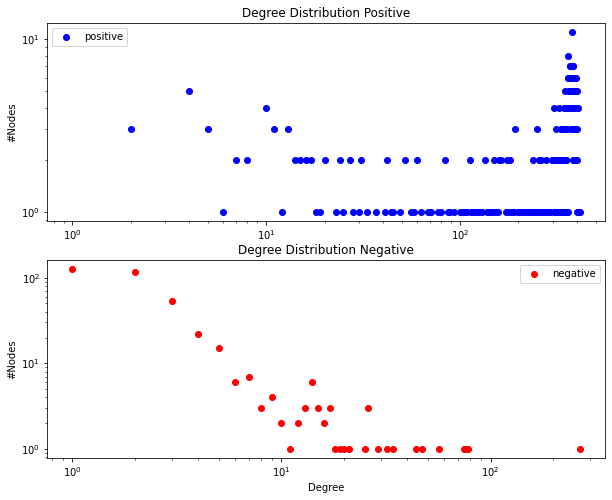

In [5]:
hist_pos = nx.degree_histogram(tot_pos)
hist_neg = nx.degree_histogram(tot_neg)
    
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 8))
ax1.plot(range(0, len(hist_pos)),hist_pos, linestyle=" ", label = 'positive', marker = 'o', color = 'blue')
ax1.set_title('Degree Distribution Positive')
ax1.legend()
ax1.set_xscale('log')
ax1.set_yscale('log')
ax1.set_ylabel('#Nodes')
ax2.plot(range(0, len(hist_neg)),hist_neg, linestyle=" ", label = 'negative', marker = 'o', color = 'red')
ax2.set_title('Degree Distribution Negative')
ax2.set_xlabel('Degree')
ax2.set_ylabel('#Nodes')
ax2.legend()
ax2.loglog()
plt.savefig("plots\\degree_distribution.pdf", format="pdf", bbox_inches="tight")
plt.show()

## Fit Negative Distribution

In [6]:
def fit_power_law_linear(x, y, init):
    opt_parms, parm_cov =curve_fit(powerlaw_fun_linear, x, y, init,maxfev=1000)
    A, B  = opt_parms
    return A, B, parm_cov
def powerlaw_fun_linear(x, A, B):
    return A +B*x

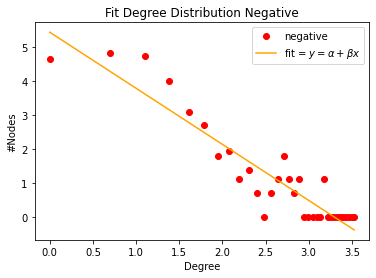

A: 5.43+-0.30, 	 B: -1.65+-0.11, 	 R2: 0.87, 	 chi: 0.9999844669298409


In [7]:
# Actual parameters
ydata = np.array(hist_neg)
ydata = np.log(ydata[ydata >0])
xdata = np.array(range(0, len(ydata)+1))
xdata = np.log(xdata[xdata >0])
init = (100,1.5)
A, B, parm_cov = fit_power_law_linear(xdata, ydata, init)
SE = np.sqrt(np.diag(parm_cov))
x_fit = np.linspace(min(xdata),max(xdata),10000)
fit_y = powerlaw_fun_linear(xdata, A, B )
y_fit = powerlaw_fun_linear(x_fit, A, B)
plt.plot(figsize=(20, 8))
plt.plot(xdata, ydata, marker = 'o', color = 'red', label='negative', linestyle=" ")
plt.plot(x_fit, y_fit, '-', label=r'fit = $y = \alpha + \beta x$'
         , color ='orange')
plt.legend()
plt.title('Fit Degree Distribution Negative')
plt.ylabel('#Nodes')
plt.xlabel('Degree')
plt.savefig("plots\\degree_distribution_negative_fit.pdf", format="pdf", bbox_inches="tight")
plt.show()
R2 = r2_score(ydata,fit_y)
chisq = chisquare(f_obs = ydata, f_exp=fit_y)
print(f'A: {A:.2f}+-{SE[0]:.2f}, \t B: {B:.2f}+-{SE[1]:.2f}, \t R2: {R2:.2f}, \t chi: {chisq[1]:}')

## Fit Positive Distribution

In [9]:
def fit_positive_law(x, y, init):
    opt_parms, parm_cov =curve_fit(law_positive_fun, x, y, init,maxfev=1000000)
    A= opt_parms
    return A, parm_cov
def law_positive_fun(x, A):
    return A**(x)

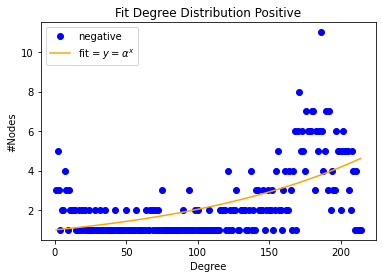

A: 1.0071711652298336+- 0.0002337626336974155, 	 R2: 0.36, 	 chi: 200.31843714148695


In [10]:
ydata = np.array(hist_pos)
ydata = ydata[ydata >0]
xdata = np.array(range(0, len(ydata)+1))
xdata = xdata[xdata >0]
init = 3
A,parm_cov = fit_positive_law(xdata, ydata, init)
SE = np.sqrt(np.diag(parm_cov))
x_fit = np.linspace(min(xdata),max(xdata),100000)
fit_y = law_positive_fun(xdata, A[0])
y_fit = law_positive_fun(x_fit, A[0])
plt.plot(figsize=(20, 8))
plt.plot(xdata, ydata, marker = 'o', color = 'blue', label='negative', linestyle=" ")
plt.plot(x_fit, y_fit, '-', label=r'fit = $y = \alpha^{x}$', color ='orange')
plt.legend()
plt.title('Fit Degree Distribution Positive')
plt.ylabel('#Nodes')
plt.xlabel('Degree')
plt.show()
R2 = r2_score(ydata,fit_y)
chi_sq = np.sum(np.divide(np.square(fit_y - ydata), ydata)) 
print(f'A: {A[0]:.2f}+- {SE[0]:.2f}, \t R2: {R2:.2f}, \t chi: {chi_sq}')

## Path and Diameter

In [11]:
comps_pos = list(nx.connected_components(tot_pos))
comps_neg = list(nx.connected_components(tot_neg))
comp_big_pos = nx.subgraph(tot_pos, comps_pos[0])
comp_big_neg = nx.subgraph(tot_neg, comps_neg[0])

In [12]:
pos_diameter = nx.diameter(tot_pos.subgraph(comp_big_pos))

In [13]:
neg_diameter = nx.diameter(tot_neg.subgraph(comp_big_neg))

In [14]:
print(f'Diameter positive : {pos_diameter}\t Diameter negative : {neg_diameter}')

Diameter positive : 5	 Diameter negative : 6


In [15]:
length_positive = collections.defaultdict(list)
for u in (tot_pos.subgraph(comp_big_pos)).nodes():
    for v in (tot_pos.subgraph(comp_big_pos)).nodes():
        if u!= v:
            a = nx.shortest_path_length(comp_big_pos, source=u, target=v)
            length_positive[f'{u}'].append(a)
            print(f'Done positive {u}-{v} !')
length_negative = collections.defaultdict(list)
for u in (tot_neg.subgraph(comp_big_neg)).nodes():
    for v in (tot_neg.subgraph(comp_big_neg)).nodes():
        if u!= v:
            a = nx.shortest_path_length(comp_big_neg, source=u, target=v)
            length_negative[f'{u}'].append(a)
            print(f'Done negative {u}-{v} !')

Done positive A-AAL !
Done positive A-AAP !
Done positive A-AAPL !
Done positive A-ABBV !
Done positive A-ABC !
Done positive A-ABMD !
Done positive A-ABT !
Done positive A-ACN !
Done positive A-ADBE !
Done positive A-ADI !
Done positive A-ADM !
Done positive A-ADP !
Done positive A-ADSK !
Done positive A-AEE !
Done positive A-AEP !
Done positive A-AES !
Done positive A-AFL !
Done positive A-AIG !
Done positive A-AIZ !
Done positive A-AJG !
Done positive A-AKAM !
Done positive A-ALB !
Done positive A-ALGN !
Done positive A-ALK !
Done positive A-ALL !
Done positive A-ALLE !
Done positive A-AMAT !
Done positive A-AMCR !
Done positive A-AMD !
Done positive A-AME !
Done positive A-AMGN !
Done positive A-AMP !
Done positive A-AMT !
Done positive A-AMZN !
Done positive A-ANET !
Done positive A-ANSS !
Done positive A-ANTM !
Done positive A-AON !
Done positive A-AOS !
Done positive A-APA !
Done positive A-APD !
Done positive A-APH !
Done positive A-APTV !
Done positive A-ARE !
Done positive A-

Done positive AAL-ALGN !
Done positive AAL-ALK !
Done positive AAL-ALL !
Done positive AAL-ALLE !
Done positive AAL-AMAT !
Done positive AAL-AMCR !
Done positive AAL-AMD !
Done positive AAL-AME !
Done positive AAL-AMGN !
Done positive AAL-AMP !
Done positive AAL-AMT !
Done positive AAL-AMZN !
Done positive AAL-ANET !
Done positive AAL-ANSS !
Done positive AAL-ANTM !
Done positive AAL-AON !
Done positive AAL-AOS !
Done positive AAL-APA !
Done positive AAL-APD !
Done positive AAL-APH !
Done positive AAL-APTV !
Done positive AAL-ARE !
Done positive AAL-ATO !
Done positive AAL-ATVI !
Done positive AAL-AVB !
Done positive AAL-AVGO !
Done positive AAL-AVY !
Done positive AAL-AWK !
Done positive AAL-AXP !
Done positive AAL-AZO !
Done positive AAL-BA !
Done positive AAL-BAC !
Done positive AAL-BAX !
Done positive AAL-BBWI !
Done positive AAL-BBY !
Done positive AAL-BDX !
Done positive AAL-BEN !
Done positive AAL-BIIB !
Done positive AAL-BIO !
Done positive AAL-BK !
Done positive AAL-BKNG !
Don

Done positive AAP-EXPE !
Done positive AAP-EXR !
Done positive AAP-F !
Done positive AAP-FANG !
Done positive AAP-FAST !
Done positive AAP-FB !
Done positive AAP-FBHS !
Done positive AAP-FCX !
Done positive AAP-FDX !
Done positive AAP-FE !
Done positive AAP-FFIV !
Done positive AAP-FIS !
Done positive AAP-FISV !
Done positive AAP-FITB !
Done positive AAP-FLT !
Done positive AAP-FMC !
Done positive AAP-FOX !
Done positive AAP-FOXA !
Done positive AAP-FRC !
Done positive AAP-FRT !
Done positive AAP-FTNT !
Done positive AAP-FTV !
Done positive AAP-GD !
Done positive AAP-GE !
Done positive AAP-GILD !
Done positive AAP-GIS !
Done positive AAP-GL !
Done positive AAP-GLW !
Done positive AAP-GM !
Done positive AAP-GNRC !
Done positive AAP-GOOG !
Done positive AAP-GOOGL !
Done positive AAP-GPC !
Done positive AAP-GPN !
Done positive AAP-GPS !
Done positive AAP-GRMN !
Done positive AAP-GS !
Done positive AAP-GWW !
Done positive AAP-HAL !
Done positive AAP-HAS !
Done positive AAP-HBAN !
Done posi

Done positive AAPL-SBAC !
Done positive AAPL-SBUX !
Done positive AAPL-SCHW !
Done positive AAPL-SEE !
Done positive AAPL-SHW !
Done positive AAPL-SIVB !
Done positive AAPL-SJM !
Done positive AAPL-SLB !
Done positive AAPL-SNA !
Done positive AAPL-SNPS !
Done positive AAPL-SO !
Done positive AAPL-SPG !
Done positive AAPL-SPGI !
Done positive AAPL-SRE !
Done positive AAPL-STE !
Done positive AAPL-STT !
Done positive AAPL-STX !
Done positive AAPL-STZ !
Done positive AAPL-SWK !
Done positive AAPL-SWKS !
Done positive AAPL-SYF !
Done positive AAPL-SYK !
Done positive AAPL-SYY !
Done positive AAPL-T !
Done positive AAPL-TAP !
Done positive AAPL-TDG !
Done positive AAPL-TDY !
Done positive AAPL-TECH !
Done positive AAPL-TEL !
Done positive AAPL-TER !
Done positive AAPL-TFC !
Done positive AAPL-TFX !
Done positive AAPL-TGT !
Done positive AAPL-TJX !
Done positive AAPL-TMO !
Done positive AAPL-TMUS !
Done positive AAPL-TPR !
Done positive AAPL-TRMB !
Done positive AAPL-TROW !
Done positive AAP

Done positive ABC-CMA !
Done positive ABC-CMCSA !
Done positive ABC-CME !
Done positive ABC-CMG !
Done positive ABC-CMI !
Done positive ABC-CMS !
Done positive ABC-CNC !
Done positive ABC-CNP !
Done positive ABC-COF !
Done positive ABC-COO !
Done positive ABC-COP !
Done positive ABC-COST !
Done positive ABC-CPB !
Done positive ABC-CPRT !
Done positive ABC-CRL !
Done positive ABC-CRM !
Done positive ABC-CSCO !
Done positive ABC-CSX !
Done positive ABC-CTAS !
Done positive ABC-CTLT !
Done positive ABC-CTRA !
Done positive ABC-CTSH !
Done positive ABC-CTVA !
Done positive ABC-CTXS !
Done positive ABC-CVS !
Done positive ABC-CVX !
Done positive ABC-CZR !
Done positive ABC-D !
Done positive ABC-DAL !
Done positive ABC-DD !
Done positive ABC-DE !
Done positive ABC-DFS !
Done positive ABC-DG !
Done positive ABC-DGX !
Done positive ABC-DHI !
Done positive ABC-DHR !
Done positive ABC-DIS !
Done positive ABC-DISH !
Done positive ABC-DLR !
Done positive ABC-DLTR !
Done positive ABC-DOV !
Done pos

Done positive ABMD-HUM !
Done positive ABMD-HWM !
Done positive ABMD-IBM !
Done positive ABMD-ICE !
Done positive ABMD-IDXX !
Done positive ABMD-IEX !
Done positive ABMD-IFF !
Done positive ABMD-ILMN !
Done positive ABMD-INCY !
Done positive ABMD-INTC !
Done positive ABMD-INTU !
Done positive ABMD-IP !
Done positive ABMD-IPG !
Done positive ABMD-IPGP !
Done positive ABMD-IQV !
Done positive ABMD-IR !
Done positive ABMD-IRM !
Done positive ABMD-ISRG !
Done positive ABMD-IT !
Done positive ABMD-ITW !
Done positive ABMD-IVZ !
Done positive ABMD-J !
Done positive ABMD-JBHT !
Done positive ABMD-JCI !
Done positive ABMD-JKHY !
Done positive ABMD-JNJ !
Done positive ABMD-JNPR !
Done positive ABMD-JPM !
Done positive ABMD-K !
Done positive ABMD-KEY !
Done positive ABMD-KEYS !
Done positive ABMD-KHC !
Done positive ABMD-KIM !
Done positive ABMD-KLAC !
Done positive ABMD-KMB !
Done positive ABMD-KMX !
Done positive ABMD-KO !
Done positive ABMD-KR !
Done positive ABMD-L !
Done positive ABMD-LDOS 

Done positive ABT-TRV !
Done positive ABT-TSCO !
Done positive ABT-TSLA !
Done positive ABT-TSN !
Done positive ABT-TT !
Done positive ABT-TTWO !
Done positive ABT-TWTR !
Done positive ABT-TXN !
Done positive ABT-TXT !
Done positive ABT-TYL !
Done positive ABT-UA !
Done positive ABT-UAA !
Done positive ABT-UAL !
Done positive ABT-UDR !
Done positive ABT-UHS !
Done positive ABT-ULTA !
Done positive ABT-UNH !
Done positive ABT-UNP !
Done positive ABT-UPS !
Done positive ABT-URI !
Done positive ABT-USB !
Done positive ABT-V !
Done positive ABT-VFC !
Done positive ABT-VLO !
Done positive ABT-VMC !
Done positive ABT-VNO !
Done positive ABT-VRSK !
Done positive ABT-VRSN !
Done positive ABT-VRTX !
Done positive ABT-VTR !
Done positive ABT-VTRS !
Done positive ABT-VZ !
Done positive ABT-WAB !
Done positive ABT-WAT !
Done positive ABT-WBA !
Done positive ABT-WDC !
Done positive ABT-WEC !
Done positive ABT-WELL !
Done positive ABT-WFC !
Done positive ABT-WHR !
Done positive ABT-WM !
Done positiv

Done positive ADBE-BMY !
Done positive ADBE-BR !
Done positive ADBE-BRO !
Done positive ADBE-BSX !
Done positive ADBE-BWA !
Done positive ADBE-BXP !
Done positive ADBE-C !
Done positive ADBE-CAG !
Done positive ADBE-CAH !
Done positive ADBE-CARR !
Done positive ADBE-CAT !
Done positive ADBE-CB !
Done positive ADBE-CBOE !
Done positive ADBE-CBRE !
Done positive ADBE-CCI !
Done positive ADBE-CCL !
Done positive ADBE-CDAY !
Done positive ADBE-CDNS !
Done positive ADBE-CDW !
Done positive ADBE-CE !
Done positive ADBE-CERN !
Done positive ADBE-CF !
Done positive ADBE-CFG !
Done positive ADBE-CHD !
Done positive ADBE-CHRW !
Done positive ADBE-CHTR !
Done positive ADBE-CI !
Done positive ADBE-CINF !
Done positive ADBE-CL !
Done positive ADBE-CLX !
Done positive ADBE-CMA !
Done positive ADBE-CMCSA !
Done positive ADBE-CME !
Done positive ADBE-CMG !
Done positive ADBE-CMI !
Done positive ADBE-CMS !
Done positive ADBE-CNC !
Done positive ADBE-CNP !
Done positive ADBE-COF !
Done positive ADBE-COO

Done positive ADI-KHC !
Done positive ADI-KIM !
Done positive ADI-KLAC !
Done positive ADI-KMB !
Done positive ADI-KMX !
Done positive ADI-KO !
Done positive ADI-KR !
Done positive ADI-L !
Done positive ADI-LDOS !
Done positive ADI-LEG !
Done positive ADI-LEN !
Done positive ADI-LH !
Done positive ADI-LHX !
Done positive ADI-LIN !
Done positive ADI-LKQ !
Done positive ADI-LLY !
Done positive ADI-LMT !
Done positive ADI-LNC !
Done positive ADI-LNT !
Done positive ADI-LOW !
Done positive ADI-LRCX !
Done positive ADI-LUMN !
Done positive ADI-LUV !
Done positive ADI-LW !
Done positive ADI-LYB !
Done positive ADI-LYV !
Done positive ADI-MA !
Done positive ADI-MAA !
Done positive ADI-MAR !
Done positive ADI-MAS !
Done positive ADI-MCD !
Done positive ADI-MCHP !
Done positive ADI-MCK !
Done positive ADI-MCO !
Done positive ADI-MDLZ !
Done positive ADI-MDT !
Done positive ADI-MET !
Done positive ADI-MGM !
Done positive ADI-MHK !
Done positive ADI-MKC !
Done positive ADI-MKTX !
Done positive AD

Done positive ADM-TFX !
Done positive ADM-TGT !
Done positive ADM-TJX !
Done positive ADM-TMO !
Done positive ADM-TMUS !
Done positive ADM-TPR !
Done positive ADM-TRMB !
Done positive ADM-TROW !
Done positive ADM-TRV !
Done positive ADM-TSCO !
Done positive ADM-TSLA !
Done positive ADM-TSN !
Done positive ADM-TT !
Done positive ADM-TTWO !
Done positive ADM-TWTR !
Done positive ADM-TXN !
Done positive ADM-TXT !
Done positive ADM-TYL !
Done positive ADM-UA !
Done positive ADM-UAA !
Done positive ADM-UAL !
Done positive ADM-UDR !
Done positive ADM-UHS !
Done positive ADM-ULTA !
Done positive ADM-UNH !
Done positive ADM-UNP !
Done positive ADM-UPS !
Done positive ADM-URI !
Done positive ADM-USB !
Done positive ADM-V !
Done positive ADM-VFC !
Done positive ADM-VLO !
Done positive ADM-VMC !
Done positive ADM-VNO !
Done positive ADM-VRSK !
Done positive ADM-VRSN !
Done positive ADM-VRTX !
Done positive ADM-VTR !
Done positive ADM-VTRS !
Done positive ADM-VZ !
Done positive ADM-WAB !
Done posi

Done positive ADSK-DD !
Done positive ADSK-DE !
Done positive ADSK-DFS !
Done positive ADSK-DG !
Done positive ADSK-DGX !
Done positive ADSK-DHI !
Done positive ADSK-DHR !
Done positive ADSK-DIS !
Done positive ADSK-DISH !
Done positive ADSK-DLR !
Done positive ADSK-DLTR !
Done positive ADSK-DOV !
Done positive ADSK-DOW !
Done positive ADSK-DPZ !
Done positive ADSK-DRE !
Done positive ADSK-DRI !
Done positive ADSK-DTE !
Done positive ADSK-DUK !
Done positive ADSK-DVA !
Done positive ADSK-DVN !
Done positive ADSK-DXC !
Done positive ADSK-DXCM !
Done positive ADSK-EA !
Done positive ADSK-EBAY !
Done positive ADSK-ECL !
Done positive ADSK-ED !
Done positive ADSK-EFX !
Done positive ADSK-EIX !
Done positive ADSK-EL !
Done positive ADSK-EMN !
Done positive ADSK-EMR !
Done positive ADSK-ENPH !
Done positive ADSK-EOG !
Done positive ADSK-EQIX !
Done positive ADSK-EQR !
Done positive ADSK-ES !
Done positive ADSK-ESS !
Done positive ADSK-ETN !
Done positive ADSK-ETR !
Done positive ADSK-ETSY !


Done positive AEE-NTAP !
Done positive AEE-NTRS !
Done positive AEE-NUE !
Done positive AEE-NVDA !
Done positive AEE-NVR !
Done positive AEE-NWL !
Done positive AEE-NWS !
Done positive AEE-NWSA !
Done positive AEE-NXPI !
Done positive AEE-O !
Done positive AEE-ODFL !
Done positive AEE-OKE !
Done positive AEE-OMC !
Done positive AEE-ORCL !
Done positive AEE-ORLY !
Done positive AEE-OTIS !
Done positive AEE-OXY !
Done positive AEE-PAYC !
Done positive AEE-PAYX !
Done positive AEE-PCAR !
Done positive AEE-PEAK !
Done positive AEE-PEG !
Done positive AEE-PENN !
Done positive AEE-PEP !
Done positive AEE-PFE !
Done positive AEE-PFG !
Done positive AEE-PG !
Done positive AEE-PGR !
Done positive AEE-PH !
Done positive AEE-PHM !
Done positive AEE-PKG !
Done positive AEE-PKI !
Done positive AEE-PLD !
Done positive AEE-PM !
Done positive AEE-PNC !
Done positive AEE-PNR !
Done positive AEE-PNW !
Done positive AEE-POOL !
Done positive AEE-PPG !
Done positive AEE-PPL !
Done positive AEE-PRU !
Done p

Done positive AES-AJG !
Done positive AES-AKAM !
Done positive AES-ALB !
Done positive AES-ALGN !
Done positive AES-ALK !
Done positive AES-ALL !
Done positive AES-ALLE !
Done positive AES-AMAT !
Done positive AES-AMCR !
Done positive AES-AMD !
Done positive AES-AME !
Done positive AES-AMGN !
Done positive AES-AMP !
Done positive AES-AMT !
Done positive AES-AMZN !
Done positive AES-ANET !
Done positive AES-ANSS !
Done positive AES-ANTM !
Done positive AES-AON !
Done positive AES-AOS !
Done positive AES-APA !
Done positive AES-APD !
Done positive AES-APH !
Done positive AES-APTV !
Done positive AES-ARE !
Done positive AES-ATO !
Done positive AES-ATVI !
Done positive AES-AVB !
Done positive AES-AVGO !
Done positive AES-AVY !
Done positive AES-AWK !
Done positive AES-AXP !
Done positive AES-AZO !
Done positive AES-BA !
Done positive AES-BAC !
Done positive AES-BAX !
Done positive AES-BBWI !
Done positive AES-BBY !
Done positive AES-BDX !
Done positive AES-BEN !
Done positive AES-BIIB !
Do

Done positive AFL-NI !
Done positive AFL-NKE !
Done positive AFL-NLOK !
Done positive AFL-NLSN !
Done positive AFL-NOC !
Done positive AFL-NOW !
Done positive AFL-NRG !
Done positive AFL-NSC !
Done positive AFL-NTAP !
Done positive AFL-NTRS !
Done positive AFL-NUE !
Done positive AFL-NVDA !
Done positive AFL-NVR !
Done positive AFL-NWL !
Done positive AFL-NWS !
Done positive AFL-NWSA !
Done positive AFL-NXPI !
Done positive AFL-O !
Done positive AFL-ODFL !
Done positive AFL-OKE !
Done positive AFL-OMC !
Done positive AFL-ORCL !
Done positive AFL-ORLY !
Done positive AFL-OTIS !
Done positive AFL-OXY !
Done positive AFL-PAYC !
Done positive AFL-PAYX !
Done positive AFL-PCAR !
Done positive AFL-PEAK !
Done positive AFL-PEG !
Done positive AFL-PENN !
Done positive AFL-PEP !
Done positive AFL-PFE !
Done positive AFL-PFG !
Done positive AFL-PG !
Done positive AFL-PGR !
Done positive AFL-PH !
Done positive AFL-PHM !
Done positive AFL-PKG !
Done positive AFL-PKI !
Done positive AFL-PLD !
Done 

Done positive AIZ-CCI !
Done positive AIZ-CCL !
Done positive AIZ-CDAY !
Done positive AIZ-CDNS !
Done positive AIZ-CDW !
Done positive AIZ-CE !
Done positive AIZ-CERN !
Done positive AIZ-CF !
Done positive AIZ-CFG !
Done positive AIZ-CHD !
Done positive AIZ-CHRW !
Done positive AIZ-CHTR !
Done positive AIZ-CI !
Done positive AIZ-CINF !
Done positive AIZ-CL !
Done positive AIZ-CLX !
Done positive AIZ-CMA !
Done positive AIZ-CMCSA !
Done positive AIZ-CME !
Done positive AIZ-CMG !
Done positive AIZ-CMI !
Done positive AIZ-CMS !
Done positive AIZ-CNC !
Done positive AIZ-CNP !
Done positive AIZ-COF !
Done positive AIZ-COO !
Done positive AIZ-COP !
Done positive AIZ-COST !
Done positive AIZ-CPB !
Done positive AIZ-CPRT !
Done positive AIZ-CRL !
Done positive AIZ-CRM !
Done positive AIZ-CSCO !
Done positive AIZ-CSX !
Done positive AIZ-CTAS !
Done positive AIZ-CTLT !
Done positive AIZ-CTRA !
Done positive AIZ-CTSH !
Done positive AIZ-CTVA !
Done positive AIZ-CTXS !
Done positive AIZ-CVS !
Don

Done positive AJG-MPC !
Done positive AJG-MPWR !
Done positive AJG-MRK !
Done positive AJG-MRNA !
Done positive AJG-MRO !
Done positive AJG-MS !
Done positive AJG-MSCI !
Done positive AJG-MSFT !
Done positive AJG-MSI !
Done positive AJG-MTB !
Done positive AJG-MTCH !
Done positive AJG-MTD !
Done positive AJG-MU !
Done positive AJG-NCLH !
Done positive AJG-NDAQ !
Done positive AJG-NEE !
Done positive AJG-NEM !
Done positive AJG-NFLX !
Done positive AJG-NI !
Done positive AJG-NKE !
Done positive AJG-NLOK !
Done positive AJG-NLSN !
Done positive AJG-NOC !
Done positive AJG-NOW !
Done positive AJG-NRG !
Done positive AJG-NSC !
Done positive AJG-NTAP !
Done positive AJG-NTRS !
Done positive AJG-NUE !
Done positive AJG-NVDA !
Done positive AJG-NVR !
Done positive AJG-NWL !
Done positive AJG-NWS !
Done positive AJG-NWSA !
Done positive AJG-NXPI !
Done positive AJG-O !
Done positive AJG-ODFL !
Done positive AJG-OKE !
Done positive AJG-OMC !
Done positive AJG-ORCL !
Done positive AJG-ORLY !
Don

Done positive ALB-CBOE !
Done positive ALB-CBRE !
Done positive ALB-CCI !
Done positive ALB-CCL !
Done positive ALB-CDAY !
Done positive ALB-CDNS !
Done positive ALB-CDW !
Done positive ALB-CE !
Done positive ALB-CERN !
Done positive ALB-CF !
Done positive ALB-CFG !
Done positive ALB-CHD !
Done positive ALB-CHRW !
Done positive ALB-CHTR !
Done positive ALB-CI !
Done positive ALB-CINF !
Done positive ALB-CL !
Done positive ALB-CLX !
Done positive ALB-CMA !
Done positive ALB-CMCSA !
Done positive ALB-CME !
Done positive ALB-CMG !
Done positive ALB-CMI !
Done positive ALB-CMS !
Done positive ALB-CNC !
Done positive ALB-CNP !
Done positive ALB-COF !
Done positive ALB-COO !
Done positive ALB-COP !
Done positive ALB-COST !
Done positive ALB-CPB !
Done positive ALB-CPRT !
Done positive ALB-CRL !
Done positive ALB-CRM !
Done positive ALB-CSCO !
Done positive ALB-CSX !
Done positive ALB-CTAS !
Done positive ALB-CTLT !
Done positive ALB-CTRA !
Done positive ALB-CTSH !
Done positive ALB-CTVA !
Do

Done positive ALGN-JNJ !
Done positive ALGN-JNPR !
Done positive ALGN-JPM !
Done positive ALGN-K !
Done positive ALGN-KEY !
Done positive ALGN-KEYS !
Done positive ALGN-KHC !
Done positive ALGN-KIM !
Done positive ALGN-KLAC !
Done positive ALGN-KMB !
Done positive ALGN-KMX !
Done positive ALGN-KO !
Done positive ALGN-KR !
Done positive ALGN-L !
Done positive ALGN-LDOS !
Done positive ALGN-LEG !
Done positive ALGN-LEN !
Done positive ALGN-LH !
Done positive ALGN-LHX !
Done positive ALGN-LIN !
Done positive ALGN-LKQ !
Done positive ALGN-LLY !
Done positive ALGN-LMT !
Done positive ALGN-LNC !
Done positive ALGN-LNT !
Done positive ALGN-LOW !
Done positive ALGN-LRCX !
Done positive ALGN-LUMN !
Done positive ALGN-LUV !
Done positive ALGN-LW !
Done positive ALGN-LYB !
Done positive ALGN-LYV !
Done positive ALGN-MA !
Done positive ALGN-MAA !
Done positive ALGN-MAR !
Done positive ALGN-MAS !
Done positive ALGN-MCD !
Done positive ALGN-MCHP !
Done positive ALGN-MCK !
Done positive ALGN-MCO !
Do

Done positive ALK-TGT !
Done positive ALK-TJX !
Done positive ALK-TMO !
Done positive ALK-TMUS !
Done positive ALK-TPR !
Done positive ALK-TRMB !
Done positive ALK-TROW !
Done positive ALK-TRV !
Done positive ALK-TSCO !
Done positive ALK-TSLA !
Done positive ALK-TSN !
Done positive ALK-TT !
Done positive ALK-TTWO !
Done positive ALK-TWTR !
Done positive ALK-TXN !
Done positive ALK-TXT !
Done positive ALK-TYL !
Done positive ALK-UA !
Done positive ALK-UAA !
Done positive ALK-UAL !
Done positive ALK-UDR !
Done positive ALK-UHS !
Done positive ALK-ULTA !
Done positive ALK-UNH !
Done positive ALK-UNP !
Done positive ALK-UPS !
Done positive ALK-URI !
Done positive ALK-USB !
Done positive ALK-V !
Done positive ALK-VFC !
Done positive ALK-VLO !
Done positive ALK-VMC !
Done positive ALK-VNO !
Done positive ALK-VRSK !
Done positive ALK-VRSN !
Done positive ALK-VRTX !
Done positive ALK-VTR !
Done positive ALK-VTRS !
Done positive ALK-VZ !
Done positive ALK-WAB !
Done positive ALK-WAT !
Done posi

Done positive ALLE-DHI !
Done positive ALLE-DHR !
Done positive ALLE-DIS !
Done positive ALLE-DISH !
Done positive ALLE-DLR !
Done positive ALLE-DLTR !
Done positive ALLE-DOV !
Done positive ALLE-DOW !
Done positive ALLE-DPZ !
Done positive ALLE-DRE !
Done positive ALLE-DRI !
Done positive ALLE-DTE !
Done positive ALLE-DUK !
Done positive ALLE-DVA !
Done positive ALLE-DVN !
Done positive ALLE-DXC !
Done positive ALLE-DXCM !
Done positive ALLE-EA !
Done positive ALLE-EBAY !
Done positive ALLE-ECL !
Done positive ALLE-ED !
Done positive ALLE-EFX !
Done positive ALLE-EIX !
Done positive ALLE-EL !
Done positive ALLE-EMN !
Done positive ALLE-EMR !
Done positive ALLE-ENPH !
Done positive ALLE-EOG !
Done positive ALLE-EQIX !
Done positive ALLE-EQR !
Done positive ALLE-ES !
Done positive ALLE-ESS !
Done positive ALLE-ETN !
Done positive ALLE-ETR !
Done positive ALLE-ETSY !
Done positive ALLE-EVRG !
Done positive ALLE-EW !
Done positive ALLE-EXC !
Done positive ALLE-EXPD !
Done positive ALLE-EX

Done positive AMAT-MHK !
Done positive AMAT-MKC !
Done positive AMAT-MKTX !
Done positive AMAT-MLM !
Done positive AMAT-MMC !
Done positive AMAT-MMM !
Done positive AMAT-MNST !
Done positive AMAT-MO !
Done positive AMAT-MOS !
Done positive AMAT-MPC !
Done positive AMAT-MPWR !
Done positive AMAT-MRK !
Done positive AMAT-MRNA !
Done positive AMAT-MRO !
Done positive AMAT-MS !
Done positive AMAT-MSCI !
Done positive AMAT-MSFT !
Done positive AMAT-MSI !
Done positive AMAT-MTB !
Done positive AMAT-MTCH !
Done positive AMAT-MTD !
Done positive AMAT-MU !
Done positive AMAT-NCLH !
Done positive AMAT-NDAQ !
Done positive AMAT-NEE !
Done positive AMAT-NEM !
Done positive AMAT-NFLX !
Done positive AMAT-NI !
Done positive AMAT-NKE !
Done positive AMAT-NLOK !
Done positive AMAT-NLSN !
Done positive AMAT-NOC !
Done positive AMAT-NOW !
Done positive AMAT-NRG !
Done positive AMAT-NSC !
Done positive AMAT-NTAP !
Done positive AMAT-NTRS !
Done positive AMAT-NUE !
Done positive AMAT-NVDA !
Done positive 

Done positive AMCR-ULTA !
Done positive AMCR-UNH !
Done positive AMCR-UNP !
Done positive AMCR-UPS !
Done positive AMCR-URI !
Done positive AMCR-USB !
Done positive AMCR-V !
Done positive AMCR-VFC !
Done positive AMCR-VLO !
Done positive AMCR-VMC !
Done positive AMCR-VNO !
Done positive AMCR-VRSK !
Done positive AMCR-VRSN !
Done positive AMCR-VRTX !
Done positive AMCR-VTR !
Done positive AMCR-VTRS !
Done positive AMCR-VZ !
Done positive AMCR-WAB !
Done positive AMCR-WAT !
Done positive AMCR-WBA !
Done positive AMCR-WDC !
Done positive AMCR-WEC !
Done positive AMCR-WELL !
Done positive AMCR-WFC !
Done positive AMCR-WHR !
Done positive AMCR-WM !
Done positive AMCR-WMB !
Done positive AMCR-WMT !
Done positive AMCR-WRB !
Done positive AMCR-WRK !
Done positive AMCR-WST !
Done positive AMCR-WU !
Done positive AMCR-WY !
Done positive AMCR-WYNN !
Done positive AMCR-XEL !
Done positive AMCR-XOM !
Done positive AMCR-XRAY !
Done positive AMCR-XYL !
Done positive AMCR-YUM !
Done positive AMCR-ZBH 

Done positive AME-MRO !
Done positive AME-MS !
Done positive AME-MSCI !
Done positive AME-MSFT !
Done positive AME-MSI !
Done positive AME-MTB !
Done positive AME-MTCH !
Done positive AME-MTD !
Done positive AME-MU !
Done positive AME-NCLH !
Done positive AME-NDAQ !
Done positive AME-NEE !
Done positive AME-NEM !
Done positive AME-NFLX !
Done positive AME-NI !
Done positive AME-NKE !
Done positive AME-NLOK !
Done positive AME-NLSN !
Done positive AME-NOC !
Done positive AME-NOW !
Done positive AME-NRG !
Done positive AME-NSC !
Done positive AME-NTAP !
Done positive AME-NTRS !
Done positive AME-NUE !
Done positive AME-NVDA !
Done positive AME-NVR !
Done positive AME-NWL !
Done positive AME-NWS !
Done positive AME-NWSA !
Done positive AME-NXPI !
Done positive AME-O !
Done positive AME-ODFL !
Done positive AME-OKE !
Done positive AME-OMC !
Done positive AME-ORCL !
Done positive AME-ORLY !
Done positive AME-OTIS !
Done positive AME-OXY !
Done positive AME-PAYC !
Done positive AME-PAYX !
Do

Done positive AMP-A !
Done positive AMP-AAL !
Done positive AMP-AAP !
Done positive AMP-AAPL !
Done positive AMP-ABBV !
Done positive AMP-ABC !
Done positive AMP-ABMD !
Done positive AMP-ABT !
Done positive AMP-ACN !
Done positive AMP-ADBE !
Done positive AMP-ADI !
Done positive AMP-ADM !
Done positive AMP-ADP !
Done positive AMP-ADSK !
Done positive AMP-AEE !
Done positive AMP-AEP !
Done positive AMP-AES !
Done positive AMP-AFL !
Done positive AMP-AIG !
Done positive AMP-AIZ !
Done positive AMP-AJG !
Done positive AMP-AKAM !
Done positive AMP-ALB !
Done positive AMP-ALGN !
Done positive AMP-ALK !
Done positive AMP-ALL !
Done positive AMP-ALLE !
Done positive AMP-AMAT !
Done positive AMP-AMCR !
Done positive AMP-AMD !
Done positive AMP-AME !
Done positive AMP-AMGN !
Done positive AMP-AMT !
Done positive AMP-AMZN !
Done positive AMP-ANET !
Done positive AMP-ANSS !
Done positive AMP-ANTM !
Done positive AMP-AON !
Done positive AMP-AOS !
Done positive AMP-APA !
Done positive AMP-APD !
Don

Done positive AMT-FE !
Done positive AMT-FFIV !
Done positive AMT-FIS !
Done positive AMT-FISV !
Done positive AMT-FITB !
Done positive AMT-FLT !
Done positive AMT-FMC !
Done positive AMT-FOX !
Done positive AMT-FOXA !
Done positive AMT-FRC !
Done positive AMT-FRT !
Done positive AMT-FTNT !
Done positive AMT-FTV !
Done positive AMT-GD !
Done positive AMT-GE !
Done positive AMT-GILD !
Done positive AMT-GIS !
Done positive AMT-GL !
Done positive AMT-GLW !
Done positive AMT-GM !
Done positive AMT-GNRC !
Done positive AMT-GOOG !
Done positive AMT-GOOGL !
Done positive AMT-GPC !
Done positive AMT-GPN !
Done positive AMT-GPS !
Done positive AMT-GRMN !
Done positive AMT-GS !
Done positive AMT-GWW !
Done positive AMT-HAL !
Done positive AMT-HAS !
Done positive AMT-HBAN !
Done positive AMT-HBI !
Done positive AMT-HCA !
Done positive AMT-HD !
Done positive AMT-HES !
Done positive AMT-HIG !
Done positive AMT-HII !
Done positive AMT-HLT !
Done positive AMT-HOLX !
Done positive AMT-HON !
Done posit

Done positive AMZN-PXD !
Done positive AMZN-PYPL !
Done positive AMZN-QCOM !
Done positive AMZN-QRVO !
Done positive AMZN-RCL !
Done positive AMZN-RE !
Done positive AMZN-REG !
Done positive AMZN-REGN !
Done positive AMZN-RF !
Done positive AMZN-RHI !
Done positive AMZN-RJF !
Done positive AMZN-RL !
Done positive AMZN-RMD !
Done positive AMZN-ROK !
Done positive AMZN-ROL !
Done positive AMZN-ROP !
Done positive AMZN-ROST !
Done positive AMZN-RSG !
Done positive AMZN-RTX !
Done positive AMZN-SBAC !
Done positive AMZN-SBUX !
Done positive AMZN-SCHW !
Done positive AMZN-SEE !
Done positive AMZN-SHW !
Done positive AMZN-SIVB !
Done positive AMZN-SJM !
Done positive AMZN-SLB !
Done positive AMZN-SNA !
Done positive AMZN-SNPS !
Done positive AMZN-SO !
Done positive AMZN-SPG !
Done positive AMZN-SPGI !
Done positive AMZN-SRE !
Done positive AMZN-STE !
Done positive AMZN-STT !
Done positive AMZN-STX !
Done positive AMZN-STZ !
Done positive AMZN-SWK !
Done positive AMZN-SWKS !
Done positive AMZ

Done positive ANSS-CI !
Done positive ANSS-CINF !
Done positive ANSS-CL !
Done positive ANSS-CLX !
Done positive ANSS-CMA !
Done positive ANSS-CMCSA !
Done positive ANSS-CME !
Done positive ANSS-CMG !
Done positive ANSS-CMI !
Done positive ANSS-CMS !
Done positive ANSS-CNC !
Done positive ANSS-CNP !
Done positive ANSS-COF !
Done positive ANSS-COO !
Done positive ANSS-COP !
Done positive ANSS-COST !
Done positive ANSS-CPB !
Done positive ANSS-CPRT !
Done positive ANSS-CRL !
Done positive ANSS-CRM !
Done positive ANSS-CSCO !
Done positive ANSS-CSX !
Done positive ANSS-CTAS !
Done positive ANSS-CTLT !
Done positive ANSS-CTRA !
Done positive ANSS-CTSH !
Done positive ANSS-CTVA !
Done positive ANSS-CTXS !
Done positive ANSS-CVS !
Done positive ANSS-CVX !
Done positive ANSS-CZR !
Done positive ANSS-D !
Done positive ANSS-DAL !
Done positive ANSS-DD !
Done positive ANSS-DE !
Done positive ANSS-DFS !
Done positive ANSS-DG !
Done positive ANSS-DGX !
Done positive ANSS-DHI !
Done positive ANSS-D

Done positive ANTM-MAA !
Done positive ANTM-MAR !
Done positive ANTM-MAS !
Done positive ANTM-MCD !
Done positive ANTM-MCHP !
Done positive ANTM-MCK !
Done positive ANTM-MCO !
Done positive ANTM-MDLZ !
Done positive ANTM-MDT !
Done positive ANTM-MET !
Done positive ANTM-MGM !
Done positive ANTM-MHK !
Done positive ANTM-MKC !
Done positive ANTM-MKTX !
Done positive ANTM-MLM !
Done positive ANTM-MMC !
Done positive ANTM-MMM !
Done positive ANTM-MNST !
Done positive ANTM-MO !
Done positive ANTM-MOS !
Done positive ANTM-MPC !
Done positive ANTM-MPWR !
Done positive ANTM-MRK !
Done positive ANTM-MRNA !
Done positive ANTM-MRO !
Done positive ANTM-MS !
Done positive ANTM-MSCI !
Done positive ANTM-MSFT !
Done positive ANTM-MSI !
Done positive ANTM-MTB !
Done positive ANTM-MTCH !
Done positive ANTM-MTD !
Done positive ANTM-MU !
Done positive ANTM-NCLH !
Done positive ANTM-NDAQ !
Done positive ANTM-NEE !
Done positive ANTM-NEM !
Done positive ANTM-NFLX !
Done positive ANTM-NI !
Done positive ANT

Done positive AON-WMT !
Done positive AON-WRB !
Done positive AON-WRK !
Done positive AON-WST !
Done positive AON-WU !
Done positive AON-WY !
Done positive AON-WYNN !
Done positive AON-XEL !
Done positive AON-XOM !
Done positive AON-XRAY !
Done positive AON-XYL !
Done positive AON-YUM !
Done positive AON-ZBH !
Done positive AON-ZBRA !
Done positive AON-ZION !
Done positive AON-ZTS !
Done positive AOS-A !
Done positive AOS-AAL !
Done positive AOS-AAP !
Done positive AOS-AAPL !
Done positive AOS-ABBV !
Done positive AOS-ABC !
Done positive AOS-ABMD !
Done positive AOS-ABT !
Done positive AOS-ACN !
Done positive AOS-ADBE !
Done positive AOS-ADI !
Done positive AOS-ADM !
Done positive AOS-ADP !
Done positive AOS-ADSK !
Done positive AOS-AEE !
Done positive AOS-AEP !
Done positive AOS-AES !
Done positive AOS-AFL !
Done positive AOS-AIG !
Done positive AOS-AIZ !
Done positive AOS-AJG !
Done positive AOS-AKAM !
Done positive AOS-ALB !
Done positive AOS-ALGN !
Done positive AOS-ALK !
Done posi

Done positive APA-JBHT !
Done positive APA-JCI !
Done positive APA-JKHY !
Done positive APA-JNJ !
Done positive APA-JNPR !
Done positive APA-JPM !
Done positive APA-K !
Done positive APA-KEY !
Done positive APA-KEYS !
Done positive APA-KHC !
Done positive APA-KIM !
Done positive APA-KLAC !
Done positive APA-KMB !
Done positive APA-KMX !
Done positive APA-KO !
Done positive APA-KR !
Done positive APA-L !
Done positive APA-LDOS !
Done positive APA-LEG !
Done positive APA-LEN !
Done positive APA-LH !
Done positive APA-LHX !
Done positive APA-LIN !
Done positive APA-LKQ !
Done positive APA-LLY !
Done positive APA-LMT !
Done positive APA-LNC !
Done positive APA-LNT !
Done positive APA-LOW !
Done positive APA-LRCX !
Done positive APA-LUMN !
Done positive APA-LUV !
Done positive APA-LW !
Done positive APA-LYB !
Done positive APA-LYV !
Done positive APA-MA !
Done positive APA-MAA !
Done positive APA-MAR !
Done positive APA-MAS !
Done positive APA-MCD !
Done positive APA-MCHP !
Done positive AP

Done positive APD-LEN !
Done positive APD-LH !
Done positive APD-LHX !
Done positive APD-LIN !
Done positive APD-LKQ !
Done positive APD-LLY !
Done positive APD-LMT !
Done positive APD-LNC !
Done positive APD-LNT !
Done positive APD-LOW !
Done positive APD-LRCX !
Done positive APD-LUMN !
Done positive APD-LUV !
Done positive APD-LW !
Done positive APD-LYB !
Done positive APD-LYV !
Done positive APD-MA !
Done positive APD-MAA !
Done positive APD-MAR !
Done positive APD-MAS !
Done positive APD-MCD !
Done positive APD-MCHP !
Done positive APD-MCK !
Done positive APD-MCO !
Done positive APD-MDLZ !
Done positive APD-MDT !
Done positive APD-MET !
Done positive APD-MGM !
Done positive APD-MHK !
Done positive APD-MKC !
Done positive APD-MKTX !
Done positive APD-MLM !
Done positive APD-MMC !
Done positive APD-MMM !
Done positive APD-MNST !
Done positive APD-MO !
Done positive APD-MOS !
Done positive APD-MPC !
Done positive APD-MPWR !
Done positive APD-MRK !
Done positive APD-MRNA !
Done positiv

Done positive APH-TWTR !
Done positive APH-TXN !
Done positive APH-TXT !
Done positive APH-TYL !
Done positive APH-UA !
Done positive APH-UAA !
Done positive APH-UAL !
Done positive APH-UDR !
Done positive APH-UHS !
Done positive APH-ULTA !
Done positive APH-UNH !
Done positive APH-UNP !
Done positive APH-UPS !
Done positive APH-URI !
Done positive APH-USB !
Done positive APH-V !
Done positive APH-VFC !
Done positive APH-VLO !
Done positive APH-VMC !
Done positive APH-VNO !
Done positive APH-VRSK !
Done positive APH-VRSN !
Done positive APH-VRTX !
Done positive APH-VTR !
Done positive APH-VTRS !
Done positive APH-VZ !
Done positive APH-WAB !
Done positive APH-WAT !
Done positive APH-WBA !
Done positive APH-WDC !
Done positive APH-WEC !
Done positive APH-WELL !
Done positive APH-WFC !
Done positive APH-WHR !
Done positive APH-WM !
Done positive APH-WMB !
Done positive APH-WMT !
Done positive APH-WRB !
Done positive APH-WRK !
Done positive APH-WST !
Done positive APH-WU !
Done positive A

Done positive ARE-CME !
Done positive ARE-CMG !
Done positive ARE-CMI !
Done positive ARE-CMS !
Done positive ARE-CNC !
Done positive ARE-CNP !
Done positive ARE-COF !
Done positive ARE-COO !
Done positive ARE-COP !
Done positive ARE-COST !
Done positive ARE-CPB !
Done positive ARE-CPRT !
Done positive ARE-CRL !
Done positive ARE-CRM !
Done positive ARE-CSCO !
Done positive ARE-CSX !
Done positive ARE-CTAS !
Done positive ARE-CTLT !
Done positive ARE-CTRA !
Done positive ARE-CTSH !
Done positive ARE-CTVA !
Done positive ARE-CTXS !
Done positive ARE-CVS !
Done positive ARE-CVX !
Done positive ARE-CZR !
Done positive ARE-D !
Done positive ARE-DAL !
Done positive ARE-DD !
Done positive ARE-DE !
Done positive ARE-DFS !
Done positive ARE-DG !
Done positive ARE-DGX !
Done positive ARE-DHI !
Done positive ARE-DHR !
Done positive ARE-DIS !
Done positive ARE-DISH !
Done positive ARE-DLR !
Done positive ARE-DLTR !
Done positive ARE-DOV !
Done positive ARE-DOW !
Done positive ARE-DPZ !
Done posit

Done positive ATO-MGM !
Done positive ATO-MHK !
Done positive ATO-MKC !
Done positive ATO-MKTX !
Done positive ATO-MLM !
Done positive ATO-MMC !
Done positive ATO-MMM !
Done positive ATO-MNST !
Done positive ATO-MO !
Done positive ATO-MOS !
Done positive ATO-MPC !
Done positive ATO-MPWR !
Done positive ATO-MRK !
Done positive ATO-MRNA !
Done positive ATO-MRO !
Done positive ATO-MS !
Done positive ATO-MSCI !
Done positive ATO-MSFT !
Done positive ATO-MSI !
Done positive ATO-MTB !
Done positive ATO-MTCH !
Done positive ATO-MTD !
Done positive ATO-MU !
Done positive ATO-NCLH !
Done positive ATO-NDAQ !
Done positive ATO-NEE !
Done positive ATO-NEM !
Done positive ATO-NFLX !
Done positive ATO-NI !
Done positive ATO-NKE !
Done positive ATO-NLOK !
Done positive ATO-NLSN !
Done positive ATO-NOC !
Done positive ATO-NOW !
Done positive ATO-NRG !
Done positive ATO-NSC !
Done positive ATO-NTAP !
Done positive ATO-NTRS !
Done positive ATO-NUE !
Done positive ATO-NVDA !
Done positive ATO-NVR !
Done 

Done positive ATVI-VRSK !
Done positive ATVI-VRSN !
Done positive ATVI-VRTX !
Done positive ATVI-VTR !
Done positive ATVI-VTRS !
Done positive ATVI-VZ !
Done positive ATVI-WAB !
Done positive ATVI-WAT !
Done positive ATVI-WBA !
Done positive ATVI-WDC !
Done positive ATVI-WEC !
Done positive ATVI-WELL !
Done positive ATVI-WFC !
Done positive ATVI-WHR !
Done positive ATVI-WM !
Done positive ATVI-WMB !
Done positive ATVI-WMT !
Done positive ATVI-WRB !
Done positive ATVI-WRK !
Done positive ATVI-WST !
Done positive ATVI-WU !
Done positive ATVI-WY !
Done positive ATVI-WYNN !
Done positive ATVI-XEL !
Done positive ATVI-XOM !
Done positive ATVI-XRAY !
Done positive ATVI-XYL !
Done positive ATVI-YUM !
Done positive ATVI-ZBH !
Done positive ATVI-ZBRA !
Done positive ATVI-ZION !
Done positive ATVI-ZTS !
Done positive AVB-A !
Done positive AVB-AAL !
Done positive AVB-AAP !
Done positive AVB-AAPL !
Done positive AVB-ABBV !
Done positive AVB-ABC !
Done positive AVB-ABMD !
Done positive AVB-ABT !
Do

Done positive AVGO-EOG !
Done positive AVGO-EQIX !
Done positive AVGO-EQR !
Done positive AVGO-ES !
Done positive AVGO-ESS !
Done positive AVGO-ETN !
Done positive AVGO-ETR !
Done positive AVGO-ETSY !
Done positive AVGO-EVRG !
Done positive AVGO-EW !
Done positive AVGO-EXC !
Done positive AVGO-EXPD !
Done positive AVGO-EXPE !
Done positive AVGO-EXR !
Done positive AVGO-F !
Done positive AVGO-FANG !
Done positive AVGO-FAST !
Done positive AVGO-FB !
Done positive AVGO-FBHS !
Done positive AVGO-FCX !
Done positive AVGO-FDX !
Done positive AVGO-FE !
Done positive AVGO-FFIV !
Done positive AVGO-FIS !
Done positive AVGO-FISV !
Done positive AVGO-FITB !
Done positive AVGO-FLT !
Done positive AVGO-FMC !
Done positive AVGO-FOX !
Done positive AVGO-FOXA !
Done positive AVGO-FRC !
Done positive AVGO-FRT !
Done positive AVGO-FTNT !
Done positive AVGO-FTV !
Done positive AVGO-GD !
Done positive AVGO-GE !
Done positive AVGO-GILD !
Done positive AVGO-GIS !
Done positive AVGO-GL !
Done positive AVGO-G

Done positive AVY-NWSA !
Done positive AVY-NXPI !
Done positive AVY-O !
Done positive AVY-ODFL !
Done positive AVY-OKE !
Done positive AVY-OMC !
Done positive AVY-ORCL !
Done positive AVY-ORLY !
Done positive AVY-OTIS !
Done positive AVY-OXY !
Done positive AVY-PAYC !
Done positive AVY-PAYX !
Done positive AVY-PCAR !
Done positive AVY-PEAK !
Done positive AVY-PEG !
Done positive AVY-PENN !
Done positive AVY-PEP !
Done positive AVY-PFE !
Done positive AVY-PFG !
Done positive AVY-PG !
Done positive AVY-PGR !
Done positive AVY-PH !
Done positive AVY-PHM !
Done positive AVY-PKG !
Done positive AVY-PKI !
Done positive AVY-PLD !
Done positive AVY-PM !
Done positive AVY-PNC !
Done positive AVY-PNR !
Done positive AVY-PNW !
Done positive AVY-POOL !
Done positive AVY-PPG !
Done positive AVY-PPL !
Done positive AVY-PRU !
Done positive AVY-PSA !
Done positive AVY-PSX !
Done positive AVY-PTC !
Done positive AVY-PVH !
Done positive AVY-PWR !
Done positive AVY-PXD !
Done positive AVY-PYPL !
Done pos

Done positive AXP-CZR !
Done positive AXP-D !
Done positive AXP-DAL !
Done positive AXP-DD !
Done positive AXP-DE !
Done positive AXP-DFS !
Done positive AXP-DG !
Done positive AXP-DGX !
Done positive AXP-DHI !
Done positive AXP-DHR !
Done positive AXP-DIS !
Done positive AXP-DISH !
Done positive AXP-DLR !
Done positive AXP-DLTR !
Done positive AXP-DOV !
Done positive AXP-DOW !
Done positive AXP-DPZ !
Done positive AXP-DRE !
Done positive AXP-DRI !
Done positive AXP-DTE !
Done positive AXP-DUK !
Done positive AXP-DVA !
Done positive AXP-DVN !
Done positive AXP-DXC !
Done positive AXP-DXCM !
Done positive AXP-EA !
Done positive AXP-EBAY !
Done positive AXP-ECL !
Done positive AXP-ED !
Done positive AXP-EFX !
Done positive AXP-EIX !
Done positive AXP-EL !
Done positive AXP-EMN !
Done positive AXP-EMR !
Done positive AXP-ENPH !
Done positive AXP-EOG !
Done positive AXP-EQIX !
Done positive AXP-EQR !
Done positive AXP-ES !
Done positive AXP-ESS !
Done positive AXP-ETN !
Done positive AXP-E

Done positive AZO-MAR !
Done positive AZO-MAS !
Done positive AZO-MCD !
Done positive AZO-MCHP !
Done positive AZO-MCK !
Done positive AZO-MCO !
Done positive AZO-MDLZ !
Done positive AZO-MDT !
Done positive AZO-MET !
Done positive AZO-MGM !
Done positive AZO-MHK !
Done positive AZO-MKC !
Done positive AZO-MKTX !
Done positive AZO-MLM !
Done positive AZO-MMC !
Done positive AZO-MMM !
Done positive AZO-MNST !
Done positive AZO-MO !
Done positive AZO-MOS !
Done positive AZO-MPC !
Done positive AZO-MPWR !
Done positive AZO-MRK !
Done positive AZO-MRNA !
Done positive AZO-MRO !
Done positive AZO-MS !
Done positive AZO-MSCI !
Done positive AZO-MSFT !
Done positive AZO-MSI !
Done positive AZO-MTB !
Done positive AZO-MTCH !
Done positive AZO-MTD !
Done positive AZO-MU !
Done positive AZO-NCLH !
Done positive AZO-NDAQ !
Done positive AZO-NEE !
Done positive AZO-NEM !
Done positive AZO-NFLX !
Done positive AZO-NI !
Done positive AZO-NKE !
Done positive AZO-NLOK !
Done positive AZO-NLSN !
Done p

Done positive BA-UAA !
Done positive BA-UAL !
Done positive BA-UDR !
Done positive BA-UHS !
Done positive BA-ULTA !
Done positive BA-UNH !
Done positive BA-UNP !
Done positive BA-UPS !
Done positive BA-URI !
Done positive BA-USB !
Done positive BA-V !
Done positive BA-VFC !
Done positive BA-VLO !
Done positive BA-VMC !
Done positive BA-VNO !
Done positive BA-VRSK !
Done positive BA-VRSN !
Done positive BA-VRTX !
Done positive BA-VTR !
Done positive BA-VTRS !
Done positive BA-VZ !
Done positive BA-WAB !
Done positive BA-WAT !
Done positive BA-WBA !
Done positive BA-WDC !
Done positive BA-WEC !
Done positive BA-WELL !
Done positive BA-WFC !
Done positive BA-WHR !
Done positive BA-WM !
Done positive BA-WMB !
Done positive BA-WMT !
Done positive BA-WRB !
Done positive BA-WRK !
Done positive BA-WST !
Done positive BA-WU !
Done positive BA-WY !
Done positive BA-WYNN !
Done positive BA-XEL !
Done positive BA-XOM !
Done positive BA-XRAY !
Done positive BA-XYL !
Done positive BA-YUM !
Done posi

Done positive BAX-PH !
Done positive BAX-PHM !
Done positive BAX-PKG !
Done positive BAX-PKI !
Done positive BAX-PLD !
Done positive BAX-PM !
Done positive BAX-PNC !
Done positive BAX-PNR !
Done positive BAX-PNW !
Done positive BAX-POOL !
Done positive BAX-PPG !
Done positive BAX-PPL !
Done positive BAX-PRU !
Done positive BAX-PSA !
Done positive BAX-PSX !
Done positive BAX-PTC !
Done positive BAX-PVH !
Done positive BAX-PWR !
Done positive BAX-PXD !
Done positive BAX-PYPL !
Done positive BAX-QCOM !
Done positive BAX-QRVO !
Done positive BAX-RCL !
Done positive BAX-RE !
Done positive BAX-REG !
Done positive BAX-REGN !
Done positive BAX-RF !
Done positive BAX-RHI !
Done positive BAX-RJF !
Done positive BAX-RL !
Done positive BAX-RMD !
Done positive BAX-ROK !
Done positive BAX-ROL !
Done positive BAX-ROP !
Done positive BAX-ROST !
Done positive BAX-RSG !
Done positive BAX-RTX !
Done positive BAX-SBAC !
Done positive BAX-SBUX !
Done positive BAX-SCHW !
Done positive BAX-SEE !
Done positiv

Done positive BBY-DTE !
Done positive BBY-DUK !
Done positive BBY-DVA !
Done positive BBY-DVN !
Done positive BBY-DXC !
Done positive BBY-DXCM !
Done positive BBY-EA !
Done positive BBY-EBAY !
Done positive BBY-ECL !
Done positive BBY-ED !
Done positive BBY-EFX !
Done positive BBY-EIX !
Done positive BBY-EL !
Done positive BBY-EMN !
Done positive BBY-EMR !
Done positive BBY-ENPH !
Done positive BBY-EOG !
Done positive BBY-EQIX !
Done positive BBY-EQR !
Done positive BBY-ES !
Done positive BBY-ESS !
Done positive BBY-ETN !
Done positive BBY-ETR !
Done positive BBY-ETSY !
Done positive BBY-EVRG !
Done positive BBY-EW !
Done positive BBY-EXC !
Done positive BBY-EXPD !
Done positive BBY-EXPE !
Done positive BBY-EXR !
Done positive BBY-F !
Done positive BBY-FANG !
Done positive BBY-FAST !
Done positive BBY-FB !
Done positive BBY-FBHS !
Done positive BBY-FCX !
Done positive BBY-FDX !
Done positive BBY-FE !
Done positive BBY-FFIV !
Done positive BBY-FIS !
Done positive BBY-FISV !
Done positiv

Done positive BDX-MS !
Done positive BDX-MSCI !
Done positive BDX-MSFT !
Done positive BDX-MSI !
Done positive BDX-MTB !
Done positive BDX-MTCH !
Done positive BDX-MTD !
Done positive BDX-MU !
Done positive BDX-NCLH !
Done positive BDX-NDAQ !
Done positive BDX-NEE !
Done positive BDX-NEM !
Done positive BDX-NFLX !
Done positive BDX-NI !
Done positive BDX-NKE !
Done positive BDX-NLOK !
Done positive BDX-NLSN !
Done positive BDX-NOC !
Done positive BDX-NOW !
Done positive BDX-NRG !
Done positive BDX-NSC !
Done positive BDX-NTAP !
Done positive BDX-NTRS !
Done positive BDX-NUE !
Done positive BDX-NVDA !
Done positive BDX-NVR !
Done positive BDX-NWL !
Done positive BDX-NWS !
Done positive BDX-NWSA !
Done positive BDX-NXPI !
Done positive BDX-O !
Done positive BDX-ODFL !
Done positive BDX-OKE !
Done positive BDX-OMC !
Done positive BDX-ORCL !
Done positive BDX-ORLY !
Done positive BDX-OTIS !
Done positive BDX-OXY !
Done positive BDX-PAYC !
Done positive BDX-PAYX !
Done positive BDX-PCAR !
D

Done positive BIIB-HBAN !
Done positive BIIB-HBI !
Done positive BIIB-HCA !
Done positive BIIB-HD !
Done positive BIIB-HES !
Done positive BIIB-HIG !
Done positive BIIB-HII !
Done positive BIIB-HLT !
Done positive BIIB-HOLX !
Done positive BIIB-HON !
Done positive BIIB-HPE !
Done positive BIIB-HPQ !
Done positive BIIB-HRL !
Done positive BIIB-HSIC !
Done positive BIIB-HST !
Done positive BIIB-HSY !
Done positive BIIB-HUM !
Done positive BIIB-HWM !
Done positive BIIB-IBM !
Done positive BIIB-ICE !
Done positive BIIB-IDXX !
Done positive BIIB-IEX !
Done positive BIIB-IFF !
Done positive BIIB-ILMN !
Done positive BIIB-INCY !
Done positive BIIB-INTC !
Done positive BIIB-INTU !
Done positive BIIB-IP !
Done positive BIIB-IPG !
Done positive BIIB-IPGP !
Done positive BIIB-IQV !
Done positive BIIB-IR !
Done positive BIIB-IRM !
Done positive BIIB-ISRG !
Done positive BIIB-IT !
Done positive BIIB-ITW !
Done positive BIIB-IVZ !
Done positive BIIB-J !
Done positive BIIB-JBHT !
Done positive BIIB-J

Done positive BIO-STT !
Done positive BIO-STX !
Done positive BIO-STZ !
Done positive BIO-SWK !
Done positive BIO-SWKS !
Done positive BIO-SYF !
Done positive BIO-SYK !
Done positive BIO-SYY !
Done positive BIO-T !
Done positive BIO-TAP !
Done positive BIO-TDG !
Done positive BIO-TDY !
Done positive BIO-TECH !
Done positive BIO-TEL !
Done positive BIO-TER !
Done positive BIO-TFC !
Done positive BIO-TFX !
Done positive BIO-TGT !
Done positive BIO-TJX !
Done positive BIO-TMO !
Done positive BIO-TMUS !
Done positive BIO-TPR !
Done positive BIO-TRMB !
Done positive BIO-TROW !
Done positive BIO-TRV !
Done positive BIO-TSCO !
Done positive BIO-TSLA !
Done positive BIO-TSN !
Done positive BIO-TT !
Done positive BIO-TTWO !
Done positive BIO-TWTR !
Done positive BIO-TXN !
Done positive BIO-TXT !
Done positive BIO-TYL !
Done positive BIO-UA !
Done positive BIO-UAA !
Done positive BIO-UAL !
Done positive BIO-UDR !
Done positive BIO-UHS !
Done positive BIO-ULTA !
Done positive BIO-UNH !
Done posit

Done positive BKNG-EW !
Done positive BKNG-EXC !
Done positive BKNG-EXPD !
Done positive BKNG-EXPE !
Done positive BKNG-EXR !
Done positive BKNG-F !
Done positive BKNG-FANG !
Done positive BKNG-FAST !
Done positive BKNG-FB !
Done positive BKNG-FBHS !
Done positive BKNG-FCX !
Done positive BKNG-FDX !
Done positive BKNG-FE !
Done positive BKNG-FFIV !
Done positive BKNG-FIS !
Done positive BKNG-FISV !
Done positive BKNG-FITB !
Done positive BKNG-FLT !
Done positive BKNG-FMC !
Done positive BKNG-FOX !
Done positive BKNG-FOXA !
Done positive BKNG-FRC !
Done positive BKNG-FRT !
Done positive BKNG-FTNT !
Done positive BKNG-FTV !
Done positive BKNG-GD !
Done positive BKNG-GE !
Done positive BKNG-GILD !
Done positive BKNG-GIS !
Done positive BKNG-GL !
Done positive BKNG-GLW !
Done positive BKNG-GM !
Done positive BKNG-GNRC !
Done positive BKNG-GOOG !
Done positive BKNG-GOOGL !
Done positive BKNG-GPC !
Done positive BKNG-GPN !
Done positive BKNG-GPS !
Done positive BKNG-GRMN !
Done positive BKNG

Done positive BKR-JPM !
Done positive BKR-K !
Done positive BKR-KEY !
Done positive BKR-KEYS !
Done positive BKR-KHC !
Done positive BKR-KIM !
Done positive BKR-KLAC !
Done positive BKR-KMB !
Done positive BKR-KMX !
Done positive BKR-KO !
Done positive BKR-KR !
Done positive BKR-L !
Done positive BKR-LDOS !
Done positive BKR-LEG !
Done positive BKR-LEN !
Done positive BKR-LH !
Done positive BKR-LHX !
Done positive BKR-LIN !
Done positive BKR-LKQ !
Done positive BKR-LLY !
Done positive BKR-LMT !
Done positive BKR-LNC !
Done positive BKR-LNT !
Done positive BKR-LOW !
Done positive BKR-LRCX !
Done positive BKR-LUMN !
Done positive BKR-LUV !
Done positive BKR-LW !
Done positive BKR-LYB !
Done positive BKR-LYV !
Done positive BKR-MA !
Done positive BKR-MAA !
Done positive BKR-MAR !
Done positive BKR-MAS !
Done positive BKR-MCD !
Done positive BKR-MCHP !
Done positive BKR-MCK !
Done positive BKR-MCO !
Done positive BKR-MDLZ !
Done positive BKR-MDT !
Done positive BKR-MET !
Done positive BKR-

Done positive BMY-ALLE !
Done positive BMY-AMAT !
Done positive BMY-AMCR !
Done positive BMY-AMD !
Done positive BMY-AME !
Done positive BMY-AMGN !
Done positive BMY-AMP !
Done positive BMY-AMT !
Done positive BMY-AMZN !
Done positive BMY-ANET !
Done positive BMY-ANSS !
Done positive BMY-ANTM !
Done positive BMY-AON !
Done positive BMY-AOS !
Done positive BMY-APA !
Done positive BMY-APD !
Done positive BMY-APH !
Done positive BMY-APTV !
Done positive BMY-ARE !
Done positive BMY-ATO !
Done positive BMY-ATVI !
Done positive BMY-AVB !
Done positive BMY-AVGO !
Done positive BMY-AVY !
Done positive BMY-AWK !
Done positive BMY-AXP !
Done positive BMY-AZO !
Done positive BMY-BA !
Done positive BMY-BAC !
Done positive BMY-BAX !
Done positive BMY-BBWI !
Done positive BMY-BBY !
Done positive BMY-BDX !
Done positive BMY-BEN !
Done positive BMY-BIIB !
Done positive BMY-BIO !
Done positive BMY-BK !
Done positive BMY-BKNG !
Done positive BMY-BKR !
Done positive BMY-BLK !
Done positive BMY-BR !
Done 

Done positive BR-ESS !
Done positive BR-ETN !
Done positive BR-ETR !
Done positive BR-ETSY !
Done positive BR-EVRG !
Done positive BR-EW !
Done positive BR-EXC !
Done positive BR-EXPD !
Done positive BR-EXPE !
Done positive BR-EXR !
Done positive BR-F !
Done positive BR-FANG !
Done positive BR-FAST !
Done positive BR-FB !
Done positive BR-FBHS !
Done positive BR-FCX !
Done positive BR-FDX !
Done positive BR-FE !
Done positive BR-FFIV !
Done positive BR-FIS !
Done positive BR-FISV !
Done positive BR-FITB !
Done positive BR-FLT !
Done positive BR-FMC !
Done positive BR-FOX !
Done positive BR-FOXA !
Done positive BR-FRC !
Done positive BR-FRT !
Done positive BR-FTNT !
Done positive BR-FTV !
Done positive BR-GD !
Done positive BR-GE !
Done positive BR-GILD !
Done positive BR-GIS !
Done positive BR-GL !
Done positive BR-GLW !
Done positive BR-GM !
Done positive BR-GNRC !
Done positive BR-GOOG !
Done positive BR-GOOGL !
Done positive BR-GPC !
Done positive BR-GPN !
Done positive BR-GPS !
Don

Done positive BRO-NVDA !
Done positive BRO-NVR !
Done positive BRO-NWL !
Done positive BRO-NWS !
Done positive BRO-NWSA !
Done positive BRO-NXPI !
Done positive BRO-O !
Done positive BRO-ODFL !
Done positive BRO-OKE !
Done positive BRO-OMC !
Done positive BRO-ORCL !
Done positive BRO-ORLY !
Done positive BRO-OTIS !
Done positive BRO-OXY !
Done positive BRO-PAYC !
Done positive BRO-PAYX !
Done positive BRO-PCAR !
Done positive BRO-PEAK !
Done positive BRO-PEG !
Done positive BRO-PENN !
Done positive BRO-PEP !
Done positive BRO-PFE !
Done positive BRO-PFG !
Done positive BRO-PG !
Done positive BRO-PGR !
Done positive BRO-PH !
Done positive BRO-PHM !
Done positive BRO-PKG !
Done positive BRO-PKI !
Done positive BRO-PLD !
Done positive BRO-PM !
Done positive BRO-PNC !
Done positive BRO-PNR !
Done positive BRO-PNW !
Done positive BRO-POOL !
Done positive BRO-PPG !
Done positive BRO-PPL !
Done positive BRO-PRU !
Done positive BRO-PSA !
Done positive BRO-PSX !
Done positive BRO-PTC !
Done pos

Done positive BSX-ZION !
Done positive BSX-ZTS !
Done positive BWA-A !
Done positive BWA-AAL !
Done positive BWA-AAP !
Done positive BWA-AAPL !
Done positive BWA-ABBV !
Done positive BWA-ABC !
Done positive BWA-ABMD !
Done positive BWA-ABT !
Done positive BWA-ACN !
Done positive BWA-ADBE !
Done positive BWA-ADI !
Done positive BWA-ADM !
Done positive BWA-ADP !
Done positive BWA-ADSK !
Done positive BWA-AEE !
Done positive BWA-AEP !
Done positive BWA-AES !
Done positive BWA-AFL !
Done positive BWA-AIG !
Done positive BWA-AIZ !
Done positive BWA-AJG !
Done positive BWA-AKAM !
Done positive BWA-ALB !
Done positive BWA-ALGN !
Done positive BWA-ALK !
Done positive BWA-ALL !
Done positive BWA-ALLE !
Done positive BWA-AMAT !
Done positive BWA-AMCR !
Done positive BWA-AMD !
Done positive BWA-AME !
Done positive BWA-AMGN !
Done positive BWA-AMP !
Done positive BWA-AMT !
Done positive BWA-AMZN !
Done positive BWA-ANET !
Done positive BWA-ANSS !
Done positive BWA-ANTM !
Done positive BWA-AON !
Do

Done positive BXP-DISH !
Done positive BXP-DLR !
Done positive BXP-DLTR !
Done positive BXP-DOV !
Done positive BXP-DOW !
Done positive BXP-DPZ !
Done positive BXP-DRE !
Done positive BXP-DRI !
Done positive BXP-DTE !
Done positive BXP-DUK !
Done positive BXP-DVA !
Done positive BXP-DVN !
Done positive BXP-DXC !
Done positive BXP-DXCM !
Done positive BXP-EA !
Done positive BXP-EBAY !
Done positive BXP-ECL !
Done positive BXP-ED !
Done positive BXP-EFX !
Done positive BXP-EIX !
Done positive BXP-EL !
Done positive BXP-EMN !
Done positive BXP-EMR !
Done positive BXP-ENPH !
Done positive BXP-EOG !
Done positive BXP-EQIX !
Done positive BXP-EQR !
Done positive BXP-ES !
Done positive BXP-ESS !
Done positive BXP-ETN !
Done positive BXP-ETR !
Done positive BXP-ETSY !
Done positive BXP-EVRG !
Done positive BXP-EW !
Done positive BXP-EXC !
Done positive BXP-EXPD !
Done positive BXP-EXPE !
Done positive BXP-EXR !
Done positive BXP-F !
Done positive BXP-FANG !
Done positive BXP-FAST !
Done positi

Done positive CAG-ARE !
Done positive CAG-ATO !
Done positive CAG-ATVI !
Done positive CAG-AVB !
Done positive CAG-AVGO !
Done positive CAG-AVY !
Done positive CAG-AWK !
Done positive CAG-AXP !
Done positive CAG-AZO !
Done positive CAG-BA !
Done positive CAG-BAC !
Done positive CAG-BAX !
Done positive CAG-BBWI !
Done positive CAG-BBY !
Done positive CAG-BDX !
Done positive CAG-BEN !
Done positive CAG-BIIB !
Done positive CAG-BIO !
Done positive CAG-BK !
Done positive CAG-BKNG !
Done positive CAG-BKR !
Done positive CAG-BLK !
Done positive CAG-BMY !
Done positive CAG-BR !
Done positive CAG-BRO !
Done positive CAG-BSX !
Done positive CAG-BWA !
Done positive CAG-BXP !
Done positive CAG-C !
Done positive CAG-CAH !
Done positive CAG-CARR !
Done positive CAG-CAT !
Done positive CAG-CB !
Done positive CAG-CBOE !
Done positive CAG-CBRE !
Done positive CAG-CCI !
Done positive CAG-CCL !
Done positive CAG-CDAY !
Done positive CAG-CDNS !
Done positive CAG-CDW !
Done positive CAG-CE !
Done positive

Done positive CAH-CBOE !
Done positive CAH-CBRE !
Done positive CAH-CCI !
Done positive CAH-CCL !
Done positive CAH-CDAY !
Done positive CAH-CDNS !
Done positive CAH-CDW !
Done positive CAH-CE !
Done positive CAH-CERN !
Done positive CAH-CF !
Done positive CAH-CFG !
Done positive CAH-CHD !
Done positive CAH-CHRW !
Done positive CAH-CHTR !
Done positive CAH-CI !
Done positive CAH-CINF !
Done positive CAH-CL !
Done positive CAH-CLX !
Done positive CAH-CMA !
Done positive CAH-CMCSA !
Done positive CAH-CME !
Done positive CAH-CMG !
Done positive CAH-CMI !
Done positive CAH-CMS !
Done positive CAH-CNC !
Done positive CAH-CNP !
Done positive CAH-COF !
Done positive CAH-COO !
Done positive CAH-COP !
Done positive CAH-COST !
Done positive CAH-CPB !
Done positive CAH-CPRT !
Done positive CAH-CRL !
Done positive CAH-CRM !
Done positive CAH-CSCO !
Done positive CAH-CSX !
Done positive CAH-CTAS !
Done positive CAH-CTLT !
Done positive CAH-CTRA !
Done positive CAH-CTSH !
Done positive CAH-CTVA !
Do

Done positive CARR-PTC !
Done positive CARR-PVH !
Done positive CARR-PWR !
Done positive CARR-PXD !
Done positive CARR-PYPL !
Done positive CARR-QCOM !
Done positive CARR-QRVO !
Done positive CARR-RCL !
Done positive CARR-RE !
Done positive CARR-REG !
Done positive CARR-REGN !
Done positive CARR-RF !
Done positive CARR-RHI !
Done positive CARR-RJF !
Done positive CARR-RL !
Done positive CARR-RMD !
Done positive CARR-ROK !
Done positive CARR-ROL !
Done positive CARR-ROP !
Done positive CARR-ROST !
Done positive CARR-RSG !
Done positive CARR-RTX !
Done positive CARR-SBAC !
Done positive CARR-SBUX !
Done positive CARR-SCHW !
Done positive CARR-SEE !
Done positive CARR-SHW !
Done positive CARR-SIVB !
Done positive CARR-SJM !
Done positive CARR-SLB !
Done positive CARR-SNA !
Done positive CARR-SNPS !
Done positive CARR-SO !
Done positive CARR-SPG !
Done positive CARR-SPGI !
Done positive CARR-SRE !
Done positive CARR-STE !
Done positive CARR-STT !
Done positive CARR-STX !
Done positive CARR

Done positive CB-CERN !
Done positive CB-CF !
Done positive CB-CFG !
Done positive CB-CHD !
Done positive CB-CHRW !
Done positive CB-CHTR !
Done positive CB-CI !
Done positive CB-CINF !
Done positive CB-CL !
Done positive CB-CLX !
Done positive CB-CMA !
Done positive CB-CMCSA !
Done positive CB-CME !
Done positive CB-CMG !
Done positive CB-CMI !
Done positive CB-CMS !
Done positive CB-CNC !
Done positive CB-CNP !
Done positive CB-COF !
Done positive CB-COO !
Done positive CB-COP !
Done positive CB-COST !
Done positive CB-CPB !
Done positive CB-CPRT !
Done positive CB-CRL !
Done positive CB-CRM !
Done positive CB-CSCO !
Done positive CB-CSX !
Done positive CB-CTAS !
Done positive CB-CTLT !
Done positive CB-CTRA !
Done positive CB-CTSH !
Done positive CB-CTVA !
Done positive CB-CTXS !
Done positive CB-CVS !
Done positive CB-CVX !
Done positive CB-CZR !
Done positive CB-D !
Done positive CB-DAL !
Done positive CB-DD !
Done positive CB-DE !
Done positive CB-DFS !
Done positive CB-DG !
Done

Done positive CBOE-GM !
Done positive CBOE-GNRC !
Done positive CBOE-GOOG !
Done positive CBOE-GOOGL !
Done positive CBOE-GPC !
Done positive CBOE-GPN !
Done positive CBOE-GPS !
Done positive CBOE-GRMN !
Done positive CBOE-GS !
Done positive CBOE-GWW !
Done positive CBOE-HAL !
Done positive CBOE-HAS !
Done positive CBOE-HBAN !
Done positive CBOE-HBI !
Done positive CBOE-HCA !
Done positive CBOE-HD !
Done positive CBOE-HES !
Done positive CBOE-HIG !
Done positive CBOE-HII !
Done positive CBOE-HLT !
Done positive CBOE-HOLX !
Done positive CBOE-HON !
Done positive CBOE-HPE !
Done positive CBOE-HPQ !
Done positive CBOE-HRL !
Done positive CBOE-HSIC !
Done positive CBOE-HST !
Done positive CBOE-HSY !
Done positive CBOE-HUM !
Done positive CBOE-HWM !
Done positive CBOE-IBM !
Done positive CBOE-ICE !
Done positive CBOE-IDXX !
Done positive CBOE-IEX !
Done positive CBOE-IFF !
Done positive CBOE-ILMN !
Done positive CBOE-INCY !
Done positive CBOE-INTC !
Done positive CBOE-INTU !
Done positive C

Done positive CBRE-IBM !
Done positive CBRE-ICE !
Done positive CBRE-IDXX !
Done positive CBRE-IEX !
Done positive CBRE-IFF !
Done positive CBRE-ILMN !
Done positive CBRE-INCY !
Done positive CBRE-INTC !
Done positive CBRE-INTU !
Done positive CBRE-IP !
Done positive CBRE-IPG !
Done positive CBRE-IPGP !
Done positive CBRE-IQV !
Done positive CBRE-IR !
Done positive CBRE-IRM !
Done positive CBRE-ISRG !
Done positive CBRE-IT !
Done positive CBRE-ITW !
Done positive CBRE-IVZ !
Done positive CBRE-J !
Done positive CBRE-JBHT !
Done positive CBRE-JCI !
Done positive CBRE-JKHY !
Done positive CBRE-JNJ !
Done positive CBRE-JNPR !
Done positive CBRE-JPM !
Done positive CBRE-K !
Done positive CBRE-KEY !
Done positive CBRE-KEYS !
Done positive CBRE-KHC !
Done positive CBRE-KIM !
Done positive CBRE-KLAC !
Done positive CBRE-KMB !
Done positive CBRE-KMX !
Done positive CBRE-KO !
Done positive CBRE-KR !
Done positive CBRE-L !
Done positive CBRE-LDOS !
Done positive CBRE-LEG !
Done positive CBRE-LEN 

Done positive CCI-ROST !
Done positive CCI-RSG !
Done positive CCI-RTX !
Done positive CCI-SBAC !
Done positive CCI-SBUX !
Done positive CCI-SCHW !
Done positive CCI-SEE !
Done positive CCI-SHW !
Done positive CCI-SIVB !
Done positive CCI-SJM !
Done positive CCI-SLB !
Done positive CCI-SNA !
Done positive CCI-SNPS !
Done positive CCI-SO !
Done positive CCI-SPG !
Done positive CCI-SPGI !
Done positive CCI-SRE !
Done positive CCI-STE !
Done positive CCI-STT !
Done positive CCI-STX !
Done positive CCI-STZ !
Done positive CCI-SWK !
Done positive CCI-SWKS !
Done positive CCI-SYF !
Done positive CCI-SYK !
Done positive CCI-SYY !
Done positive CCI-T !
Done positive CCI-TAP !
Done positive CCI-TDG !
Done positive CCI-TDY !
Done positive CCI-TECH !
Done positive CCI-TEL !
Done positive CCI-TER !
Done positive CCI-TFC !
Done positive CCI-TFX !
Done positive CCI-TGT !
Done positive CCI-TJX !
Done positive CCI-TMO !
Done positive CCI-TMUS !
Done positive CCI-TPR !
Done positive CCI-TRMB !
Done pos

Done positive CDAY-HAS !
Done positive CDAY-HBAN !
Done positive CDAY-HBI !
Done positive CDAY-HCA !
Done positive CDAY-HD !
Done positive CDAY-HES !
Done positive CDAY-HIG !
Done positive CDAY-HII !
Done positive CDAY-HLT !
Done positive CDAY-HOLX !
Done positive CDAY-HON !
Done positive CDAY-HPE !
Done positive CDAY-HPQ !
Done positive CDAY-HRL !
Done positive CDAY-HSIC !
Done positive CDAY-HST !
Done positive CDAY-HSY !
Done positive CDAY-HUM !
Done positive CDAY-HWM !
Done positive CDAY-IBM !
Done positive CDAY-ICE !
Done positive CDAY-IDXX !
Done positive CDAY-IEX !
Done positive CDAY-IFF !
Done positive CDAY-ILMN !
Done positive CDAY-INCY !
Done positive CDAY-INTC !
Done positive CDAY-INTU !
Done positive CDAY-IP !
Done positive CDAY-IPG !
Done positive CDAY-IPGP !
Done positive CDAY-IQV !
Done positive CDAY-IR !
Done positive CDAY-IRM !
Done positive CDAY-ISRG !
Done positive CDAY-IT !
Done positive CDAY-ITW !
Done positive CDAY-IVZ !
Done positive CDAY-J !
Done positive CDAY-JB

Done positive CDNS-WDC !
Done positive CDNS-WEC !
Done positive CDNS-WELL !
Done positive CDNS-WFC !
Done positive CDNS-WHR !
Done positive CDNS-WM !
Done positive CDNS-WMB !
Done positive CDNS-WMT !
Done positive CDNS-WRB !
Done positive CDNS-WRK !
Done positive CDNS-WST !
Done positive CDNS-WU !
Done positive CDNS-WY !
Done positive CDNS-WYNN !
Done positive CDNS-XEL !
Done positive CDNS-XOM !
Done positive CDNS-XRAY !
Done positive CDNS-XYL !
Done positive CDNS-YUM !
Done positive CDNS-ZBH !
Done positive CDNS-ZBRA !
Done positive CDNS-ZION !
Done positive CDNS-ZTS !
Done positive CDW-A !
Done positive CDW-AAL !
Done positive CDW-AAP !
Done positive CDW-AAPL !
Done positive CDW-ABBV !
Done positive CDW-ABC !
Done positive CDW-ABMD !
Done positive CDW-ABT !
Done positive CDW-ACN !
Done positive CDW-ADBE !
Done positive CDW-ADI !
Done positive CDW-ADM !
Done positive CDW-ADP !
Done positive CDW-ADSK !
Done positive CDW-AEE !
Done positive CDW-AEP !
Done positive CDW-AES !
Done positiv

Done positive CE-BIIB !
Done positive CE-BIO !
Done positive CE-BK !
Done positive CE-BKNG !
Done positive CE-BKR !
Done positive CE-BLK !
Done positive CE-BMY !
Done positive CE-BR !
Done positive CE-BRO !
Done positive CE-BSX !
Done positive CE-BWA !
Done positive CE-BXP !
Done positive CE-C !
Done positive CE-CAG !
Done positive CE-CAH !
Done positive CE-CARR !
Done positive CE-CAT !
Done positive CE-CB !
Done positive CE-CBOE !
Done positive CE-CBRE !
Done positive CE-CCI !
Done positive CE-CCL !
Done positive CE-CDAY !
Done positive CE-CDNS !
Done positive CE-CDW !
Done positive CE-CERN !
Done positive CE-CF !
Done positive CE-CFG !
Done positive CE-CHD !
Done positive CE-CHRW !
Done positive CE-CHTR !
Done positive CE-CI !
Done positive CE-CINF !
Done positive CE-CL !
Done positive CE-CLX !
Done positive CE-CMA !
Done positive CE-CMCSA !
Done positive CE-CME !
Done positive CE-CMG !
Done positive CE-CMI !
Done positive CE-CMS !
Done positive CE-CNC !
Done positive CE-CNP !
Done p

Done positive CERN-GS !
Done positive CERN-GWW !
Done positive CERN-HAL !
Done positive CERN-HAS !
Done positive CERN-HBAN !
Done positive CERN-HBI !
Done positive CERN-HCA !
Done positive CERN-HD !
Done positive CERN-HES !
Done positive CERN-HIG !
Done positive CERN-HII !
Done positive CERN-HLT !
Done positive CERN-HOLX !
Done positive CERN-HON !
Done positive CERN-HPE !
Done positive CERN-HPQ !
Done positive CERN-HRL !
Done positive CERN-HSIC !
Done positive CERN-HST !
Done positive CERN-HSY !
Done positive CERN-HUM !
Done positive CERN-HWM !
Done positive CERN-IBM !
Done positive CERN-ICE !
Done positive CERN-IDXX !
Done positive CERN-IEX !
Done positive CERN-IFF !
Done positive CERN-ILMN !
Done positive CERN-INCY !
Done positive CERN-INTC !
Done positive CERN-INTU !
Done positive CERN-IP !
Done positive CERN-IPG !
Done positive CERN-IPGP !
Done positive CERN-IQV !
Done positive CERN-IR !
Done positive CERN-IRM !
Done positive CERN-ISRG !
Done positive CERN-IT !
Done positive CERN-I

Done positive CFG-CERN !
Done positive CFG-CF !
Done positive CFG-CHD !
Done positive CFG-CHRW !
Done positive CFG-CHTR !
Done positive CFG-CI !
Done positive CFG-CINF !
Done positive CFG-CL !
Done positive CFG-CLX !
Done positive CFG-CMA !
Done positive CFG-CMCSA !
Done positive CFG-CME !
Done positive CFG-CMG !
Done positive CFG-CMI !
Done positive CFG-CMS !
Done positive CFG-CNC !
Done positive CFG-CNP !
Done positive CFG-COF !
Done positive CFG-COO !
Done positive CFG-COP !
Done positive CFG-COST !
Done positive CFG-CPB !
Done positive CFG-CPRT !
Done positive CFG-CRL !
Done positive CFG-CRM !
Done positive CFG-CSCO !
Done positive CFG-CSX !
Done positive CFG-CTAS !
Done positive CFG-CTLT !
Done positive CFG-CTRA !
Done positive CFG-CTSH !
Done positive CFG-CTVA !
Done positive CFG-CTXS !
Done positive CFG-CVS !
Done positive CFG-CVX !
Done positive CFG-CZR !
Done positive CFG-D !
Done positive CFG-DAL !
Done positive CFG-DD !
Done positive CFG-DE !
Done positive CFG-DFS !
Done pos

Done positive CHD-CME !
Done positive CHD-CMG !
Done positive CHD-CMI !
Done positive CHD-CMS !
Done positive CHD-CNC !
Done positive CHD-CNP !
Done positive CHD-COF !
Done positive CHD-COO !
Done positive CHD-COP !
Done positive CHD-COST !
Done positive CHD-CPB !
Done positive CHD-CPRT !
Done positive CHD-CRL !
Done positive CHD-CRM !
Done positive CHD-CSCO !
Done positive CHD-CSX !
Done positive CHD-CTAS !
Done positive CHD-CTLT !
Done positive CHD-CTRA !
Done positive CHD-CTSH !
Done positive CHD-CTVA !
Done positive CHD-CTXS !
Done positive CHD-CVS !
Done positive CHD-CVX !
Done positive CHD-CZR !
Done positive CHD-D !
Done positive CHD-DAL !
Done positive CHD-DD !
Done positive CHD-DE !
Done positive CHD-DFS !
Done positive CHD-DG !
Done positive CHD-DGX !
Done positive CHD-DHI !
Done positive CHD-DHR !
Done positive CHD-DIS !
Done positive CHD-DISH !
Done positive CHD-DLR !
Done positive CHD-DLTR !
Done positive CHD-DOV !
Done positive CHD-DOW !
Done positive CHD-DPZ !
Done posit

Done positive CHRW-ALLE !
Done positive CHRW-AMAT !
Done positive CHRW-AMCR !
Done positive CHRW-AMD !
Done positive CHRW-AME !
Done positive CHRW-AMGN !
Done positive CHRW-AMP !
Done positive CHRW-AMT !
Done positive CHRW-AMZN !
Done positive CHRW-ANET !
Done positive CHRW-ANSS !
Done positive CHRW-ANTM !
Done positive CHRW-AON !
Done positive CHRW-AOS !
Done positive CHRW-APA !
Done positive CHRW-APD !
Done positive CHRW-APH !
Done positive CHRW-APTV !
Done positive CHRW-ARE !
Done positive CHRW-ATO !
Done positive CHRW-ATVI !
Done positive CHRW-AVB !
Done positive CHRW-AVGO !
Done positive CHRW-AVY !
Done positive CHRW-AWK !
Done positive CHRW-AXP !
Done positive CHRW-AZO !
Done positive CHRW-BA !
Done positive CHRW-BAC !
Done positive CHRW-BAX !
Done positive CHRW-BBWI !
Done positive CHRW-BBY !
Done positive CHRW-BDX !
Done positive CHRW-BEN !
Done positive CHRW-BIIB !
Done positive CHRW-BIO !
Done positive CHRW-BK !
Done positive CHRW-BKNG !
Done positive CHRW-BKR !
Done positive

Done positive CHRW-TROW !
Done positive CHRW-TRV !
Done positive CHRW-TSCO !
Done positive CHRW-TSLA !
Done positive CHRW-TSN !
Done positive CHRW-TT !
Done positive CHRW-TTWO !
Done positive CHRW-TWTR !
Done positive CHRW-TXN !
Done positive CHRW-TXT !
Done positive CHRW-TYL !
Done positive CHRW-UA !
Done positive CHRW-UAA !
Done positive CHRW-UAL !
Done positive CHRW-UDR !
Done positive CHRW-UHS !
Done positive CHRW-ULTA !
Done positive CHRW-UNH !
Done positive CHRW-UNP !
Done positive CHRW-UPS !
Done positive CHRW-URI !
Done positive CHRW-USB !
Done positive CHRW-V !
Done positive CHRW-VFC !
Done positive CHRW-VLO !
Done positive CHRW-VMC !
Done positive CHRW-VNO !
Done positive CHRW-VRSK !
Done positive CHRW-VRSN !
Done positive CHRW-VRTX !
Done positive CHRW-VTR !
Done positive CHRW-VTRS !
Done positive CHRW-VZ !
Done positive CHRW-WAB !
Done positive CHRW-WAT !
Done positive CHRW-WBA !
Done positive CHRW-WDC !
Done positive CHRW-WEC !
Done positive CHRW-WELL !
Done positive CHRW-

Done positive CHTR-RTX !
Done positive CHTR-SBAC !
Done positive CHTR-SBUX !
Done positive CHTR-SCHW !
Done positive CHTR-SEE !
Done positive CHTR-SHW !
Done positive CHTR-SIVB !
Done positive CHTR-SJM !
Done positive CHTR-SLB !
Done positive CHTR-SNA !
Done positive CHTR-SNPS !
Done positive CHTR-SO !
Done positive CHTR-SPG !
Done positive CHTR-SPGI !
Done positive CHTR-SRE !
Done positive CHTR-STE !
Done positive CHTR-STT !
Done positive CHTR-STX !
Done positive CHTR-STZ !
Done positive CHTR-SWK !
Done positive CHTR-SWKS !
Done positive CHTR-SYF !
Done positive CHTR-SYK !
Done positive CHTR-SYY !
Done positive CHTR-T !
Done positive CHTR-TAP !
Done positive CHTR-TDG !
Done positive CHTR-TDY !
Done positive CHTR-TECH !
Done positive CHTR-TEL !
Done positive CHTR-TER !
Done positive CHTR-TFC !
Done positive CHTR-TFX !
Done positive CHTR-TGT !
Done positive CHTR-TJX !
Done positive CHTR-TMO !
Done positive CHTR-TMUS !
Done positive CHTR-TPR !
Done positive CHTR-TRMB !
Done positive CHTR

Done positive CI-SJM !
Done positive CI-SLB !
Done positive CI-SNA !
Done positive CI-SNPS !
Done positive CI-SO !
Done positive CI-SPG !
Done positive CI-SPGI !
Done positive CI-SRE !
Done positive CI-STE !
Done positive CI-STT !
Done positive CI-STX !
Done positive CI-STZ !
Done positive CI-SWK !
Done positive CI-SWKS !
Done positive CI-SYF !
Done positive CI-SYK !
Done positive CI-SYY !
Done positive CI-T !
Done positive CI-TAP !
Done positive CI-TDG !
Done positive CI-TDY !
Done positive CI-TECH !
Done positive CI-TEL !
Done positive CI-TER !
Done positive CI-TFC !
Done positive CI-TFX !
Done positive CI-TGT !
Done positive CI-TJX !
Done positive CI-TMO !
Done positive CI-TMUS !
Done positive CI-TPR !
Done positive CI-TRMB !
Done positive CI-TROW !
Done positive CI-TRV !
Done positive CI-TSCO !
Done positive CI-TSLA !
Done positive CI-TSN !
Done positive CI-TT !
Done positive CI-TTWO !
Done positive CI-TWTR !
Done positive CI-TXN !
Done positive CI-TXT !
Done positive CI-TYL !
Done

Done positive CINF-NVDA !
Done positive CINF-NVR !
Done positive CINF-NWL !
Done positive CINF-NWS !
Done positive CINF-NWSA !
Done positive CINF-NXPI !
Done positive CINF-O !
Done positive CINF-ODFL !
Done positive CINF-OKE !
Done positive CINF-OMC !
Done positive CINF-ORCL !
Done positive CINF-ORLY !
Done positive CINF-OTIS !
Done positive CINF-OXY !
Done positive CINF-PAYC !
Done positive CINF-PAYX !
Done positive CINF-PCAR !
Done positive CINF-PEAK !
Done positive CINF-PEG !
Done positive CINF-PENN !
Done positive CINF-PEP !
Done positive CINF-PFE !
Done positive CINF-PFG !
Done positive CINF-PG !
Done positive CINF-PGR !
Done positive CINF-PH !
Done positive CINF-PHM !
Done positive CINF-PKG !
Done positive CINF-PKI !
Done positive CINF-PLD !
Done positive CINF-PM !
Done positive CINF-PNC !
Done positive CINF-PNR !
Done positive CINF-PNW !
Done positive CINF-POOL !
Done positive CINF-PPG !
Done positive CINF-PPL !
Done positive CINF-PRU !
Done positive CINF-PSA !
Done positive CIN

Done positive CL-PNR !
Done positive CL-PNW !
Done positive CL-POOL !
Done positive CL-PPG !
Done positive CL-PPL !
Done positive CL-PRU !
Done positive CL-PSA !
Done positive CL-PSX !
Done positive CL-PTC !
Done positive CL-PVH !
Done positive CL-PWR !
Done positive CL-PXD !
Done positive CL-PYPL !
Done positive CL-QCOM !
Done positive CL-QRVO !
Done positive CL-RCL !
Done positive CL-RE !
Done positive CL-REG !
Done positive CL-REGN !
Done positive CL-RF !
Done positive CL-RHI !
Done positive CL-RJF !
Done positive CL-RL !
Done positive CL-RMD !
Done positive CL-ROK !
Done positive CL-ROL !
Done positive CL-ROP !
Done positive CL-ROST !
Done positive CL-RSG !
Done positive CL-RTX !
Done positive CL-SBAC !
Done positive CL-SBUX !
Done positive CL-SCHW !
Done positive CL-SEE !
Done positive CL-SHW !
Done positive CL-SIVB !
Done positive CL-SJM !
Done positive CL-SLB !
Done positive CL-SNA !
Done positive CL-SNPS !
Done positive CL-SO !
Done positive CL-SPG !
Done positive CL-SPGI !
Don

Done positive CLX-TPR !
Done positive CLX-TRMB !
Done positive CLX-TROW !
Done positive CLX-TRV !
Done positive CLX-TSCO !
Done positive CLX-TSLA !
Done positive CLX-TSN !
Done positive CLX-TT !
Done positive CLX-TTWO !
Done positive CLX-TWTR !
Done positive CLX-TXN !
Done positive CLX-TXT !
Done positive CLX-TYL !
Done positive CLX-UA !
Done positive CLX-UAA !
Done positive CLX-UAL !
Done positive CLX-UDR !
Done positive CLX-UHS !
Done positive CLX-ULTA !
Done positive CLX-UNH !
Done positive CLX-UNP !
Done positive CLX-UPS !
Done positive CLX-URI !
Done positive CLX-USB !
Done positive CLX-V !
Done positive CLX-VFC !
Done positive CLX-VLO !
Done positive CLX-VMC !
Done positive CLX-VNO !
Done positive CLX-VRSK !
Done positive CLX-VRSN !
Done positive CLX-VRTX !
Done positive CLX-VTR !
Done positive CLX-VTRS !
Done positive CLX-VZ !
Done positive CLX-WAB !
Done positive CLX-WAT !
Done positive CLX-WBA !
Done positive CLX-WDC !
Done positive CLX-WEC !
Done positive CLX-WELL !
Done posi

Done positive CMA-WRB !
Done positive CMA-WRK !
Done positive CMA-WST !
Done positive CMA-WU !
Done positive CMA-WY !
Done positive CMA-WYNN !
Done positive CMA-XEL !
Done positive CMA-XOM !
Done positive CMA-XRAY !
Done positive CMA-XYL !
Done positive CMA-YUM !
Done positive CMA-ZBH !
Done positive CMA-ZBRA !
Done positive CMA-ZION !
Done positive CMA-ZTS !
Done positive CMCSA-A !
Done positive CMCSA-AAL !
Done positive CMCSA-AAP !
Done positive CMCSA-AAPL !
Done positive CMCSA-ABBV !
Done positive CMCSA-ABC !
Done positive CMCSA-ABMD !
Done positive CMCSA-ABT !
Done positive CMCSA-ACN !
Done positive CMCSA-ADBE !
Done positive CMCSA-ADI !
Done positive CMCSA-ADM !
Done positive CMCSA-ADP !
Done positive CMCSA-ADSK !
Done positive CMCSA-AEE !
Done positive CMCSA-AEP !
Done positive CMCSA-AES !
Done positive CMCSA-AFL !
Done positive CMCSA-AIG !
Done positive CMCSA-AIZ !
Done positive CMCSA-AJG !
Done positive CMCSA-AKAM !
Done positive CMCSA-ALB !
Done positive CMCSA-ALGN !
Done posi

Done positive CMCSA-WM !
Done positive CMCSA-WMB !
Done positive CMCSA-WMT !
Done positive CMCSA-WRB !
Done positive CMCSA-WRK !
Done positive CMCSA-WST !
Done positive CMCSA-WU !
Done positive CMCSA-WY !
Done positive CMCSA-WYNN !
Done positive CMCSA-XEL !
Done positive CMCSA-XOM !
Done positive CMCSA-XRAY !
Done positive CMCSA-XYL !
Done positive CMCSA-YUM !
Done positive CMCSA-ZBH !
Done positive CMCSA-ZBRA !
Done positive CMCSA-ZION !
Done positive CMCSA-ZTS !
Done positive CME-A !
Done positive CME-AAL !
Done positive CME-AAP !
Done positive CME-AAPL !
Done positive CME-ABBV !
Done positive CME-ABC !
Done positive CME-ABMD !
Done positive CME-ABT !
Done positive CME-ACN !
Done positive CME-ADBE !
Done positive CME-ADI !
Done positive CME-ADM !
Done positive CME-ADP !
Done positive CME-ADSK !
Done positive CME-AEE !
Done positive CME-AEP !
Done positive CME-AES !
Done positive CME-AFL !
Done positive CME-AIG !
Done positive CME-AIZ !
Done positive CME-AJG !
Done positive CME-AKAM !

Done positive CME-RF !
Done positive CME-RHI !
Done positive CME-RJF !
Done positive CME-RL !
Done positive CME-RMD !
Done positive CME-ROK !
Done positive CME-ROL !
Done positive CME-ROP !
Done positive CME-ROST !
Done positive CME-RSG !
Done positive CME-RTX !
Done positive CME-SBAC !
Done positive CME-SBUX !
Done positive CME-SCHW !
Done positive CME-SEE !
Done positive CME-SHW !
Done positive CME-SIVB !
Done positive CME-SJM !
Done positive CME-SLB !
Done positive CME-SNA !
Done positive CME-SNPS !
Done positive CME-SO !
Done positive CME-SPG !
Done positive CME-SPGI !
Done positive CME-SRE !
Done positive CME-STE !
Done positive CME-STT !
Done positive CME-STX !
Done positive CME-STZ !
Done positive CME-SWK !
Done positive CME-SWKS !
Done positive CME-SYF !
Done positive CME-SYK !
Done positive CME-SYY !
Done positive CME-T !
Done positive CME-TAP !
Done positive CME-TDG !
Done positive CME-TDY !
Done positive CME-TECH !
Done positive CME-TEL !
Done positive CME-TER !
Done positiv

Done positive CMG-NEM !
Done positive CMG-NFLX !
Done positive CMG-NI !
Done positive CMG-NKE !
Done positive CMG-NLOK !
Done positive CMG-NLSN !
Done positive CMG-NOC !
Done positive CMG-NOW !
Done positive CMG-NRG !
Done positive CMG-NSC !
Done positive CMG-NTAP !
Done positive CMG-NTRS !
Done positive CMG-NUE !
Done positive CMG-NVDA !
Done positive CMG-NVR !
Done positive CMG-NWL !
Done positive CMG-NWS !
Done positive CMG-NWSA !
Done positive CMG-NXPI !
Done positive CMG-O !
Done positive CMG-ODFL !
Done positive CMG-OKE !
Done positive CMG-OMC !
Done positive CMG-ORCL !
Done positive CMG-ORLY !
Done positive CMG-OTIS !
Done positive CMG-OXY !
Done positive CMG-PAYC !
Done positive CMG-PAYX !
Done positive CMG-PCAR !
Done positive CMG-PEAK !
Done positive CMG-PEG !
Done positive CMG-PENN !
Done positive CMG-PEP !
Done positive CMG-PFE !
Done positive CMG-PFG !
Done positive CMG-PG !
Done positive CMG-PGR !
Done positive CMG-PH !
Done positive CMG-PHM !
Done positive CMG-PKG !
Done

Done positive CMI-SBUX !
Done positive CMI-SCHW !
Done positive CMI-SEE !
Done positive CMI-SHW !
Done positive CMI-SIVB !
Done positive CMI-SJM !
Done positive CMI-SLB !
Done positive CMI-SNA !
Done positive CMI-SNPS !
Done positive CMI-SO !
Done positive CMI-SPG !
Done positive CMI-SPGI !
Done positive CMI-SRE !
Done positive CMI-STE !
Done positive CMI-STT !
Done positive CMI-STX !
Done positive CMI-STZ !
Done positive CMI-SWK !
Done positive CMI-SWKS !
Done positive CMI-SYF !
Done positive CMI-SYK !
Done positive CMI-SYY !
Done positive CMI-T !
Done positive CMI-TAP !
Done positive CMI-TDG !
Done positive CMI-TDY !
Done positive CMI-TECH !
Done positive CMI-TEL !
Done positive CMI-TER !
Done positive CMI-TFC !
Done positive CMI-TFX !
Done positive CMI-TGT !
Done positive CMI-TJX !
Done positive CMI-TMO !
Done positive CMI-TMUS !
Done positive CMI-TPR !
Done positive CMI-TRMB !
Done positive CMI-TROW !
Done positive CMI-TRV !
Done positive CMI-TSCO !
Done positive CMI-TSLA !
Done po

Done positive CMS-PWR !
Done positive CMS-PXD !
Done positive CMS-PYPL !
Done positive CMS-QCOM !
Done positive CMS-QRVO !
Done positive CMS-RCL !
Done positive CMS-RE !
Done positive CMS-REG !
Done positive CMS-REGN !
Done positive CMS-RF !
Done positive CMS-RHI !
Done positive CMS-RJF !
Done positive CMS-RL !
Done positive CMS-RMD !
Done positive CMS-ROK !
Done positive CMS-ROL !
Done positive CMS-ROP !
Done positive CMS-ROST !
Done positive CMS-RSG !
Done positive CMS-RTX !
Done positive CMS-SBAC !
Done positive CMS-SBUX !
Done positive CMS-SCHW !
Done positive CMS-SEE !
Done positive CMS-SHW !
Done positive CMS-SIVB !
Done positive CMS-SJM !
Done positive CMS-SLB !
Done positive CMS-SNA !
Done positive CMS-SNPS !
Done positive CMS-SO !
Done positive CMS-SPG !
Done positive CMS-SPGI !
Done positive CMS-SRE !
Done positive CMS-STE !
Done positive CMS-STT !
Done positive CMS-STX !
Done positive CMS-STZ !
Done positive CMS-SWK !
Done positive CMS-SWKS !
Done positive CMS-SYF !
Done pos

Done positive CNC-PPG !
Done positive CNC-PPL !
Done positive CNC-PRU !
Done positive CNC-PSA !
Done positive CNC-PSX !
Done positive CNC-PTC !
Done positive CNC-PVH !
Done positive CNC-PWR !
Done positive CNC-PXD !
Done positive CNC-PYPL !
Done positive CNC-QCOM !
Done positive CNC-QRVO !
Done positive CNC-RCL !
Done positive CNC-RE !
Done positive CNC-REG !
Done positive CNC-REGN !
Done positive CNC-RF !
Done positive CNC-RHI !
Done positive CNC-RJF !
Done positive CNC-RL !
Done positive CNC-RMD !
Done positive CNC-ROK !
Done positive CNC-ROL !
Done positive CNC-ROP !
Done positive CNC-ROST !
Done positive CNC-RSG !
Done positive CNC-RTX !
Done positive CNC-SBAC !
Done positive CNC-SBUX !
Done positive CNC-SCHW !
Done positive CNC-SEE !
Done positive CNC-SHW !
Done positive CNC-SIVB !
Done positive CNC-SJM !
Done positive CNC-SLB !
Done positive CNC-SNA !
Done positive CNC-SNPS !
Done positive CNC-SO !
Done positive CNC-SPG !
Done positive CNC-SPGI !
Done positive CNC-SRE !
Done posi

Done positive CNP-HWM !
Done positive CNP-IBM !
Done positive CNP-ICE !
Done positive CNP-IDXX !
Done positive CNP-IEX !
Done positive CNP-IFF !
Done positive CNP-ILMN !
Done positive CNP-INCY !
Done positive CNP-INTC !
Done positive CNP-INTU !
Done positive CNP-IP !
Done positive CNP-IPG !
Done positive CNP-IPGP !
Done positive CNP-IQV !
Done positive CNP-IR !
Done positive CNP-IRM !
Done positive CNP-ISRG !
Done positive CNP-IT !
Done positive CNP-ITW !
Done positive CNP-IVZ !
Done positive CNP-J !
Done positive CNP-JBHT !
Done positive CNP-JCI !
Done positive CNP-JKHY !
Done positive CNP-JNJ !
Done positive CNP-JNPR !
Done positive CNP-JPM !
Done positive CNP-K !
Done positive CNP-KEY !
Done positive CNP-KEYS !
Done positive CNP-KHC !
Done positive CNP-KIM !
Done positive CNP-KLAC !
Done positive CNP-KMB !
Done positive CNP-KMX !
Done positive CNP-KO !
Done positive CNP-KR !
Done positive CNP-L !
Done positive CNP-LDOS !
Done positive CNP-LEG !
Done positive CNP-LEN !
Done positive 

Done positive COF-HBI !
Done positive COF-HCA !
Done positive COF-HD !
Done positive COF-HES !
Done positive COF-HIG !
Done positive COF-HII !
Done positive COF-HLT !
Done positive COF-HOLX !
Done positive COF-HON !
Done positive COF-HPE !
Done positive COF-HPQ !
Done positive COF-HRL !
Done positive COF-HSIC !
Done positive COF-HST !
Done positive COF-HSY !
Done positive COF-HUM !
Done positive COF-HWM !
Done positive COF-IBM !
Done positive COF-ICE !
Done positive COF-IDXX !
Done positive COF-IEX !
Done positive COF-IFF !
Done positive COF-ILMN !
Done positive COF-INCY !
Done positive COF-INTC !
Done positive COF-INTU !
Done positive COF-IP !
Done positive COF-IPG !
Done positive COF-IPGP !
Done positive COF-IQV !
Done positive COF-IR !
Done positive COF-IRM !
Done positive COF-ISRG !
Done positive COF-IT !
Done positive COF-ITW !
Done positive COF-IVZ !
Done positive COF-J !
Done positive COF-JBHT !
Done positive COF-JCI !
Done positive COF-JKHY !
Done positive COF-JNJ !
Done positi

Done positive COO-J !
Done positive COO-JBHT !
Done positive COO-JCI !
Done positive COO-JKHY !
Done positive COO-JNJ !
Done positive COO-JNPR !
Done positive COO-JPM !
Done positive COO-K !
Done positive COO-KEY !
Done positive COO-KEYS !
Done positive COO-KHC !
Done positive COO-KIM !
Done positive COO-KLAC !
Done positive COO-KMB !
Done positive COO-KMX !
Done positive COO-KO !
Done positive COO-KR !
Done positive COO-L !
Done positive COO-LDOS !
Done positive COO-LEG !
Done positive COO-LEN !
Done positive COO-LH !
Done positive COO-LHX !
Done positive COO-LIN !
Done positive COO-LKQ !
Done positive COO-LLY !
Done positive COO-LMT !
Done positive COO-LNC !
Done positive COO-LNT !
Done positive COO-LOW !
Done positive COO-LRCX !
Done positive COO-LUMN !
Done positive COO-LUV !
Done positive COO-LW !
Done positive COO-LYB !
Done positive COO-LYV !
Done positive COO-MA !
Done positive COO-MAA !
Done positive COO-MAR !
Done positive COO-MAS !
Done positive COO-MCD !
Done positive COO-M

Done positive COP-PKI !
Done positive COP-PLD !
Done positive COP-PM !
Done positive COP-PNC !
Done positive COP-PNR !
Done positive COP-PNW !
Done positive COP-POOL !
Done positive COP-PPG !
Done positive COP-PPL !
Done positive COP-PRU !
Done positive COP-PSA !
Done positive COP-PSX !
Done positive COP-PTC !
Done positive COP-PVH !
Done positive COP-PWR !
Done positive COP-PXD !
Done positive COP-PYPL !
Done positive COP-QCOM !
Done positive COP-QRVO !
Done positive COP-RCL !
Done positive COP-RE !
Done positive COP-REG !
Done positive COP-REGN !
Done positive COP-RF !
Done positive COP-RHI !
Done positive COP-RJF !
Done positive COP-RL !
Done positive COP-RMD !
Done positive COP-ROK !
Done positive COP-ROL !
Done positive COP-ROP !
Done positive COP-ROST !
Done positive COP-RSG !
Done positive COP-RTX !
Done positive COP-SBAC !
Done positive COP-SBUX !
Done positive COP-SCHW !
Done positive COP-SEE !
Done positive COP-SHW !
Done positive COP-SIVB !
Done positive COP-SJM !
Done posit

Done positive COST-WAT !
Done positive COST-WBA !
Done positive COST-WDC !
Done positive COST-WEC !
Done positive COST-WELL !
Done positive COST-WFC !
Done positive COST-WHR !
Done positive COST-WM !
Done positive COST-WMB !
Done positive COST-WMT !
Done positive COST-WRB !
Done positive COST-WRK !
Done positive COST-WST !
Done positive COST-WU !
Done positive COST-WY !
Done positive COST-WYNN !
Done positive COST-XEL !
Done positive COST-XOM !
Done positive COST-XRAY !
Done positive COST-XYL !
Done positive COST-YUM !
Done positive COST-ZBH !
Done positive COST-ZBRA !
Done positive COST-ZION !
Done positive COST-ZTS !
Done positive CPB-A !
Done positive CPB-AAL !
Done positive CPB-AAP !
Done positive CPB-AAPL !
Done positive CPB-ABBV !
Done positive CPB-ABC !
Done positive CPB-ABMD !
Done positive CPB-ABT !
Done positive CPB-ACN !
Done positive CPB-ADBE !
Done positive CPB-ADI !
Done positive CPB-ADM !
Done positive CPB-ADP !
Done positive CPB-ADSK !
Done positive CPB-AEE !
Done posit

Done positive CPB-VTRS !
Done positive CPB-VZ !
Done positive CPB-WAB !
Done positive CPB-WAT !
Done positive CPB-WBA !
Done positive CPB-WDC !
Done positive CPB-WEC !
Done positive CPB-WELL !
Done positive CPB-WFC !
Done positive CPB-WHR !
Done positive CPB-WM !
Done positive CPB-WMB !
Done positive CPB-WMT !
Done positive CPB-WRB !
Done positive CPB-WRK !
Done positive CPB-WST !
Done positive CPB-WU !
Done positive CPB-WY !
Done positive CPB-WYNN !
Done positive CPB-XEL !
Done positive CPB-XOM !
Done positive CPB-XRAY !
Done positive CPB-XYL !
Done positive CPB-YUM !
Done positive CPB-ZBH !
Done positive CPB-ZBRA !
Done positive CPB-ZION !
Done positive CPB-ZTS !
Done positive CPRT-A !
Done positive CPRT-AAL !
Done positive CPRT-AAP !
Done positive CPRT-AAPL !
Done positive CPRT-ABBV !
Done positive CPRT-ABC !
Done positive CPRT-ABMD !
Done positive CPRT-ABT !
Done positive CPRT-ACN !
Done positive CPRT-ADBE !
Done positive CPRT-ADI !
Done positive CPRT-ADM !
Done positive CPRT-ADP !

Done positive CPRT-SHW !
Done positive CPRT-SIVB !
Done positive CPRT-SJM !
Done positive CPRT-SLB !
Done positive CPRT-SNA !
Done positive CPRT-SNPS !
Done positive CPRT-SO !
Done positive CPRT-SPG !
Done positive CPRT-SPGI !
Done positive CPRT-SRE !
Done positive CPRT-STE !
Done positive CPRT-STT !
Done positive CPRT-STX !
Done positive CPRT-STZ !
Done positive CPRT-SWK !
Done positive CPRT-SWKS !
Done positive CPRT-SYF !
Done positive CPRT-SYK !
Done positive CPRT-SYY !
Done positive CPRT-T !
Done positive CPRT-TAP !
Done positive CPRT-TDG !
Done positive CPRT-TDY !
Done positive CPRT-TECH !
Done positive CPRT-TEL !
Done positive CPRT-TER !
Done positive CPRT-TFC !
Done positive CPRT-TFX !
Done positive CPRT-TGT !
Done positive CPRT-TJX !
Done positive CPRT-TMO !
Done positive CPRT-TMUS !
Done positive CPRT-TPR !
Done positive CPRT-TRMB !
Done positive CPRT-TROW !
Done positive CPRT-TRV !
Done positive CPRT-TSCO !
Done positive CPRT-TSLA !
Done positive CPRT-TSN !
Done positive CPRT

Done positive CRL-WFC !
Done positive CRL-WHR !
Done positive CRL-WM !
Done positive CRL-WMB !
Done positive CRL-WMT !
Done positive CRL-WRB !
Done positive CRL-WRK !
Done positive CRL-WST !
Done positive CRL-WU !
Done positive CRL-WY !
Done positive CRL-WYNN !
Done positive CRL-XEL !
Done positive CRL-XOM !
Done positive CRL-XRAY !
Done positive CRL-XYL !
Done positive CRL-YUM !
Done positive CRL-ZBH !
Done positive CRL-ZBRA !
Done positive CRL-ZION !
Done positive CRL-ZTS !
Done positive CRM-A !
Done positive CRM-AAL !
Done positive CRM-AAP !
Done positive CRM-AAPL !
Done positive CRM-ABBV !
Done positive CRM-ABC !
Done positive CRM-ABMD !
Done positive CRM-ABT !
Done positive CRM-ACN !
Done positive CRM-ADBE !
Done positive CRM-ADI !
Done positive CRM-ADM !
Done positive CRM-ADP !
Done positive CRM-ADSK !
Done positive CRM-AEE !
Done positive CRM-AEP !
Done positive CRM-AES !
Done positive CRM-AFL !
Done positive CRM-AIG !
Done positive CRM-AIZ !
Done positive CRM-AJG !
Done positiv

Done positive CSCO-JCI !
Done positive CSCO-JKHY !
Done positive CSCO-JNJ !
Done positive CSCO-JNPR !
Done positive CSCO-JPM !
Done positive CSCO-K !
Done positive CSCO-KEY !
Done positive CSCO-KEYS !
Done positive CSCO-KHC !
Done positive CSCO-KIM !
Done positive CSCO-KLAC !
Done positive CSCO-KMB !
Done positive CSCO-KMX !
Done positive CSCO-KO !
Done positive CSCO-KR !
Done positive CSCO-L !
Done positive CSCO-LDOS !
Done positive CSCO-LEG !
Done positive CSCO-LEN !
Done positive CSCO-LH !
Done positive CSCO-LHX !
Done positive CSCO-LIN !
Done positive CSCO-LKQ !
Done positive CSCO-LLY !
Done positive CSCO-LMT !
Done positive CSCO-LNC !
Done positive CSCO-LNT !
Done positive CSCO-LOW !
Done positive CSCO-LRCX !
Done positive CSCO-LUMN !
Done positive CSCO-LUV !
Done positive CSCO-LW !
Done positive CSCO-LYB !
Done positive CSCO-LYV !
Done positive CSCO-MA !
Done positive CSCO-MAA !
Done positive CSCO-MAR !
Done positive CSCO-MAS !
Done positive CSCO-MCD !
Done positive CSCO-MCHP !
D

Done positive CSX-PG !
Done positive CSX-PGR !
Done positive CSX-PH !
Done positive CSX-PHM !
Done positive CSX-PKG !
Done positive CSX-PKI !
Done positive CSX-PLD !
Done positive CSX-PM !
Done positive CSX-PNC !
Done positive CSX-PNR !
Done positive CSX-PNW !
Done positive CSX-POOL !
Done positive CSX-PPG !
Done positive CSX-PPL !
Done positive CSX-PRU !
Done positive CSX-PSA !
Done positive CSX-PSX !
Done positive CSX-PTC !
Done positive CSX-PVH !
Done positive CSX-PWR !
Done positive CSX-PXD !
Done positive CSX-PYPL !
Done positive CSX-QCOM !
Done positive CSX-QRVO !
Done positive CSX-RCL !
Done positive CSX-RE !
Done positive CSX-REG !
Done positive CSX-REGN !
Done positive CSX-RF !
Done positive CSX-RHI !
Done positive CSX-RJF !
Done positive CSX-RL !
Done positive CSX-RMD !
Done positive CSX-ROK !
Done positive CSX-ROL !
Done positive CSX-ROP !
Done positive CSX-ROST !
Done positive CSX-RSG !
Done positive CSX-RTX !
Done positive CSX-SBAC !
Done positive CSX-SBUX !
Done positive 

Done positive CTAS-PENN !
Done positive CTAS-PEP !
Done positive CTAS-PFE !
Done positive CTAS-PFG !
Done positive CTAS-PG !
Done positive CTAS-PGR !
Done positive CTAS-PH !
Done positive CTAS-PHM !
Done positive CTAS-PKG !
Done positive CTAS-PKI !
Done positive CTAS-PLD !
Done positive CTAS-PM !
Done positive CTAS-PNC !
Done positive CTAS-PNR !
Done positive CTAS-PNW !
Done positive CTAS-POOL !
Done positive CTAS-PPG !
Done positive CTAS-PPL !
Done positive CTAS-PRU !
Done positive CTAS-PSA !
Done positive CTAS-PSX !
Done positive CTAS-PTC !
Done positive CTAS-PVH !
Done positive CTAS-PWR !
Done positive CTAS-PXD !
Done positive CTAS-PYPL !
Done positive CTAS-QCOM !
Done positive CTAS-QRVO !
Done positive CTAS-RCL !
Done positive CTAS-RE !
Done positive CTAS-REG !
Done positive CTAS-REGN !
Done positive CTAS-RF !
Done positive CTAS-RHI !
Done positive CTAS-RJF !
Done positive CTAS-RL !
Done positive CTAS-RMD !
Done positive CTAS-ROK !
Done positive CTAS-ROL !
Done positive CTAS-ROP !


Done positive CTLT-LKQ !
Done positive CTLT-LLY !
Done positive CTLT-LMT !
Done positive CTLT-LNC !
Done positive CTLT-LNT !
Done positive CTLT-LOW !
Done positive CTLT-LRCX !
Done positive CTLT-LUMN !
Done positive CTLT-LUV !
Done positive CTLT-LW !
Done positive CTLT-LYB !
Done positive CTLT-LYV !
Done positive CTLT-MA !
Done positive CTLT-MAA !
Done positive CTLT-MAR !
Done positive CTLT-MAS !
Done positive CTLT-MCD !
Done positive CTLT-MCHP !
Done positive CTLT-MCK !
Done positive CTLT-MCO !
Done positive CTLT-MDLZ !
Done positive CTLT-MDT !
Done positive CTLT-MET !
Done positive CTLT-MGM !
Done positive CTLT-MHK !
Done positive CTLT-MKC !
Done positive CTLT-MKTX !
Done positive CTLT-MLM !
Done positive CTLT-MMC !
Done positive CTLT-MMM !
Done positive CTLT-MNST !
Done positive CTLT-MO !
Done positive CTLT-MOS !
Done positive CTLT-MPC !
Done positive CTLT-MPWR !
Done positive CTLT-MRK !
Done positive CTLT-MRNA !
Done positive CTLT-MRO !
Done positive CTLT-MS !
Done positive CTLT-MS

Done positive CTRA-QRVO !
Done positive CTRA-RCL !
Done positive CTRA-RE !
Done positive CTRA-REG !
Done positive CTRA-REGN !
Done positive CTRA-RF !
Done positive CTRA-RHI !
Done positive CTRA-RJF !
Done positive CTRA-RL !
Done positive CTRA-RMD !
Done positive CTRA-ROK !
Done positive CTRA-ROL !
Done positive CTRA-ROP !
Done positive CTRA-ROST !
Done positive CTRA-RSG !
Done positive CTRA-RTX !
Done positive CTRA-SBAC !
Done positive CTRA-SBUX !
Done positive CTRA-SCHW !
Done positive CTRA-SEE !
Done positive CTRA-SHW !
Done positive CTRA-SIVB !
Done positive CTRA-SJM !
Done positive CTRA-SLB !
Done positive CTRA-SNA !
Done positive CTRA-SNPS !
Done positive CTRA-SO !
Done positive CTRA-SPG !
Done positive CTRA-SPGI !
Done positive CTRA-SRE !
Done positive CTRA-STE !
Done positive CTRA-STT !
Done positive CTRA-STX !
Done positive CTRA-STZ !
Done positive CTRA-SWK !
Done positive CTRA-SWKS !
Done positive CTRA-SYF !
Done positive CTRA-SYK !
Done positive CTRA-SYY !
Done positive CTRA-

Done positive CTSH-TSLA !
Done positive CTSH-TSN !
Done positive CTSH-TT !
Done positive CTSH-TTWO !
Done positive CTSH-TWTR !
Done positive CTSH-TXN !
Done positive CTSH-TXT !
Done positive CTSH-TYL !
Done positive CTSH-UA !
Done positive CTSH-UAA !
Done positive CTSH-UAL !
Done positive CTSH-UDR !
Done positive CTSH-UHS !
Done positive CTSH-ULTA !
Done positive CTSH-UNH !
Done positive CTSH-UNP !
Done positive CTSH-UPS !
Done positive CTSH-URI !
Done positive CTSH-USB !
Done positive CTSH-V !
Done positive CTSH-VFC !
Done positive CTSH-VLO !
Done positive CTSH-VMC !
Done positive CTSH-VNO !
Done positive CTSH-VRSK !
Done positive CTSH-VRSN !
Done positive CTSH-VRTX !
Done positive CTSH-VTR !
Done positive CTSH-VTRS !
Done positive CTSH-VZ !
Done positive CTSH-WAB !
Done positive CTSH-WAT !
Done positive CTSH-WBA !
Done positive CTSH-WDC !
Done positive CTSH-WEC !
Done positive CTSH-WELL !
Done positive CTSH-WFC !
Done positive CTSH-WHR !
Done positive CTSH-WM !
Done positive CTSH-WMB

Done positive CTVA-WAT !
Done positive CTVA-WBA !
Done positive CTVA-WDC !
Done positive CTVA-WEC !
Done positive CTVA-WELL !
Done positive CTVA-WFC !
Done positive CTVA-WHR !
Done positive CTVA-WM !
Done positive CTVA-WMB !
Done positive CTVA-WMT !
Done positive CTVA-WRB !
Done positive CTVA-WRK !
Done positive CTVA-WST !
Done positive CTVA-WU !
Done positive CTVA-WY !
Done positive CTVA-WYNN !
Done positive CTVA-XEL !
Done positive CTVA-XOM !
Done positive CTVA-XRAY !
Done positive CTVA-XYL !
Done positive CTVA-YUM !
Done positive CTVA-ZBH !
Done positive CTVA-ZBRA !
Done positive CTVA-ZION !
Done positive CTVA-ZTS !
Done positive CTXS-A !
Done positive CTXS-AAL !
Done positive CTXS-AAP !
Done positive CTXS-AAPL !
Done positive CTXS-ABBV !
Done positive CTXS-ABC !
Done positive CTXS-ABMD !
Done positive CTXS-ABT !
Done positive CTXS-ACN !
Done positive CTXS-ADBE !
Done positive CTXS-ADI !
Done positive CTXS-ADM !
Done positive CTXS-ADP !
Done positive CTXS-ADSK !
Done positive CTXS-A

Done positive CVS-BKNG !
Done positive CVS-BKR !
Done positive CVS-BLK !
Done positive CVS-BMY !
Done positive CVS-BR !
Done positive CVS-BRO !
Done positive CVS-BSX !
Done positive CVS-BWA !
Done positive CVS-BXP !
Done positive CVS-C !
Done positive CVS-CAG !
Done positive CVS-CAH !
Done positive CVS-CARR !
Done positive CVS-CAT !
Done positive CVS-CB !
Done positive CVS-CBOE !
Done positive CVS-CBRE !
Done positive CVS-CCI !
Done positive CVS-CCL !
Done positive CVS-CDAY !
Done positive CVS-CDNS !
Done positive CVS-CDW !
Done positive CVS-CE !
Done positive CVS-CERN !
Done positive CVS-CF !
Done positive CVS-CFG !
Done positive CVS-CHD !
Done positive CVS-CHRW !
Done positive CVS-CHTR !
Done positive CVS-CI !
Done positive CVS-CINF !
Done positive CVS-CL !
Done positive CVS-CLX !
Done positive CVS-CMA !
Done positive CVS-CMCSA !
Done positive CVS-CME !
Done positive CVS-CMG !
Done positive CVS-CMI !
Done positive CVS-CMS !
Done positive CVS-CNC !
Done positive CVS-CNP !
Done positiv

Done positive CVX-CME !
Done positive CVX-CMG !
Done positive CVX-CMI !
Done positive CVX-CMS !
Done positive CVX-CNC !
Done positive CVX-CNP !
Done positive CVX-COF !
Done positive CVX-COO !
Done positive CVX-COP !
Done positive CVX-COST !
Done positive CVX-CPB !
Done positive CVX-CPRT !
Done positive CVX-CRL !
Done positive CVX-CRM !
Done positive CVX-CSCO !
Done positive CVX-CSX !
Done positive CVX-CTAS !
Done positive CVX-CTLT !
Done positive CVX-CTRA !
Done positive CVX-CTSH !
Done positive CVX-CTVA !
Done positive CVX-CTXS !
Done positive CVX-CVS !
Done positive CVX-CZR !
Done positive CVX-D !
Done positive CVX-DAL !
Done positive CVX-DD !
Done positive CVX-DE !
Done positive CVX-DFS !
Done positive CVX-DG !
Done positive CVX-DGX !
Done positive CVX-DHI !
Done positive CVX-DHR !
Done positive CVX-DIS !
Done positive CVX-DISH !
Done positive CVX-DLR !
Done positive CVX-DLTR !
Done positive CVX-DOV !
Done positive CVX-DOW !
Done positive CVX-DPZ !
Done positive CVX-DRE !
Done posit

Done positive CZR-ALB !
Done positive CZR-ALGN !
Done positive CZR-ALK !
Done positive CZR-ALL !
Done positive CZR-ALLE !
Done positive CZR-AMAT !
Done positive CZR-AMCR !
Done positive CZR-AMD !
Done positive CZR-AME !
Done positive CZR-AMGN !
Done positive CZR-AMP !
Done positive CZR-AMT !
Done positive CZR-AMZN !
Done positive CZR-ANET !
Done positive CZR-ANSS !
Done positive CZR-ANTM !
Done positive CZR-AON !
Done positive CZR-AOS !
Done positive CZR-APA !
Done positive CZR-APD !
Done positive CZR-APH !
Done positive CZR-APTV !
Done positive CZR-ARE !
Done positive CZR-ATO !
Done positive CZR-ATVI !
Done positive CZR-AVB !
Done positive CZR-AVGO !
Done positive CZR-AVY !
Done positive CZR-AWK !
Done positive CZR-AXP !
Done positive CZR-AZO !
Done positive CZR-BA !
Done positive CZR-BAC !
Done positive CZR-BAX !
Done positive CZR-BBWI !
Done positive CZR-BBY !
Done positive CZR-BDX !
Done positive CZR-BEN !
Done positive CZR-BIIB !
Done positive CZR-BIO !
Done positive CZR-BK !
Done

Done positive CZR-WAT !
Done positive CZR-WBA !
Done positive CZR-WDC !
Done positive CZR-WEC !
Done positive CZR-WELL !
Done positive CZR-WFC !
Done positive CZR-WHR !
Done positive CZR-WM !
Done positive CZR-WMB !
Done positive CZR-WMT !
Done positive CZR-WRB !
Done positive CZR-WRK !
Done positive CZR-WST !
Done positive CZR-WU !
Done positive CZR-WY !
Done positive CZR-WYNN !
Done positive CZR-XEL !
Done positive CZR-XOM !
Done positive CZR-XRAY !
Done positive CZR-XYL !
Done positive CZR-YUM !
Done positive CZR-ZBH !
Done positive CZR-ZBRA !
Done positive CZR-ZION !
Done positive CZR-ZTS !
Done positive D-A !
Done positive D-AAL !
Done positive D-AAP !
Done positive D-AAPL !
Done positive D-ABBV !
Done positive D-ABC !
Done positive D-ABMD !
Done positive D-ABT !
Done positive D-ACN !
Done positive D-ADBE !
Done positive D-ADI !
Done positive D-ADM !
Done positive D-ADP !
Done positive D-ADSK !
Done positive D-AEE !
Done positive D-AEP !
Done positive D-AES !
Done positive D-AFL !

Done positive D-VRSK !
Done positive D-VRSN !
Done positive D-VRTX !
Done positive D-VTR !
Done positive D-VTRS !
Done positive D-VZ !
Done positive D-WAB !
Done positive D-WAT !
Done positive D-WBA !
Done positive D-WDC !
Done positive D-WEC !
Done positive D-WELL !
Done positive D-WFC !
Done positive D-WHR !
Done positive D-WM !
Done positive D-WMB !
Done positive D-WMT !
Done positive D-WRB !
Done positive D-WRK !
Done positive D-WST !
Done positive D-WU !
Done positive D-WY !
Done positive D-WYNN !
Done positive D-XEL !
Done positive D-XOM !
Done positive D-XRAY !
Done positive D-XYL !
Done positive D-YUM !
Done positive D-ZBH !
Done positive D-ZBRA !
Done positive D-ZION !
Done positive D-ZTS !
Done positive DAL-A !
Done positive DAL-AAL !
Done positive DAL-AAP !
Done positive DAL-AAPL !
Done positive DAL-ABBV !
Done positive DAL-ABC !
Done positive DAL-ABMD !
Done positive DAL-ABT !
Done positive DAL-ACN !
Done positive DAL-ADBE !
Done positive DAL-ADI !
Done positive DAL-ADM !
D

Done positive DD-MET !
Done positive DD-MGM !
Done positive DD-MHK !
Done positive DD-MKC !
Done positive DD-MKTX !
Done positive DD-MLM !
Done positive DD-MMC !
Done positive DD-MMM !
Done positive DD-MNST !
Done positive DD-MO !
Done positive DD-MOS !
Done positive DD-MPC !
Done positive DD-MPWR !
Done positive DD-MRK !
Done positive DD-MRNA !
Done positive DD-MRO !
Done positive DD-MS !
Done positive DD-MSCI !
Done positive DD-MSFT !
Done positive DD-MSI !
Done positive DD-MTB !
Done positive DD-MTCH !
Done positive DD-MTD !
Done positive DD-MU !
Done positive DD-NCLH !
Done positive DD-NDAQ !
Done positive DD-NEE !
Done positive DD-NEM !
Done positive DD-NFLX !
Done positive DD-NI !
Done positive DD-NKE !
Done positive DD-NLOK !
Done positive DD-NLSN !
Done positive DD-NOC !
Done positive DD-NOW !
Done positive DD-NRG !
Done positive DD-NSC !
Done positive DD-NTAP !
Done positive DD-NTRS !
Done positive DD-NUE !
Done positive DD-NVDA !
Done positive DD-NVR !
Done positive DD-NWL !


Done positive DE-MPWR !
Done positive DE-MRK !
Done positive DE-MRNA !
Done positive DE-MRO !
Done positive DE-MS !
Done positive DE-MSCI !
Done positive DE-MSFT !
Done positive DE-MSI !
Done positive DE-MTB !
Done positive DE-MTCH !
Done positive DE-MTD !
Done positive DE-MU !
Done positive DE-NCLH !
Done positive DE-NDAQ !
Done positive DE-NEE !
Done positive DE-NEM !
Done positive DE-NFLX !
Done positive DE-NI !
Done positive DE-NKE !
Done positive DE-NLOK !
Done positive DE-NLSN !
Done positive DE-NOC !
Done positive DE-NOW !
Done positive DE-NRG !
Done positive DE-NSC !
Done positive DE-NTAP !
Done positive DE-NTRS !
Done positive DE-NUE !
Done positive DE-NVDA !
Done positive DE-NVR !
Done positive DE-NWL !
Done positive DE-NWS !
Done positive DE-NWSA !
Done positive DE-NXPI !
Done positive DE-O !
Done positive DE-ODFL !
Done positive DE-OKE !
Done positive DE-OMC !
Done positive DE-ORCL !
Done positive DE-ORLY !
Done positive DE-OTIS !
Done positive DE-OXY !
Done positive DE-PAY

Done positive DFS-OMC !
Done positive DFS-ORCL !
Done positive DFS-ORLY !
Done positive DFS-OTIS !
Done positive DFS-OXY !
Done positive DFS-PAYC !
Done positive DFS-PAYX !
Done positive DFS-PCAR !
Done positive DFS-PEAK !
Done positive DFS-PEG !
Done positive DFS-PENN !
Done positive DFS-PEP !
Done positive DFS-PFE !
Done positive DFS-PFG !
Done positive DFS-PG !
Done positive DFS-PGR !
Done positive DFS-PH !
Done positive DFS-PHM !
Done positive DFS-PKG !
Done positive DFS-PKI !
Done positive DFS-PLD !
Done positive DFS-PM !
Done positive DFS-PNC !
Done positive DFS-PNR !
Done positive DFS-PNW !
Done positive DFS-POOL !
Done positive DFS-PPG !
Done positive DFS-PPL !
Done positive DFS-PRU !
Done positive DFS-PSA !
Done positive DFS-PSX !
Done positive DFS-PTC !
Done positive DFS-PVH !
Done positive DFS-PWR !
Done positive DFS-PXD !
Done positive DFS-PYPL !
Done positive DFS-QCOM !
Done positive DFS-QRVO !
Done positive DFS-RCL !
Done positive DFS-RE !
Done positive DFS-REG !
Done pos

Done positive DGX-ATO !
Done positive DGX-ATVI !
Done positive DGX-AVB !
Done positive DGX-AVGO !
Done positive DGX-AVY !
Done positive DGX-AWK !
Done positive DGX-AXP !
Done positive DGX-AZO !
Done positive DGX-BA !
Done positive DGX-BAC !
Done positive DGX-BAX !
Done positive DGX-BBWI !
Done positive DGX-BBY !
Done positive DGX-BDX !
Done positive DGX-BEN !
Done positive DGX-BIIB !
Done positive DGX-BIO !
Done positive DGX-BK !
Done positive DGX-BKNG !
Done positive DGX-BKR !
Done positive DGX-BLK !
Done positive DGX-BMY !
Done positive DGX-BR !
Done positive DGX-BRO !
Done positive DGX-BSX !
Done positive DGX-BWA !
Done positive DGX-BXP !
Done positive DGX-C !
Done positive DGX-CAG !
Done positive DGX-CAH !
Done positive DGX-CARR !
Done positive DGX-CAT !
Done positive DGX-CB !
Done positive DGX-CBOE !
Done positive DGX-CBRE !
Done positive DGX-CCI !
Done positive DGX-CCL !
Done positive DGX-CDAY !
Done positive DGX-CDNS !
Done positive DGX-CDW !
Done positive DGX-CE !
Done positive

Done positive DHI-IBM !
Done positive DHI-ICE !
Done positive DHI-IDXX !
Done positive DHI-IEX !
Done positive DHI-IFF !
Done positive DHI-ILMN !
Done positive DHI-INCY !
Done positive DHI-INTC !
Done positive DHI-INTU !
Done positive DHI-IP !
Done positive DHI-IPG !
Done positive DHI-IPGP !
Done positive DHI-IQV !
Done positive DHI-IR !
Done positive DHI-IRM !
Done positive DHI-ISRG !
Done positive DHI-IT !
Done positive DHI-ITW !
Done positive DHI-IVZ !
Done positive DHI-J !
Done positive DHI-JBHT !
Done positive DHI-JCI !
Done positive DHI-JKHY !
Done positive DHI-JNJ !
Done positive DHI-JNPR !
Done positive DHI-JPM !
Done positive DHI-K !
Done positive DHI-KEY !
Done positive DHI-KEYS !
Done positive DHI-KHC !
Done positive DHI-KIM !
Done positive DHI-KLAC !
Done positive DHI-KMB !
Done positive DHI-KMX !
Done positive DHI-KO !
Done positive DHI-KR !
Done positive DHI-L !
Done positive DHI-LDOS !
Done positive DHI-LEG !
Done positive DHI-LEN !
Done positive DHI-LH !
Done positive D

Done positive DHR-TT !
Done positive DHR-TTWO !
Done positive DHR-TWTR !
Done positive DHR-TXN !
Done positive DHR-TXT !
Done positive DHR-TYL !
Done positive DHR-UA !
Done positive DHR-UAA !
Done positive DHR-UAL !
Done positive DHR-UDR !
Done positive DHR-UHS !
Done positive DHR-ULTA !
Done positive DHR-UNH !
Done positive DHR-UNP !
Done positive DHR-UPS !
Done positive DHR-URI !
Done positive DHR-USB !
Done positive DHR-V !
Done positive DHR-VFC !
Done positive DHR-VLO !
Done positive DHR-VMC !
Done positive DHR-VNO !
Done positive DHR-VRSK !
Done positive DHR-VRSN !
Done positive DHR-VRTX !
Done positive DHR-VTR !
Done positive DHR-VTRS !
Done positive DHR-VZ !
Done positive DHR-WAB !
Done positive DHR-WAT !
Done positive DHR-WBA !
Done positive DHR-WDC !
Done positive DHR-WEC !
Done positive DHR-WELL !
Done positive DHR-WFC !
Done positive DHR-WHR !
Done positive DHR-WM !
Done positive DHR-WMB !
Done positive DHR-WMT !
Done positive DHR-WRB !
Done positive DHR-WRK !
Done positive 

Done positive DISH-BR !
Done positive DISH-BRO !
Done positive DISH-BSX !
Done positive DISH-BWA !
Done positive DISH-BXP !
Done positive DISH-C !
Done positive DISH-CAG !
Done positive DISH-CAH !
Done positive DISH-CARR !
Done positive DISH-CAT !
Done positive DISH-CB !
Done positive DISH-CBOE !
Done positive DISH-CBRE !
Done positive DISH-CCI !
Done positive DISH-CCL !
Done positive DISH-CDAY !
Done positive DISH-CDNS !
Done positive DISH-CDW !
Done positive DISH-CE !
Done positive DISH-CERN !
Done positive DISH-CF !
Done positive DISH-CFG !
Done positive DISH-CHD !
Done positive DISH-CHRW !
Done positive DISH-CHTR !
Done positive DISH-CI !
Done positive DISH-CINF !
Done positive DISH-CL !
Done positive DISH-CLX !
Done positive DISH-CMA !
Done positive DISH-CMCSA !
Done positive DISH-CME !
Done positive DISH-CMG !
Done positive DISH-CMI !
Done positive DISH-CMS !
Done positive DISH-CNC !
Done positive DISH-CNP !
Done positive DISH-COF !
Done positive DISH-COO !
Done positive DISH-COP

Done positive DLR-KMX !
Done positive DLR-KO !
Done positive DLR-KR !
Done positive DLR-L !
Done positive DLR-LDOS !
Done positive DLR-LEG !
Done positive DLR-LEN !
Done positive DLR-LH !
Done positive DLR-LHX !
Done positive DLR-LIN !
Done positive DLR-LKQ !
Done positive DLR-LLY !
Done positive DLR-LMT !
Done positive DLR-LNC !
Done positive DLR-LNT !
Done positive DLR-LOW !
Done positive DLR-LRCX !
Done positive DLR-LUMN !
Done positive DLR-LUV !
Done positive DLR-LW !
Done positive DLR-LYB !
Done positive DLR-LYV !
Done positive DLR-MA !
Done positive DLR-MAA !
Done positive DLR-MAR !
Done positive DLR-MAS !
Done positive DLR-MCD !
Done positive DLR-MCHP !
Done positive DLR-MCK !
Done positive DLR-MCO !
Done positive DLR-MDLZ !
Done positive DLR-MDT !
Done positive DLR-MET !
Done positive DLR-MGM !
Done positive DLR-MHK !
Done positive DLR-MKC !
Done positive DLR-MKTX !
Done positive DLR-MLM !
Done positive DLR-MMC !
Done positive DLR-MMM !
Done positive DLR-MNST !
Done positive DL

Done positive DLTR-ZTS !
Done positive DOV-A !
Done positive DOV-AAL !
Done positive DOV-AAP !
Done positive DOV-AAPL !
Done positive DOV-ABBV !
Done positive DOV-ABC !
Done positive DOV-ABMD !
Done positive DOV-ABT !
Done positive DOV-ACN !
Done positive DOV-ADBE !
Done positive DOV-ADI !
Done positive DOV-ADM !
Done positive DOV-ADP !
Done positive DOV-ADSK !
Done positive DOV-AEE !
Done positive DOV-AEP !
Done positive DOV-AES !
Done positive DOV-AFL !
Done positive DOV-AIG !
Done positive DOV-AIZ !
Done positive DOV-AJG !
Done positive DOV-AKAM !
Done positive DOV-ALB !
Done positive DOV-ALGN !
Done positive DOV-ALK !
Done positive DOV-ALL !
Done positive DOV-ALLE !
Done positive DOV-AMAT !
Done positive DOV-AMCR !
Done positive DOV-AMD !
Done positive DOV-AME !
Done positive DOV-AMGN !
Done positive DOV-AMP !
Done positive DOV-AMT !
Done positive DOV-AMZN !
Done positive DOV-ANET !
Done positive DOV-ANSS !
Done positive DOV-ANTM !
Done positive DOV-AON !
Done positive DOV-AOS !
Do

Done positive DOW-CSCO !
Done positive DOW-CSX !
Done positive DOW-CTAS !
Done positive DOW-CTLT !
Done positive DOW-CTRA !
Done positive DOW-CTSH !
Done positive DOW-CTVA !
Done positive DOW-CTXS !
Done positive DOW-CVS !
Done positive DOW-CVX !
Done positive DOW-CZR !
Done positive DOW-D !
Done positive DOW-DAL !
Done positive DOW-DD !
Done positive DOW-DE !
Done positive DOW-DFS !
Done positive DOW-DG !
Done positive DOW-DGX !
Done positive DOW-DHI !
Done positive DOW-DHR !
Done positive DOW-DIS !
Done positive DOW-DISH !
Done positive DOW-DLR !
Done positive DOW-DLTR !
Done positive DOW-DOV !
Done positive DOW-DPZ !
Done positive DOW-DRE !
Done positive DOW-DRI !
Done positive DOW-DTE !
Done positive DOW-DUK !
Done positive DOW-DVA !
Done positive DOW-DVN !
Done positive DOW-DXC !
Done positive DOW-DXCM !
Done positive DOW-EA !
Done positive DOW-EBAY !
Done positive DOW-ECL !
Done positive DOW-ED !
Done positive DOW-EFX !
Done positive DOW-EIX !
Done positive DOW-EL !
Done positive

Done positive DPZ-NCLH !
Done positive DPZ-NDAQ !
Done positive DPZ-NEE !
Done positive DPZ-NEM !
Done positive DPZ-NFLX !
Done positive DPZ-NI !
Done positive DPZ-NKE !
Done positive DPZ-NLOK !
Done positive DPZ-NLSN !
Done positive DPZ-NOC !
Done positive DPZ-NOW !
Done positive DPZ-NRG !
Done positive DPZ-NSC !
Done positive DPZ-NTAP !
Done positive DPZ-NTRS !
Done positive DPZ-NUE !
Done positive DPZ-NVDA !
Done positive DPZ-NVR !
Done positive DPZ-NWL !
Done positive DPZ-NWS !
Done positive DPZ-NWSA !
Done positive DPZ-NXPI !
Done positive DPZ-O !
Done positive DPZ-ODFL !
Done positive DPZ-OKE !
Done positive DPZ-OMC !
Done positive DPZ-ORCL !
Done positive DPZ-ORLY !
Done positive DPZ-OTIS !
Done positive DPZ-OXY !
Done positive DPZ-PAYC !
Done positive DPZ-PAYX !
Done positive DPZ-PCAR !
Done positive DPZ-PEAK !
Done positive DPZ-PEG !
Done positive DPZ-PENN !
Done positive DPZ-PEP !
Done positive DPZ-PFE !
Done positive DPZ-PFG !
Done positive DPZ-PG !
Done positive DPZ-PGR !
D

Done positive DRI-ADI !
Done positive DRI-ADM !
Done positive DRI-ADP !
Done positive DRI-ADSK !
Done positive DRI-AEE !
Done positive DRI-AEP !
Done positive DRI-AES !
Done positive DRI-AFL !
Done positive DRI-AIG !
Done positive DRI-AIZ !
Done positive DRI-AJG !
Done positive DRI-AKAM !
Done positive DRI-ALB !
Done positive DRI-ALGN !
Done positive DRI-ALK !
Done positive DRI-ALL !
Done positive DRI-ALLE !
Done positive DRI-AMAT !
Done positive DRI-AMCR !
Done positive DRI-AMD !
Done positive DRI-AME !
Done positive DRI-AMGN !
Done positive DRI-AMP !
Done positive DRI-AMT !
Done positive DRI-AMZN !
Done positive DRI-ANET !
Done positive DRI-ANSS !
Done positive DRI-ANTM !
Done positive DRI-AON !
Done positive DRI-AOS !
Done positive DRI-APA !
Done positive DRI-APD !
Done positive DRI-APH !
Done positive DRI-APTV !
Done positive DRI-ARE !
Done positive DRI-ATO !
Done positive DRI-ATVI !
Done positive DRI-AVB !
Done positive DRI-AVGO !
Done positive DRI-AVY !
Done positive DRI-AWK !
Do

Done positive DTE-MCD !
Done positive DTE-MCHP !
Done positive DTE-MCK !
Done positive DTE-MCO !
Done positive DTE-MDLZ !
Done positive DTE-MDT !
Done positive DTE-MET !
Done positive DTE-MGM !
Done positive DTE-MHK !
Done positive DTE-MKC !
Done positive DTE-MKTX !
Done positive DTE-MLM !
Done positive DTE-MMC !
Done positive DTE-MMM !
Done positive DTE-MNST !
Done positive DTE-MO !
Done positive DTE-MOS !
Done positive DTE-MPC !
Done positive DTE-MPWR !
Done positive DTE-MRK !
Done positive DTE-MRNA !
Done positive DTE-MRO !
Done positive DTE-MS !
Done positive DTE-MSCI !
Done positive DTE-MSFT !
Done positive DTE-MSI !
Done positive DTE-MTB !
Done positive DTE-MTCH !
Done positive DTE-MTD !
Done positive DTE-MU !
Done positive DTE-NCLH !
Done positive DTE-NDAQ !
Done positive DTE-NEE !
Done positive DTE-NEM !
Done positive DTE-NFLX !
Done positive DTE-NI !
Done positive DTE-NKE !
Done positive DTE-NLOK !
Done positive DTE-NLSN !
Done positive DTE-NOC !
Done positive DTE-NOW !
Done p

Done positive DUK-SCHW !
Done positive DUK-SEE !
Done positive DUK-SHW !
Done positive DUK-SIVB !
Done positive DUK-SJM !
Done positive DUK-SLB !
Done positive DUK-SNA !
Done positive DUK-SNPS !
Done positive DUK-SO !
Done positive DUK-SPG !
Done positive DUK-SPGI !
Done positive DUK-SRE !
Done positive DUK-STE !
Done positive DUK-STT !
Done positive DUK-STX !
Done positive DUK-STZ !
Done positive DUK-SWK !
Done positive DUK-SWKS !
Done positive DUK-SYF !
Done positive DUK-SYK !
Done positive DUK-SYY !
Done positive DUK-T !
Done positive DUK-TAP !
Done positive DUK-TDG !
Done positive DUK-TDY !
Done positive DUK-TECH !
Done positive DUK-TEL !
Done positive DUK-TER !
Done positive DUK-TFC !
Done positive DUK-TFX !
Done positive DUK-TGT !
Done positive DUK-TJX !
Done positive DUK-TMO !
Done positive DUK-TMUS !
Done positive DUK-TPR !
Done positive DUK-TRMB !
Done positive DUK-TROW !
Done positive DUK-TRV !
Done positive DUK-TSCO !
Done positive DUK-TSLA !
Done positive DUK-TSN !
Done pos

Done positive DVA-WEC !
Done positive DVA-WELL !
Done positive DVA-WFC !
Done positive DVA-WHR !
Done positive DVA-WM !
Done positive DVA-WMB !
Done positive DVA-WMT !
Done positive DVA-WRB !
Done positive DVA-WRK !
Done positive DVA-WST !
Done positive DVA-WU !
Done positive DVA-WY !
Done positive DVA-WYNN !
Done positive DVA-XEL !
Done positive DVA-XOM !
Done positive DVA-XRAY !
Done positive DVA-XYL !
Done positive DVA-YUM !
Done positive DVA-ZBH !
Done positive DVA-ZBRA !
Done positive DVA-ZION !
Done positive DVA-ZTS !
Done positive DVN-A !
Done positive DVN-AAL !
Done positive DVN-AAP !
Done positive DVN-AAPL !
Done positive DVN-ABBV !
Done positive DVN-ABC !
Done positive DVN-ABMD !
Done positive DVN-ABT !
Done positive DVN-ACN !
Done positive DVN-ADBE !
Done positive DVN-ADI !
Done positive DVN-ADM !
Done positive DVN-ADP !
Done positive DVN-ADSK !
Done positive DVN-AEE !
Done positive DVN-AEP !
Done positive DVN-AES !
Done positive DVN-AFL !
Done positive DVN-AIG !
Done positi

Done positive DXC-ENPH !
Done positive DXC-EOG !
Done positive DXC-EQIX !
Done positive DXC-EQR !
Done positive DXC-ES !
Done positive DXC-ESS !
Done positive DXC-ETN !
Done positive DXC-ETR !
Done positive DXC-ETSY !
Done positive DXC-EVRG !
Done positive DXC-EW !
Done positive DXC-EXC !
Done positive DXC-EXPD !
Done positive DXC-EXPE !
Done positive DXC-EXR !
Done positive DXC-F !
Done positive DXC-FANG !
Done positive DXC-FAST !
Done positive DXC-FB !
Done positive DXC-FBHS !
Done positive DXC-FCX !
Done positive DXC-FDX !
Done positive DXC-FE !
Done positive DXC-FFIV !
Done positive DXC-FIS !
Done positive DXC-FISV !
Done positive DXC-FITB !
Done positive DXC-FLT !
Done positive DXC-FMC !
Done positive DXC-FOX !
Done positive DXC-FOXA !
Done positive DXC-FRC !
Done positive DXC-FRT !
Done positive DXC-FTNT !
Done positive DXC-FTV !
Done positive DXC-GD !
Done positive DXC-GE !
Done positive DXC-GILD !
Done positive DXC-GIS !
Done positive DXC-GL !
Done positive DXC-GLW !
Done posit

Done positive DXCM-TAP !
Done positive DXCM-TDG !
Done positive DXCM-TDY !
Done positive DXCM-TECH !
Done positive DXCM-TEL !
Done positive DXCM-TER !
Done positive DXCM-TFC !
Done positive DXCM-TFX !
Done positive DXCM-TGT !
Done positive DXCM-TJX !
Done positive DXCM-TMO !
Done positive DXCM-TMUS !
Done positive DXCM-TPR !
Done positive DXCM-TRMB !
Done positive DXCM-TROW !
Done positive DXCM-TRV !
Done positive DXCM-TSCO !
Done positive DXCM-TSLA !
Done positive DXCM-TSN !
Done positive DXCM-TT !
Done positive DXCM-TTWO !
Done positive DXCM-TWTR !
Done positive DXCM-TXN !
Done positive DXCM-TXT !
Done positive DXCM-TYL !
Done positive DXCM-UA !
Done positive DXCM-UAA !
Done positive DXCM-UAL !
Done positive DXCM-UDR !
Done positive DXCM-UHS !
Done positive DXCM-ULTA !
Done positive DXCM-UNH !
Done positive DXCM-UNP !
Done positive DXCM-UPS !
Done positive DXCM-URI !
Done positive DXCM-USB !
Done positive DXCM-V !
Done positive DXCM-VFC !
Done positive DXCM-VLO !
Done positive DXCM-V

Done positive EBAY-AIZ !
Done positive EBAY-AJG !
Done positive EBAY-AKAM !
Done positive EBAY-ALB !
Done positive EBAY-ALGN !
Done positive EBAY-ALK !
Done positive EBAY-ALL !
Done positive EBAY-ALLE !
Done positive EBAY-AMAT !
Done positive EBAY-AMCR !
Done positive EBAY-AMD !
Done positive EBAY-AME !
Done positive EBAY-AMGN !
Done positive EBAY-AMP !
Done positive EBAY-AMT !
Done positive EBAY-AMZN !
Done positive EBAY-ANET !
Done positive EBAY-ANSS !
Done positive EBAY-ANTM !
Done positive EBAY-AON !
Done positive EBAY-AOS !
Done positive EBAY-APA !
Done positive EBAY-APD !
Done positive EBAY-APH !
Done positive EBAY-APTV !
Done positive EBAY-ARE !
Done positive EBAY-ATO !
Done positive EBAY-ATVI !
Done positive EBAY-AVB !
Done positive EBAY-AVGO !
Done positive EBAY-AVY !
Done positive EBAY-AWK !
Done positive EBAY-AXP !
Done positive EBAY-AZO !
Done positive EBAY-BA !
Done positive EBAY-BAC !
Done positive EBAY-BAX !
Done positive EBAY-BBWI !
Done positive EBAY-BBY !
Done positiv

Done positive ECL-MA !
Done positive ECL-MAA !
Done positive ECL-MAR !
Done positive ECL-MAS !
Done positive ECL-MCD !
Done positive ECL-MCHP !
Done positive ECL-MCK !
Done positive ECL-MCO !
Done positive ECL-MDLZ !
Done positive ECL-MDT !
Done positive ECL-MET !
Done positive ECL-MGM !
Done positive ECL-MHK !
Done positive ECL-MKC !
Done positive ECL-MKTX !
Done positive ECL-MLM !
Done positive ECL-MMC !
Done positive ECL-MMM !
Done positive ECL-MNST !
Done positive ECL-MO !
Done positive ECL-MOS !
Done positive ECL-MPC !
Done positive ECL-MPWR !
Done positive ECL-MRK !
Done positive ECL-MRNA !
Done positive ECL-MRO !
Done positive ECL-MS !
Done positive ECL-MSCI !
Done positive ECL-MSFT !
Done positive ECL-MSI !
Done positive ECL-MTB !
Done positive ECL-MTCH !
Done positive ECL-MTD !
Done positive ECL-MU !
Done positive ECL-NCLH !
Done positive ECL-NDAQ !
Done positive ECL-NEE !
Done positive ECL-NEM !
Done positive ECL-NFLX !
Done positive ECL-NI !
Done positive ECL-NKE !
Done posi

Done positive ED-POOL !
Done positive ED-PPG !
Done positive ED-PPL !
Done positive ED-PRU !
Done positive ED-PSA !
Done positive ED-PSX !
Done positive ED-PTC !
Done positive ED-PVH !
Done positive ED-PWR !
Done positive ED-PXD !
Done positive ED-PYPL !
Done positive ED-QCOM !
Done positive ED-QRVO !
Done positive ED-RCL !
Done positive ED-RE !
Done positive ED-REG !
Done positive ED-REGN !
Done positive ED-RF !
Done positive ED-RHI !
Done positive ED-RJF !
Done positive ED-RL !
Done positive ED-RMD !
Done positive ED-ROK !
Done positive ED-ROL !
Done positive ED-ROP !
Done positive ED-ROST !
Done positive ED-RSG !
Done positive ED-RTX !
Done positive ED-SBAC !
Done positive ED-SBUX !
Done positive ED-SCHW !
Done positive ED-SEE !
Done positive ED-SHW !
Done positive ED-SIVB !
Done positive ED-SJM !
Done positive ED-SLB !
Done positive ED-SNA !
Done positive ED-SNPS !
Done positive ED-SO !
Done positive ED-SPG !
Done positive ED-SPGI !
Done positive ED-SRE !
Done positive ED-STE !
Don

Done positive EIX-CAH !
Done positive EIX-CARR !
Done positive EIX-CAT !
Done positive EIX-CB !
Done positive EIX-CBOE !
Done positive EIX-CBRE !
Done positive EIX-CCI !
Done positive EIX-CCL !
Done positive EIX-CDAY !
Done positive EIX-CDNS !
Done positive EIX-CDW !
Done positive EIX-CE !
Done positive EIX-CERN !
Done positive EIX-CF !
Done positive EIX-CFG !
Done positive EIX-CHD !
Done positive EIX-CHRW !
Done positive EIX-CHTR !
Done positive EIX-CI !
Done positive EIX-CINF !
Done positive EIX-CL !
Done positive EIX-CLX !
Done positive EIX-CMA !
Done positive EIX-CMCSA !
Done positive EIX-CME !
Done positive EIX-CMG !
Done positive EIX-CMI !
Done positive EIX-CMS !
Done positive EIX-CNC !
Done positive EIX-CNP !
Done positive EIX-COF !
Done positive EIX-COO !
Done positive EIX-COP !
Done positive EIX-COST !
Done positive EIX-CPB !
Done positive EIX-CPRT !
Done positive EIX-CRL !
Done positive EIX-CRM !
Done positive EIX-CSCO !
Done positive EIX-CSX !
Done positive EIX-CTAS !
Done p

Done positive EL-JPM !
Done positive EL-K !
Done positive EL-KEY !
Done positive EL-KEYS !
Done positive EL-KHC !
Done positive EL-KIM !
Done positive EL-KLAC !
Done positive EL-KMB !
Done positive EL-KMX !
Done positive EL-KO !
Done positive EL-KR !
Done positive EL-L !
Done positive EL-LDOS !
Done positive EL-LEG !
Done positive EL-LEN !
Done positive EL-LH !
Done positive EL-LHX !
Done positive EL-LIN !
Done positive EL-LKQ !
Done positive EL-LLY !
Done positive EL-LMT !
Done positive EL-LNC !
Done positive EL-LNT !
Done positive EL-LOW !
Done positive EL-LRCX !
Done positive EL-LUMN !
Done positive EL-LUV !
Done positive EL-LW !
Done positive EL-LYB !
Done positive EL-LYV !
Done positive EL-MA !
Done positive EL-MAA !
Done positive EL-MAR !
Done positive EL-MAS !
Done positive EL-MCD !
Done positive EL-MCHP !
Done positive EL-MCK !
Done positive EL-MCO !
Done positive EL-MDLZ !
Done positive EL-MDT !
Done positive EL-MET !
Done positive EL-MGM !
Done positive EL-MHK !
Done positive

Done positive EMN-RSG !
Done positive EMN-RTX !
Done positive EMN-SBAC !
Done positive EMN-SBUX !
Done positive EMN-SCHW !
Done positive EMN-SEE !
Done positive EMN-SHW !
Done positive EMN-SIVB !
Done positive EMN-SJM !
Done positive EMN-SLB !
Done positive EMN-SNA !
Done positive EMN-SNPS !
Done positive EMN-SO !
Done positive EMN-SPG !
Done positive EMN-SPGI !
Done positive EMN-SRE !
Done positive EMN-STE !
Done positive EMN-STT !
Done positive EMN-STX !
Done positive EMN-STZ !
Done positive EMN-SWK !
Done positive EMN-SWKS !
Done positive EMN-SYF !
Done positive EMN-SYK !
Done positive EMN-SYY !
Done positive EMN-T !
Done positive EMN-TAP !
Done positive EMN-TDG !
Done positive EMN-TDY !
Done positive EMN-TECH !
Done positive EMN-TEL !
Done positive EMN-TER !
Done positive EMN-TFC !
Done positive EMN-TFX !
Done positive EMN-TGT !
Done positive EMN-TJX !
Done positive EMN-TMO !
Done positive EMN-TMUS !
Done positive EMN-TPR !
Done positive EMN-TRMB !
Done positive EMN-TROW !
Done pos

Done positive EMR-ROK !
Done positive EMR-ROL !
Done positive EMR-ROP !
Done positive EMR-ROST !
Done positive EMR-RSG !
Done positive EMR-RTX !
Done positive EMR-SBAC !
Done positive EMR-SBUX !
Done positive EMR-SCHW !
Done positive EMR-SEE !
Done positive EMR-SHW !
Done positive EMR-SIVB !
Done positive EMR-SJM !
Done positive EMR-SLB !
Done positive EMR-SNA !
Done positive EMR-SNPS !
Done positive EMR-SO !
Done positive EMR-SPG !
Done positive EMR-SPGI !
Done positive EMR-SRE !
Done positive EMR-STE !
Done positive EMR-STT !
Done positive EMR-STX !
Done positive EMR-STZ !
Done positive EMR-SWK !
Done positive EMR-SWKS !
Done positive EMR-SYF !
Done positive EMR-SYK !
Done positive EMR-SYY !
Done positive EMR-T !
Done positive EMR-TAP !
Done positive EMR-TDG !
Done positive EMR-TDY !
Done positive EMR-TECH !
Done positive EMR-TEL !
Done positive EMR-TER !
Done positive EMR-TFC !
Done positive EMR-TFX !
Done positive EMR-TGT !
Done positive EMR-TJX !
Done positive EMR-TMO !
Done posit

Done positive ENPH-RTX !
Done positive ENPH-SBAC !
Done positive ENPH-SBUX !
Done positive ENPH-SCHW !
Done positive ENPH-SEE !
Done positive ENPH-SHW !
Done positive ENPH-SIVB !
Done positive ENPH-SJM !
Done positive ENPH-SLB !
Done positive ENPH-SNA !
Done positive ENPH-SNPS !
Done positive ENPH-SO !
Done positive ENPH-SPG !
Done positive ENPH-SPGI !
Done positive ENPH-SRE !
Done positive ENPH-STE !
Done positive ENPH-STT !
Done positive ENPH-STX !
Done positive ENPH-STZ !
Done positive ENPH-SWK !
Done positive ENPH-SWKS !
Done positive ENPH-SYF !
Done positive ENPH-SYK !
Done positive ENPH-SYY !
Done positive ENPH-T !
Done positive ENPH-TAP !
Done positive ENPH-TDG !
Done positive ENPH-TDY !
Done positive ENPH-TECH !
Done positive ENPH-TEL !
Done positive ENPH-TER !
Done positive ENPH-TFC !
Done positive ENPH-TFX !
Done positive ENPH-TGT !
Done positive ENPH-TJX !
Done positive ENPH-TMO !
Done positive ENPH-TMUS !
Done positive ENPH-TPR !
Done positive ENPH-TRMB !
Done positive ENPH

Done positive EQIX-CHRW !
Done positive EQIX-CHTR !
Done positive EQIX-CI !
Done positive EQIX-CINF !
Done positive EQIX-CL !
Done positive EQIX-CLX !
Done positive EQIX-CMA !
Done positive EQIX-CMCSA !
Done positive EQIX-CME !
Done positive EQIX-CMG !
Done positive EQIX-CMI !
Done positive EQIX-CMS !
Done positive EQIX-CNC !
Done positive EQIX-CNP !
Done positive EQIX-COF !
Done positive EQIX-COO !
Done positive EQIX-COP !
Done positive EQIX-COST !
Done positive EQIX-CPB !
Done positive EQIX-CPRT !
Done positive EQIX-CRL !
Done positive EQIX-CRM !
Done positive EQIX-CSCO !
Done positive EQIX-CSX !
Done positive EQIX-CTAS !
Done positive EQIX-CTLT !
Done positive EQIX-CTRA !
Done positive EQIX-CTSH !
Done positive EQIX-CTVA !
Done positive EQIX-CTXS !
Done positive EQIX-CVS !
Done positive EQIX-CVX !
Done positive EQIX-CZR !
Done positive EQIX-D !
Done positive EQIX-DAL !
Done positive EQIX-DD !
Done positive EQIX-DE !
Done positive EQIX-DFS !
Done positive EQIX-DG !
Done positive EQIX

Done positive EQR-NEM !
Done positive EQR-NFLX !
Done positive EQR-NI !
Done positive EQR-NKE !
Done positive EQR-NLOK !
Done positive EQR-NLSN !
Done positive EQR-NOC !
Done positive EQR-NOW !
Done positive EQR-NRG !
Done positive EQR-NSC !
Done positive EQR-NTAP !
Done positive EQR-NTRS !
Done positive EQR-NUE !
Done positive EQR-NVDA !
Done positive EQR-NVR !
Done positive EQR-NWL !
Done positive EQR-NWS !
Done positive EQR-NWSA !
Done positive EQR-NXPI !
Done positive EQR-O !
Done positive EQR-ODFL !
Done positive EQR-OKE !
Done positive EQR-OMC !
Done positive EQR-ORCL !
Done positive EQR-ORLY !
Done positive EQR-OTIS !
Done positive EQR-OXY !
Done positive EQR-PAYC !
Done positive EQR-PAYX !
Done positive EQR-PCAR !
Done positive EQR-PEAK !
Done positive EQR-PEG !
Done positive EQR-PENN !
Done positive EQR-PEP !
Done positive EQR-PFE !
Done positive EQR-PFG !
Done positive EQR-PG !
Done positive EQR-PGR !
Done positive EQR-PH !
Done positive EQR-PHM !
Done positive EQR-PKG !
Done

Done positive ES-SWK !
Done positive ES-SWKS !
Done positive ES-SYF !
Done positive ES-SYK !
Done positive ES-SYY !
Done positive ES-T !
Done positive ES-TAP !
Done positive ES-TDG !
Done positive ES-TDY !
Done positive ES-TECH !
Done positive ES-TEL !
Done positive ES-TER !
Done positive ES-TFC !
Done positive ES-TFX !
Done positive ES-TGT !
Done positive ES-TJX !
Done positive ES-TMO !
Done positive ES-TMUS !
Done positive ES-TPR !
Done positive ES-TRMB !
Done positive ES-TROW !
Done positive ES-TRV !
Done positive ES-TSCO !
Done positive ES-TSLA !
Done positive ES-TSN !
Done positive ES-TT !
Done positive ES-TTWO !
Done positive ES-TWTR !
Done positive ES-TXN !
Done positive ES-TXT !
Done positive ES-TYL !
Done positive ES-UA !
Done positive ES-UAA !
Done positive ES-UAL !
Done positive ES-UDR !
Done positive ES-UHS !
Done positive ES-ULTA !
Done positive ES-UNH !
Done positive ES-UNP !
Done positive ES-UPS !
Done positive ES-URI !
Done positive ES-USB !
Done positive ES-V !
Done po

Done positive ETN-BEN !
Done positive ETN-BIIB !
Done positive ETN-BIO !
Done positive ETN-BK !
Done positive ETN-BKNG !
Done positive ETN-BKR !
Done positive ETN-BLK !
Done positive ETN-BMY !
Done positive ETN-BR !
Done positive ETN-BRO !
Done positive ETN-BSX !
Done positive ETN-BWA !
Done positive ETN-BXP !
Done positive ETN-C !
Done positive ETN-CAG !
Done positive ETN-CAH !
Done positive ETN-CARR !
Done positive ETN-CAT !
Done positive ETN-CB !
Done positive ETN-CBOE !
Done positive ETN-CBRE !
Done positive ETN-CCI !
Done positive ETN-CCL !
Done positive ETN-CDAY !
Done positive ETN-CDNS !
Done positive ETN-CDW !
Done positive ETN-CE !
Done positive ETN-CERN !
Done positive ETN-CF !
Done positive ETN-CFG !
Done positive ETN-CHD !
Done positive ETN-CHRW !
Done positive ETN-CHTR !
Done positive ETN-CI !
Done positive ETN-CINF !
Done positive ETN-CL !
Done positive ETN-CLX !
Done positive ETN-CMA !
Done positive ETN-CMCSA !
Done positive ETN-CME !
Done positive ETN-CMG !
Done positiv

Done positive ETR-FB !
Done positive ETR-FBHS !
Done positive ETR-FCX !
Done positive ETR-FDX !
Done positive ETR-FE !
Done positive ETR-FFIV !
Done positive ETR-FIS !
Done positive ETR-FISV !
Done positive ETR-FITB !
Done positive ETR-FLT !
Done positive ETR-FMC !
Done positive ETR-FOX !
Done positive ETR-FOXA !
Done positive ETR-FRC !
Done positive ETR-FRT !
Done positive ETR-FTNT !
Done positive ETR-FTV !
Done positive ETR-GD !
Done positive ETR-GE !
Done positive ETR-GILD !
Done positive ETR-GIS !
Done positive ETR-GL !
Done positive ETR-GLW !
Done positive ETR-GM !
Done positive ETR-GNRC !
Done positive ETR-GOOG !
Done positive ETR-GOOGL !
Done positive ETR-GPC !
Done positive ETR-GPN !
Done positive ETR-GPS !
Done positive ETR-GRMN !
Done positive ETR-GS !
Done positive ETR-GWW !
Done positive ETR-HAL !
Done positive ETR-HAS !
Done positive ETR-HBAN !
Done positive ETR-HBI !
Done positive ETR-HCA !
Done positive ETR-HD !
Done positive ETR-HES !
Done positive ETR-HIG !
Done positi

Done positive ETSY-ROK !
Done positive ETSY-ROL !
Done positive ETSY-ROP !
Done positive ETSY-ROST !
Done positive ETSY-RSG !
Done positive ETSY-RTX !
Done positive ETSY-SBAC !
Done positive ETSY-SBUX !
Done positive ETSY-SCHW !
Done positive ETSY-SEE !
Done positive ETSY-SHW !
Done positive ETSY-SIVB !
Done positive ETSY-SJM !
Done positive ETSY-SLB !
Done positive ETSY-SNA !
Done positive ETSY-SNPS !
Done positive ETSY-SO !
Done positive ETSY-SPG !
Done positive ETSY-SPGI !
Done positive ETSY-SRE !
Done positive ETSY-STE !
Done positive ETSY-STT !
Done positive ETSY-STX !
Done positive ETSY-STZ !
Done positive ETSY-SWK !
Done positive ETSY-SWKS !
Done positive ETSY-SYF !
Done positive ETSY-SYK !
Done positive ETSY-SYY !
Done positive ETSY-T !
Done positive ETSY-TAP !
Done positive ETSY-TDG !
Done positive ETSY-TDY !
Done positive ETSY-TECH !
Done positive ETSY-TEL !
Done positive ETSY-TER !
Done positive ETSY-TFC !
Done positive ETSY-TFX !
Done positive ETSY-TGT !
Done positive ETSY-

Done positive EVRG-JKHY !
Done positive EVRG-JNJ !
Done positive EVRG-JNPR !
Done positive EVRG-JPM !
Done positive EVRG-K !
Done positive EVRG-KEY !
Done positive EVRG-KEYS !
Done positive EVRG-KHC !
Done positive EVRG-KIM !
Done positive EVRG-KLAC !
Done positive EVRG-KMB !
Done positive EVRG-KMX !
Done positive EVRG-KO !
Done positive EVRG-KR !
Done positive EVRG-L !
Done positive EVRG-LDOS !
Done positive EVRG-LEG !
Done positive EVRG-LEN !
Done positive EVRG-LH !
Done positive EVRG-LHX !
Done positive EVRG-LIN !
Done positive EVRG-LKQ !
Done positive EVRG-LLY !
Done positive EVRG-LMT !
Done positive EVRG-LNC !
Done positive EVRG-LNT !
Done positive EVRG-LOW !
Done positive EVRG-LRCX !
Done positive EVRG-LUMN !
Done positive EVRG-LUV !
Done positive EVRG-LW !
Done positive EVRG-LYB !
Done positive EVRG-LYV !
Done positive EVRG-MA !
Done positive EVRG-MAA !
Done positive EVRG-MAR !
Done positive EVRG-MAS !
Done positive EVRG-MCD !
Done positive EVRG-MCHP !
Done positive EVRG-MCK !
D

Done positive EW-CRM !
Done positive EW-CSCO !
Done positive EW-CSX !
Done positive EW-CTAS !
Done positive EW-CTLT !
Done positive EW-CTRA !
Done positive EW-CTSH !
Done positive EW-CTVA !
Done positive EW-CTXS !
Done positive EW-CVS !
Done positive EW-CVX !
Done positive EW-CZR !
Done positive EW-D !
Done positive EW-DAL !
Done positive EW-DD !
Done positive EW-DE !
Done positive EW-DFS !
Done positive EW-DG !
Done positive EW-DGX !
Done positive EW-DHI !
Done positive EW-DHR !
Done positive EW-DIS !
Done positive EW-DISH !
Done positive EW-DLR !
Done positive EW-DLTR !
Done positive EW-DOV !
Done positive EW-DOW !
Done positive EW-DPZ !
Done positive EW-DRE !
Done positive EW-DRI !
Done positive EW-DTE !
Done positive EW-DUK !
Done positive EW-DVA !
Done positive EW-DVN !
Done positive EW-DXC !
Done positive EW-DXCM !
Done positive EW-EA !
Done positive EW-EBAY !
Done positive EW-ECL !
Done positive EW-ED !
Done positive EW-EFX !
Done positive EW-EIX !
Done positive EW-EL !
Done pos

Done positive EW-WEC !
Done positive EW-WELL !
Done positive EW-WFC !
Done positive EW-WHR !
Done positive EW-WM !
Done positive EW-WMB !
Done positive EW-WMT !
Done positive EW-WRB !
Done positive EW-WRK !
Done positive EW-WST !
Done positive EW-WU !
Done positive EW-WY !
Done positive EW-WYNN !
Done positive EW-XEL !
Done positive EW-XOM !
Done positive EW-XRAY !
Done positive EW-XYL !
Done positive EW-YUM !
Done positive EW-ZBH !
Done positive EW-ZBRA !
Done positive EW-ZION !
Done positive EW-ZTS !
Done positive EXC-A !
Done positive EXC-AAL !
Done positive EXC-AAP !
Done positive EXC-AAPL !
Done positive EXC-ABBV !
Done positive EXC-ABC !
Done positive EXC-ABMD !
Done positive EXC-ABT !
Done positive EXC-ACN !
Done positive EXC-ADBE !
Done positive EXC-ADI !
Done positive EXC-ADM !
Done positive EXC-ADP !
Done positive EXC-ADSK !
Done positive EXC-AEE !
Done positive EXC-AEP !
Done positive EXC-AES !
Done positive EXC-AFL !
Done positive EXC-AIG !
Done positive EXC-AIZ !
Done posi

Done positive EXPD-MDLZ !
Done positive EXPD-MDT !
Done positive EXPD-MET !
Done positive EXPD-MGM !
Done positive EXPD-MHK !
Done positive EXPD-MKC !
Done positive EXPD-MKTX !
Done positive EXPD-MLM !
Done positive EXPD-MMC !
Done positive EXPD-MMM !
Done positive EXPD-MNST !
Done positive EXPD-MO !
Done positive EXPD-MOS !
Done positive EXPD-MPC !
Done positive EXPD-MPWR !
Done positive EXPD-MRK !
Done positive EXPD-MRNA !
Done positive EXPD-MRO !
Done positive EXPD-MS !
Done positive EXPD-MSCI !
Done positive EXPD-MSFT !
Done positive EXPD-MSI !
Done positive EXPD-MTB !
Done positive EXPD-MTCH !
Done positive EXPD-MTD !
Done positive EXPD-MU !
Done positive EXPD-NCLH !
Done positive EXPD-NDAQ !
Done positive EXPD-NEE !
Done positive EXPD-NEM !
Done positive EXPD-NFLX !
Done positive EXPD-NI !
Done positive EXPD-NKE !
Done positive EXPD-NLOK !
Done positive EXPD-NLSN !
Done positive EXPD-NOC !
Done positive EXPD-NOW !
Done positive EXPD-NRG !
Done positive EXPD-NSC !
Done positive EX

Done positive EXPE-SIVB !
Done positive EXPE-SJM !
Done positive EXPE-SLB !
Done positive EXPE-SNA !
Done positive EXPE-SNPS !
Done positive EXPE-SO !
Done positive EXPE-SPG !
Done positive EXPE-SPGI !
Done positive EXPE-SRE !
Done positive EXPE-STE !
Done positive EXPE-STT !
Done positive EXPE-STX !
Done positive EXPE-STZ !
Done positive EXPE-SWK !
Done positive EXPE-SWKS !
Done positive EXPE-SYF !
Done positive EXPE-SYK !
Done positive EXPE-SYY !
Done positive EXPE-T !
Done positive EXPE-TAP !
Done positive EXPE-TDG !
Done positive EXPE-TDY !
Done positive EXPE-TECH !
Done positive EXPE-TEL !
Done positive EXPE-TER !
Done positive EXPE-TFC !
Done positive EXPE-TFX !
Done positive EXPE-TGT !
Done positive EXPE-TJX !
Done positive EXPE-TMO !
Done positive EXPE-TMUS !
Done positive EXPE-TPR !
Done positive EXPE-TRMB !
Done positive EXPE-TROW !
Done positive EXPE-TRV !
Done positive EXPE-TSCO !
Done positive EXPE-TSLA !
Done positive EXPE-TSN !
Done positive EXPE-TT !
Done positive EXPE-

Done positive F-DD !
Done positive F-DE !
Done positive F-DFS !
Done positive F-DG !
Done positive F-DGX !
Done positive F-DHI !
Done positive F-DHR !
Done positive F-DIS !
Done positive F-DISH !
Done positive F-DLR !
Done positive F-DLTR !
Done positive F-DOV !
Done positive F-DOW !
Done positive F-DPZ !
Done positive F-DRE !
Done positive F-DRI !
Done positive F-DTE !
Done positive F-DUK !
Done positive F-DVA !
Done positive F-DVN !
Done positive F-DXC !
Done positive F-DXCM !
Done positive F-EA !
Done positive F-EBAY !
Done positive F-ECL !
Done positive F-ED !
Done positive F-EFX !
Done positive F-EIX !
Done positive F-EL !
Done positive F-EMN !
Done positive F-EMR !
Done positive F-ENPH !
Done positive F-EOG !
Done positive F-EQIX !
Done positive F-EQR !
Done positive F-ES !
Done positive F-ESS !
Done positive F-ETN !
Done positive F-ETR !
Done positive F-ETSY !
Done positive F-EVRG !
Done positive F-EW !
Done positive F-EXC !
Done positive F-EXPD !
Done positive F-EXPE !
Done pos

Done positive FANG-CBRE !
Done positive FANG-CCI !
Done positive FANG-CCL !
Done positive FANG-CDAY !
Done positive FANG-CDNS !
Done positive FANG-CDW !
Done positive FANG-CE !
Done positive FANG-CERN !
Done positive FANG-CF !
Done positive FANG-CFG !
Done positive FANG-CHD !
Done positive FANG-CHRW !
Done positive FANG-CHTR !
Done positive FANG-CI !
Done positive FANG-CINF !
Done positive FANG-CL !
Done positive FANG-CLX !
Done positive FANG-CMA !
Done positive FANG-CMCSA !
Done positive FANG-CME !
Done positive FANG-CMG !
Done positive FANG-CMI !
Done positive FANG-CMS !
Done positive FANG-CNC !
Done positive FANG-CNP !
Done positive FANG-COF !
Done positive FANG-COO !
Done positive FANG-COP !
Done positive FANG-COST !
Done positive FANG-CPB !
Done positive FANG-CPRT !
Done positive FANG-CRL !
Done positive FANG-CRM !
Done positive FANG-CSCO !
Done positive FANG-CSX !
Done positive FANG-CTAS !
Done positive FANG-CTLT !
Done positive FANG-CTRA !
Done positive FANG-CTSH !
Done positive

Done positive FAST-APTV !
Done positive FAST-ARE !
Done positive FAST-ATO !
Done positive FAST-ATVI !
Done positive FAST-AVB !
Done positive FAST-AVGO !
Done positive FAST-AVY !
Done positive FAST-AWK !
Done positive FAST-AXP !
Done positive FAST-AZO !
Done positive FAST-BA !
Done positive FAST-BAC !
Done positive FAST-BAX !
Done positive FAST-BBWI !
Done positive FAST-BBY !
Done positive FAST-BDX !
Done positive FAST-BEN !
Done positive FAST-BIIB !
Done positive FAST-BIO !
Done positive FAST-BK !
Done positive FAST-BKNG !
Done positive FAST-BKR !
Done positive FAST-BLK !
Done positive FAST-BMY !
Done positive FAST-BR !
Done positive FAST-BRO !
Done positive FAST-BSX !
Done positive FAST-BWA !
Done positive FAST-BXP !
Done positive FAST-C !
Done positive FAST-CAG !
Done positive FAST-CAH !
Done positive FAST-CARR !
Done positive FAST-CAT !
Done positive FAST-CB !
Done positive FAST-CBOE !
Done positive FAST-CBRE !
Done positive FAST-CCI !
Done positive FAST-CCL !
Done positive FAST-CDA

Done positive FAST-RCL !
Done positive FAST-RE !
Done positive FAST-REG !
Done positive FAST-REGN !
Done positive FAST-RF !
Done positive FAST-RHI !
Done positive FAST-RJF !
Done positive FAST-RL !
Done positive FAST-RMD !
Done positive FAST-ROK !
Done positive FAST-ROL !
Done positive FAST-ROP !
Done positive FAST-ROST !
Done positive FAST-RSG !
Done positive FAST-RTX !
Done positive FAST-SBAC !
Done positive FAST-SBUX !
Done positive FAST-SCHW !
Done positive FAST-SEE !
Done positive FAST-SHW !
Done positive FAST-SIVB !
Done positive FAST-SJM !
Done positive FAST-SLB !
Done positive FAST-SNA !
Done positive FAST-SNPS !
Done positive FAST-SO !
Done positive FAST-SPG !
Done positive FAST-SPGI !
Done positive FAST-SRE !
Done positive FAST-STE !
Done positive FAST-STT !
Done positive FAST-STX !
Done positive FAST-STZ !
Done positive FAST-SWK !
Done positive FAST-SWKS !
Done positive FAST-SYF !
Done positive FAST-SYK !
Done positive FAST-SYY !
Done positive FAST-T !
Done positive FAST-TAP

Done positive FB-VTRS !
Done positive FB-VZ !
Done positive FB-WAB !
Done positive FB-WAT !
Done positive FB-WBA !
Done positive FB-WDC !
Done positive FB-WEC !
Done positive FB-WELL !
Done positive FB-WFC !
Done positive FB-WHR !
Done positive FB-WM !
Done positive FB-WMB !
Done positive FB-WMT !
Done positive FB-WRB !
Done positive FB-WRK !
Done positive FB-WST !
Done positive FB-WU !
Done positive FB-WY !
Done positive FB-WYNN !
Done positive FB-XEL !
Done positive FB-XOM !
Done positive FB-XRAY !
Done positive FB-XYL !
Done positive FB-YUM !
Done positive FB-ZBH !
Done positive FB-ZBRA !
Done positive FB-ZION !
Done positive FB-ZTS !
Done positive FBHS-A !
Done positive FBHS-AAL !
Done positive FBHS-AAP !
Done positive FBHS-AAPL !
Done positive FBHS-ABBV !
Done positive FBHS-ABC !
Done positive FBHS-ABMD !
Done positive FBHS-ABT !
Done positive FBHS-ACN !
Done positive FBHS-ADBE !
Done positive FBHS-ADI !
Done positive FBHS-ADM !
Done positive FBHS-ADP !
Done positive FBHS-ADSK !
D

Done positive FCX-FISV !
Done positive FCX-FITB !
Done positive FCX-FLT !
Done positive FCX-FMC !
Done positive FCX-FOX !
Done positive FCX-FOXA !
Done positive FCX-FRC !
Done positive FCX-FRT !
Done positive FCX-FTNT !
Done positive FCX-FTV !
Done positive FCX-GD !
Done positive FCX-GE !
Done positive FCX-GILD !
Done positive FCX-GIS !
Done positive FCX-GL !
Done positive FCX-GLW !
Done positive FCX-GM !
Done positive FCX-GNRC !
Done positive FCX-GOOG !
Done positive FCX-GOOGL !
Done positive FCX-GPC !
Done positive FCX-GPN !
Done positive FCX-GPS !
Done positive FCX-GRMN !
Done positive FCX-GS !
Done positive FCX-GWW !
Done positive FCX-HAL !
Done positive FCX-HAS !
Done positive FCX-HBAN !
Done positive FCX-HBI !
Done positive FCX-HCA !
Done positive FCX-HD !
Done positive FCX-HES !
Done positive FCX-HIG !
Done positive FCX-HII !
Done positive FCX-HLT !
Done positive FCX-HOLX !
Done positive FCX-HON !
Done positive FCX-HPE !
Done positive FCX-HPQ !
Done positive FCX-HRL !
Done posit

Done positive FDX-APD !
Done positive FDX-APH !
Done positive FDX-APTV !
Done positive FDX-ARE !
Done positive FDX-ATO !
Done positive FDX-ATVI !
Done positive FDX-AVB !
Done positive FDX-AVGO !
Done positive FDX-AVY !
Done positive FDX-AWK !
Done positive FDX-AXP !
Done positive FDX-AZO !
Done positive FDX-BA !
Done positive FDX-BAC !
Done positive FDX-BAX !
Done positive FDX-BBWI !
Done positive FDX-BBY !
Done positive FDX-BDX !
Done positive FDX-BEN !
Done positive FDX-BIIB !
Done positive FDX-BIO !
Done positive FDX-BK !
Done positive FDX-BKNG !
Done positive FDX-BKR !
Done positive FDX-BLK !
Done positive FDX-BMY !
Done positive FDX-BR !
Done positive FDX-BRO !
Done positive FDX-BSX !
Done positive FDX-BWA !
Done positive FDX-BXP !
Done positive FDX-C !
Done positive FDX-CAG !
Done positive FDX-CAH !
Done positive FDX-CARR !
Done positive FDX-CAT !
Done positive FDX-CB !
Done positive FDX-CBOE !
Done positive FDX-CBRE !
Done positive FDX-CCI !
Done positive FDX-CCL !
Done positive

Done positive FE-COP !
Done positive FE-COST !
Done positive FE-CPB !
Done positive FE-CPRT !
Done positive FE-CRL !
Done positive FE-CRM !
Done positive FE-CSCO !
Done positive FE-CSX !
Done positive FE-CTAS !
Done positive FE-CTLT !
Done positive FE-CTRA !
Done positive FE-CTSH !
Done positive FE-CTVA !
Done positive FE-CTXS !
Done positive FE-CVS !
Done positive FE-CVX !
Done positive FE-CZR !
Done positive FE-D !
Done positive FE-DAL !
Done positive FE-DD !
Done positive FE-DE !
Done positive FE-DFS !
Done positive FE-DG !
Done positive FE-DGX !
Done positive FE-DHI !
Done positive FE-DHR !
Done positive FE-DIS !
Done positive FE-DISH !
Done positive FE-DLR !
Done positive FE-DLTR !
Done positive FE-DOV !
Done positive FE-DOW !
Done positive FE-DPZ !
Done positive FE-DRE !
Done positive FE-DRI !
Done positive FE-DTE !
Done positive FE-DUK !
Done positive FE-DVA !
Done positive FE-DVN !
Done positive FE-DXC !
Done positive FE-DXCM !
Done positive FE-EA !
Done positive FE-EBAY !
Done

Done positive FFIV-CSCO !
Done positive FFIV-CSX !
Done positive FFIV-CTAS !
Done positive FFIV-CTLT !
Done positive FFIV-CTRA !
Done positive FFIV-CTSH !
Done positive FFIV-CTVA !
Done positive FFIV-CTXS !
Done positive FFIV-CVS !
Done positive FFIV-CVX !
Done positive FFIV-CZR !
Done positive FFIV-D !
Done positive FFIV-DAL !
Done positive FFIV-DD !
Done positive FFIV-DE !
Done positive FFIV-DFS !
Done positive FFIV-DG !
Done positive FFIV-DGX !
Done positive FFIV-DHI !
Done positive FFIV-DHR !
Done positive FFIV-DIS !
Done positive FFIV-DISH !
Done positive FFIV-DLR !
Done positive FFIV-DLTR !
Done positive FFIV-DOV !
Done positive FFIV-DOW !
Done positive FFIV-DPZ !
Done positive FFIV-DRE !
Done positive FFIV-DRI !
Done positive FFIV-DTE !
Done positive FFIV-DUK !
Done positive FFIV-DVA !
Done positive FFIV-DVN !
Done positive FFIV-DXC !
Done positive FFIV-DXCM !
Done positive FFIV-EA !
Done positive FFIV-EBAY !
Done positive FFIV-ECL !
Done positive FFIV-ED !
Done positive FFIV-EF

Done positive FIS-KEYS !
Done positive FIS-KHC !
Done positive FIS-KIM !
Done positive FIS-KLAC !
Done positive FIS-KMB !
Done positive FIS-KMX !
Done positive FIS-KO !
Done positive FIS-KR !
Done positive FIS-L !
Done positive FIS-LDOS !
Done positive FIS-LEG !
Done positive FIS-LEN !
Done positive FIS-LH !
Done positive FIS-LHX !
Done positive FIS-LIN !
Done positive FIS-LKQ !
Done positive FIS-LLY !
Done positive FIS-LMT !
Done positive FIS-LNC !
Done positive FIS-LNT !
Done positive FIS-LOW !
Done positive FIS-LRCX !
Done positive FIS-LUMN !
Done positive FIS-LUV !
Done positive FIS-LW !
Done positive FIS-LYB !
Done positive FIS-LYV !
Done positive FIS-MA !
Done positive FIS-MAA !
Done positive FIS-MAR !
Done positive FIS-MAS !
Done positive FIS-MCD !
Done positive FIS-MCHP !
Done positive FIS-MCK !
Done positive FIS-MCO !
Done positive FIS-MDLZ !
Done positive FIS-MDT !
Done positive FIS-MET !
Done positive FIS-MGM !
Done positive FIS-MHK !
Done positive FIS-MKC !
Done positive FI

Done positive FISV-ROK !
Done positive FISV-ROL !
Done positive FISV-ROP !
Done positive FISV-ROST !
Done positive FISV-RSG !
Done positive FISV-RTX !
Done positive FISV-SBAC !
Done positive FISV-SBUX !
Done positive FISV-SCHW !
Done positive FISV-SEE !
Done positive FISV-SHW !
Done positive FISV-SIVB !
Done positive FISV-SJM !
Done positive FISV-SLB !
Done positive FISV-SNA !
Done positive FISV-SNPS !
Done positive FISV-SO !
Done positive FISV-SPG !
Done positive FISV-SPGI !
Done positive FISV-SRE !
Done positive FISV-STE !
Done positive FISV-STT !
Done positive FISV-STX !
Done positive FISV-STZ !
Done positive FISV-SWK !
Done positive FISV-SWKS !
Done positive FISV-SYF !
Done positive FISV-SYK !
Done positive FISV-SYY !
Done positive FISV-T !
Done positive FISV-TAP !
Done positive FISV-TDG !
Done positive FISV-TDY !
Done positive FISV-TECH !
Done positive FISV-TEL !
Done positive FISV-TER !
Done positive FISV-TFC !
Done positive FISV-TFX !
Done positive FISV-TGT !
Done positive FISV-

Done positive FITB-NXPI !
Done positive FITB-O !
Done positive FITB-ODFL !
Done positive FITB-OKE !
Done positive FITB-OMC !
Done positive FITB-ORCL !
Done positive FITB-ORLY !
Done positive FITB-OTIS !
Done positive FITB-OXY !
Done positive FITB-PAYC !
Done positive FITB-PAYX !
Done positive FITB-PCAR !
Done positive FITB-PEAK !
Done positive FITB-PEG !
Done positive FITB-PENN !
Done positive FITB-PEP !
Done positive FITB-PFE !
Done positive FITB-PFG !
Done positive FITB-PG !
Done positive FITB-PGR !
Done positive FITB-PH !
Done positive FITB-PHM !
Done positive FITB-PKG !
Done positive FITB-PKI !
Done positive FITB-PLD !
Done positive FITB-PM !
Done positive FITB-PNC !
Done positive FITB-PNR !
Done positive FITB-PNW !
Done positive FITB-POOL !
Done positive FITB-PPG !
Done positive FITB-PPL !
Done positive FITB-PRU !
Done positive FITB-PSA !
Done positive FITB-PSX !
Done positive FITB-PTC !
Done positive FITB-PVH !
Done positive FITB-PWR !
Done positive FITB-PXD !
Done positive FITB-

Done positive FLT-LEG !
Done positive FLT-LEN !
Done positive FLT-LH !
Done positive FLT-LHX !
Done positive FLT-LIN !
Done positive FLT-LKQ !
Done positive FLT-LLY !
Done positive FLT-LMT !
Done positive FLT-LNC !
Done positive FLT-LNT !
Done positive FLT-LOW !
Done positive FLT-LRCX !
Done positive FLT-LUMN !
Done positive FLT-LUV !
Done positive FLT-LW !
Done positive FLT-LYB !
Done positive FLT-LYV !
Done positive FLT-MA !
Done positive FLT-MAA !
Done positive FLT-MAR !
Done positive FLT-MAS !
Done positive FLT-MCD !
Done positive FLT-MCHP !
Done positive FLT-MCK !
Done positive FLT-MCO !
Done positive FLT-MDLZ !
Done positive FLT-MDT !
Done positive FLT-MET !
Done positive FLT-MGM !
Done positive FLT-MHK !
Done positive FLT-MKC !
Done positive FLT-MKTX !
Done positive FLT-MLM !
Done positive FLT-MMC !
Done positive FLT-MMM !
Done positive FLT-MNST !
Done positive FLT-MO !
Done positive FLT-MOS !
Done positive FLT-MPC !
Done positive FLT-MPWR !
Done positive FLT-MRK !
Done positive

Done positive FMC-SEE !
Done positive FMC-SHW !
Done positive FMC-SIVB !
Done positive FMC-SJM !
Done positive FMC-SLB !
Done positive FMC-SNA !
Done positive FMC-SNPS !
Done positive FMC-SO !
Done positive FMC-SPG !
Done positive FMC-SPGI !
Done positive FMC-SRE !
Done positive FMC-STE !
Done positive FMC-STT !
Done positive FMC-STX !
Done positive FMC-STZ !
Done positive FMC-SWK !
Done positive FMC-SWKS !
Done positive FMC-SYF !
Done positive FMC-SYK !
Done positive FMC-SYY !
Done positive FMC-T !
Done positive FMC-TAP !
Done positive FMC-TDG !
Done positive FMC-TDY !
Done positive FMC-TECH !
Done positive FMC-TEL !
Done positive FMC-TER !
Done positive FMC-TFC !
Done positive FMC-TFX !
Done positive FMC-TGT !
Done positive FMC-TJX !
Done positive FMC-TMO !
Done positive FMC-TMUS !
Done positive FMC-TPR !
Done positive FMC-TRMB !
Done positive FMC-TROW !
Done positive FMC-TRV !
Done positive FMC-TSCO !
Done positive FMC-TSLA !
Done positive FMC-TSN !
Done positive FMC-TT !
Done posit

Done positive FOXA-AAP !
Done positive FOXA-AAPL !
Done positive FOXA-ABBV !
Done positive FOXA-ABC !
Done positive FOXA-ABMD !
Done positive FOXA-ABT !
Done positive FOXA-ACN !
Done positive FOXA-ADBE !
Done positive FOXA-ADI !
Done positive FOXA-ADM !
Done positive FOXA-ADP !
Done positive FOXA-ADSK !
Done positive FOXA-AEE !
Done positive FOXA-AEP !
Done positive FOXA-AES !
Done positive FOXA-AFL !
Done positive FOXA-AIG !
Done positive FOXA-AIZ !
Done positive FOXA-AJG !
Done positive FOXA-AKAM !
Done positive FOXA-ALB !
Done positive FOXA-ALGN !
Done positive FOXA-ALK !
Done positive FOXA-ALL !
Done positive FOXA-ALLE !
Done positive FOXA-AMAT !
Done positive FOXA-AMCR !
Done positive FOXA-AMD !
Done positive FOXA-AME !
Done positive FOXA-AMGN !
Done positive FOXA-AMP !
Done positive FOXA-AMT !
Done positive FOXA-AMZN !
Done positive FOXA-ANET !
Done positive FOXA-ANSS !
Done positive FOXA-ANTM !
Done positive FOXA-AON !
Done positive FOXA-AOS !
Done positive FOXA-APA !
Done posit

Done positive FRC-CDNS !
Done positive FRC-CDW !
Done positive FRC-CE !
Done positive FRC-CERN !
Done positive FRC-CF !
Done positive FRC-CFG !
Done positive FRC-CHD !
Done positive FRC-CHRW !
Done positive FRC-CHTR !
Done positive FRC-CI !
Done positive FRC-CINF !
Done positive FRC-CL !
Done positive FRC-CLX !
Done positive FRC-CMA !
Done positive FRC-CMCSA !
Done positive FRC-CME !
Done positive FRC-CMG !
Done positive FRC-CMI !
Done positive FRC-CMS !
Done positive FRC-CNC !
Done positive FRC-CNP !
Done positive FRC-COF !
Done positive FRC-COO !
Done positive FRC-COP !
Done positive FRC-COST !
Done positive FRC-CPB !
Done positive FRC-CPRT !
Done positive FRC-CRL !
Done positive FRC-CRM !
Done positive FRC-CSCO !
Done positive FRC-CSX !
Done positive FRC-CTAS !
Done positive FRC-CTLT !
Done positive FRC-CTRA !
Done positive FRC-CTSH !
Done positive FRC-CTVA !
Done positive FRC-CTXS !
Done positive FRC-CVS !
Done positive FRC-CVX !
Done positive FRC-CZR !
Done positive FRC-D !
Done p

Done positive FRC-WEC !
Done positive FRC-WELL !
Done positive FRC-WFC !
Done positive FRC-WHR !
Done positive FRC-WM !
Done positive FRC-WMB !
Done positive FRC-WMT !
Done positive FRC-WRB !
Done positive FRC-WRK !
Done positive FRC-WST !
Done positive FRC-WU !
Done positive FRC-WY !
Done positive FRC-WYNN !
Done positive FRC-XEL !
Done positive FRC-XOM !
Done positive FRC-XRAY !
Done positive FRC-XYL !
Done positive FRC-YUM !
Done positive FRC-ZBH !
Done positive FRC-ZBRA !
Done positive FRC-ZION !
Done positive FRC-ZTS !
Done positive FRT-A !
Done positive FRT-AAL !
Done positive FRT-AAP !
Done positive FRT-AAPL !
Done positive FRT-ABBV !
Done positive FRT-ABC !
Done positive FRT-ABMD !
Done positive FRT-ABT !
Done positive FRT-ACN !
Done positive FRT-ADBE !
Done positive FRT-ADI !
Done positive FRT-ADM !
Done positive FRT-ADP !
Done positive FRT-ADSK !
Done positive FRT-AEE !
Done positive FRT-AEP !
Done positive FRT-AES !
Done positive FRT-AFL !
Done positive FRT-AIG !
Done positi

Done positive FTNT-AMP !
Done positive FTNT-AMT !
Done positive FTNT-AMZN !
Done positive FTNT-ANET !
Done positive FTNT-ANSS !
Done positive FTNT-ANTM !
Done positive FTNT-AON !
Done positive FTNT-AOS !
Done positive FTNT-APA !
Done positive FTNT-APD !
Done positive FTNT-APH !
Done positive FTNT-APTV !
Done positive FTNT-ARE !
Done positive FTNT-ATO !
Done positive FTNT-ATVI !
Done positive FTNT-AVB !
Done positive FTNT-AVGO !
Done positive FTNT-AVY !
Done positive FTNT-AWK !
Done positive FTNT-AXP !
Done positive FTNT-AZO !
Done positive FTNT-BA !
Done positive FTNT-BAC !
Done positive FTNT-BAX !
Done positive FTNT-BBWI !
Done positive FTNT-BBY !
Done positive FTNT-BDX !
Done positive FTNT-BEN !
Done positive FTNT-BIIB !
Done positive FTNT-BIO !
Done positive FTNT-BK !
Done positive FTNT-BKNG !
Done positive FTNT-BKR !
Done positive FTNT-BLK !
Done positive FTNT-BMY !
Done positive FTNT-BR !
Done positive FTNT-BRO !
Done positive FTNT-BSX !
Done positive FTNT-BWA !
Done positive FTNT

Done positive FTNT-ROST !
Done positive FTNT-RSG !
Done positive FTNT-RTX !
Done positive FTNT-SBAC !
Done positive FTNT-SBUX !
Done positive FTNT-SCHW !
Done positive FTNT-SEE !
Done positive FTNT-SHW !
Done positive FTNT-SIVB !
Done positive FTNT-SJM !
Done positive FTNT-SLB !
Done positive FTNT-SNA !
Done positive FTNT-SNPS !
Done positive FTNT-SO !
Done positive FTNT-SPG !
Done positive FTNT-SPGI !
Done positive FTNT-SRE !
Done positive FTNT-STE !
Done positive FTNT-STT !
Done positive FTNT-STX !
Done positive FTNT-STZ !
Done positive FTNT-SWK !
Done positive FTNT-SWKS !
Done positive FTNT-SYF !
Done positive FTNT-SYK !
Done positive FTNT-SYY !
Done positive FTNT-T !
Done positive FTNT-TAP !
Done positive FTNT-TDG !
Done positive FTNT-TDY !
Done positive FTNT-TECH !
Done positive FTNT-TEL !
Done positive FTNT-TER !
Done positive FTNT-TFC !
Done positive FTNT-TFX !
Done positive FTNT-TGT !
Done positive FTNT-TJX !
Done positive FTNT-TMO !
Done positive FTNT-TMUS !
Done positive FTNT

Done positive GD-AMCR !
Done positive GD-AMD !
Done positive GD-AME !
Done positive GD-AMGN !
Done positive GD-AMP !
Done positive GD-AMT !
Done positive GD-AMZN !
Done positive GD-ANET !
Done positive GD-ANSS !
Done positive GD-ANTM !
Done positive GD-AON !
Done positive GD-AOS !
Done positive GD-APA !
Done positive GD-APD !
Done positive GD-APH !
Done positive GD-APTV !
Done positive GD-ARE !
Done positive GD-ATO !
Done positive GD-ATVI !
Done positive GD-AVB !
Done positive GD-AVGO !
Done positive GD-AVY !
Done positive GD-AWK !
Done positive GD-AXP !
Done positive GD-AZO !
Done positive GD-BA !
Done positive GD-BAC !
Done positive GD-BAX !
Done positive GD-BBWI !
Done positive GD-BBY !
Done positive GD-BDX !
Done positive GD-BEN !
Done positive GD-BIIB !
Done positive GD-BIO !
Done positive GD-BK !
Done positive GD-BKNG !
Done positive GD-BKR !
Done positive GD-BLK !
Done positive GD-BMY !
Done positive GD-BR !
Done positive GD-BRO !
Done positive GD-BSX !
Done positive GD-BWA !
Do

Done positive GE-ESS !
Done positive GE-ETN !
Done positive GE-ETR !
Done positive GE-ETSY !
Done positive GE-EVRG !
Done positive GE-EW !
Done positive GE-EXC !
Done positive GE-EXPD !
Done positive GE-EXPE !
Done positive GE-EXR !
Done positive GE-F !
Done positive GE-FANG !
Done positive GE-FAST !
Done positive GE-FB !
Done positive GE-FBHS !
Done positive GE-FCX !
Done positive GE-FDX !
Done positive GE-FE !
Done positive GE-FFIV !
Done positive GE-FIS !
Done positive GE-FISV !
Done positive GE-FITB !
Done positive GE-FLT !
Done positive GE-FMC !
Done positive GE-FOX !
Done positive GE-FOXA !
Done positive GE-FRC !
Done positive GE-FRT !
Done positive GE-FTNT !
Done positive GE-FTV !
Done positive GE-GD !
Done positive GE-GILD !
Done positive GE-GIS !
Done positive GE-GL !
Done positive GE-GLW !
Done positive GE-GM !
Done positive GE-GNRC !
Done positive GE-GOOG !
Done positive GE-GOOGL !
Done positive GE-GPC !
Done positive GE-GPN !
Done positive GE-GPS !
Done positive GE-GRMN !
D

Done positive GILD-NXPI !
Done positive GILD-O !
Done positive GILD-ODFL !
Done positive GILD-OKE !
Done positive GILD-OMC !
Done positive GILD-ORCL !
Done positive GILD-ORLY !
Done positive GILD-OTIS !
Done positive GILD-OXY !
Done positive GILD-PAYC !
Done positive GILD-PAYX !
Done positive GILD-PCAR !
Done positive GILD-PEAK !
Done positive GILD-PEG !
Done positive GILD-PENN !
Done positive GILD-PEP !
Done positive GILD-PFE !
Done positive GILD-PFG !
Done positive GILD-PG !
Done positive GILD-PGR !
Done positive GILD-PH !
Done positive GILD-PHM !
Done positive GILD-PKG !
Done positive GILD-PKI !
Done positive GILD-PLD !
Done positive GILD-PM !
Done positive GILD-PNC !
Done positive GILD-PNR !
Done positive GILD-PNW !
Done positive GILD-POOL !
Done positive GILD-PPG !
Done positive GILD-PPL !
Done positive GILD-PRU !
Done positive GILD-PSA !
Done positive GILD-PSX !
Done positive GILD-PTC !
Done positive GILD-PVH !
Done positive GILD-PWR !
Done positive GILD-PXD !
Done positive GILD-

Done positive GL-CLX !
Done positive GL-CMA !
Done positive GL-CMCSA !
Done positive GL-CME !
Done positive GL-CMG !
Done positive GL-CMI !
Done positive GL-CMS !
Done positive GL-CNC !
Done positive GL-CNP !
Done positive GL-COF !
Done positive GL-COO !
Done positive GL-COP !
Done positive GL-COST !
Done positive GL-CPB !
Done positive GL-CPRT !
Done positive GL-CRL !
Done positive GL-CRM !
Done positive GL-CSCO !
Done positive GL-CSX !
Done positive GL-CTAS !
Done positive GL-CTLT !
Done positive GL-CTRA !
Done positive GL-CTSH !
Done positive GL-CTVA !
Done positive GL-CTXS !
Done positive GL-CVS !
Done positive GL-CVX !
Done positive GL-CZR !
Done positive GL-D !
Done positive GL-DAL !
Done positive GL-DD !
Done positive GL-DE !
Done positive GL-DFS !
Done positive GL-DG !
Done positive GL-DGX !
Done positive GL-DHI !
Done positive GL-DHR !
Done positive GL-DIS !
Done positive GL-DISH !
Done positive GL-DLR !
Done positive GL-DLTR !
Done positive GL-DOV !
Done positive GL-DOW !
Don

Done positive GLW-WEC !
Done positive GLW-WELL !
Done positive GLW-WFC !
Done positive GLW-WHR !
Done positive GLW-WM !
Done positive GLW-WMB !
Done positive GLW-WMT !
Done positive GLW-WRB !
Done positive GLW-WRK !
Done positive GLW-WST !
Done positive GLW-WU !
Done positive GLW-WY !
Done positive GLW-WYNN !
Done positive GLW-XEL !
Done positive GLW-XOM !
Done positive GLW-XRAY !
Done positive GLW-XYL !
Done positive GLW-YUM !
Done positive GLW-ZBH !
Done positive GLW-ZBRA !
Done positive GLW-ZION !
Done positive GLW-ZTS !
Done positive GM-A !
Done positive GM-AAL !
Done positive GM-AAP !
Done positive GM-AAPL !
Done positive GM-ABBV !
Done positive GM-ABC !
Done positive GM-ABMD !
Done positive GM-ABT !
Done positive GM-ACN !
Done positive GM-ADBE !
Done positive GM-ADI !
Done positive GM-ADM !
Done positive GM-ADP !
Done positive GM-ADSK !
Done positive GM-AEE !
Done positive GM-AEP !
Done positive GM-AES !
Done positive GM-AFL !
Done positive GM-AIG !
Done positive GM-AIZ !
Done po

Done positive GNRC-EXPE !
Done positive GNRC-EXR !
Done positive GNRC-F !
Done positive GNRC-FANG !
Done positive GNRC-FAST !
Done positive GNRC-FB !
Done positive GNRC-FBHS !
Done positive GNRC-FCX !
Done positive GNRC-FDX !
Done positive GNRC-FE !
Done positive GNRC-FFIV !
Done positive GNRC-FIS !
Done positive GNRC-FISV !
Done positive GNRC-FITB !
Done positive GNRC-FLT !
Done positive GNRC-FMC !
Done positive GNRC-FOX !
Done positive GNRC-FOXA !
Done positive GNRC-FRC !
Done positive GNRC-FRT !
Done positive GNRC-FTNT !
Done positive GNRC-FTV !
Done positive GNRC-GD !
Done positive GNRC-GE !
Done positive GNRC-GILD !
Done positive GNRC-GIS !
Done positive GNRC-GL !
Done positive GNRC-GLW !
Done positive GNRC-GM !
Done positive GNRC-GOOG !
Done positive GNRC-GOOGL !
Done positive GNRC-GPC !
Done positive GNRC-GPN !
Done positive GNRC-GPS !
Done positive GNRC-GRMN !
Done positive GNRC-GS !
Done positive GNRC-GWW !
Done positive GNRC-HAL !
Done positive GNRC-HAS !
Done positive GNRC-H

Done positive GOOG-PCAR !
Done positive GOOG-PEAK !
Done positive GOOG-PEG !
Done positive GOOG-PENN !
Done positive GOOG-PEP !
Done positive GOOG-PFE !
Done positive GOOG-PFG !
Done positive GOOG-PG !
Done positive GOOG-PGR !
Done positive GOOG-PH !
Done positive GOOG-PHM !
Done positive GOOG-PKG !
Done positive GOOG-PKI !
Done positive GOOG-PLD !
Done positive GOOG-PM !
Done positive GOOG-PNC !
Done positive GOOG-PNR !
Done positive GOOG-PNW !
Done positive GOOG-POOL !
Done positive GOOG-PPG !
Done positive GOOG-PPL !
Done positive GOOG-PRU !
Done positive GOOG-PSA !
Done positive GOOG-PSX !
Done positive GOOG-PTC !
Done positive GOOG-PVH !
Done positive GOOG-PWR !
Done positive GOOG-PXD !
Done positive GOOG-PYPL !
Done positive GOOG-QCOM !
Done positive GOOG-QRVO !
Done positive GOOG-RCL !
Done positive GOOG-RE !
Done positive GOOG-REG !
Done positive GOOG-REGN !
Done positive GOOG-RF !
Done positive GOOG-RHI !
Done positive GOOG-RJF !
Done positive GOOG-RL !
Done positive GOOG-RMD 

Done positive GOOGL-L !
Done positive GOOGL-LDOS !
Done positive GOOGL-LEG !
Done positive GOOGL-LEN !
Done positive GOOGL-LH !
Done positive GOOGL-LHX !
Done positive GOOGL-LIN !
Done positive GOOGL-LKQ !
Done positive GOOGL-LLY !
Done positive GOOGL-LMT !
Done positive GOOGL-LNC !
Done positive GOOGL-LNT !
Done positive GOOGL-LOW !
Done positive GOOGL-LRCX !
Done positive GOOGL-LUMN !
Done positive GOOGL-LUV !
Done positive GOOGL-LW !
Done positive GOOGL-LYB !
Done positive GOOGL-LYV !
Done positive GOOGL-MA !
Done positive GOOGL-MAA !
Done positive GOOGL-MAR !
Done positive GOOGL-MAS !
Done positive GOOGL-MCD !
Done positive GOOGL-MCHP !
Done positive GOOGL-MCK !
Done positive GOOGL-MCO !
Done positive GOOGL-MDLZ !
Done positive GOOGL-MDT !
Done positive GOOGL-MET !
Done positive GOOGL-MGM !
Done positive GOOGL-MHK !
Done positive GOOGL-MKC !
Done positive GOOGL-MKTX !
Done positive GOOGL-MLM !
Done positive GOOGL-MMC !
Done positive GOOGL-MMM !
Done positive GOOGL-MNST !
Done posit

Done positive GPC-SYF !
Done positive GPC-SYK !
Done positive GPC-SYY !
Done positive GPC-T !
Done positive GPC-TAP !
Done positive GPC-TDG !
Done positive GPC-TDY !
Done positive GPC-TECH !
Done positive GPC-TEL !
Done positive GPC-TER !
Done positive GPC-TFC !
Done positive GPC-TFX !
Done positive GPC-TGT !
Done positive GPC-TJX !
Done positive GPC-TMO !
Done positive GPC-TMUS !
Done positive GPC-TPR !
Done positive GPC-TRMB !
Done positive GPC-TROW !
Done positive GPC-TRV !
Done positive GPC-TSCO !
Done positive GPC-TSLA !
Done positive GPC-TSN !
Done positive GPC-TT !
Done positive GPC-TTWO !
Done positive GPC-TWTR !
Done positive GPC-TXN !
Done positive GPC-TXT !
Done positive GPC-TYL !
Done positive GPC-UA !
Done positive GPC-UAA !
Done positive GPC-UAL !
Done positive GPC-UDR !
Done positive GPC-UHS !
Done positive GPC-ULTA !
Done positive GPC-UNH !
Done positive GPC-UNP !
Done positive GPC-UPS !
Done positive GPC-URI !
Done positive GPC-USB !
Done positive GPC-V !
Done positive

Done positive GPS-DHI !
Done positive GPS-DHR !
Done positive GPS-DIS !
Done positive GPS-DISH !
Done positive GPS-DLR !
Done positive GPS-DLTR !
Done positive GPS-DOV !
Done positive GPS-DOW !
Done positive GPS-DPZ !
Done positive GPS-DRE !
Done positive GPS-DRI !
Done positive GPS-DTE !
Done positive GPS-DUK !
Done positive GPS-DVA !
Done positive GPS-DVN !
Done positive GPS-DXC !
Done positive GPS-DXCM !
Done positive GPS-EA !
Done positive GPS-EBAY !
Done positive GPS-ECL !
Done positive GPS-ED !
Done positive GPS-EFX !
Done positive GPS-EIX !
Done positive GPS-EL !
Done positive GPS-EMN !
Done positive GPS-EMR !
Done positive GPS-ENPH !
Done positive GPS-EOG !
Done positive GPS-EQIX !
Done positive GPS-EQR !
Done positive GPS-ES !
Done positive GPS-ESS !
Done positive GPS-ETN !
Done positive GPS-ETR !
Done positive GPS-ETSY !
Done positive GPS-EVRG !
Done positive GPS-EW !
Done positive GPS-EXC !
Done positive GPS-EXPD !
Done positive GPS-EXPE !
Done positive GPS-EXR !
Done positi

Done positive GRMN-L !
Done positive GRMN-LDOS !
Done positive GRMN-LEG !
Done positive GRMN-LEN !
Done positive GRMN-LH !
Done positive GRMN-LHX !
Done positive GRMN-LIN !
Done positive GRMN-LKQ !
Done positive GRMN-LLY !
Done positive GRMN-LMT !
Done positive GRMN-LNC !
Done positive GRMN-LNT !
Done positive GRMN-LOW !
Done positive GRMN-LRCX !
Done positive GRMN-LUMN !
Done positive GRMN-LUV !
Done positive GRMN-LW !
Done positive GRMN-LYB !
Done positive GRMN-LYV !
Done positive GRMN-MA !
Done positive GRMN-MAA !
Done positive GRMN-MAR !
Done positive GRMN-MAS !
Done positive GRMN-MCD !
Done positive GRMN-MCHP !
Done positive GRMN-MCK !
Done positive GRMN-MCO !
Done positive GRMN-MDLZ !
Done positive GRMN-MDT !
Done positive GRMN-MET !
Done positive GRMN-MGM !
Done positive GRMN-MHK !
Done positive GRMN-MKC !
Done positive GRMN-MKTX !
Done positive GRMN-MLM !
Done positive GRMN-MMC !
Done positive GRMN-MMM !
Done positive GRMN-MNST !
Done positive GRMN-MO !
Done positive GRMN-MOS !

Done positive GS-OKE !
Done positive GS-OMC !
Done positive GS-ORCL !
Done positive GS-ORLY !
Done positive GS-OTIS !
Done positive GS-OXY !
Done positive GS-PAYC !
Done positive GS-PAYX !
Done positive GS-PCAR !
Done positive GS-PEAK !
Done positive GS-PEG !
Done positive GS-PENN !
Done positive GS-PEP !
Done positive GS-PFE !
Done positive GS-PFG !
Done positive GS-PG !
Done positive GS-PGR !
Done positive GS-PH !
Done positive GS-PHM !
Done positive GS-PKG !
Done positive GS-PKI !
Done positive GS-PLD !
Done positive GS-PM !
Done positive GS-PNC !
Done positive GS-PNR !
Done positive GS-PNW !
Done positive GS-POOL !
Done positive GS-PPG !
Done positive GS-PPL !
Done positive GS-PRU !
Done positive GS-PSA !
Done positive GS-PSX !
Done positive GS-PTC !
Done positive GS-PVH !
Done positive GS-PWR !
Done positive GS-PXD !
Done positive GS-PYPL !
Done positive GS-QCOM !
Done positive GS-QRVO !
Done positive GS-RCL !
Done positive GS-RE !
Done positive GS-REG !
Done positive GS-REGN !
Do

Done positive GWW-PNW !
Done positive GWW-POOL !
Done positive GWW-PPG !
Done positive GWW-PPL !
Done positive GWW-PRU !
Done positive GWW-PSA !
Done positive GWW-PSX !
Done positive GWW-PTC !
Done positive GWW-PVH !
Done positive GWW-PWR !
Done positive GWW-PXD !
Done positive GWW-PYPL !
Done positive GWW-QCOM !
Done positive GWW-QRVO !
Done positive GWW-RCL !
Done positive GWW-RE !
Done positive GWW-REG !
Done positive GWW-REGN !
Done positive GWW-RF !
Done positive GWW-RHI !
Done positive GWW-RJF !
Done positive GWW-RL !
Done positive GWW-RMD !
Done positive GWW-ROK !
Done positive GWW-ROL !
Done positive GWW-ROP !
Done positive GWW-ROST !
Done positive GWW-RSG !
Done positive GWW-RTX !
Done positive GWW-SBAC !
Done positive GWW-SBUX !
Done positive GWW-SCHW !
Done positive GWW-SEE !
Done positive GWW-SHW !
Done positive GWW-SIVB !
Done positive GWW-SJM !
Done positive GWW-SLB !
Done positive GWW-SNA !
Done positive GWW-SNPS !
Done positive GWW-SO !
Done positive GWW-SPG !
Done posi

Done positive HAL-VTR !
Done positive HAL-VTRS !
Done positive HAL-VZ !
Done positive HAL-WAB !
Done positive HAL-WAT !
Done positive HAL-WBA !
Done positive HAL-WDC !
Done positive HAL-WEC !
Done positive HAL-WELL !
Done positive HAL-WFC !
Done positive HAL-WHR !
Done positive HAL-WM !
Done positive HAL-WMB !
Done positive HAL-WMT !
Done positive HAL-WRB !
Done positive HAL-WRK !
Done positive HAL-WST !
Done positive HAL-WU !
Done positive HAL-WY !
Done positive HAL-WYNN !
Done positive HAL-XEL !
Done positive HAL-XOM !
Done positive HAL-XRAY !
Done positive HAL-XYL !
Done positive HAL-YUM !
Done positive HAL-ZBH !
Done positive HAL-ZBRA !
Done positive HAL-ZION !
Done positive HAL-ZTS !
Done positive HAS-A !
Done positive HAS-AAL !
Done positive HAS-AAP !
Done positive HAS-AAPL !
Done positive HAS-ABBV !
Done positive HAS-ABC !
Done positive HAS-ABMD !
Done positive HAS-ABT !
Done positive HAS-ACN !
Done positive HAS-ADBE !
Done positive HAS-ADI !
Done positive HAS-ADM !
Done positiv

Done positive HBAN-NOC !
Done positive HBAN-NOW !
Done positive HBAN-NRG !
Done positive HBAN-NSC !
Done positive HBAN-NTAP !
Done positive HBAN-NTRS !
Done positive HBAN-NUE !
Done positive HBAN-NVDA !
Done positive HBAN-NVR !
Done positive HBAN-NWL !
Done positive HBAN-NWS !
Done positive HBAN-NWSA !
Done positive HBAN-NXPI !
Done positive HBAN-O !
Done positive HBAN-ODFL !
Done positive HBAN-OKE !
Done positive HBAN-OMC !
Done positive HBAN-ORCL !
Done positive HBAN-ORLY !
Done positive HBAN-OTIS !
Done positive HBAN-OXY !
Done positive HBAN-PAYC !
Done positive HBAN-PAYX !
Done positive HBAN-PCAR !
Done positive HBAN-PEAK !
Done positive HBAN-PEG !
Done positive HBAN-PENN !
Done positive HBAN-PEP !
Done positive HBAN-PFE !
Done positive HBAN-PFG !
Done positive HBAN-PG !
Done positive HBAN-PGR !
Done positive HBAN-PH !
Done positive HBAN-PHM !
Done positive HBAN-PKG !
Done positive HBAN-PKI !
Done positive HBAN-PLD !
Done positive HBAN-PM !
Done positive HBAN-PNC !
Done positive HB

Done positive HBI-JPM !
Done positive HBI-K !
Done positive HBI-KEY !
Done positive HBI-KEYS !
Done positive HBI-KHC !
Done positive HBI-KIM !
Done positive HBI-KLAC !
Done positive HBI-KMB !
Done positive HBI-KMX !
Done positive HBI-KO !
Done positive HBI-KR !
Done positive HBI-L !
Done positive HBI-LDOS !
Done positive HBI-LEG !
Done positive HBI-LEN !
Done positive HBI-LH !
Done positive HBI-LHX !
Done positive HBI-LIN !
Done positive HBI-LKQ !
Done positive HBI-LLY !
Done positive HBI-LMT !
Done positive HBI-LNC !
Done positive HBI-LNT !
Done positive HBI-LOW !
Done positive HBI-LRCX !
Done positive HBI-LUMN !
Done positive HBI-LUV !
Done positive HBI-LW !
Done positive HBI-LYB !
Done positive HBI-LYV !
Done positive HBI-MA !
Done positive HBI-MAA !
Done positive HBI-MAR !
Done positive HBI-MAS !
Done positive HBI-MCD !
Done positive HBI-MCHP !
Done positive HBI-MCK !
Done positive HBI-MCO !
Done positive HBI-MDLZ !
Done positive HBI-MDT !
Done positive HBI-MET !
Done positive HBI-

Done positive HCA-EIX !
Done positive HCA-EL !
Done positive HCA-EMN !
Done positive HCA-EMR !
Done positive HCA-ENPH !
Done positive HCA-EOG !
Done positive HCA-EQIX !
Done positive HCA-EQR !
Done positive HCA-ES !
Done positive HCA-ESS !
Done positive HCA-ETN !
Done positive HCA-ETR !
Done positive HCA-ETSY !
Done positive HCA-EVRG !
Done positive HCA-EW !
Done positive HCA-EXC !
Done positive HCA-EXPD !
Done positive HCA-EXPE !
Done positive HCA-EXR !
Done positive HCA-F !
Done positive HCA-FANG !
Done positive HCA-FAST !
Done positive HCA-FB !
Done positive HCA-FBHS !
Done positive HCA-FCX !
Done positive HCA-FDX !
Done positive HCA-FE !
Done positive HCA-FFIV !
Done positive HCA-FIS !
Done positive HCA-FISV !
Done positive HCA-FITB !
Done positive HCA-FLT !
Done positive HCA-FMC !
Done positive HCA-FOX !
Done positive HCA-FOXA !
Done positive HCA-FRC !
Done positive HCA-FRT !
Done positive HCA-FTNT !
Done positive HCA-FTV !
Done positive HCA-GD !
Done positive HCA-GE !
Done positi

Done positive HD-MCK !
Done positive HD-MCO !
Done positive HD-MDLZ !
Done positive HD-MDT !
Done positive HD-MET !
Done positive HD-MGM !
Done positive HD-MHK !
Done positive HD-MKC !
Done positive HD-MKTX !
Done positive HD-MLM !
Done positive HD-MMC !
Done positive HD-MMM !
Done positive HD-MNST !
Done positive HD-MO !
Done positive HD-MOS !
Done positive HD-MPC !
Done positive HD-MPWR !
Done positive HD-MRK !
Done positive HD-MRNA !
Done positive HD-MRO !
Done positive HD-MS !
Done positive HD-MSCI !
Done positive HD-MSFT !
Done positive HD-MSI !
Done positive HD-MTB !
Done positive HD-MTCH !
Done positive HD-MTD !
Done positive HD-MU !
Done positive HD-NCLH !
Done positive HD-NDAQ !
Done positive HD-NEE !
Done positive HD-NEM !
Done positive HD-NFLX !
Done positive HD-NI !
Done positive HD-NKE !
Done positive HD-NLOK !
Done positive HD-NLSN !
Done positive HD-NOC !
Done positive HD-NOW !
Done positive HD-NRG !
Done positive HD-NSC !
Done positive HD-NTAP !
Done positive HD-NTRS !


Done positive HES-TRV !
Done positive HES-TSCO !
Done positive HES-TSLA !
Done positive HES-TSN !
Done positive HES-TT !
Done positive HES-TTWO !
Done positive HES-TWTR !
Done positive HES-TXN !
Done positive HES-TXT !
Done positive HES-TYL !
Done positive HES-UA !
Done positive HES-UAA !
Done positive HES-UAL !
Done positive HES-UDR !
Done positive HES-UHS !
Done positive HES-ULTA !
Done positive HES-UNH !
Done positive HES-UNP !
Done positive HES-UPS !
Done positive HES-URI !
Done positive HES-USB !
Done positive HES-V !
Done positive HES-VFC !
Done positive HES-VLO !
Done positive HES-VMC !
Done positive HES-VNO !
Done positive HES-VRSK !
Done positive HES-VRSN !
Done positive HES-VRTX !
Done positive HES-VTR !
Done positive HES-VTRS !
Done positive HES-VZ !
Done positive HES-WAB !
Done positive HES-WAT !
Done positive HES-WBA !
Done positive HES-WDC !
Done positive HES-WEC !
Done positive HES-WELL !
Done positive HES-WFC !
Done positive HES-WHR !
Done positive HES-WM !
Done positiv

Done positive HIG-UAL !
Done positive HIG-UDR !
Done positive HIG-UHS !
Done positive HIG-ULTA !
Done positive HIG-UNH !
Done positive HIG-UNP !
Done positive HIG-UPS !
Done positive HIG-URI !
Done positive HIG-USB !
Done positive HIG-V !
Done positive HIG-VFC !
Done positive HIG-VLO !
Done positive HIG-VMC !
Done positive HIG-VNO !
Done positive HIG-VRSK !
Done positive HIG-VRSN !
Done positive HIG-VRTX !
Done positive HIG-VTR !
Done positive HIG-VTRS !
Done positive HIG-VZ !
Done positive HIG-WAB !
Done positive HIG-WAT !
Done positive HIG-WBA !
Done positive HIG-WDC !
Done positive HIG-WEC !
Done positive HIG-WELL !
Done positive HIG-WFC !
Done positive HIG-WHR !
Done positive HIG-WM !
Done positive HIG-WMB !
Done positive HIG-WMT !
Done positive HIG-WRB !
Done positive HIG-WRK !
Done positive HIG-WST !
Done positive HIG-WU !
Done positive HIG-WY !
Done positive HIG-WYNN !
Done positive HIG-XEL !
Done positive HIG-XOM !
Done positive HIG-XRAY !
Done positive HIG-XYL !
Done positive 

Done positive HII-MMM !
Done positive HII-MNST !
Done positive HII-MO !
Done positive HII-MOS !
Done positive HII-MPC !
Done positive HII-MPWR !
Done positive HII-MRK !
Done positive HII-MRNA !
Done positive HII-MRO !
Done positive HII-MS !
Done positive HII-MSCI !
Done positive HII-MSFT !
Done positive HII-MSI !
Done positive HII-MTB !
Done positive HII-MTCH !
Done positive HII-MTD !
Done positive HII-MU !
Done positive HII-NCLH !
Done positive HII-NDAQ !
Done positive HII-NEE !
Done positive HII-NEM !
Done positive HII-NFLX !
Done positive HII-NI !
Done positive HII-NKE !
Done positive HII-NLOK !
Done positive HII-NLSN !
Done positive HII-NOC !
Done positive HII-NOW !
Done positive HII-NRG !
Done positive HII-NSC !
Done positive HII-NTAP !
Done positive HII-NTRS !
Done positive HII-NUE !
Done positive HII-NVDA !
Done positive HII-NVR !
Done positive HII-NWL !
Done positive HII-NWS !
Done positive HII-NWSA !
Done positive HII-NXPI !
Done positive HII-O !
Done positive HII-ODFL !
Done 

Done positive HLT-JNPR !
Done positive HLT-JPM !
Done positive HLT-K !
Done positive HLT-KEY !
Done positive HLT-KEYS !
Done positive HLT-KHC !
Done positive HLT-KIM !
Done positive HLT-KLAC !
Done positive HLT-KMB !
Done positive HLT-KMX !
Done positive HLT-KO !
Done positive HLT-KR !
Done positive HLT-L !
Done positive HLT-LDOS !
Done positive HLT-LEG !
Done positive HLT-LEN !
Done positive HLT-LH !
Done positive HLT-LHX !
Done positive HLT-LIN !
Done positive HLT-LKQ !
Done positive HLT-LLY !
Done positive HLT-LMT !
Done positive HLT-LNC !
Done positive HLT-LNT !
Done positive HLT-LOW !
Done positive HLT-LRCX !
Done positive HLT-LUMN !
Done positive HLT-LUV !
Done positive HLT-LW !
Done positive HLT-LYB !
Done positive HLT-LYV !
Done positive HLT-MA !
Done positive HLT-MAA !
Done positive HLT-MAR !
Done positive HLT-MAS !
Done positive HLT-MCD !
Done positive HLT-MCHP !
Done positive HLT-MCK !
Done positive HLT-MCO !
Done positive HLT-MDLZ !
Done positive HLT-MDT !
Done positive HLT

Done positive HON-AEP !
Done positive HON-AES !
Done positive HON-AFL !
Done positive HON-AIG !
Done positive HON-AIZ !
Done positive HON-AJG !
Done positive HON-AKAM !
Done positive HON-ALB !
Done positive HON-ALGN !
Done positive HON-ALK !
Done positive HON-ALL !
Done positive HON-ALLE !
Done positive HON-AMAT !
Done positive HON-AMCR !
Done positive HON-AMD !
Done positive HON-AME !
Done positive HON-AMGN !
Done positive HON-AMP !
Done positive HON-AMT !
Done positive HON-AMZN !
Done positive HON-ANET !
Done positive HON-ANSS !
Done positive HON-ANTM !
Done positive HON-AON !
Done positive HON-AOS !
Done positive HON-APA !
Done positive HON-APD !
Done positive HON-APH !
Done positive HON-APTV !
Done positive HON-ARE !
Done positive HON-ATO !
Done positive HON-ATVI !
Done positive HON-AVB !
Done positive HON-AVGO !
Done positive HON-AVY !
Done positive HON-AWK !
Done positive HON-AXP !
Done positive HON-AZO !
Done positive HON-BA !
Done positive HON-BAC !
Done positive HON-BAX !
Done

Done positive HPE-MET !
Done positive HPE-MGM !
Done positive HPE-MHK !
Done positive HPE-MKC !
Done positive HPE-MKTX !
Done positive HPE-MLM !
Done positive HPE-MMC !
Done positive HPE-MMM !
Done positive HPE-MNST !
Done positive HPE-MO !
Done positive HPE-MOS !
Done positive HPE-MPC !
Done positive HPE-MPWR !
Done positive HPE-MRK !
Done positive HPE-MRNA !
Done positive HPE-MRO !
Done positive HPE-MS !
Done positive HPE-MSCI !
Done positive HPE-MSFT !
Done positive HPE-MSI !
Done positive HPE-MTB !
Done positive HPE-MTCH !
Done positive HPE-MTD !
Done positive HPE-MU !
Done positive HPE-NCLH !
Done positive HPE-NDAQ !
Done positive HPE-NEE !
Done positive HPE-NEM !
Done positive HPE-NFLX !
Done positive HPE-NI !
Done positive HPE-NKE !
Done positive HPE-NLOK !
Done positive HPE-NLSN !
Done positive HPE-NOC !
Done positive HPE-NOW !
Done positive HPE-NRG !
Done positive HPE-NSC !
Done positive HPE-NTAP !
Done positive HPE-NTRS !
Done positive HPE-NUE !
Done positive HPE-NVDA !
Done 

Done positive HPQ-PVH !
Done positive HPQ-PWR !
Done positive HPQ-PXD !
Done positive HPQ-PYPL !
Done positive HPQ-QCOM !
Done positive HPQ-QRVO !
Done positive HPQ-RCL !
Done positive HPQ-RE !
Done positive HPQ-REG !
Done positive HPQ-REGN !
Done positive HPQ-RF !
Done positive HPQ-RHI !
Done positive HPQ-RJF !
Done positive HPQ-RL !
Done positive HPQ-RMD !
Done positive HPQ-ROK !
Done positive HPQ-ROL !
Done positive HPQ-ROP !
Done positive HPQ-ROST !
Done positive HPQ-RSG !
Done positive HPQ-RTX !
Done positive HPQ-SBAC !
Done positive HPQ-SBUX !
Done positive HPQ-SCHW !
Done positive HPQ-SEE !
Done positive HPQ-SHW !
Done positive HPQ-SIVB !
Done positive HPQ-SJM !
Done positive HPQ-SLB !
Done positive HPQ-SNA !
Done positive HPQ-SNPS !
Done positive HPQ-SO !
Done positive HPQ-SPG !
Done positive HPQ-SPGI !
Done positive HPQ-SRE !
Done positive HPQ-STE !
Done positive HPQ-STT !
Done positive HPQ-STX !
Done positive HPQ-STZ !
Done positive HPQ-SWK !
Done positive HPQ-SWKS !
Done pos

Done positive HRL-ZION !
Done positive HRL-ZTS !
Done positive HSIC-A !
Done positive HSIC-AAL !
Done positive HSIC-AAP !
Done positive HSIC-AAPL !
Done positive HSIC-ABBV !
Done positive HSIC-ABC !
Done positive HSIC-ABMD !
Done positive HSIC-ABT !
Done positive HSIC-ACN !
Done positive HSIC-ADBE !
Done positive HSIC-ADI !
Done positive HSIC-ADM !
Done positive HSIC-ADP !
Done positive HSIC-ADSK !
Done positive HSIC-AEE !
Done positive HSIC-AEP !
Done positive HSIC-AES !
Done positive HSIC-AFL !
Done positive HSIC-AIG !
Done positive HSIC-AIZ !
Done positive HSIC-AJG !
Done positive HSIC-AKAM !
Done positive HSIC-ALB !
Done positive HSIC-ALGN !
Done positive HSIC-ALK !
Done positive HSIC-ALL !
Done positive HSIC-ALLE !
Done positive HSIC-AMAT !
Done positive HSIC-AMCR !
Done positive HSIC-AMD !
Done positive HSIC-AME !
Done positive HSIC-AMGN !
Done positive HSIC-AMP !
Done positive HSIC-AMT !
Done positive HSIC-AMZN !
Done positive HSIC-ANET !
Done positive HSIC-ANSS !
Done positive 

Done positive HST-DD !
Done positive HST-DE !
Done positive HST-DFS !
Done positive HST-DG !
Done positive HST-DGX !
Done positive HST-DHI !
Done positive HST-DHR !
Done positive HST-DIS !
Done positive HST-DISH !
Done positive HST-DLR !
Done positive HST-DLTR !
Done positive HST-DOV !
Done positive HST-DOW !
Done positive HST-DPZ !
Done positive HST-DRE !
Done positive HST-DRI !
Done positive HST-DTE !
Done positive HST-DUK !
Done positive HST-DVA !
Done positive HST-DVN !
Done positive HST-DXC !
Done positive HST-DXCM !
Done positive HST-EA !
Done positive HST-EBAY !
Done positive HST-ECL !
Done positive HST-ED !
Done positive HST-EFX !
Done positive HST-EIX !
Done positive HST-EL !
Done positive HST-EMN !
Done positive HST-EMR !
Done positive HST-ENPH !
Done positive HST-EOG !
Done positive HST-EQIX !
Done positive HST-EQR !
Done positive HST-ES !
Done positive HST-ESS !
Done positive HST-ETN !
Done positive HST-ETR !
Done positive HST-ETSY !
Done positive HST-EVRG !
Done positive H

Done positive HSY-MDLZ !
Done positive HSY-MDT !
Done positive HSY-MET !
Done positive HSY-MGM !
Done positive HSY-MHK !
Done positive HSY-MKC !
Done positive HSY-MKTX !
Done positive HSY-MLM !
Done positive HSY-MMC !
Done positive HSY-MMM !
Done positive HSY-MNST !
Done positive HSY-MO !
Done positive HSY-MOS !
Done positive HSY-MPC !
Done positive HSY-MPWR !
Done positive HSY-MRK !
Done positive HSY-MRNA !
Done positive HSY-MRO !
Done positive HSY-MS !
Done positive HSY-MSCI !
Done positive HSY-MSFT !
Done positive HSY-MSI !
Done positive HSY-MTB !
Done positive HSY-MTCH !
Done positive HSY-MTD !
Done positive HSY-MU !
Done positive HSY-NCLH !
Done positive HSY-NDAQ !
Done positive HSY-NEE !
Done positive HSY-NEM !
Done positive HSY-NFLX !
Done positive HSY-NI !
Done positive HSY-NKE !
Done positive HSY-NLOK !
Done positive HSY-NLSN !
Done positive HSY-NOC !
Done positive HSY-NOW !
Done positive HSY-NRG !
Done positive HSY-NSC !
Done positive HSY-NTAP !
Done positive HSY-NTRS !
Done 

Done positive HUM-GNRC !
Done positive HUM-GOOG !
Done positive HUM-GOOGL !
Done positive HUM-GPC !
Done positive HUM-GPN !
Done positive HUM-GPS !
Done positive HUM-GRMN !
Done positive HUM-GS !
Done positive HUM-GWW !
Done positive HUM-HAL !
Done positive HUM-HAS !
Done positive HUM-HBAN !
Done positive HUM-HBI !
Done positive HUM-HCA !
Done positive HUM-HD !
Done positive HUM-HES !
Done positive HUM-HIG !
Done positive HUM-HII !
Done positive HUM-HLT !
Done positive HUM-HOLX !
Done positive HUM-HON !
Done positive HUM-HPE !
Done positive HUM-HPQ !
Done positive HUM-HRL !
Done positive HUM-HSIC !
Done positive HUM-HST !
Done positive HUM-HSY !
Done positive HUM-HWM !
Done positive HUM-IBM !
Done positive HUM-ICE !
Done positive HUM-IDXX !
Done positive HUM-IEX !
Done positive HUM-IFF !
Done positive HUM-ILMN !
Done positive HUM-INCY !
Done positive HUM-INTC !
Done positive HUM-INTU !
Done positive HUM-IP !
Done positive HUM-IPG !
Done positive HUM-IPGP !
Done positive HUM-IQV !
Done 

Done positive HWM-SBAC !
Done positive HWM-SBUX !
Done positive HWM-SCHW !
Done positive HWM-SEE !
Done positive HWM-SHW !
Done positive HWM-SIVB !
Done positive HWM-SJM !
Done positive HWM-SLB !
Done positive HWM-SNA !
Done positive HWM-SNPS !
Done positive HWM-SO !
Done positive HWM-SPG !
Done positive HWM-SPGI !
Done positive HWM-SRE !
Done positive HWM-STE !
Done positive HWM-STT !
Done positive HWM-STX !
Done positive HWM-STZ !
Done positive HWM-SWK !
Done positive HWM-SWKS !
Done positive HWM-SYF !
Done positive HWM-SYK !
Done positive HWM-SYY !
Done positive HWM-T !
Done positive HWM-TAP !
Done positive HWM-TDG !
Done positive HWM-TDY !
Done positive HWM-TECH !
Done positive HWM-TEL !
Done positive HWM-TER !
Done positive HWM-TFC !
Done positive HWM-TFX !
Done positive HWM-TGT !
Done positive HWM-TJX !
Done positive HWM-TMO !
Done positive HWM-TMUS !
Done positive HWM-TPR !
Done positive HWM-TRMB !
Done positive HWM-TROW !
Done positive HWM-TRV !
Done positive HWM-TSCO !
Done po

Done positive IBM-KIM !
Done positive IBM-KLAC !
Done positive IBM-KMB !
Done positive IBM-KMX !
Done positive IBM-KO !
Done positive IBM-KR !
Done positive IBM-L !
Done positive IBM-LDOS !
Done positive IBM-LEG !
Done positive IBM-LEN !
Done positive IBM-LH !
Done positive IBM-LHX !
Done positive IBM-LIN !
Done positive IBM-LKQ !
Done positive IBM-LLY !
Done positive IBM-LMT !
Done positive IBM-LNC !
Done positive IBM-LNT !
Done positive IBM-LOW !
Done positive IBM-LRCX !
Done positive IBM-LUMN !
Done positive IBM-LUV !
Done positive IBM-LW !
Done positive IBM-LYB !
Done positive IBM-LYV !
Done positive IBM-MA !
Done positive IBM-MAA !
Done positive IBM-MAR !
Done positive IBM-MAS !
Done positive IBM-MCD !
Done positive IBM-MCHP !
Done positive IBM-MCK !
Done positive IBM-MCO !
Done positive IBM-MDLZ !
Done positive IBM-MDT !
Done positive IBM-MET !
Done positive IBM-MGM !
Done positive IBM-MHK !
Done positive IBM-MKC !
Done positive IBM-MKTX !
Done positive IBM-MLM !
Done positive IB

Done positive ICE-J !
Done positive ICE-JBHT !
Done positive ICE-JCI !
Done positive ICE-JKHY !
Done positive ICE-JNJ !
Done positive ICE-JNPR !
Done positive ICE-JPM !
Done positive ICE-K !
Done positive ICE-KEY !
Done positive ICE-KEYS !
Done positive ICE-KHC !
Done positive ICE-KIM !
Done positive ICE-KLAC !
Done positive ICE-KMB !
Done positive ICE-KMX !
Done positive ICE-KO !
Done positive ICE-KR !
Done positive ICE-L !
Done positive ICE-LDOS !
Done positive ICE-LEG !
Done positive ICE-LEN !
Done positive ICE-LH !
Done positive ICE-LHX !
Done positive ICE-LIN !
Done positive ICE-LKQ !
Done positive ICE-LLY !
Done positive ICE-LMT !
Done positive ICE-LNC !
Done positive ICE-LNT !
Done positive ICE-LOW !
Done positive ICE-LRCX !
Done positive ICE-LUMN !
Done positive ICE-LUV !
Done positive ICE-LW !
Done positive ICE-LYB !
Done positive ICE-LYV !
Done positive ICE-MA !
Done positive ICE-MAA !
Done positive ICE-MAR !
Done positive ICE-MAS !
Done positive ICE-MCD !
Done positive ICE-M

Done positive IDXX-MSI !
Done positive IDXX-MTB !
Done positive IDXX-MTCH !
Done positive IDXX-MTD !
Done positive IDXX-MU !
Done positive IDXX-NCLH !
Done positive IDXX-NDAQ !
Done positive IDXX-NEE !
Done positive IDXX-NEM !
Done positive IDXX-NFLX !
Done positive IDXX-NI !
Done positive IDXX-NKE !
Done positive IDXX-NLOK !
Done positive IDXX-NLSN !
Done positive IDXX-NOC !
Done positive IDXX-NOW !
Done positive IDXX-NRG !
Done positive IDXX-NSC !
Done positive IDXX-NTAP !
Done positive IDXX-NTRS !
Done positive IDXX-NUE !
Done positive IDXX-NVDA !
Done positive IDXX-NVR !
Done positive IDXX-NWL !
Done positive IDXX-NWS !
Done positive IDXX-NWSA !
Done positive IDXX-NXPI !
Done positive IDXX-O !
Done positive IDXX-ODFL !
Done positive IDXX-OKE !
Done positive IDXX-OMC !
Done positive IDXX-ORCL !
Done positive IDXX-ORLY !
Done positive IDXX-OTIS !
Done positive IDXX-OXY !
Done positive IDXX-PAYC !
Done positive IDXX-PAYX !
Done positive IDXX-PCAR !
Done positive IDXX-PEAK !
Done posit

Done positive IEX-SPGI !
Done positive IEX-SRE !
Done positive IEX-STE !
Done positive IEX-STT !
Done positive IEX-STX !
Done positive IEX-STZ !
Done positive IEX-SWK !
Done positive IEX-SWKS !
Done positive IEX-SYF !
Done positive IEX-SYK !
Done positive IEX-SYY !
Done positive IEX-T !
Done positive IEX-TAP !
Done positive IEX-TDG !
Done positive IEX-TDY !
Done positive IEX-TECH !
Done positive IEX-TEL !
Done positive IEX-TER !
Done positive IEX-TFC !
Done positive IEX-TFX !
Done positive IEX-TGT !
Done positive IEX-TJX !
Done positive IEX-TMO !
Done positive IEX-TMUS !
Done positive IEX-TPR !
Done positive IEX-TRMB !
Done positive IEX-TROW !
Done positive IEX-TRV !
Done positive IEX-TSCO !
Done positive IEX-TSLA !
Done positive IEX-TSN !
Done positive IEX-TT !
Done positive IEX-TTWO !
Done positive IEX-TWTR !
Done positive IEX-TXN !
Done positive IEX-TXT !
Done positive IEX-TYL !
Done positive IEX-UA !
Done positive IEX-UAA !
Done positive IEX-UAL !
Done positive IEX-UDR !
Done posit

Done positive ILMN-ETN !
Done positive ILMN-ETR !
Done positive ILMN-ETSY !
Done positive ILMN-EVRG !
Done positive ILMN-EW !
Done positive ILMN-EXC !
Done positive ILMN-EXPD !
Done positive ILMN-EXPE !
Done positive ILMN-EXR !
Done positive ILMN-F !
Done positive ILMN-FANG !
Done positive ILMN-FAST !
Done positive ILMN-FB !
Done positive ILMN-FBHS !
Done positive ILMN-FCX !
Done positive ILMN-FDX !
Done positive ILMN-FE !
Done positive ILMN-FFIV !
Done positive ILMN-FIS !
Done positive ILMN-FISV !
Done positive ILMN-FITB !
Done positive ILMN-FLT !
Done positive ILMN-FMC !
Done positive ILMN-FOX !
Done positive ILMN-FOXA !
Done positive ILMN-FRC !
Done positive ILMN-FRT !
Done positive ILMN-FTNT !
Done positive ILMN-FTV !
Done positive ILMN-GD !
Done positive ILMN-GE !
Done positive ILMN-GILD !
Done positive ILMN-GIS !
Done positive ILMN-GL !
Done positive ILMN-GLW !
Done positive ILMN-GM !
Done positive ILMN-GNRC !
Done positive ILMN-GOOG !
Done positive ILMN-GOOGL !
Done positive ILM

Done positive INCY-HPQ !
Done positive INCY-HRL !
Done positive INCY-HSIC !
Done positive INCY-HST !
Done positive INCY-HSY !
Done positive INCY-HUM !
Done positive INCY-HWM !
Done positive INCY-IBM !
Done positive INCY-ICE !
Done positive INCY-IDXX !
Done positive INCY-IEX !
Done positive INCY-IFF !
Done positive INCY-ILMN !
Done positive INCY-INTC !
Done positive INCY-INTU !
Done positive INCY-IP !
Done positive INCY-IPG !
Done positive INCY-IPGP !
Done positive INCY-IQV !
Done positive INCY-IR !
Done positive INCY-IRM !
Done positive INCY-ISRG !
Done positive INCY-IT !
Done positive INCY-ITW !
Done positive INCY-IVZ !
Done positive INCY-J !
Done positive INCY-JBHT !
Done positive INCY-JCI !
Done positive INCY-JKHY !
Done positive INCY-JNJ !
Done positive INCY-JNPR !
Done positive INCY-JPM !
Done positive INCY-K !
Done positive INCY-KEY !
Done positive INCY-KEYS !
Done positive INCY-KHC !
Done positive INCY-KIM !
Done positive INCY-KLAC !
Done positive INCY-KMB !
Done positive INCY-K

Done positive INTC-PG !
Done positive INTC-PGR !
Done positive INTC-PH !
Done positive INTC-PHM !
Done positive INTC-PKG !
Done positive INTC-PKI !
Done positive INTC-PLD !
Done positive INTC-PM !
Done positive INTC-PNC !
Done positive INTC-PNR !
Done positive INTC-PNW !
Done positive INTC-POOL !
Done positive INTC-PPG !
Done positive INTC-PPL !
Done positive INTC-PRU !
Done positive INTC-PSA !
Done positive INTC-PSX !
Done positive INTC-PTC !
Done positive INTC-PVH !
Done positive INTC-PWR !
Done positive INTC-PXD !
Done positive INTC-PYPL !
Done positive INTC-QCOM !
Done positive INTC-QRVO !
Done positive INTC-RCL !
Done positive INTC-RE !
Done positive INTC-REG !
Done positive INTC-REGN !
Done positive INTC-RF !
Done positive INTC-RHI !
Done positive INTC-RJF !
Done positive INTC-RL !
Done positive INTC-RMD !
Done positive INTC-ROK !
Done positive INTC-ROL !
Done positive INTC-ROP !
Done positive INTC-ROST !
Done positive INTC-RSG !
Done positive INTC-RTX !
Done positive INTC-SBAC !

Done positive INTU-TSLA !
Done positive INTU-TSN !
Done positive INTU-TT !
Done positive INTU-TTWO !
Done positive INTU-TWTR !
Done positive INTU-TXN !
Done positive INTU-TXT !
Done positive INTU-TYL !
Done positive INTU-UA !
Done positive INTU-UAA !
Done positive INTU-UAL !
Done positive INTU-UDR !
Done positive INTU-UHS !
Done positive INTU-ULTA !
Done positive INTU-UNH !
Done positive INTU-UNP !
Done positive INTU-UPS !
Done positive INTU-URI !
Done positive INTU-USB !
Done positive INTU-V !
Done positive INTU-VFC !
Done positive INTU-VLO !
Done positive INTU-VMC !
Done positive INTU-VNO !
Done positive INTU-VRSK !
Done positive INTU-VRSN !
Done positive INTU-VRTX !
Done positive INTU-VTR !
Done positive INTU-VTRS !
Done positive INTU-VZ !
Done positive INTU-WAB !
Done positive INTU-WAT !
Done positive INTU-WBA !
Done positive INTU-WDC !
Done positive INTU-WEC !
Done positive INTU-WELL !
Done positive INTU-WFC !
Done positive INTU-WHR !
Done positive INTU-WM !
Done positive INTU-WMB

Done positive IPG-A !
Done positive IPG-AAL !
Done positive IPG-AAP !
Done positive IPG-AAPL !
Done positive IPG-ABBV !
Done positive IPG-ABC !
Done positive IPG-ABMD !
Done positive IPG-ABT !
Done positive IPG-ACN !
Done positive IPG-ADBE !
Done positive IPG-ADI !
Done positive IPG-ADM !
Done positive IPG-ADP !
Done positive IPG-ADSK !
Done positive IPG-AEE !
Done positive IPG-AEP !
Done positive IPG-AES !
Done positive IPG-AFL !
Done positive IPG-AIG !
Done positive IPG-AIZ !
Done positive IPG-AJG !
Done positive IPG-AKAM !
Done positive IPG-ALB !
Done positive IPG-ALGN !
Done positive IPG-ALK !
Done positive IPG-ALL !
Done positive IPG-ALLE !
Done positive IPG-AMAT !
Done positive IPG-AMCR !
Done positive IPG-AMD !
Done positive IPG-AME !
Done positive IPG-AMGN !
Done positive IPG-AMP !
Done positive IPG-AMT !
Done positive IPG-AMZN !
Done positive IPG-ANET !
Done positive IPG-ANSS !
Done positive IPG-ANTM !
Done positive IPG-AON !
Done positive IPG-AOS !
Done positive IPG-APA !
Don

Done positive IPGP-AMCR !
Done positive IPGP-AMD !
Done positive IPGP-AME !
Done positive IPGP-AMGN !
Done positive IPGP-AMP !
Done positive IPGP-AMT !
Done positive IPGP-AMZN !
Done positive IPGP-ANET !
Done positive IPGP-ANSS !
Done positive IPGP-ANTM !
Done positive IPGP-AON !
Done positive IPGP-AOS !
Done positive IPGP-APA !
Done positive IPGP-APD !
Done positive IPGP-APH !
Done positive IPGP-APTV !
Done positive IPGP-ARE !
Done positive IPGP-ATO !
Done positive IPGP-ATVI !
Done positive IPGP-AVB !
Done positive IPGP-AVGO !
Done positive IPGP-AVY !
Done positive IPGP-AWK !
Done positive IPGP-AXP !
Done positive IPGP-AZO !
Done positive IPGP-BA !
Done positive IPGP-BAC !
Done positive IPGP-BAX !
Done positive IPGP-BBWI !
Done positive IPGP-BBY !
Done positive IPGP-BDX !
Done positive IPGP-BEN !
Done positive IPGP-BIIB !
Done positive IPGP-BIO !
Done positive IPGP-BK !
Done positive IPGP-BKNG !
Done positive IPGP-BKR !
Done positive IPGP-BLK !
Done positive IPGP-BMY !
Done positive I

Done positive IPGP-PNC !
Done positive IPGP-PNR !
Done positive IPGP-PNW !
Done positive IPGP-POOL !
Done positive IPGP-PPG !
Done positive IPGP-PPL !
Done positive IPGP-PRU !
Done positive IPGP-PSA !
Done positive IPGP-PSX !
Done positive IPGP-PTC !
Done positive IPGP-PVH !
Done positive IPGP-PWR !
Done positive IPGP-PXD !
Done positive IPGP-PYPL !
Done positive IPGP-QCOM !
Done positive IPGP-QRVO !
Done positive IPGP-RCL !
Done positive IPGP-RE !
Done positive IPGP-REG !
Done positive IPGP-REGN !
Done positive IPGP-RF !
Done positive IPGP-RHI !
Done positive IPGP-RJF !
Done positive IPGP-RL !
Done positive IPGP-RMD !
Done positive IPGP-ROK !
Done positive IPGP-ROL !
Done positive IPGP-ROP !
Done positive IPGP-ROST !
Done positive IPGP-RSG !
Done positive IPGP-RTX !
Done positive IPGP-SBAC !
Done positive IPGP-SBUX !
Done positive IPGP-SCHW !
Done positive IPGP-SEE !
Done positive IPGP-SHW !
Done positive IPGP-SIVB !
Done positive IPGP-SJM !
Done positive IPGP-SLB !
Done positive IPGP

Done positive IR-AEE !
Done positive IR-AEP !
Done positive IR-AES !
Done positive IR-AFL !
Done positive IR-AIG !
Done positive IR-AIZ !
Done positive IR-AJG !
Done positive IR-AKAM !
Done positive IR-ALB !
Done positive IR-ALGN !
Done positive IR-ALK !
Done positive IR-ALL !
Done positive IR-ALLE !
Done positive IR-AMAT !
Done positive IR-AMCR !
Done positive IR-AMD !
Done positive IR-AME !
Done positive IR-AMGN !
Done positive IR-AMP !
Done positive IR-AMT !
Done positive IR-AMZN !
Done positive IR-ANET !
Done positive IR-ANSS !
Done positive IR-ANTM !
Done positive IR-AON !
Done positive IR-AOS !
Done positive IR-APA !
Done positive IR-APD !
Done positive IR-APH !
Done positive IR-APTV !
Done positive IR-ARE !
Done positive IR-ATO !
Done positive IR-ATVI !
Done positive IR-AVB !
Done positive IR-AVGO !
Done positive IR-AVY !
Done positive IR-AWK !
Done positive IR-AXP !
Done positive IR-AZO !
Done positive IR-BA !
Done positive IR-BAC !
Done positive IR-BAX !
Done positive IR-BBWI 

Done positive IRM-ES !
Done positive IRM-ESS !
Done positive IRM-ETN !
Done positive IRM-ETR !
Done positive IRM-ETSY !
Done positive IRM-EVRG !
Done positive IRM-EW !
Done positive IRM-EXC !
Done positive IRM-EXPD !
Done positive IRM-EXPE !
Done positive IRM-EXR !
Done positive IRM-F !
Done positive IRM-FANG !
Done positive IRM-FAST !
Done positive IRM-FB !
Done positive IRM-FBHS !
Done positive IRM-FCX !
Done positive IRM-FDX !
Done positive IRM-FE !
Done positive IRM-FFIV !
Done positive IRM-FIS !
Done positive IRM-FISV !
Done positive IRM-FITB !
Done positive IRM-FLT !
Done positive IRM-FMC !
Done positive IRM-FOX !
Done positive IRM-FOXA !
Done positive IRM-FRC !
Done positive IRM-FRT !
Done positive IRM-FTNT !
Done positive IRM-FTV !
Done positive IRM-GD !
Done positive IRM-GE !
Done positive IRM-GILD !
Done positive IRM-GIS !
Done positive IRM-GL !
Done positive IRM-GLW !
Done positive IRM-GM !
Done positive IRM-GNRC !
Done positive IRM-GOOG !
Done positive IRM-GOOGL !
Done posi

Done positive ISRG-MCK !
Done positive ISRG-MCO !
Done positive ISRG-MDLZ !
Done positive ISRG-MDT !
Done positive ISRG-MET !
Done positive ISRG-MGM !
Done positive ISRG-MHK !
Done positive ISRG-MKC !
Done positive ISRG-MKTX !
Done positive ISRG-MLM !
Done positive ISRG-MMC !
Done positive ISRG-MMM !
Done positive ISRG-MNST !
Done positive ISRG-MO !
Done positive ISRG-MOS !
Done positive ISRG-MPC !
Done positive ISRG-MPWR !
Done positive ISRG-MRK !
Done positive ISRG-MRNA !
Done positive ISRG-MRO !
Done positive ISRG-MS !
Done positive ISRG-MSCI !
Done positive ISRG-MSFT !
Done positive ISRG-MSI !
Done positive ISRG-MTB !
Done positive ISRG-MTCH !
Done positive ISRG-MTD !
Done positive ISRG-MU !
Done positive ISRG-NCLH !
Done positive ISRG-NDAQ !
Done positive ISRG-NEE !
Done positive ISRG-NEM !
Done positive ISRG-NFLX !
Done positive ISRG-NI !
Done positive ISRG-NKE !
Done positive ISRG-NLOK !
Done positive ISRG-NLSN !
Done positive ISRG-NOC !
Done positive ISRG-NOW !
Done positive IS

Done positive IT-PXD !
Done positive IT-PYPL !
Done positive IT-QCOM !
Done positive IT-QRVO !
Done positive IT-RCL !
Done positive IT-RE !
Done positive IT-REG !
Done positive IT-REGN !
Done positive IT-RF !
Done positive IT-RHI !
Done positive IT-RJF !
Done positive IT-RL !
Done positive IT-RMD !
Done positive IT-ROK !
Done positive IT-ROL !
Done positive IT-ROP !
Done positive IT-ROST !
Done positive IT-RSG !
Done positive IT-RTX !
Done positive IT-SBAC !
Done positive IT-SBUX !
Done positive IT-SCHW !
Done positive IT-SEE !
Done positive IT-SHW !
Done positive IT-SIVB !
Done positive IT-SJM !
Done positive IT-SLB !
Done positive IT-SNA !
Done positive IT-SNPS !
Done positive IT-SO !
Done positive IT-SPG !
Done positive IT-SPGI !
Done positive IT-SRE !
Done positive IT-STE !
Done positive IT-STT !
Done positive IT-STX !
Done positive IT-STZ !
Done positive IT-SWK !
Done positive IT-SWKS !
Done positive IT-SYF !
Done positive IT-SYK !
Done positive IT-SYY !
Done positive IT-T !
Done 

Done positive ITW-VTRS !
Done positive ITW-VZ !
Done positive ITW-WAB !
Done positive ITW-WAT !
Done positive ITW-WBA !
Done positive ITW-WDC !
Done positive ITW-WEC !
Done positive ITW-WELL !
Done positive ITW-WFC !
Done positive ITW-WHR !
Done positive ITW-WM !
Done positive ITW-WMB !
Done positive ITW-WMT !
Done positive ITW-WRB !
Done positive ITW-WRK !
Done positive ITW-WST !
Done positive ITW-WU !
Done positive ITW-WY !
Done positive ITW-WYNN !
Done positive ITW-XEL !
Done positive ITW-XOM !
Done positive ITW-XRAY !
Done positive ITW-XYL !
Done positive ITW-YUM !
Done positive ITW-ZBH !
Done positive ITW-ZBRA !
Done positive ITW-ZION !
Done positive ITW-ZTS !
Done positive IVZ-A !
Done positive IVZ-AAL !
Done positive IVZ-AAP !
Done positive IVZ-AAPL !
Done positive IVZ-ABBV !
Done positive IVZ-ABC !
Done positive IVZ-ABMD !
Done positive IVZ-ABT !
Done positive IVZ-ACN !
Done positive IVZ-ADBE !
Done positive IVZ-ADI !
Done positive IVZ-ADM !
Done positive IVZ-ADP !
Done positiv

Done positive J-DVN !
Done positive J-DXC !
Done positive J-DXCM !
Done positive J-EA !
Done positive J-EBAY !
Done positive J-ECL !
Done positive J-ED !
Done positive J-EFX !
Done positive J-EIX !
Done positive J-EL !
Done positive J-EMN !
Done positive J-EMR !
Done positive J-ENPH !
Done positive J-EOG !
Done positive J-EQIX !
Done positive J-EQR !
Done positive J-ES !
Done positive J-ESS !
Done positive J-ETN !
Done positive J-ETR !
Done positive J-ETSY !
Done positive J-EVRG !
Done positive J-EW !
Done positive J-EXC !
Done positive J-EXPD !
Done positive J-EXPE !
Done positive J-EXR !
Done positive J-F !
Done positive J-FANG !
Done positive J-FAST !
Done positive J-FB !
Done positive J-FBHS !
Done positive J-FCX !
Done positive J-FDX !
Done positive J-FE !
Done positive J-FFIV !
Done positive J-FIS !
Done positive J-FISV !
Done positive J-FITB !
Done positive J-FLT !
Done positive J-FMC !
Done positive J-FOX !
Done positive J-FOXA !
Done positive J-FRC !
Done positive J-FRT !
Done

Done positive JBHT-ISRG !
Done positive JBHT-IT !
Done positive JBHT-ITW !
Done positive JBHT-IVZ !
Done positive JBHT-J !
Done positive JBHT-JCI !
Done positive JBHT-JKHY !
Done positive JBHT-JNJ !
Done positive JBHT-JNPR !
Done positive JBHT-JPM !
Done positive JBHT-K !
Done positive JBHT-KEY !
Done positive JBHT-KEYS !
Done positive JBHT-KHC !
Done positive JBHT-KIM !
Done positive JBHT-KLAC !
Done positive JBHT-KMB !
Done positive JBHT-KMX !
Done positive JBHT-KO !
Done positive JBHT-KR !
Done positive JBHT-L !
Done positive JBHT-LDOS !
Done positive JBHT-LEG !
Done positive JBHT-LEN !
Done positive JBHT-LH !
Done positive JBHT-LHX !
Done positive JBHT-LIN !
Done positive JBHT-LKQ !
Done positive JBHT-LLY !
Done positive JBHT-LMT !
Done positive JBHT-LNC !
Done positive JBHT-LNT !
Done positive JBHT-LOW !
Done positive JBHT-LRCX !
Done positive JBHT-LUMN !
Done positive JBHT-LUV !
Done positive JBHT-LW !
Done positive JBHT-LYB !
Done positive JBHT-LYV !
Done positive JBHT-MA !
Done

Done positive JKHY-CHTR !
Done positive JKHY-CI !
Done positive JKHY-CINF !
Done positive JKHY-CL !
Done positive JKHY-CLX !
Done positive JKHY-CMA !
Done positive JKHY-CMCSA !
Done positive JKHY-CME !
Done positive JKHY-CMG !
Done positive JKHY-CMI !
Done positive JKHY-CMS !
Done positive JKHY-CNC !
Done positive JKHY-CNP !
Done positive JKHY-COF !
Done positive JKHY-COO !
Done positive JKHY-COP !
Done positive JKHY-COST !
Done positive JKHY-CPB !
Done positive JKHY-CPRT !
Done positive JKHY-CRL !
Done positive JKHY-CRM !
Done positive JKHY-CSCO !
Done positive JKHY-CSX !
Done positive JKHY-CTAS !
Done positive JKHY-CTLT !
Done positive JKHY-CTRA !
Done positive JKHY-CTSH !
Done positive JKHY-CTVA !
Done positive JKHY-CTXS !
Done positive JKHY-CVS !
Done positive JKHY-CVX !
Done positive JKHY-CZR !
Done positive JKHY-D !
Done positive JKHY-DAL !
Done positive JKHY-DD !
Done positive JKHY-DE !
Done positive JKHY-DFS !
Done positive JKHY-DG !
Done positive JKHY-DGX !
Done positive JKHY-

Done positive JNJ-HII !
Done positive JNJ-HLT !
Done positive JNJ-HOLX !
Done positive JNJ-HON !
Done positive JNJ-HPE !
Done positive JNJ-HPQ !
Done positive JNJ-HRL !
Done positive JNJ-HSIC !
Done positive JNJ-HST !
Done positive JNJ-HSY !
Done positive JNJ-HUM !
Done positive JNJ-HWM !
Done positive JNJ-IBM !
Done positive JNJ-ICE !
Done positive JNJ-IDXX !
Done positive JNJ-IEX !
Done positive JNJ-IFF !
Done positive JNJ-ILMN !
Done positive JNJ-INCY !
Done positive JNJ-INTC !
Done positive JNJ-INTU !
Done positive JNJ-IP !
Done positive JNJ-IPG !
Done positive JNJ-IPGP !
Done positive JNJ-IQV !
Done positive JNJ-IR !
Done positive JNJ-IRM !
Done positive JNJ-ISRG !
Done positive JNJ-IT !
Done positive JNJ-ITW !
Done positive JNJ-IVZ !
Done positive JNJ-J !
Done positive JNJ-JBHT !
Done positive JNJ-JCI !
Done positive JNJ-JKHY !
Done positive JNJ-JNPR !
Done positive JNJ-JPM !
Done positive JNJ-K !
Done positive JNJ-KEY !
Done positive JNJ-KEYS !
Done positive JNJ-KHC !
Done posit

Done positive JNPR-NEE !
Done positive JNPR-NEM !
Done positive JNPR-NFLX !
Done positive JNPR-NI !
Done positive JNPR-NKE !
Done positive JNPR-NLOK !
Done positive JNPR-NLSN !
Done positive JNPR-NOC !
Done positive JNPR-NOW !
Done positive JNPR-NRG !
Done positive JNPR-NSC !
Done positive JNPR-NTAP !
Done positive JNPR-NTRS !
Done positive JNPR-NUE !
Done positive JNPR-NVDA !
Done positive JNPR-NVR !
Done positive JNPR-NWL !
Done positive JNPR-NWS !
Done positive JNPR-NWSA !
Done positive JNPR-NXPI !
Done positive JNPR-O !
Done positive JNPR-ODFL !
Done positive JNPR-OKE !
Done positive JNPR-OMC !
Done positive JNPR-ORCL !
Done positive JNPR-ORLY !
Done positive JNPR-OTIS !
Done positive JNPR-OXY !
Done positive JNPR-PAYC !
Done positive JNPR-PAYX !
Done positive JNPR-PCAR !
Done positive JNPR-PEAK !
Done positive JNPR-PEG !
Done positive JNPR-PENN !
Done positive JNPR-PEP !
Done positive JNPR-PFE !
Done positive JNPR-PFG !
Done positive JNPR-PG !
Done positive JNPR-PGR !
Done positiv

Done positive JPM-FDX !
Done positive JPM-FE !
Done positive JPM-FFIV !
Done positive JPM-FIS !
Done positive JPM-FISV !
Done positive JPM-FITB !
Done positive JPM-FLT !
Done positive JPM-FMC !
Done positive JPM-FOX !
Done positive JPM-FOXA !
Done positive JPM-FRC !
Done positive JPM-FRT !
Done positive JPM-FTNT !
Done positive JPM-FTV !
Done positive JPM-GD !
Done positive JPM-GE !
Done positive JPM-GILD !
Done positive JPM-GIS !
Done positive JPM-GL !
Done positive JPM-GLW !
Done positive JPM-GM !
Done positive JPM-GNRC !
Done positive JPM-GOOG !
Done positive JPM-GOOGL !
Done positive JPM-GPC !
Done positive JPM-GPN !
Done positive JPM-GPS !
Done positive JPM-GRMN !
Done positive JPM-GS !
Done positive JPM-GWW !
Done positive JPM-HAL !
Done positive JPM-HAS !
Done positive JPM-HBAN !
Done positive JPM-HBI !
Done positive JPM-HCA !
Done positive JPM-HD !
Done positive JPM-HES !
Done positive JPM-HIG !
Done positive JPM-HII !
Done positive JPM-HLT !
Done positive JPM-HOLX !
Done posit

Done positive K-NFLX !
Done positive K-NI !
Done positive K-NKE !
Done positive K-NLOK !
Done positive K-NLSN !
Done positive K-NOC !
Done positive K-NOW !
Done positive K-NRG !
Done positive K-NSC !
Done positive K-NTAP !
Done positive K-NTRS !
Done positive K-NUE !
Done positive K-NVDA !
Done positive K-NVR !
Done positive K-NWL !
Done positive K-NWS !
Done positive K-NWSA !
Done positive K-NXPI !
Done positive K-O !
Done positive K-ODFL !
Done positive K-OKE !
Done positive K-OMC !
Done positive K-ORCL !
Done positive K-ORLY !
Done positive K-OTIS !
Done positive K-OXY !
Done positive K-PAYC !
Done positive K-PAYX !
Done positive K-PCAR !
Done positive K-PEAK !
Done positive K-PEG !
Done positive K-PENN !
Done positive K-PEP !
Done positive K-PFE !
Done positive K-PFG !
Done positive K-PG !
Done positive K-PGR !
Done positive K-PH !
Done positive K-PHM !
Done positive K-PKG !
Done positive K-PKI !
Done positive K-PLD !
Done positive K-PM !
Done positive K-PNC !
Done positive K-PNR !

Done positive KEY-LLY !
Done positive KEY-LMT !
Done positive KEY-LNC !
Done positive KEY-LNT !
Done positive KEY-LOW !
Done positive KEY-LRCX !
Done positive KEY-LUMN !
Done positive KEY-LUV !
Done positive KEY-LW !
Done positive KEY-LYB !
Done positive KEY-LYV !
Done positive KEY-MA !
Done positive KEY-MAA !
Done positive KEY-MAR !
Done positive KEY-MAS !
Done positive KEY-MCD !
Done positive KEY-MCHP !
Done positive KEY-MCK !
Done positive KEY-MCO !
Done positive KEY-MDLZ !
Done positive KEY-MDT !
Done positive KEY-MET !
Done positive KEY-MGM !
Done positive KEY-MHK !
Done positive KEY-MKC !
Done positive KEY-MKTX !
Done positive KEY-MLM !
Done positive KEY-MMC !
Done positive KEY-MMM !
Done positive KEY-MNST !
Done positive KEY-MO !
Done positive KEY-MOS !
Done positive KEY-MPC !
Done positive KEY-MPWR !
Done positive KEY-MRK !
Done positive KEY-MRNA !
Done positive KEY-MRO !
Done positive KEY-MS !
Done positive KEY-MSCI !
Done positive KEY-MSFT !
Done positive KEY-MSI !
Done posit

Done positive KEYS-MTCH !
Done positive KEYS-MTD !
Done positive KEYS-MU !
Done positive KEYS-NCLH !
Done positive KEYS-NDAQ !
Done positive KEYS-NEE !
Done positive KEYS-NEM !
Done positive KEYS-NFLX !
Done positive KEYS-NI !
Done positive KEYS-NKE !
Done positive KEYS-NLOK !
Done positive KEYS-NLSN !
Done positive KEYS-NOC !
Done positive KEYS-NOW !
Done positive KEYS-NRG !
Done positive KEYS-NSC !
Done positive KEYS-NTAP !
Done positive KEYS-NTRS !
Done positive KEYS-NUE !
Done positive KEYS-NVDA !
Done positive KEYS-NVR !
Done positive KEYS-NWL !
Done positive KEYS-NWS !
Done positive KEYS-NWSA !
Done positive KEYS-NXPI !
Done positive KEYS-O !
Done positive KEYS-ODFL !
Done positive KEYS-OKE !
Done positive KEYS-OMC !
Done positive KEYS-ORCL !
Done positive KEYS-ORLY !
Done positive KEYS-OTIS !
Done positive KEYS-OXY !
Done positive KEYS-PAYC !
Done positive KEYS-PAYX !
Done positive KEYS-PCAR !
Done positive KEYS-PEAK !
Done positive KEYS-PEG !
Done positive KEYS-PENN !
Done posi

Done positive KHC-VZ !
Done positive KHC-WAB !
Done positive KHC-WAT !
Done positive KHC-WBA !
Done positive KHC-WDC !
Done positive KHC-WEC !
Done positive KHC-WELL !
Done positive KHC-WFC !
Done positive KHC-WHR !
Done positive KHC-WM !
Done positive KHC-WMB !
Done positive KHC-WMT !
Done positive KHC-WRB !
Done positive KHC-WRK !
Done positive KHC-WST !
Done positive KHC-WU !
Done positive KHC-WY !
Done positive KHC-WYNN !
Done positive KHC-XEL !
Done positive KHC-XOM !
Done positive KHC-XRAY !
Done positive KHC-XYL !
Done positive KHC-YUM !
Done positive KHC-ZBH !
Done positive KHC-ZBRA !
Done positive KHC-ZION !
Done positive KHC-ZTS !
Done positive KIM-A !
Done positive KIM-AAL !
Done positive KIM-AAP !
Done positive KIM-AAPL !
Done positive KIM-ABBV !
Done positive KIM-ABC !
Done positive KIM-ABMD !
Done positive KIM-ABT !
Done positive KIM-ACN !
Done positive KIM-ADBE !
Done positive KIM-ADI !
Done positive KIM-ADM !
Done positive KIM-ADP !
Done positive KIM-ADSK !
Done positiv

Done positive KIM-TSLA !
Done positive KIM-TSN !
Done positive KIM-TT !
Done positive KIM-TTWO !
Done positive KIM-TWTR !
Done positive KIM-TXN !
Done positive KIM-TXT !
Done positive KIM-TYL !
Done positive KIM-UA !
Done positive KIM-UAA !
Done positive KIM-UAL !
Done positive KIM-UDR !
Done positive KIM-UHS !
Done positive KIM-ULTA !
Done positive KIM-UNH !
Done positive KIM-UNP !
Done positive KIM-UPS !
Done positive KIM-URI !
Done positive KIM-USB !
Done positive KIM-V !
Done positive KIM-VFC !
Done positive KIM-VLO !
Done positive KIM-VMC !
Done positive KIM-VNO !
Done positive KIM-VRSK !
Done positive KIM-VRSN !
Done positive KIM-VRTX !
Done positive KIM-VTR !
Done positive KIM-VTRS !
Done positive KIM-VZ !
Done positive KIM-WAB !
Done positive KIM-WAT !
Done positive KIM-WBA !
Done positive KIM-WDC !
Done positive KIM-WEC !
Done positive KIM-WELL !
Done positive KIM-WFC !
Done positive KIM-WHR !
Done positive KIM-WM !
Done positive KIM-WMB !
Done positive KIM-WMT !
Done positive

Done positive KLAC-SPG !
Done positive KLAC-SPGI !
Done positive KLAC-SRE !
Done positive KLAC-STE !
Done positive KLAC-STT !
Done positive KLAC-STX !
Done positive KLAC-STZ !
Done positive KLAC-SWK !
Done positive KLAC-SWKS !
Done positive KLAC-SYF !
Done positive KLAC-SYK !
Done positive KLAC-SYY !
Done positive KLAC-T !
Done positive KLAC-TAP !
Done positive KLAC-TDG !
Done positive KLAC-TDY !
Done positive KLAC-TECH !
Done positive KLAC-TEL !
Done positive KLAC-TER !
Done positive KLAC-TFC !
Done positive KLAC-TFX !
Done positive KLAC-TGT !
Done positive KLAC-TJX !
Done positive KLAC-TMO !
Done positive KLAC-TMUS !
Done positive KLAC-TPR !
Done positive KLAC-TRMB !
Done positive KLAC-TROW !
Done positive KLAC-TRV !
Done positive KLAC-TSCO !
Done positive KLAC-TSLA !
Done positive KLAC-TSN !
Done positive KLAC-TT !
Done positive KLAC-TTWO !
Done positive KLAC-TWTR !
Done positive KLAC-TXN !
Done positive KLAC-TXT !
Done positive KLAC-TYL !
Done positive KLAC-UA !
Done positive KLAC-

Done positive KMX-COF !
Done positive KMX-COO !
Done positive KMX-COP !
Done positive KMX-COST !
Done positive KMX-CPB !
Done positive KMX-CPRT !
Done positive KMX-CRL !
Done positive KMX-CRM !
Done positive KMX-CSCO !
Done positive KMX-CSX !
Done positive KMX-CTAS !
Done positive KMX-CTLT !
Done positive KMX-CTRA !
Done positive KMX-CTSH !
Done positive KMX-CTVA !
Done positive KMX-CTXS !
Done positive KMX-CVS !
Done positive KMX-CVX !
Done positive KMX-CZR !
Done positive KMX-D !
Done positive KMX-DAL !
Done positive KMX-DD !
Done positive KMX-DE !
Done positive KMX-DFS !
Done positive KMX-DG !
Done positive KMX-DGX !
Done positive KMX-DHI !
Done positive KMX-DHR !
Done positive KMX-DIS !
Done positive KMX-DISH !
Done positive KMX-DLR !
Done positive KMX-DLTR !
Done positive KMX-DOV !
Done positive KMX-DOW !
Done positive KMX-DPZ !
Done positive KMX-DRE !
Done positive KMX-DRI !
Done positive KMX-DTE !
Done positive KMX-DUK !
Done positive KMX-DVA !
Done positive KMX-DVN !
Done posit

Done positive KO-IR !
Done positive KO-IRM !
Done positive KO-ISRG !
Done positive KO-IT !
Done positive KO-ITW !
Done positive KO-IVZ !
Done positive KO-J !
Done positive KO-JBHT !
Done positive KO-JCI !
Done positive KO-JKHY !
Done positive KO-JNJ !
Done positive KO-JNPR !
Done positive KO-JPM !
Done positive KO-K !
Done positive KO-KEY !
Done positive KO-KEYS !
Done positive KO-KHC !
Done positive KO-KIM !
Done positive KO-KLAC !
Done positive KO-KMB !
Done positive KO-KMX !
Done positive KO-KR !
Done positive KO-L !
Done positive KO-LDOS !
Done positive KO-LEG !
Done positive KO-LEN !
Done positive KO-LH !
Done positive KO-LHX !
Done positive KO-LIN !
Done positive KO-LKQ !
Done positive KO-LLY !
Done positive KO-LMT !
Done positive KO-LNC !
Done positive KO-LNT !
Done positive KO-LOW !
Done positive KO-LRCX !
Done positive KO-LUMN !
Done positive KO-LUV !
Done positive KO-LW !
Done positive KO-LYB !
Done positive KO-LYV !
Done positive KO-MA !
Done positive KO-MAA !
Done positive 

Done positive KR-SYK !
Done positive KR-SYY !
Done positive KR-T !
Done positive KR-TAP !
Done positive KR-TDG !
Done positive KR-TDY !
Done positive KR-TECH !
Done positive KR-TEL !
Done positive KR-TER !
Done positive KR-TFC !
Done positive KR-TFX !
Done positive KR-TGT !
Done positive KR-TJX !
Done positive KR-TMO !
Done positive KR-TMUS !
Done positive KR-TPR !
Done positive KR-TRMB !
Done positive KR-TROW !
Done positive KR-TRV !
Done positive KR-TSCO !
Done positive KR-TSLA !
Done positive KR-TSN !
Done positive KR-TT !
Done positive KR-TTWO !
Done positive KR-TWTR !
Done positive KR-TXN !
Done positive KR-TXT !
Done positive KR-TYL !
Done positive KR-UA !
Done positive KR-UAA !
Done positive KR-UAL !
Done positive KR-UDR !
Done positive KR-UHS !
Done positive KR-ULTA !
Done positive KR-UNH !
Done positive KR-UNP !
Done positive KR-UPS !
Done positive KR-URI !
Done positive KR-USB !
Done positive KR-V !
Done positive KR-VFC !
Done positive KR-VLO !
Done positive KR-VMC !
Done pos

Done positive L-MTD !
Done positive L-MU !
Done positive L-NCLH !
Done positive L-NDAQ !
Done positive L-NEE !
Done positive L-NEM !
Done positive L-NFLX !
Done positive L-NI !
Done positive L-NKE !
Done positive L-NLOK !
Done positive L-NLSN !
Done positive L-NOC !
Done positive L-NOW !
Done positive L-NRG !
Done positive L-NSC !
Done positive L-NTAP !
Done positive L-NTRS !
Done positive L-NUE !
Done positive L-NVDA !
Done positive L-NVR !
Done positive L-NWL !
Done positive L-NWS !
Done positive L-NWSA !
Done positive L-NXPI !
Done positive L-O !
Done positive L-ODFL !
Done positive L-OKE !
Done positive L-OMC !
Done positive L-ORCL !
Done positive L-ORLY !
Done positive L-OTIS !
Done positive L-OXY !
Done positive L-PAYC !
Done positive L-PAYX !
Done positive L-PCAR !
Done positive L-PEAK !
Done positive L-PEG !
Done positive L-PENN !
Done positive L-PEP !
Done positive L-PFE !
Done positive L-PFG !
Done positive L-PG !
Done positive L-PGR !
Done positive L-PH !
Done positive L-PHM

Done positive LDOS-VFC !
Done positive LDOS-VLO !
Done positive LDOS-VMC !
Done positive LDOS-VNO !
Done positive LDOS-VRSK !
Done positive LDOS-VRSN !
Done positive LDOS-VRTX !
Done positive LDOS-VTR !
Done positive LDOS-VTRS !
Done positive LDOS-VZ !
Done positive LDOS-WAB !
Done positive LDOS-WAT !
Done positive LDOS-WBA !
Done positive LDOS-WDC !
Done positive LDOS-WEC !
Done positive LDOS-WELL !
Done positive LDOS-WFC !
Done positive LDOS-WHR !
Done positive LDOS-WM !
Done positive LDOS-WMB !
Done positive LDOS-WMT !
Done positive LDOS-WRB !
Done positive LDOS-WRK !
Done positive LDOS-WST !
Done positive LDOS-WU !
Done positive LDOS-WY !
Done positive LDOS-WYNN !
Done positive LDOS-XEL !
Done positive LDOS-XOM !
Done positive LDOS-XRAY !
Done positive LDOS-XYL !
Done positive LDOS-YUM !
Done positive LDOS-ZBH !
Done positive LDOS-ZBRA !
Done positive LDOS-ZION !
Done positive LDOS-ZTS !
Done positive LEG-A !
Done positive LEG-AAL !
Done positive LEG-AAP !
Done positive LEG-AAPL !


Done positive LEN-CFG !
Done positive LEN-CHD !
Done positive LEN-CHRW !
Done positive LEN-CHTR !
Done positive LEN-CI !
Done positive LEN-CINF !
Done positive LEN-CL !
Done positive LEN-CLX !
Done positive LEN-CMA !
Done positive LEN-CMCSA !
Done positive LEN-CME !
Done positive LEN-CMG !
Done positive LEN-CMI !
Done positive LEN-CMS !
Done positive LEN-CNC !
Done positive LEN-CNP !
Done positive LEN-COF !
Done positive LEN-COO !
Done positive LEN-COP !
Done positive LEN-COST !
Done positive LEN-CPB !
Done positive LEN-CPRT !
Done positive LEN-CRL !
Done positive LEN-CRM !
Done positive LEN-CSCO !
Done positive LEN-CSX !
Done positive LEN-CTAS !
Done positive LEN-CTLT !
Done positive LEN-CTRA !
Done positive LEN-CTSH !
Done positive LEN-CTVA !
Done positive LEN-CTXS !
Done positive LEN-CVS !
Done positive LEN-CVX !
Done positive LEN-CZR !
Done positive LEN-D !
Done positive LEN-DAL !
Done positive LEN-DD !
Done positive LEN-DE !
Done positive LEN-DFS !
Done positive LEN-DG !
Done posi

Done positive LH-NUE !
Done positive LH-NVDA !
Done positive LH-NVR !
Done positive LH-NWL !
Done positive LH-NWS !
Done positive LH-NWSA !
Done positive LH-NXPI !
Done positive LH-O !
Done positive LH-ODFL !
Done positive LH-OKE !
Done positive LH-OMC !
Done positive LH-ORCL !
Done positive LH-ORLY !
Done positive LH-OTIS !
Done positive LH-OXY !
Done positive LH-PAYC !
Done positive LH-PAYX !
Done positive LH-PCAR !
Done positive LH-PEAK !
Done positive LH-PEG !
Done positive LH-PENN !
Done positive LH-PEP !
Done positive LH-PFE !
Done positive LH-PFG !
Done positive LH-PG !
Done positive LH-PGR !
Done positive LH-PH !
Done positive LH-PHM !
Done positive LH-PKG !
Done positive LH-PKI !
Done positive LH-PLD !
Done positive LH-PM !
Done positive LH-PNC !
Done positive LH-PNR !
Done positive LH-PNW !
Done positive LH-POOL !
Done positive LH-PPG !
Done positive LH-PPL !
Done positive LH-PRU !
Done positive LH-PSA !
Done positive LH-PSX !
Done positive LH-PTC !
Done positive LH-PVH !
Don

Done positive LHX-SWK !
Done positive LHX-SWKS !
Done positive LHX-SYF !
Done positive LHX-SYK !
Done positive LHX-SYY !
Done positive LHX-T !
Done positive LHX-TAP !
Done positive LHX-TDG !
Done positive LHX-TDY !
Done positive LHX-TECH !
Done positive LHX-TEL !
Done positive LHX-TER !
Done positive LHX-TFC !
Done positive LHX-TFX !
Done positive LHX-TGT !
Done positive LHX-TJX !
Done positive LHX-TMO !
Done positive LHX-TMUS !
Done positive LHX-TPR !
Done positive LHX-TRMB !
Done positive LHX-TROW !
Done positive LHX-TRV !
Done positive LHX-TSCO !
Done positive LHX-TSLA !
Done positive LHX-TSN !
Done positive LHX-TT !
Done positive LHX-TTWO !
Done positive LHX-TWTR !
Done positive LHX-TXN !
Done positive LHX-TXT !
Done positive LHX-TYL !
Done positive LHX-UA !
Done positive LHX-UAA !
Done positive LHX-UAL !
Done positive LHX-UDR !
Done positive LHX-UHS !
Done positive LHX-ULTA !
Done positive LHX-UNH !
Done positive LHX-UNP !
Done positive LHX-UPS !
Done positive LHX-URI !
Done posit

Done positive LIN-PAYX !
Done positive LIN-PCAR !
Done positive LIN-PEAK !
Done positive LIN-PEG !
Done positive LIN-PENN !
Done positive LIN-PEP !
Done positive LIN-PFE !
Done positive LIN-PFG !
Done positive LIN-PG !
Done positive LIN-PGR !
Done positive LIN-PH !
Done positive LIN-PHM !
Done positive LIN-PKG !
Done positive LIN-PKI !
Done positive LIN-PLD !
Done positive LIN-PM !
Done positive LIN-PNC !
Done positive LIN-PNR !
Done positive LIN-PNW !
Done positive LIN-POOL !
Done positive LIN-PPG !
Done positive LIN-PPL !
Done positive LIN-PRU !
Done positive LIN-PSA !
Done positive LIN-PSX !
Done positive LIN-PTC !
Done positive LIN-PVH !
Done positive LIN-PWR !
Done positive LIN-PXD !
Done positive LIN-PYPL !
Done positive LIN-QCOM !
Done positive LIN-QRVO !
Done positive LIN-RCL !
Done positive LIN-RE !
Done positive LIN-REG !
Done positive LIN-REGN !
Done positive LIN-RF !
Done positive LIN-RHI !
Done positive LIN-RJF !
Done positive LIN-RL !
Done positive LIN-RMD !
Done positive

Done positive LKQ-PM !
Done positive LKQ-PNC !
Done positive LKQ-PNR !
Done positive LKQ-PNW !
Done positive LKQ-POOL !
Done positive LKQ-PPG !
Done positive LKQ-PPL !
Done positive LKQ-PRU !
Done positive LKQ-PSA !
Done positive LKQ-PSX !
Done positive LKQ-PTC !
Done positive LKQ-PVH !
Done positive LKQ-PWR !
Done positive LKQ-PXD !
Done positive LKQ-PYPL !
Done positive LKQ-QCOM !
Done positive LKQ-QRVO !
Done positive LKQ-RCL !
Done positive LKQ-RE !
Done positive LKQ-REG !
Done positive LKQ-REGN !
Done positive LKQ-RF !
Done positive LKQ-RHI !
Done positive LKQ-RJF !
Done positive LKQ-RL !
Done positive LKQ-RMD !
Done positive LKQ-ROK !
Done positive LKQ-ROL !
Done positive LKQ-ROP !
Done positive LKQ-ROST !
Done positive LKQ-RSG !
Done positive LKQ-RTX !
Done positive LKQ-SBAC !
Done positive LKQ-SBUX !
Done positive LKQ-SCHW !
Done positive LKQ-SEE !
Done positive LKQ-SHW !
Done positive LKQ-SIVB !
Done positive LKQ-SJM !
Done positive LKQ-SLB !
Done positive LKQ-SNA !
Done posit

Done positive LLY-WMB !
Done positive LLY-WMT !
Done positive LLY-WRB !
Done positive LLY-WRK !
Done positive LLY-WST !
Done positive LLY-WU !
Done positive LLY-WY !
Done positive LLY-WYNN !
Done positive LLY-XEL !
Done positive LLY-XOM !
Done positive LLY-XRAY !
Done positive LLY-XYL !
Done positive LLY-YUM !
Done positive LLY-ZBH !
Done positive LLY-ZBRA !
Done positive LLY-ZION !
Done positive LLY-ZTS !
Done positive LMT-A !
Done positive LMT-AAL !
Done positive LMT-AAP !
Done positive LMT-AAPL !
Done positive LMT-ABBV !
Done positive LMT-ABC !
Done positive LMT-ABMD !
Done positive LMT-ABT !
Done positive LMT-ACN !
Done positive LMT-ADBE !
Done positive LMT-ADI !
Done positive LMT-ADM !
Done positive LMT-ADP !
Done positive LMT-ADSK !
Done positive LMT-AEE !
Done positive LMT-AEP !
Done positive LMT-AES !
Done positive LMT-AFL !
Done positive LMT-AIG !
Done positive LMT-AIZ !
Done positive LMT-AJG !
Done positive LMT-AKAM !
Done positive LMT-ALB !
Done positive LMT-ALGN !
Done posi

Done positive LNC-CHTR !
Done positive LNC-CI !
Done positive LNC-CINF !
Done positive LNC-CL !
Done positive LNC-CLX !
Done positive LNC-CMA !
Done positive LNC-CMCSA !
Done positive LNC-CME !
Done positive LNC-CMG !
Done positive LNC-CMI !
Done positive LNC-CMS !
Done positive LNC-CNC !
Done positive LNC-CNP !
Done positive LNC-COF !
Done positive LNC-COO !
Done positive LNC-COP !
Done positive LNC-COST !
Done positive LNC-CPB !
Done positive LNC-CPRT !
Done positive LNC-CRL !
Done positive LNC-CRM !
Done positive LNC-CSCO !
Done positive LNC-CSX !
Done positive LNC-CTAS !
Done positive LNC-CTLT !
Done positive LNC-CTRA !
Done positive LNC-CTSH !
Done positive LNC-CTVA !
Done positive LNC-CTXS !
Done positive LNC-CVS !
Done positive LNC-CVX !
Done positive LNC-CZR !
Done positive LNC-D !
Done positive LNC-DAL !
Done positive LNC-DD !
Done positive LNC-DE !
Done positive LNC-DFS !
Done positive LNC-DG !
Done positive LNC-DGX !
Done positive LNC-DHI !
Done positive LNC-DHR !
Done posit

Done positive LNT-IRM !
Done positive LNT-ISRG !
Done positive LNT-IT !
Done positive LNT-ITW !
Done positive LNT-IVZ !
Done positive LNT-J !
Done positive LNT-JBHT !
Done positive LNT-JCI !
Done positive LNT-JKHY !
Done positive LNT-JNJ !
Done positive LNT-JNPR !
Done positive LNT-JPM !
Done positive LNT-K !
Done positive LNT-KEY !
Done positive LNT-KEYS !
Done positive LNT-KHC !
Done positive LNT-KIM !
Done positive LNT-KLAC !
Done positive LNT-KMB !
Done positive LNT-KMX !
Done positive LNT-KO !
Done positive LNT-KR !
Done positive LNT-L !
Done positive LNT-LDOS !
Done positive LNT-LEG !
Done positive LNT-LEN !
Done positive LNT-LH !
Done positive LNT-LHX !
Done positive LNT-LIN !
Done positive LNT-LKQ !
Done positive LNT-LLY !
Done positive LNT-LMT !
Done positive LNT-LNC !
Done positive LNT-LOW !
Done positive LNT-LRCX !
Done positive LNT-LUMN !
Done positive LNT-LUV !
Done positive LNT-LW !
Done positive LNT-LYB !
Done positive LNT-LYV !
Done positive LNT-MA !
Done positive LNT-M

Done positive LOW-SLB !
Done positive LOW-SNA !
Done positive LOW-SNPS !
Done positive LOW-SO !
Done positive LOW-SPG !
Done positive LOW-SPGI !
Done positive LOW-SRE !
Done positive LOW-STE !
Done positive LOW-STT !
Done positive LOW-STX !
Done positive LOW-STZ !
Done positive LOW-SWK !
Done positive LOW-SWKS !
Done positive LOW-SYF !
Done positive LOW-SYK !
Done positive LOW-SYY !
Done positive LOW-T !
Done positive LOW-TAP !
Done positive LOW-TDG !
Done positive LOW-TDY !
Done positive LOW-TECH !
Done positive LOW-TEL !
Done positive LOW-TER !
Done positive LOW-TFC !
Done positive LOW-TFX !
Done positive LOW-TGT !
Done positive LOW-TJX !
Done positive LOW-TMO !
Done positive LOW-TMUS !
Done positive LOW-TPR !
Done positive LOW-TRMB !
Done positive LOW-TROW !
Done positive LOW-TRV !
Done positive LOW-TSCO !
Done positive LOW-TSLA !
Done positive LOW-TSN !
Done positive LOW-TT !
Done positive LOW-TTWO !
Done positive LOW-TWTR !
Done positive LOW-TXN !
Done positive LOW-TXT !
Done posi

Done positive LUMN-ALB !
Done positive LUMN-ALGN !
Done positive LUMN-ALK !
Done positive LUMN-ALL !
Done positive LUMN-ALLE !
Done positive LUMN-AMAT !
Done positive LUMN-AMCR !
Done positive LUMN-AMD !
Done positive LUMN-AME !
Done positive LUMN-AMGN !
Done positive LUMN-AMP !
Done positive LUMN-AMT !
Done positive LUMN-AMZN !
Done positive LUMN-ANET !
Done positive LUMN-ANSS !
Done positive LUMN-ANTM !
Done positive LUMN-AON !
Done positive LUMN-AOS !
Done positive LUMN-APA !
Done positive LUMN-APD !
Done positive LUMN-APH !
Done positive LUMN-APTV !
Done positive LUMN-ARE !
Done positive LUMN-ATO !
Done positive LUMN-ATVI !
Done positive LUMN-AVB !
Done positive LUMN-AVGO !
Done positive LUMN-AVY !
Done positive LUMN-AWK !
Done positive LUMN-AXP !
Done positive LUMN-AZO !
Done positive LUMN-BA !
Done positive LUMN-BAC !
Done positive LUMN-BAX !
Done positive LUMN-BBWI !
Done positive LUMN-BBY !
Done positive LUMN-BDX !
Done positive LUMN-BEN !
Done positive LUMN-BIIB !
Done positiv

Done positive LUMN-PWR !
Done positive LUMN-PXD !
Done positive LUMN-PYPL !
Done positive LUMN-QCOM !
Done positive LUMN-QRVO !
Done positive LUMN-RCL !
Done positive LUMN-RE !
Done positive LUMN-REG !
Done positive LUMN-REGN !
Done positive LUMN-RF !
Done positive LUMN-RHI !
Done positive LUMN-RJF !
Done positive LUMN-RL !
Done positive LUMN-RMD !
Done positive LUMN-ROK !
Done positive LUMN-ROL !
Done positive LUMN-ROP !
Done positive LUMN-ROST !
Done positive LUMN-RSG !
Done positive LUMN-RTX !
Done positive LUMN-SBAC !
Done positive LUMN-SBUX !
Done positive LUMN-SCHW !
Done positive LUMN-SEE !
Done positive LUMN-SHW !
Done positive LUMN-SIVB !
Done positive LUMN-SJM !
Done positive LUMN-SLB !
Done positive LUMN-SNA !
Done positive LUMN-SNPS !
Done positive LUMN-SO !
Done positive LUMN-SPG !
Done positive LUMN-SPGI !
Done positive LUMN-SRE !
Done positive LUMN-STE !
Done positive LUMN-STT !
Done positive LUMN-STX !
Done positive LUMN-STZ !
Done positive LUMN-SWK !
Done positive LUMN

Done positive LW-BA !
Done positive LW-BAC !
Done positive LW-BAX !
Done positive LW-BBWI !
Done positive LW-BBY !
Done positive LW-BDX !
Done positive LW-BEN !
Done positive LW-BIIB !
Done positive LW-BIO !
Done positive LW-BK !
Done positive LW-BKNG !
Done positive LW-BKR !
Done positive LW-BLK !
Done positive LW-BMY !
Done positive LW-BR !
Done positive LW-BRO !
Done positive LW-BSX !
Done positive LW-BWA !
Done positive LW-BXP !
Done positive LW-C !
Done positive LW-CAG !
Done positive LW-CAH !
Done positive LW-CARR !
Done positive LW-CAT !
Done positive LW-CB !
Done positive LW-CBOE !
Done positive LW-CBRE !
Done positive LW-CCI !
Done positive LW-CCL !
Done positive LW-CDAY !
Done positive LW-CDNS !
Done positive LW-CDW !
Done positive LW-CE !
Done positive LW-CERN !
Done positive LW-CF !
Done positive LW-CFG !
Done positive LW-CHD !
Done positive LW-CHRW !
Done positive LW-CHTR !
Done positive LW-CI !
Done positive LW-CINF !
Done positive LW-CL !
Done positive LW-CLX !
Done posi

Done positive LW-TECH !
Done positive LW-TEL !
Done positive LW-TER !
Done positive LW-TFC !
Done positive LW-TFX !
Done positive LW-TGT !
Done positive LW-TJX !
Done positive LW-TMO !
Done positive LW-TMUS !
Done positive LW-TPR !
Done positive LW-TRMB !
Done positive LW-TROW !
Done positive LW-TRV !
Done positive LW-TSCO !
Done positive LW-TSLA !
Done positive LW-TSN !
Done positive LW-TT !
Done positive LW-TTWO !
Done positive LW-TWTR !
Done positive LW-TXN !
Done positive LW-TXT !
Done positive LW-TYL !
Done positive LW-UA !
Done positive LW-UAA !
Done positive LW-UAL !
Done positive LW-UDR !
Done positive LW-UHS !
Done positive LW-ULTA !
Done positive LW-UNH !
Done positive LW-UNP !
Done positive LW-UPS !
Done positive LW-URI !
Done positive LW-USB !
Done positive LW-V !
Done positive LW-VFC !
Done positive LW-VLO !
Done positive LW-VMC !
Done positive LW-VNO !
Done positive LW-VRSK !
Done positive LW-VRSN !
Done positive LW-VRTX !
Done positive LW-VTR !
Done positive LW-VTRS !
Do

Done positive LYV-BWA !
Done positive LYV-BXP !
Done positive LYV-C !
Done positive LYV-CAG !
Done positive LYV-CAH !
Done positive LYV-CARR !
Done positive LYV-CAT !
Done positive LYV-CB !
Done positive LYV-CBOE !
Done positive LYV-CBRE !
Done positive LYV-CCI !
Done positive LYV-CCL !
Done positive LYV-CDAY !
Done positive LYV-CDNS !
Done positive LYV-CDW !
Done positive LYV-CE !
Done positive LYV-CERN !
Done positive LYV-CF !
Done positive LYV-CFG !
Done positive LYV-CHD !
Done positive LYV-CHRW !
Done positive LYV-CHTR !
Done positive LYV-CI !
Done positive LYV-CINF !
Done positive LYV-CL !
Done positive LYV-CLX !
Done positive LYV-CMA !
Done positive LYV-CMCSA !
Done positive LYV-CME !
Done positive LYV-CMG !
Done positive LYV-CMI !
Done positive LYV-CMS !
Done positive LYV-CNC !
Done positive LYV-CNP !
Done positive LYV-COF !
Done positive LYV-COO !
Done positive LYV-COP !
Done positive LYV-COST !
Done positive LYV-CPB !
Done positive LYV-CPRT !
Done positive LYV-CRL !
Done posit

Done positive MA-HAS !
Done positive MA-HBAN !
Done positive MA-HBI !
Done positive MA-HCA !
Done positive MA-HD !
Done positive MA-HES !
Done positive MA-HIG !
Done positive MA-HII !
Done positive MA-HLT !
Done positive MA-HOLX !
Done positive MA-HON !
Done positive MA-HPE !
Done positive MA-HPQ !
Done positive MA-HRL !
Done positive MA-HSIC !
Done positive MA-HST !
Done positive MA-HSY !
Done positive MA-HUM !
Done positive MA-HWM !
Done positive MA-IBM !
Done positive MA-ICE !
Done positive MA-IDXX !
Done positive MA-IEX !
Done positive MA-IFF !
Done positive MA-ILMN !
Done positive MA-INCY !
Done positive MA-INTC !
Done positive MA-INTU !
Done positive MA-IP !
Done positive MA-IPG !
Done positive MA-IPGP !
Done positive MA-IQV !
Done positive MA-IR !
Done positive MA-IRM !
Done positive MA-ISRG !
Done positive MA-IT !
Done positive MA-ITW !
Done positive MA-IVZ !
Done positive MA-J !
Done positive MA-JBHT !
Done positive MA-JCI !
Done positive MA-JKHY !
Done positive MA-JNJ !
Done 

Done positive MAA-NVR !
Done positive MAA-NWL !
Done positive MAA-NWS !
Done positive MAA-NWSA !
Done positive MAA-NXPI !
Done positive MAA-O !
Done positive MAA-ODFL !
Done positive MAA-OKE !
Done positive MAA-OMC !
Done positive MAA-ORCL !
Done positive MAA-ORLY !
Done positive MAA-OTIS !
Done positive MAA-OXY !
Done positive MAA-PAYC !
Done positive MAA-PAYX !
Done positive MAA-PCAR !
Done positive MAA-PEAK !
Done positive MAA-PEG !
Done positive MAA-PENN !
Done positive MAA-PEP !
Done positive MAA-PFE !
Done positive MAA-PFG !
Done positive MAA-PG !
Done positive MAA-PGR !
Done positive MAA-PH !
Done positive MAA-PHM !
Done positive MAA-PKG !
Done positive MAA-PKI !
Done positive MAA-PLD !
Done positive MAA-PM !
Done positive MAA-PNC !
Done positive MAA-PNR !
Done positive MAA-PNW !
Done positive MAA-POOL !
Done positive MAA-PPG !
Done positive MAA-PPL !
Done positive MAA-PRU !
Done positive MAA-PSA !
Done positive MAA-PSX !
Done positive MAA-PTC !
Done positive MAA-PVH !
Done posi

Done positive MAR-TWTR !
Done positive MAR-TXN !
Done positive MAR-TXT !
Done positive MAR-TYL !
Done positive MAR-UA !
Done positive MAR-UAA !
Done positive MAR-UAL !
Done positive MAR-UDR !
Done positive MAR-UHS !
Done positive MAR-ULTA !
Done positive MAR-UNH !
Done positive MAR-UNP !
Done positive MAR-UPS !
Done positive MAR-URI !
Done positive MAR-USB !
Done positive MAR-V !
Done positive MAR-VFC !
Done positive MAR-VLO !
Done positive MAR-VMC !
Done positive MAR-VNO !
Done positive MAR-VRSK !
Done positive MAR-VRSN !
Done positive MAR-VRTX !
Done positive MAR-VTR !
Done positive MAR-VTRS !
Done positive MAR-VZ !
Done positive MAR-WAB !
Done positive MAR-WAT !
Done positive MAR-WBA !
Done positive MAR-WDC !
Done positive MAR-WEC !
Done positive MAR-WELL !
Done positive MAR-WFC !
Done positive MAR-WHR !
Done positive MAR-WM !
Done positive MAR-WMB !
Done positive MAR-WMT !
Done positive MAR-WRB !
Done positive MAR-WRK !
Done positive MAR-WST !
Done positive MAR-WU !
Done positive M

Done positive MCD-FANG !
Done positive MCD-FAST !
Done positive MCD-FB !
Done positive MCD-FBHS !
Done positive MCD-FCX !
Done positive MCD-FDX !
Done positive MCD-FE !
Done positive MCD-FFIV !
Done positive MCD-FIS !
Done positive MCD-FISV !
Done positive MCD-FITB !
Done positive MCD-FLT !
Done positive MCD-FMC !
Done positive MCD-FOX !
Done positive MCD-FOXA !
Done positive MCD-FRC !
Done positive MCD-FRT !
Done positive MCD-FTNT !
Done positive MCD-FTV !
Done positive MCD-GD !
Done positive MCD-GE !
Done positive MCD-GILD !
Done positive MCD-GIS !
Done positive MCD-GL !
Done positive MCD-GLW !
Done positive MCD-GM !
Done positive MCD-GNRC !
Done positive MCD-GOOG !
Done positive MCD-GOOGL !
Done positive MCD-GPC !
Done positive MCD-GPN !
Done positive MCD-GPS !
Done positive MCD-GRMN !
Done positive MCD-GS !
Done positive MCD-GWW !
Done positive MCD-HAL !
Done positive MCD-HAS !
Done positive MCD-HBAN !
Done positive MCD-HBI !
Done positive MCD-HCA !
Done positive MCD-HD !
Done posi

Done positive MCHP-MRNA !
Done positive MCHP-MRO !
Done positive MCHP-MS !
Done positive MCHP-MSCI !
Done positive MCHP-MSFT !
Done positive MCHP-MSI !
Done positive MCHP-MTB !
Done positive MCHP-MTCH !
Done positive MCHP-MTD !
Done positive MCHP-MU !
Done positive MCHP-NCLH !
Done positive MCHP-NDAQ !
Done positive MCHP-NEE !
Done positive MCHP-NEM !
Done positive MCHP-NFLX !
Done positive MCHP-NI !
Done positive MCHP-NKE !
Done positive MCHP-NLOK !
Done positive MCHP-NLSN !
Done positive MCHP-NOC !
Done positive MCHP-NOW !
Done positive MCHP-NRG !
Done positive MCHP-NSC !
Done positive MCHP-NTAP !
Done positive MCHP-NTRS !
Done positive MCHP-NUE !
Done positive MCHP-NVDA !
Done positive MCHP-NVR !
Done positive MCHP-NWL !
Done positive MCHP-NWS !
Done positive MCHP-NWSA !
Done positive MCHP-NXPI !
Done positive MCHP-O !
Done positive MCHP-ODFL !
Done positive MCHP-OKE !
Done positive MCHP-OMC !
Done positive MCHP-ORCL !
Done positive MCHP-ORLY !
Done positive MCHP-OTIS !
Done positiv

Done positive MCK-PEP !
Done positive MCK-PFE !
Done positive MCK-PFG !
Done positive MCK-PG !
Done positive MCK-PGR !
Done positive MCK-PH !
Done positive MCK-PHM !
Done positive MCK-PKG !
Done positive MCK-PKI !
Done positive MCK-PLD !
Done positive MCK-PM !
Done positive MCK-PNC !
Done positive MCK-PNR !
Done positive MCK-PNW !
Done positive MCK-POOL !
Done positive MCK-PPG !
Done positive MCK-PPL !
Done positive MCK-PRU !
Done positive MCK-PSA !
Done positive MCK-PSX !
Done positive MCK-PTC !
Done positive MCK-PVH !
Done positive MCK-PWR !
Done positive MCK-PXD !
Done positive MCK-PYPL !
Done positive MCK-QCOM !
Done positive MCK-QRVO !
Done positive MCK-RCL !
Done positive MCK-RE !
Done positive MCK-REG !
Done positive MCK-REGN !
Done positive MCK-RF !
Done positive MCK-RHI !
Done positive MCK-RJF !
Done positive MCK-RL !
Done positive MCK-RMD !
Done positive MCK-ROK !
Done positive MCK-ROL !
Done positive MCK-ROP !
Done positive MCK-ROST !
Done positive MCK-RSG !
Done positive MC

Done positive MCO-IPGP !
Done positive MCO-IQV !
Done positive MCO-IR !
Done positive MCO-IRM !
Done positive MCO-ISRG !
Done positive MCO-IT !
Done positive MCO-ITW !
Done positive MCO-IVZ !
Done positive MCO-J !
Done positive MCO-JBHT !
Done positive MCO-JCI !
Done positive MCO-JKHY !
Done positive MCO-JNJ !
Done positive MCO-JNPR !
Done positive MCO-JPM !
Done positive MCO-K !
Done positive MCO-KEY !
Done positive MCO-KEYS !
Done positive MCO-KHC !
Done positive MCO-KIM !
Done positive MCO-KLAC !
Done positive MCO-KMB !
Done positive MCO-KMX !
Done positive MCO-KO !
Done positive MCO-KR !
Done positive MCO-L !
Done positive MCO-LDOS !
Done positive MCO-LEG !
Done positive MCO-LEN !
Done positive MCO-LH !
Done positive MCO-LHX !
Done positive MCO-LIN !
Done positive MCO-LKQ !
Done positive MCO-LLY !
Done positive MCO-LMT !
Done positive MCO-LNC !
Done positive MCO-LNT !
Done positive MCO-LOW !
Done positive MCO-LRCX !
Done positive MCO-LUMN !
Done positive MCO-LUV !
Done positive MCO

Done positive MDLZ-MPC !
Done positive MDLZ-MPWR !
Done positive MDLZ-MRK !
Done positive MDLZ-MRNA !
Done positive MDLZ-MRO !
Done positive MDLZ-MS !
Done positive MDLZ-MSCI !
Done positive MDLZ-MSFT !
Done positive MDLZ-MSI !
Done positive MDLZ-MTB !
Done positive MDLZ-MTCH !
Done positive MDLZ-MTD !
Done positive MDLZ-MU !
Done positive MDLZ-NCLH !
Done positive MDLZ-NDAQ !
Done positive MDLZ-NEE !
Done positive MDLZ-NEM !
Done positive MDLZ-NFLX !
Done positive MDLZ-NI !
Done positive MDLZ-NKE !
Done positive MDLZ-NLOK !
Done positive MDLZ-NLSN !
Done positive MDLZ-NOC !
Done positive MDLZ-NOW !
Done positive MDLZ-NRG !
Done positive MDLZ-NSC !
Done positive MDLZ-NTAP !
Done positive MDLZ-NTRS !
Done positive MDLZ-NUE !
Done positive MDLZ-NVDA !
Done positive MDLZ-NVR !
Done positive MDLZ-NWL !
Done positive MDLZ-NWS !
Done positive MDLZ-NWSA !
Done positive MDLZ-NXPI !
Done positive MDLZ-O !
Done positive MDLZ-ODFL !
Done positive MDLZ-OKE !
Done positive MDLZ-OMC !
Done positive 

Done positive MDT-TTWO !
Done positive MDT-TWTR !
Done positive MDT-TXN !
Done positive MDT-TXT !
Done positive MDT-TYL !
Done positive MDT-UA !
Done positive MDT-UAA !
Done positive MDT-UAL !
Done positive MDT-UDR !
Done positive MDT-UHS !
Done positive MDT-ULTA !
Done positive MDT-UNH !
Done positive MDT-UNP !
Done positive MDT-UPS !
Done positive MDT-URI !
Done positive MDT-USB !
Done positive MDT-V !
Done positive MDT-VFC !
Done positive MDT-VLO !
Done positive MDT-VMC !
Done positive MDT-VNO !
Done positive MDT-VRSK !
Done positive MDT-VRSN !
Done positive MDT-VRTX !
Done positive MDT-VTR !
Done positive MDT-VTRS !
Done positive MDT-VZ !
Done positive MDT-WAB !
Done positive MDT-WAT !
Done positive MDT-WBA !
Done positive MDT-WDC !
Done positive MDT-WEC !
Done positive MDT-WELL !
Done positive MDT-WFC !
Done positive MDT-WHR !
Done positive MDT-WM !
Done positive MDT-WMB !
Done positive MDT-WMT !
Done positive MDT-WRB !
Done positive MDT-WRK !
Done positive MDT-WST !
Done positive

Done positive MGM-FANG !
Done positive MGM-FAST !
Done positive MGM-FB !
Done positive MGM-FBHS !
Done positive MGM-FCX !
Done positive MGM-FDX !
Done positive MGM-FE !
Done positive MGM-FFIV !
Done positive MGM-FIS !
Done positive MGM-FISV !
Done positive MGM-FITB !
Done positive MGM-FLT !
Done positive MGM-FMC !
Done positive MGM-FOX !
Done positive MGM-FOXA !
Done positive MGM-FRC !
Done positive MGM-FRT !
Done positive MGM-FTNT !
Done positive MGM-FTV !
Done positive MGM-GD !
Done positive MGM-GE !
Done positive MGM-GILD !
Done positive MGM-GIS !
Done positive MGM-GL !
Done positive MGM-GLW !
Done positive MGM-GM !
Done positive MGM-GNRC !
Done positive MGM-GOOG !
Done positive MGM-GOOGL !
Done positive MGM-GPC !
Done positive MGM-GPN !
Done positive MGM-GPS !
Done positive MGM-GRMN !
Done positive MGM-GS !
Done positive MGM-GWW !
Done positive MGM-HAL !
Done positive MGM-HAS !
Done positive MGM-HBAN !
Done positive MGM-HBI !
Done positive MGM-HCA !
Done positive MGM-HD !
Done posi

Done positive MHK-AXP !
Done positive MHK-AZO !
Done positive MHK-BA !
Done positive MHK-BAC !
Done positive MHK-BAX !
Done positive MHK-BBWI !
Done positive MHK-BBY !
Done positive MHK-BDX !
Done positive MHK-BEN !
Done positive MHK-BIIB !
Done positive MHK-BIO !
Done positive MHK-BK !
Done positive MHK-BKNG !
Done positive MHK-BKR !
Done positive MHK-BLK !
Done positive MHK-BMY !
Done positive MHK-BR !
Done positive MHK-BRO !
Done positive MHK-BSX !
Done positive MHK-BWA !
Done positive MHK-BXP !
Done positive MHK-C !
Done positive MHK-CAG !
Done positive MHK-CAH !
Done positive MHK-CARR !
Done positive MHK-CAT !
Done positive MHK-CB !
Done positive MHK-CBOE !
Done positive MHK-CBRE !
Done positive MHK-CCI !
Done positive MHK-CCL !
Done positive MHK-CDAY !
Done positive MHK-CDNS !
Done positive MHK-CDW !
Done positive MHK-CE !
Done positive MHK-CERN !
Done positive MHK-CF !
Done positive MHK-CFG !
Done positive MHK-CHD !
Done positive MHK-CHRW !
Done positive MHK-CHTR !
Done positive

Done positive MHK-UAA !
Done positive MHK-UAL !
Done positive MHK-UDR !
Done positive MHK-UHS !
Done positive MHK-ULTA !
Done positive MHK-UNH !
Done positive MHK-UNP !
Done positive MHK-UPS !
Done positive MHK-URI !
Done positive MHK-USB !
Done positive MHK-V !
Done positive MHK-VFC !
Done positive MHK-VLO !
Done positive MHK-VMC !
Done positive MHK-VNO !
Done positive MHK-VRSK !
Done positive MHK-VRSN !
Done positive MHK-VRTX !
Done positive MHK-VTR !
Done positive MHK-VTRS !
Done positive MHK-VZ !
Done positive MHK-WAB !
Done positive MHK-WAT !
Done positive MHK-WBA !
Done positive MHK-WDC !
Done positive MHK-WEC !
Done positive MHK-WELL !
Done positive MHK-WFC !
Done positive MHK-WHR !
Done positive MHK-WM !
Done positive MHK-WMB !
Done positive MHK-WMT !
Done positive MHK-WRB !
Done positive MHK-WRK !
Done positive MHK-WST !
Done positive MHK-WU !
Done positive MHK-WY !
Done positive MHK-WYNN !
Done positive MHK-XEL !
Done positive MHK-XOM !
Done positive MHK-XRAY !
Done positive 

Done positive MKTX-BRO !
Done positive MKTX-BSX !
Done positive MKTX-BWA !
Done positive MKTX-BXP !
Done positive MKTX-C !
Done positive MKTX-CAG !
Done positive MKTX-CAH !
Done positive MKTX-CARR !
Done positive MKTX-CAT !
Done positive MKTX-CB !
Done positive MKTX-CBOE !
Done positive MKTX-CBRE !
Done positive MKTX-CCI !
Done positive MKTX-CCL !
Done positive MKTX-CDAY !
Done positive MKTX-CDNS !
Done positive MKTX-CDW !
Done positive MKTX-CE !
Done positive MKTX-CERN !
Done positive MKTX-CF !
Done positive MKTX-CFG !
Done positive MKTX-CHD !
Done positive MKTX-CHRW !
Done positive MKTX-CHTR !
Done positive MKTX-CI !
Done positive MKTX-CINF !
Done positive MKTX-CL !
Done positive MKTX-CLX !
Done positive MKTX-CMA !
Done positive MKTX-CMCSA !
Done positive MKTX-CME !
Done positive MKTX-CMG !
Done positive MKTX-CMI !
Done positive MKTX-CMS !
Done positive MKTX-CNC !
Done positive MKTX-CNP !
Done positive MKTX-COF !
Done positive MKTX-COO !
Done positive MKTX-COP !
Done positive MKTX-CO

Done positive MKTX-TDY !
Done positive MKTX-TECH !
Done positive MKTX-TEL !
Done positive MKTX-TER !
Done positive MKTX-TFC !
Done positive MKTX-TFX !
Done positive MKTX-TGT !
Done positive MKTX-TJX !
Done positive MKTX-TMO !
Done positive MKTX-TMUS !
Done positive MKTX-TPR !
Done positive MKTX-TRMB !
Done positive MKTX-TROW !
Done positive MKTX-TRV !
Done positive MKTX-TSCO !
Done positive MKTX-TSLA !
Done positive MKTX-TSN !
Done positive MKTX-TT !
Done positive MKTX-TTWO !
Done positive MKTX-TWTR !
Done positive MKTX-TXN !
Done positive MKTX-TXT !
Done positive MKTX-TYL !
Done positive MKTX-UA !
Done positive MKTX-UAA !
Done positive MKTX-UAL !
Done positive MKTX-UDR !
Done positive MKTX-UHS !
Done positive MKTX-ULTA !
Done positive MKTX-UNH !
Done positive MKTX-UNP !
Done positive MKTX-UPS !
Done positive MKTX-URI !
Done positive MKTX-USB !
Done positive MKTX-V !
Done positive MKTX-VFC !
Done positive MKTX-VLO !
Done positive MKTX-VMC !
Done positive MKTX-VNO !
Done positive MKTX-V

Done positive MMC-CMCSA !
Done positive MMC-CME !
Done positive MMC-CMG !
Done positive MMC-CMI !
Done positive MMC-CMS !
Done positive MMC-CNC !
Done positive MMC-CNP !
Done positive MMC-COF !
Done positive MMC-COO !
Done positive MMC-COP !
Done positive MMC-COST !
Done positive MMC-CPB !
Done positive MMC-CPRT !
Done positive MMC-CRL !
Done positive MMC-CRM !
Done positive MMC-CSCO !
Done positive MMC-CSX !
Done positive MMC-CTAS !
Done positive MMC-CTLT !
Done positive MMC-CTRA !
Done positive MMC-CTSH !
Done positive MMC-CTVA !
Done positive MMC-CTXS !
Done positive MMC-CVS !
Done positive MMC-CVX !
Done positive MMC-CZR !
Done positive MMC-D !
Done positive MMC-DAL !
Done positive MMC-DD !
Done positive MMC-DE !
Done positive MMC-DFS !
Done positive MMC-DG !
Done positive MMC-DGX !
Done positive MMC-DHI !
Done positive MMC-DHR !
Done positive MMC-DIS !
Done positive MMC-DISH !
Done positive MMC-DLR !
Done positive MMC-DLTR !
Done positive MMC-DOV !
Done positive MMC-DOW !
Done pos

Done positive MMM-DFS !
Done positive MMM-DG !
Done positive MMM-DGX !
Done positive MMM-DHI !
Done positive MMM-DHR !
Done positive MMM-DIS !
Done positive MMM-DISH !
Done positive MMM-DLR !
Done positive MMM-DLTR !
Done positive MMM-DOV !
Done positive MMM-DOW !
Done positive MMM-DPZ !
Done positive MMM-DRE !
Done positive MMM-DRI !
Done positive MMM-DTE !
Done positive MMM-DUK !
Done positive MMM-DVA !
Done positive MMM-DVN !
Done positive MMM-DXC !
Done positive MMM-DXCM !
Done positive MMM-EA !
Done positive MMM-EBAY !
Done positive MMM-ECL !
Done positive MMM-ED !
Done positive MMM-EFX !
Done positive MMM-EIX !
Done positive MMM-EL !
Done positive MMM-EMN !
Done positive MMM-EMR !
Done positive MMM-ENPH !
Done positive MMM-EOG !
Done positive MMM-EQIX !
Done positive MMM-EQR !
Done positive MMM-ES !
Done positive MMM-ESS !
Done positive MMM-ETN !
Done positive MMM-ETR !
Done positive MMM-ETSY !
Done positive MMM-EVRG !
Done positive MMM-EW !
Done positive MMM-EXC !
Done positive 

Done positive MNST-NVR !
Done positive MNST-NWL !
Done positive MNST-NWS !
Done positive MNST-NWSA !
Done positive MNST-NXPI !
Done positive MNST-O !
Done positive MNST-ODFL !
Done positive MNST-OKE !
Done positive MNST-OMC !
Done positive MNST-ORCL !
Done positive MNST-ORLY !
Done positive MNST-OTIS !
Done positive MNST-OXY !
Done positive MNST-PAYC !
Done positive MNST-PAYX !
Done positive MNST-PCAR !
Done positive MNST-PEAK !
Done positive MNST-PEG !
Done positive MNST-PENN !
Done positive MNST-PEP !
Done positive MNST-PFE !
Done positive MNST-PFG !
Done positive MNST-PG !
Done positive MNST-PGR !
Done positive MNST-PH !
Done positive MNST-PHM !
Done positive MNST-PKG !
Done positive MNST-PKI !
Done positive MNST-PLD !
Done positive MNST-PM !
Done positive MNST-PNC !
Done positive MNST-PNR !
Done positive MNST-PNW !
Done positive MNST-POOL !
Done positive MNST-PPG !
Done positive MNST-PPL !
Done positive MNST-PRU !
Done positive MNST-PSA !
Done positive MNST-PSX !
Done positive MNST

Done positive MO-WM !
Done positive MO-WMB !
Done positive MO-WMT !
Done positive MO-WRB !
Done positive MO-WRK !
Done positive MO-WST !
Done positive MO-WU !
Done positive MO-WY !
Done positive MO-WYNN !
Done positive MO-XEL !
Done positive MO-XOM !
Done positive MO-XRAY !
Done positive MO-XYL !
Done positive MO-YUM !
Done positive MO-ZBH !
Done positive MO-ZBRA !
Done positive MO-ZION !
Done positive MO-ZTS !
Done positive MOS-A !
Done positive MOS-AAL !
Done positive MOS-AAP !
Done positive MOS-AAPL !
Done positive MOS-ABBV !
Done positive MOS-ABC !
Done positive MOS-ABMD !
Done positive MOS-ABT !
Done positive MOS-ACN !
Done positive MOS-ADBE !
Done positive MOS-ADI !
Done positive MOS-ADM !
Done positive MOS-ADP !
Done positive MOS-ADSK !
Done positive MOS-AEE !
Done positive MOS-AEP !
Done positive MOS-AES !
Done positive MOS-AFL !
Done positive MOS-AIG !
Done positive MOS-AIZ !
Done positive MOS-AJG !
Done positive MOS-AKAM !
Done positive MOS-ALB !
Done positive MOS-ALGN !
Done

Done positive MPC-AME !
Done positive MPC-AMGN !
Done positive MPC-AMP !
Done positive MPC-AMT !
Done positive MPC-AMZN !
Done positive MPC-ANET !
Done positive MPC-ANSS !
Done positive MPC-ANTM !
Done positive MPC-AON !
Done positive MPC-AOS !
Done positive MPC-APA !
Done positive MPC-APD !
Done positive MPC-APH !
Done positive MPC-APTV !
Done positive MPC-ARE !
Done positive MPC-ATO !
Done positive MPC-ATVI !
Done positive MPC-AVB !
Done positive MPC-AVGO !
Done positive MPC-AVY !
Done positive MPC-AWK !
Done positive MPC-AXP !
Done positive MPC-AZO !
Done positive MPC-BA !
Done positive MPC-BAC !
Done positive MPC-BAX !
Done positive MPC-BBWI !
Done positive MPC-BBY !
Done positive MPC-BDX !
Done positive MPC-BEN !
Done positive MPC-BIIB !
Done positive MPC-BIO !
Done positive MPC-BK !
Done positive MPC-BKNG !
Done positive MPC-BKR !
Done positive MPC-BLK !
Done positive MPC-BMY !
Done positive MPC-BR !
Done positive MPC-BRO !
Done positive MPC-BSX !
Done positive MPC-BWA !
Done pos

Done positive MPWR-BWA !
Done positive MPWR-BXP !
Done positive MPWR-C !
Done positive MPWR-CAG !
Done positive MPWR-CAH !
Done positive MPWR-CARR !
Done positive MPWR-CAT !
Done positive MPWR-CB !
Done positive MPWR-CBOE !
Done positive MPWR-CBRE !
Done positive MPWR-CCI !
Done positive MPWR-CCL !
Done positive MPWR-CDAY !
Done positive MPWR-CDNS !
Done positive MPWR-CDW !
Done positive MPWR-CE !
Done positive MPWR-CERN !
Done positive MPWR-CF !
Done positive MPWR-CFG !
Done positive MPWR-CHD !
Done positive MPWR-CHRW !
Done positive MPWR-CHTR !
Done positive MPWR-CI !
Done positive MPWR-CINF !
Done positive MPWR-CL !
Done positive MPWR-CLX !
Done positive MPWR-CMA !
Done positive MPWR-CMCSA !
Done positive MPWR-CME !
Done positive MPWR-CMG !
Done positive MPWR-CMI !
Done positive MPWR-CMS !
Done positive MPWR-CNC !
Done positive MPWR-CNP !
Done positive MPWR-COF !
Done positive MPWR-COO !
Done positive MPWR-COP !
Done positive MPWR-COST !
Done positive MPWR-CPB !
Done positive MPWR-C

Done positive MPWR-UNP !
Done positive MPWR-UPS !
Done positive MPWR-URI !
Done positive MPWR-USB !
Done positive MPWR-V !
Done positive MPWR-VFC !
Done positive MPWR-VLO !
Done positive MPWR-VMC !
Done positive MPWR-VNO !
Done positive MPWR-VRSK !
Done positive MPWR-VRSN !
Done positive MPWR-VRTX !
Done positive MPWR-VTR !
Done positive MPWR-VTRS !
Done positive MPWR-VZ !
Done positive MPWR-WAB !
Done positive MPWR-WAT !
Done positive MPWR-WBA !
Done positive MPWR-WDC !
Done positive MPWR-WEC !
Done positive MPWR-WELL !
Done positive MPWR-WFC !
Done positive MPWR-WHR !
Done positive MPWR-WM !
Done positive MPWR-WMB !
Done positive MPWR-WMT !
Done positive MPWR-WRB !
Done positive MPWR-WRK !
Done positive MPWR-WST !
Done positive MPWR-WU !
Done positive MPWR-WY !
Done positive MPWR-WYNN !
Done positive MPWR-XEL !
Done positive MPWR-XOM !
Done positive MPWR-XRAY !
Done positive MPWR-XYL !
Done positive MPWR-YUM !
Done positive MPWR-ZBH !
Done positive MPWR-ZBRA !
Done positive MPWR-ZION

Done positive MRNA-AMCR !
Done positive MRNA-AMD !
Done positive MRNA-AME !
Done positive MRNA-AMGN !
Done positive MRNA-AMP !
Done positive MRNA-AMT !
Done positive MRNA-AMZN !
Done positive MRNA-ANET !
Done positive MRNA-ANSS !
Done positive MRNA-ANTM !
Done positive MRNA-AON !
Done positive MRNA-AOS !
Done positive MRNA-APA !
Done positive MRNA-APD !
Done positive MRNA-APH !
Done positive MRNA-APTV !
Done positive MRNA-ARE !
Done positive MRNA-ATO !
Done positive MRNA-ATVI !
Done positive MRNA-AVB !
Done positive MRNA-AVGO !
Done positive MRNA-AVY !
Done positive MRNA-AWK !
Done positive MRNA-AXP !
Done positive MRNA-AZO !
Done positive MRNA-BA !
Done positive MRNA-BAC !
Done positive MRNA-BAX !
Done positive MRNA-BBWI !
Done positive MRNA-BBY !
Done positive MRNA-BDX !
Done positive MRNA-BEN !
Done positive MRNA-BIIB !
Done positive MRNA-BIO !
Done positive MRNA-BK !
Done positive MRNA-BKNG !
Done positive MRNA-BKR !
Done positive MRNA-BLK !
Done positive MRNA-BMY !
Done positive M

Done positive MRNA-XYL !
Done positive MRNA-YUM !
Done positive MRNA-ZBH !
Done positive MRNA-ZBRA !
Done positive MRNA-ZION !
Done positive MRNA-ZTS !
Done positive MRO-A !
Done positive MRO-AAL !
Done positive MRO-AAP !
Done positive MRO-AAPL !
Done positive MRO-ABBV !
Done positive MRO-ABC !
Done positive MRO-ABMD !
Done positive MRO-ABT !
Done positive MRO-ACN !
Done positive MRO-ADBE !
Done positive MRO-ADI !
Done positive MRO-ADM !
Done positive MRO-ADP !
Done positive MRO-ADSK !
Done positive MRO-AEE !
Done positive MRO-AEP !
Done positive MRO-AES !
Done positive MRO-AFL !
Done positive MRO-AIG !
Done positive MRO-AIZ !
Done positive MRO-AJG !
Done positive MRO-AKAM !
Done positive MRO-ALB !
Done positive MRO-ALGN !
Done positive MRO-ALK !
Done positive MRO-ALL !
Done positive MRO-ALLE !
Done positive MRO-AMAT !
Done positive MRO-AMCR !
Done positive MRO-AMD !
Done positive MRO-AME !
Done positive MRO-AMGN !
Done positive MRO-AMP !
Done positive MRO-AMT !
Done positive MRO-AMZN 

Done positive MRO-TYL !
Done positive MRO-UA !
Done positive MRO-UAA !
Done positive MRO-UAL !
Done positive MRO-UDR !
Done positive MRO-UHS !
Done positive MRO-ULTA !
Done positive MRO-UNH !
Done positive MRO-UNP !
Done positive MRO-UPS !
Done positive MRO-URI !
Done positive MRO-USB !
Done positive MRO-V !
Done positive MRO-VFC !
Done positive MRO-VLO !
Done positive MRO-VMC !
Done positive MRO-VNO !
Done positive MRO-VRSK !
Done positive MRO-VRSN !
Done positive MRO-VRTX !
Done positive MRO-VTR !
Done positive MRO-VTRS !
Done positive MRO-VZ !
Done positive MRO-WAB !
Done positive MRO-WAT !
Done positive MRO-WBA !
Done positive MRO-WDC !
Done positive MRO-WEC !
Done positive MRO-WELL !
Done positive MRO-WFC !
Done positive MRO-WHR !
Done positive MRO-WM !
Done positive MRO-WMB !
Done positive MRO-WMT !
Done positive MRO-WRB !
Done positive MRO-WRK !
Done positive MRO-WST !
Done positive MRO-WU !
Done positive MRO-WY !
Done positive MRO-WYNN !
Done positive MRO-XEL !
Done positive MR

Done positive MSCI-ED !
Done positive MSCI-EFX !
Done positive MSCI-EIX !
Done positive MSCI-EL !
Done positive MSCI-EMN !
Done positive MSCI-EMR !
Done positive MSCI-ENPH !
Done positive MSCI-EOG !
Done positive MSCI-EQIX !
Done positive MSCI-EQR !
Done positive MSCI-ES !
Done positive MSCI-ESS !
Done positive MSCI-ETN !
Done positive MSCI-ETR !
Done positive MSCI-ETSY !
Done positive MSCI-EVRG !
Done positive MSCI-EW !
Done positive MSCI-EXC !
Done positive MSCI-EXPD !
Done positive MSCI-EXPE !
Done positive MSCI-EXR !
Done positive MSCI-F !
Done positive MSCI-FANG !
Done positive MSCI-FAST !
Done positive MSCI-FB !
Done positive MSCI-FBHS !
Done positive MSCI-FCX !
Done positive MSCI-FDX !
Done positive MSCI-FE !
Done positive MSCI-FFIV !
Done positive MSCI-FIS !
Done positive MSCI-FISV !
Done positive MSCI-FITB !
Done positive MSCI-FLT !
Done positive MSCI-FMC !
Done positive MSCI-FOX !
Done positive MSCI-FOXA !
Done positive MSCI-FRC !
Done positive MSCI-FRT !
Done positive MSCI-F

Done positive MSFT-ALL !
Done positive MSFT-ALLE !
Done positive MSFT-AMAT !
Done positive MSFT-AMCR !
Done positive MSFT-AMD !
Done positive MSFT-AME !
Done positive MSFT-AMGN !
Done positive MSFT-AMP !
Done positive MSFT-AMT !
Done positive MSFT-AMZN !
Done positive MSFT-ANET !
Done positive MSFT-ANSS !
Done positive MSFT-ANTM !
Done positive MSFT-AON !
Done positive MSFT-AOS !
Done positive MSFT-APA !
Done positive MSFT-APD !
Done positive MSFT-APH !
Done positive MSFT-APTV !
Done positive MSFT-ARE !
Done positive MSFT-ATO !
Done positive MSFT-ATVI !
Done positive MSFT-AVB !
Done positive MSFT-AVGO !
Done positive MSFT-AVY !
Done positive MSFT-AWK !
Done positive MSFT-AXP !
Done positive MSFT-AZO !
Done positive MSFT-BA !
Done positive MSFT-BAC !
Done positive MSFT-BAX !
Done positive MSFT-BBWI !
Done positive MSFT-BBY !
Done positive MSFT-BDX !
Done positive MSFT-BEN !
Done positive MSFT-BIIB !
Done positive MSFT-BIO !
Done positive MSFT-BK !
Done positive MSFT-BKNG !
Done positive

Done positive MSFT-TMUS !
Done positive MSFT-TPR !
Done positive MSFT-TRMB !
Done positive MSFT-TROW !
Done positive MSFT-TRV !
Done positive MSFT-TSCO !
Done positive MSFT-TSLA !
Done positive MSFT-TSN !
Done positive MSFT-TT !
Done positive MSFT-TTWO !
Done positive MSFT-TWTR !
Done positive MSFT-TXN !
Done positive MSFT-TXT !
Done positive MSFT-TYL !
Done positive MSFT-UA !
Done positive MSFT-UAA !
Done positive MSFT-UAL !
Done positive MSFT-UDR !
Done positive MSFT-UHS !
Done positive MSFT-ULTA !
Done positive MSFT-UNH !
Done positive MSFT-UNP !
Done positive MSFT-UPS !
Done positive MSFT-URI !
Done positive MSFT-USB !
Done positive MSFT-V !
Done positive MSFT-VFC !
Done positive MSFT-VLO !
Done positive MSFT-VMC !
Done positive MSFT-VNO !
Done positive MSFT-VRSK !
Done positive MSFT-VRSN !
Done positive MSFT-VRTX !
Done positive MSFT-VTR !
Done positive MSFT-VTRS !
Done positive MSFT-VZ !
Done positive MSFT-WAB !
Done positive MSFT-WAT !
Done positive MSFT-WBA !
Done positive MSFT

Done positive MSI-TSLA !
Done positive MSI-TSN !
Done positive MSI-TT !
Done positive MSI-TTWO !
Done positive MSI-TWTR !
Done positive MSI-TXN !
Done positive MSI-TXT !
Done positive MSI-TYL !
Done positive MSI-UA !
Done positive MSI-UAA !
Done positive MSI-UAL !
Done positive MSI-UDR !
Done positive MSI-UHS !
Done positive MSI-ULTA !
Done positive MSI-UNH !
Done positive MSI-UNP !
Done positive MSI-UPS !
Done positive MSI-URI !
Done positive MSI-USB !
Done positive MSI-V !
Done positive MSI-VFC !
Done positive MSI-VLO !
Done positive MSI-VMC !
Done positive MSI-VNO !
Done positive MSI-VRSK !
Done positive MSI-VRSN !
Done positive MSI-VRTX !
Done positive MSI-VTR !
Done positive MSI-VTRS !
Done positive MSI-VZ !
Done positive MSI-WAB !
Done positive MSI-WAT !
Done positive MSI-WBA !
Done positive MSI-WDC !
Done positive MSI-WEC !
Done positive MSI-WELL !
Done positive MSI-WFC !
Done positive MSI-WHR !
Done positive MSI-WM !
Done positive MSI-WMB !
Done positive MSI-WMT !
Done positive

Done positive MTB-NWL !
Done positive MTB-NWS !
Done positive MTB-NWSA !
Done positive MTB-NXPI !
Done positive MTB-O !
Done positive MTB-ODFL !
Done positive MTB-OKE !
Done positive MTB-OMC !
Done positive MTB-ORCL !
Done positive MTB-ORLY !
Done positive MTB-OTIS !
Done positive MTB-OXY !
Done positive MTB-PAYC !
Done positive MTB-PAYX !
Done positive MTB-PCAR !
Done positive MTB-PEAK !
Done positive MTB-PEG !
Done positive MTB-PENN !
Done positive MTB-PEP !
Done positive MTB-PFE !
Done positive MTB-PFG !
Done positive MTB-PG !
Done positive MTB-PGR !
Done positive MTB-PH !
Done positive MTB-PHM !
Done positive MTB-PKG !
Done positive MTB-PKI !
Done positive MTB-PLD !
Done positive MTB-PM !
Done positive MTB-PNC !
Done positive MTB-PNR !
Done positive MTB-PNW !
Done positive MTB-POOL !
Done positive MTB-PPG !
Done positive MTB-PPL !
Done positive MTB-PRU !
Done positive MTB-PSA !
Done positive MTB-PSX !
Done positive MTB-PTC !
Done positive MTB-PVH !
Done positive MTB-PWR !
Done posi

Done positive MTCH-INTC !
Done positive MTCH-INTU !
Done positive MTCH-IP !
Done positive MTCH-IPG !
Done positive MTCH-IPGP !
Done positive MTCH-IQV !
Done positive MTCH-IR !
Done positive MTCH-IRM !
Done positive MTCH-ISRG !
Done positive MTCH-IT !
Done positive MTCH-ITW !
Done positive MTCH-IVZ !
Done positive MTCH-J !
Done positive MTCH-JBHT !
Done positive MTCH-JCI !
Done positive MTCH-JKHY !
Done positive MTCH-JNJ !
Done positive MTCH-JNPR !
Done positive MTCH-JPM !
Done positive MTCH-K !
Done positive MTCH-KEY !
Done positive MTCH-KEYS !
Done positive MTCH-KHC !
Done positive MTCH-KIM !
Done positive MTCH-KLAC !
Done positive MTCH-KMB !
Done positive MTCH-KMX !
Done positive MTCH-KO !
Done positive MTCH-KR !
Done positive MTCH-L !
Done positive MTCH-LDOS !
Done positive MTCH-LEG !
Done positive MTCH-LEN !
Done positive MTCH-LH !
Done positive MTCH-LHX !
Done positive MTCH-LIN !
Done positive MTCH-LKQ !
Done positive MTCH-LLY !
Done positive MTCH-LMT !
Done positive MTCH-LNC !
Do

Done positive MTD-PAYC !
Done positive MTD-PAYX !
Done positive MTD-PCAR !
Done positive MTD-PEAK !
Done positive MTD-PEG !
Done positive MTD-PENN !
Done positive MTD-PEP !
Done positive MTD-PFE !
Done positive MTD-PFG !
Done positive MTD-PG !
Done positive MTD-PGR !
Done positive MTD-PH !
Done positive MTD-PHM !
Done positive MTD-PKG !
Done positive MTD-PKI !
Done positive MTD-PLD !
Done positive MTD-PM !
Done positive MTD-PNC !
Done positive MTD-PNR !
Done positive MTD-PNW !
Done positive MTD-POOL !
Done positive MTD-PPG !
Done positive MTD-PPL !
Done positive MTD-PRU !
Done positive MTD-PSA !
Done positive MTD-PSX !
Done positive MTD-PTC !
Done positive MTD-PVH !
Done positive MTD-PWR !
Done positive MTD-PXD !
Done positive MTD-PYPL !
Done positive MTD-QCOM !
Done positive MTD-QRVO !
Done positive MTD-RCL !
Done positive MTD-RE !
Done positive MTD-REG !
Done positive MTD-REGN !
Done positive MTD-RF !
Done positive MTD-RHI !
Done positive MTD-RJF !
Done positive MTD-RL !
Done positiv

Done positive NCLH-AEP !
Done positive NCLH-AES !
Done positive NCLH-AFL !
Done positive NCLH-AIG !
Done positive NCLH-AIZ !
Done positive NCLH-AJG !
Done positive NCLH-AKAM !
Done positive NCLH-ALB !
Done positive NCLH-ALGN !
Done positive NCLH-ALK !
Done positive NCLH-ALL !
Done positive NCLH-ALLE !
Done positive NCLH-AMAT !
Done positive NCLH-AMCR !
Done positive NCLH-AMD !
Done positive NCLH-AME !
Done positive NCLH-AMGN !
Done positive NCLH-AMP !
Done positive NCLH-AMT !
Done positive NCLH-AMZN !
Done positive NCLH-ANET !
Done positive NCLH-ANSS !
Done positive NCLH-ANTM !
Done positive NCLH-AON !
Done positive NCLH-AOS !
Done positive NCLH-APA !
Done positive NCLH-APD !
Done positive NCLH-APH !
Done positive NCLH-APTV !
Done positive NCLH-ARE !
Done positive NCLH-ATO !
Done positive NCLH-ATVI !
Done positive NCLH-AVB !
Done positive NCLH-AVGO !
Done positive NCLH-AVY !
Done positive NCLH-AWK !
Done positive NCLH-AXP !
Done positive NCLH-AZO !
Done positive NCLH-BA !
Done positive

Done positive NDAQ-DOW !
Done positive NDAQ-DPZ !
Done positive NDAQ-DRE !
Done positive NDAQ-DRI !
Done positive NDAQ-DTE !
Done positive NDAQ-DUK !
Done positive NDAQ-DVA !
Done positive NDAQ-DVN !
Done positive NDAQ-DXC !
Done positive NDAQ-DXCM !
Done positive NDAQ-EA !
Done positive NDAQ-EBAY !
Done positive NDAQ-ECL !
Done positive NDAQ-ED !
Done positive NDAQ-EFX !
Done positive NDAQ-EIX !
Done positive NDAQ-EL !
Done positive NDAQ-EMN !
Done positive NDAQ-EMR !
Done positive NDAQ-ENPH !
Done positive NDAQ-EOG !
Done positive NDAQ-EQIX !
Done positive NDAQ-EQR !
Done positive NDAQ-ES !
Done positive NDAQ-ESS !
Done positive NDAQ-ETN !
Done positive NDAQ-ETR !
Done positive NDAQ-ETSY !
Done positive NDAQ-EVRG !
Done positive NDAQ-EW !
Done positive NDAQ-EXC !
Done positive NDAQ-EXPD !
Done positive NDAQ-EXPE !
Done positive NDAQ-EXR !
Done positive NDAQ-F !
Done positive NDAQ-FANG !
Done positive NDAQ-FAST !
Done positive NDAQ-FB !
Done positive NDAQ-FBHS !
Done positive NDAQ-FCX

Done positive NEE-OXY !
Done positive NEE-PAYC !
Done positive NEE-PAYX !
Done positive NEE-PCAR !
Done positive NEE-PEAK !
Done positive NEE-PEG !
Done positive NEE-PENN !
Done positive NEE-PEP !
Done positive NEE-PFE !
Done positive NEE-PFG !
Done positive NEE-PG !
Done positive NEE-PGR !
Done positive NEE-PH !
Done positive NEE-PHM !
Done positive NEE-PKG !
Done positive NEE-PKI !
Done positive NEE-PLD !
Done positive NEE-PM !
Done positive NEE-PNC !
Done positive NEE-PNR !
Done positive NEE-PNW !
Done positive NEE-POOL !
Done positive NEE-PPG !
Done positive NEE-PPL !
Done positive NEE-PRU !
Done positive NEE-PSA !
Done positive NEE-PSX !
Done positive NEE-PTC !
Done positive NEE-PVH !
Done positive NEE-PWR !
Done positive NEE-PXD !
Done positive NEE-PYPL !
Done positive NEE-QCOM !
Done positive NEE-QRVO !
Done positive NEE-RCL !
Done positive NEE-RE !
Done positive NEE-REG !
Done positive NEE-REGN !
Done positive NEE-RF !
Done positive NEE-RHI !
Done positive NEE-RJF !
Done positi

Done positive NFLX-AEE !
Done positive NFLX-AEP !
Done positive NFLX-AES !
Done positive NFLX-AFL !
Done positive NFLX-AIG !
Done positive NFLX-AIZ !
Done positive NFLX-AJG !
Done positive NFLX-AKAM !
Done positive NFLX-ALB !
Done positive NFLX-ALGN !
Done positive NFLX-ALK !
Done positive NFLX-ALL !
Done positive NFLX-ALLE !
Done positive NFLX-AMAT !
Done positive NFLX-AMCR !
Done positive NFLX-AMD !
Done positive NFLX-AME !
Done positive NFLX-AMGN !
Done positive NFLX-AMP !
Done positive NFLX-AMT !
Done positive NFLX-AMZN !
Done positive NFLX-ANET !
Done positive NFLX-ANSS !
Done positive NFLX-ANTM !
Done positive NFLX-AON !
Done positive NFLX-AOS !
Done positive NFLX-APA !
Done positive NFLX-APD !
Done positive NFLX-APH !
Done positive NFLX-APTV !
Done positive NFLX-ARE !
Done positive NFLX-ATO !
Done positive NFLX-ATVI !
Done positive NFLX-AVB !
Done positive NFLX-AVGO !
Done positive NFLX-AVY !
Done positive NFLX-AWK !
Done positive NFLX-AXP !
Done positive NFLX-AZO !
Done positiv

Done positive NI-CDW !
Done positive NI-CE !
Done positive NI-CERN !
Done positive NI-CF !
Done positive NI-CFG !
Done positive NI-CHD !
Done positive NI-CHRW !
Done positive NI-CHTR !
Done positive NI-CI !
Done positive NI-CINF !
Done positive NI-CL !
Done positive NI-CLX !
Done positive NI-CMA !
Done positive NI-CMCSA !
Done positive NI-CME !
Done positive NI-CMG !
Done positive NI-CMI !
Done positive NI-CMS !
Done positive NI-CNC !
Done positive NI-CNP !
Done positive NI-COF !
Done positive NI-COO !
Done positive NI-COP !
Done positive NI-COST !
Done positive NI-CPB !
Done positive NI-CPRT !
Done positive NI-CRL !
Done positive NI-CRM !
Done positive NI-CSCO !
Done positive NI-CSX !
Done positive NI-CTAS !
Done positive NI-CTLT !
Done positive NI-CTRA !
Done positive NI-CTSH !
Done positive NI-CTVA !
Done positive NI-CTXS !
Done positive NI-CVS !
Done positive NI-CVX !
Done positive NI-CZR !
Done positive NI-D !
Done positive NI-DAL !
Done positive NI-DD !
Done positive NI-DE !
Done

Done positive NKE-JCI !
Done positive NKE-JKHY !
Done positive NKE-JNJ !
Done positive NKE-JNPR !
Done positive NKE-JPM !
Done positive NKE-K !
Done positive NKE-KEY !
Done positive NKE-KEYS !
Done positive NKE-KHC !
Done positive NKE-KIM !
Done positive NKE-KLAC !
Done positive NKE-KMB !
Done positive NKE-KMX !
Done positive NKE-KO !
Done positive NKE-KR !
Done positive NKE-L !
Done positive NKE-LDOS !
Done positive NKE-LEG !
Done positive NKE-LEN !
Done positive NKE-LH !
Done positive NKE-LHX !
Done positive NKE-LIN !
Done positive NKE-LKQ !
Done positive NKE-LLY !
Done positive NKE-LMT !
Done positive NKE-LNC !
Done positive NKE-LNT !
Done positive NKE-LOW !
Done positive NKE-LRCX !
Done positive NKE-LUMN !
Done positive NKE-LUV !
Done positive NKE-LW !
Done positive NKE-LYB !
Done positive NKE-LYV !
Done positive NKE-MA !
Done positive NKE-MAA !
Done positive NKE-MAR !
Done positive NKE-MAS !
Done positive NKE-MCD !
Done positive NKE-MCHP !
Done positive NKE-MCK !
Done positive NKE

Done positive NLOK-LRCX !
Done positive NLOK-LUMN !
Done positive NLOK-LUV !
Done positive NLOK-LW !
Done positive NLOK-LYB !
Done positive NLOK-LYV !
Done positive NLOK-MA !
Done positive NLOK-MAA !
Done positive NLOK-MAR !
Done positive NLOK-MAS !
Done positive NLOK-MCD !
Done positive NLOK-MCHP !
Done positive NLOK-MCK !
Done positive NLOK-MCO !
Done positive NLOK-MDLZ !
Done positive NLOK-MDT !
Done positive NLOK-MET !
Done positive NLOK-MGM !
Done positive NLOK-MHK !
Done positive NLOK-MKC !
Done positive NLOK-MKTX !
Done positive NLOK-MLM !
Done positive NLOK-MMC !
Done positive NLOK-MMM !
Done positive NLOK-MNST !
Done positive NLOK-MO !
Done positive NLOK-MOS !
Done positive NLOK-MPC !
Done positive NLOK-MPWR !
Done positive NLOK-MRK !
Done positive NLOK-MRNA !
Done positive NLOK-MRO !
Done positive NLOK-MS !
Done positive NLOK-MSCI !
Done positive NLOK-MSFT !
Done positive NLOK-MSI !
Done positive NLOK-MTB !
Done positive NLOK-MTCH !
Done positive NLOK-MTD !
Done positive NLOK

Done positive NLSN-GD !
Done positive NLSN-GE !
Done positive NLSN-GILD !
Done positive NLSN-GIS !
Done positive NLSN-GL !
Done positive NLSN-GLW !
Done positive NLSN-GM !
Done positive NLSN-GNRC !
Done positive NLSN-GOOG !
Done positive NLSN-GOOGL !
Done positive NLSN-GPC !
Done positive NLSN-GPN !
Done positive NLSN-GPS !
Done positive NLSN-GRMN !
Done positive NLSN-GS !
Done positive NLSN-GWW !
Done positive NLSN-HAL !
Done positive NLSN-HAS !
Done positive NLSN-HBAN !
Done positive NLSN-HBI !
Done positive NLSN-HCA !
Done positive NLSN-HD !
Done positive NLSN-HES !
Done positive NLSN-HIG !
Done positive NLSN-HII !
Done positive NLSN-HLT !
Done positive NLSN-HOLX !
Done positive NLSN-HON !
Done positive NLSN-HPE !
Done positive NLSN-HPQ !
Done positive NLSN-HRL !
Done positive NLSN-HSIC !
Done positive NLSN-HST !
Done positive NLSN-HSY !
Done positive NLSN-HUM !
Done positive NLSN-HWM !
Done positive NLSN-IBM !
Done positive NLSN-ICE !
Done positive NLSN-IDXX !
Done positive NLSN-IE

Done positive NOC-LH !
Done positive NOC-LHX !
Done positive NOC-LIN !
Done positive NOC-LKQ !
Done positive NOC-LLY !
Done positive NOC-LMT !
Done positive NOC-LNC !
Done positive NOC-LNT !
Done positive NOC-LOW !
Done positive NOC-LRCX !
Done positive NOC-LUMN !
Done positive NOC-LUV !
Done positive NOC-LW !
Done positive NOC-LYB !
Done positive NOC-LYV !
Done positive NOC-MA !
Done positive NOC-MAA !
Done positive NOC-MAR !
Done positive NOC-MAS !
Done positive NOC-MCD !
Done positive NOC-MCHP !
Done positive NOC-MCK !
Done positive NOC-MCO !
Done positive NOC-MDLZ !
Done positive NOC-MDT !
Done positive NOC-MET !
Done positive NOC-MGM !
Done positive NOC-MHK !
Done positive NOC-MKC !
Done positive NOC-MKTX !
Done positive NOC-MLM !
Done positive NOC-MMC !
Done positive NOC-MMM !
Done positive NOC-MNST !
Done positive NOC-MO !
Done positive NOC-MOS !
Done positive NOC-MPC !
Done positive NOC-MPWR !
Done positive NOC-MRK !
Done positive NOC-MRNA !
Done positive NOC-MRO !
Done positiv

Done positive NOW-ROST !
Done positive NOW-RSG !
Done positive NOW-RTX !
Done positive NOW-SBAC !
Done positive NOW-SBUX !
Done positive NOW-SCHW !
Done positive NOW-SEE !
Done positive NOW-SHW !
Done positive NOW-SIVB !
Done positive NOW-SJM !
Done positive NOW-SLB !
Done positive NOW-SNA !
Done positive NOW-SNPS !
Done positive NOW-SO !
Done positive NOW-SPG !
Done positive NOW-SPGI !
Done positive NOW-SRE !
Done positive NOW-STE !
Done positive NOW-STT !
Done positive NOW-STX !
Done positive NOW-STZ !
Done positive NOW-SWK !
Done positive NOW-SWKS !
Done positive NOW-SYF !
Done positive NOW-SYK !
Done positive NOW-SYY !
Done positive NOW-T !
Done positive NOW-TAP !
Done positive NOW-TDG !
Done positive NOW-TDY !
Done positive NOW-TECH !
Done positive NOW-TEL !
Done positive NOW-TER !
Done positive NOW-TFC !
Done positive NOW-TFX !
Done positive NOW-TGT !
Done positive NOW-TJX !
Done positive NOW-TMO !
Done positive NOW-TMUS !
Done positive NOW-TPR !
Done positive NOW-TRMB !
Done pos

Done positive NSC-EBAY !
Done positive NSC-ECL !
Done positive NSC-ED !
Done positive NSC-EFX !
Done positive NSC-EIX !
Done positive NSC-EL !
Done positive NSC-EMN !
Done positive NSC-EMR !
Done positive NSC-ENPH !
Done positive NSC-EOG !
Done positive NSC-EQIX !
Done positive NSC-EQR !
Done positive NSC-ES !
Done positive NSC-ESS !
Done positive NSC-ETN !
Done positive NSC-ETR !
Done positive NSC-ETSY !
Done positive NSC-EVRG !
Done positive NSC-EW !
Done positive NSC-EXC !
Done positive NSC-EXPD !
Done positive NSC-EXPE !
Done positive NSC-EXR !
Done positive NSC-F !
Done positive NSC-FANG !
Done positive NSC-FAST !
Done positive NSC-FB !
Done positive NSC-FBHS !
Done positive NSC-FCX !
Done positive NSC-FDX !
Done positive NSC-FE !
Done positive NSC-FFIV !
Done positive NSC-FIS !
Done positive NSC-FISV !
Done positive NSC-FITB !
Done positive NSC-FLT !
Done positive NSC-FMC !
Done positive NSC-FOX !
Done positive NSC-FOXA !
Done positive NSC-FRC !
Done positive NSC-FRT !
Done posit

Done positive NTAP-TJX !
Done positive NTAP-TMO !
Done positive NTAP-TMUS !
Done positive NTAP-TPR !
Done positive NTAP-TRMB !
Done positive NTAP-TROW !
Done positive NTAP-TRV !
Done positive NTAP-TSCO !
Done positive NTAP-TSLA !
Done positive NTAP-TSN !
Done positive NTAP-TT !
Done positive NTAP-TTWO !
Done positive NTAP-TWTR !
Done positive NTAP-TXN !
Done positive NTAP-TXT !
Done positive NTAP-TYL !
Done positive NTAP-UA !
Done positive NTAP-UAA !
Done positive NTAP-UAL !
Done positive NTAP-UDR !
Done positive NTAP-UHS !
Done positive NTAP-ULTA !
Done positive NTAP-UNH !
Done positive NTAP-UNP !
Done positive NTAP-UPS !
Done positive NTAP-URI !
Done positive NTAP-USB !
Done positive NTAP-V !
Done positive NTAP-VFC !
Done positive NTAP-VLO !
Done positive NTAP-VMC !
Done positive NTAP-VNO !
Done positive NTAP-VRSK !
Done positive NTAP-VRSN !
Done positive NTAP-VRTX !
Done positive NTAP-VTR !
Done positive NTAP-VTRS !
Done positive NTAP-VZ !
Done positive NTAP-WAB !
Done positive NTAP

Done positive NTRS-ZBH !
Done positive NTRS-ZBRA !
Done positive NTRS-ZION !
Done positive NTRS-ZTS !
Done positive NUE-A !
Done positive NUE-AAL !
Done positive NUE-AAP !
Done positive NUE-AAPL !
Done positive NUE-ABBV !
Done positive NUE-ABC !
Done positive NUE-ABMD !
Done positive NUE-ABT !
Done positive NUE-ACN !
Done positive NUE-ADBE !
Done positive NUE-ADI !
Done positive NUE-ADM !
Done positive NUE-ADP !
Done positive NUE-ADSK !
Done positive NUE-AEE !
Done positive NUE-AEP !
Done positive NUE-AES !
Done positive NUE-AFL !
Done positive NUE-AIG !
Done positive NUE-AIZ !
Done positive NUE-AJG !
Done positive NUE-AKAM !
Done positive NUE-ALB !
Done positive NUE-ALGN !
Done positive NUE-ALK !
Done positive NUE-ALL !
Done positive NUE-ALLE !
Done positive NUE-AMAT !
Done positive NUE-AMCR !
Done positive NUE-AMD !
Done positive NUE-AME !
Done positive NUE-AMGN !
Done positive NUE-AMP !
Done positive NUE-AMT !
Done positive NUE-AMZN !
Done positive NUE-ANET !
Done positive NUE-ANSS 

Done positive NUE-UAL !
Done positive NUE-UDR !
Done positive NUE-UHS !
Done positive NUE-ULTA !
Done positive NUE-UNH !
Done positive NUE-UNP !
Done positive NUE-UPS !
Done positive NUE-URI !
Done positive NUE-USB !
Done positive NUE-V !
Done positive NUE-VFC !
Done positive NUE-VLO !
Done positive NUE-VMC !
Done positive NUE-VNO !
Done positive NUE-VRSK !
Done positive NUE-VRSN !
Done positive NUE-VRTX !
Done positive NUE-VTR !
Done positive NUE-VTRS !
Done positive NUE-VZ !
Done positive NUE-WAB !
Done positive NUE-WAT !
Done positive NUE-WBA !
Done positive NUE-WDC !
Done positive NUE-WEC !
Done positive NUE-WELL !
Done positive NUE-WFC !
Done positive NUE-WHR !
Done positive NUE-WM !
Done positive NUE-WMB !
Done positive NUE-WMT !
Done positive NUE-WRB !
Done positive NUE-WRK !
Done positive NUE-WST !
Done positive NUE-WU !
Done positive NUE-WY !
Done positive NUE-WYNN !
Done positive NUE-XEL !
Done positive NUE-XOM !
Done positive NUE-XRAY !
Done positive NUE-XYL !
Done positive 

Done positive NVR-APA !
Done positive NVR-APD !
Done positive NVR-APH !
Done positive NVR-APTV !
Done positive NVR-ARE !
Done positive NVR-ATO !
Done positive NVR-ATVI !
Done positive NVR-AVB !
Done positive NVR-AVGO !
Done positive NVR-AVY !
Done positive NVR-AWK !
Done positive NVR-AXP !
Done positive NVR-AZO !
Done positive NVR-BA !
Done positive NVR-BAC !
Done positive NVR-BAX !
Done positive NVR-BBWI !
Done positive NVR-BBY !
Done positive NVR-BDX !
Done positive NVR-BEN !
Done positive NVR-BIIB !
Done positive NVR-BIO !
Done positive NVR-BK !
Done positive NVR-BKNG !
Done positive NVR-BKR !
Done positive NVR-BLK !
Done positive NVR-BMY !
Done positive NVR-BR !
Done positive NVR-BRO !
Done positive NVR-BSX !
Done positive NVR-BWA !
Done positive NVR-BXP !
Done positive NVR-C !
Done positive NVR-CAG !
Done positive NVR-CAH !
Done positive NVR-CARR !
Done positive NVR-CAT !
Done positive NVR-CB !
Done positive NVR-CBOE !
Done positive NVR-CBRE !
Done positive NVR-CCI !
Done positive

Done positive NWL-GPN !
Done positive NWL-GPS !
Done positive NWL-GRMN !
Done positive NWL-GS !
Done positive NWL-GWW !
Done positive NWL-HAL !
Done positive NWL-HAS !
Done positive NWL-HBAN !
Done positive NWL-HBI !
Done positive NWL-HCA !
Done positive NWL-HD !
Done positive NWL-HES !
Done positive NWL-HIG !
Done positive NWL-HII !
Done positive NWL-HLT !
Done positive NWL-HOLX !
Done positive NWL-HON !
Done positive NWL-HPE !
Done positive NWL-HPQ !
Done positive NWL-HRL !
Done positive NWL-HSIC !
Done positive NWL-HST !
Done positive NWL-HSY !
Done positive NWL-HUM !
Done positive NWL-HWM !
Done positive NWL-IBM !
Done positive NWL-ICE !
Done positive NWL-IDXX !
Done positive NWL-IEX !
Done positive NWL-IFF !
Done positive NWL-ILMN !
Done positive NWL-INCY !
Done positive NWL-INTC !
Done positive NWL-INTU !
Done positive NWL-IP !
Done positive NWL-IPG !
Done positive NWL-IPGP !
Done positive NWL-IQV !
Done positive NWL-IR !
Done positive NWL-IRM !
Done positive NWL-ISRG !
Done posi

Done positive NWS-WY !
Done positive NWS-WYNN !
Done positive NWS-XEL !
Done positive NWS-XOM !
Done positive NWS-XRAY !
Done positive NWS-XYL !
Done positive NWS-YUM !
Done positive NWS-ZBH !
Done positive NWS-ZBRA !
Done positive NWS-ZION !
Done positive NWS-ZTS !
Done positive NWSA-A !
Done positive NWSA-AAL !
Done positive NWSA-AAP !
Done positive NWSA-AAPL !
Done positive NWSA-ABBV !
Done positive NWSA-ABC !
Done positive NWSA-ABMD !
Done positive NWSA-ABT !
Done positive NWSA-ACN !
Done positive NWSA-ADBE !
Done positive NWSA-ADI !
Done positive NWSA-ADM !
Done positive NWSA-ADP !
Done positive NWSA-ADSK !
Done positive NWSA-AEE !
Done positive NWSA-AEP !
Done positive NWSA-AES !
Done positive NWSA-AFL !
Done positive NWSA-AIG !
Done positive NWSA-AIZ !
Done positive NWSA-AJG !
Done positive NWSA-AKAM !
Done positive NWSA-ALB !
Done positive NWSA-ALGN !
Done positive NWSA-ALK !
Done positive NWSA-ALL !
Done positive NWSA-ALLE !
Done positive NWSA-AMAT !
Done positive NWSA-AMCR !


Done positive NWSA-SWK !
Done positive NWSA-SWKS !
Done positive NWSA-SYF !
Done positive NWSA-SYK !
Done positive NWSA-SYY !
Done positive NWSA-T !
Done positive NWSA-TAP !
Done positive NWSA-TDG !
Done positive NWSA-TDY !
Done positive NWSA-TECH !
Done positive NWSA-TEL !
Done positive NWSA-TER !
Done positive NWSA-TFC !
Done positive NWSA-TFX !
Done positive NWSA-TGT !
Done positive NWSA-TJX !
Done positive NWSA-TMO !
Done positive NWSA-TMUS !
Done positive NWSA-TPR !
Done positive NWSA-TRMB !
Done positive NWSA-TROW !
Done positive NWSA-TRV !
Done positive NWSA-TSCO !
Done positive NWSA-TSLA !
Done positive NWSA-TSN !
Done positive NWSA-TT !
Done positive NWSA-TTWO !
Done positive NWSA-TWTR !
Done positive NWSA-TXN !
Done positive NWSA-TXT !
Done positive NWSA-TYL !
Done positive NWSA-UA !
Done positive NWSA-UAA !
Done positive NWSA-UAL !
Done positive NWSA-UDR !
Done positive NWSA-UHS !
Done positive NWSA-ULTA !
Done positive NWSA-UNH !
Done positive NWSA-UNP !
Done positive NWSA-

Done positive NXPI-PEP !
Done positive NXPI-PFE !
Done positive NXPI-PFG !
Done positive NXPI-PG !
Done positive NXPI-PGR !
Done positive NXPI-PH !
Done positive NXPI-PHM !
Done positive NXPI-PKG !
Done positive NXPI-PKI !
Done positive NXPI-PLD !
Done positive NXPI-PM !
Done positive NXPI-PNC !
Done positive NXPI-PNR !
Done positive NXPI-PNW !
Done positive NXPI-POOL !
Done positive NXPI-PPG !
Done positive NXPI-PPL !
Done positive NXPI-PRU !
Done positive NXPI-PSA !
Done positive NXPI-PSX !
Done positive NXPI-PTC !
Done positive NXPI-PVH !
Done positive NXPI-PWR !
Done positive NXPI-PXD !
Done positive NXPI-PYPL !
Done positive NXPI-QCOM !
Done positive NXPI-QRVO !
Done positive NXPI-RCL !
Done positive NXPI-RE !
Done positive NXPI-REG !
Done positive NXPI-REGN !
Done positive NXPI-RF !
Done positive NXPI-RHI !
Done positive NXPI-RJF !
Done positive NXPI-RL !
Done positive NXPI-RMD !
Done positive NXPI-ROK !
Done positive NXPI-ROL !
Done positive NXPI-ROP !
Done positive NXPI-ROST !


Done positive ODFL-BWA !
Done positive ODFL-BXP !
Done positive ODFL-C !
Done positive ODFL-CAG !
Done positive ODFL-CAH !
Done positive ODFL-CARR !
Done positive ODFL-CAT !
Done positive ODFL-CB !
Done positive ODFL-CBOE !
Done positive ODFL-CBRE !
Done positive ODFL-CCI !
Done positive ODFL-CCL !
Done positive ODFL-CDAY !
Done positive ODFL-CDNS !
Done positive ODFL-CDW !
Done positive ODFL-CE !
Done positive ODFL-CERN !
Done positive ODFL-CF !
Done positive ODFL-CFG !
Done positive ODFL-CHD !
Done positive ODFL-CHRW !
Done positive ODFL-CHTR !
Done positive ODFL-CI !
Done positive ODFL-CINF !
Done positive ODFL-CL !
Done positive ODFL-CLX !
Done positive ODFL-CMA !
Done positive ODFL-CMCSA !
Done positive ODFL-CME !
Done positive ODFL-CMG !
Done positive ODFL-CMI !
Done positive ODFL-CMS !
Done positive ODFL-CNC !
Done positive ODFL-CNP !
Done positive ODFL-COF !
Done positive ODFL-COO !
Done positive ODFL-COP !
Done positive ODFL-COST !
Done positive ODFL-CPB !
Done positive ODFL-C

Done positive OKE-FITB !
Done positive OKE-FLT !
Done positive OKE-FMC !
Done positive OKE-FOX !
Done positive OKE-FOXA !
Done positive OKE-FRC !
Done positive OKE-FRT !
Done positive OKE-FTNT !
Done positive OKE-FTV !
Done positive OKE-GD !
Done positive OKE-GE !
Done positive OKE-GILD !
Done positive OKE-GIS !
Done positive OKE-GL !
Done positive OKE-GLW !
Done positive OKE-GM !
Done positive OKE-GNRC !
Done positive OKE-GOOG !
Done positive OKE-GOOGL !
Done positive OKE-GPC !
Done positive OKE-GPN !
Done positive OKE-GPS !
Done positive OKE-GRMN !
Done positive OKE-GS !
Done positive OKE-GWW !
Done positive OKE-HAL !
Done positive OKE-HAS !
Done positive OKE-HBAN !
Done positive OKE-HBI !
Done positive OKE-HCA !
Done positive OKE-HD !
Done positive OKE-HES !
Done positive OKE-HIG !
Done positive OKE-HII !
Done positive OKE-HLT !
Done positive OKE-HOLX !
Done positive OKE-HON !
Done positive OKE-HPE !
Done positive OKE-HPQ !
Done positive OKE-HRL !
Done positive OKE-HSIC !
Done posit

Done positive OMC-NOC !
Done positive OMC-NOW !
Done positive OMC-NRG !
Done positive OMC-NSC !
Done positive OMC-NTAP !
Done positive OMC-NTRS !
Done positive OMC-NUE !
Done positive OMC-NVDA !
Done positive OMC-NVR !
Done positive OMC-NWL !
Done positive OMC-NWS !
Done positive OMC-NWSA !
Done positive OMC-NXPI !
Done positive OMC-O !
Done positive OMC-ODFL !
Done positive OMC-OKE !
Done positive OMC-ORCL !
Done positive OMC-ORLY !
Done positive OMC-OTIS !
Done positive OMC-OXY !
Done positive OMC-PAYC !
Done positive OMC-PAYX !
Done positive OMC-PCAR !
Done positive OMC-PEAK !
Done positive OMC-PEG !
Done positive OMC-PENN !
Done positive OMC-PEP !
Done positive OMC-PFE !
Done positive OMC-PFG !
Done positive OMC-PG !
Done positive OMC-PGR !
Done positive OMC-PH !
Done positive OMC-PHM !
Done positive OMC-PKG !
Done positive OMC-PKI !
Done positive OMC-PLD !
Done positive OMC-PM !
Done positive OMC-PNC !
Done positive OMC-PNR !
Done positive OMC-PNW !
Done positive OMC-POOL !
Done p

Done positive ORCL-TRMB !
Done positive ORCL-TROW !
Done positive ORCL-TRV !
Done positive ORCL-TSCO !
Done positive ORCL-TSLA !
Done positive ORCL-TSN !
Done positive ORCL-TT !
Done positive ORCL-TTWO !
Done positive ORCL-TWTR !
Done positive ORCL-TXN !
Done positive ORCL-TXT !
Done positive ORCL-TYL !
Done positive ORCL-UA !
Done positive ORCL-UAA !
Done positive ORCL-UAL !
Done positive ORCL-UDR !
Done positive ORCL-UHS !
Done positive ORCL-ULTA !
Done positive ORCL-UNH !
Done positive ORCL-UNP !
Done positive ORCL-UPS !
Done positive ORCL-URI !
Done positive ORCL-USB !
Done positive ORCL-V !
Done positive ORCL-VFC !
Done positive ORCL-VLO !
Done positive ORCL-VMC !
Done positive ORCL-VNO !
Done positive ORCL-VRSK !
Done positive ORCL-VRSN !
Done positive ORCL-VRTX !
Done positive ORCL-VTR !
Done positive ORCL-VTRS !
Done positive ORCL-VZ !
Done positive ORCL-WAB !
Done positive ORCL-WAT !
Done positive ORCL-WBA !
Done positive ORCL-WDC !
Done positive ORCL-WEC !
Done positive ORCL-

Done positive OTIS-D !
Done positive OTIS-DAL !
Done positive OTIS-DD !
Done positive OTIS-DE !
Done positive OTIS-DFS !
Done positive OTIS-DG !
Done positive OTIS-DGX !
Done positive OTIS-DHI !
Done positive OTIS-DHR !
Done positive OTIS-DIS !
Done positive OTIS-DISH !
Done positive OTIS-DLR !
Done positive OTIS-DLTR !
Done positive OTIS-DOV !
Done positive OTIS-DOW !
Done positive OTIS-DPZ !
Done positive OTIS-DRE !
Done positive OTIS-DRI !
Done positive OTIS-DTE !
Done positive OTIS-DUK !
Done positive OTIS-DVA !
Done positive OTIS-DVN !
Done positive OTIS-DXC !
Done positive OTIS-DXCM !
Done positive OTIS-EA !
Done positive OTIS-EBAY !
Done positive OTIS-ECL !
Done positive OTIS-ED !
Done positive OTIS-EFX !
Done positive OTIS-EIX !
Done positive OTIS-EL !
Done positive OTIS-EMN !
Done positive OTIS-EMR !
Done positive OTIS-ENPH !
Done positive OTIS-EOG !
Done positive OTIS-EQIX !
Done positive OTIS-EQR !
Done positive OTIS-ES !
Done positive OTIS-ESS !
Done positive OTIS-ETN !
Don

Done positive OTIS-VRTX !
Done positive OTIS-VTR !
Done positive OTIS-VTRS !
Done positive OTIS-VZ !
Done positive OTIS-WAB !
Done positive OTIS-WAT !
Done positive OTIS-WBA !
Done positive OTIS-WDC !
Done positive OTIS-WEC !
Done positive OTIS-WELL !
Done positive OTIS-WFC !
Done positive OTIS-WHR !
Done positive OTIS-WM !
Done positive OTIS-WMB !
Done positive OTIS-WMT !
Done positive OTIS-WRB !
Done positive OTIS-WRK !
Done positive OTIS-WST !
Done positive OTIS-WU !
Done positive OTIS-WY !
Done positive OTIS-WYNN !
Done positive OTIS-XEL !
Done positive OTIS-XOM !
Done positive OTIS-XRAY !
Done positive OTIS-XYL !
Done positive OTIS-YUM !
Done positive OTIS-ZBH !
Done positive OTIS-ZBRA !
Done positive OTIS-ZION !
Done positive OTIS-ZTS !
Done positive OXY-A !
Done positive OXY-AAL !
Done positive OXY-AAP !
Done positive OXY-AAPL !
Done positive OXY-ABBV !
Done positive OXY-ABC !
Done positive OXY-ABMD !
Done positive OXY-ABT !
Done positive OXY-ACN !
Done positive OXY-ADBE !
Done 

Done positive OXY-PNW !
Done positive OXY-POOL !
Done positive OXY-PPG !
Done positive OXY-PPL !
Done positive OXY-PRU !
Done positive OXY-PSA !
Done positive OXY-PSX !
Done positive OXY-PTC !
Done positive OXY-PVH !
Done positive OXY-PWR !
Done positive OXY-PXD !
Done positive OXY-PYPL !
Done positive OXY-QCOM !
Done positive OXY-QRVO !
Done positive OXY-RCL !
Done positive OXY-RE !
Done positive OXY-REG !
Done positive OXY-REGN !
Done positive OXY-RF !
Done positive OXY-RHI !
Done positive OXY-RJF !
Done positive OXY-RL !
Done positive OXY-RMD !
Done positive OXY-ROK !
Done positive OXY-ROL !
Done positive OXY-ROP !
Done positive OXY-ROST !
Done positive OXY-RSG !
Done positive OXY-RTX !
Done positive OXY-SBAC !
Done positive OXY-SBUX !
Done positive OXY-SCHW !
Done positive OXY-SEE !
Done positive OXY-SHW !
Done positive OXY-SIVB !
Done positive OXY-SJM !
Done positive OXY-SLB !
Done positive OXY-SNA !
Done positive OXY-SNPS !
Done positive OXY-SO !
Done positive OXY-SPG !
Done posi

Done positive PAYC-HOLX !
Done positive PAYC-HON !
Done positive PAYC-HPE !
Done positive PAYC-HPQ !
Done positive PAYC-HRL !
Done positive PAYC-HSIC !
Done positive PAYC-HST !
Done positive PAYC-HSY !
Done positive PAYC-HUM !
Done positive PAYC-HWM !
Done positive PAYC-IBM !
Done positive PAYC-ICE !
Done positive PAYC-IDXX !
Done positive PAYC-IEX !
Done positive PAYC-IFF !
Done positive PAYC-ILMN !
Done positive PAYC-INCY !
Done positive PAYC-INTC !
Done positive PAYC-INTU !
Done positive PAYC-IP !
Done positive PAYC-IPG !
Done positive PAYC-IPGP !
Done positive PAYC-IQV !
Done positive PAYC-IR !
Done positive PAYC-IRM !
Done positive PAYC-ISRG !
Done positive PAYC-IT !
Done positive PAYC-ITW !
Done positive PAYC-IVZ !
Done positive PAYC-J !
Done positive PAYC-JBHT !
Done positive PAYC-JCI !
Done positive PAYC-JKHY !
Done positive PAYC-JNJ !
Done positive PAYC-JNPR !
Done positive PAYC-JPM !
Done positive PAYC-K !
Done positive PAYC-KEY !
Done positive PAYC-KEYS !
Done positive PAYC-

Done positive PAYX-FTNT !
Done positive PAYX-FTV !
Done positive PAYX-GD !
Done positive PAYX-GE !
Done positive PAYX-GILD !
Done positive PAYX-GIS !
Done positive PAYX-GL !
Done positive PAYX-GLW !
Done positive PAYX-GM !
Done positive PAYX-GNRC !
Done positive PAYX-GOOG !
Done positive PAYX-GOOGL !
Done positive PAYX-GPC !
Done positive PAYX-GPN !
Done positive PAYX-GPS !
Done positive PAYX-GRMN !
Done positive PAYX-GS !
Done positive PAYX-GWW !
Done positive PAYX-HAL !
Done positive PAYX-HAS !
Done positive PAYX-HBAN !
Done positive PAYX-HBI !
Done positive PAYX-HCA !
Done positive PAYX-HD !
Done positive PAYX-HES !
Done positive PAYX-HIG !
Done positive PAYX-HII !
Done positive PAYX-HLT !
Done positive PAYX-HOLX !
Done positive PAYX-HON !
Done positive PAYX-HPE !
Done positive PAYX-HPQ !
Done positive PAYX-HRL !
Done positive PAYX-HSIC !
Done positive PAYX-HST !
Done positive PAYX-HSY !
Done positive PAYX-HUM !
Done positive PAYX-HWM !
Done positive PAYX-IBM !
Done positive PAYX-IC

Done positive PCAR-MSFT !
Done positive PCAR-MSI !
Done positive PCAR-MTB !
Done positive PCAR-MTCH !
Done positive PCAR-MTD !
Done positive PCAR-MU !
Done positive PCAR-NCLH !
Done positive PCAR-NDAQ !
Done positive PCAR-NEE !
Done positive PCAR-NEM !
Done positive PCAR-NFLX !
Done positive PCAR-NI !
Done positive PCAR-NKE !
Done positive PCAR-NLOK !
Done positive PCAR-NLSN !
Done positive PCAR-NOC !
Done positive PCAR-NOW !
Done positive PCAR-NRG !
Done positive PCAR-NSC !
Done positive PCAR-NTAP !
Done positive PCAR-NTRS !
Done positive PCAR-NUE !
Done positive PCAR-NVDA !
Done positive PCAR-NVR !
Done positive PCAR-NWL !
Done positive PCAR-NWS !
Done positive PCAR-NWSA !
Done positive PCAR-NXPI !
Done positive PCAR-O !
Done positive PCAR-ODFL !
Done positive PCAR-OKE !
Done positive PCAR-OMC !
Done positive PCAR-ORCL !
Done positive PCAR-ORLY !
Done positive PCAR-OTIS !
Done positive PCAR-OXY !
Done positive PCAR-PAYC !
Done positive PCAR-PAYX !
Done positive PCAR-PEAK !
Done posit

Done positive PEAK-GOOGL !
Done positive PEAK-GPC !
Done positive PEAK-GPN !
Done positive PEAK-GPS !
Done positive PEAK-GRMN !
Done positive PEAK-GS !
Done positive PEAK-GWW !
Done positive PEAK-HAL !
Done positive PEAK-HAS !
Done positive PEAK-HBAN !
Done positive PEAK-HBI !
Done positive PEAK-HCA !
Done positive PEAK-HD !
Done positive PEAK-HES !
Done positive PEAK-HIG !
Done positive PEAK-HII !
Done positive PEAK-HLT !
Done positive PEAK-HOLX !
Done positive PEAK-HON !
Done positive PEAK-HPE !
Done positive PEAK-HPQ !
Done positive PEAK-HRL !
Done positive PEAK-HSIC !
Done positive PEAK-HST !
Done positive PEAK-HSY !
Done positive PEAK-HUM !
Done positive PEAK-HWM !
Done positive PEAK-IBM !
Done positive PEAK-ICE !
Done positive PEAK-IDXX !
Done positive PEAK-IEX !
Done positive PEAK-IFF !
Done positive PEAK-ILMN !
Done positive PEAK-INCY !
Done positive PEAK-INTC !
Done positive PEAK-INTU !
Done positive PEAK-IP !
Done positive PEAK-IPG !
Done positive PEAK-IPGP !
Done positive PE

Done positive PEG-JCI !
Done positive PEG-JKHY !
Done positive PEG-JNJ !
Done positive PEG-JNPR !
Done positive PEG-JPM !
Done positive PEG-K !
Done positive PEG-KEY !
Done positive PEG-KEYS !
Done positive PEG-KHC !
Done positive PEG-KIM !
Done positive PEG-KLAC !
Done positive PEG-KMB !
Done positive PEG-KMX !
Done positive PEG-KO !
Done positive PEG-KR !
Done positive PEG-L !
Done positive PEG-LDOS !
Done positive PEG-LEG !
Done positive PEG-LEN !
Done positive PEG-LH !
Done positive PEG-LHX !
Done positive PEG-LIN !
Done positive PEG-LKQ !
Done positive PEG-LLY !
Done positive PEG-LMT !
Done positive PEG-LNC !
Done positive PEG-LNT !
Done positive PEG-LOW !
Done positive PEG-LRCX !
Done positive PEG-LUMN !
Done positive PEG-LUV !
Done positive PEG-LW !
Done positive PEG-LYB !
Done positive PEG-LYV !
Done positive PEG-MA !
Done positive PEG-MAA !
Done positive PEG-MAR !
Done positive PEG-MAS !
Done positive PEG-MCD !
Done positive PEG-MCHP !
Done positive PEG-MCK !
Done positive PEG

Done positive PENN-LEN !
Done positive PENN-LH !
Done positive PENN-LHX !
Done positive PENN-LIN !
Done positive PENN-LKQ !
Done positive PENN-LLY !
Done positive PENN-LMT !
Done positive PENN-LNC !
Done positive PENN-LNT !
Done positive PENN-LOW !
Done positive PENN-LRCX !
Done positive PENN-LUMN !
Done positive PENN-LUV !
Done positive PENN-LW !
Done positive PENN-LYB !
Done positive PENN-LYV !
Done positive PENN-MA !
Done positive PENN-MAA !
Done positive PENN-MAR !
Done positive PENN-MAS !
Done positive PENN-MCD !
Done positive PENN-MCHP !
Done positive PENN-MCK !
Done positive PENN-MCO !
Done positive PENN-MDLZ !
Done positive PENN-MDT !
Done positive PENN-MET !
Done positive PENN-MGM !
Done positive PENN-MHK !
Done positive PENN-MKC !
Done positive PENN-MKTX !
Done positive PENN-MLM !
Done positive PENN-MMC !
Done positive PENN-MMM !
Done positive PENN-MNST !
Done positive PENN-MO !
Done positive PENN-MOS !
Done positive PENN-MPC !
Done positive PENN-MPWR !
Done positive PENN-MRK

Done positive PEP-IRM !
Done positive PEP-ISRG !
Done positive PEP-IT !
Done positive PEP-ITW !
Done positive PEP-IVZ !
Done positive PEP-J !
Done positive PEP-JBHT !
Done positive PEP-JCI !
Done positive PEP-JKHY !
Done positive PEP-JNJ !
Done positive PEP-JNPR !
Done positive PEP-JPM !
Done positive PEP-K !
Done positive PEP-KEY !
Done positive PEP-KEYS !
Done positive PEP-KHC !
Done positive PEP-KIM !
Done positive PEP-KLAC !
Done positive PEP-KMB !
Done positive PEP-KMX !
Done positive PEP-KO !
Done positive PEP-KR !
Done positive PEP-L !
Done positive PEP-LDOS !
Done positive PEP-LEG !
Done positive PEP-LEN !
Done positive PEP-LH !
Done positive PEP-LHX !
Done positive PEP-LIN !
Done positive PEP-LKQ !
Done positive PEP-LLY !
Done positive PEP-LMT !
Done positive PEP-LNC !
Done positive PEP-LNT !
Done positive PEP-LOW !
Done positive PEP-LRCX !
Done positive PEP-LUMN !
Done positive PEP-LUV !
Done positive PEP-LW !
Done positive PEP-LYB !
Done positive PEP-LYV !
Done positive PEP-

Done positive PFE-IPGP !
Done positive PFE-IQV !
Done positive PFE-IR !
Done positive PFE-IRM !
Done positive PFE-ISRG !
Done positive PFE-IT !
Done positive PFE-ITW !
Done positive PFE-IVZ !
Done positive PFE-J !
Done positive PFE-JBHT !
Done positive PFE-JCI !
Done positive PFE-JKHY !
Done positive PFE-JNJ !
Done positive PFE-JNPR !
Done positive PFE-JPM !
Done positive PFE-K !
Done positive PFE-KEY !
Done positive PFE-KEYS !
Done positive PFE-KHC !
Done positive PFE-KIM !
Done positive PFE-KLAC !
Done positive PFE-KMB !
Done positive PFE-KMX !
Done positive PFE-KO !
Done positive PFE-KR !
Done positive PFE-L !
Done positive PFE-LDOS !
Done positive PFE-LEG !
Done positive PFE-LEN !
Done positive PFE-LH !
Done positive PFE-LHX !
Done positive PFE-LIN !
Done positive PFE-LKQ !
Done positive PFE-LLY !
Done positive PFE-LMT !
Done positive PFE-LNC !
Done positive PFE-LNT !
Done positive PFE-LOW !
Done positive PFE-LRCX !
Done positive PFE-LUMN !
Done positive PFE-LUV !
Done positive PFE

Done positive PFG-JCI !
Done positive PFG-JKHY !
Done positive PFG-JNJ !
Done positive PFG-JNPR !
Done positive PFG-JPM !
Done positive PFG-K !
Done positive PFG-KEY !
Done positive PFG-KEYS !
Done positive PFG-KHC !
Done positive PFG-KIM !
Done positive PFG-KLAC !
Done positive PFG-KMB !
Done positive PFG-KMX !
Done positive PFG-KO !
Done positive PFG-KR !
Done positive PFG-L !
Done positive PFG-LDOS !
Done positive PFG-LEG !
Done positive PFG-LEN !
Done positive PFG-LH !
Done positive PFG-LHX !
Done positive PFG-LIN !
Done positive PFG-LKQ !
Done positive PFG-LLY !
Done positive PFG-LMT !
Done positive PFG-LNC !
Done positive PFG-LNT !
Done positive PFG-LOW !
Done positive PFG-LRCX !
Done positive PFG-LUMN !
Done positive PFG-LUV !
Done positive PFG-LW !
Done positive PFG-LYB !
Done positive PFG-LYV !
Done positive PFG-MA !
Done positive PFG-MAA !
Done positive PFG-MAR !
Done positive PFG-MAS !
Done positive PFG-MCD !
Done positive PFG-MCHP !
Done positive PFG-MCK !
Done positive PFG

Done positive PG-LW !
Done positive PG-LYB !
Done positive PG-LYV !
Done positive PG-MA !
Done positive PG-MAA !
Done positive PG-MAR !
Done positive PG-MAS !
Done positive PG-MCD !
Done positive PG-MCHP !
Done positive PG-MCK !
Done positive PG-MCO !
Done positive PG-MDLZ !
Done positive PG-MDT !
Done positive PG-MET !
Done positive PG-MGM !
Done positive PG-MHK !
Done positive PG-MKC !
Done positive PG-MKTX !
Done positive PG-MLM !
Done positive PG-MMC !
Done positive PG-MMM !
Done positive PG-MNST !
Done positive PG-MO !
Done positive PG-MOS !
Done positive PG-MPC !
Done positive PG-MPWR !
Done positive PG-MRK !
Done positive PG-MRNA !
Done positive PG-MRO !
Done positive PG-MS !
Done positive PG-MSCI !
Done positive PG-MSFT !
Done positive PG-MSI !
Done positive PG-MTB !
Done positive PG-MTCH !
Done positive PG-MTD !
Done positive PG-MU !
Done positive PG-NCLH !
Done positive PG-NDAQ !
Done positive PG-NEE !
Done positive PG-NEM !
Done positive PG-NFLX !
Done positive PG-NI !
Done 

Done positive PGR-NI !
Done positive PGR-NKE !
Done positive PGR-NLOK !
Done positive PGR-NLSN !
Done positive PGR-NOC !
Done positive PGR-NOW !
Done positive PGR-NRG !
Done positive PGR-NSC !
Done positive PGR-NTAP !
Done positive PGR-NTRS !
Done positive PGR-NUE !
Done positive PGR-NVDA !
Done positive PGR-NVR !
Done positive PGR-NWL !
Done positive PGR-NWS !
Done positive PGR-NWSA !
Done positive PGR-NXPI !
Done positive PGR-O !
Done positive PGR-ODFL !
Done positive PGR-OKE !
Done positive PGR-OMC !
Done positive PGR-ORCL !
Done positive PGR-ORLY !
Done positive PGR-OTIS !
Done positive PGR-OXY !
Done positive PGR-PAYC !
Done positive PGR-PAYX !
Done positive PGR-PCAR !
Done positive PGR-PEAK !
Done positive PGR-PEG !
Done positive PGR-PENN !
Done positive PGR-PEP !
Done positive PGR-PFE !
Done positive PGR-PFG !
Done positive PGR-PG !
Done positive PGR-PH !
Done positive PGR-PHM !
Done positive PGR-PKG !
Done positive PGR-PKI !
Done positive PGR-PLD !
Done positive PGR-PM !
Done p

Done positive PH-KLAC !
Done positive PH-KMB !
Done positive PH-KMX !
Done positive PH-KO !
Done positive PH-KR !
Done positive PH-L !
Done positive PH-LDOS !
Done positive PH-LEG !
Done positive PH-LEN !
Done positive PH-LH !
Done positive PH-LHX !
Done positive PH-LIN !
Done positive PH-LKQ !
Done positive PH-LLY !
Done positive PH-LMT !
Done positive PH-LNC !
Done positive PH-LNT !
Done positive PH-LOW !
Done positive PH-LRCX !
Done positive PH-LUMN !
Done positive PH-LUV !
Done positive PH-LW !
Done positive PH-LYB !
Done positive PH-LYV !
Done positive PH-MA !
Done positive PH-MAA !
Done positive PH-MAR !
Done positive PH-MAS !
Done positive PH-MCD !
Done positive PH-MCHP !
Done positive PH-MCK !
Done positive PH-MCO !
Done positive PH-MDLZ !
Done positive PH-MDT !
Done positive PH-MET !
Done positive PH-MGM !
Done positive PH-MHK !
Done positive PH-MKC !
Done positive PH-MKTX !
Done positive PH-MLM !
Done positive PH-MMC !
Done positive PH-MMM !
Done positive PH-MNST !
Done posit

Done positive PHM-XYL !
Done positive PHM-YUM !
Done positive PHM-ZBH !
Done positive PHM-ZBRA !
Done positive PHM-ZION !
Done positive PHM-ZTS !
Done positive PKG-A !
Done positive PKG-AAL !
Done positive PKG-AAP !
Done positive PKG-AAPL !
Done positive PKG-ABBV !
Done positive PKG-ABC !
Done positive PKG-ABMD !
Done positive PKG-ABT !
Done positive PKG-ACN !
Done positive PKG-ADBE !
Done positive PKG-ADI !
Done positive PKG-ADM !
Done positive PKG-ADP !
Done positive PKG-ADSK !
Done positive PKG-AEE !
Done positive PKG-AEP !
Done positive PKG-AES !
Done positive PKG-AFL !
Done positive PKG-AIG !
Done positive PKG-AIZ !
Done positive PKG-AJG !
Done positive PKG-AKAM !
Done positive PKG-ALB !
Done positive PKG-ALGN !
Done positive PKG-ALK !
Done positive PKG-ALL !
Done positive PKG-ALLE !
Done positive PKG-AMAT !
Done positive PKG-AMCR !
Done positive PKG-AMD !
Done positive PKG-AME !
Done positive PKG-AMGN !
Done positive PKG-AMP !
Done positive PKG-AMT !
Done positive PKG-AMZN !
Done

Done positive PKI-COO !
Done positive PKI-COP !
Done positive PKI-COST !
Done positive PKI-CPB !
Done positive PKI-CPRT !
Done positive PKI-CRL !
Done positive PKI-CRM !
Done positive PKI-CSCO !
Done positive PKI-CSX !
Done positive PKI-CTAS !
Done positive PKI-CTLT !
Done positive PKI-CTRA !
Done positive PKI-CTSH !
Done positive PKI-CTVA !
Done positive PKI-CTXS !
Done positive PKI-CVS !
Done positive PKI-CVX !
Done positive PKI-CZR !
Done positive PKI-D !
Done positive PKI-DAL !
Done positive PKI-DD !
Done positive PKI-DE !
Done positive PKI-DFS !
Done positive PKI-DG !
Done positive PKI-DGX !
Done positive PKI-DHI !
Done positive PKI-DHR !
Done positive PKI-DIS !
Done positive PKI-DISH !
Done positive PKI-DLR !
Done positive PKI-DLTR !
Done positive PKI-DOV !
Done positive PKI-DOW !
Done positive PKI-DPZ !
Done positive PKI-DRE !
Done positive PKI-DRI !
Done positive PKI-DTE !
Done positive PKI-DUK !
Done positive PKI-DVA !
Done positive PKI-DVN !
Done positive PKI-DXC !
Done posit

Done positive PLD-EW !
Done positive PLD-EXC !
Done positive PLD-EXPD !
Done positive PLD-EXPE !
Done positive PLD-EXR !
Done positive PLD-F !
Done positive PLD-FANG !
Done positive PLD-FAST !
Done positive PLD-FB !
Done positive PLD-FBHS !
Done positive PLD-FCX !
Done positive PLD-FDX !
Done positive PLD-FE !
Done positive PLD-FFIV !
Done positive PLD-FIS !
Done positive PLD-FISV !
Done positive PLD-FITB !
Done positive PLD-FLT !
Done positive PLD-FMC !
Done positive PLD-FOX !
Done positive PLD-FOXA !
Done positive PLD-FRC !
Done positive PLD-FRT !
Done positive PLD-FTNT !
Done positive PLD-FTV !
Done positive PLD-GD !
Done positive PLD-GE !
Done positive PLD-GILD !
Done positive PLD-GIS !
Done positive PLD-GL !
Done positive PLD-GLW !
Done positive PLD-GM !
Done positive PLD-GNRC !
Done positive PLD-GOOG !
Done positive PLD-GOOGL !
Done positive PLD-GPC !
Done positive PLD-GPN !
Done positive PLD-GPS !
Done positive PLD-GRMN !
Done positive PLD-GS !
Done positive PLD-GWW !
Done posit

Done positive PM-CDW !
Done positive PM-CE !
Done positive PM-CERN !
Done positive PM-CF !
Done positive PM-CFG !
Done positive PM-CHD !
Done positive PM-CHRW !
Done positive PM-CHTR !
Done positive PM-CI !
Done positive PM-CINF !
Done positive PM-CL !
Done positive PM-CLX !
Done positive PM-CMA !
Done positive PM-CMCSA !
Done positive PM-CME !
Done positive PM-CMG !
Done positive PM-CMI !
Done positive PM-CMS !
Done positive PM-CNC !
Done positive PM-CNP !
Done positive PM-COF !
Done positive PM-COO !
Done positive PM-COP !
Done positive PM-COST !
Done positive PM-CPB !
Done positive PM-CPRT !
Done positive PM-CRL !
Done positive PM-CRM !
Done positive PM-CSCO !
Done positive PM-CSX !
Done positive PM-CTAS !
Done positive PM-CTLT !
Done positive PM-CTRA !
Done positive PM-CTSH !
Done positive PM-CTVA !
Done positive PM-CTXS !
Done positive PM-CVS !
Done positive PM-CVX !
Done positive PM-CZR !
Done positive PM-D !
Done positive PM-DAL !
Done positive PM-DD !
Done positive PM-DE !
Done

Done positive PNC-EVRG !
Done positive PNC-EW !
Done positive PNC-EXC !
Done positive PNC-EXPD !
Done positive PNC-EXPE !
Done positive PNC-EXR !
Done positive PNC-F !
Done positive PNC-FANG !
Done positive PNC-FAST !
Done positive PNC-FB !
Done positive PNC-FBHS !
Done positive PNC-FCX !
Done positive PNC-FDX !
Done positive PNC-FE !
Done positive PNC-FFIV !
Done positive PNC-FIS !
Done positive PNC-FISV !
Done positive PNC-FITB !
Done positive PNC-FLT !
Done positive PNC-FMC !
Done positive PNC-FOX !
Done positive PNC-FOXA !
Done positive PNC-FRC !
Done positive PNC-FRT !
Done positive PNC-FTNT !
Done positive PNC-FTV !
Done positive PNC-GD !
Done positive PNC-GE !
Done positive PNC-GILD !
Done positive PNC-GIS !
Done positive PNC-GL !
Done positive PNC-GLW !
Done positive PNC-GM !
Done positive PNC-GNRC !
Done positive PNC-GOOG !
Done positive PNC-GOOGL !
Done positive PNC-GPC !
Done positive PNC-GPN !
Done positive PNC-GPS !
Done positive PNC-GRMN !
Done positive PNC-GS !
Done posi

Done positive PNR-CTRA !
Done positive PNR-CTSH !
Done positive PNR-CTVA !
Done positive PNR-CTXS !
Done positive PNR-CVS !
Done positive PNR-CVX !
Done positive PNR-CZR !
Done positive PNR-D !
Done positive PNR-DAL !
Done positive PNR-DD !
Done positive PNR-DE !
Done positive PNR-DFS !
Done positive PNR-DG !
Done positive PNR-DGX !
Done positive PNR-DHI !
Done positive PNR-DHR !
Done positive PNR-DIS !
Done positive PNR-DISH !
Done positive PNR-DLR !
Done positive PNR-DLTR !
Done positive PNR-DOV !
Done positive PNR-DOW !
Done positive PNR-DPZ !
Done positive PNR-DRE !
Done positive PNR-DRI !
Done positive PNR-DTE !
Done positive PNR-DUK !
Done positive PNR-DVA !
Done positive PNR-DVN !
Done positive PNR-DXC !
Done positive PNR-DXCM !
Done positive PNR-EA !
Done positive PNR-EBAY !
Done positive PNR-ECL !
Done positive PNR-ED !
Done positive PNR-EFX !
Done positive PNR-EIX !
Done positive PNR-EL !
Done positive PNR-EMN !
Done positive PNR-EMR !
Done positive PNR-ENPH !
Done positive P

Done positive PNW-CZR !
Done positive PNW-D !
Done positive PNW-DAL !
Done positive PNW-DD !
Done positive PNW-DE !
Done positive PNW-DFS !
Done positive PNW-DG !
Done positive PNW-DGX !
Done positive PNW-DHI !
Done positive PNW-DHR !
Done positive PNW-DIS !
Done positive PNW-DISH !
Done positive PNW-DLR !
Done positive PNW-DLTR !
Done positive PNW-DOV !
Done positive PNW-DOW !
Done positive PNW-DPZ !
Done positive PNW-DRE !
Done positive PNW-DRI !
Done positive PNW-DTE !
Done positive PNW-DUK !
Done positive PNW-DVA !
Done positive PNW-DVN !
Done positive PNW-DXC !
Done positive PNW-DXCM !
Done positive PNW-EA !
Done positive PNW-EBAY !
Done positive PNW-ECL !
Done positive PNW-ED !
Done positive PNW-EFX !
Done positive PNW-EIX !
Done positive PNW-EL !
Done positive PNW-EMN !
Done positive PNW-EMR !
Done positive PNW-ENPH !
Done positive PNW-EOG !
Done positive PNW-EQIX !
Done positive PNW-EQR !
Done positive PNW-ES !
Done positive PNW-ESS !
Done positive PNW-ETN !
Done positive PNW-E

Done positive POOL-ECL !
Done positive POOL-ED !
Done positive POOL-EFX !
Done positive POOL-EIX !
Done positive POOL-EL !
Done positive POOL-EMN !
Done positive POOL-EMR !
Done positive POOL-ENPH !
Done positive POOL-EOG !
Done positive POOL-EQIX !
Done positive POOL-EQR !
Done positive POOL-ES !
Done positive POOL-ESS !
Done positive POOL-ETN !
Done positive POOL-ETR !
Done positive POOL-ETSY !
Done positive POOL-EVRG !
Done positive POOL-EW !
Done positive POOL-EXC !
Done positive POOL-EXPD !
Done positive POOL-EXPE !
Done positive POOL-EXR !
Done positive POOL-F !
Done positive POOL-FANG !
Done positive POOL-FAST !
Done positive POOL-FB !
Done positive POOL-FBHS !
Done positive POOL-FCX !
Done positive POOL-FDX !
Done positive POOL-FE !
Done positive POOL-FFIV !
Done positive POOL-FIS !
Done positive POOL-FISV !
Done positive POOL-FITB !
Done positive POOL-FLT !
Done positive POOL-FMC !
Done positive POOL-FOX !
Done positive POOL-FOXA !
Done positive POOL-FRC !
Done positive POOL-F

Done positive PPG-C !
Done positive PPG-CAG !
Done positive PPG-CAH !
Done positive PPG-CARR !
Done positive PPG-CAT !
Done positive PPG-CB !
Done positive PPG-CBOE !
Done positive PPG-CBRE !
Done positive PPG-CCI !
Done positive PPG-CCL !
Done positive PPG-CDAY !
Done positive PPG-CDNS !
Done positive PPG-CDW !
Done positive PPG-CE !
Done positive PPG-CERN !
Done positive PPG-CF !
Done positive PPG-CFG !
Done positive PPG-CHD !
Done positive PPG-CHRW !
Done positive PPG-CHTR !
Done positive PPG-CI !
Done positive PPG-CINF !
Done positive PPG-CL !
Done positive PPG-CLX !
Done positive PPG-CMA !
Done positive PPG-CMCSA !
Done positive PPG-CME !
Done positive PPG-CMG !
Done positive PPG-CMI !
Done positive PPG-CMS !
Done positive PPG-CNC !
Done positive PPG-CNP !
Done positive PPG-COF !
Done positive PPG-COO !
Done positive PPG-COP !
Done positive PPG-COST !
Done positive PPG-CPB !
Done positive PPG-CPRT !
Done positive PPG-CRL !
Done positive PPG-CRM !
Done positive PPG-CSCO !
Done posi

Done positive PPL-AZO !
Done positive PPL-BA !
Done positive PPL-BAC !
Done positive PPL-BAX !
Done positive PPL-BBWI !
Done positive PPL-BBY !
Done positive PPL-BDX !
Done positive PPL-BEN !
Done positive PPL-BIIB !
Done positive PPL-BIO !
Done positive PPL-BK !
Done positive PPL-BKNG !
Done positive PPL-BKR !
Done positive PPL-BLK !
Done positive PPL-BMY !
Done positive PPL-BR !
Done positive PPL-BRO !
Done positive PPL-BSX !
Done positive PPL-BWA !
Done positive PPL-BXP !
Done positive PPL-C !
Done positive PPL-CAG !
Done positive PPL-CAH !
Done positive PPL-CARR !
Done positive PPL-CAT !
Done positive PPL-CB !
Done positive PPL-CBOE !
Done positive PPL-CBRE !
Done positive PPL-CCI !
Done positive PPL-CCL !
Done positive PPL-CDAY !
Done positive PPL-CDNS !
Done positive PPL-CDW !
Done positive PPL-CE !
Done positive PPL-CERN !
Done positive PPL-CF !
Done positive PPL-CFG !
Done positive PPL-CHD !
Done positive PPL-CHRW !
Done positive PPL-CHTR !
Done positive PPL-CI !
Done positive 

Done positive PPL-SNPS !
Done positive PPL-SO !
Done positive PPL-SPG !
Done positive PPL-SPGI !
Done positive PPL-SRE !
Done positive PPL-STE !
Done positive PPL-STT !
Done positive PPL-STX !
Done positive PPL-STZ !
Done positive PPL-SWK !
Done positive PPL-SWKS !
Done positive PPL-SYF !
Done positive PPL-SYK !
Done positive PPL-SYY !
Done positive PPL-T !
Done positive PPL-TAP !
Done positive PPL-TDG !
Done positive PPL-TDY !
Done positive PPL-TECH !
Done positive PPL-TEL !
Done positive PPL-TER !
Done positive PPL-TFC !
Done positive PPL-TFX !
Done positive PPL-TGT !
Done positive PPL-TJX !
Done positive PPL-TMO !
Done positive PPL-TMUS !
Done positive PPL-TPR !
Done positive PPL-TRMB !
Done positive PPL-TROW !
Done positive PPL-TRV !
Done positive PPL-TSCO !
Done positive PPL-TSLA !
Done positive PPL-TSN !
Done positive PPL-TT !
Done positive PPL-TTWO !
Done positive PPL-TWTR !
Done positive PPL-TXN !
Done positive PPL-TXT !
Done positive PPL-TYL !
Done positive PPL-UA !
Done posit

Done positive PRU-TXT !
Done positive PRU-TYL !
Done positive PRU-UA !
Done positive PRU-UAA !
Done positive PRU-UAL !
Done positive PRU-UDR !
Done positive PRU-UHS !
Done positive PRU-ULTA !
Done positive PRU-UNH !
Done positive PRU-UNP !
Done positive PRU-UPS !
Done positive PRU-URI !
Done positive PRU-USB !
Done positive PRU-V !
Done positive PRU-VFC !
Done positive PRU-VLO !
Done positive PRU-VMC !
Done positive PRU-VNO !
Done positive PRU-VRSK !
Done positive PRU-VRSN !
Done positive PRU-VRTX !
Done positive PRU-VTR !
Done positive PRU-VTRS !
Done positive PRU-VZ !
Done positive PRU-WAB !
Done positive PRU-WAT !
Done positive PRU-WBA !
Done positive PRU-WDC !
Done positive PRU-WEC !
Done positive PRU-WELL !
Done positive PRU-WFC !
Done positive PRU-WHR !
Done positive PRU-WM !
Done positive PRU-WMB !
Done positive PRU-WMT !
Done positive PRU-WRB !
Done positive PRU-WRK !
Done positive PRU-WST !
Done positive PRU-WU !
Done positive PRU-WY !
Done positive PRU-WYNN !
Done positive PR

Done positive PSA-TFC !
Done positive PSA-TFX !
Done positive PSA-TGT !
Done positive PSA-TJX !
Done positive PSA-TMO !
Done positive PSA-TMUS !
Done positive PSA-TPR !
Done positive PSA-TRMB !
Done positive PSA-TROW !
Done positive PSA-TRV !
Done positive PSA-TSCO !
Done positive PSA-TSLA !
Done positive PSA-TSN !
Done positive PSA-TT !
Done positive PSA-TTWO !
Done positive PSA-TWTR !
Done positive PSA-TXN !
Done positive PSA-TXT !
Done positive PSA-TYL !
Done positive PSA-UA !
Done positive PSA-UAA !
Done positive PSA-UAL !
Done positive PSA-UDR !
Done positive PSA-UHS !
Done positive PSA-ULTA !
Done positive PSA-UNH !
Done positive PSA-UNP !
Done positive PSA-UPS !
Done positive PSA-URI !
Done positive PSA-USB !
Done positive PSA-V !
Done positive PSA-VFC !
Done positive PSA-VLO !
Done positive PSA-VMC !
Done positive PSA-VNO !
Done positive PSA-VRSK !
Done positive PSA-VRSN !
Done positive PSA-VRTX !
Done positive PSA-VTR !
Done positive PSA-VTRS !
Done positive PSA-VZ !
Done posi

Done positive PSX-MCK !
Done positive PSX-MCO !
Done positive PSX-MDLZ !
Done positive PSX-MDT !
Done positive PSX-MET !
Done positive PSX-MGM !
Done positive PSX-MHK !
Done positive PSX-MKC !
Done positive PSX-MKTX !
Done positive PSX-MLM !
Done positive PSX-MMC !
Done positive PSX-MMM !
Done positive PSX-MNST !
Done positive PSX-MO !
Done positive PSX-MOS !
Done positive PSX-MPC !
Done positive PSX-MPWR !
Done positive PSX-MRK !
Done positive PSX-MRNA !
Done positive PSX-MRO !
Done positive PSX-MS !
Done positive PSX-MSCI !
Done positive PSX-MSFT !
Done positive PSX-MSI !
Done positive PSX-MTB !
Done positive PSX-MTCH !
Done positive PSX-MTD !
Done positive PSX-MU !
Done positive PSX-NCLH !
Done positive PSX-NDAQ !
Done positive PSX-NEE !
Done positive PSX-NEM !
Done positive PSX-NFLX !
Done positive PSX-NI !
Done positive PSX-NKE !
Done positive PSX-NLOK !
Done positive PSX-NLSN !
Done positive PSX-NOC !
Done positive PSX-NOW !
Done positive PSX-NRG !
Done positive PSX-NSC !
Done po

Done positive PTC-HLT !
Done positive PTC-HOLX !
Done positive PTC-HON !
Done positive PTC-HPE !
Done positive PTC-HPQ !
Done positive PTC-HRL !
Done positive PTC-HSIC !
Done positive PTC-HST !
Done positive PTC-HSY !
Done positive PTC-HUM !
Done positive PTC-HWM !
Done positive PTC-IBM !
Done positive PTC-ICE !
Done positive PTC-IDXX !
Done positive PTC-IEX !
Done positive PTC-IFF !
Done positive PTC-ILMN !
Done positive PTC-INCY !
Done positive PTC-INTC !
Done positive PTC-INTU !
Done positive PTC-IP !
Done positive PTC-IPG !
Done positive PTC-IPGP !
Done positive PTC-IQV !
Done positive PTC-IR !
Done positive PTC-IRM !
Done positive PTC-ISRG !
Done positive PTC-IT !
Done positive PTC-ITW !
Done positive PTC-IVZ !
Done positive PTC-J !
Done positive PTC-JBHT !
Done positive PTC-JCI !
Done positive PTC-JKHY !
Done positive PTC-JNJ !
Done positive PTC-JNPR !
Done positive PTC-JPM !
Done positive PTC-K !
Done positive PTC-KEY !
Done positive PTC-KEYS !
Done positive PTC-KHC !
Done posit

Done positive PVH-CME !
Done positive PVH-CMG !
Done positive PVH-CMI !
Done positive PVH-CMS !
Done positive PVH-CNC !
Done positive PVH-CNP !
Done positive PVH-COF !
Done positive PVH-COO !
Done positive PVH-COP !
Done positive PVH-COST !
Done positive PVH-CPB !
Done positive PVH-CPRT !
Done positive PVH-CRL !
Done positive PVH-CRM !
Done positive PVH-CSCO !
Done positive PVH-CSX !
Done positive PVH-CTAS !
Done positive PVH-CTLT !
Done positive PVH-CTRA !
Done positive PVH-CTSH !
Done positive PVH-CTVA !
Done positive PVH-CTXS !
Done positive PVH-CVS !
Done positive PVH-CVX !
Done positive PVH-CZR !
Done positive PVH-D !
Done positive PVH-DAL !
Done positive PVH-DD !
Done positive PVH-DE !
Done positive PVH-DFS !
Done positive PVH-DG !
Done positive PVH-DGX !
Done positive PVH-DHI !
Done positive PVH-DHR !
Done positive PVH-DIS !
Done positive PVH-DISH !
Done positive PVH-DLR !
Done positive PVH-DLTR !
Done positive PVH-DOV !
Done positive PVH-DOW !
Done positive PVH-DPZ !
Done posit

Done positive PVH-TXN !
Done positive PVH-TXT !
Done positive PVH-TYL !
Done positive PVH-UA !
Done positive PVH-UAA !
Done positive PVH-UAL !
Done positive PVH-UDR !
Done positive PVH-UHS !
Done positive PVH-ULTA !
Done positive PVH-UNH !
Done positive PVH-UNP !
Done positive PVH-UPS !
Done positive PVH-URI !
Done positive PVH-USB !
Done positive PVH-V !
Done positive PVH-VFC !
Done positive PVH-VLO !
Done positive PVH-VMC !
Done positive PVH-VNO !
Done positive PVH-VRSK !
Done positive PVH-VRSN !
Done positive PVH-VRTX !
Done positive PVH-VTR !
Done positive PVH-VTRS !
Done positive PVH-VZ !
Done positive PVH-WAB !
Done positive PVH-WAT !
Done positive PVH-WBA !
Done positive PVH-WDC !
Done positive PVH-WEC !
Done positive PVH-WELL !
Done positive PVH-WFC !
Done positive PVH-WHR !
Done positive PVH-WM !
Done positive PVH-WMB !
Done positive PVH-WMT !
Done positive PVH-WRB !
Done positive PVH-WRK !
Done positive PVH-WST !
Done positive PVH-WU !
Done positive PVH-WY !
Done positive PVH

Done positive PWR-PG !
Done positive PWR-PGR !
Done positive PWR-PH !
Done positive PWR-PHM !
Done positive PWR-PKG !
Done positive PWR-PKI !
Done positive PWR-PLD !
Done positive PWR-PM !
Done positive PWR-PNC !
Done positive PWR-PNR !
Done positive PWR-PNW !
Done positive PWR-POOL !
Done positive PWR-PPG !
Done positive PWR-PPL !
Done positive PWR-PRU !
Done positive PWR-PSA !
Done positive PWR-PSX !
Done positive PWR-PTC !
Done positive PWR-PVH !
Done positive PWR-PXD !
Done positive PWR-PYPL !
Done positive PWR-QCOM !
Done positive PWR-QRVO !
Done positive PWR-RCL !
Done positive PWR-RE !
Done positive PWR-REG !
Done positive PWR-REGN !
Done positive PWR-RF !
Done positive PWR-RHI !
Done positive PWR-RJF !
Done positive PWR-RL !
Done positive PWR-RMD !
Done positive PWR-ROK !
Done positive PWR-ROL !
Done positive PWR-ROP !
Done positive PWR-ROST !
Done positive PWR-RSG !
Done positive PWR-RTX !
Done positive PWR-SBAC !
Done positive PWR-SBUX !
Done positive PWR-SCHW !
Done positive

Done positive PXD-POOL !
Done positive PXD-PPG !
Done positive PXD-PPL !
Done positive PXD-PRU !
Done positive PXD-PSA !
Done positive PXD-PSX !
Done positive PXD-PTC !
Done positive PXD-PVH !
Done positive PXD-PWR !
Done positive PXD-PYPL !
Done positive PXD-QCOM !
Done positive PXD-QRVO !
Done positive PXD-RCL !
Done positive PXD-RE !
Done positive PXD-REG !
Done positive PXD-REGN !
Done positive PXD-RF !
Done positive PXD-RHI !
Done positive PXD-RJF !
Done positive PXD-RL !
Done positive PXD-RMD !
Done positive PXD-ROK !
Done positive PXD-ROL !
Done positive PXD-ROP !
Done positive PXD-ROST !
Done positive PXD-RSG !
Done positive PXD-RTX !
Done positive PXD-SBAC !
Done positive PXD-SBUX !
Done positive PXD-SCHW !
Done positive PXD-SEE !
Done positive PXD-SHW !
Done positive PXD-SIVB !
Done positive PXD-SJM !
Done positive PXD-SLB !
Done positive PXD-SNA !
Done positive PXD-SNPS !
Done positive PXD-SO !
Done positive PXD-SPG !
Done positive PXD-SPGI !
Done positive PXD-SRE !
Done pos

Done positive QCOM-ALK !
Done positive QCOM-ALL !
Done positive QCOM-ALLE !
Done positive QCOM-AMAT !
Done positive QCOM-AMCR !
Done positive QCOM-AMD !
Done positive QCOM-AME !
Done positive QCOM-AMGN !
Done positive QCOM-AMP !
Done positive QCOM-AMT !
Done positive QCOM-AMZN !
Done positive QCOM-ANET !
Done positive QCOM-ANSS !
Done positive QCOM-ANTM !
Done positive QCOM-AON !
Done positive QCOM-AOS !
Done positive QCOM-APA !
Done positive QCOM-APD !
Done positive QCOM-APH !
Done positive QCOM-APTV !
Done positive QCOM-ARE !
Done positive QCOM-ATO !
Done positive QCOM-ATVI !
Done positive QCOM-AVB !
Done positive QCOM-AVGO !
Done positive QCOM-AVY !
Done positive QCOM-AWK !
Done positive QCOM-AXP !
Done positive QCOM-AZO !
Done positive QCOM-BA !
Done positive QCOM-BAC !
Done positive QCOM-BAX !
Done positive QCOM-BBWI !
Done positive QCOM-BBY !
Done positive QCOM-BDX !
Done positive QCOM-BEN !
Done positive QCOM-BIIB !
Done positive QCOM-BIO !
Done positive QCOM-BK !
Done positive 

Done positive QCOM-VMC !
Done positive QCOM-VNO !
Done positive QCOM-VRSK !
Done positive QCOM-VRSN !
Done positive QCOM-VRTX !
Done positive QCOM-VTR !
Done positive QCOM-VTRS !
Done positive QCOM-VZ !
Done positive QCOM-WAB !
Done positive QCOM-WAT !
Done positive QCOM-WBA !
Done positive QCOM-WDC !
Done positive QCOM-WEC !
Done positive QCOM-WELL !
Done positive QCOM-WFC !
Done positive QCOM-WHR !
Done positive QCOM-WM !
Done positive QCOM-WMB !
Done positive QCOM-WMT !
Done positive QCOM-WRB !
Done positive QCOM-WRK !
Done positive QCOM-WST !
Done positive QCOM-WU !
Done positive QCOM-WY !
Done positive QCOM-WYNN !
Done positive QCOM-XEL !
Done positive QCOM-XOM !
Done positive QCOM-XRAY !
Done positive QCOM-XYL !
Done positive QCOM-YUM !
Done positive QCOM-ZBH !
Done positive QCOM-ZBRA !
Done positive QCOM-ZION !
Done positive QCOM-ZTS !
Done positive QRVO-A !
Done positive QRVO-AAL !
Done positive QRVO-AAP !
Done positive QRVO-AAPL !
Done positive QRVO-ABBV !
Done positive QRVO-A

Done positive RCL-AIG !
Done positive RCL-AIZ !
Done positive RCL-AJG !
Done positive RCL-AKAM !
Done positive RCL-ALB !
Done positive RCL-ALGN !
Done positive RCL-ALK !
Done positive RCL-ALL !
Done positive RCL-ALLE !
Done positive RCL-AMAT !
Done positive RCL-AMCR !
Done positive RCL-AMD !
Done positive RCL-AME !
Done positive RCL-AMGN !
Done positive RCL-AMP !
Done positive RCL-AMT !
Done positive RCL-AMZN !
Done positive RCL-ANET !
Done positive RCL-ANSS !
Done positive RCL-ANTM !
Done positive RCL-AON !
Done positive RCL-AOS !
Done positive RCL-APA !
Done positive RCL-APD !
Done positive RCL-APH !
Done positive RCL-APTV !
Done positive RCL-ARE !
Done positive RCL-ATO !
Done positive RCL-ATVI !
Done positive RCL-AVB !
Done positive RCL-AVGO !
Done positive RCL-AVY !
Done positive RCL-AWK !
Done positive RCL-AXP !
Done positive RCL-AZO !
Done positive RCL-BA !
Done positive RCL-BAC !
Done positive RCL-BAX !
Done positive RCL-BBWI !
Done positive RCL-BBY !
Done positive RCL-BDX !
Don

Done positive RCL-SPGI !
Done positive RCL-SRE !
Done positive RCL-STE !
Done positive RCL-STT !
Done positive RCL-STX !
Done positive RCL-STZ !
Done positive RCL-SWK !
Done positive RCL-SWKS !
Done positive RCL-SYF !
Done positive RCL-SYK !
Done positive RCL-SYY !
Done positive RCL-T !
Done positive RCL-TAP !
Done positive RCL-TDG !
Done positive RCL-TDY !
Done positive RCL-TECH !
Done positive RCL-TEL !
Done positive RCL-TER !
Done positive RCL-TFC !
Done positive RCL-TFX !
Done positive RCL-TGT !
Done positive RCL-TJX !
Done positive RCL-TMO !
Done positive RCL-TMUS !
Done positive RCL-TPR !
Done positive RCL-TRMB !
Done positive RCL-TROW !
Done positive RCL-TRV !
Done positive RCL-TSCO !
Done positive RCL-TSLA !
Done positive RCL-TSN !
Done positive RCL-TT !
Done positive RCL-TTWO !
Done positive RCL-TWTR !
Done positive RCL-TXN !
Done positive RCL-TXT !
Done positive RCL-TYL !
Done positive RCL-UA !
Done positive RCL-UAA !
Done positive RCL-UAL !
Done positive RCL-UDR !
Done posit

Done positive RE-MGM !
Done positive RE-MHK !
Done positive RE-MKC !
Done positive RE-MKTX !
Done positive RE-MLM !
Done positive RE-MMC !
Done positive RE-MMM !
Done positive RE-MNST !
Done positive RE-MO !
Done positive RE-MOS !
Done positive RE-MPC !
Done positive RE-MPWR !
Done positive RE-MRK !
Done positive RE-MRNA !
Done positive RE-MRO !
Done positive RE-MS !
Done positive RE-MSCI !
Done positive RE-MSFT !
Done positive RE-MSI !
Done positive RE-MTB !
Done positive RE-MTCH !
Done positive RE-MTD !
Done positive RE-MU !
Done positive RE-NCLH !
Done positive RE-NDAQ !
Done positive RE-NEE !
Done positive RE-NEM !
Done positive RE-NFLX !
Done positive RE-NI !
Done positive RE-NKE !
Done positive RE-NLOK !
Done positive RE-NLSN !
Done positive RE-NOC !
Done positive RE-NOW !
Done positive RE-NRG !
Done positive RE-NSC !
Done positive RE-NTAP !
Done positive RE-NTRS !
Done positive RE-NUE !
Done positive RE-NVDA !
Done positive RE-NVR !
Done positive RE-NWL !
Done positive RE-NWS !


Done positive REG-TFX !
Done positive REG-TGT !
Done positive REG-TJX !
Done positive REG-TMO !
Done positive REG-TMUS !
Done positive REG-TPR !
Done positive REG-TRMB !
Done positive REG-TROW !
Done positive REG-TRV !
Done positive REG-TSCO !
Done positive REG-TSLA !
Done positive REG-TSN !
Done positive REG-TT !
Done positive REG-TTWO !
Done positive REG-TWTR !
Done positive REG-TXN !
Done positive REG-TXT !
Done positive REG-TYL !
Done positive REG-UA !
Done positive REG-UAA !
Done positive REG-UAL !
Done positive REG-UDR !
Done positive REG-UHS !
Done positive REG-ULTA !
Done positive REG-UNH !
Done positive REG-UNP !
Done positive REG-UPS !
Done positive REG-URI !
Done positive REG-USB !
Done positive REG-V !
Done positive REG-VFC !
Done positive REG-VLO !
Done positive REG-VMC !
Done positive REG-VNO !
Done positive REG-VRSK !
Done positive REG-VRSN !
Done positive REG-VRTX !
Done positive REG-VTR !
Done positive REG-VTRS !
Done positive REG-VZ !
Done positive REG-WAB !
Done posi

Done positive REGN-LNT !
Done positive REGN-LOW !
Done positive REGN-LRCX !
Done positive REGN-LUMN !
Done positive REGN-LUV !
Done positive REGN-LW !
Done positive REGN-LYB !
Done positive REGN-LYV !
Done positive REGN-MA !
Done positive REGN-MAA !
Done positive REGN-MAR !
Done positive REGN-MAS !
Done positive REGN-MCD !
Done positive REGN-MCHP !
Done positive REGN-MCK !
Done positive REGN-MCO !
Done positive REGN-MDLZ !
Done positive REGN-MDT !
Done positive REGN-MET !
Done positive REGN-MGM !
Done positive REGN-MHK !
Done positive REGN-MKC !
Done positive REGN-MKTX !
Done positive REGN-MLM !
Done positive REGN-MMC !
Done positive REGN-MMM !
Done positive REGN-MNST !
Done positive REGN-MO !
Done positive REGN-MOS !
Done positive REGN-MPC !
Done positive REGN-MPWR !
Done positive REGN-MRK !
Done positive REGN-MRNA !
Done positive REGN-MRO !
Done positive REGN-MS !
Done positive REGN-MSCI !
Done positive REGN-MSFT !
Done positive REGN-MSI !
Done positive REGN-MTB !
Done positive REGN-

Done positive RF-PNR !
Done positive RF-PNW !
Done positive RF-POOL !
Done positive RF-PPG !
Done positive RF-PPL !
Done positive RF-PRU !
Done positive RF-PSA !
Done positive RF-PSX !
Done positive RF-PTC !
Done positive RF-PVH !
Done positive RF-PWR !
Done positive RF-PXD !
Done positive RF-PYPL !
Done positive RF-QCOM !
Done positive RF-QRVO !
Done positive RF-RCL !
Done positive RF-RE !
Done positive RF-REG !
Done positive RF-REGN !
Done positive RF-RHI !
Done positive RF-RJF !
Done positive RF-RL !
Done positive RF-RMD !
Done positive RF-ROK !
Done positive RF-ROL !
Done positive RF-ROP !
Done positive RF-ROST !
Done positive RF-RSG !
Done positive RF-RTX !
Done positive RF-SBAC !
Done positive RF-SBUX !
Done positive RF-SCHW !
Done positive RF-SEE !
Done positive RF-SHW !
Done positive RF-SIVB !
Done positive RF-SJM !
Done positive RF-SLB !
Done positive RF-SNA !
Done positive RF-SNPS !
Done positive RF-SO !
Done positive RF-SPG !
Done positive RF-SPGI !
Done positive RF-SRE !
Do

Done positive RHI-MNST !
Done positive RHI-MO !
Done positive RHI-MOS !
Done positive RHI-MPC !
Done positive RHI-MPWR !
Done positive RHI-MRK !
Done positive RHI-MRNA !
Done positive RHI-MRO !
Done positive RHI-MS !
Done positive RHI-MSCI !
Done positive RHI-MSFT !
Done positive RHI-MSI !
Done positive RHI-MTB !
Done positive RHI-MTCH !
Done positive RHI-MTD !
Done positive RHI-MU !
Done positive RHI-NCLH !
Done positive RHI-NDAQ !
Done positive RHI-NEE !
Done positive RHI-NEM !
Done positive RHI-NFLX !
Done positive RHI-NI !
Done positive RHI-NKE !
Done positive RHI-NLOK !
Done positive RHI-NLSN !
Done positive RHI-NOC !
Done positive RHI-NOW !
Done positive RHI-NRG !
Done positive RHI-NSC !
Done positive RHI-NTAP !
Done positive RHI-NTRS !
Done positive RHI-NUE !
Done positive RHI-NVDA !
Done positive RHI-NVR !
Done positive RHI-NWL !
Done positive RHI-NWS !
Done positive RHI-NWSA !
Done positive RHI-NXPI !
Done positive RHI-O !
Done positive RHI-ODFL !
Done positive RHI-OKE !
Done 

Done positive RJF-ETSY !
Done positive RJF-EVRG !
Done positive RJF-EW !
Done positive RJF-EXC !
Done positive RJF-EXPD !
Done positive RJF-EXPE !
Done positive RJF-EXR !
Done positive RJF-F !
Done positive RJF-FANG !
Done positive RJF-FAST !
Done positive RJF-FB !
Done positive RJF-FBHS !
Done positive RJF-FCX !
Done positive RJF-FDX !
Done positive RJF-FE !
Done positive RJF-FFIV !
Done positive RJF-FIS !
Done positive RJF-FISV !
Done positive RJF-FITB !
Done positive RJF-FLT !
Done positive RJF-FMC !
Done positive RJF-FOX !
Done positive RJF-FOXA !
Done positive RJF-FRC !
Done positive RJF-FRT !
Done positive RJF-FTNT !
Done positive RJF-FTV !
Done positive RJF-GD !
Done positive RJF-GE !
Done positive RJF-GILD !
Done positive RJF-GIS !
Done positive RJF-GL !
Done positive RJF-GLW !
Done positive RJF-GM !
Done positive RJF-GNRC !
Done positive RJF-GOOG !
Done positive RJF-GOOGL !
Done positive RJF-GPC !
Done positive RJF-GPN !
Done positive RJF-GPS !
Done positive RJF-GRMN !
Done po

Done positive RL-FE !
Done positive RL-FFIV !
Done positive RL-FIS !
Done positive RL-FISV !
Done positive RL-FITB !
Done positive RL-FLT !
Done positive RL-FMC !
Done positive RL-FOX !
Done positive RL-FOXA !
Done positive RL-FRC !
Done positive RL-FRT !
Done positive RL-FTNT !
Done positive RL-FTV !
Done positive RL-GD !
Done positive RL-GE !
Done positive RL-GILD !
Done positive RL-GIS !
Done positive RL-GL !
Done positive RL-GLW !
Done positive RL-GM !
Done positive RL-GNRC !
Done positive RL-GOOG !
Done positive RL-GOOGL !
Done positive RL-GPC !
Done positive RL-GPN !
Done positive RL-GPS !
Done positive RL-GRMN !
Done positive RL-GS !
Done positive RL-GWW !
Done positive RL-HAL !
Done positive RL-HAS !
Done positive RL-HBAN !
Done positive RL-HBI !
Done positive RL-HCA !
Done positive RL-HD !
Done positive RL-HES !
Done positive RL-HIG !
Done positive RL-HII !
Done positive RL-HLT !
Done positive RL-HOLX !
Done positive RL-HON !
Done positive RL-HPE !
Done positive RL-HPQ !
Done 

Done positive RMD-COST !
Done positive RMD-CPB !
Done positive RMD-CPRT !
Done positive RMD-CRL !
Done positive RMD-CRM !
Done positive RMD-CSCO !
Done positive RMD-CSX !
Done positive RMD-CTAS !
Done positive RMD-CTLT !
Done positive RMD-CTRA !
Done positive RMD-CTSH !
Done positive RMD-CTVA !
Done positive RMD-CTXS !
Done positive RMD-CVS !
Done positive RMD-CVX !
Done positive RMD-CZR !
Done positive RMD-D !
Done positive RMD-DAL !
Done positive RMD-DD !
Done positive RMD-DE !
Done positive RMD-DFS !
Done positive RMD-DG !
Done positive RMD-DGX !
Done positive RMD-DHI !
Done positive RMD-DHR !
Done positive RMD-DIS !
Done positive RMD-DISH !
Done positive RMD-DLR !
Done positive RMD-DLTR !
Done positive RMD-DOV !
Done positive RMD-DOW !
Done positive RMD-DPZ !
Done positive RMD-DRE !
Done positive RMD-DRI !
Done positive RMD-DTE !
Done positive RMD-DUK !
Done positive RMD-DVA !
Done positive RMD-DVN !
Done positive RMD-DXC !
Done positive RMD-DXCM !
Done positive RMD-EA !
Done posit

Done positive ROK-CRM !
Done positive ROK-CSCO !
Done positive ROK-CSX !
Done positive ROK-CTAS !
Done positive ROK-CTLT !
Done positive ROK-CTRA !
Done positive ROK-CTSH !
Done positive ROK-CTVA !
Done positive ROK-CTXS !
Done positive ROK-CVS !
Done positive ROK-CVX !
Done positive ROK-CZR !
Done positive ROK-D !
Done positive ROK-DAL !
Done positive ROK-DD !
Done positive ROK-DE !
Done positive ROK-DFS !
Done positive ROK-DG !
Done positive ROK-DGX !
Done positive ROK-DHI !
Done positive ROK-DHR !
Done positive ROK-DIS !
Done positive ROK-DISH !
Done positive ROK-DLR !
Done positive ROK-DLTR !
Done positive ROK-DOV !
Done positive ROK-DOW !
Done positive ROK-DPZ !
Done positive ROK-DRE !
Done positive ROK-DRI !
Done positive ROK-DTE !
Done positive ROK-DUK !
Done positive ROK-DVA !
Done positive ROK-DVN !
Done positive ROK-DXC !
Done positive ROK-DXCM !
Done positive ROK-EA !
Done positive ROK-EBAY !
Done positive ROK-ECL !
Done positive ROK-ED !
Done positive ROK-EFX !
Done positiv

Done positive ROL-CDAY !
Done positive ROL-CDNS !
Done positive ROL-CDW !
Done positive ROL-CE !
Done positive ROL-CERN !
Done positive ROL-CF !
Done positive ROL-CFG !
Done positive ROL-CHD !
Done positive ROL-CHRW !
Done positive ROL-CHTR !
Done positive ROL-CI !
Done positive ROL-CINF !
Done positive ROL-CL !
Done positive ROL-CLX !
Done positive ROL-CMA !
Done positive ROL-CMCSA !
Done positive ROL-CME !
Done positive ROL-CMG !
Done positive ROL-CMI !
Done positive ROL-CMS !
Done positive ROL-CNC !
Done positive ROL-CNP !
Done positive ROL-COF !
Done positive ROL-COO !
Done positive ROL-COP !
Done positive ROL-COST !
Done positive ROL-CPB !
Done positive ROL-CPRT !
Done positive ROL-CRL !
Done positive ROL-CRM !
Done positive ROL-CSCO !
Done positive ROL-CSX !
Done positive ROL-CTAS !
Done positive ROL-CTLT !
Done positive ROL-CTRA !
Done positive ROL-CTSH !
Done positive ROL-CTVA !
Done positive ROL-CTXS !
Done positive ROL-CVS !
Done positive ROL-CVX !
Done positive ROL-CZR !
Don

Done positive ROP-BEN !
Done positive ROP-BIIB !
Done positive ROP-BIO !
Done positive ROP-BK !
Done positive ROP-BKNG !
Done positive ROP-BKR !
Done positive ROP-BLK !
Done positive ROP-BMY !
Done positive ROP-BR !
Done positive ROP-BRO !
Done positive ROP-BSX !
Done positive ROP-BWA !
Done positive ROP-BXP !
Done positive ROP-C !
Done positive ROP-CAG !
Done positive ROP-CAH !
Done positive ROP-CARR !
Done positive ROP-CAT !
Done positive ROP-CB !
Done positive ROP-CBOE !
Done positive ROP-CBRE !
Done positive ROP-CCI !
Done positive ROP-CCL !
Done positive ROP-CDAY !
Done positive ROP-CDNS !
Done positive ROP-CDW !
Done positive ROP-CE !
Done positive ROP-CERN !
Done positive ROP-CF !
Done positive ROP-CFG !
Done positive ROP-CHD !
Done positive ROP-CHRW !
Done positive ROP-CHTR !
Done positive ROP-CI !
Done positive ROP-CINF !
Done positive ROP-CL !
Done positive ROP-CLX !
Done positive ROP-CMA !
Done positive ROP-CMCSA !
Done positive ROP-CME !
Done positive ROP-CMG !
Done positiv

Done positive ROP-WMB !
Done positive ROP-WMT !
Done positive ROP-WRB !
Done positive ROP-WRK !
Done positive ROP-WST !
Done positive ROP-WU !
Done positive ROP-WY !
Done positive ROP-WYNN !
Done positive ROP-XEL !
Done positive ROP-XOM !
Done positive ROP-XRAY !
Done positive ROP-XYL !
Done positive ROP-YUM !
Done positive ROP-ZBH !
Done positive ROP-ZBRA !
Done positive ROP-ZION !
Done positive ROP-ZTS !
Done positive ROST-A !
Done positive ROST-AAL !
Done positive ROST-AAP !
Done positive ROST-AAPL !
Done positive ROST-ABBV !
Done positive ROST-ABC !
Done positive ROST-ABMD !
Done positive ROST-ABT !
Done positive ROST-ACN !
Done positive ROST-ADBE !
Done positive ROST-ADI !
Done positive ROST-ADM !
Done positive ROST-ADP !
Done positive ROST-ADSK !
Done positive ROST-AEE !
Done positive ROST-AEP !
Done positive ROST-AES !
Done positive ROST-AFL !
Done positive ROST-AIG !
Done positive ROST-AIZ !
Done positive ROST-AJG !
Done positive ROST-AKAM !
Done positive ROST-ALB !
Done positi

Done positive ROST-TXN !
Done positive ROST-TXT !
Done positive ROST-TYL !
Done positive ROST-UA !
Done positive ROST-UAA !
Done positive ROST-UAL !
Done positive ROST-UDR !
Done positive ROST-UHS !
Done positive ROST-ULTA !
Done positive ROST-UNH !
Done positive ROST-UNP !
Done positive ROST-UPS !
Done positive ROST-URI !
Done positive ROST-USB !
Done positive ROST-V !
Done positive ROST-VFC !
Done positive ROST-VLO !
Done positive ROST-VMC !
Done positive ROST-VNO !
Done positive ROST-VRSK !
Done positive ROST-VRSN !
Done positive ROST-VRTX !
Done positive ROST-VTR !
Done positive ROST-VTRS !
Done positive ROST-VZ !
Done positive ROST-WAB !
Done positive ROST-WAT !
Done positive ROST-WBA !
Done positive ROST-WDC !
Done positive ROST-WEC !
Done positive ROST-WELL !
Done positive ROST-WFC !
Done positive ROST-WHR !
Done positive ROST-WM !
Done positive ROST-WMB !
Done positive ROST-WMT !
Done positive ROST-WRB !
Done positive ROST-WRK !
Done positive ROST-WST !
Done positive ROST-WU !


Done positive RSG-RHI !
Done positive RSG-RJF !
Done positive RSG-RL !
Done positive RSG-RMD !
Done positive RSG-ROK !
Done positive RSG-ROL !
Done positive RSG-ROP !
Done positive RSG-ROST !
Done positive RSG-RTX !
Done positive RSG-SBAC !
Done positive RSG-SBUX !
Done positive RSG-SCHW !
Done positive RSG-SEE !
Done positive RSG-SHW !
Done positive RSG-SIVB !
Done positive RSG-SJM !
Done positive RSG-SLB !
Done positive RSG-SNA !
Done positive RSG-SNPS !
Done positive RSG-SO !
Done positive RSG-SPG !
Done positive RSG-SPGI !
Done positive RSG-SRE !
Done positive RSG-STE !
Done positive RSG-STT !
Done positive RSG-STX !
Done positive RSG-STZ !
Done positive RSG-SWK !
Done positive RSG-SWKS !
Done positive RSG-SYF !
Done positive RSG-SYK !
Done positive RSG-SYY !
Done positive RSG-T !
Done positive RSG-TAP !
Done positive RSG-TDG !
Done positive RSG-TDY !
Done positive RSG-TECH !
Done positive RSG-TEL !
Done positive RSG-TER !
Done positive RSG-TFC !
Done positive RSG-TFX !
Done positi

Done positive RTX-STE !
Done positive RTX-STT !
Done positive RTX-STX !
Done positive RTX-STZ !
Done positive RTX-SWK !
Done positive RTX-SWKS !
Done positive RTX-SYF !
Done positive RTX-SYK !
Done positive RTX-SYY !
Done positive RTX-T !
Done positive RTX-TAP !
Done positive RTX-TDG !
Done positive RTX-TDY !
Done positive RTX-TECH !
Done positive RTX-TEL !
Done positive RTX-TER !
Done positive RTX-TFC !
Done positive RTX-TFX !
Done positive RTX-TGT !
Done positive RTX-TJX !
Done positive RTX-TMO !
Done positive RTX-TMUS !
Done positive RTX-TPR !
Done positive RTX-TRMB !
Done positive RTX-TROW !
Done positive RTX-TRV !
Done positive RTX-TSCO !
Done positive RTX-TSLA !
Done positive RTX-TSN !
Done positive RTX-TT !
Done positive RTX-TTWO !
Done positive RTX-TWTR !
Done positive RTX-TXN !
Done positive RTX-TXT !
Done positive RTX-TYL !
Done positive RTX-UA !
Done positive RTX-UAA !
Done positive RTX-UAL !
Done positive RTX-UDR !
Done positive RTX-UHS !
Done positive RTX-ULTA !
Done posit

Done positive SBAC-UNP !
Done positive SBAC-UPS !
Done positive SBAC-URI !
Done positive SBAC-USB !
Done positive SBAC-V !
Done positive SBAC-VFC !
Done positive SBAC-VLO !
Done positive SBAC-VMC !
Done positive SBAC-VNO !
Done positive SBAC-VRSK !
Done positive SBAC-VRSN !
Done positive SBAC-VRTX !
Done positive SBAC-VTR !
Done positive SBAC-VTRS !
Done positive SBAC-VZ !
Done positive SBAC-WAB !
Done positive SBAC-WAT !
Done positive SBAC-WBA !
Done positive SBAC-WDC !
Done positive SBAC-WEC !
Done positive SBAC-WELL !
Done positive SBAC-WFC !
Done positive SBAC-WHR !
Done positive SBAC-WM !
Done positive SBAC-WMB !
Done positive SBAC-WMT !
Done positive SBAC-WRB !
Done positive SBAC-WRK !
Done positive SBAC-WST !
Done positive SBAC-WU !
Done positive SBAC-WY !
Done positive SBAC-WYNN !
Done positive SBAC-XEL !
Done positive SBAC-XOM !
Done positive SBAC-XRAY !
Done positive SBAC-XYL !
Done positive SBAC-YUM !
Done positive SBAC-ZBH !
Done positive SBAC-ZBRA !
Done positive SBAC-ZION

Done positive SBUX-YUM !
Done positive SBUX-ZBH !
Done positive SBUX-ZBRA !
Done positive SBUX-ZION !
Done positive SBUX-ZTS !
Done positive SCHW-A !
Done positive SCHW-AAL !
Done positive SCHW-AAP !
Done positive SCHW-AAPL !
Done positive SCHW-ABBV !
Done positive SCHW-ABC !
Done positive SCHW-ABMD !
Done positive SCHW-ABT !
Done positive SCHW-ACN !
Done positive SCHW-ADBE !
Done positive SCHW-ADI !
Done positive SCHW-ADM !
Done positive SCHW-ADP !
Done positive SCHW-ADSK !
Done positive SCHW-AEE !
Done positive SCHW-AEP !
Done positive SCHW-AES !
Done positive SCHW-AFL !
Done positive SCHW-AIG !
Done positive SCHW-AIZ !
Done positive SCHW-AJG !
Done positive SCHW-AKAM !
Done positive SCHW-ALB !
Done positive SCHW-ALGN !
Done positive SCHW-ALK !
Done positive SCHW-ALL !
Done positive SCHW-ALLE !
Done positive SCHW-AMAT !
Done positive SCHW-AMCR !
Done positive SCHW-AMD !
Done positive SCHW-AME !
Done positive SCHW-AMGN !
Done positive SCHW-AMP !
Done positive SCHW-AMT !
Done positive 

Done positive SEE-CTXS !
Done positive SEE-CVS !
Done positive SEE-CVX !
Done positive SEE-CZR !
Done positive SEE-D !
Done positive SEE-DAL !
Done positive SEE-DD !
Done positive SEE-DE !
Done positive SEE-DFS !
Done positive SEE-DG !
Done positive SEE-DGX !
Done positive SEE-DHI !
Done positive SEE-DHR !
Done positive SEE-DIS !
Done positive SEE-DISH !
Done positive SEE-DLR !
Done positive SEE-DLTR !
Done positive SEE-DOV !
Done positive SEE-DOW !
Done positive SEE-DPZ !
Done positive SEE-DRE !
Done positive SEE-DRI !
Done positive SEE-DTE !
Done positive SEE-DUK !
Done positive SEE-DVA !
Done positive SEE-DVN !
Done positive SEE-DXC !
Done positive SEE-DXCM !
Done positive SEE-EA !
Done positive SEE-EBAY !
Done positive SEE-ECL !
Done positive SEE-ED !
Done positive SEE-EFX !
Done positive SEE-EIX !
Done positive SEE-EL !
Done positive SEE-EMN !
Done positive SEE-EMR !
Done positive SEE-ENPH !
Done positive SEE-EOG !
Done positive SEE-EQIX !
Done positive SEE-EQR !
Done positive SEE

Done positive SHW-LKQ !
Done positive SHW-LLY !
Done positive SHW-LMT !
Done positive SHW-LNC !
Done positive SHW-LNT !
Done positive SHW-LOW !
Done positive SHW-LRCX !
Done positive SHW-LUMN !
Done positive SHW-LUV !
Done positive SHW-LW !
Done positive SHW-LYB !
Done positive SHW-LYV !
Done positive SHW-MA !
Done positive SHW-MAA !
Done positive SHW-MAR !
Done positive SHW-MAS !
Done positive SHW-MCD !
Done positive SHW-MCHP !
Done positive SHW-MCK !
Done positive SHW-MCO !
Done positive SHW-MDLZ !
Done positive SHW-MDT !
Done positive SHW-MET !
Done positive SHW-MGM !
Done positive SHW-MHK !
Done positive SHW-MKC !
Done positive SHW-MKTX !
Done positive SHW-MLM !
Done positive SHW-MMC !
Done positive SHW-MMM !
Done positive SHW-MNST !
Done positive SHW-MO !
Done positive SHW-MOS !
Done positive SHW-MPC !
Done positive SHW-MPWR !
Done positive SHW-MRK !
Done positive SHW-MRNA !
Done positive SHW-MRO !
Done positive SHW-MS !
Done positive SHW-MSCI !
Done positive SHW-MSFT !
Done posit

Done positive SIVB-MGM !
Done positive SIVB-MHK !
Done positive SIVB-MKC !
Done positive SIVB-MKTX !
Done positive SIVB-MLM !
Done positive SIVB-MMC !
Done positive SIVB-MMM !
Done positive SIVB-MNST !
Done positive SIVB-MO !
Done positive SIVB-MOS !
Done positive SIVB-MPC !
Done positive SIVB-MPWR !
Done positive SIVB-MRK !
Done positive SIVB-MRNA !
Done positive SIVB-MRO !
Done positive SIVB-MS !
Done positive SIVB-MSCI !
Done positive SIVB-MSFT !
Done positive SIVB-MSI !
Done positive SIVB-MTB !
Done positive SIVB-MTCH !
Done positive SIVB-MTD !
Done positive SIVB-MU !
Done positive SIVB-NCLH !
Done positive SIVB-NDAQ !
Done positive SIVB-NEE !
Done positive SIVB-NEM !
Done positive SIVB-NFLX !
Done positive SIVB-NI !
Done positive SIVB-NKE !
Done positive SIVB-NLOK !
Done positive SIVB-NLSN !
Done positive SIVB-NOC !
Done positive SIVB-NOW !
Done positive SIVB-NRG !
Done positive SIVB-NSC !
Done positive SIVB-NTAP !
Done positive SIVB-NTRS !
Done positive SIVB-NUE !
Done positive S

Done positive SJM-RL !
Done positive SJM-RMD !
Done positive SJM-ROK !
Done positive SJM-ROL !
Done positive SJM-ROP !
Done positive SJM-ROST !
Done positive SJM-RSG !
Done positive SJM-RTX !
Done positive SJM-SBAC !
Done positive SJM-SBUX !
Done positive SJM-SCHW !
Done positive SJM-SEE !
Done positive SJM-SHW !
Done positive SJM-SIVB !
Done positive SJM-SLB !
Done positive SJM-SNA !
Done positive SJM-SNPS !
Done positive SJM-SO !
Done positive SJM-SPG !
Done positive SJM-SPGI !
Done positive SJM-SRE !
Done positive SJM-STE !
Done positive SJM-STT !
Done positive SJM-STX !
Done positive SJM-STZ !
Done positive SJM-SWK !
Done positive SJM-SWKS !
Done positive SJM-SYF !
Done positive SJM-SYK !
Done positive SJM-SYY !
Done positive SJM-T !
Done positive SJM-TAP !
Done positive SJM-TDG !
Done positive SJM-TDY !
Done positive SJM-TECH !
Done positive SJM-TEL !
Done positive SJM-TER !
Done positive SJM-TFC !
Done positive SJM-TFX !
Done positive SJM-TGT !
Done positive SJM-TJX !
Done positi

Done positive SNA-D !
Done positive SNA-DAL !
Done positive SNA-DD !
Done positive SNA-DE !
Done positive SNA-DFS !
Done positive SNA-DG !
Done positive SNA-DGX !
Done positive SNA-DHI !
Done positive SNA-DHR !
Done positive SNA-DIS !
Done positive SNA-DISH !
Done positive SNA-DLR !
Done positive SNA-DLTR !
Done positive SNA-DOV !
Done positive SNA-DOW !
Done positive SNA-DPZ !
Done positive SNA-DRE !
Done positive SNA-DRI !
Done positive SNA-DTE !
Done positive SNA-DUK !
Done positive SNA-DVA !
Done positive SNA-DVN !
Done positive SNA-DXC !
Done positive SNA-DXCM !
Done positive SNA-EA !
Done positive SNA-EBAY !
Done positive SNA-ECL !
Done positive SNA-ED !
Done positive SNA-EFX !
Done positive SNA-EIX !
Done positive SNA-EL !
Done positive SNA-EMN !
Done positive SNA-EMR !
Done positive SNA-ENPH !
Done positive SNA-EOG !
Done positive SNA-EQIX !
Done positive SNA-EQR !
Done positive SNA-ES !
Done positive SNA-ESS !
Done positive SNA-ETN !
Done positive SNA-ETR !
Done positive SNA-E

Done positive SNPS-ITW !
Done positive SNPS-IVZ !
Done positive SNPS-J !
Done positive SNPS-JBHT !
Done positive SNPS-JCI !
Done positive SNPS-JKHY !
Done positive SNPS-JNJ !
Done positive SNPS-JNPR !
Done positive SNPS-JPM !
Done positive SNPS-K !
Done positive SNPS-KEY !
Done positive SNPS-KEYS !
Done positive SNPS-KHC !
Done positive SNPS-KIM !
Done positive SNPS-KLAC !
Done positive SNPS-KMB !
Done positive SNPS-KMX !
Done positive SNPS-KO !
Done positive SNPS-KR !
Done positive SNPS-L !
Done positive SNPS-LDOS !
Done positive SNPS-LEG !
Done positive SNPS-LEN !
Done positive SNPS-LH !
Done positive SNPS-LHX !
Done positive SNPS-LIN !
Done positive SNPS-LKQ !
Done positive SNPS-LLY !
Done positive SNPS-LMT !
Done positive SNPS-LNC !
Done positive SNPS-LNT !
Done positive SNPS-LOW !
Done positive SNPS-LRCX !
Done positive SNPS-LUMN !
Done positive SNPS-LUV !
Done positive SNPS-LW !
Done positive SNPS-LYB !
Done positive SNPS-LYV !
Done positive SNPS-MA !
Done positive SNPS-MAA !
Don

Done positive SO-MRNA !
Done positive SO-MRO !
Done positive SO-MS !
Done positive SO-MSCI !
Done positive SO-MSFT !
Done positive SO-MSI !
Done positive SO-MTB !
Done positive SO-MTCH !
Done positive SO-MTD !
Done positive SO-MU !
Done positive SO-NCLH !
Done positive SO-NDAQ !
Done positive SO-NEE !
Done positive SO-NEM !
Done positive SO-NFLX !
Done positive SO-NI !
Done positive SO-NKE !
Done positive SO-NLOK !
Done positive SO-NLSN !
Done positive SO-NOC !
Done positive SO-NOW !
Done positive SO-NRG !
Done positive SO-NSC !
Done positive SO-NTAP !
Done positive SO-NTRS !
Done positive SO-NUE !
Done positive SO-NVDA !
Done positive SO-NVR !
Done positive SO-NWL !
Done positive SO-NWS !
Done positive SO-NWSA !
Done positive SO-NXPI !
Done positive SO-O !
Done positive SO-ODFL !
Done positive SO-OKE !
Done positive SO-OMC !
Done positive SO-ORCL !
Done positive SO-ORLY !
Done positive SO-OTIS !
Done positive SO-OXY !
Done positive SO-PAYC !
Done positive SO-PAYX !
Done positive SO-PC

Done positive SPGI-AAL !
Done positive SPGI-AAP !
Done positive SPGI-AAPL !
Done positive SPGI-ABBV !
Done positive SPGI-ABC !
Done positive SPGI-ABMD !
Done positive SPGI-ABT !
Done positive SPGI-ACN !
Done positive SPGI-ADBE !
Done positive SPGI-ADI !
Done positive SPGI-ADM !
Done positive SPGI-ADP !
Done positive SPGI-ADSK !
Done positive SPGI-AEE !
Done positive SPGI-AEP !
Done positive SPGI-AES !
Done positive SPGI-AFL !
Done positive SPGI-AIG !
Done positive SPGI-AIZ !
Done positive SPGI-AJG !
Done positive SPGI-AKAM !
Done positive SPGI-ALB !
Done positive SPGI-ALGN !
Done positive SPGI-ALK !
Done positive SPGI-ALL !
Done positive SPGI-ALLE !
Done positive SPGI-AMAT !
Done positive SPGI-AMCR !
Done positive SPGI-AMD !
Done positive SPGI-AME !
Done positive SPGI-AMGN !
Done positive SPGI-AMP !
Done positive SPGI-AMT !
Done positive SPGI-AMZN !
Done positive SPGI-ANET !
Done positive SPGI-ANSS !
Done positive SPGI-ANTM !
Done positive SPGI-AON !
Done positive SPGI-AOS !
Done posit

Done positive SRE-FTNT !
Done positive SRE-FTV !
Done positive SRE-GD !
Done positive SRE-GE !
Done positive SRE-GILD !
Done positive SRE-GIS !
Done positive SRE-GL !
Done positive SRE-GLW !
Done positive SRE-GM !
Done positive SRE-GNRC !
Done positive SRE-GOOG !
Done positive SRE-GOOGL !
Done positive SRE-GPC !
Done positive SRE-GPN !
Done positive SRE-GPS !
Done positive SRE-GRMN !
Done positive SRE-GS !
Done positive SRE-GWW !
Done positive SRE-HAL !
Done positive SRE-HAS !
Done positive SRE-HBAN !
Done positive SRE-HBI !
Done positive SRE-HCA !
Done positive SRE-HD !
Done positive SRE-HES !
Done positive SRE-HIG !
Done positive SRE-HII !
Done positive SRE-HLT !
Done positive SRE-HOLX !
Done positive SRE-HON !
Done positive SRE-HPE !
Done positive SRE-HPQ !
Done positive SRE-HRL !
Done positive SRE-HSIC !
Done positive SRE-HST !
Done positive SRE-HSY !
Done positive SRE-HUM !
Done positive SRE-HWM !
Done positive SRE-IBM !
Done positive SRE-ICE !
Done positive SRE-IDXX !
Done positi

Done positive STE-LHX !
Done positive STE-LIN !
Done positive STE-LKQ !
Done positive STE-LLY !
Done positive STE-LMT !
Done positive STE-LNC !
Done positive STE-LNT !
Done positive STE-LOW !
Done positive STE-LRCX !
Done positive STE-LUMN !
Done positive STE-LUV !
Done positive STE-LW !
Done positive STE-LYB !
Done positive STE-LYV !
Done positive STE-MA !
Done positive STE-MAA !
Done positive STE-MAR !
Done positive STE-MAS !
Done positive STE-MCD !
Done positive STE-MCHP !
Done positive STE-MCK !
Done positive STE-MCO !
Done positive STE-MDLZ !
Done positive STE-MDT !
Done positive STE-MET !
Done positive STE-MGM !
Done positive STE-MHK !
Done positive STE-MKC !
Done positive STE-MKTX !
Done positive STE-MLM !
Done positive STE-MMC !
Done positive STE-MMM !
Done positive STE-MNST !
Done positive STE-MO !
Done positive STE-MOS !
Done positive STE-MPC !
Done positive STE-MPWR !
Done positive STE-MRK !
Done positive STE-MRNA !
Done positive STE-MRO !
Done positive STE-MS !
Done positiv

Done positive STT-LDOS !
Done positive STT-LEG !
Done positive STT-LEN !
Done positive STT-LH !
Done positive STT-LHX !
Done positive STT-LIN !
Done positive STT-LKQ !
Done positive STT-LLY !
Done positive STT-LMT !
Done positive STT-LNC !
Done positive STT-LNT !
Done positive STT-LOW !
Done positive STT-LRCX !
Done positive STT-LUMN !
Done positive STT-LUV !
Done positive STT-LW !
Done positive STT-LYB !
Done positive STT-LYV !
Done positive STT-MA !
Done positive STT-MAA !
Done positive STT-MAR !
Done positive STT-MAS !
Done positive STT-MCD !
Done positive STT-MCHP !
Done positive STT-MCK !
Done positive STT-MCO !
Done positive STT-MDLZ !
Done positive STT-MDT !
Done positive STT-MET !
Done positive STT-MGM !
Done positive STT-MHK !
Done positive STT-MKC !
Done positive STT-MKTX !
Done positive STT-MLM !
Done positive STT-MMC !
Done positive STT-MMM !
Done positive STT-MNST !
Done positive STT-MO !
Done positive STT-MOS !
Done positive STT-MPC !
Done positive STT-MPWR !
Done positiv

Done positive STX-CTLT !
Done positive STX-CTRA !
Done positive STX-CTSH !
Done positive STX-CTVA !
Done positive STX-CTXS !
Done positive STX-CVS !
Done positive STX-CVX !
Done positive STX-CZR !
Done positive STX-D !
Done positive STX-DAL !
Done positive STX-DD !
Done positive STX-DE !
Done positive STX-DFS !
Done positive STX-DG !
Done positive STX-DGX !
Done positive STX-DHI !
Done positive STX-DHR !
Done positive STX-DIS !
Done positive STX-DISH !
Done positive STX-DLR !
Done positive STX-DLTR !
Done positive STX-DOV !
Done positive STX-DOW !
Done positive STX-DPZ !
Done positive STX-DRE !
Done positive STX-DRI !
Done positive STX-DTE !
Done positive STX-DUK !
Done positive STX-DVA !
Done positive STX-DVN !
Done positive STX-DXC !
Done positive STX-DXCM !
Done positive STX-EA !
Done positive STX-EBAY !
Done positive STX-ECL !
Done positive STX-ED !
Done positive STX-EFX !
Done positive STX-EIX !
Done positive STX-EL !
Done positive STX-EMN !
Done positive STX-EMR !
Done positive S

Done positive STZ-DXC !
Done positive STZ-DXCM !
Done positive STZ-EA !
Done positive STZ-EBAY !
Done positive STZ-ECL !
Done positive STZ-ED !
Done positive STZ-EFX !
Done positive STZ-EIX !
Done positive STZ-EL !
Done positive STZ-EMN !
Done positive STZ-EMR !
Done positive STZ-ENPH !
Done positive STZ-EOG !
Done positive STZ-EQIX !
Done positive STZ-EQR !
Done positive STZ-ES !
Done positive STZ-ESS !
Done positive STZ-ETN !
Done positive STZ-ETR !
Done positive STZ-ETSY !
Done positive STZ-EVRG !
Done positive STZ-EW !
Done positive STZ-EXC !
Done positive STZ-EXPD !
Done positive STZ-EXPE !
Done positive STZ-EXR !
Done positive STZ-F !
Done positive STZ-FANG !
Done positive STZ-FAST !
Done positive STZ-FB !
Done positive STZ-FBHS !
Done positive STZ-FCX !
Done positive STZ-FDX !
Done positive STZ-FE !
Done positive STZ-FFIV !
Done positive STZ-FIS !
Done positive STZ-FISV !
Done positive STZ-FITB !
Done positive STZ-FLT !
Done positive STZ-FMC !
Done positive STZ-FOX !
Done positi

Done positive SWK-BKR !
Done positive SWK-BLK !
Done positive SWK-BMY !
Done positive SWK-BR !
Done positive SWK-BRO !
Done positive SWK-BSX !
Done positive SWK-BWA !
Done positive SWK-BXP !
Done positive SWK-C !
Done positive SWK-CAG !
Done positive SWK-CAH !
Done positive SWK-CARR !
Done positive SWK-CAT !
Done positive SWK-CB !
Done positive SWK-CBOE !
Done positive SWK-CBRE !
Done positive SWK-CCI !
Done positive SWK-CCL !
Done positive SWK-CDAY !
Done positive SWK-CDNS !
Done positive SWK-CDW !
Done positive SWK-CE !
Done positive SWK-CERN !
Done positive SWK-CF !
Done positive SWK-CFG !
Done positive SWK-CHD !
Done positive SWK-CHRW !
Done positive SWK-CHTR !
Done positive SWK-CI !
Done positive SWK-CINF !
Done positive SWK-CL !
Done positive SWK-CLX !
Done positive SWK-CMA !
Done positive SWK-CMCSA !
Done positive SWK-CME !
Done positive SWK-CMG !
Done positive SWK-CMI !
Done positive SWK-CMS !
Done positive SWK-CNC !
Done positive SWK-CNP !
Done positive SWK-COF !
Done positive

Done positive SWKS-FANG !
Done positive SWKS-FAST !
Done positive SWKS-FB !
Done positive SWKS-FBHS !
Done positive SWKS-FCX !
Done positive SWKS-FDX !
Done positive SWKS-FE !
Done positive SWKS-FFIV !
Done positive SWKS-FIS !
Done positive SWKS-FISV !
Done positive SWKS-FITB !
Done positive SWKS-FLT !
Done positive SWKS-FMC !
Done positive SWKS-FOX !
Done positive SWKS-FOXA !
Done positive SWKS-FRC !
Done positive SWKS-FRT !
Done positive SWKS-FTNT !
Done positive SWKS-FTV !
Done positive SWKS-GD !
Done positive SWKS-GE !
Done positive SWKS-GILD !
Done positive SWKS-GIS !
Done positive SWKS-GL !
Done positive SWKS-GLW !
Done positive SWKS-GM !
Done positive SWKS-GNRC !
Done positive SWKS-GOOG !
Done positive SWKS-GOOGL !
Done positive SWKS-GPC !
Done positive SWKS-GPN !
Done positive SWKS-GPS !
Done positive SWKS-GRMN !
Done positive SWKS-GS !
Done positive SWKS-GWW !
Done positive SWKS-HAL !
Done positive SWKS-HAS !
Done positive SWKS-HBAN !
Done positive SWKS-HBI !
Done positive SWK

Done positive SYF-DG !
Done positive SYF-DGX !
Done positive SYF-DHI !
Done positive SYF-DHR !
Done positive SYF-DIS !
Done positive SYF-DISH !
Done positive SYF-DLR !
Done positive SYF-DLTR !
Done positive SYF-DOV !
Done positive SYF-DOW !
Done positive SYF-DPZ !
Done positive SYF-DRE !
Done positive SYF-DRI !
Done positive SYF-DTE !
Done positive SYF-DUK !
Done positive SYF-DVA !
Done positive SYF-DVN !
Done positive SYF-DXC !
Done positive SYF-DXCM !
Done positive SYF-EA !
Done positive SYF-EBAY !
Done positive SYF-ECL !
Done positive SYF-ED !
Done positive SYF-EFX !
Done positive SYF-EIX !
Done positive SYF-EL !
Done positive SYF-EMN !
Done positive SYF-EMR !
Done positive SYF-ENPH !
Done positive SYF-EOG !
Done positive SYF-EQIX !
Done positive SYF-EQR !
Done positive SYF-ES !
Done positive SYF-ESS !
Done positive SYF-ETN !
Done positive SYF-ETR !
Done positive SYF-ETSY !
Done positive SYF-EVRG !
Done positive SYF-EW !
Done positive SYF-EXC !
Done positive SYF-EXPD !
Done positive

Done positive SYK-CHTR !
Done positive SYK-CI !
Done positive SYK-CINF !
Done positive SYK-CL !
Done positive SYK-CLX !
Done positive SYK-CMA !
Done positive SYK-CMCSA !
Done positive SYK-CME !
Done positive SYK-CMG !
Done positive SYK-CMI !
Done positive SYK-CMS !
Done positive SYK-CNC !
Done positive SYK-CNP !
Done positive SYK-COF !
Done positive SYK-COO !
Done positive SYK-COP !
Done positive SYK-COST !
Done positive SYK-CPB !
Done positive SYK-CPRT !
Done positive SYK-CRL !
Done positive SYK-CRM !
Done positive SYK-CSCO !
Done positive SYK-CSX !
Done positive SYK-CTAS !
Done positive SYK-CTLT !
Done positive SYK-CTRA !
Done positive SYK-CTSH !
Done positive SYK-CTVA !
Done positive SYK-CTXS !
Done positive SYK-CVS !
Done positive SYK-CVX !
Done positive SYK-CZR !
Done positive SYK-D !
Done positive SYK-DAL !
Done positive SYK-DD !
Done positive SYK-DE !
Done positive SYK-DFS !
Done positive SYK-DG !
Done positive SYK-DGX !
Done positive SYK-DHI !
Done positive SYK-DHR !
Done posit

Done positive SYY-LDOS !
Done positive SYY-LEG !
Done positive SYY-LEN !
Done positive SYY-LH !
Done positive SYY-LHX !
Done positive SYY-LIN !
Done positive SYY-LKQ !
Done positive SYY-LLY !
Done positive SYY-LMT !
Done positive SYY-LNC !
Done positive SYY-LNT !
Done positive SYY-LOW !
Done positive SYY-LRCX !
Done positive SYY-LUMN !
Done positive SYY-LUV !
Done positive SYY-LW !
Done positive SYY-LYB !
Done positive SYY-LYV !
Done positive SYY-MA !
Done positive SYY-MAA !
Done positive SYY-MAR !
Done positive SYY-MAS !
Done positive SYY-MCD !
Done positive SYY-MCHP !
Done positive SYY-MCK !
Done positive SYY-MCO !
Done positive SYY-MDLZ !
Done positive SYY-MDT !
Done positive SYY-MET !
Done positive SYY-MGM !
Done positive SYY-MHK !
Done positive SYY-MKC !
Done positive SYY-MKTX !
Done positive SYY-MLM !
Done positive SYY-MMC !
Done positive SYY-MMM !
Done positive SYY-MNST !
Done positive SYY-MO !
Done positive SYY-MOS !
Done positive SYY-MPC !
Done positive SYY-MPWR !
Done positiv

Done positive T-ORCL !
Done positive T-ORLY !
Done positive T-OTIS !
Done positive T-OXY !
Done positive T-PAYC !
Done positive T-PAYX !
Done positive T-PCAR !
Done positive T-PEAK !
Done positive T-PEG !
Done positive T-PENN !
Done positive T-PEP !
Done positive T-PFE !
Done positive T-PFG !
Done positive T-PG !
Done positive T-PGR !
Done positive T-PH !
Done positive T-PHM !
Done positive T-PKG !
Done positive T-PKI !
Done positive T-PLD !
Done positive T-PM !
Done positive T-PNC !
Done positive T-PNR !
Done positive T-PNW !
Done positive T-POOL !
Done positive T-PPG !
Done positive T-PPL !
Done positive T-PRU !
Done positive T-PSA !
Done positive T-PSX !
Done positive T-PTC !
Done positive T-PVH !
Done positive T-PWR !
Done positive T-PXD !
Done positive T-PYPL !
Done positive T-QCOM !
Done positive T-QRVO !
Done positive T-RCL !
Done positive T-RE !
Done positive T-REG !
Done positive T-REGN !
Done positive T-RF !
Done positive T-RHI !
Done positive T-RJF !
Done positive T-RL !
Don

Done positive TAP-NRG !
Done positive TAP-NSC !
Done positive TAP-NTAP !
Done positive TAP-NTRS !
Done positive TAP-NUE !
Done positive TAP-NVDA !
Done positive TAP-NVR !
Done positive TAP-NWL !
Done positive TAP-NWS !
Done positive TAP-NWSA !
Done positive TAP-NXPI !
Done positive TAP-O !
Done positive TAP-ODFL !
Done positive TAP-OKE !
Done positive TAP-OMC !
Done positive TAP-ORCL !
Done positive TAP-ORLY !
Done positive TAP-OTIS !
Done positive TAP-OXY !
Done positive TAP-PAYC !
Done positive TAP-PAYX !
Done positive TAP-PCAR !
Done positive TAP-PEAK !
Done positive TAP-PEG !
Done positive TAP-PENN !
Done positive TAP-PEP !
Done positive TAP-PFE !
Done positive TAP-PFG !
Done positive TAP-PG !
Done positive TAP-PGR !
Done positive TAP-PH !
Done positive TAP-PHM !
Done positive TAP-PKG !
Done positive TAP-PKI !
Done positive TAP-PLD !
Done positive TAP-PM !
Done positive TAP-PNC !
Done positive TAP-PNR !
Done positive TAP-PNW !
Done positive TAP-POOL !
Done positive TAP-PPG !
Done p

Done positive TDG-MET !
Done positive TDG-MGM !
Done positive TDG-MHK !
Done positive TDG-MKC !
Done positive TDG-MKTX !
Done positive TDG-MLM !
Done positive TDG-MMC !
Done positive TDG-MMM !
Done positive TDG-MNST !
Done positive TDG-MO !
Done positive TDG-MOS !
Done positive TDG-MPC !
Done positive TDG-MPWR !
Done positive TDG-MRK !
Done positive TDG-MRNA !
Done positive TDG-MRO !
Done positive TDG-MS !
Done positive TDG-MSCI !
Done positive TDG-MSFT !
Done positive TDG-MSI !
Done positive TDG-MTB !
Done positive TDG-MTCH !
Done positive TDG-MTD !
Done positive TDG-MU !
Done positive TDG-NCLH !
Done positive TDG-NDAQ !
Done positive TDG-NEE !
Done positive TDG-NEM !
Done positive TDG-NFLX !
Done positive TDG-NI !
Done positive TDG-NKE !
Done positive TDG-NLOK !
Done positive TDG-NLSN !
Done positive TDG-NOC !
Done positive TDG-NOW !
Done positive TDG-NRG !
Done positive TDG-NSC !
Done positive TDG-NTAP !
Done positive TDG-NTRS !
Done positive TDG-NUE !
Done positive TDG-NVDA !
Done 

Done positive TDY-ODFL !
Done positive TDY-OKE !
Done positive TDY-OMC !
Done positive TDY-ORCL !
Done positive TDY-ORLY !
Done positive TDY-OTIS !
Done positive TDY-OXY !
Done positive TDY-PAYC !
Done positive TDY-PAYX !
Done positive TDY-PCAR !
Done positive TDY-PEAK !
Done positive TDY-PEG !
Done positive TDY-PENN !
Done positive TDY-PEP !
Done positive TDY-PFE !
Done positive TDY-PFG !
Done positive TDY-PG !
Done positive TDY-PGR !
Done positive TDY-PH !
Done positive TDY-PHM !
Done positive TDY-PKG !
Done positive TDY-PKI !
Done positive TDY-PLD !
Done positive TDY-PM !
Done positive TDY-PNC !
Done positive TDY-PNR !
Done positive TDY-PNW !
Done positive TDY-POOL !
Done positive TDY-PPG !
Done positive TDY-PPL !
Done positive TDY-PRU !
Done positive TDY-PSA !
Done positive TDY-PSX !
Done positive TDY-PTC !
Done positive TDY-PVH !
Done positive TDY-PWR !
Done positive TDY-PXD !
Done positive TDY-PYPL !
Done positive TDY-QCOM !
Done positive TDY-QRVO !
Done positive TDY-RCL !
Done p

Done positive TECH-FOX !
Done positive TECH-FOXA !
Done positive TECH-FRC !
Done positive TECH-FRT !
Done positive TECH-FTNT !
Done positive TECH-FTV !
Done positive TECH-GD !
Done positive TECH-GE !
Done positive TECH-GILD !
Done positive TECH-GIS !
Done positive TECH-GL !
Done positive TECH-GLW !
Done positive TECH-GM !
Done positive TECH-GNRC !
Done positive TECH-GOOG !
Done positive TECH-GOOGL !
Done positive TECH-GPC !
Done positive TECH-GPN !
Done positive TECH-GPS !
Done positive TECH-GRMN !
Done positive TECH-GS !
Done positive TECH-GWW !
Done positive TECH-HAL !
Done positive TECH-HAS !
Done positive TECH-HBAN !
Done positive TECH-HBI !
Done positive TECH-HCA !
Done positive TECH-HD !
Done positive TECH-HES !
Done positive TECH-HIG !
Done positive TECH-HII !
Done positive TECH-HLT !
Done positive TECH-HOLX !
Done positive TECH-HON !
Done positive TECH-HPE !
Done positive TECH-HPQ !
Done positive TECH-HRL !
Done positive TECH-HSIC !
Done positive TECH-HST !
Done positive TECH-H

Done positive TEL-FANG !
Done positive TEL-FAST !
Done positive TEL-FB !
Done positive TEL-FBHS !
Done positive TEL-FCX !
Done positive TEL-FDX !
Done positive TEL-FE !
Done positive TEL-FFIV !
Done positive TEL-FIS !
Done positive TEL-FISV !
Done positive TEL-FITB !
Done positive TEL-FLT !
Done positive TEL-FMC !
Done positive TEL-FOX !
Done positive TEL-FOXA !
Done positive TEL-FRC !
Done positive TEL-FRT !
Done positive TEL-FTNT !
Done positive TEL-FTV !
Done positive TEL-GD !
Done positive TEL-GE !
Done positive TEL-GILD !
Done positive TEL-GIS !
Done positive TEL-GL !
Done positive TEL-GLW !
Done positive TEL-GM !
Done positive TEL-GNRC !
Done positive TEL-GOOG !
Done positive TEL-GOOGL !
Done positive TEL-GPC !
Done positive TEL-GPN !
Done positive TEL-GPS !
Done positive TEL-GRMN !
Done positive TEL-GS !
Done positive TEL-GWW !
Done positive TEL-HAL !
Done positive TEL-HAS !
Done positive TEL-HBAN !
Done positive TEL-HBI !
Done positive TEL-HCA !
Done positive TEL-HD !
Done posi

Done positive TER-JCI !
Done positive TER-JKHY !
Done positive TER-JNJ !
Done positive TER-JNPR !
Done positive TER-JPM !
Done positive TER-K !
Done positive TER-KEY !
Done positive TER-KEYS !
Done positive TER-KHC !
Done positive TER-KIM !
Done positive TER-KLAC !
Done positive TER-KMB !
Done positive TER-KMX !
Done positive TER-KO !
Done positive TER-KR !
Done positive TER-L !
Done positive TER-LDOS !
Done positive TER-LEG !
Done positive TER-LEN !
Done positive TER-LH !
Done positive TER-LHX !
Done positive TER-LIN !
Done positive TER-LKQ !
Done positive TER-LLY !
Done positive TER-LMT !
Done positive TER-LNC !
Done positive TER-LNT !
Done positive TER-LOW !
Done positive TER-LRCX !
Done positive TER-LUMN !
Done positive TER-LUV !
Done positive TER-LW !
Done positive TER-LYB !
Done positive TER-LYV !
Done positive TER-MA !
Done positive TER-MAA !
Done positive TER-MAR !
Done positive TER-MAS !
Done positive TER-MCD !
Done positive TER-MCHP !
Done positive TER-MCK !
Done positive TER

Done positive TFC-EQIX !
Done positive TFC-EQR !
Done positive TFC-ES !
Done positive TFC-ESS !
Done positive TFC-ETN !
Done positive TFC-ETR !
Done positive TFC-ETSY !
Done positive TFC-EVRG !
Done positive TFC-EW !
Done positive TFC-EXC !
Done positive TFC-EXPD !
Done positive TFC-EXPE !
Done positive TFC-EXR !
Done positive TFC-F !
Done positive TFC-FANG !
Done positive TFC-FAST !
Done positive TFC-FB !
Done positive TFC-FBHS !
Done positive TFC-FCX !
Done positive TFC-FDX !
Done positive TFC-FE !
Done positive TFC-FFIV !
Done positive TFC-FIS !
Done positive TFC-FISV !
Done positive TFC-FITB !
Done positive TFC-FLT !
Done positive TFC-FMC !
Done positive TFC-FOX !
Done positive TFC-FOXA !
Done positive TFC-FRC !
Done positive TFC-FRT !
Done positive TFC-FTNT !
Done positive TFC-FTV !
Done positive TFC-GD !
Done positive TFC-GE !
Done positive TFC-GILD !
Done positive TFC-GIS !
Done positive TFC-GL !
Done positive TFC-GLW !
Done positive TFC-GM !
Done positive TFC-GNRC !
Done positi

Done positive TFX-HLT !
Done positive TFX-HOLX !
Done positive TFX-HON !
Done positive TFX-HPE !
Done positive TFX-HPQ !
Done positive TFX-HRL !
Done positive TFX-HSIC !
Done positive TFX-HST !
Done positive TFX-HSY !
Done positive TFX-HUM !
Done positive TFX-HWM !
Done positive TFX-IBM !
Done positive TFX-ICE !
Done positive TFX-IDXX !
Done positive TFX-IEX !
Done positive TFX-IFF !
Done positive TFX-ILMN !
Done positive TFX-INCY !
Done positive TFX-INTC !
Done positive TFX-INTU !
Done positive TFX-IP !
Done positive TFX-IPG !
Done positive TFX-IPGP !
Done positive TFX-IQV !
Done positive TFX-IR !
Done positive TFX-IRM !
Done positive TFX-ISRG !
Done positive TFX-IT !
Done positive TFX-ITW !
Done positive TFX-IVZ !
Done positive TFX-J !
Done positive TFX-JBHT !
Done positive TFX-JCI !
Done positive TFX-JKHY !
Done positive TFX-JNJ !
Done positive TFX-JNPR !
Done positive TFX-JPM !
Done positive TFX-K !
Done positive TFX-KEY !
Done positive TFX-KEYS !
Done positive TFX-KHC !
Done posit

Done positive TGT-MOS !
Done positive TGT-MPC !
Done positive TGT-MPWR !
Done positive TGT-MRK !
Done positive TGT-MRNA !
Done positive TGT-MRO !
Done positive TGT-MS !
Done positive TGT-MSCI !
Done positive TGT-MSFT !
Done positive TGT-MSI !
Done positive TGT-MTB !
Done positive TGT-MTCH !
Done positive TGT-MTD !
Done positive TGT-MU !
Done positive TGT-NCLH !
Done positive TGT-NDAQ !
Done positive TGT-NEE !
Done positive TGT-NEM !
Done positive TGT-NFLX !
Done positive TGT-NI !
Done positive TGT-NKE !
Done positive TGT-NLOK !
Done positive TGT-NLSN !
Done positive TGT-NOC !
Done positive TGT-NOW !
Done positive TGT-NRG !
Done positive TGT-NSC !
Done positive TGT-NTAP !
Done positive TGT-NTRS !
Done positive TGT-NUE !
Done positive TGT-NVDA !
Done positive TGT-NVR !
Done positive TGT-NWL !
Done positive TGT-NWS !
Done positive TGT-NWSA !
Done positive TGT-NXPI !
Done positive TGT-O !
Done positive TGT-ODFL !
Done positive TGT-OKE !
Done positive TGT-OMC !
Done positive TGT-ORCL !
Done

Done positive TJX-XEL !
Done positive TJX-XOM !
Done positive TJX-XRAY !
Done positive TJX-XYL !
Done positive TJX-YUM !
Done positive TJX-ZBH !
Done positive TJX-ZBRA !
Done positive TJX-ZION !
Done positive TJX-ZTS !
Done positive TMO-A !
Done positive TMO-AAL !
Done positive TMO-AAP !
Done positive TMO-AAPL !
Done positive TMO-ABBV !
Done positive TMO-ABC !
Done positive TMO-ABMD !
Done positive TMO-ABT !
Done positive TMO-ACN !
Done positive TMO-ADBE !
Done positive TMO-ADI !
Done positive TMO-ADM !
Done positive TMO-ADP !
Done positive TMO-ADSK !
Done positive TMO-AEE !
Done positive TMO-AEP !
Done positive TMO-AES !
Done positive TMO-AFL !
Done positive TMO-AIG !
Done positive TMO-AIZ !
Done positive TMO-AJG !
Done positive TMO-AKAM !
Done positive TMO-ALB !
Done positive TMO-ALGN !
Done positive TMO-ALK !
Done positive TMO-ALL !
Done positive TMO-ALLE !
Done positive TMO-AMAT !
Done positive TMO-AMCR !
Done positive TMO-AMD !
Done positive TMO-AME !
Done positive TMO-AMGN !
Done

Done positive TMUS-CVS !
Done positive TMUS-CVX !
Done positive TMUS-CZR !
Done positive TMUS-D !
Done positive TMUS-DAL !
Done positive TMUS-DD !
Done positive TMUS-DE !
Done positive TMUS-DFS !
Done positive TMUS-DG !
Done positive TMUS-DGX !
Done positive TMUS-DHI !
Done positive TMUS-DHR !
Done positive TMUS-DIS !
Done positive TMUS-DISH !
Done positive TMUS-DLR !
Done positive TMUS-DLTR !
Done positive TMUS-DOV !
Done positive TMUS-DOW !
Done positive TMUS-DPZ !
Done positive TMUS-DRE !
Done positive TMUS-DRI !
Done positive TMUS-DTE !
Done positive TMUS-DUK !
Done positive TMUS-DVA !
Done positive TMUS-DVN !
Done positive TMUS-DXC !
Done positive TMUS-DXCM !
Done positive TMUS-EA !
Done positive TMUS-EBAY !
Done positive TMUS-ECL !
Done positive TMUS-ED !
Done positive TMUS-EFX !
Done positive TMUS-EIX !
Done positive TMUS-EL !
Done positive TMUS-EMN !
Done positive TMUS-EMR !
Done positive TMUS-ENPH !
Done positive TMUS-EOG !
Done positive TMUS-EQIX !
Done positive TMUS-EQR !
Do

Done positive TPR-HII !
Done positive TPR-HLT !
Done positive TPR-HOLX !
Done positive TPR-HON !
Done positive TPR-HPE !
Done positive TPR-HPQ !
Done positive TPR-HRL !
Done positive TPR-HSIC !
Done positive TPR-HST !
Done positive TPR-HSY !
Done positive TPR-HUM !
Done positive TPR-HWM !
Done positive TPR-IBM !
Done positive TPR-ICE !
Done positive TPR-IDXX !
Done positive TPR-IEX !
Done positive TPR-IFF !
Done positive TPR-ILMN !
Done positive TPR-INCY !
Done positive TPR-INTC !
Done positive TPR-INTU !
Done positive TPR-IP !
Done positive TPR-IPG !
Done positive TPR-IPGP !
Done positive TPR-IQV !
Done positive TPR-IR !
Done positive TPR-IRM !
Done positive TPR-ISRG !
Done positive TPR-IT !
Done positive TPR-ITW !
Done positive TPR-IVZ !
Done positive TPR-J !
Done positive TPR-JBHT !
Done positive TPR-JCI !
Done positive TPR-JKHY !
Done positive TPR-JNJ !
Done positive TPR-JNPR !
Done positive TPR-JPM !
Done positive TPR-K !
Done positive TPR-KEY !
Done positive TPR-KEYS !
Done posit

Done positive TRMB-DGX !
Done positive TRMB-DHI !
Done positive TRMB-DHR !
Done positive TRMB-DIS !
Done positive TRMB-DISH !
Done positive TRMB-DLR !
Done positive TRMB-DLTR !
Done positive TRMB-DOV !
Done positive TRMB-DOW !
Done positive TRMB-DPZ !
Done positive TRMB-DRE !
Done positive TRMB-DRI !
Done positive TRMB-DTE !
Done positive TRMB-DUK !
Done positive TRMB-DVA !
Done positive TRMB-DVN !
Done positive TRMB-DXC !
Done positive TRMB-DXCM !
Done positive TRMB-EA !
Done positive TRMB-EBAY !
Done positive TRMB-ECL !
Done positive TRMB-ED !
Done positive TRMB-EFX !
Done positive TRMB-EIX !
Done positive TRMB-EL !
Done positive TRMB-EMN !
Done positive TRMB-EMR !
Done positive TRMB-ENPH !
Done positive TRMB-EOG !
Done positive TRMB-EQIX !
Done positive TRMB-EQR !
Done positive TRMB-ES !
Done positive TRMB-ESS !
Done positive TRMB-ETN !
Done positive TRMB-ETR !
Done positive TRMB-ETSY !
Done positive TRMB-EVRG !
Done positive TRMB-EW !
Done positive TRMB-EXC !
Done positive TRMB-EXP

Done positive TRMB-VTRS !
Done positive TRMB-VZ !
Done positive TRMB-WAB !
Done positive TRMB-WAT !
Done positive TRMB-WBA !
Done positive TRMB-WDC !
Done positive TRMB-WEC !
Done positive TRMB-WELL !
Done positive TRMB-WFC !
Done positive TRMB-WHR !
Done positive TRMB-WM !
Done positive TRMB-WMB !
Done positive TRMB-WMT !
Done positive TRMB-WRB !
Done positive TRMB-WRK !
Done positive TRMB-WST !
Done positive TRMB-WU !
Done positive TRMB-WY !
Done positive TRMB-WYNN !
Done positive TRMB-XEL !
Done positive TRMB-XOM !
Done positive TRMB-XRAY !
Done positive TRMB-XYL !
Done positive TRMB-YUM !
Done positive TRMB-ZBH !
Done positive TRMB-ZBRA !
Done positive TRMB-ZION !
Done positive TRMB-ZTS !
Done positive TROW-A !
Done positive TROW-AAL !
Done positive TROW-AAP !
Done positive TROW-AAPL !
Done positive TROW-ABBV !
Done positive TROW-ABC !
Done positive TROW-ABMD !
Done positive TROW-ABT !
Done positive TROW-ACN !
Done positive TROW-ADBE !
Done positive TROW-ADI !
Done positive TROW-AD

Done positive TRV-CF !
Done positive TRV-CFG !
Done positive TRV-CHD !
Done positive TRV-CHRW !
Done positive TRV-CHTR !
Done positive TRV-CI !
Done positive TRV-CINF !
Done positive TRV-CL !
Done positive TRV-CLX !
Done positive TRV-CMA !
Done positive TRV-CMCSA !
Done positive TRV-CME !
Done positive TRV-CMG !
Done positive TRV-CMI !
Done positive TRV-CMS !
Done positive TRV-CNC !
Done positive TRV-CNP !
Done positive TRV-COF !
Done positive TRV-COO !
Done positive TRV-COP !
Done positive TRV-COST !
Done positive TRV-CPB !
Done positive TRV-CPRT !
Done positive TRV-CRL !
Done positive TRV-CRM !
Done positive TRV-CSCO !
Done positive TRV-CSX !
Done positive TRV-CTAS !
Done positive TRV-CTLT !
Done positive TRV-CTRA !
Done positive TRV-CTSH !
Done positive TRV-CTVA !
Done positive TRV-CTXS !
Done positive TRV-CVS !
Done positive TRV-CVX !
Done positive TRV-CZR !
Done positive TRV-D !
Done positive TRV-DAL !
Done positive TRV-DD !
Done positive TRV-DE !
Done positive TRV-DFS !
Done posi

Done positive TSCO-DIS !
Done positive TSCO-DISH !
Done positive TSCO-DLR !
Done positive TSCO-DLTR !
Done positive TSCO-DOV !
Done positive TSCO-DOW !
Done positive TSCO-DPZ !
Done positive TSCO-DRE !
Done positive TSCO-DRI !
Done positive TSCO-DTE !
Done positive TSCO-DUK !
Done positive TSCO-DVA !
Done positive TSCO-DVN !
Done positive TSCO-DXC !
Done positive TSCO-DXCM !
Done positive TSCO-EA !
Done positive TSCO-EBAY !
Done positive TSCO-ECL !
Done positive TSCO-ED !
Done positive TSCO-EFX !
Done positive TSCO-EIX !
Done positive TSCO-EL !
Done positive TSCO-EMN !
Done positive TSCO-EMR !
Done positive TSCO-ENPH !
Done positive TSCO-EOG !
Done positive TSCO-EQIX !
Done positive TSCO-EQR !
Done positive TSCO-ES !
Done positive TSCO-ESS !
Done positive TSCO-ETN !
Done positive TSCO-ETR !
Done positive TSCO-ETSY !
Done positive TSCO-EVRG !
Done positive TSCO-EW !
Done positive TSCO-EXC !
Done positive TSCO-EXPD !
Done positive TSCO-EXPE !
Done positive TSCO-EXR !
Done positive TSCO-F

Done positive TSLA-GILD !
Done positive TSLA-GIS !
Done positive TSLA-GL !
Done positive TSLA-GLW !
Done positive TSLA-GM !
Done positive TSLA-GNRC !
Done positive TSLA-GOOG !
Done positive TSLA-GOOGL !
Done positive TSLA-GPC !
Done positive TSLA-GPN !
Done positive TSLA-GPS !
Done positive TSLA-GRMN !
Done positive TSLA-GS !
Done positive TSLA-GWW !
Done positive TSLA-HAL !
Done positive TSLA-HAS !
Done positive TSLA-HBAN !
Done positive TSLA-HBI !
Done positive TSLA-HCA !
Done positive TSLA-HD !
Done positive TSLA-HES !
Done positive TSLA-HIG !
Done positive TSLA-HII !
Done positive TSLA-HLT !
Done positive TSLA-HOLX !
Done positive TSLA-HON !
Done positive TSLA-HPE !
Done positive TSLA-HPQ !
Done positive TSLA-HRL !
Done positive TSLA-HSIC !
Done positive TSLA-HST !
Done positive TSLA-HSY !
Done positive TSLA-HUM !
Done positive TSLA-HWM !
Done positive TSLA-IBM !
Done positive TSLA-ICE !
Done positive TSLA-IDXX !
Done positive TSLA-IEX !
Done positive TSLA-IFF !
Done positive TSLA-

Done positive TSN-CFG !
Done positive TSN-CHD !
Done positive TSN-CHRW !
Done positive TSN-CHTR !
Done positive TSN-CI !
Done positive TSN-CINF !
Done positive TSN-CL !
Done positive TSN-CLX !
Done positive TSN-CMA !
Done positive TSN-CMCSA !
Done positive TSN-CME !
Done positive TSN-CMG !
Done positive TSN-CMI !
Done positive TSN-CMS !
Done positive TSN-CNC !
Done positive TSN-CNP !
Done positive TSN-COF !
Done positive TSN-COO !
Done positive TSN-COP !
Done positive TSN-COST !
Done positive TSN-CPB !
Done positive TSN-CPRT !
Done positive TSN-CRL !
Done positive TSN-CRM !
Done positive TSN-CSCO !
Done positive TSN-CSX !
Done positive TSN-CTAS !
Done positive TSN-CTLT !
Done positive TSN-CTRA !
Done positive TSN-CTSH !
Done positive TSN-CTVA !
Done positive TSN-CTXS !
Done positive TSN-CVS !
Done positive TSN-CVX !
Done positive TSN-CZR !
Done positive TSN-D !
Done positive TSN-DAL !
Done positive TSN-DD !
Done positive TSN-DE !
Done positive TSN-DFS !
Done positive TSN-DG !
Done posi

Done positive TT-MET !
Done positive TT-MGM !
Done positive TT-MHK !
Done positive TT-MKC !
Done positive TT-MKTX !
Done positive TT-MLM !
Done positive TT-MMC !
Done positive TT-MMM !
Done positive TT-MNST !
Done positive TT-MO !
Done positive TT-MOS !
Done positive TT-MPC !
Done positive TT-MPWR !
Done positive TT-MRK !
Done positive TT-MRNA !
Done positive TT-MRO !
Done positive TT-MS !
Done positive TT-MSCI !
Done positive TT-MSFT !
Done positive TT-MSI !
Done positive TT-MTB !
Done positive TT-MTCH !
Done positive TT-MTD !
Done positive TT-MU !
Done positive TT-NCLH !
Done positive TT-NDAQ !
Done positive TT-NEE !
Done positive TT-NEM !
Done positive TT-NFLX !
Done positive TT-NI !
Done positive TT-NKE !
Done positive TT-NLOK !
Done positive TT-NLSN !
Done positive TT-NOC !
Done positive TT-NOW !
Done positive TT-NRG !
Done positive TT-NSC !
Done positive TT-NTAP !
Done positive TT-NTRS !
Done positive TT-NUE !
Done positive TT-NVDA !
Done positive TT-NVR !
Done positive TT-NWL !


Done positive TTWO-IT !
Done positive TTWO-ITW !
Done positive TTWO-IVZ !
Done positive TTWO-J !
Done positive TTWO-JBHT !
Done positive TTWO-JCI !
Done positive TTWO-JKHY !
Done positive TTWO-JNJ !
Done positive TTWO-JNPR !
Done positive TTWO-JPM !
Done positive TTWO-K !
Done positive TTWO-KEY !
Done positive TTWO-KEYS !
Done positive TTWO-KHC !
Done positive TTWO-KIM !
Done positive TTWO-KLAC !
Done positive TTWO-KMB !
Done positive TTWO-KMX !
Done positive TTWO-KO !
Done positive TTWO-KR !
Done positive TTWO-L !
Done positive TTWO-LDOS !
Done positive TTWO-LEG !
Done positive TTWO-LEN !
Done positive TTWO-LH !
Done positive TTWO-LHX !
Done positive TTWO-LIN !
Done positive TTWO-LKQ !
Done positive TTWO-LLY !
Done positive TTWO-LMT !
Done positive TTWO-LNC !
Done positive TTWO-LNT !
Done positive TTWO-LOW !
Done positive TTWO-LRCX !
Done positive TTWO-LUMN !
Done positive TTWO-LUV !
Done positive TTWO-LW !
Done positive TTWO-LYB !
Done positive TTWO-LYV !
Done positive TTWO-MA !
Done

Done positive TWTR-IVZ !
Done positive TWTR-J !
Done positive TWTR-JBHT !
Done positive TWTR-JCI !
Done positive TWTR-JKHY !
Done positive TWTR-JNJ !
Done positive TWTR-JNPR !
Done positive TWTR-JPM !
Done positive TWTR-K !
Done positive TWTR-KEY !
Done positive TWTR-KEYS !
Done positive TWTR-KHC !
Done positive TWTR-KIM !
Done positive TWTR-KLAC !
Done positive TWTR-KMB !
Done positive TWTR-KMX !
Done positive TWTR-KO !
Done positive TWTR-KR !
Done positive TWTR-L !
Done positive TWTR-LDOS !
Done positive TWTR-LEG !
Done positive TWTR-LEN !
Done positive TWTR-LH !
Done positive TWTR-LHX !
Done positive TWTR-LIN !
Done positive TWTR-LKQ !
Done positive TWTR-LLY !
Done positive TWTR-LMT !
Done positive TWTR-LNC !
Done positive TWTR-LNT !
Done positive TWTR-LOW !
Done positive TWTR-LRCX !
Done positive TWTR-LUMN !
Done positive TWTR-LUV !
Done positive TWTR-LW !
Done positive TWTR-LYB !
Done positive TWTR-LYV !
Done positive TWTR-MA !
Done positive TWTR-MAA !
Done positive TWTR-MAR !
Don

Done positive TXN-PG !
Done positive TXN-PGR !
Done positive TXN-PH !
Done positive TXN-PHM !
Done positive TXN-PKG !
Done positive TXN-PKI !
Done positive TXN-PLD !
Done positive TXN-PM !
Done positive TXN-PNC !
Done positive TXN-PNR !
Done positive TXN-PNW !
Done positive TXN-POOL !
Done positive TXN-PPG !
Done positive TXN-PPL !
Done positive TXN-PRU !
Done positive TXN-PSA !
Done positive TXN-PSX !
Done positive TXN-PTC !
Done positive TXN-PVH !
Done positive TXN-PWR !
Done positive TXN-PXD !
Done positive TXN-PYPL !
Done positive TXN-QCOM !
Done positive TXN-QRVO !
Done positive TXN-RCL !
Done positive TXN-RE !
Done positive TXN-REG !
Done positive TXN-REGN !
Done positive TXN-RF !
Done positive TXN-RHI !
Done positive TXN-RJF !
Done positive TXN-RL !
Done positive TXN-RMD !
Done positive TXN-ROK !
Done positive TXN-ROL !
Done positive TXN-ROP !
Done positive TXN-ROST !
Done positive TXN-RSG !
Done positive TXN-RTX !
Done positive TXN-SBAC !
Done positive TXN-SBUX !
Done positive 

Done positive TYL-CLX !
Done positive TYL-CMA !
Done positive TYL-CMCSA !
Done positive TYL-CME !
Done positive TYL-CMG !
Done positive TYL-CMI !
Done positive TYL-CMS !
Done positive TYL-CNC !
Done positive TYL-CNP !
Done positive TYL-COF !
Done positive TYL-COO !
Done positive TYL-COP !
Done positive TYL-COST !
Done positive TYL-CPB !
Done positive TYL-CPRT !
Done positive TYL-CRL !
Done positive TYL-CRM !
Done positive TYL-CSCO !
Done positive TYL-CSX !
Done positive TYL-CTAS !
Done positive TYL-CTLT !
Done positive TYL-CTRA !
Done positive TYL-CTSH !
Done positive TYL-CTVA !
Done positive TYL-CTXS !
Done positive TYL-CVS !
Done positive TYL-CVX !
Done positive TYL-CZR !
Done positive TYL-D !
Done positive TYL-DAL !
Done positive TYL-DD !
Done positive TYL-DE !
Done positive TYL-DFS !
Done positive TYL-DG !
Done positive TYL-DGX !
Done positive TYL-DHI !
Done positive TYL-DHR !
Done positive TYL-DIS !
Done positive TYL-DISH !
Done positive TYL-DLR !
Done positive TYL-DLTR !
Done pos

Done positive UA-CVS !
Done positive UA-CVX !
Done positive UA-CZR !
Done positive UA-D !
Done positive UA-DAL !
Done positive UA-DD !
Done positive UA-DE !
Done positive UA-DFS !
Done positive UA-DG !
Done positive UA-DGX !
Done positive UA-DHI !
Done positive UA-DHR !
Done positive UA-DIS !
Done positive UA-DISH !
Done positive UA-DLR !
Done positive UA-DLTR !
Done positive UA-DOV !
Done positive UA-DOW !
Done positive UA-DPZ !
Done positive UA-DRE !
Done positive UA-DRI !
Done positive UA-DTE !
Done positive UA-DUK !
Done positive UA-DVA !
Done positive UA-DVN !
Done positive UA-DXC !
Done positive UA-DXCM !
Done positive UA-EA !
Done positive UA-EBAY !
Done positive UA-ECL !
Done positive UA-ED !
Done positive UA-EFX !
Done positive UA-EIX !
Done positive UA-EL !
Done positive UA-EMN !
Done positive UA-EMR !
Done positive UA-ENPH !
Done positive UA-EOG !
Done positive UA-EQIX !
Done positive UA-EQR !
Done positive UA-ES !
Done positive UA-ESS !
Done positive UA-ETN !
Done positive 

Done positive UAA-VTR !
Done positive UAA-VTRS !
Done positive UAA-VZ !
Done positive UAA-WAB !
Done positive UAA-WAT !
Done positive UAA-WBA !
Done positive UAA-WDC !
Done positive UAA-WEC !
Done positive UAA-WELL !
Done positive UAA-WFC !
Done positive UAA-WHR !
Done positive UAA-WM !
Done positive UAA-WMB !
Done positive UAA-WMT !
Done positive UAA-WRB !
Done positive UAA-WRK !
Done positive UAA-WST !
Done positive UAA-WU !
Done positive UAA-WY !
Done positive UAA-WYNN !
Done positive UAA-XEL !
Done positive UAA-XOM !
Done positive UAA-XRAY !
Done positive UAA-XYL !
Done positive UAA-YUM !
Done positive UAA-ZBH !
Done positive UAA-ZBRA !
Done positive UAA-ZION !
Done positive UAA-ZTS !
Done positive UAL-A !
Done positive UAL-AAL !
Done positive UAL-AAP !
Done positive UAL-AAPL !
Done positive UAL-ABBV !
Done positive UAL-ABC !
Done positive UAL-ABMD !
Done positive UAL-ABT !
Done positive UAL-ACN !
Done positive UAL-ADBE !
Done positive UAL-ADI !
Done positive UAL-ADM !
Done positiv

Done positive UDR-INTU !
Done positive UDR-IP !
Done positive UDR-IPG !
Done positive UDR-IPGP !
Done positive UDR-IQV !
Done positive UDR-IR !
Done positive UDR-IRM !
Done positive UDR-ISRG !
Done positive UDR-IT !
Done positive UDR-ITW !
Done positive UDR-IVZ !
Done positive UDR-J !
Done positive UDR-JBHT !
Done positive UDR-JCI !
Done positive UDR-JKHY !
Done positive UDR-JNJ !
Done positive UDR-JNPR !
Done positive UDR-JPM !
Done positive UDR-K !
Done positive UDR-KEY !
Done positive UDR-KEYS !
Done positive UDR-KHC !
Done positive UDR-KIM !
Done positive UDR-KLAC !
Done positive UDR-KMB !
Done positive UDR-KMX !
Done positive UDR-KO !
Done positive UDR-KR !
Done positive UDR-L !
Done positive UDR-LDOS !
Done positive UDR-LEG !
Done positive UDR-LEN !
Done positive UDR-LH !
Done positive UDR-LHX !
Done positive UDR-LIN !
Done positive UDR-LKQ !
Done positive UDR-LLY !
Done positive UDR-LMT !
Done positive UDR-LNC !
Done positive UDR-LNT !
Done positive UDR-LOW !
Done positive UDR-L

Done positive UHS-POOL !
Done positive UHS-PPG !
Done positive UHS-PPL !
Done positive UHS-PRU !
Done positive UHS-PSA !
Done positive UHS-PSX !
Done positive UHS-PTC !
Done positive UHS-PVH !
Done positive UHS-PWR !
Done positive UHS-PXD !
Done positive UHS-PYPL !
Done positive UHS-QCOM !
Done positive UHS-QRVO !
Done positive UHS-RCL !
Done positive UHS-RE !
Done positive UHS-REG !
Done positive UHS-REGN !
Done positive UHS-RF !
Done positive UHS-RHI !
Done positive UHS-RJF !
Done positive UHS-RL !
Done positive UHS-RMD !
Done positive UHS-ROK !
Done positive UHS-ROL !
Done positive UHS-ROP !
Done positive UHS-ROST !
Done positive UHS-RSG !
Done positive UHS-RTX !
Done positive UHS-SBAC !
Done positive UHS-SBUX !
Done positive UHS-SCHW !
Done positive UHS-SEE !
Done positive UHS-SHW !
Done positive UHS-SIVB !
Done positive UHS-SJM !
Done positive UHS-SLB !
Done positive UHS-SNA !
Done positive UHS-SNPS !
Done positive UHS-SO !
Done positive UHS-SPG !
Done positive UHS-SPGI !
Done pos

Done positive UNH-BWA !
Done positive UNH-BXP !
Done positive UNH-C !
Done positive UNH-CAG !
Done positive UNH-CAH !
Done positive UNH-CARR !
Done positive UNH-CAT !
Done positive UNH-CB !
Done positive UNH-CBOE !
Done positive UNH-CBRE !
Done positive UNH-CCI !
Done positive UNH-CCL !
Done positive UNH-CDAY !
Done positive UNH-CDNS !
Done positive UNH-CDW !
Done positive UNH-CE !
Done positive UNH-CERN !
Done positive UNH-CF !
Done positive UNH-CFG !
Done positive UNH-CHD !
Done positive UNH-CHRW !
Done positive UNH-CHTR !
Done positive UNH-CI !
Done positive UNH-CINF !
Done positive UNH-CL !
Done positive UNH-CLX !
Done positive UNH-CMA !
Done positive UNH-CMCSA !
Done positive UNH-CME !
Done positive UNH-CMG !
Done positive UNH-CMI !
Done positive UNH-CMS !
Done positive UNH-CNC !
Done positive UNH-CNP !
Done positive UNH-COF !
Done positive UNH-COO !
Done positive UNH-COP !
Done positive UNH-COST !
Done positive UNH-CPB !
Done positive UNH-CPRT !
Done positive UNH-CRL !
Done posit

Done positive UNP-FE !
Done positive UNP-FFIV !
Done positive UNP-FIS !
Done positive UNP-FISV !
Done positive UNP-FITB !
Done positive UNP-FLT !
Done positive UNP-FMC !
Done positive UNP-FOX !
Done positive UNP-FOXA !
Done positive UNP-FRC !
Done positive UNP-FRT !
Done positive UNP-FTNT !
Done positive UNP-FTV !
Done positive UNP-GD !
Done positive UNP-GE !
Done positive UNP-GILD !
Done positive UNP-GIS !
Done positive UNP-GL !
Done positive UNP-GLW !
Done positive UNP-GM !
Done positive UNP-GNRC !
Done positive UNP-GOOG !
Done positive UNP-GOOGL !
Done positive UNP-GPC !
Done positive UNP-GPN !
Done positive UNP-GPS !
Done positive UNP-GRMN !
Done positive UNP-GS !
Done positive UNP-GWW !
Done positive UNP-HAL !
Done positive UNP-HAS !
Done positive UNP-HBAN !
Done positive UNP-HBI !
Done positive UNP-HCA !
Done positive UNP-HD !
Done positive UNP-HES !
Done positive UNP-HIG !
Done positive UNP-HII !
Done positive UNP-HLT !
Done positive UNP-HOLX !
Done positive UNP-HON !
Done posit

Done positive UPS-NDAQ !
Done positive UPS-NEE !
Done positive UPS-NEM !
Done positive UPS-NFLX !
Done positive UPS-NI !
Done positive UPS-NKE !
Done positive UPS-NLOK !
Done positive UPS-NLSN !
Done positive UPS-NOC !
Done positive UPS-NOW !
Done positive UPS-NRG !
Done positive UPS-NSC !
Done positive UPS-NTAP !
Done positive UPS-NTRS !
Done positive UPS-NUE !
Done positive UPS-NVDA !
Done positive UPS-NVR !
Done positive UPS-NWL !
Done positive UPS-NWS !
Done positive UPS-NWSA !
Done positive UPS-NXPI !
Done positive UPS-O !
Done positive UPS-ODFL !
Done positive UPS-OKE !
Done positive UPS-OMC !
Done positive UPS-ORCL !
Done positive UPS-ORLY !
Done positive UPS-OTIS !
Done positive UPS-OXY !
Done positive UPS-PAYC !
Done positive UPS-PAYX !
Done positive UPS-PCAR !
Done positive UPS-PEAK !
Done positive UPS-PEG !
Done positive UPS-PENN !
Done positive UPS-PEP !
Done positive UPS-PFE !
Done positive UPS-PFG !
Done positive UPS-PG !
Done positive UPS-PGR !
Done positive UPS-PH !
Don

Done positive URI-FCX !
Done positive URI-FDX !
Done positive URI-FE !
Done positive URI-FFIV !
Done positive URI-FIS !
Done positive URI-FISV !
Done positive URI-FITB !
Done positive URI-FLT !
Done positive URI-FMC !
Done positive URI-FOX !
Done positive URI-FOXA !
Done positive URI-FRC !
Done positive URI-FRT !
Done positive URI-FTNT !
Done positive URI-FTV !
Done positive URI-GD !
Done positive URI-GE !
Done positive URI-GILD !
Done positive URI-GIS !
Done positive URI-GL !
Done positive URI-GLW !
Done positive URI-GM !
Done positive URI-GNRC !
Done positive URI-GOOG !
Done positive URI-GOOGL !
Done positive URI-GPC !
Done positive URI-GPN !
Done positive URI-GPS !
Done positive URI-GRMN !
Done positive URI-GS !
Done positive URI-GWW !
Done positive URI-HAL !
Done positive URI-HAS !
Done positive URI-HBAN !
Done positive URI-HBI !
Done positive URI-HCA !
Done positive URI-HD !
Done positive URI-HES !
Done positive URI-HIG !
Done positive URI-HII !
Done positive URI-HLT !
Done positi

Done positive USB-PWR !
Done positive USB-PXD !
Done positive USB-PYPL !
Done positive USB-QCOM !
Done positive USB-QRVO !
Done positive USB-RCL !
Done positive USB-RE !
Done positive USB-REG !
Done positive USB-REGN !
Done positive USB-RF !
Done positive USB-RHI !
Done positive USB-RJF !
Done positive USB-RL !
Done positive USB-RMD !
Done positive USB-ROK !
Done positive USB-ROL !
Done positive USB-ROP !
Done positive USB-ROST !
Done positive USB-RSG !
Done positive USB-RTX !
Done positive USB-SBAC !
Done positive USB-SBUX !
Done positive USB-SCHW !
Done positive USB-SEE !
Done positive USB-SHW !
Done positive USB-SIVB !
Done positive USB-SJM !
Done positive USB-SLB !
Done positive USB-SNA !
Done positive USB-SNPS !
Done positive USB-SO !
Done positive USB-SPG !
Done positive USB-SPGI !
Done positive USB-SRE !
Done positive USB-STE !
Done positive USB-STT !
Done positive USB-STX !
Done positive USB-STZ !
Done positive USB-SWK !
Done positive USB-SWKS !
Done positive USB-SYF !
Done pos

Done positive V-TFX !
Done positive V-TGT !
Done positive V-TJX !
Done positive V-TMO !
Done positive V-TMUS !
Done positive V-TPR !
Done positive V-TRMB !
Done positive V-TROW !
Done positive V-TRV !
Done positive V-TSCO !
Done positive V-TSLA !
Done positive V-TSN !
Done positive V-TT !
Done positive V-TTWO !
Done positive V-TWTR !
Done positive V-TXN !
Done positive V-TXT !
Done positive V-TYL !
Done positive V-UA !
Done positive V-UAA !
Done positive V-UAL !
Done positive V-UDR !
Done positive V-UHS !
Done positive V-ULTA !
Done positive V-UNH !
Done positive V-UNP !
Done positive V-UPS !
Done positive V-URI !
Done positive V-USB !
Done positive V-VFC !
Done positive V-VLO !
Done positive V-VMC !
Done positive V-VNO !
Done positive V-VRSK !
Done positive V-VRSN !
Done positive V-VRTX !
Done positive V-VTR !
Done positive V-VTRS !
Done positive V-VZ !
Done positive V-WAB !
Done positive V-WAT !
Done positive V-WBA !
Done positive V-WDC !
Done positive V-WEC !
Done positive V-WELL !


Done positive VLO-COF !
Done positive VLO-COO !
Done positive VLO-COP !
Done positive VLO-COST !
Done positive VLO-CPB !
Done positive VLO-CPRT !
Done positive VLO-CRL !
Done positive VLO-CRM !
Done positive VLO-CSCO !
Done positive VLO-CSX !
Done positive VLO-CTAS !
Done positive VLO-CTLT !
Done positive VLO-CTRA !
Done positive VLO-CTSH !
Done positive VLO-CTVA !
Done positive VLO-CTXS !
Done positive VLO-CVS !
Done positive VLO-CVX !
Done positive VLO-CZR !
Done positive VLO-D !
Done positive VLO-DAL !
Done positive VLO-DD !
Done positive VLO-DE !
Done positive VLO-DFS !
Done positive VLO-DG !
Done positive VLO-DGX !
Done positive VLO-DHI !
Done positive VLO-DHR !
Done positive VLO-DIS !
Done positive VLO-DISH !
Done positive VLO-DLR !
Done positive VLO-DLTR !
Done positive VLO-DOV !
Done positive VLO-DOW !
Done positive VLO-DPZ !
Done positive VLO-DRE !
Done positive VLO-DRI !
Done positive VLO-DTE !
Done positive VLO-DUK !
Done positive VLO-DVA !
Done positive VLO-DVN !
Done posit

Done positive VMC-NUE !
Done positive VMC-NVDA !
Done positive VMC-NVR !
Done positive VMC-NWL !
Done positive VMC-NWS !
Done positive VMC-NWSA !
Done positive VMC-NXPI !
Done positive VMC-O !
Done positive VMC-ODFL !
Done positive VMC-OKE !
Done positive VMC-OMC !
Done positive VMC-ORCL !
Done positive VMC-ORLY !
Done positive VMC-OTIS !
Done positive VMC-OXY !
Done positive VMC-PAYC !
Done positive VMC-PAYX !
Done positive VMC-PCAR !
Done positive VMC-PEAK !
Done positive VMC-PEG !
Done positive VMC-PENN !
Done positive VMC-PEP !
Done positive VMC-PFE !
Done positive VMC-PFG !
Done positive VMC-PG !
Done positive VMC-PGR !
Done positive VMC-PH !
Done positive VMC-PHM !
Done positive VMC-PKG !
Done positive VMC-PKI !
Done positive VMC-PLD !
Done positive VMC-PM !
Done positive VMC-PNC !
Done positive VMC-PNR !
Done positive VMC-PNW !
Done positive VMC-POOL !
Done positive VMC-PPG !
Done positive VMC-PPL !
Done positive VMC-PRU !
Done positive VMC-PSA !
Done positive VMC-PSX !
Done pos

Done positive VRSK-ALLE !
Done positive VRSK-AMAT !
Done positive VRSK-AMCR !
Done positive VRSK-AMD !
Done positive VRSK-AME !
Done positive VRSK-AMGN !
Done positive VRSK-AMP !
Done positive VRSK-AMT !
Done positive VRSK-AMZN !
Done positive VRSK-ANET !
Done positive VRSK-ANSS !
Done positive VRSK-ANTM !
Done positive VRSK-AON !
Done positive VRSK-AOS !
Done positive VRSK-APA !
Done positive VRSK-APD !
Done positive VRSK-APH !
Done positive VRSK-APTV !
Done positive VRSK-ARE !
Done positive VRSK-ATO !
Done positive VRSK-ATVI !
Done positive VRSK-AVB !
Done positive VRSK-AVGO !
Done positive VRSK-AVY !
Done positive VRSK-AWK !
Done positive VRSK-AXP !
Done positive VRSK-AZO !
Done positive VRSK-BA !
Done positive VRSK-BAC !
Done positive VRSK-BAX !
Done positive VRSK-BBWI !
Done positive VRSK-BBY !
Done positive VRSK-BDX !
Done positive VRSK-BEN !
Done positive VRSK-BIIB !
Done positive VRSK-BIO !
Done positive VRSK-BK !
Done positive VRSK-BKNG !
Done positive VRSK-BKR !
Done positive

Done positive VRSN-IRM !
Done positive VRSN-ISRG !
Done positive VRSN-IT !
Done positive VRSN-ITW !
Done positive VRSN-IVZ !
Done positive VRSN-J !
Done positive VRSN-JBHT !
Done positive VRSN-JCI !
Done positive VRSN-JKHY !
Done positive VRSN-JNJ !
Done positive VRSN-JNPR !
Done positive VRSN-JPM !
Done positive VRSN-K !
Done positive VRSN-KEY !
Done positive VRSN-KEYS !
Done positive VRSN-KHC !
Done positive VRSN-KIM !
Done positive VRSN-KLAC !
Done positive VRSN-KMB !
Done positive VRSN-KMX !
Done positive VRSN-KO !
Done positive VRSN-KR !
Done positive VRSN-L !
Done positive VRSN-LDOS !
Done positive VRSN-LEG !
Done positive VRSN-LEN !
Done positive VRSN-LH !
Done positive VRSN-LHX !
Done positive VRSN-LIN !
Done positive VRSN-LKQ !
Done positive VRSN-LLY !
Done positive VRSN-LMT !
Done positive VRSN-LNC !
Done positive VRSN-LNT !
Done positive VRSN-LOW !
Done positive VRSN-LRCX !
Done positive VRSN-LUMN !
Done positive VRSN-LUV !
Done positive VRSN-LW !
Done positive VRSN-LYB !
Do

Done positive VRTX-KIM !
Done positive VRTX-KLAC !
Done positive VRTX-KMB !
Done positive VRTX-KMX !
Done positive VRTX-KO !
Done positive VRTX-KR !
Done positive VRTX-L !
Done positive VRTX-LDOS !
Done positive VRTX-LEG !
Done positive VRTX-LEN !
Done positive VRTX-LH !
Done positive VRTX-LHX !
Done positive VRTX-LIN !
Done positive VRTX-LKQ !
Done positive VRTX-LLY !
Done positive VRTX-LMT !
Done positive VRTX-LNC !
Done positive VRTX-LNT !
Done positive VRTX-LOW !
Done positive VRTX-LRCX !
Done positive VRTX-LUMN !
Done positive VRTX-LUV !
Done positive VRTX-LW !
Done positive VRTX-LYB !
Done positive VRTX-LYV !
Done positive VRTX-MA !
Done positive VRTX-MAA !
Done positive VRTX-MAR !
Done positive VRTX-MAS !
Done positive VRTX-MCD !
Done positive VRTX-MCHP !
Done positive VRTX-MCK !
Done positive VRTX-MCO !
Done positive VRTX-MDLZ !
Done positive VRTX-MDT !
Done positive VRTX-MET !
Done positive VRTX-MGM !
Done positive VRTX-MHK !
Done positive VRTX-MKC !
Done positive VRTX-MKTX !


Done positive VTR-WELL !
Done positive VTR-WFC !
Done positive VTR-WHR !
Done positive VTR-WM !
Done positive VTR-WMB !
Done positive VTR-WMT !
Done positive VTR-WRB !
Done positive VTR-WRK !
Done positive VTR-WST !
Done positive VTR-WU !
Done positive VTR-WY !
Done positive VTR-WYNN !
Done positive VTR-XEL !
Done positive VTR-XOM !
Done positive VTR-XRAY !
Done positive VTR-XYL !
Done positive VTR-YUM !
Done positive VTR-ZBH !
Done positive VTR-ZBRA !
Done positive VTR-ZION !
Done positive VTR-ZTS !
Done positive VTRS-A !
Done positive VTRS-AAL !
Done positive VTRS-AAP !
Done positive VTRS-AAPL !
Done positive VTRS-ABBV !
Done positive VTRS-ABC !
Done positive VTRS-ABMD !
Done positive VTRS-ABT !
Done positive VTRS-ACN !
Done positive VTRS-ADBE !
Done positive VTRS-ADI !
Done positive VTRS-ADM !
Done positive VTRS-ADP !
Done positive VTRS-ADSK !
Done positive VTRS-AEE !
Done positive VTRS-AEP !
Done positive VTRS-AES !
Done positive VTRS-AFL !
Done positive VTRS-AIG !
Done positive VT

Done positive VZ-BKR !
Done positive VZ-BLK !
Done positive VZ-BMY !
Done positive VZ-BR !
Done positive VZ-BRO !
Done positive VZ-BSX !
Done positive VZ-BWA !
Done positive VZ-BXP !
Done positive VZ-C !
Done positive VZ-CAG !
Done positive VZ-CAH !
Done positive VZ-CARR !
Done positive VZ-CAT !
Done positive VZ-CB !
Done positive VZ-CBOE !
Done positive VZ-CBRE !
Done positive VZ-CCI !
Done positive VZ-CCL !
Done positive VZ-CDAY !
Done positive VZ-CDNS !
Done positive VZ-CDW !
Done positive VZ-CE !
Done positive VZ-CERN !
Done positive VZ-CF !
Done positive VZ-CFG !
Done positive VZ-CHD !
Done positive VZ-CHRW !
Done positive VZ-CHTR !
Done positive VZ-CI !
Done positive VZ-CINF !
Done positive VZ-CL !
Done positive VZ-CLX !
Done positive VZ-CMA !
Done positive VZ-CMCSA !
Done positive VZ-CME !
Done positive VZ-CMG !
Done positive VZ-CMI !
Done positive VZ-CMS !
Done positive VZ-CNC !
Done positive VZ-CNP !
Done positive VZ-COF !
Done positive VZ-COO !
Done positive VZ-COP !
Done pos

Done positive WAB-DXCM !
Done positive WAB-EA !
Done positive WAB-EBAY !
Done positive WAB-ECL !
Done positive WAB-ED !
Done positive WAB-EFX !
Done positive WAB-EIX !
Done positive WAB-EL !
Done positive WAB-EMN !
Done positive WAB-EMR !
Done positive WAB-ENPH !
Done positive WAB-EOG !
Done positive WAB-EQIX !
Done positive WAB-EQR !
Done positive WAB-ES !
Done positive WAB-ESS !
Done positive WAB-ETN !
Done positive WAB-ETR !
Done positive WAB-ETSY !
Done positive WAB-EVRG !
Done positive WAB-EW !
Done positive WAB-EXC !
Done positive WAB-EXPD !
Done positive WAB-EXPE !
Done positive WAB-EXR !
Done positive WAB-F !
Done positive WAB-FANG !
Done positive WAB-FAST !
Done positive WAB-FB !
Done positive WAB-FBHS !
Done positive WAB-FCX !
Done positive WAB-FDX !
Done positive WAB-FE !
Done positive WAB-FFIV !
Done positive WAB-FIS !
Done positive WAB-FISV !
Done positive WAB-FITB !
Done positive WAB-FLT !
Done positive WAB-FMC !
Done positive WAB-FOX !
Done positive WAB-FOXA !
Done posit

Done positive WAT-IQV !
Done positive WAT-IR !
Done positive WAT-IRM !
Done positive WAT-ISRG !
Done positive WAT-IT !
Done positive WAT-ITW !
Done positive WAT-IVZ !
Done positive WAT-J !
Done positive WAT-JBHT !
Done positive WAT-JCI !
Done positive WAT-JKHY !
Done positive WAT-JNJ !
Done positive WAT-JNPR !
Done positive WAT-JPM !
Done positive WAT-K !
Done positive WAT-KEY !
Done positive WAT-KEYS !
Done positive WAT-KHC !
Done positive WAT-KIM !
Done positive WAT-KLAC !
Done positive WAT-KMB !
Done positive WAT-KMX !
Done positive WAT-KO !
Done positive WAT-KR !
Done positive WAT-L !
Done positive WAT-LDOS !
Done positive WAT-LEG !
Done positive WAT-LEN !
Done positive WAT-LH !
Done positive WAT-LHX !
Done positive WAT-LIN !
Done positive WAT-LKQ !
Done positive WAT-LLY !
Done positive WAT-LMT !
Done positive WAT-LNC !
Done positive WAT-LNT !
Done positive WAT-LOW !
Done positive WAT-LRCX !
Done positive WAT-LUMN !
Done positive WAT-LUV !
Done positive WAT-LW !
Done positive WAT-L

Done positive WBA-POOL !
Done positive WBA-PPG !
Done positive WBA-PPL !
Done positive WBA-PRU !
Done positive WBA-PSA !
Done positive WBA-PSX !
Done positive WBA-PTC !
Done positive WBA-PVH !
Done positive WBA-PWR !
Done positive WBA-PXD !
Done positive WBA-PYPL !
Done positive WBA-QCOM !
Done positive WBA-QRVO !
Done positive WBA-RCL !
Done positive WBA-RE !
Done positive WBA-REG !
Done positive WBA-REGN !
Done positive WBA-RF !
Done positive WBA-RHI !
Done positive WBA-RJF !
Done positive WBA-RL !
Done positive WBA-RMD !
Done positive WBA-ROK !
Done positive WBA-ROL !
Done positive WBA-ROP !
Done positive WBA-ROST !
Done positive WBA-RSG !
Done positive WBA-RTX !
Done positive WBA-SBAC !
Done positive WBA-SBUX !
Done positive WBA-SCHW !
Done positive WBA-SEE !
Done positive WBA-SHW !
Done positive WBA-SIVB !
Done positive WBA-SJM !
Done positive WBA-SLB !
Done positive WBA-SNA !
Done positive WBA-SNPS !
Done positive WBA-SO !
Done positive WBA-SPG !
Done positive WBA-SPGI !
Done pos

Done positive WDC-IDXX !
Done positive WDC-IEX !
Done positive WDC-IFF !
Done positive WDC-ILMN !
Done positive WDC-INCY !
Done positive WDC-INTC !
Done positive WDC-INTU !
Done positive WDC-IP !
Done positive WDC-IPG !
Done positive WDC-IPGP !
Done positive WDC-IQV !
Done positive WDC-IR !
Done positive WDC-IRM !
Done positive WDC-ISRG !
Done positive WDC-IT !
Done positive WDC-ITW !
Done positive WDC-IVZ !
Done positive WDC-J !
Done positive WDC-JBHT !
Done positive WDC-JCI !
Done positive WDC-JKHY !
Done positive WDC-JNJ !
Done positive WDC-JNPR !
Done positive WDC-JPM !
Done positive WDC-K !
Done positive WDC-KEY !
Done positive WDC-KEYS !
Done positive WDC-KHC !
Done positive WDC-KIM !
Done positive WDC-KLAC !
Done positive WDC-KMB !
Done positive WDC-KMX !
Done positive WDC-KO !
Done positive WDC-KR !
Done positive WDC-L !
Done positive WDC-LDOS !
Done positive WDC-LEG !
Done positive WDC-LEN !
Done positive WDC-LH !
Done positive WDC-LHX !
Done positive WDC-LIN !
Done positive W

Done positive WEC-DUK !
Done positive WEC-DVA !
Done positive WEC-DVN !
Done positive WEC-DXC !
Done positive WEC-DXCM !
Done positive WEC-EA !
Done positive WEC-EBAY !
Done positive WEC-ECL !
Done positive WEC-ED !
Done positive WEC-EFX !
Done positive WEC-EIX !
Done positive WEC-EL !
Done positive WEC-EMN !
Done positive WEC-EMR !
Done positive WEC-ENPH !
Done positive WEC-EOG !
Done positive WEC-EQIX !
Done positive WEC-EQR !
Done positive WEC-ES !
Done positive WEC-ESS !
Done positive WEC-ETN !
Done positive WEC-ETR !
Done positive WEC-ETSY !
Done positive WEC-EVRG !
Done positive WEC-EW !
Done positive WEC-EXC !
Done positive WEC-EXPD !
Done positive WEC-EXPE !
Done positive WEC-EXR !
Done positive WEC-F !
Done positive WEC-FANG !
Done positive WEC-FAST !
Done positive WEC-FB !
Done positive WEC-FBHS !
Done positive WEC-FCX !
Done positive WEC-FDX !
Done positive WEC-FE !
Done positive WEC-FFIV !
Done positive WEC-FIS !
Done positive WEC-FISV !
Done positive WEC-FITB !
Done positi

Done positive WELL-IQV !
Done positive WELL-IR !
Done positive WELL-IRM !
Done positive WELL-ISRG !
Done positive WELL-IT !
Done positive WELL-ITW !
Done positive WELL-IVZ !
Done positive WELL-J !
Done positive WELL-JBHT !
Done positive WELL-JCI !
Done positive WELL-JKHY !
Done positive WELL-JNJ !
Done positive WELL-JNPR !
Done positive WELL-JPM !
Done positive WELL-K !
Done positive WELL-KEY !
Done positive WELL-KEYS !
Done positive WELL-KHC !
Done positive WELL-KIM !
Done positive WELL-KLAC !
Done positive WELL-KMB !
Done positive WELL-KMX !
Done positive WELL-KO !
Done positive WELL-KR !
Done positive WELL-L !
Done positive WELL-LDOS !
Done positive WELL-LEG !
Done positive WELL-LEN !
Done positive WELL-LH !
Done positive WELL-LHX !
Done positive WELL-LIN !
Done positive WELL-LKQ !
Done positive WELL-LLY !
Done positive WELL-LMT !
Done positive WELL-LNC !
Done positive WELL-LNT !
Done positive WELL-LOW !
Done positive WELL-LRCX !
Done positive WELL-LUMN !
Done positive WELL-LUV !
Do

Done positive WFC-PNC !
Done positive WFC-PNR !
Done positive WFC-PNW !
Done positive WFC-POOL !
Done positive WFC-PPG !
Done positive WFC-PPL !
Done positive WFC-PRU !
Done positive WFC-PSA !
Done positive WFC-PSX !
Done positive WFC-PTC !
Done positive WFC-PVH !
Done positive WFC-PWR !
Done positive WFC-PXD !
Done positive WFC-PYPL !
Done positive WFC-QCOM !
Done positive WFC-QRVO !
Done positive WFC-RCL !
Done positive WFC-RE !
Done positive WFC-REG !
Done positive WFC-REGN !
Done positive WFC-RF !
Done positive WFC-RHI !
Done positive WFC-RJF !
Done positive WFC-RL !
Done positive WFC-RMD !
Done positive WFC-ROK !
Done positive WFC-ROL !
Done positive WFC-ROP !
Done positive WFC-ROST !
Done positive WFC-RSG !
Done positive WFC-RTX !
Done positive WFC-SBAC !
Done positive WFC-SBUX !
Done positive WFC-SCHW !
Done positive WFC-SEE !
Done positive WFC-SHW !
Done positive WFC-SIVB !
Done positive WFC-SJM !
Done positive WFC-SLB !
Done positive WFC-SNA !
Done positive WFC-SNPS !
Done pos

Done positive WHR-OTIS !
Done positive WHR-OXY !
Done positive WHR-PAYC !
Done positive WHR-PAYX !
Done positive WHR-PCAR !
Done positive WHR-PEAK !
Done positive WHR-PEG !
Done positive WHR-PENN !
Done positive WHR-PEP !
Done positive WHR-PFE !
Done positive WHR-PFG !
Done positive WHR-PG !
Done positive WHR-PGR !
Done positive WHR-PH !
Done positive WHR-PHM !
Done positive WHR-PKG !
Done positive WHR-PKI !
Done positive WHR-PLD !
Done positive WHR-PM !
Done positive WHR-PNC !
Done positive WHR-PNR !
Done positive WHR-PNW !
Done positive WHR-POOL !
Done positive WHR-PPG !
Done positive WHR-PPL !
Done positive WHR-PRU !
Done positive WHR-PSA !
Done positive WHR-PSX !
Done positive WHR-PTC !
Done positive WHR-PVH !
Done positive WHR-PWR !
Done positive WHR-PXD !
Done positive WHR-PYPL !
Done positive WHR-QCOM !
Done positive WHR-QRVO !
Done positive WHR-RCL !
Done positive WHR-RE !
Done positive WHR-REG !
Done positive WHR-REGN !
Done positive WHR-RF !
Done positive WHR-RHI !
Done posit

Done positive WM-SNPS !
Done positive WM-SO !
Done positive WM-SPG !
Done positive WM-SPGI !
Done positive WM-SRE !
Done positive WM-STE !
Done positive WM-STT !
Done positive WM-STX !
Done positive WM-STZ !
Done positive WM-SWK !
Done positive WM-SWKS !
Done positive WM-SYF !
Done positive WM-SYK !
Done positive WM-SYY !
Done positive WM-T !
Done positive WM-TAP !
Done positive WM-TDG !
Done positive WM-TDY !
Done positive WM-TECH !
Done positive WM-TEL !
Done positive WM-TER !
Done positive WM-TFC !
Done positive WM-TFX !
Done positive WM-TGT !
Done positive WM-TJX !
Done positive WM-TMO !
Done positive WM-TMUS !
Done positive WM-TPR !
Done positive WM-TRMB !
Done positive WM-TROW !
Done positive WM-TRV !
Done positive WM-TSCO !
Done positive WM-TSLA !
Done positive WM-TSN !
Done positive WM-TT !
Done positive WM-TTWO !
Done positive WM-TWTR !
Done positive WM-TXN !
Done positive WM-TXT !
Done positive WM-TYL !
Done positive WM-UA !
Done positive WM-UAA !
Done positive WM-UAL !
Done 

Done positive WMT-AVGO !
Done positive WMT-AVY !
Done positive WMT-AWK !
Done positive WMT-AXP !
Done positive WMT-AZO !
Done positive WMT-BA !
Done positive WMT-BAC !
Done positive WMT-BAX !
Done positive WMT-BBWI !
Done positive WMT-BBY !
Done positive WMT-BDX !
Done positive WMT-BEN !
Done positive WMT-BIIB !
Done positive WMT-BIO !
Done positive WMT-BK !
Done positive WMT-BKNG !
Done positive WMT-BKR !
Done positive WMT-BLK !
Done positive WMT-BMY !
Done positive WMT-BR !
Done positive WMT-BRO !
Done positive WMT-BSX !
Done positive WMT-BWA !
Done positive WMT-BXP !
Done positive WMT-C !
Done positive WMT-CAG !
Done positive WMT-CAH !
Done positive WMT-CARR !
Done positive WMT-CAT !
Done positive WMT-CB !
Done positive WMT-CBOE !
Done positive WMT-CBRE !
Done positive WMT-CCI !
Done positive WMT-CCL !
Done positive WMT-CDAY !
Done positive WMT-CDNS !
Done positive WMT-CDW !
Done positive WMT-CE !
Done positive WMT-CERN !
Done positive WMT-CF !
Done positive WMT-CFG !
Done positive 

Done positive WMT-WRK !
Done positive WMT-WST !
Done positive WMT-WU !
Done positive WMT-WY !
Done positive WMT-WYNN !
Done positive WMT-XEL !
Done positive WMT-XOM !
Done positive WMT-XRAY !
Done positive WMT-XYL !
Done positive WMT-YUM !
Done positive WMT-ZBH !
Done positive WMT-ZBRA !
Done positive WMT-ZION !
Done positive WMT-ZTS !
Done positive WRB-A !
Done positive WRB-AAL !
Done positive WRB-AAP !
Done positive WRB-AAPL !
Done positive WRB-ABBV !
Done positive WRB-ABC !
Done positive WRB-ABMD !
Done positive WRB-ABT !
Done positive WRB-ACN !
Done positive WRB-ADBE !
Done positive WRB-ADI !
Done positive WRB-ADM !
Done positive WRB-ADP !
Done positive WRB-ADSK !
Done positive WRB-AEE !
Done positive WRB-AEP !
Done positive WRB-AES !
Done positive WRB-AFL !
Done positive WRB-AIG !
Done positive WRB-AIZ !
Done positive WRB-AJG !
Done positive WRB-AKAM !
Done positive WRB-ALB !
Done positive WRB-ALGN !
Done positive WRB-ALK !
Done positive WRB-ALL !
Done positive WRB-ALLE !
Done pos

Done positive WRK-ALLE !
Done positive WRK-AMAT !
Done positive WRK-AMCR !
Done positive WRK-AMD !
Done positive WRK-AME !
Done positive WRK-AMGN !
Done positive WRK-AMP !
Done positive WRK-AMT !
Done positive WRK-AMZN !
Done positive WRK-ANET !
Done positive WRK-ANSS !
Done positive WRK-ANTM !
Done positive WRK-AON !
Done positive WRK-AOS !
Done positive WRK-APA !
Done positive WRK-APD !
Done positive WRK-APH !
Done positive WRK-APTV !
Done positive WRK-ARE !
Done positive WRK-ATO !
Done positive WRK-ATVI !
Done positive WRK-AVB !
Done positive WRK-AVGO !
Done positive WRK-AVY !
Done positive WRK-AWK !
Done positive WRK-AXP !
Done positive WRK-AZO !
Done positive WRK-BA !
Done positive WRK-BAC !
Done positive WRK-BAX !
Done positive WRK-BBWI !
Done positive WRK-BBY !
Done positive WRK-BDX !
Done positive WRK-BEN !
Done positive WRK-BIIB !
Done positive WRK-BIO !
Done positive WRK-BK !
Done positive WRK-BKNG !
Done positive WRK-BKR !
Done positive WRK-BLK !
Done positive WRK-BMY !
Done

Done positive WRK-WELL !
Done positive WRK-WFC !
Done positive WRK-WHR !
Done positive WRK-WM !
Done positive WRK-WMB !
Done positive WRK-WMT !
Done positive WRK-WRB !
Done positive WRK-WST !
Done positive WRK-WU !
Done positive WRK-WY !
Done positive WRK-WYNN !
Done positive WRK-XEL !
Done positive WRK-XOM !
Done positive WRK-XRAY !
Done positive WRK-XYL !
Done positive WRK-YUM !
Done positive WRK-ZBH !
Done positive WRK-ZBRA !
Done positive WRK-ZION !
Done positive WRK-ZTS !
Done positive WST-A !
Done positive WST-AAL !
Done positive WST-AAP !
Done positive WST-AAPL !
Done positive WST-ABBV !
Done positive WST-ABC !
Done positive WST-ABMD !
Done positive WST-ABT !
Done positive WST-ACN !
Done positive WST-ADBE !
Done positive WST-ADI !
Done positive WST-ADM !
Done positive WST-ADP !
Done positive WST-ADSK !
Done positive WST-AEE !
Done positive WST-AEP !
Done positive WST-AES !
Done positive WST-AFL !
Done positive WST-AIG !
Done positive WST-AIZ !
Done positive WST-AJG !
Done positi

Done positive WU-CI !
Done positive WU-CINF !
Done positive WU-CL !
Done positive WU-CLX !
Done positive WU-CMA !
Done positive WU-CMCSA !
Done positive WU-CME !
Done positive WU-CMG !
Done positive WU-CMI !
Done positive WU-CMS !
Done positive WU-CNC !
Done positive WU-CNP !
Done positive WU-COF !
Done positive WU-COO !
Done positive WU-COP !
Done positive WU-COST !
Done positive WU-CPB !
Done positive WU-CPRT !
Done positive WU-CRL !
Done positive WU-CRM !
Done positive WU-CSCO !
Done positive WU-CSX !
Done positive WU-CTAS !
Done positive WU-CTLT !
Done positive WU-CTRA !
Done positive WU-CTSH !
Done positive WU-CTVA !
Done positive WU-CTXS !
Done positive WU-CVS !
Done positive WU-CVX !
Done positive WU-CZR !
Done positive WU-D !
Done positive WU-DAL !
Done positive WU-DD !
Done positive WU-DE !
Done positive WU-DFS !
Done positive WU-DG !
Done positive WU-DGX !
Done positive WU-DHI !
Done positive WU-DHR !
Done positive WU-DIS !
Done positive WU-DISH !
Done positive WU-DLR !
Done 

Done positive WY-AKAM !
Done positive WY-ALB !
Done positive WY-ALGN !
Done positive WY-ALK !
Done positive WY-ALL !
Done positive WY-ALLE !
Done positive WY-AMAT !
Done positive WY-AMCR !
Done positive WY-AMD !
Done positive WY-AME !
Done positive WY-AMGN !
Done positive WY-AMP !
Done positive WY-AMT !
Done positive WY-AMZN !
Done positive WY-ANET !
Done positive WY-ANSS !
Done positive WY-ANTM !
Done positive WY-AON !
Done positive WY-AOS !
Done positive WY-APA !
Done positive WY-APD !
Done positive WY-APH !
Done positive WY-APTV !
Done positive WY-ARE !
Done positive WY-ATO !
Done positive WY-ATVI !
Done positive WY-AVB !
Done positive WY-AVGO !
Done positive WY-AVY !
Done positive WY-AWK !
Done positive WY-AXP !
Done positive WY-AZO !
Done positive WY-BA !
Done positive WY-BAC !
Done positive WY-BAX !
Done positive WY-BBWI !
Done positive WY-BBY !
Done positive WY-BDX !
Done positive WY-BEN !
Done positive WY-BIIB !
Done positive WY-BIO !
Done positive WY-BK !
Done positive WY-BKNG

Done positive WYNN-BBY !
Done positive WYNN-BDX !
Done positive WYNN-BEN !
Done positive WYNN-BIIB !
Done positive WYNN-BIO !
Done positive WYNN-BK !
Done positive WYNN-BKNG !
Done positive WYNN-BKR !
Done positive WYNN-BLK !
Done positive WYNN-BMY !
Done positive WYNN-BR !
Done positive WYNN-BRO !
Done positive WYNN-BSX !
Done positive WYNN-BWA !
Done positive WYNN-BXP !
Done positive WYNN-C !
Done positive WYNN-CAG !
Done positive WYNN-CAH !
Done positive WYNN-CARR !
Done positive WYNN-CAT !
Done positive WYNN-CB !
Done positive WYNN-CBOE !
Done positive WYNN-CBRE !
Done positive WYNN-CCI !
Done positive WYNN-CCL !
Done positive WYNN-CDAY !
Done positive WYNN-CDNS !
Done positive WYNN-CDW !
Done positive WYNN-CE !
Done positive WYNN-CERN !
Done positive WYNN-CF !
Done positive WYNN-CFG !
Done positive WYNN-CHD !
Done positive WYNN-CHRW !
Done positive WYNN-CHTR !
Done positive WYNN-CI !
Done positive WYNN-CINF !
Done positive WYNN-CL !
Done positive WYNN-CLX !
Done positive WYNN-CMA 

Done positive XEL-ESS !
Done positive XEL-ETN !
Done positive XEL-ETR !
Done positive XEL-ETSY !
Done positive XEL-EVRG !
Done positive XEL-EW !
Done positive XEL-EXC !
Done positive XEL-EXPD !
Done positive XEL-EXPE !
Done positive XEL-EXR !
Done positive XEL-F !
Done positive XEL-FANG !
Done positive XEL-FAST !
Done positive XEL-FB !
Done positive XEL-FBHS !
Done positive XEL-FCX !
Done positive XEL-FDX !
Done positive XEL-FE !
Done positive XEL-FFIV !
Done positive XEL-FIS !
Done positive XEL-FISV !
Done positive XEL-FITB !
Done positive XEL-FLT !
Done positive XEL-FMC !
Done positive XEL-FOX !
Done positive XEL-FOXA !
Done positive XEL-FRC !
Done positive XEL-FRT !
Done positive XEL-FTNT !
Done positive XEL-FTV !
Done positive XEL-GD !
Done positive XEL-GE !
Done positive XEL-GILD !
Done positive XEL-GIS !
Done positive XEL-GL !
Done positive XEL-GLW !
Done positive XEL-GM !
Done positive XEL-GNRC !
Done positive XEL-GOOG !
Done positive XEL-GOOGL !
Done positive XEL-GPC !
Done pos

Done positive XOM-JPM !
Done positive XOM-K !
Done positive XOM-KEY !
Done positive XOM-KEYS !
Done positive XOM-KHC !
Done positive XOM-KIM !
Done positive XOM-KLAC !
Done positive XOM-KMB !
Done positive XOM-KMX !
Done positive XOM-KO !
Done positive XOM-KR !
Done positive XOM-L !
Done positive XOM-LDOS !
Done positive XOM-LEG !
Done positive XOM-LEN !
Done positive XOM-LH !
Done positive XOM-LHX !
Done positive XOM-LIN !
Done positive XOM-LKQ !
Done positive XOM-LLY !
Done positive XOM-LMT !
Done positive XOM-LNC !
Done positive XOM-LNT !
Done positive XOM-LOW !
Done positive XOM-LRCX !
Done positive XOM-LUMN !
Done positive XOM-LUV !
Done positive XOM-LW !
Done positive XOM-LYB !
Done positive XOM-LYV !
Done positive XOM-MA !
Done positive XOM-MAA !
Done positive XOM-MAR !
Done positive XOM-MAS !
Done positive XOM-MCD !
Done positive XOM-MCHP !
Done positive XOM-MCK !
Done positive XOM-MCO !
Done positive XOM-MDLZ !
Done positive XOM-MDT !
Done positive XOM-MET !
Done positive XOM-

Done positive XRAY-HWM !
Done positive XRAY-IBM !
Done positive XRAY-ICE !
Done positive XRAY-IDXX !
Done positive XRAY-IEX !
Done positive XRAY-IFF !
Done positive XRAY-ILMN !
Done positive XRAY-INCY !
Done positive XRAY-INTC !
Done positive XRAY-INTU !
Done positive XRAY-IP !
Done positive XRAY-IPG !
Done positive XRAY-IPGP !
Done positive XRAY-IQV !
Done positive XRAY-IR !
Done positive XRAY-IRM !
Done positive XRAY-ISRG !
Done positive XRAY-IT !
Done positive XRAY-ITW !
Done positive XRAY-IVZ !
Done positive XRAY-J !
Done positive XRAY-JBHT !
Done positive XRAY-JCI !
Done positive XRAY-JKHY !
Done positive XRAY-JNJ !
Done positive XRAY-JNPR !
Done positive XRAY-JPM !
Done positive XRAY-K !
Done positive XRAY-KEY !
Done positive XRAY-KEYS !
Done positive XRAY-KHC !
Done positive XRAY-KIM !
Done positive XRAY-KLAC !
Done positive XRAY-KMB !
Done positive XRAY-KMX !
Done positive XRAY-KO !
Done positive XRAY-KR !
Done positive XRAY-L !
Done positive XRAY-LDOS !
Done positive XRAY-LEG 

Done positive XYL-CCI !
Done positive XYL-CCL !
Done positive XYL-CDAY !
Done positive XYL-CDNS !
Done positive XYL-CDW !
Done positive XYL-CE !
Done positive XYL-CERN !
Done positive XYL-CF !
Done positive XYL-CFG !
Done positive XYL-CHD !
Done positive XYL-CHRW !
Done positive XYL-CHTR !
Done positive XYL-CI !
Done positive XYL-CINF !
Done positive XYL-CL !
Done positive XYL-CLX !
Done positive XYL-CMA !
Done positive XYL-CMCSA !
Done positive XYL-CME !
Done positive XYL-CMG !
Done positive XYL-CMI !
Done positive XYL-CMS !
Done positive XYL-CNC !
Done positive XYL-CNP !
Done positive XYL-COF !
Done positive XYL-COO !
Done positive XYL-COP !
Done positive XYL-COST !
Done positive XYL-CPB !
Done positive XYL-CPRT !
Done positive XYL-CRL !
Done positive XYL-CRM !
Done positive XYL-CSCO !
Done positive XYL-CSX !
Done positive XYL-CTAS !
Done positive XYL-CTLT !
Done positive XYL-CTRA !
Done positive XYL-CTSH !
Done positive XYL-CTVA !
Done positive XYL-CTXS !
Done positive XYL-CVS !
Don

Done positive YUM-CZR !
Done positive YUM-D !
Done positive YUM-DAL !
Done positive YUM-DD !
Done positive YUM-DE !
Done positive YUM-DFS !
Done positive YUM-DG !
Done positive YUM-DGX !
Done positive YUM-DHI !
Done positive YUM-DHR !
Done positive YUM-DIS !
Done positive YUM-DISH !
Done positive YUM-DLR !
Done positive YUM-DLTR !
Done positive YUM-DOV !
Done positive YUM-DOW !
Done positive YUM-DPZ !
Done positive YUM-DRE !
Done positive YUM-DRI !
Done positive YUM-DTE !
Done positive YUM-DUK !
Done positive YUM-DVA !
Done positive YUM-DVN !
Done positive YUM-DXC !
Done positive YUM-DXCM !
Done positive YUM-EA !
Done positive YUM-EBAY !
Done positive YUM-ECL !
Done positive YUM-ED !
Done positive YUM-EFX !
Done positive YUM-EIX !
Done positive YUM-EL !
Done positive YUM-EMN !
Done positive YUM-EMR !
Done positive YUM-ENPH !
Done positive YUM-EOG !
Done positive YUM-EQIX !
Done positive YUM-EQR !
Done positive YUM-ES !
Done positive YUM-ESS !
Done positive YUM-ETN !
Done positive YUM-E

Done positive ZBH-AMZN !
Done positive ZBH-ANET !
Done positive ZBH-ANSS !
Done positive ZBH-ANTM !
Done positive ZBH-AON !
Done positive ZBH-AOS !
Done positive ZBH-APA !
Done positive ZBH-APD !
Done positive ZBH-APH !
Done positive ZBH-APTV !
Done positive ZBH-ARE !
Done positive ZBH-ATO !
Done positive ZBH-ATVI !
Done positive ZBH-AVB !
Done positive ZBH-AVGO !
Done positive ZBH-AVY !
Done positive ZBH-AWK !
Done positive ZBH-AXP !
Done positive ZBH-AZO !
Done positive ZBH-BA !
Done positive ZBH-BAC !
Done positive ZBH-BAX !
Done positive ZBH-BBWI !
Done positive ZBH-BBY !
Done positive ZBH-BDX !
Done positive ZBH-BEN !
Done positive ZBH-BIIB !
Done positive ZBH-BIO !
Done positive ZBH-BK !
Done positive ZBH-BKNG !
Done positive ZBH-BKR !
Done positive ZBH-BLK !
Done positive ZBH-BMY !
Done positive ZBH-BR !
Done positive ZBH-BRO !
Done positive ZBH-BSX !
Done positive ZBH-BWA !
Done positive ZBH-BXP !
Done positive ZBH-C !
Done positive ZBH-CAG !
Done positive ZBH-CAH !
Done positi

Done positive ZBRA-EL !
Done positive ZBRA-EMN !
Done positive ZBRA-EMR !
Done positive ZBRA-ENPH !
Done positive ZBRA-EOG !
Done positive ZBRA-EQIX !
Done positive ZBRA-EQR !
Done positive ZBRA-ES !
Done positive ZBRA-ESS !
Done positive ZBRA-ETN !
Done positive ZBRA-ETR !
Done positive ZBRA-ETSY !
Done positive ZBRA-EVRG !
Done positive ZBRA-EW !
Done positive ZBRA-EXC !
Done positive ZBRA-EXPD !
Done positive ZBRA-EXPE !
Done positive ZBRA-EXR !
Done positive ZBRA-F !
Done positive ZBRA-FANG !
Done positive ZBRA-FAST !
Done positive ZBRA-FB !
Done positive ZBRA-FBHS !
Done positive ZBRA-FCX !
Done positive ZBRA-FDX !
Done positive ZBRA-FE !
Done positive ZBRA-FFIV !
Done positive ZBRA-FIS !
Done positive ZBRA-FISV !
Done positive ZBRA-FITB !
Done positive ZBRA-FLT !
Done positive ZBRA-FMC !
Done positive ZBRA-FOX !
Done positive ZBRA-FOXA !
Done positive ZBRA-FRC !
Done positive ZBRA-FRT !
Done positive ZBRA-FTNT !
Done positive ZBRA-FTV !
Done positive ZBRA-GD !
Done positive ZBRA-

Done positive ZION-WAB !
Done positive ZION-WAT !
Done positive ZION-WBA !
Done positive ZION-WDC !
Done positive ZION-WEC !
Done positive ZION-WELL !
Done positive ZION-WFC !
Done positive ZION-WHR !
Done positive ZION-WM !
Done positive ZION-WMB !
Done positive ZION-WMT !
Done positive ZION-WRB !
Done positive ZION-WRK !
Done positive ZION-WST !
Done positive ZION-WU !
Done positive ZION-WY !
Done positive ZION-WYNN !
Done positive ZION-XEL !
Done positive ZION-XOM !
Done positive ZION-XRAY !
Done positive ZION-XYL !
Done positive ZION-YUM !
Done positive ZION-ZBH !
Done positive ZION-ZBRA !
Done positive ZION-ZTS !
Done positive ZTS-A !
Done positive ZTS-AAL !
Done positive ZTS-AAP !
Done positive ZTS-AAPL !
Done positive ZTS-ABBV !
Done positive ZTS-ABC !
Done positive ZTS-ABMD !
Done positive ZTS-ABT !
Done positive ZTS-ACN !
Done positive ZTS-ADBE !
Done positive ZTS-ADI !
Done positive ZTS-ADM !
Done positive ZTS-ADP !
Done positive ZTS-ADSK !
Done positive ZTS-AEE !
Done positi

Done negative A-EQR !
Done negative A-ES !
Done negative A-ESS !
Done negative A-ETN !
Done negative A-ETR !
Done negative A-ETSY !
Done negative A-EVRG !
Done negative A-EW !
Done negative A-EXC !
Done negative A-EXPD !
Done negative A-EXPE !
Done negative A-EXR !
Done negative A-FAST !
Done negative A-FB !
Done negative A-FBHS !
Done negative A-FCX !
Done negative A-FE !
Done negative A-FFIV !
Done negative A-FIS !
Done negative A-FISV !
Done negative A-FLT !
Done negative A-FMC !
Done negative A-FOX !
Done negative A-FOXA !
Done negative A-FRC !
Done negative A-FTNT !
Done negative A-FTV !
Done negative A-GE !
Done negative A-GILD !
Done negative A-GL !
Done negative A-GM !
Done negative A-GNRC !
Done negative A-GOOG !
Done negative A-GOOGL !
Done negative A-GPN !
Done negative A-GRMN !
Done negative A-GS !
Done negative A-GWW !
Done negative A-HAL !
Done negative A-HAS !
Done negative A-HBI !
Done negative A-HCA !
Done negative A-HD !
Done negative A-HII !
Done negative A-HLT !
Don

Done negative AAP-FBHS !
Done negative AAP-FCX !
Done negative AAP-FE !
Done negative AAP-FFIV !
Done negative AAP-FIS !
Done negative AAP-FISV !
Done negative AAP-FLT !
Done negative AAP-FMC !
Done negative AAP-FOX !
Done negative AAP-FOXA !
Done negative AAP-FRC !
Done negative AAP-FTNT !
Done negative AAP-FTV !
Done negative AAP-GE !
Done negative AAP-GILD !
Done negative AAP-GL !
Done negative AAP-GM !
Done negative AAP-GNRC !
Done negative AAP-GOOG !
Done negative AAP-GOOGL !
Done negative AAP-GPN !
Done negative AAP-GRMN !
Done negative AAP-GS !
Done negative AAP-GWW !
Done negative AAP-HAL !
Done negative AAP-HAS !
Done negative AAP-HBI !
Done negative AAP-HCA !
Done negative AAP-HD !
Done negative AAP-HII !
Done negative AAP-HLT !
Done negative AAP-HOLX !
Done negative AAP-HON !
Done negative AAP-HRL !
Done negative AAP-HSIC !
Done negative AAP-HSY !
Done negative AAP-HUM !
Done negative AAP-ICE !
Done negative AAP-IDXX !
Done negative AAP-IEX !
Done negative AAP-IFF !
Done neg

Done negative AAPL-DHI !
Done negative AAPL-DHR !
Done negative AAPL-DIS !
Done negative AAPL-DISH !
Done negative AAPL-DLR !
Done negative AAPL-DLTR !
Done negative AAPL-DOV !
Done negative AAPL-DPZ !
Done negative AAPL-DRE !
Done negative AAPL-DRI !
Done negative AAPL-DTE !
Done negative AAPL-DUK !
Done negative AAPL-DVA !
Done negative AAPL-DVN !
Done negative AAPL-DXC !
Done negative AAPL-DXCM !
Done negative AAPL-EA !
Done negative AAPL-EBAY !
Done negative AAPL-ECL !
Done negative AAPL-ED !
Done negative AAPL-EL !
Done negative AAPL-EMN !
Done negative AAPL-EMR !
Done negative AAPL-ENPH !
Done negative AAPL-EQIX !
Done negative AAPL-EQR !
Done negative AAPL-ES !
Done negative AAPL-ESS !
Done negative AAPL-ETN !
Done negative AAPL-ETR !
Done negative AAPL-ETSY !
Done negative AAPL-EVRG !
Done negative AAPL-EW !
Done negative AAPL-EXC !
Done negative AAPL-EXPD !
Done negative AAPL-EXPE !
Done negative AAPL-EXR !
Done negative AAPL-FAST !
Done negative AAPL-FB !
Done negative AAPL-F

Done negative ABBV-KMX !
Done negative ABBV-KO !
Done negative ABBV-LDOS !
Done negative ABBV-LEN !
Done negative ABBV-LH !
Done negative ABBV-LHX !
Done negative ABBV-LIN !
Done negative ABBV-LKQ !
Done negative ABBV-LLY !
Done negative ABBV-LMT !
Done negative ABBV-LNT !
Done negative ABBV-LOW !
Done negative ABBV-LRCX !
Done negative ABBV-LUMN !
Done negative ABBV-LVS !
Done negative ABBV-LW !
Done negative ABBV-LYB !
Done negative ABBV-LYV !
Done negative ABBV-MA !
Done negative ABBV-MAA !
Done negative ABBV-MAR !
Done negative ABBV-MAS !
Done negative ABBV-MCD !
Done negative ABBV-MCHP !
Done negative ABBV-MCK !
Done negative ABBV-MCO !
Done negative ABBV-MDLZ !
Done negative ABBV-MDT !
Done negative ABBV-MKC !
Done negative ABBV-MKTX !
Done negative ABBV-MMC !
Done negative ABBV-MMM !
Done negative ABBV-MNST !
Done negative ABBV-MOS !
Done negative ABBV-MPC !
Done negative ABBV-MPWR !
Done negative ABBV-MRK !
Done negative ABBV-MRNA !
Done negative ABBV-MRO !
Done negative ABBV-M

Done negative ABC-JPM !
Done negative ABC-KEYS !
Done negative ABC-KHC !
Done negative ABC-KLAC !
Done negative ABC-KMB !
Done negative ABC-KMI !
Done negative ABC-KMX !
Done negative ABC-KO !
Done negative ABC-LDOS !
Done negative ABC-LEN !
Done negative ABC-LH !
Done negative ABC-LHX !
Done negative ABC-LIN !
Done negative ABC-LKQ !
Done negative ABC-LLY !
Done negative ABC-LMT !
Done negative ABC-LNT !
Done negative ABC-LOW !
Done negative ABC-LRCX !
Done negative ABC-LUMN !
Done negative ABC-LVS !
Done negative ABC-LW !
Done negative ABC-LYB !
Done negative ABC-LYV !
Done negative ABC-MA !
Done negative ABC-MAA !
Done negative ABC-MAR !
Done negative ABC-MAS !
Done negative ABC-MCD !
Done negative ABC-MCHP !
Done negative ABC-MCK !
Done negative ABC-MCO !
Done negative ABC-MDLZ !
Done negative ABC-MDT !
Done negative ABC-MKC !
Done negative ABC-MKTX !
Done negative ABC-MMC !
Done negative ABC-MMM !
Done negative ABC-MNST !
Done negative ABC-MOS !
Done negative ABC-MPC !
Done negati

Done negative ABMD-MDT !
Done negative ABMD-MKC !
Done negative ABMD-MKTX !
Done negative ABMD-MMC !
Done negative ABMD-MMM !
Done negative ABMD-MNST !
Done negative ABMD-MOS !
Done negative ABMD-MPC !
Done negative ABMD-MPWR !
Done negative ABMD-MRK !
Done negative ABMD-MRNA !
Done negative ABMD-MRO !
Done negative ABMD-MSCI !
Done negative ABMD-MSFT !
Done negative ABMD-MSI !
Done negative ABMD-MTCH !
Done negative ABMD-MTD !
Done negative ABMD-MU !
Done negative ABMD-NCLH !
Done negative ABMD-NDAQ !
Done negative ABMD-NEE !
Done negative ABMD-NEM !
Done negative ABMD-NFLX !
Done negative ABMD-NI !
Done negative ABMD-NKE !
Done negative ABMD-NLOK !
Done negative ABMD-NLSN !
Done negative ABMD-NOC !
Done negative ABMD-NOW !
Done negative ABMD-NRG !
Done negative ABMD-NSC !
Done negative ABMD-NTAP !
Done negative ABMD-NVDA !
Done negative ABMD-NVR !
Done negative ABMD-NWL !
Done negative ABMD-NXPI !
Done negative ABMD-O !
Done negative ABMD-ODFL !
Done negative ABMD-OGN !
Done negative

Done negative ABT-MMM !
Done negative ABT-MNST !
Done negative ABT-MOS !
Done negative ABT-MPC !
Done negative ABT-MPWR !
Done negative ABT-MRK !
Done negative ABT-MRNA !
Done negative ABT-MRO !
Done negative ABT-MSCI !
Done negative ABT-MSFT !
Done negative ABT-MSI !
Done negative ABT-MTCH !
Done negative ABT-MTD !
Done negative ABT-MU !
Done negative ABT-NCLH !
Done negative ABT-NDAQ !
Done negative ABT-NEE !
Done negative ABT-NEM !
Done negative ABT-NFLX !
Done negative ABT-NI !
Done negative ABT-NKE !
Done negative ABT-NLOK !
Done negative ABT-NLSN !
Done negative ABT-NOC !
Done negative ABT-NOW !
Done negative ABT-NRG !
Done negative ABT-NSC !
Done negative ABT-NTAP !
Done negative ABT-NVDA !
Done negative ABT-NVR !
Done negative ABT-NWL !
Done negative ABT-NXPI !
Done negative ABT-O !
Done negative ABT-ODFL !
Done negative ABT-OGN !
Done negative ABT-ORCL !
Done negative ABT-ORLY !
Done negative ABT-OTIS !
Done negative ABT-OXY !
Done negative ABT-PAYC !
Done negative ABT-PAYX !


Done negative ADBE-BA !
Done negative ADBE-BAC !
Done negative ADBE-BAX !
Done negative ADBE-BBY !
Done negative ADBE-BDX !
Done negative ADBE-BEN !
Done negative ADBE-BIIB !
Done negative ADBE-BIO !
Done negative ADBE-BKNG !
Done negative ADBE-BKR !
Done negative ADBE-BLK !
Done negative ADBE-BR !
Done negative ADBE-BRO !
Done negative ADBE-BSX !
Done negative ADBE-BWA !
Done negative ADBE-BXP !
Done negative ADBE-C !
Done negative ADBE-CAG !
Done negative ADBE-CAH !
Done negative ADBE-CARR !
Done negative ADBE-CAT !
Done negative ADBE-CB !
Done negative ADBE-CBOE !
Done negative ADBE-CBRE !
Done negative ADBE-CCI !
Done negative ADBE-CCL !
Done negative ADBE-CDAY !
Done negative ADBE-CDNS !
Done negative ADBE-CDW !
Done negative ADBE-CE !
Done negative ADBE-CF !
Done negative ADBE-CFG !
Done negative ADBE-CHD !
Done negative ADBE-CHRW !
Done negative ADBE-CHTR !
Done negative ADBE-CI !
Done negative ADBE-CINF !
Done negative ADBE-CLX !
Done negative ADBE-CMCSA !
Done negative ADBE-CM

Done negative ADI-MSI !
Done negative ADI-MTCH !
Done negative ADI-MTD !
Done negative ADI-MU !
Done negative ADI-NCLH !
Done negative ADI-NDAQ !
Done negative ADI-NEE !
Done negative ADI-NEM !
Done negative ADI-NFLX !
Done negative ADI-NI !
Done negative ADI-NKE !
Done negative ADI-NLOK !
Done negative ADI-NLSN !
Done negative ADI-NOC !
Done negative ADI-NOW !
Done negative ADI-NRG !
Done negative ADI-NSC !
Done negative ADI-NTAP !
Done negative ADI-NVDA !
Done negative ADI-NVR !
Done negative ADI-NWL !
Done negative ADI-NXPI !
Done negative ADI-O !
Done negative ADI-ODFL !
Done negative ADI-OGN !
Done negative ADI-ORCL !
Done negative ADI-ORLY !
Done negative ADI-OTIS !
Done negative ADI-OXY !
Done negative ADI-PAYC !
Done negative ADI-PAYX !
Done negative ADI-PCAR !
Done negative ADI-PEAK !
Done negative ADI-PEG !
Done negative ADI-PEP !
Done negative ADI-PFE !
Done negative ADI-PG !
Done negative ADI-PGR !
Done negative ADI-PH !
Done negative ADI-PHM !
Done negative ADI-PKG !
Done 

Done negative ADSK-ES !
Done negative ADSK-ESS !
Done negative ADSK-ETN !
Done negative ADSK-ETR !
Done negative ADSK-ETSY !
Done negative ADSK-EVRG !
Done negative ADSK-EW !
Done negative ADSK-EXC !
Done negative ADSK-EXPD !
Done negative ADSK-EXPE !
Done negative ADSK-EXR !
Done negative ADSK-FAST !
Done negative ADSK-FB !
Done negative ADSK-FBHS !
Done negative ADSK-FCX !
Done negative ADSK-FE !
Done negative ADSK-FFIV !
Done negative ADSK-FIS !
Done negative ADSK-FISV !
Done negative ADSK-FLT !
Done negative ADSK-FMC !
Done negative ADSK-FOX !
Done negative ADSK-FOXA !
Done negative ADSK-FRC !
Done negative ADSK-FTNT !
Done negative ADSK-FTV !
Done negative ADSK-GE !
Done negative ADSK-GILD !
Done negative ADSK-GL !
Done negative ADSK-GM !
Done negative ADSK-GNRC !
Done negative ADSK-GOOG !
Done negative ADSK-GOOGL !
Done negative ADSK-GPN !
Done negative ADSK-GRMN !
Done negative ADSK-GS !
Done negative ADSK-GWW !
Done negative ADSK-HAL !
Done negative ADSK-HAS !
Done negative ADS

Done negative AEP-CDAY !
Done negative AEP-CDNS !
Done negative AEP-CDW !
Done negative AEP-CE !
Done negative AEP-CF !
Done negative AEP-CFG !
Done negative AEP-CHD !
Done negative AEP-CHRW !
Done negative AEP-CHTR !
Done negative AEP-CI !
Done negative AEP-CINF !
Done negative AEP-CLX !
Done negative AEP-CMCSA !
Done negative AEP-CME !
Done negative AEP-CMG !
Done negative AEP-CMI !
Done negative AEP-CMS !
Done negative AEP-CNC !
Done negative AEP-COO !
Done negative AEP-COST !
Done negative AEP-CPB !
Done negative AEP-CPRT !
Done negative AEP-CRL !
Done negative AEP-CRM !
Done negative AEP-CSCO !
Done negative AEP-CSX !
Done negative AEP-CTAS !
Done negative AEP-CTLT !
Done negative AEP-CTRA !
Done negative AEP-CTSH !
Done negative AEP-CTVA !
Done negative AEP-CTXS !
Done negative AEP-CZR !
Done negative AEP-D !
Done negative AEP-DAL !
Done negative AEP-DE !
Done negative AEP-DFS !
Done negative AEP-DG !
Done negative AEP-DGX !
Done negative AEP-DHI !
Done negative AEP-DHR !
Done ne

Done negative AES-BKR !
Done negative AES-BLK !
Done negative AES-BR !
Done negative AES-BRO !
Done negative AES-BSX !
Done negative AES-BWA !
Done negative AES-BXP !
Done negative AES-C !
Done negative AES-CAG !
Done negative AES-CAH !
Done negative AES-CARR !
Done negative AES-CAT !
Done negative AES-CB !
Done negative AES-CBOE !
Done negative AES-CBRE !
Done negative AES-CCI !
Done negative AES-CCL !
Done negative AES-CDAY !
Done negative AES-CDNS !
Done negative AES-CDW !
Done negative AES-CE !
Done negative AES-CF !
Done negative AES-CFG !
Done negative AES-CHD !
Done negative AES-CHRW !
Done negative AES-CHTR !
Done negative AES-CI !
Done negative AES-CINF !
Done negative AES-CLX !
Done negative AES-CMCSA !
Done negative AES-CME !
Done negative AES-CMG !
Done negative AES-CMI !
Done negative AES-CMS !
Done negative AES-CNC !
Done negative AES-COO !
Done negative AES-COST !
Done negative AES-CPB !
Done negative AES-CPRT !
Done negative AES-CRL !
Done negative AES-CRM !
Done negati

Done negative AFL-ADBE !
Done negative AFL-ADI !
Done negative AFL-ADP !
Done negative AFL-ADSK !
Done negative AFL-AEE !
Done negative AFL-AEP !
Done negative AFL-AES !
Done negative AFL-AIG !
Done negative AFL-AIZ !
Done negative AFL-AJG !
Done negative AFL-AKAM !
Done negative AFL-ALB !
Done negative AFL-ALGN !
Done negative AFL-ALL !
Done negative AFL-ALLE !
Done negative AFL-AMCR !
Done negative AFL-AMD !
Done negative AFL-AME !
Done negative AFL-AMGN !
Done negative AFL-AMP !
Done negative AFL-AMT !
Done negative AFL-AMZN !
Done negative AFL-ANET !
Done negative AFL-ANSS !
Done negative AFL-ANTM !
Done negative AFL-AON !
Done negative AFL-AOS !
Done negative AFL-APA !
Done negative AFL-APD !
Done negative AFL-APH !
Done negative AFL-APTV !
Done negative AFL-ARE !
Done negative AFL-ATO !
Done negative AFL-ATVI !
Done negative AFL-AVB !
Done negative AFL-AVGO !
Done negative AFL-AVY !
Done negative AFL-AWK !
Done negative AFL-AXP !
Done negative AFL-AZO !
Done negative AFL-BA !
Don

Done negative AIZ-BA !
Done negative AIZ-BAC !
Done negative AIZ-BAX !
Done negative AIZ-BBY !
Done negative AIZ-BDX !
Done negative AIZ-BEN !
Done negative AIZ-BIIB !
Done negative AIZ-BIO !
Done negative AIZ-BKNG !
Done negative AIZ-BKR !
Done negative AIZ-BLK !
Done negative AIZ-BR !
Done negative AIZ-BRO !
Done negative AIZ-BSX !
Done negative AIZ-BWA !
Done negative AIZ-BXP !
Done negative AIZ-C !
Done negative AIZ-CAG !
Done negative AIZ-CAH !
Done negative AIZ-CARR !
Done negative AIZ-CAT !
Done negative AIZ-CB !
Done negative AIZ-CBOE !
Done negative AIZ-CBRE !
Done negative AIZ-CCI !
Done negative AIZ-CCL !
Done negative AIZ-CDAY !
Done negative AIZ-CDNS !
Done negative AIZ-CDW !
Done negative AIZ-CE !
Done negative AIZ-CF !
Done negative AIZ-CFG !
Done negative AIZ-CHD !
Done negative AIZ-CHRW !
Done negative AIZ-CHTR !
Done negative AIZ-CI !
Done negative AIZ-CINF !
Done negative AIZ-CLX !
Done negative AIZ-CMCSA !
Done negative AIZ-CME !
Done negative AIZ-CMG !
Done negativ

Done negative AJG-CFG !
Done negative AJG-CHD !
Done negative AJG-CHRW !
Done negative AJG-CHTR !
Done negative AJG-CI !
Done negative AJG-CINF !
Done negative AJG-CLX !
Done negative AJG-CMCSA !
Done negative AJG-CME !
Done negative AJG-CMG !
Done negative AJG-CMI !
Done negative AJG-CMS !
Done negative AJG-CNC !
Done negative AJG-COO !
Done negative AJG-COST !
Done negative AJG-CPB !
Done negative AJG-CPRT !
Done negative AJG-CRL !
Done negative AJG-CRM !
Done negative AJG-CSCO !
Done negative AJG-CSX !
Done negative AJG-CTAS !
Done negative AJG-CTLT !
Done negative AJG-CTRA !
Done negative AJG-CTSH !
Done negative AJG-CTVA !
Done negative AJG-CTXS !
Done negative AJG-CZR !
Done negative AJG-D !
Done negative AJG-DAL !
Done negative AJG-DE !
Done negative AJG-DFS !
Done negative AJG-DG !
Done negative AJG-DGX !
Done negative AJG-DHI !
Done negative AJG-DHR !
Done negative AJG-DIS !
Done negative AJG-DISH !
Done negative AJG-DLR !
Done negative AJG-DLTR !
Done negative AJG-DOV !
Done 

Done negative AKAM-LYB !
Done negative AKAM-LYV !
Done negative AKAM-MA !
Done negative AKAM-MAA !
Done negative AKAM-MAR !
Done negative AKAM-MAS !
Done negative AKAM-MCD !
Done negative AKAM-MCHP !
Done negative AKAM-MCK !
Done negative AKAM-MCO !
Done negative AKAM-MDLZ !
Done negative AKAM-MDT !
Done negative AKAM-MKC !
Done negative AKAM-MKTX !
Done negative AKAM-MMC !
Done negative AKAM-MMM !
Done negative AKAM-MNST !
Done negative AKAM-MOS !
Done negative AKAM-MPC !
Done negative AKAM-MPWR !
Done negative AKAM-MRK !
Done negative AKAM-MRNA !
Done negative AKAM-MRO !
Done negative AKAM-MSCI !
Done negative AKAM-MSFT !
Done negative AKAM-MSI !
Done negative AKAM-MTCH !
Done negative AKAM-MTD !
Done negative AKAM-MU !
Done negative AKAM-NCLH !
Done negative AKAM-NDAQ !
Done negative AKAM-NEE !
Done negative AKAM-NEM !
Done negative AKAM-NFLX !
Done negative AKAM-NI !
Done negative AKAM-NKE !
Done negative AKAM-NLOK !
Done negative AKAM-NLSN !
Done negative AKAM-NOC !
Done negative 

Done negative ALGN-FE !
Done negative ALGN-FFIV !
Done negative ALGN-FIS !
Done negative ALGN-FISV !
Done negative ALGN-FLT !
Done negative ALGN-FMC !
Done negative ALGN-FOX !
Done negative ALGN-FOXA !
Done negative ALGN-FRC !
Done negative ALGN-FTNT !
Done negative ALGN-FTV !
Done negative ALGN-GE !
Done negative ALGN-GILD !
Done negative ALGN-GL !
Done negative ALGN-GM !
Done negative ALGN-GNRC !
Done negative ALGN-GOOG !
Done negative ALGN-GOOGL !
Done negative ALGN-GPN !
Done negative ALGN-GRMN !
Done negative ALGN-GS !
Done negative ALGN-GWW !
Done negative ALGN-HAL !
Done negative ALGN-HAS !
Done negative ALGN-HBI !
Done negative ALGN-HCA !
Done negative ALGN-HD !
Done negative ALGN-HII !
Done negative ALGN-HLT !
Done negative ALGN-HOLX !
Done negative ALGN-HON !
Done negative ALGN-HRL !
Done negative ALGN-HSIC !
Done negative ALGN-HSY !
Done negative ALGN-HUM !
Done negative ALGN-ICE !
Done negative ALGN-IDXX !
Done negative ALGN-IEX !
Done negative ALGN-IFF !
Done negative ALGN

Done negative ALL-PNW !
Done negative ALL-POOL !
Done negative ALL-PPG !
Done negative ALL-PSX !
Done negative ALL-PTC !
Done negative ALL-PWR !
Done negative ALL-PXD !
Done negative ALL-PYPL !
Done negative ALL-QCOM !
Done negative ALL-QRVO !
Done negative ALL-RE !
Done negative ALL-REGN !
Done negative ALL-RL !
Done negative ALL-RMD !
Done negative ALL-ROK !
Done negative ALL-ROL !
Done negative ALL-ROP !
Done negative ALL-ROST !
Done negative ALL-RSG !
Done negative ALL-SBAC !
Done negative ALL-SBUX !
Done negative ALL-SHW !
Done negative ALL-SJM !
Done negative ALL-SLB !
Done negative ALL-SNPS !
Done negative ALL-SO !
Done negative ALL-SPG !
Done negative ALL-SPGI !
Done negative ALL-SRE !
Done negative ALL-STE !
Done negative ALL-STX !
Done negative ALL-STZ !
Done negative ALL-SWK !
Done negative ALL-SWKS !
Done negative ALL-SYK !
Done negative ALL-SYY !
Done negative ALL-TAP !
Done negative ALL-TDG !
Done negative ALL-TDY !
Done negative ALL-TECH !
Done negative ALL-TEL !
Done ne

Done negative AMCR-CDNS !
Done negative AMCR-CDW !
Done negative AMCR-CE !
Done negative AMCR-CF !
Done negative AMCR-CFG !
Done negative AMCR-CHD !
Done negative AMCR-CHRW !
Done negative AMCR-CHTR !
Done negative AMCR-CI !
Done negative AMCR-CINF !
Done negative AMCR-CLX !
Done negative AMCR-CMCSA !
Done negative AMCR-CME !
Done negative AMCR-CMG !
Done negative AMCR-CMI !
Done negative AMCR-CMS !
Done negative AMCR-CNC !
Done negative AMCR-COO !
Done negative AMCR-COST !
Done negative AMCR-CPB !
Done negative AMCR-CPRT !
Done negative AMCR-CRL !
Done negative AMCR-CRM !
Done negative AMCR-CSCO !
Done negative AMCR-CSX !
Done negative AMCR-CTAS !
Done negative AMCR-CTLT !
Done negative AMCR-CTRA !
Done negative AMCR-CTSH !
Done negative AMCR-CTVA !
Done negative AMCR-CTXS !
Done negative AMCR-CZR !
Done negative AMCR-D !
Done negative AMCR-DAL !
Done negative AMCR-DE !
Done negative AMCR-DFS !
Done negative AMCR-DG !
Done negative AMCR-DGX !
Done negative AMCR-DHI !
Done negative AMC

Done negative AME-ABT !
Done negative AME-ACN !
Done negative AME-ADBE !
Done negative AME-ADI !
Done negative AME-ADP !
Done negative AME-ADSK !
Done negative AME-AEE !
Done negative AME-AEP !
Done negative AME-AES !
Done negative AME-AFL !
Done negative AME-AIG !
Done negative AME-AIZ !
Done negative AME-AJG !
Done negative AME-AKAM !
Done negative AME-ALB !
Done negative AME-ALGN !
Done negative AME-ALL !
Done negative AME-ALLE !
Done negative AME-AMCR !
Done negative AME-AMD !
Done negative AME-AMGN !
Done negative AME-AMP !
Done negative AME-AMT !
Done negative AME-AMZN !
Done negative AME-ANET !
Done negative AME-ANSS !
Done negative AME-ANTM !
Done negative AME-AON !
Done negative AME-AOS !
Done negative AME-APA !
Done negative AME-APD !
Done negative AME-APH !
Done negative AME-APTV !
Done negative AME-ARE !
Done negative AME-ATO !
Done negative AME-ATVI !
Done negative AME-AVB !
Done negative AME-AVGO !
Done negative AME-AVY !
Done negative AME-AWK !
Done negative AME-AXP !
Do

Done negative AME-TSN !
Done negative AME-TT !
Done negative AME-TTWO !
Done negative AME-TWTR !
Done negative AME-TXN !
Done negative AME-TYL !
Done negative AME-UA !
Done negative AME-UAA !
Done negative AME-UAL !
Done negative AME-UDR !
Done negative AME-ULTA !
Done negative AME-UNH !
Done negative AME-UNP !
Done negative AME-UPS !
Done negative AME-V !
Done negative AME-VFC !
Done negative AME-VMC !
Done negative AME-VNO !
Done negative AME-VRSK !
Done negative AME-VRSN !
Done negative AME-VRTX !
Done negative AME-VTR !
Done negative AME-VTRS !
Done negative AME-VZ !
Done negative AME-WAB !
Done negative AME-WAT !
Done negative AME-WBA !
Done negative AME-WEC !
Done negative AME-WM !
Done negative AME-WMT !
Done negative AME-WRB !
Done negative AME-WST !
Done negative AME-WU !
Done negative AME-WYNN !
Done negative AME-XEL !
Done negative AME-XYL !
Done negative AME-YUM !
Done negative AME-ZBRA !
Done negative AME-ZTS !
Done negative AMGN-A !
Done negative AMGN-AAL !
Done negative 

Done negative AMGN-SJM !
Done negative AMGN-SLB !
Done negative AMGN-SNPS !
Done negative AMGN-SO !
Done negative AMGN-SPG !
Done negative AMGN-SPGI !
Done negative AMGN-SRE !
Done negative AMGN-STE !
Done negative AMGN-STX !
Done negative AMGN-STZ !
Done negative AMGN-SWK !
Done negative AMGN-SWKS !
Done negative AMGN-SYK !
Done negative AMGN-SYY !
Done negative AMGN-TAP !
Done negative AMGN-TDG !
Done negative AMGN-TDY !
Done negative AMGN-TECH !
Done negative AMGN-TEL !
Done negative AMGN-TER !
Done negative AMGN-TFX !
Done negative AMGN-TGT !
Done negative AMGN-TJX !
Done negative AMGN-TMO !
Done negative AMGN-TMUS !
Done negative AMGN-TPR !
Done negative AMGN-TRMB !
Done negative AMGN-TROW !
Done negative AMGN-TSCO !
Done negative AMGN-TSLA !
Done negative AMGN-TSN !
Done negative AMGN-TT !
Done negative AMGN-TTWO !
Done negative AMGN-TWTR !
Done negative AMGN-TXN !
Done negative AMGN-TYL !
Done negative AMGN-UA !
Done negative AMGN-UAA !
Done negative AMGN-UAL !
Done negative AMG

Done negative AMT-APTV !
Done negative AMT-ARE !
Done negative AMT-ATO !
Done negative AMT-ATVI !
Done negative AMT-AVB !
Done negative AMT-AVGO !
Done negative AMT-AVY !
Done negative AMT-AWK !
Done negative AMT-AXP !
Done negative AMT-AZO !
Done negative AMT-BA !
Done negative AMT-BAC !
Done negative AMT-BAX !
Done negative AMT-BBY !
Done negative AMT-BDX !
Done negative AMT-BEN !
Done negative AMT-BIIB !
Done negative AMT-BIO !
Done negative AMT-BKNG !
Done negative AMT-BKR !
Done negative AMT-BLK !
Done negative AMT-BR !
Done negative AMT-BRO !
Done negative AMT-BSX !
Done negative AMT-BWA !
Done negative AMT-BXP !
Done negative AMT-C !
Done negative AMT-CAG !
Done negative AMT-CAH !
Done negative AMT-CARR !
Done negative AMT-CAT !
Done negative AMT-CB !
Done negative AMT-CBOE !
Done negative AMT-CBRE !
Done negative AMT-CCI !
Done negative AMT-CCL !
Done negative AMT-CDAY !
Done negative AMT-CDNS !
Done negative AMT-CDW !
Done negative AMT-CE !
Done negative AMT-CF !
Done negative

Done negative AMZN-BA !
Done negative AMZN-BAC !
Done negative AMZN-BAX !
Done negative AMZN-BBY !
Done negative AMZN-BDX !
Done negative AMZN-BEN !
Done negative AMZN-BIIB !
Done negative AMZN-BIO !
Done negative AMZN-BKNG !
Done negative AMZN-BKR !
Done negative AMZN-BLK !
Done negative AMZN-BR !
Done negative AMZN-BRO !
Done negative AMZN-BSX !
Done negative AMZN-BWA !
Done negative AMZN-BXP !
Done negative AMZN-C !
Done negative AMZN-CAG !
Done negative AMZN-CAH !
Done negative AMZN-CARR !
Done negative AMZN-CAT !
Done negative AMZN-CB !
Done negative AMZN-CBOE !
Done negative AMZN-CBRE !
Done negative AMZN-CCI !
Done negative AMZN-CCL !
Done negative AMZN-CDAY !
Done negative AMZN-CDNS !
Done negative AMZN-CDW !
Done negative AMZN-CE !
Done negative AMZN-CF !
Done negative AMZN-CFG !
Done negative AMZN-CHD !
Done negative AMZN-CHRW !
Done negative AMZN-CHTR !
Done negative AMZN-CI !
Done negative AMZN-CINF !
Done negative AMZN-CLX !
Done negative AMZN-CMCSA !
Done negative AMZN-CM

Done negative ANET-NFLX !
Done negative ANET-NI !
Done negative ANET-NKE !
Done negative ANET-NLOK !
Done negative ANET-NLSN !
Done negative ANET-NOC !
Done negative ANET-NOW !
Done negative ANET-NRG !
Done negative ANET-NSC !
Done negative ANET-NTAP !
Done negative ANET-NVDA !
Done negative ANET-NVR !
Done negative ANET-NWL !
Done negative ANET-NXPI !
Done negative ANET-O !
Done negative ANET-ODFL !
Done negative ANET-OGN !
Done negative ANET-ORCL !
Done negative ANET-ORLY !
Done negative ANET-OTIS !
Done negative ANET-OXY !
Done negative ANET-PAYC !
Done negative ANET-PAYX !
Done negative ANET-PCAR !
Done negative ANET-PEAK !
Done negative ANET-PEG !
Done negative ANET-PEP !
Done negative ANET-PFE !
Done negative ANET-PG !
Done negative ANET-PGR !
Done negative ANET-PH !
Done negative ANET-PHM !
Done negative ANET-PKG !
Done negative ANET-PKI !
Done negative ANET-PLD !
Done negative ANET-PM !
Done negative ANET-PNW !
Done negative ANET-POOL !
Done negative ANET-PPG !
Done negative AN

Done negative ANTM-AMCR !
Done negative ANTM-AMD !
Done negative ANTM-AME !
Done negative ANTM-AMGN !
Done negative ANTM-AMP !
Done negative ANTM-AMT !
Done negative ANTM-AMZN !
Done negative ANTM-ANET !
Done negative ANTM-ANSS !
Done negative ANTM-AON !
Done negative ANTM-AOS !
Done negative ANTM-APA !
Done negative ANTM-APD !
Done negative ANTM-APH !
Done negative ANTM-APTV !
Done negative ANTM-ARE !
Done negative ANTM-ATO !
Done negative ANTM-ATVI !
Done negative ANTM-AVB !
Done negative ANTM-AVGO !
Done negative ANTM-AVY !
Done negative ANTM-AWK !
Done negative ANTM-AXP !
Done negative ANTM-AZO !
Done negative ANTM-BA !
Done negative ANTM-BAC !
Done negative ANTM-BAX !
Done negative ANTM-BBY !
Done negative ANTM-BDX !
Done negative ANTM-BEN !
Done negative ANTM-BIIB !
Done negative ANTM-BIO !
Done negative ANTM-BKNG !
Done negative ANTM-BKR !
Done negative ANTM-BLK !
Done negative ANTM-BR !
Done negative ANTM-BRO !
Done negative ANTM-BSX !
Done negative ANTM-BWA !
Done negative ANT

Done negative AON-DVA !
Done negative AON-DVN !
Done negative AON-DXC !
Done negative AON-DXCM !
Done negative AON-EA !
Done negative AON-EBAY !
Done negative AON-ECL !
Done negative AON-ED !
Done negative AON-EL !
Done negative AON-EMN !
Done negative AON-EMR !
Done negative AON-ENPH !
Done negative AON-EQIX !
Done negative AON-EQR !
Done negative AON-ES !
Done negative AON-ESS !
Done negative AON-ETN !
Done negative AON-ETR !
Done negative AON-ETSY !
Done negative AON-EVRG !
Done negative AON-EW !
Done negative AON-EXC !
Done negative AON-EXPD !
Done negative AON-EXPE !
Done negative AON-EXR !
Done negative AON-FAST !
Done negative AON-FB !
Done negative AON-FBHS !
Done negative AON-FCX !
Done negative AON-FE !
Done negative AON-FFIV !
Done negative AON-FIS !
Done negative AON-FISV !
Done negative AON-FLT !
Done negative AON-FMC !
Done negative AON-FOX !
Done negative AON-FOXA !
Done negative AON-FRC !
Done negative AON-FTNT !
Done negative AON-FTV !
Done negative AON-GE !
Done negat

Done negative AOS-COST !
Done negative AOS-CPB !
Done negative AOS-CPRT !
Done negative AOS-CRL !
Done negative AOS-CRM !
Done negative AOS-CSCO !
Done negative AOS-CSX !
Done negative AOS-CTAS !
Done negative AOS-CTLT !
Done negative AOS-CTRA !
Done negative AOS-CTSH !
Done negative AOS-CTVA !
Done negative AOS-CTXS !
Done negative AOS-CZR !
Done negative AOS-D !
Done negative AOS-DAL !
Done negative AOS-DE !
Done negative AOS-DFS !
Done negative AOS-DG !
Done negative AOS-DGX !
Done negative AOS-DHI !
Done negative AOS-DHR !
Done negative AOS-DIS !
Done negative AOS-DISH !
Done negative AOS-DLR !
Done negative AOS-DLTR !
Done negative AOS-DOV !
Done negative AOS-DPZ !
Done negative AOS-DRE !
Done negative AOS-DRI !
Done negative AOS-DTE !
Done negative AOS-DUK !
Done negative AOS-DVA !
Done negative AOS-DVN !
Done negative AOS-DXC !
Done negative AOS-DXCM !
Done negative AOS-EA !
Done negative AOS-EBAY !
Done negative AOS-ECL !
Done negative AOS-ED !
Done negative AOS-EL !
Done negat

Done negative APA-FLT !
Done negative APA-FMC !
Done negative APA-FOX !
Done negative APA-FOXA !
Done negative APA-FRC !
Done negative APA-FTNT !
Done negative APA-FTV !
Done negative APA-GE !
Done negative APA-GILD !
Done negative APA-GL !
Done negative APA-GM !
Done negative APA-GNRC !
Done negative APA-GOOG !
Done negative APA-GOOGL !
Done negative APA-GPN !
Done negative APA-GRMN !
Done negative APA-GS !
Done negative APA-GWW !
Done negative APA-HAL !
Done negative APA-HAS !
Done negative APA-HBI !
Done negative APA-HCA !
Done negative APA-HD !
Done negative APA-HII !
Done negative APA-HLT !
Done negative APA-HOLX !
Done negative APA-HON !
Done negative APA-HRL !
Done negative APA-HSIC !
Done negative APA-HSY !
Done negative APA-HUM !
Done negative APA-ICE !
Done negative APA-IDXX !
Done negative APA-IEX !
Done negative APA-IFF !
Done negative APA-ILMN !
Done negative APA-INCY !
Done negative APA-INTC !
Done negative APA-INTU !
Done negative APA-IPGP !
Done negative APA-IQV !
Done 

Done negative APD-NVDA !
Done negative APD-NVR !
Done negative APD-NWL !
Done negative APD-NXPI !
Done negative APD-O !
Done negative APD-ODFL !
Done negative APD-OGN !
Done negative APD-ORCL !
Done negative APD-ORLY !
Done negative APD-OTIS !
Done negative APD-OXY !
Done negative APD-PAYC !
Done negative APD-PAYX !
Done negative APD-PCAR !
Done negative APD-PEAK !
Done negative APD-PEG !
Done negative APD-PEP !
Done negative APD-PFE !
Done negative APD-PG !
Done negative APD-PGR !
Done negative APD-PH !
Done negative APD-PHM !
Done negative APD-PKG !
Done negative APD-PKI !
Done negative APD-PLD !
Done negative APD-PM !
Done negative APD-PNW !
Done negative APD-POOL !
Done negative APD-PPG !
Done negative APD-PSX !
Done negative APD-PTC !
Done negative APD-PWR !
Done negative APD-PXD !
Done negative APD-PYPL !
Done negative APD-QCOM !
Done negative APD-QRVO !
Done negative APD-RE !
Done negative APD-REGN !
Done negative APD-RL !
Done negative APD-RMD !
Done negative APD-ROK !
Done neg

Done negative APH-WAB !
Done negative APH-WAT !
Done negative APH-WBA !
Done negative APH-WEC !
Done negative APH-WM !
Done negative APH-WMT !
Done negative APH-WRB !
Done negative APH-WST !
Done negative APH-WU !
Done negative APH-WYNN !
Done negative APH-XEL !
Done negative APH-XYL !
Done negative APH-YUM !
Done negative APH-ZBRA !
Done negative APH-ZTS !
Done negative APTV-A !
Done negative APTV-AAL !
Done negative APTV-AAP !
Done negative APTV-AAPL !
Done negative APTV-ABBV !
Done negative APTV-ABC !
Done negative APTV-ABMD !
Done negative APTV-ABT !
Done negative APTV-ACN !
Done negative APTV-ADBE !
Done negative APTV-ADI !
Done negative APTV-ADP !
Done negative APTV-ADSK !
Done negative APTV-AEE !
Done negative APTV-AEP !
Done negative APTV-AES !
Done negative APTV-AFL !
Done negative APTV-AIG !
Done negative APTV-AIZ !
Done negative APTV-AJG !
Done negative APTV-AKAM !
Done negative APTV-ALB !
Done negative APTV-ALGN !
Done negative APTV-ALL !
Done negative APTV-ALLE !
Done nega

Done negative ARE-PNW !
Done negative ARE-POOL !
Done negative ARE-PPG !
Done negative ARE-PSX !
Done negative ARE-PTC !
Done negative ARE-PWR !
Done negative ARE-PXD !
Done negative ARE-PYPL !
Done negative ARE-QCOM !
Done negative ARE-QRVO !
Done negative ARE-RE !
Done negative ARE-REGN !
Done negative ARE-RL !
Done negative ARE-RMD !
Done negative ARE-ROK !
Done negative ARE-ROL !
Done negative ARE-ROP !
Done negative ARE-ROST !
Done negative ARE-RSG !
Done negative ARE-SBAC !
Done negative ARE-SBUX !
Done negative ARE-SHW !
Done negative ARE-SJM !
Done negative ARE-SLB !
Done negative ARE-SNPS !
Done negative ARE-SO !
Done negative ARE-SPG !
Done negative ARE-SPGI !
Done negative ARE-SRE !
Done negative ARE-STE !
Done negative ARE-STX !
Done negative ARE-STZ !
Done negative ARE-SWK !
Done negative ARE-SWKS !
Done negative ARE-SYK !
Done negative ARE-SYY !
Done negative ARE-TAP !
Done negative ARE-TDG !
Done negative ARE-TDY !
Done negative ARE-TECH !
Done negative ARE-TEL !
Done ne

Done negative ATVI-APH !
Done negative ATVI-APTV !
Done negative ATVI-ARE !
Done negative ATVI-ATO !
Done negative ATVI-AVB !
Done negative ATVI-AVGO !
Done negative ATVI-AVY !
Done negative ATVI-AWK !
Done negative ATVI-AXP !
Done negative ATVI-AZO !
Done negative ATVI-BA !
Done negative ATVI-BAC !
Done negative ATVI-BAX !
Done negative ATVI-BBY !
Done negative ATVI-BDX !
Done negative ATVI-BEN !
Done negative ATVI-BIIB !
Done negative ATVI-BIO !
Done negative ATVI-BKNG !
Done negative ATVI-BKR !
Done negative ATVI-BLK !
Done negative ATVI-BR !
Done negative ATVI-BRO !
Done negative ATVI-BSX !
Done negative ATVI-BWA !
Done negative ATVI-BXP !
Done negative ATVI-C !
Done negative ATVI-CAG !
Done negative ATVI-CAH !
Done negative ATVI-CARR !
Done negative ATVI-CAT !
Done negative ATVI-CB !
Done negative ATVI-CBOE !
Done negative ATVI-CBRE !
Done negative ATVI-CCI !
Done negative ATVI-CCL !
Done negative ATVI-CDAY !
Done negative ATVI-CDNS !
Done negative ATVI-CDW !
Done negative ATVI-CE

Done negative AVB-BA !
Done negative AVB-BAC !
Done negative AVB-BAX !
Done negative AVB-BBY !
Done negative AVB-BDX !
Done negative AVB-BEN !
Done negative AVB-BIIB !
Done negative AVB-BIO !
Done negative AVB-BKNG !
Done negative AVB-BKR !
Done negative AVB-BLK !
Done negative AVB-BR !
Done negative AVB-BRO !
Done negative AVB-BSX !
Done negative AVB-BWA !
Done negative AVB-BXP !
Done negative AVB-C !
Done negative AVB-CAG !
Done negative AVB-CAH !
Done negative AVB-CARR !
Done negative AVB-CAT !
Done negative AVB-CB !
Done negative AVB-CBOE !
Done negative AVB-CBRE !
Done negative AVB-CCI !
Done negative AVB-CCL !
Done negative AVB-CDAY !
Done negative AVB-CDNS !
Done negative AVB-CDW !
Done negative AVB-CE !
Done negative AVB-CF !
Done negative AVB-CFG !
Done negative AVB-CHD !
Done negative AVB-CHRW !
Done negative AVB-CHTR !
Done negative AVB-CI !
Done negative AVB-CINF !
Done negative AVB-CLX !
Done negative AVB-CMCSA !
Done negative AVB-CME !
Done negative AVB-CMG !
Done negativ

Done negative AVGO-APD !
Done negative AVGO-APH !
Done negative AVGO-APTV !
Done negative AVGO-ARE !
Done negative AVGO-ATO !
Done negative AVGO-ATVI !
Done negative AVGO-AVB !
Done negative AVGO-AVY !
Done negative AVGO-AWK !
Done negative AVGO-AXP !
Done negative AVGO-AZO !
Done negative AVGO-BA !
Done negative AVGO-BAC !
Done negative AVGO-BAX !
Done negative AVGO-BBY !
Done negative AVGO-BDX !
Done negative AVGO-BEN !
Done negative AVGO-BIIB !
Done negative AVGO-BIO !
Done negative AVGO-BKNG !
Done negative AVGO-BKR !
Done negative AVGO-BLK !
Done negative AVGO-BR !
Done negative AVGO-BRO !
Done negative AVGO-BSX !
Done negative AVGO-BWA !
Done negative AVGO-BXP !
Done negative AVGO-C !
Done negative AVGO-CAG !
Done negative AVGO-CAH !
Done negative AVGO-CARR !
Done negative AVGO-CAT !
Done negative AVGO-CB !
Done negative AVGO-CBOE !
Done negative AVGO-CBRE !
Done negative AVGO-CCI !
Done negative AVGO-CCL !
Done negative AVGO-CDAY !
Done negative AVGO-CDNS !
Done negative AVGO-CD

Done negative AVY-PG !
Done negative AVY-PGR !
Done negative AVY-PH !
Done negative AVY-PHM !
Done negative AVY-PKG !
Done negative AVY-PKI !
Done negative AVY-PLD !
Done negative AVY-PM !
Done negative AVY-PNW !
Done negative AVY-POOL !
Done negative AVY-PPG !
Done negative AVY-PSX !
Done negative AVY-PTC !
Done negative AVY-PWR !
Done negative AVY-PXD !
Done negative AVY-PYPL !
Done negative AVY-QCOM !
Done negative AVY-QRVO !
Done negative AVY-RE !
Done negative AVY-REGN !
Done negative AVY-RL !
Done negative AVY-RMD !
Done negative AVY-ROK !
Done negative AVY-ROL !
Done negative AVY-ROP !
Done negative AVY-ROST !
Done negative AVY-RSG !
Done negative AVY-SBAC !
Done negative AVY-SBUX !
Done negative AVY-SHW !
Done negative AVY-SJM !
Done negative AVY-SLB !
Done negative AVY-SNPS !
Done negative AVY-SO !
Done negative AVY-SPG !
Done negative AVY-SPGI !
Done negative AVY-SRE !
Done negative AVY-STE !
Done negative AVY-STX !
Done negative AVY-STZ !
Done negative AVY-SWK !
Done negativ

Done negative AXP-GL !
Done negative AXP-GM !
Done negative AXP-GNRC !
Done negative AXP-GOOG !
Done negative AXP-GOOGL !
Done negative AXP-GPN !
Done negative AXP-GRMN !
Done negative AXP-GS !
Done negative AXP-GWW !
Done negative AXP-HAL !
Done negative AXP-HAS !
Done negative AXP-HBI !
Done negative AXP-HCA !
Done negative AXP-HD !
Done negative AXP-HII !
Done negative AXP-HLT !
Done negative AXP-HOLX !
Done negative AXP-HON !
Done negative AXP-HRL !
Done negative AXP-HSIC !
Done negative AXP-HSY !
Done negative AXP-HUM !
Done negative AXP-ICE !
Done negative AXP-IDXX !
Done negative AXP-IEX !
Done negative AXP-IFF !
Done negative AXP-ILMN !
Done negative AXP-INCY !
Done negative AXP-INTC !
Done negative AXP-INTU !
Done negative AXP-IPGP !
Done negative AXP-IQV !
Done negative AXP-IR !
Done negative AXP-IRM !
Done negative AXP-ISRG !
Done negative AXP-IT !
Done negative AXP-ITW !
Done negative AXP-J !
Done negative AXP-JKHY !
Done negative AXP-JNJ !
Done negative AXP-JPM !
Done nega

Done negative AZO-IDXX !
Done negative AZO-IEX !
Done negative AZO-IFF !
Done negative AZO-ILMN !
Done negative AZO-INCY !
Done negative AZO-INTC !
Done negative AZO-INTU !
Done negative AZO-IPGP !
Done negative AZO-IQV !
Done negative AZO-IR !
Done negative AZO-IRM !
Done negative AZO-ISRG !
Done negative AZO-IT !
Done negative AZO-ITW !
Done negative AZO-J !
Done negative AZO-JKHY !
Done negative AZO-JNJ !
Done negative AZO-JPM !
Done negative AZO-KEYS !
Done negative AZO-KHC !
Done negative AZO-KLAC !
Done negative AZO-KMB !
Done negative AZO-KMI !
Done negative AZO-KMX !
Done negative AZO-KO !
Done negative AZO-LDOS !
Done negative AZO-LEN !
Done negative AZO-LH !
Done negative AZO-LHX !
Done negative AZO-LIN !
Done negative AZO-LKQ !
Done negative AZO-LLY !
Done negative AZO-LMT !
Done negative AZO-LNT !
Done negative AZO-LOW !
Done negative AZO-LRCX !
Done negative AZO-LUMN !
Done negative AZO-LVS !
Done negative AZO-LW !
Done negative AZO-LYB !
Done negative AZO-LYV !
Done negat

Done negative BA-TXN !
Done negative BA-TYL !
Done negative BA-UA !
Done negative BA-UAA !
Done negative BA-UAL !
Done negative BA-UDR !
Done negative BA-ULTA !
Done negative BA-UNH !
Done negative BA-UNP !
Done negative BA-UPS !
Done negative BA-V !
Done negative BA-VFC !
Done negative BA-VMC !
Done negative BA-VNO !
Done negative BA-VRSK !
Done negative BA-VRSN !
Done negative BA-VRTX !
Done negative BA-VTR !
Done negative BA-VTRS !
Done negative BA-VZ !
Done negative BA-WAB !
Done negative BA-WAT !
Done negative BA-WBA !
Done negative BA-WEC !
Done negative BA-WM !
Done negative BA-WMT !
Done negative BA-WRB !
Done negative BA-WST !
Done negative BA-WU !
Done negative BA-WYNN !
Done negative BA-XEL !
Done negative BA-XYL !
Done negative BA-YUM !
Done negative BA-ZBRA !
Done negative BA-ZTS !
Done negative BAC-A !
Done negative BAC-AAL !
Done negative BAC-AAP !
Done negative BAC-AAPL !
Done negative BAC-ABBV !
Done negative BAC-ABC !
Done negative BAC-ABMD !
Done negative BAC-ABT !
D

Done negative BAX-VNO !
Done negative BAX-VRSK !
Done negative BAX-VRSN !
Done negative BAX-VRTX !
Done negative BAX-VTR !
Done negative BAX-VTRS !
Done negative BAX-VZ !
Done negative BAX-WAB !
Done negative BAX-WAT !
Done negative BAX-WBA !
Done negative BAX-WEC !
Done negative BAX-WM !
Done negative BAX-WMT !
Done negative BAX-WRB !
Done negative BAX-WST !
Done negative BAX-WU !
Done negative BAX-WYNN !
Done negative BAX-XEL !
Done negative BAX-XYL !
Done negative BAX-YUM !
Done negative BAX-ZBRA !
Done negative BAX-ZTS !
Done negative BBY-A !
Done negative BBY-AAL !
Done negative BBY-AAP !
Done negative BBY-AAPL !
Done negative BBY-ABBV !
Done negative BBY-ABC !
Done negative BBY-ABMD !
Done negative BBY-ABT !
Done negative BBY-ACN !
Done negative BBY-ADBE !
Done negative BBY-ADI !
Done negative BBY-ADP !
Done negative BBY-ADSK !
Done negative BBY-AEE !
Done negative BBY-AEP !
Done negative BBY-AES !
Done negative BBY-AFL !
Done negative BBY-AIG !
Done negative BBY-AIZ !
Done negat

Done negative BDX-CZR !
Done negative BDX-D !
Done negative BDX-DAL !
Done negative BDX-DE !
Done negative BDX-DFS !
Done negative BDX-DG !
Done negative BDX-DGX !
Done negative BDX-DHI !
Done negative BDX-DHR !
Done negative BDX-DIS !
Done negative BDX-DISH !
Done negative BDX-DLR !
Done negative BDX-DLTR !
Done negative BDX-DOV !
Done negative BDX-DPZ !
Done negative BDX-DRE !
Done negative BDX-DRI !
Done negative BDX-DTE !
Done negative BDX-DUK !
Done negative BDX-DVA !
Done negative BDX-DVN !
Done negative BDX-DXC !
Done negative BDX-DXCM !
Done negative BDX-EA !
Done negative BDX-EBAY !
Done negative BDX-ECL !
Done negative BDX-ED !
Done negative BDX-EL !
Done negative BDX-EMN !
Done negative BDX-EMR !
Done negative BDX-ENPH !
Done negative BDX-EQIX !
Done negative BDX-EQR !
Done negative BDX-ES !
Done negative BDX-ESS !
Done negative BDX-ETN !
Done negative BDX-ETR !
Done negative BDX-ETSY !
Done negative BDX-EVRG !
Done negative BDX-EW !
Done negative BDX-EXC !
Done negative BDX

Done negative BIIB-AVB !
Done negative BIIB-AVGO !
Done negative BIIB-AVY !
Done negative BIIB-AWK !
Done negative BIIB-AXP !
Done negative BIIB-AZO !
Done negative BIIB-BA !
Done negative BIIB-BAC !
Done negative BIIB-BAX !
Done negative BIIB-BBY !
Done negative BIIB-BDX !
Done negative BIIB-BEN !
Done negative BIIB-BIO !
Done negative BIIB-BKNG !
Done negative BIIB-BKR !
Done negative BIIB-BLK !
Done negative BIIB-BR !
Done negative BIIB-BRO !
Done negative BIIB-BSX !
Done negative BIIB-BWA !
Done negative BIIB-BXP !
Done negative BIIB-C !
Done negative BIIB-CAG !
Done negative BIIB-CAH !
Done negative BIIB-CARR !
Done negative BIIB-CAT !
Done negative BIIB-CB !
Done negative BIIB-CBOE !
Done negative BIIB-CBRE !
Done negative BIIB-CCI !
Done negative BIIB-CCL !
Done negative BIIB-CDAY !
Done negative BIIB-CDNS !
Done negative BIIB-CDW !
Done negative BIIB-CE !
Done negative BIIB-CF !
Done negative BIIB-CFG !
Done negative BIIB-CHD !
Done negative BIIB-CHRW !
Done negative BIIB-CHTR 

Done negative BIO-LH !
Done negative BIO-LHX !
Done negative BIO-LIN !
Done negative BIO-LKQ !
Done negative BIO-LLY !
Done negative BIO-LMT !
Done negative BIO-LNT !
Done negative BIO-LOW !
Done negative BIO-LRCX !
Done negative BIO-LUMN !
Done negative BIO-LVS !
Done negative BIO-LW !
Done negative BIO-LYB !
Done negative BIO-LYV !
Done negative BIO-MA !
Done negative BIO-MAA !
Done negative BIO-MAR !
Done negative BIO-MAS !
Done negative BIO-MCD !
Done negative BIO-MCHP !
Done negative BIO-MCK !
Done negative BIO-MCO !
Done negative BIO-MDLZ !
Done negative BIO-MDT !
Done negative BIO-MKC !
Done negative BIO-MKTX !
Done negative BIO-MMC !
Done negative BIO-MMM !
Done negative BIO-MNST !
Done negative BIO-MOS !
Done negative BIO-MPC !
Done negative BIO-MPWR !
Done negative BIO-MRK !
Done negative BIO-MRNA !
Done negative BIO-MRO !
Done negative BIO-MSCI !
Done negative BIO-MSFT !
Done negative BIO-MSI !
Done negative BIO-MTCH !
Done negative BIO-MTD !
Done negative BIO-MU !
Done nega

Done negative BKNG-GOOG !
Done negative BKNG-GOOGL !
Done negative BKNG-GPN !
Done negative BKNG-GRMN !
Done negative BKNG-GS !
Done negative BKNG-GWW !
Done negative BKNG-HAL !
Done negative BKNG-HAS !
Done negative BKNG-HBI !
Done negative BKNG-HCA !
Done negative BKNG-HD !
Done negative BKNG-HII !
Done negative BKNG-HLT !
Done negative BKNG-HOLX !
Done negative BKNG-HON !
Done negative BKNG-HRL !
Done negative BKNG-HSIC !
Done negative BKNG-HSY !
Done negative BKNG-HUM !
Done negative BKNG-ICE !
Done negative BKNG-IDXX !
Done negative BKNG-IEX !
Done negative BKNG-IFF !
Done negative BKNG-ILMN !
Done negative BKNG-INCY !
Done negative BKNG-INTC !
Done negative BKNG-INTU !
Done negative BKNG-IPGP !
Done negative BKNG-IQV !
Done negative BKNG-IR !
Done negative BKNG-IRM !
Done negative BKNG-ISRG !
Done negative BKNG-IT !
Done negative BKNG-ITW !
Done negative BKNG-J !
Done negative BKNG-JKHY !
Done negative BKNG-JNJ !
Done negative BKNG-JPM !
Done negative BKNG-KEYS !
Done negative BK

Done negative BKR-MMC !
Done negative BKR-MMM !
Done negative BKR-MNST !
Done negative BKR-MOS !
Done negative BKR-MPC !
Done negative BKR-MPWR !
Done negative BKR-MRK !
Done negative BKR-MRNA !
Done negative BKR-MRO !
Done negative BKR-MSCI !
Done negative BKR-MSFT !
Done negative BKR-MSI !
Done negative BKR-MTCH !
Done negative BKR-MTD !
Done negative BKR-MU !
Done negative BKR-NCLH !
Done negative BKR-NDAQ !
Done negative BKR-NEE !
Done negative BKR-NEM !
Done negative BKR-NFLX !
Done negative BKR-NI !
Done negative BKR-NKE !
Done negative BKR-NLOK !
Done negative BKR-NLSN !
Done negative BKR-NOC !
Done negative BKR-NOW !
Done negative BKR-NRG !
Done negative BKR-NSC !
Done negative BKR-NTAP !
Done negative BKR-NVDA !
Done negative BKR-NVR !
Done negative BKR-NWL !
Done negative BKR-NXPI !
Done negative BKR-O !
Done negative BKR-ODFL !
Done negative BKR-OGN !
Done negative BKR-ORCL !
Done negative BKR-ORLY !
Done negative BKR-OTIS !
Done negative BKR-OXY !
Done negative BKR-PAYC !
D

Done negative BLK-NVDA !
Done negative BLK-NVR !
Done negative BLK-NWL !
Done negative BLK-NXPI !
Done negative BLK-O !
Done negative BLK-ODFL !
Done negative BLK-OGN !
Done negative BLK-ORCL !
Done negative BLK-ORLY !
Done negative BLK-OTIS !
Done negative BLK-OXY !
Done negative BLK-PAYC !
Done negative BLK-PAYX !
Done negative BLK-PCAR !
Done negative BLK-PEAK !
Done negative BLK-PEG !
Done negative BLK-PEP !
Done negative BLK-PFE !
Done negative BLK-PG !
Done negative BLK-PGR !
Done negative BLK-PH !
Done negative BLK-PHM !
Done negative BLK-PKG !
Done negative BLK-PKI !
Done negative BLK-PLD !
Done negative BLK-PM !
Done negative BLK-PNW !
Done negative BLK-POOL !
Done negative BLK-PPG !
Done negative BLK-PSX !
Done negative BLK-PTC !
Done negative BLK-PWR !
Done negative BLK-PXD !
Done negative BLK-PYPL !
Done negative BLK-QCOM !
Done negative BLK-QRVO !
Done negative BLK-RE !
Done negative BLK-REGN !
Done negative BLK-RL !
Done negative BLK-RMD !
Done negative BLK-ROK !
Done neg

Done negative BRO-APTV !
Done negative BRO-ARE !
Done negative BRO-ATO !
Done negative BRO-ATVI !
Done negative BRO-AVB !
Done negative BRO-AVGO !
Done negative BRO-AVY !
Done negative BRO-AWK !
Done negative BRO-AXP !
Done negative BRO-AZO !
Done negative BRO-BA !
Done negative BRO-BAC !
Done negative BRO-BAX !
Done negative BRO-BBY !
Done negative BRO-BDX !
Done negative BRO-BEN !
Done negative BRO-BIIB !
Done negative BRO-BIO !
Done negative BRO-BKNG !
Done negative BRO-BKR !
Done negative BRO-BLK !
Done negative BRO-BR !
Done negative BRO-BSX !
Done negative BRO-BWA !
Done negative BRO-BXP !
Done negative BRO-C !
Done negative BRO-CAG !
Done negative BRO-CAH !
Done negative BRO-CARR !
Done negative BRO-CAT !
Done negative BRO-CB !
Done negative BRO-CBOE !
Done negative BRO-CBRE !
Done negative BRO-CCI !
Done negative BRO-CCL !
Done negative BRO-CDAY !
Done negative BRO-CDNS !
Done negative BRO-CDW !
Done negative BRO-CE !
Done negative BRO-CF !
Done negative BRO-CFG !
Done negative

Done negative BSX-AKAM !
Done negative BSX-ALB !
Done negative BSX-ALGN !
Done negative BSX-ALL !
Done negative BSX-ALLE !
Done negative BSX-AMCR !
Done negative BSX-AMD !
Done negative BSX-AME !
Done negative BSX-AMGN !
Done negative BSX-AMP !
Done negative BSX-AMT !
Done negative BSX-AMZN !
Done negative BSX-ANET !
Done negative BSX-ANSS !
Done negative BSX-ANTM !
Done negative BSX-AON !
Done negative BSX-AOS !
Done negative BSX-APA !
Done negative BSX-APD !
Done negative BSX-APH !
Done negative BSX-APTV !
Done negative BSX-ARE !
Done negative BSX-ATO !
Done negative BSX-ATVI !
Done negative BSX-AVB !
Done negative BSX-AVGO !
Done negative BSX-AVY !
Done negative BSX-AWK !
Done negative BSX-AXP !
Done negative BSX-AZO !
Done negative BSX-BA !
Done negative BSX-BAC !
Done negative BSX-BAX !
Done negative BSX-BBY !
Done negative BSX-BDX !
Done negative BSX-BEN !
Done negative BSX-BIIB !
Done negative BSX-BIO !
Done negative BSX-BKNG !
Done negative BSX-BKR !
Done negative BSX-BLK !
Don

Done negative BWA-EXPE !
Done negative BWA-EXR !
Done negative BWA-FAST !
Done negative BWA-FB !
Done negative BWA-FBHS !
Done negative BWA-FCX !
Done negative BWA-FE !
Done negative BWA-FFIV !
Done negative BWA-FIS !
Done negative BWA-FISV !
Done negative BWA-FLT !
Done negative BWA-FMC !
Done negative BWA-FOX !
Done negative BWA-FOXA !
Done negative BWA-FRC !
Done negative BWA-FTNT !
Done negative BWA-FTV !
Done negative BWA-GE !
Done negative BWA-GILD !
Done negative BWA-GL !
Done negative BWA-GM !
Done negative BWA-GNRC !
Done negative BWA-GOOG !
Done negative BWA-GOOGL !
Done negative BWA-GPN !
Done negative BWA-GRMN !
Done negative BWA-GS !
Done negative BWA-GWW !
Done negative BWA-HAL !
Done negative BWA-HAS !
Done negative BWA-HBI !
Done negative BWA-HCA !
Done negative BWA-HD !
Done negative BWA-HII !
Done negative BWA-HLT !
Done negative BWA-HOLX !
Done negative BWA-HON !
Done negative BWA-HRL !
Done negative BWA-HSIC !
Done negative BWA-HSY !
Done negative BWA-HUM !
Done neg

Done negative BXP-EXC !
Done negative BXP-EXPD !
Done negative BXP-EXPE !
Done negative BXP-EXR !
Done negative BXP-FAST !
Done negative BXP-FB !
Done negative BXP-FBHS !
Done negative BXP-FCX !
Done negative BXP-FE !
Done negative BXP-FFIV !
Done negative BXP-FIS !
Done negative BXP-FISV !
Done negative BXP-FLT !
Done negative BXP-FMC !
Done negative BXP-FOX !
Done negative BXP-FOXA !
Done negative BXP-FRC !
Done negative BXP-FTNT !
Done negative BXP-FTV !
Done negative BXP-GE !
Done negative BXP-GILD !
Done negative BXP-GL !
Done negative BXP-GM !
Done negative BXP-GNRC !
Done negative BXP-GOOG !
Done negative BXP-GOOGL !
Done negative BXP-GPN !
Done negative BXP-GRMN !
Done negative BXP-GS !
Done negative BXP-GWW !
Done negative BXP-HAL !
Done negative BXP-HAS !
Done negative BXP-HBI !
Done negative BXP-HCA !
Done negative BXP-HD !
Done negative BXP-HII !
Done negative BXP-HLT !
Done negative BXP-HOLX !
Done negative BXP-HON !
Done negative BXP-HRL !
Done negative BXP-HSIC !
Done ne

Done negative C-DRE !
Done negative C-DRI !
Done negative C-DTE !
Done negative C-DUK !
Done negative C-DVA !
Done negative C-DVN !
Done negative C-DXC !
Done negative C-DXCM !
Done negative C-EA !
Done negative C-EBAY !
Done negative C-ECL !
Done negative C-ED !
Done negative C-EL !
Done negative C-EMN !
Done negative C-EMR !
Done negative C-ENPH !
Done negative C-EQIX !
Done negative C-EQR !
Done negative C-ES !
Done negative C-ESS !
Done negative C-ETN !
Done negative C-ETR !
Done negative C-ETSY !
Done negative C-EVRG !
Done negative C-EW !
Done negative C-EXC !
Done negative C-EXPD !
Done negative C-EXPE !
Done negative C-EXR !
Done negative C-FAST !
Done negative C-FB !
Done negative C-FBHS !
Done negative C-FCX !
Done negative C-FE !
Done negative C-FFIV !
Done negative C-FIS !
Done negative C-FISV !
Done negative C-FLT !
Done negative C-FMC !
Done negative C-FOX !
Done negative C-FOXA !
Done negative C-FRC !
Done negative C-FTNT !
Done negative C-FTV !
Done negative C-GE !
Done

Done negative CAH-IRM !
Done negative CAH-ISRG !
Done negative CAH-IT !
Done negative CAH-ITW !
Done negative CAH-J !
Done negative CAH-JKHY !
Done negative CAH-JNJ !
Done negative CAH-JPM !
Done negative CAH-KEYS !
Done negative CAH-KHC !
Done negative CAH-KLAC !
Done negative CAH-KMB !
Done negative CAH-KMI !
Done negative CAH-KMX !
Done negative CAH-KO !
Done negative CAH-LDOS !
Done negative CAH-LEN !
Done negative CAH-LH !
Done negative CAH-LHX !
Done negative CAH-LIN !
Done negative CAH-LKQ !
Done negative CAH-LLY !
Done negative CAH-LMT !
Done negative CAH-LNT !
Done negative CAH-LOW !
Done negative CAH-LRCX !
Done negative CAH-LUMN !
Done negative CAH-LVS !
Done negative CAH-LW !
Done negative CAH-LYB !
Done negative CAH-LYV !
Done negative CAH-MA !
Done negative CAH-MAA !
Done negative CAH-MAR !
Done negative CAH-MAS !
Done negative CAH-MCD !
Done negative CAH-MCHP !
Done negative CAH-MCK !
Done negative CAH-MCO !
Done negative CAH-MDLZ !
Done negative CAH-MDT !
Done negative 

Done negative CARR-ILMN !
Done negative CARR-INCY !
Done negative CARR-INTC !
Done negative CARR-INTU !
Done negative CARR-IPGP !
Done negative CARR-IQV !
Done negative CARR-IR !
Done negative CARR-IRM !
Done negative CARR-ISRG !
Done negative CARR-IT !
Done negative CARR-ITW !
Done negative CARR-J !
Done negative CARR-JKHY !
Done negative CARR-JNJ !
Done negative CARR-JPM !
Done negative CARR-KEYS !
Done negative CARR-KHC !
Done negative CARR-KLAC !
Done negative CARR-KMB !
Done negative CARR-KMI !
Done negative CARR-KMX !
Done negative CARR-KO !
Done negative CARR-LDOS !
Done negative CARR-LEN !
Done negative CARR-LH !
Done negative CARR-LHX !
Done negative CARR-LIN !
Done negative CARR-LKQ !
Done negative CARR-LLY !
Done negative CARR-LMT !
Done negative CARR-LNT !
Done negative CARR-LOW !
Done negative CARR-LRCX !
Done negative CARR-LUMN !
Done negative CARR-LVS !
Done negative CARR-LW !
Done negative CARR-LYB !
Done negative CARR-LYV !
Done negative CARR-MA !
Done negative CARR-MA

Done negative CAT-KLAC !
Done negative CAT-KMB !
Done negative CAT-KMI !
Done negative CAT-KMX !
Done negative CAT-KO !
Done negative CAT-LDOS !
Done negative CAT-LEN !
Done negative CAT-LH !
Done negative CAT-LHX !
Done negative CAT-LIN !
Done negative CAT-LKQ !
Done negative CAT-LLY !
Done negative CAT-LMT !
Done negative CAT-LNT !
Done negative CAT-LOW !
Done negative CAT-LRCX !
Done negative CAT-LUMN !
Done negative CAT-LVS !
Done negative CAT-LW !
Done negative CAT-LYB !
Done negative CAT-LYV !
Done negative CAT-MA !
Done negative CAT-MAA !
Done negative CAT-MAR !
Done negative CAT-MAS !
Done negative CAT-MCD !
Done negative CAT-MCHP !
Done negative CAT-MCK !
Done negative CAT-MCO !
Done negative CAT-MDLZ !
Done negative CAT-MDT !
Done negative CAT-MKC !
Done negative CAT-MKTX !
Done negative CAT-MMC !
Done negative CAT-MMM !
Done negative CAT-MNST !
Done negative CAT-MOS !
Done negative CAT-MPC !
Done negative CAT-MPWR !
Done negative CAT-MRK !
Done negative CAT-MRNA !
Done negat

Done negative CBOE-V !
Done negative CBOE-VFC !
Done negative CBOE-VMC !
Done negative CBOE-VNO !
Done negative CBOE-VRSK !
Done negative CBOE-VRSN !
Done negative CBOE-VRTX !
Done negative CBOE-VTR !
Done negative CBOE-VTRS !
Done negative CBOE-VZ !
Done negative CBOE-WAB !
Done negative CBOE-WAT !
Done negative CBOE-WBA !
Done negative CBOE-WEC !
Done negative CBOE-WM !
Done negative CBOE-WMT !
Done negative CBOE-WRB !
Done negative CBOE-WST !
Done negative CBOE-WU !
Done negative CBOE-WYNN !
Done negative CBOE-XEL !
Done negative CBOE-XYL !
Done negative CBOE-YUM !
Done negative CBOE-ZBRA !
Done negative CBOE-ZTS !
Done negative CBRE-A !
Done negative CBRE-AAL !
Done negative CBRE-AAP !
Done negative CBRE-AAPL !
Done negative CBRE-ABBV !
Done negative CBRE-ABC !
Done negative CBRE-ABMD !
Done negative CBRE-ABT !
Done negative CBRE-ACN !
Done negative CBRE-ADBE !
Done negative CBRE-ADI !
Done negative CBRE-ADP !
Done negative CBRE-ADSK !
Done negative CBRE-AEE !
Done negative CBRE-AE

Done negative CCI-FBHS !
Done negative CCI-FCX !
Done negative CCI-FE !
Done negative CCI-FFIV !
Done negative CCI-FIS !
Done negative CCI-FISV !
Done negative CCI-FLT !
Done negative CCI-FMC !
Done negative CCI-FOX !
Done negative CCI-FOXA !
Done negative CCI-FRC !
Done negative CCI-FTNT !
Done negative CCI-FTV !
Done negative CCI-GE !
Done negative CCI-GILD !
Done negative CCI-GL !
Done negative CCI-GM !
Done negative CCI-GNRC !
Done negative CCI-GOOG !
Done negative CCI-GOOGL !
Done negative CCI-GPN !
Done negative CCI-GRMN !
Done negative CCI-GS !
Done negative CCI-GWW !
Done negative CCI-HAL !
Done negative CCI-HAS !
Done negative CCI-HBI !
Done negative CCI-HCA !
Done negative CCI-HD !
Done negative CCI-HII !
Done negative CCI-HLT !
Done negative CCI-HOLX !
Done negative CCI-HON !
Done negative CCI-HRL !
Done negative CCI-HSIC !
Done negative CCI-HSY !
Done negative CCI-HUM !
Done negative CCI-ICE !
Done negative CCI-IDXX !
Done negative CCI-IEX !
Done negative CCI-IFF !
Done neg

Done negative CCL-HAS !
Done negative CCL-HBI !
Done negative CCL-HCA !
Done negative CCL-HD !
Done negative CCL-HII !
Done negative CCL-HLT !
Done negative CCL-HOLX !
Done negative CCL-HON !
Done negative CCL-HRL !
Done negative CCL-HSIC !
Done negative CCL-HSY !
Done negative CCL-HUM !
Done negative CCL-ICE !
Done negative CCL-IDXX !
Done negative CCL-IEX !
Done negative CCL-IFF !
Done negative CCL-ILMN !
Done negative CCL-INCY !
Done negative CCL-INTC !
Done negative CCL-INTU !
Done negative CCL-IPGP !
Done negative CCL-IQV !
Done negative CCL-IR !
Done negative CCL-IRM !
Done negative CCL-ISRG !
Done negative CCL-IT !
Done negative CCL-ITW !
Done negative CCL-J !
Done negative CCL-JKHY !
Done negative CCL-JNJ !
Done negative CCL-JPM !
Done negative CCL-KEYS !
Done negative CCL-KHC !
Done negative CCL-KLAC !
Done negative CCL-KMB !
Done negative CCL-KMI !
Done negative CCL-KMX !
Done negative CCL-KO !
Done negative CCL-LDOS !
Done negative CCL-LEN !
Done negative CCL-LH !
Done negat

Done negative CDNS-CBOE !
Done negative CDNS-CBRE !
Done negative CDNS-CCI !
Done negative CDNS-CCL !
Done negative CDNS-CDAY !
Done negative CDNS-CDW !
Done negative CDNS-CE !
Done negative CDNS-CF !
Done negative CDNS-CFG !
Done negative CDNS-CHD !
Done negative CDNS-CHRW !
Done negative CDNS-CHTR !
Done negative CDNS-CI !
Done negative CDNS-CINF !
Done negative CDNS-CLX !
Done negative CDNS-CMCSA !
Done negative CDNS-CME !
Done negative CDNS-CMG !
Done negative CDNS-CMI !
Done negative CDNS-CMS !
Done negative CDNS-CNC !
Done negative CDNS-COO !
Done negative CDNS-COST !
Done negative CDNS-CPB !
Done negative CDNS-CPRT !
Done negative CDNS-CRL !
Done negative CDNS-CRM !
Done negative CDNS-CSCO !
Done negative CDNS-CSX !
Done negative CDNS-CTAS !
Done negative CDNS-CTLT !
Done negative CDNS-CTRA !
Done negative CDNS-CTSH !
Done negative CDNS-CTVA !
Done negative CDNS-CTXS !
Done negative CDNS-CZR !
Done negative CDNS-D !
Done negative CDNS-DAL !
Done negative CDNS-DE !
Done negative 

Done negative CDW-ACN !
Done negative CDW-ADBE !
Done negative CDW-ADI !
Done negative CDW-ADP !
Done negative CDW-ADSK !
Done negative CDW-AEE !
Done negative CDW-AEP !
Done negative CDW-AES !
Done negative CDW-AFL !
Done negative CDW-AIG !
Done negative CDW-AIZ !
Done negative CDW-AJG !
Done negative CDW-AKAM !
Done negative CDW-ALB !
Done negative CDW-ALGN !
Done negative CDW-ALL !
Done negative CDW-ALLE !
Done negative CDW-AMCR !
Done negative CDW-AMD !
Done negative CDW-AME !
Done negative CDW-AMGN !
Done negative CDW-AMP !
Done negative CDW-AMT !
Done negative CDW-AMZN !
Done negative CDW-ANET !
Done negative CDW-ANSS !
Done negative CDW-ANTM !
Done negative CDW-AON !
Done negative CDW-AOS !
Done negative CDW-APA !
Done negative CDW-APD !
Done negative CDW-APH !
Done negative CDW-APTV !
Done negative CDW-ARE !
Done negative CDW-ATO !
Done negative CDW-ATVI !
Done negative CDW-AVB !
Done negative CDW-AVGO !
Done negative CDW-AVY !
Done negative CDW-AWK !
Done negative CDW-AXP !
Do

Done negative CE-HON !
Done negative CE-HRL !
Done negative CE-HSIC !
Done negative CE-HSY !
Done negative CE-HUM !
Done negative CE-ICE !
Done negative CE-IDXX !
Done negative CE-IEX !
Done negative CE-IFF !
Done negative CE-ILMN !
Done negative CE-INCY !
Done negative CE-INTC !
Done negative CE-INTU !
Done negative CE-IPGP !
Done negative CE-IQV !
Done negative CE-IR !
Done negative CE-IRM !
Done negative CE-ISRG !
Done negative CE-IT !
Done negative CE-ITW !
Done negative CE-J !
Done negative CE-JKHY !
Done negative CE-JNJ !
Done negative CE-JPM !
Done negative CE-KEYS !
Done negative CE-KHC !
Done negative CE-KLAC !
Done negative CE-KMB !
Done negative CE-KMI !
Done negative CE-KMX !
Done negative CE-KO !
Done negative CE-LDOS !
Done negative CE-LEN !
Done negative CE-LH !
Done negative CE-LHX !
Done negative CE-LIN !
Done negative CE-LKQ !
Done negative CE-LLY !
Done negative CE-LMT !
Done negative CE-LNT !
Done negative CE-LOW !
Done negative CE-LRCX !
Done negative CE-LUMN !
Don

Done negative CFG-FOXA !
Done negative CFG-FRC !
Done negative CFG-FTNT !
Done negative CFG-FTV !
Done negative CFG-GE !
Done negative CFG-GILD !
Done negative CFG-GL !
Done negative CFG-GM !
Done negative CFG-GNRC !
Done negative CFG-GOOG !
Done negative CFG-GOOGL !
Done negative CFG-GPN !
Done negative CFG-GRMN !
Done negative CFG-GS !
Done negative CFG-GWW !
Done negative CFG-HAL !
Done negative CFG-HAS !
Done negative CFG-HBI !
Done negative CFG-HCA !
Done negative CFG-HD !
Done negative CFG-HII !
Done negative CFG-HLT !
Done negative CFG-HOLX !
Done negative CFG-HON !
Done negative CFG-HRL !
Done negative CFG-HSIC !
Done negative CFG-HSY !
Done negative CFG-HUM !
Done negative CFG-ICE !
Done negative CFG-IDXX !
Done negative CFG-IEX !
Done negative CFG-IFF !
Done negative CFG-ILMN !
Done negative CFG-INCY !
Done negative CFG-INTC !
Done negative CFG-INTU !
Done negative CFG-IPGP !
Done negative CFG-IQV !
Done negative CFG-IR !
Done negative CFG-IRM !
Done negative CFG-ISRG !
Done 

Done negative CHRW-MCHP !
Done negative CHRW-MCK !
Done negative CHRW-MCO !
Done negative CHRW-MDLZ !
Done negative CHRW-MDT !
Done negative CHRW-MKC !
Done negative CHRW-MKTX !
Done negative CHRW-MMC !
Done negative CHRW-MMM !
Done negative CHRW-MNST !
Done negative CHRW-MOS !
Done negative CHRW-MPC !
Done negative CHRW-MPWR !
Done negative CHRW-MRK !
Done negative CHRW-MRNA !
Done negative CHRW-MRO !
Done negative CHRW-MSCI !
Done negative CHRW-MSFT !
Done negative CHRW-MSI !
Done negative CHRW-MTCH !
Done negative CHRW-MTD !
Done negative CHRW-MU !
Done negative CHRW-NCLH !
Done negative CHRW-NDAQ !
Done negative CHRW-NEE !
Done negative CHRW-NEM !
Done negative CHRW-NFLX !
Done negative CHRW-NI !
Done negative CHRW-NKE !
Done negative CHRW-NLOK !
Done negative CHRW-NLSN !
Done negative CHRW-NOC !
Done negative CHRW-NOW !
Done negative CHRW-NRG !
Done negative CHRW-NSC !
Done negative CHRW-NTAP !
Done negative CHRW-NVDA !
Done negative CHRW-NVR !
Done negative CHRW-NWL !
Done negati

Done negative CHTR-TFX !
Done negative CHTR-TGT !
Done negative CHTR-TJX !
Done negative CHTR-TMO !
Done negative CHTR-TMUS !
Done negative CHTR-TPR !
Done negative CHTR-TRMB !
Done negative CHTR-TROW !
Done negative CHTR-TSCO !
Done negative CHTR-TSLA !
Done negative CHTR-TSN !
Done negative CHTR-TT !
Done negative CHTR-TTWO !
Done negative CHTR-TWTR !
Done negative CHTR-TXN !
Done negative CHTR-TYL !
Done negative CHTR-UA !
Done negative CHTR-UAA !
Done negative CHTR-UAL !
Done negative CHTR-UDR !
Done negative CHTR-ULTA !
Done negative CHTR-UNH !
Done negative CHTR-UNP !
Done negative CHTR-UPS !
Done negative CHTR-V !
Done negative CHTR-VFC !
Done negative CHTR-VMC !
Done negative CHTR-VNO !
Done negative CHTR-VRSK !
Done negative CHTR-VRSN !
Done negative CHTR-VRTX !
Done negative CHTR-VTR !
Done negative CHTR-VTRS !
Done negative CHTR-VZ !
Done negative CHTR-WAB !
Done negative CHTR-WAT !
Done negative CHTR-WBA !
Done negative CHTR-WEC !
Done negative CHTR-WM !
Done negative CHTR-

Done negative CI-POOL !
Done negative CI-PPG !
Done negative CI-PSX !
Done negative CI-PTC !
Done negative CI-PWR !
Done negative CI-PXD !
Done negative CI-PYPL !
Done negative CI-QCOM !
Done negative CI-QRVO !
Done negative CI-RE !
Done negative CI-REGN !
Done negative CI-RL !
Done negative CI-RMD !
Done negative CI-ROK !
Done negative CI-ROL !
Done negative CI-ROP !
Done negative CI-ROST !
Done negative CI-RSG !
Done negative CI-SBAC !
Done negative CI-SBUX !
Done negative CI-SHW !
Done negative CI-SJM !
Done negative CI-SLB !
Done negative CI-SNPS !
Done negative CI-SO !
Done negative CI-SPG !
Done negative CI-SPGI !
Done negative CI-SRE !
Done negative CI-STE !
Done negative CI-STX !
Done negative CI-STZ !
Done negative CI-SWK !
Done negative CI-SWKS !
Done negative CI-SYK !
Done negative CI-SYY !
Done negative CI-TAP !
Done negative CI-TDG !
Done negative CI-TDY !
Done negative CI-TECH !
Done negative CI-TEL !
Done negative CI-TER !
Done negative CI-TFX !
Done negative CI-TGT !
Do

Done negative CMCSA-ABC !
Done negative CMCSA-ABMD !
Done negative CMCSA-ABT !
Done negative CMCSA-ACN !
Done negative CMCSA-ADBE !
Done negative CMCSA-ADI !
Done negative CMCSA-ADP !
Done negative CMCSA-ADSK !
Done negative CMCSA-AEE !
Done negative CMCSA-AEP !
Done negative CMCSA-AES !
Done negative CMCSA-AFL !
Done negative CMCSA-AIG !
Done negative CMCSA-AIZ !
Done negative CMCSA-AJG !
Done negative CMCSA-AKAM !
Done negative CMCSA-ALB !
Done negative CMCSA-ALGN !
Done negative CMCSA-ALL !
Done negative CMCSA-ALLE !
Done negative CMCSA-AMCR !
Done negative CMCSA-AMD !
Done negative CMCSA-AME !
Done negative CMCSA-AMGN !
Done negative CMCSA-AMP !
Done negative CMCSA-AMT !
Done negative CMCSA-AMZN !
Done negative CMCSA-ANET !
Done negative CMCSA-ANSS !
Done negative CMCSA-ANTM !
Done negative CMCSA-AON !
Done negative CMCSA-AOS !
Done negative CMCSA-APA !
Done negative CMCSA-APD !
Done negative CMCSA-APH !
Done negative CMCSA-APTV !
Done negative CMCSA-ARE !
Done negative CMCSA-ATO !

Done negative CMG-INTC !
Done negative CMG-INTU !
Done negative CMG-IPGP !
Done negative CMG-IQV !
Done negative CMG-IR !
Done negative CMG-IRM !
Done negative CMG-ISRG !
Done negative CMG-IT !
Done negative CMG-ITW !
Done negative CMG-J !
Done negative CMG-JKHY !
Done negative CMG-JNJ !
Done negative CMG-JPM !
Done negative CMG-KEYS !
Done negative CMG-KHC !
Done negative CMG-KLAC !
Done negative CMG-KMB !
Done negative CMG-KMI !
Done negative CMG-KMX !
Done negative CMG-KO !
Done negative CMG-LDOS !
Done negative CMG-LEN !
Done negative CMG-LH !
Done negative CMG-LHX !
Done negative CMG-LIN !
Done negative CMG-LKQ !
Done negative CMG-LLY !
Done negative CMG-LMT !
Done negative CMG-LNT !
Done negative CMG-LOW !
Done negative CMG-LRCX !
Done negative CMG-LUMN !
Done negative CMG-LVS !
Done negative CMG-LW !
Done negative CMG-LYB !
Done negative CMG-LYV !
Done negative CMG-MA !
Done negative CMG-MAA !
Done negative CMG-MAR !
Done negative CMG-MAS !
Done negative CMG-MCD !
Done negative 

Done negative CMS-AOS !
Done negative CMS-APA !
Done negative CMS-APD !
Done negative CMS-APH !
Done negative CMS-APTV !
Done negative CMS-ARE !
Done negative CMS-ATO !
Done negative CMS-ATVI !
Done negative CMS-AVB !
Done negative CMS-AVGO !
Done negative CMS-AVY !
Done negative CMS-AWK !
Done negative CMS-AXP !
Done negative CMS-AZO !
Done negative CMS-BA !
Done negative CMS-BAC !
Done negative CMS-BAX !
Done negative CMS-BBY !
Done negative CMS-BDX !
Done negative CMS-BEN !
Done negative CMS-BIIB !
Done negative CMS-BIO !
Done negative CMS-BKNG !
Done negative CMS-BKR !
Done negative CMS-BLK !
Done negative CMS-BR !
Done negative CMS-BRO !
Done negative CMS-BSX !
Done negative CMS-BWA !
Done negative CMS-BXP !
Done negative CMS-C !
Done negative CMS-CAG !
Done negative CMS-CAH !
Done negative CMS-CARR !
Done negative CMS-CAT !
Done negative CMS-CB !
Done negative CMS-CBOE !
Done negative CMS-CBRE !
Done negative CMS-CCI !
Done negative CMS-CCL !
Done negative CMS-CDAY !
Done negativ

Done negative CNC-NCLH !
Done negative CNC-NDAQ !
Done negative CNC-NEE !
Done negative CNC-NEM !
Done negative CNC-NFLX !
Done negative CNC-NI !
Done negative CNC-NKE !
Done negative CNC-NLOK !
Done negative CNC-NLSN !
Done negative CNC-NOC !
Done negative CNC-NOW !
Done negative CNC-NRG !
Done negative CNC-NSC !
Done negative CNC-NTAP !
Done negative CNC-NVDA !
Done negative CNC-NVR !
Done negative CNC-NWL !
Done negative CNC-NXPI !
Done negative CNC-O !
Done negative CNC-ODFL !
Done negative CNC-OGN !
Done negative CNC-ORCL !
Done negative CNC-ORLY !
Done negative CNC-OTIS !
Done negative CNC-OXY !
Done negative CNC-PAYC !
Done negative CNC-PAYX !
Done negative CNC-PCAR !
Done negative CNC-PEAK !
Done negative CNC-PEG !
Done negative CNC-PEP !
Done negative CNC-PFE !
Done negative CNC-PG !
Done negative CNC-PGR !
Done negative CNC-PH !
Done negative CNC-PHM !
Done negative CNC-PKG !
Done negative CNC-PKI !
Done negative CNC-PLD !
Done negative CNC-PM !
Done negative CNC-PNW !
Done n

Done negative COO-OGN !
Done negative COO-ORCL !
Done negative COO-ORLY !
Done negative COO-OTIS !
Done negative COO-OXY !
Done negative COO-PAYC !
Done negative COO-PAYX !
Done negative COO-PCAR !
Done negative COO-PEAK !
Done negative COO-PEG !
Done negative COO-PEP !
Done negative COO-PFE !
Done negative COO-PG !
Done negative COO-PGR !
Done negative COO-PH !
Done negative COO-PHM !
Done negative COO-PKG !
Done negative COO-PKI !
Done negative COO-PLD !
Done negative COO-PM !
Done negative COO-PNW !
Done negative COO-POOL !
Done negative COO-PPG !
Done negative COO-PSX !
Done negative COO-PTC !
Done negative COO-PWR !
Done negative COO-PXD !
Done negative COO-PYPL !
Done negative COO-QCOM !
Done negative COO-QRVO !
Done negative COO-RE !
Done negative COO-REGN !
Done negative COO-RL !
Done negative COO-RMD !
Done negative COO-ROK !
Done negative COO-ROL !
Done negative COO-ROP !
Done negative COO-ROST !
Done negative COO-RSG !
Done negative COO-SBAC !
Done negative COO-SBUX !
Done n

Done negative COST-OTIS !
Done negative COST-OXY !
Done negative COST-PAYC !
Done negative COST-PAYX !
Done negative COST-PCAR !
Done negative COST-PEAK !
Done negative COST-PEG !
Done negative COST-PEP !
Done negative COST-PFE !
Done negative COST-PG !
Done negative COST-PGR !
Done negative COST-PH !
Done negative COST-PHM !
Done negative COST-PKG !
Done negative COST-PKI !
Done negative COST-PLD !
Done negative COST-PM !
Done negative COST-PNW !
Done negative COST-POOL !
Done negative COST-PPG !
Done negative COST-PSX !
Done negative COST-PTC !
Done negative COST-PWR !
Done negative COST-PXD !
Done negative COST-PYPL !
Done negative COST-QCOM !
Done negative COST-QRVO !
Done negative COST-RE !
Done negative COST-REGN !
Done negative COST-RL !
Done negative COST-RMD !
Done negative COST-ROK !
Done negative COST-ROL !
Done negative COST-ROP !
Done negative COST-ROST !
Done negative COST-RSG !
Done negative COST-SBAC !
Done negative COST-SBUX !
Done negative COST-SHW !
Done negative COS

Done negative CPB-SWK !
Done negative CPB-SWKS !
Done negative CPB-SYK !
Done negative CPB-SYY !
Done negative CPB-TAP !
Done negative CPB-TDG !
Done negative CPB-TDY !
Done negative CPB-TECH !
Done negative CPB-TEL !
Done negative CPB-TER !
Done negative CPB-TFX !
Done negative CPB-TGT !
Done negative CPB-TJX !
Done negative CPB-TMO !
Done negative CPB-TMUS !
Done negative CPB-TPR !
Done negative CPB-TRMB !
Done negative CPB-TROW !
Done negative CPB-TSCO !
Done negative CPB-TSLA !
Done negative CPB-TSN !
Done negative CPB-TT !
Done negative CPB-TTWO !
Done negative CPB-TWTR !
Done negative CPB-TXN !
Done negative CPB-TYL !
Done negative CPB-UA !
Done negative CPB-UAA !
Done negative CPB-UAL !
Done negative CPB-UDR !
Done negative CPB-ULTA !
Done negative CPB-UNH !
Done negative CPB-UNP !
Done negative CPB-UPS !
Done negative CPB-V !
Done negative CPB-VFC !
Done negative CPB-VMC !
Done negative CPB-VNO !
Done negative CPB-VRSK !
Done negative CPB-VRSN !
Done negative CPB-VRTX !
Done ne

Done negative CPRT-TSLA !
Done negative CPRT-TSN !
Done negative CPRT-TT !
Done negative CPRT-TTWO !
Done negative CPRT-TWTR !
Done negative CPRT-TXN !
Done negative CPRT-TYL !
Done negative CPRT-UA !
Done negative CPRT-UAA !
Done negative CPRT-UAL !
Done negative CPRT-UDR !
Done negative CPRT-ULTA !
Done negative CPRT-UNH !
Done negative CPRT-UNP !
Done negative CPRT-UPS !
Done negative CPRT-V !
Done negative CPRT-VFC !
Done negative CPRT-VMC !
Done negative CPRT-VNO !
Done negative CPRT-VRSK !
Done negative CPRT-VRSN !
Done negative CPRT-VRTX !
Done negative CPRT-VTR !
Done negative CPRT-VTRS !
Done negative CPRT-VZ !
Done negative CPRT-WAB !
Done negative CPRT-WAT !
Done negative CPRT-WBA !
Done negative CPRT-WEC !
Done negative CPRT-WM !
Done negative CPRT-WMT !
Done negative CPRT-WRB !
Done negative CPRT-WST !
Done negative CPRT-WU !
Done negative CPRT-WYNN !
Done negative CPRT-XEL !
Done negative CPRT-XYL !
Done negative CPRT-YUM !
Done negative CPRT-ZBRA !
Done negative CPRT-ZTS

Done negative CRL-WM !
Done negative CRL-WMT !
Done negative CRL-WRB !
Done negative CRL-WST !
Done negative CRL-WU !
Done negative CRL-WYNN !
Done negative CRL-XEL !
Done negative CRL-XYL !
Done negative CRL-YUM !
Done negative CRL-ZBRA !
Done negative CRL-ZTS !
Done negative CRM-A !
Done negative CRM-AAL !
Done negative CRM-AAP !
Done negative CRM-AAPL !
Done negative CRM-ABBV !
Done negative CRM-ABC !
Done negative CRM-ABMD !
Done negative CRM-ABT !
Done negative CRM-ACN !
Done negative CRM-ADBE !
Done negative CRM-ADI !
Done negative CRM-ADP !
Done negative CRM-ADSK !
Done negative CRM-AEE !
Done negative CRM-AEP !
Done negative CRM-AES !
Done negative CRM-AFL !
Done negative CRM-AIG !
Done negative CRM-AIZ !
Done negative CRM-AJG !
Done negative CRM-AKAM !
Done negative CRM-ALB !
Done negative CRM-ALGN !
Done negative CRM-ALL !
Done negative CRM-ALLE !
Done negative CRM-AMCR !
Done negative CRM-AMD !
Done negative CRM-AME !
Done negative CRM-AMGN !
Done negative CRM-AMP !
Done neg

Done negative CSCO-EMR !
Done negative CSCO-ENPH !
Done negative CSCO-EQIX !
Done negative CSCO-EQR !
Done negative CSCO-ES !
Done negative CSCO-ESS !
Done negative CSCO-ETN !
Done negative CSCO-ETR !
Done negative CSCO-ETSY !
Done negative CSCO-EVRG !
Done negative CSCO-EW !
Done negative CSCO-EXC !
Done negative CSCO-EXPD !
Done negative CSCO-EXPE !
Done negative CSCO-EXR !
Done negative CSCO-FAST !
Done negative CSCO-FB !
Done negative CSCO-FBHS !
Done negative CSCO-FCX !
Done negative CSCO-FE !
Done negative CSCO-FFIV !
Done negative CSCO-FIS !
Done negative CSCO-FISV !
Done negative CSCO-FLT !
Done negative CSCO-FMC !
Done negative CSCO-FOX !
Done negative CSCO-FOXA !
Done negative CSCO-FRC !
Done negative CSCO-FTNT !
Done negative CSCO-FTV !
Done negative CSCO-GE !
Done negative CSCO-GILD !
Done negative CSCO-GL !
Done negative CSCO-GM !
Done negative CSCO-GNRC !
Done negative CSCO-GOOG !
Done negative CSCO-GOOGL !
Done negative CSCO-GPN !
Done negative CSCO-GRMN !
Done negative 

Done negative CSX-DAL !
Done negative CSX-DE !
Done negative CSX-DFS !
Done negative CSX-DG !
Done negative CSX-DGX !
Done negative CSX-DHI !
Done negative CSX-DHR !
Done negative CSX-DIS !
Done negative CSX-DISH !
Done negative CSX-DLR !
Done negative CSX-DLTR !
Done negative CSX-DOV !
Done negative CSX-DPZ !
Done negative CSX-DRE !
Done negative CSX-DRI !
Done negative CSX-DTE !
Done negative CSX-DUK !
Done negative CSX-DVA !
Done negative CSX-DVN !
Done negative CSX-DXC !
Done negative CSX-DXCM !
Done negative CSX-EA !
Done negative CSX-EBAY !
Done negative CSX-ECL !
Done negative CSX-ED !
Done negative CSX-EL !
Done negative CSX-EMN !
Done negative CSX-EMR !
Done negative CSX-ENPH !
Done negative CSX-EQIX !
Done negative CSX-EQR !
Done negative CSX-ES !
Done negative CSX-ESS !
Done negative CSX-ETN !
Done negative CSX-ETR !
Done negative CSX-ETSY !
Done negative CSX-EVRG !
Done negative CSX-EW !
Done negative CSX-EXC !
Done negative CSX-EXPD !
Done negative CSX-EXPE !
Done negative

Done negative CTAS-DGX !
Done negative CTAS-DHI !
Done negative CTAS-DHR !
Done negative CTAS-DIS !
Done negative CTAS-DISH !
Done negative CTAS-DLR !
Done negative CTAS-DLTR !
Done negative CTAS-DOV !
Done negative CTAS-DPZ !
Done negative CTAS-DRE !
Done negative CTAS-DRI !
Done negative CTAS-DTE !
Done negative CTAS-DUK !
Done negative CTAS-DVA !
Done negative CTAS-DVN !
Done negative CTAS-DXC !
Done negative CTAS-DXCM !
Done negative CTAS-EA !
Done negative CTAS-EBAY !
Done negative CTAS-ECL !
Done negative CTAS-ED !
Done negative CTAS-EL !
Done negative CTAS-EMN !
Done negative CTAS-EMR !
Done negative CTAS-ENPH !
Done negative CTAS-EQIX !
Done negative CTAS-EQR !
Done negative CTAS-ES !
Done negative CTAS-ESS !
Done negative CTAS-ETN !
Done negative CTAS-ETR !
Done negative CTAS-ETSY !
Done negative CTAS-EVRG !
Done negative CTAS-EW !
Done negative CTAS-EXC !
Done negative CTAS-EXPD !
Done negative CTAS-EXPE !
Done negative CTAS-EXR !
Done negative CTAS-FAST !
Done negative CTAS-

Done negative CTLT-DLTR !
Done negative CTLT-DOV !
Done negative CTLT-DPZ !
Done negative CTLT-DRE !
Done negative CTLT-DRI !
Done negative CTLT-DTE !
Done negative CTLT-DUK !
Done negative CTLT-DVA !
Done negative CTLT-DVN !
Done negative CTLT-DXC !
Done negative CTLT-DXCM !
Done negative CTLT-EA !
Done negative CTLT-EBAY !
Done negative CTLT-ECL !
Done negative CTLT-ED !
Done negative CTLT-EL !
Done negative CTLT-EMN !
Done negative CTLT-EMR !
Done negative CTLT-ENPH !
Done negative CTLT-EQIX !
Done negative CTLT-EQR !
Done negative CTLT-ES !
Done negative CTLT-ESS !
Done negative CTLT-ETN !
Done negative CTLT-ETR !
Done negative CTLT-ETSY !
Done negative CTLT-EVRG !
Done negative CTLT-EW !
Done negative CTLT-EXC !
Done negative CTLT-EXPD !
Done negative CTLT-EXPE !
Done negative CTLT-EXR !
Done negative CTLT-FAST !
Done negative CTLT-FB !
Done negative CTLT-FBHS !
Done negative CTLT-FCX !
Done negative CTLT-FE !
Done negative CTLT-FFIV !
Done negative CTLT-FIS !
Done negative CTLT-F

Done negative CTRA-LDOS !
Done negative CTRA-LEN !
Done negative CTRA-LH !
Done negative CTRA-LHX !
Done negative CTRA-LIN !
Done negative CTRA-LKQ !
Done negative CTRA-LLY !
Done negative CTRA-LMT !
Done negative CTRA-LNT !
Done negative CTRA-LOW !
Done negative CTRA-LRCX !
Done negative CTRA-LUMN !
Done negative CTRA-LVS !
Done negative CTRA-LW !
Done negative CTRA-LYB !
Done negative CTRA-LYV !
Done negative CTRA-MA !
Done negative CTRA-MAA !
Done negative CTRA-MAR !
Done negative CTRA-MAS !
Done negative CTRA-MCD !
Done negative CTRA-MCHP !
Done negative CTRA-MCK !
Done negative CTRA-MCO !
Done negative CTRA-MDLZ !
Done negative CTRA-MDT !
Done negative CTRA-MKC !
Done negative CTRA-MKTX !
Done negative CTRA-MMC !
Done negative CTRA-MMM !
Done negative CTRA-MNST !
Done negative CTRA-MOS !
Done negative CTRA-MPC !
Done negative CTRA-MPWR !
Done negative CTRA-MRK !
Done negative CTRA-MRNA !
Done negative CTRA-MRO !
Done negative CTRA-MSCI !
Done negative CTRA-MSFT !
Done negative CTR

Done negative CTSH-NKE !
Done negative CTSH-NLOK !
Done negative CTSH-NLSN !
Done negative CTSH-NOC !
Done negative CTSH-NOW !
Done negative CTSH-NRG !
Done negative CTSH-NSC !
Done negative CTSH-NTAP !
Done negative CTSH-NVDA !
Done negative CTSH-NVR !
Done negative CTSH-NWL !
Done negative CTSH-NXPI !
Done negative CTSH-O !
Done negative CTSH-ODFL !
Done negative CTSH-OGN !
Done negative CTSH-ORCL !
Done negative CTSH-ORLY !
Done negative CTSH-OTIS !
Done negative CTSH-OXY !
Done negative CTSH-PAYC !
Done negative CTSH-PAYX !
Done negative CTSH-PCAR !
Done negative CTSH-PEAK !
Done negative CTSH-PEG !
Done negative CTSH-PEP !
Done negative CTSH-PFE !
Done negative CTSH-PG !
Done negative CTSH-PGR !
Done negative CTSH-PH !
Done negative CTSH-PHM !
Done negative CTSH-PKG !
Done negative CTSH-PKI !
Done negative CTSH-PLD !
Done negative CTSH-PM !
Done negative CTSH-PNW !
Done negative CTSH-POOL !
Done negative CTSH-PPG !
Done negative CTSH-PSX !
Done negative CTSH-PTC !
Done negative CT

Done negative CTVA-LW !
Done negative CTVA-LYB !
Done negative CTVA-LYV !
Done negative CTVA-MA !
Done negative CTVA-MAA !
Done negative CTVA-MAR !
Done negative CTVA-MAS !
Done negative CTVA-MCD !
Done negative CTVA-MCHP !
Done negative CTVA-MCK !
Done negative CTVA-MCO !
Done negative CTVA-MDLZ !
Done negative CTVA-MDT !
Done negative CTVA-MKC !
Done negative CTVA-MKTX !
Done negative CTVA-MMC !
Done negative CTVA-MMM !
Done negative CTVA-MNST !
Done negative CTVA-MOS !
Done negative CTVA-MPC !
Done negative CTVA-MPWR !
Done negative CTVA-MRK !
Done negative CTVA-MRNA !
Done negative CTVA-MRO !
Done negative CTVA-MSCI !
Done negative CTVA-MSFT !
Done negative CTVA-MSI !
Done negative CTVA-MTCH !
Done negative CTVA-MTD !
Done negative CTVA-MU !
Done negative CTVA-NCLH !
Done negative CTVA-NDAQ !
Done negative CTVA-NEE !
Done negative CTVA-NEM !
Done negative CTVA-NFLX !
Done negative CTVA-NI !
Done negative CTVA-NKE !
Done negative CTVA-NLOK !
Done negative CTVA-NLSN !
Done negative C

Done negative CZR-CTRA !
Done negative CZR-CTSH !
Done negative CZR-CTVA !
Done negative CZR-CTXS !
Done negative CZR-D !
Done negative CZR-DAL !
Done negative CZR-DE !
Done negative CZR-DFS !
Done negative CZR-DG !
Done negative CZR-DGX !
Done negative CZR-DHI !
Done negative CZR-DHR !
Done negative CZR-DIS !
Done negative CZR-DISH !
Done negative CZR-DLR !
Done negative CZR-DLTR !
Done negative CZR-DOV !
Done negative CZR-DPZ !
Done negative CZR-DRE !
Done negative CZR-DRI !
Done negative CZR-DTE !
Done negative CZR-DUK !
Done negative CZR-DVA !
Done negative CZR-DVN !
Done negative CZR-DXC !
Done negative CZR-DXCM !
Done negative CZR-EA !
Done negative CZR-EBAY !
Done negative CZR-ECL !
Done negative CZR-ED !
Done negative CZR-EL !
Done negative CZR-EMN !
Done negative CZR-EMR !
Done negative CZR-ENPH !
Done negative CZR-EQIX !
Done negative CZR-EQR !
Done negative CZR-ES !
Done negative CZR-ESS !
Done negative CZR-ETN !
Done negative CZR-ETR !
Done negative CZR-ETSY !
Done negative

Done negative D-GOOG !
Done negative D-GOOGL !
Done negative D-GPN !
Done negative D-GRMN !
Done negative D-GS !
Done negative D-GWW !
Done negative D-HAL !
Done negative D-HAS !
Done negative D-HBI !
Done negative D-HCA !
Done negative D-HD !
Done negative D-HII !
Done negative D-HLT !
Done negative D-HOLX !
Done negative D-HON !
Done negative D-HRL !
Done negative D-HSIC !
Done negative D-HSY !
Done negative D-HUM !
Done negative D-ICE !
Done negative D-IDXX !
Done negative D-IEX !
Done negative D-IFF !
Done negative D-ILMN !
Done negative D-INCY !
Done negative D-INTC !
Done negative D-INTU !
Done negative D-IPGP !
Done negative D-IQV !
Done negative D-IR !
Done negative D-IRM !
Done negative D-ISRG !
Done negative D-IT !
Done negative D-ITW !
Done negative D-J !
Done negative D-JKHY !
Done negative D-JNJ !
Done negative D-JPM !
Done negative D-KEYS !
Done negative D-KHC !
Done negative D-KLAC !
Done negative D-KMB !
Done negative D-KMI !
Done negative D-KMX !
Done negative D-KO !
D

Done negative DAL-GWW !
Done negative DAL-HAL !
Done negative DAL-HAS !
Done negative DAL-HBI !
Done negative DAL-HCA !
Done negative DAL-HD !
Done negative DAL-HII !
Done negative DAL-HLT !
Done negative DAL-HOLX !
Done negative DAL-HON !
Done negative DAL-HRL !
Done negative DAL-HSIC !
Done negative DAL-HSY !
Done negative DAL-HUM !
Done negative DAL-ICE !
Done negative DAL-IDXX !
Done negative DAL-IEX !
Done negative DAL-IFF !
Done negative DAL-ILMN !
Done negative DAL-INCY !
Done negative DAL-INTC !
Done negative DAL-INTU !
Done negative DAL-IPGP !
Done negative DAL-IQV !
Done negative DAL-IR !
Done negative DAL-IRM !
Done negative DAL-ISRG !
Done negative DAL-IT !
Done negative DAL-ITW !
Done negative DAL-J !
Done negative DAL-JKHY !
Done negative DAL-JNJ !
Done negative DAL-JPM !
Done negative DAL-KEYS !
Done negative DAL-KHC !
Done negative DAL-KLAC !
Done negative DAL-KMB !
Done negative DAL-KMI !
Done negative DAL-KMX !
Done negative DAL-KO !
Done negative DAL-LDOS !
Done nega

Done negative DFS-IT !
Done negative DFS-ITW !
Done negative DFS-J !
Done negative DFS-JKHY !
Done negative DFS-JNJ !
Done negative DFS-JPM !
Done negative DFS-KEYS !
Done negative DFS-KHC !
Done negative DFS-KLAC !
Done negative DFS-KMB !
Done negative DFS-KMI !
Done negative DFS-KMX !
Done negative DFS-KO !
Done negative DFS-LDOS !
Done negative DFS-LEN !
Done negative DFS-LH !
Done negative DFS-LHX !
Done negative DFS-LIN !
Done negative DFS-LKQ !
Done negative DFS-LLY !
Done negative DFS-LMT !
Done negative DFS-LNT !
Done negative DFS-LOW !
Done negative DFS-LRCX !
Done negative DFS-LUMN !
Done negative DFS-LVS !
Done negative DFS-LW !
Done negative DFS-LYB !
Done negative DFS-LYV !
Done negative DFS-MA !
Done negative DFS-MAA !
Done negative DFS-MAR !
Done negative DFS-MAS !
Done negative DFS-MCD !
Done negative DFS-MCHP !
Done negative DFS-MCK !
Done negative DFS-MCO !
Done negative DFS-MDLZ !
Done negative DFS-MDT !
Done negative DFS-MKC !
Done negative DFS-MKTX !
Done negative 

Done negative DG-HOLX !
Done negative DG-HON !
Done negative DG-HRL !
Done negative DG-HSIC !
Done negative DG-HSY !
Done negative DG-HUM !
Done negative DG-ICE !
Done negative DG-IDXX !
Done negative DG-IEX !
Done negative DG-IFF !
Done negative DG-ILMN !
Done negative DG-INCY !
Done negative DG-INTC !
Done negative DG-INTU !
Done negative DG-IPGP !
Done negative DG-IQV !
Done negative DG-IR !
Done negative DG-IRM !
Done negative DG-ISRG !
Done negative DG-IT !
Done negative DG-ITW !
Done negative DG-J !
Done negative DG-JKHY !
Done negative DG-JNJ !
Done negative DG-JPM !
Done negative DG-KEYS !
Done negative DG-KHC !
Done negative DG-KLAC !
Done negative DG-KMB !
Done negative DG-KMI !
Done negative DG-KMX !
Done negative DG-KO !
Done negative DG-LDOS !
Done negative DG-LEN !
Done negative DG-LH !
Done negative DG-LHX !
Done negative DG-LIN !
Done negative DG-LKQ !
Done negative DG-LLY !
Done negative DG-LMT !
Done negative DG-LNT !
Done negative DG-LOW !
Done negative DG-LRCX !
Don

Done negative DGX-PGR !
Done negative DGX-PH !
Done negative DGX-PHM !
Done negative DGX-PKG !
Done negative DGX-PKI !
Done negative DGX-PLD !
Done negative DGX-PM !
Done negative DGX-PNW !
Done negative DGX-POOL !
Done negative DGX-PPG !
Done negative DGX-PSX !
Done negative DGX-PTC !
Done negative DGX-PWR !
Done negative DGX-PXD !
Done negative DGX-PYPL !
Done negative DGX-QCOM !
Done negative DGX-QRVO !
Done negative DGX-RE !
Done negative DGX-REGN !
Done negative DGX-RL !
Done negative DGX-RMD !
Done negative DGX-ROK !
Done negative DGX-ROL !
Done negative DGX-ROP !
Done negative DGX-ROST !
Done negative DGX-RSG !
Done negative DGX-SBAC !
Done negative DGX-SBUX !
Done negative DGX-SHW !
Done negative DGX-SJM !
Done negative DGX-SLB !
Done negative DGX-SNPS !
Done negative DGX-SO !
Done negative DGX-SPG !
Done negative DGX-SPGI !
Done negative DGX-SRE !
Done negative DGX-STE !
Done negative DGX-STX !
Done negative DGX-STZ !
Done negative DGX-SWK !
Done negative DGX-SWKS !
Done negat

Done negative DHI-NDAQ !
Done negative DHI-NEE !
Done negative DHI-NEM !
Done negative DHI-NFLX !
Done negative DHI-NI !
Done negative DHI-NKE !
Done negative DHI-NLOK !
Done negative DHI-NLSN !
Done negative DHI-NOC !
Done negative DHI-NOW !
Done negative DHI-NRG !
Done negative DHI-NSC !
Done negative DHI-NTAP !
Done negative DHI-NVDA !
Done negative DHI-NVR !
Done negative DHI-NWL !
Done negative DHI-NXPI !
Done negative DHI-O !
Done negative DHI-ODFL !
Done negative DHI-OGN !
Done negative DHI-ORCL !
Done negative DHI-ORLY !
Done negative DHI-OTIS !
Done negative DHI-OXY !
Done negative DHI-PAYC !
Done negative DHI-PAYX !
Done negative DHI-PCAR !
Done negative DHI-PEAK !
Done negative DHI-PEG !
Done negative DHI-PEP !
Done negative DHI-PFE !
Done negative DHI-PG !
Done negative DHI-PGR !
Done negative DHI-PH !
Done negative DHI-PHM !
Done negative DHI-PKG !
Done negative DHI-PKI !
Done negative DHI-PLD !
Done negative DHI-PM !
Done negative DHI-PNW !
Done negative DHI-POOL !
Done n

Done negative DIS-CB !
Done negative DIS-CBOE !
Done negative DIS-CBRE !
Done negative DIS-CCI !
Done negative DIS-CCL !
Done negative DIS-CDAY !
Done negative DIS-CDNS !
Done negative DIS-CDW !
Done negative DIS-CE !
Done negative DIS-CF !
Done negative DIS-CFG !
Done negative DIS-CHD !
Done negative DIS-CHRW !
Done negative DIS-CHTR !
Done negative DIS-CI !
Done negative DIS-CINF !
Done negative DIS-CLX !
Done negative DIS-CMCSA !
Done negative DIS-CME !
Done negative DIS-CMG !
Done negative DIS-CMI !
Done negative DIS-CMS !
Done negative DIS-CNC !
Done negative DIS-COO !
Done negative DIS-COST !
Done negative DIS-CPB !
Done negative DIS-CPRT !
Done negative DIS-CRL !
Done negative DIS-CRM !
Done negative DIS-CSCO !
Done negative DIS-CSX !
Done negative DIS-CTAS !
Done negative DIS-CTLT !
Done negative DIS-CTRA !
Done negative DIS-CTSH !
Done negative DIS-CTVA !
Done negative DIS-CTXS !
Done negative DIS-CZR !
Done negative DIS-D !
Done negative DIS-DAL !
Done negative DIS-DE !
Done 

Done negative DLR-CDAY !
Done negative DLR-CDNS !
Done negative DLR-CDW !
Done negative DLR-CE !
Done negative DLR-CF !
Done negative DLR-CFG !
Done negative DLR-CHD !
Done negative DLR-CHRW !
Done negative DLR-CHTR !
Done negative DLR-CI !
Done negative DLR-CINF !
Done negative DLR-CLX !
Done negative DLR-CMCSA !
Done negative DLR-CME !
Done negative DLR-CMG !
Done negative DLR-CMI !
Done negative DLR-CMS !
Done negative DLR-CNC !
Done negative DLR-COO !
Done negative DLR-COST !
Done negative DLR-CPB !
Done negative DLR-CPRT !
Done negative DLR-CRL !
Done negative DLR-CRM !
Done negative DLR-CSCO !
Done negative DLR-CSX !
Done negative DLR-CTAS !
Done negative DLR-CTLT !
Done negative DLR-CTRA !
Done negative DLR-CTSH !
Done negative DLR-CTVA !
Done negative DLR-CTXS !
Done negative DLR-CZR !
Done negative DLR-D !
Done negative DLR-DAL !
Done negative DLR-DE !
Done negative DLR-DFS !
Done negative DLR-DG !
Done negative DLR-DGX !
Done negative DLR-DHI !
Done negative DLR-DHR !
Done ne

Done negative DLTR-CINF !
Done negative DLTR-CLX !
Done negative DLTR-CMCSA !
Done negative DLTR-CME !
Done negative DLTR-CMG !
Done negative DLTR-CMI !
Done negative DLTR-CMS !
Done negative DLTR-CNC !
Done negative DLTR-COO !
Done negative DLTR-COST !
Done negative DLTR-CPB !
Done negative DLTR-CPRT !
Done negative DLTR-CRL !
Done negative DLTR-CRM !
Done negative DLTR-CSCO !
Done negative DLTR-CSX !
Done negative DLTR-CTAS !
Done negative DLTR-CTLT !
Done negative DLTR-CTRA !
Done negative DLTR-CTSH !
Done negative DLTR-CTVA !
Done negative DLTR-CTXS !
Done negative DLTR-CZR !
Done negative DLTR-D !
Done negative DLTR-DAL !
Done negative DLTR-DE !
Done negative DLTR-DFS !
Done negative DLTR-DG !
Done negative DLTR-DGX !
Done negative DLTR-DHI !
Done negative DLTR-DHR !
Done negative DLTR-DIS !
Done negative DLTR-DISH !
Done negative DLTR-DLR !
Done negative DLTR-DOV !
Done negative DLTR-DPZ !
Done negative DLTR-DRE !
Done negative DLTR-DRI !
Done negative DLTR-DTE !
Done negative DL

Done negative DOV-CDAY !
Done negative DOV-CDNS !
Done negative DOV-CDW !
Done negative DOV-CE !
Done negative DOV-CF !
Done negative DOV-CFG !
Done negative DOV-CHD !
Done negative DOV-CHRW !
Done negative DOV-CHTR !
Done negative DOV-CI !
Done negative DOV-CINF !
Done negative DOV-CLX !
Done negative DOV-CMCSA !
Done negative DOV-CME !
Done negative DOV-CMG !
Done negative DOV-CMI !
Done negative DOV-CMS !
Done negative DOV-CNC !
Done negative DOV-COO !
Done negative DOV-COST !
Done negative DOV-CPB !
Done negative DOV-CPRT !
Done negative DOV-CRL !
Done negative DOV-CRM !
Done negative DOV-CSCO !
Done negative DOV-CSX !
Done negative DOV-CTAS !
Done negative DOV-CTLT !
Done negative DOV-CTRA !
Done negative DOV-CTSH !
Done negative DOV-CTVA !
Done negative DOV-CTXS !
Done negative DOV-CZR !
Done negative DOV-D !
Done negative DOV-DAL !
Done negative DOV-DE !
Done negative DOV-DFS !
Done negative DOV-DG !
Done negative DOV-DGX !
Done negative DOV-DHI !
Done negative DOV-DHR !
Done ne

Done negative DRE-DISH !
Done negative DRE-DLR !
Done negative DRE-DLTR !
Done negative DRE-DOV !
Done negative DRE-DPZ !
Done negative DRE-DRI !
Done negative DRE-DTE !
Done negative DRE-DUK !
Done negative DRE-DVA !
Done negative DRE-DVN !
Done negative DRE-DXC !
Done negative DRE-DXCM !
Done negative DRE-EA !
Done negative DRE-EBAY !
Done negative DRE-ECL !
Done negative DRE-ED !
Done negative DRE-EL !
Done negative DRE-EMN !
Done negative DRE-EMR !
Done negative DRE-ENPH !
Done negative DRE-EQIX !
Done negative DRE-EQR !
Done negative DRE-ES !
Done negative DRE-ESS !
Done negative DRE-ETN !
Done negative DRE-ETR !
Done negative DRE-ETSY !
Done negative DRE-EVRG !
Done negative DRE-EW !
Done negative DRE-EXC !
Done negative DRE-EXPD !
Done negative DRE-EXPE !
Done negative DRE-EXR !
Done negative DRE-FAST !
Done negative DRE-FB !
Done negative DRE-FBHS !
Done negative DRE-FCX !
Done negative DRE-FE !
Done negative DRE-FFIV !
Done negative DRE-FIS !
Done negative DRE-FISV !
Done nega

Done negative DTE-CPRT !
Done negative DTE-CRL !
Done negative DTE-CRM !
Done negative DTE-CSCO !
Done negative DTE-CSX !
Done negative DTE-CTAS !
Done negative DTE-CTLT !
Done negative DTE-CTRA !
Done negative DTE-CTSH !
Done negative DTE-CTVA !
Done negative DTE-CTXS !
Done negative DTE-CZR !
Done negative DTE-D !
Done negative DTE-DAL !
Done negative DTE-DE !
Done negative DTE-DFS !
Done negative DTE-DG !
Done negative DTE-DGX !
Done negative DTE-DHI !
Done negative DTE-DHR !
Done negative DTE-DIS !
Done negative DTE-DISH !
Done negative DTE-DLR !
Done negative DTE-DLTR !
Done negative DTE-DOV !
Done negative DTE-DPZ !
Done negative DTE-DRE !
Done negative DTE-DRI !
Done negative DTE-DUK !
Done negative DTE-DVA !
Done negative DTE-DVN !
Done negative DTE-DXC !
Done negative DTE-DXCM !
Done negative DTE-EA !
Done negative DTE-EBAY !
Done negative DTE-ECL !
Done negative DTE-ED !
Done negative DTE-EL !
Done negative DTE-EMN !
Done negative DTE-EMR !
Done negative DTE-ENPH !
Done negat

Done negative DUK-TYL !
Done negative DUK-UA !
Done negative DUK-UAA !
Done negative DUK-UAL !
Done negative DUK-UDR !
Done negative DUK-ULTA !
Done negative DUK-UNH !
Done negative DUK-UNP !
Done negative DUK-UPS !
Done negative DUK-V !
Done negative DUK-VFC !
Done negative DUK-VMC !
Done negative DUK-VNO !
Done negative DUK-VRSK !
Done negative DUK-VRSN !
Done negative DUK-VRTX !
Done negative DUK-VTR !
Done negative DUK-VTRS !
Done negative DUK-VZ !
Done negative DUK-WAB !
Done negative DUK-WAT !
Done negative DUK-WBA !
Done negative DUK-WEC !
Done negative DUK-WM !
Done negative DUK-WMT !
Done negative DUK-WRB !
Done negative DUK-WST !
Done negative DUK-WU !
Done negative DUK-WYNN !
Done negative DUK-XEL !
Done negative DUK-XYL !
Done negative DUK-YUM !
Done negative DUK-ZBRA !
Done negative DUK-ZTS !
Done negative DVA-A !
Done negative DVA-AAL !
Done negative DVA-AAP !
Done negative DVA-AAPL !
Done negative DVA-ABBV !
Done negative DVA-ABC !
Done negative DVA-ABMD !
Done negative 

Done negative DVN-WBA !
Done negative DVN-WEC !
Done negative DVN-WM !
Done negative DVN-WMT !
Done negative DVN-WRB !
Done negative DVN-WST !
Done negative DVN-WU !
Done negative DVN-WYNN !
Done negative DVN-XEL !
Done negative DVN-XYL !
Done negative DVN-YUM !
Done negative DVN-ZBRA !
Done negative DVN-ZTS !
Done negative DXC-A !
Done negative DXC-AAL !
Done negative DXC-AAP !
Done negative DXC-AAPL !
Done negative DXC-ABBV !
Done negative DXC-ABC !
Done negative DXC-ABMD !
Done negative DXC-ABT !
Done negative DXC-ACN !
Done negative DXC-ADBE !
Done negative DXC-ADI !
Done negative DXC-ADP !
Done negative DXC-ADSK !
Done negative DXC-AEE !
Done negative DXC-AEP !
Done negative DXC-AES !
Done negative DXC-AFL !
Done negative DXC-AIG !
Done negative DXC-AIZ !
Done negative DXC-AJG !
Done negative DXC-AKAM !
Done negative DXC-ALB !
Done negative DXC-ALGN !
Done negative DXC-ALL !
Done negative DXC-ALLE !
Done negative DXC-AMCR !
Done negative DXC-AMD !
Done negative DXC-AME !
Done nega

Done negative EA-AMP !
Done negative EA-AMT !
Done negative EA-AMZN !
Done negative EA-ANET !
Done negative EA-ANSS !
Done negative EA-ANTM !
Done negative EA-AON !
Done negative EA-AOS !
Done negative EA-APA !
Done negative EA-APD !
Done negative EA-APH !
Done negative EA-APTV !
Done negative EA-ARE !
Done negative EA-ATO !
Done negative EA-ATVI !
Done negative EA-AVB !
Done negative EA-AVGO !
Done negative EA-AVY !
Done negative EA-AWK !
Done negative EA-AXP !
Done negative EA-AZO !
Done negative EA-BA !
Done negative EA-BAC !
Done negative EA-BAX !
Done negative EA-BBY !
Done negative EA-BDX !
Done negative EA-BEN !
Done negative EA-BIIB !
Done negative EA-BIO !
Done negative EA-BKNG !
Done negative EA-BKR !
Done negative EA-BLK !
Done negative EA-BR !
Done negative EA-BRO !
Done negative EA-BSX !
Done negative EA-BWA !
Done negative EA-BXP !
Done negative EA-C !
Done negative EA-CAG !
Done negative EA-CAH !
Done negative EA-CARR !
Done negative EA-CAT !
Done negative EA-CB !
Done n

Done negative EBAY-ZTS !
Done negative ECL-A !
Done negative ECL-AAL !
Done negative ECL-AAP !
Done negative ECL-AAPL !
Done negative ECL-ABBV !
Done negative ECL-ABC !
Done negative ECL-ABMD !
Done negative ECL-ABT !
Done negative ECL-ACN !
Done negative ECL-ADBE !
Done negative ECL-ADI !
Done negative ECL-ADP !
Done negative ECL-ADSK !
Done negative ECL-AEE !
Done negative ECL-AEP !
Done negative ECL-AES !
Done negative ECL-AFL !
Done negative ECL-AIG !
Done negative ECL-AIZ !
Done negative ECL-AJG !
Done negative ECL-AKAM !
Done negative ECL-ALB !
Done negative ECL-ALGN !
Done negative ECL-ALL !
Done negative ECL-ALLE !
Done negative ECL-AMCR !
Done negative ECL-AMD !
Done negative ECL-AME !
Done negative ECL-AMGN !
Done negative ECL-AMP !
Done negative ECL-AMT !
Done negative ECL-AMZN !
Done negative ECL-ANET !
Done negative ECL-ANSS !
Done negative ECL-ANTM !
Done negative ECL-AON !
Done negative ECL-AOS !
Done negative ECL-APA !
Done negative ECL-APD !
Done negative ECL-APH !
Don

Done negative EL-AMD !
Done negative EL-AME !
Done negative EL-AMGN !
Done negative EL-AMP !
Done negative EL-AMT !
Done negative EL-AMZN !
Done negative EL-ANET !
Done negative EL-ANSS !
Done negative EL-ANTM !
Done negative EL-AON !
Done negative EL-AOS !
Done negative EL-APA !
Done negative EL-APD !
Done negative EL-APH !
Done negative EL-APTV !
Done negative EL-ARE !
Done negative EL-ATO !
Done negative EL-ATVI !
Done negative EL-AVB !
Done negative EL-AVGO !
Done negative EL-AVY !
Done negative EL-AWK !
Done negative EL-AXP !
Done negative EL-AZO !
Done negative EL-BA !
Done negative EL-BAC !
Done negative EL-BAX !
Done negative EL-BBY !
Done negative EL-BDX !
Done negative EL-BEN !
Done negative EL-BIIB !
Done negative EL-BIO !
Done negative EL-BKNG !
Done negative EL-BKR !
Done negative EL-BLK !
Done negative EL-BR !
Done negative EL-BRO !
Done negative EL-BSX !
Done negative EL-BWA !
Done negative EL-BXP !
Done negative EL-C !
Done negative EL-CAG !
Done negative EL-CAH !
Done 

Done negative EMN-DIS !
Done negative EMN-DISH !
Done negative EMN-DLR !
Done negative EMN-DLTR !
Done negative EMN-DOV !
Done negative EMN-DPZ !
Done negative EMN-DRE !
Done negative EMN-DRI !
Done negative EMN-DTE !
Done negative EMN-DUK !
Done negative EMN-DVA !
Done negative EMN-DVN !
Done negative EMN-DXC !
Done negative EMN-DXCM !
Done negative EMN-EA !
Done negative EMN-EBAY !
Done negative EMN-ECL !
Done negative EMN-ED !
Done negative EMN-EL !
Done negative EMN-EMR !
Done negative EMN-ENPH !
Done negative EMN-EQIX !
Done negative EMN-EQR !
Done negative EMN-ES !
Done negative EMN-ESS !
Done negative EMN-ETN !
Done negative EMN-ETR !
Done negative EMN-ETSY !
Done negative EMN-EVRG !
Done negative EMN-EW !
Done negative EMN-EXC !
Done negative EMN-EXPD !
Done negative EMN-EXPE !
Done negative EMN-EXR !
Done negative EMN-FAST !
Done negative EMN-FB !
Done negative EMN-FBHS !
Done negative EMN-FCX !
Done negative EMN-FE !
Done negative EMN-FFIV !
Done negative EMN-FIS !
Done negat

Done negative EMR-GM !
Done negative EMR-GNRC !
Done negative EMR-GOOG !
Done negative EMR-GOOGL !
Done negative EMR-GPN !
Done negative EMR-GRMN !
Done negative EMR-GS !
Done negative EMR-GWW !
Done negative EMR-HAL !
Done negative EMR-HAS !
Done negative EMR-HBI !
Done negative EMR-HCA !
Done negative EMR-HD !
Done negative EMR-HII !
Done negative EMR-HLT !
Done negative EMR-HOLX !
Done negative EMR-HON !
Done negative EMR-HRL !
Done negative EMR-HSIC !
Done negative EMR-HSY !
Done negative EMR-HUM !
Done negative EMR-ICE !
Done negative EMR-IDXX !
Done negative EMR-IEX !
Done negative EMR-IFF !
Done negative EMR-ILMN !
Done negative EMR-INCY !
Done negative EMR-INTC !
Done negative EMR-INTU !
Done negative EMR-IPGP !
Done negative EMR-IQV !
Done negative EMR-IR !
Done negative EMR-IRM !
Done negative EMR-ISRG !
Done negative EMR-IT !
Done negative EMR-ITW !
Done negative EMR-J !
Done negative EMR-JKHY !
Done negative EMR-JNJ !
Done negative EMR-JPM !
Done negative EMR-KEYS !
Done ne

Done negative EQIX-DUK !
Done negative EQIX-DVA !
Done negative EQIX-DVN !
Done negative EQIX-DXC !
Done negative EQIX-DXCM !
Done negative EQIX-EA !
Done negative EQIX-EBAY !
Done negative EQIX-ECL !
Done negative EQIX-ED !
Done negative EQIX-EL !
Done negative EQIX-EMN !
Done negative EQIX-EMR !
Done negative EQIX-ENPH !
Done negative EQIX-EQR !
Done negative EQIX-ES !
Done negative EQIX-ESS !
Done negative EQIX-ETN !
Done negative EQIX-ETR !
Done negative EQIX-ETSY !
Done negative EQIX-EVRG !
Done negative EQIX-EW !
Done negative EQIX-EXC !
Done negative EQIX-EXPD !
Done negative EQIX-EXPE !
Done negative EQIX-EXR !
Done negative EQIX-FAST !
Done negative EQIX-FB !
Done negative EQIX-FBHS !
Done negative EQIX-FCX !
Done negative EQIX-FE !
Done negative EQIX-FFIV !
Done negative EQIX-FIS !
Done negative EQIX-FISV !
Done negative EQIX-FLT !
Done negative EQIX-FMC !
Done negative EQIX-FOX !
Done negative EQIX-FOXA !
Done negative EQIX-FRC !
Done negative EQIX-FTNT !
Done negative EQIX-

Done negative EQR-GNRC !
Done negative EQR-GOOG !
Done negative EQR-GOOGL !
Done negative EQR-GPN !
Done negative EQR-GRMN !
Done negative EQR-GS !
Done negative EQR-GWW !
Done negative EQR-HAL !
Done negative EQR-HAS !
Done negative EQR-HBI !
Done negative EQR-HCA !
Done negative EQR-HD !
Done negative EQR-HII !
Done negative EQR-HLT !
Done negative EQR-HOLX !
Done negative EQR-HON !
Done negative EQR-HRL !
Done negative EQR-HSIC !
Done negative EQR-HSY !
Done negative EQR-HUM !
Done negative EQR-ICE !
Done negative EQR-IDXX !
Done negative EQR-IEX !
Done negative EQR-IFF !
Done negative EQR-ILMN !
Done negative EQR-INCY !
Done negative EQR-INTC !
Done negative EQR-INTU !
Done negative EQR-IPGP !
Done negative EQR-IQV !
Done negative EQR-IR !
Done negative EQR-IRM !
Done negative EQR-ISRG !
Done negative EQR-IT !
Done negative EQR-ITW !
Done negative EQR-J !
Done negative EQR-JKHY !
Done negative EQR-JNJ !
Done negative EQR-JPM !
Done negative EQR-KEYS !
Done negative EQR-KHC !
Done n

Done negative ES-TPR !
Done negative ES-TRMB !
Done negative ES-TROW !
Done negative ES-TSCO !
Done negative ES-TSLA !
Done negative ES-TSN !
Done negative ES-TT !
Done negative ES-TTWO !
Done negative ES-TWTR !
Done negative ES-TXN !
Done negative ES-TYL !
Done negative ES-UA !
Done negative ES-UAA !
Done negative ES-UAL !
Done negative ES-UDR !
Done negative ES-ULTA !
Done negative ES-UNH !
Done negative ES-UNP !
Done negative ES-UPS !
Done negative ES-V !
Done negative ES-VFC !
Done negative ES-VMC !
Done negative ES-VNO !
Done negative ES-VRSK !
Done negative ES-VRSN !
Done negative ES-VRTX !
Done negative ES-VTR !
Done negative ES-VTRS !
Done negative ES-VZ !
Done negative ES-WAB !
Done negative ES-WAT !
Done negative ES-WBA !
Done negative ES-WEC !
Done negative ES-WM !
Done negative ES-WMT !
Done negative ES-WRB !
Done negative ES-WST !
Done negative ES-WU !
Done negative ES-WYNN !
Done negative ES-XEL !
Done negative ES-XYL !
Done negative ES-YUM !
Done negative ES-ZBRA !
Done 

Done negative ETN-AMP !
Done negative ETN-AMT !
Done negative ETN-AMZN !
Done negative ETN-ANET !
Done negative ETN-ANSS !
Done negative ETN-ANTM !
Done negative ETN-AON !
Done negative ETN-AOS !
Done negative ETN-APA !
Done negative ETN-APD !
Done negative ETN-APH !
Done negative ETN-APTV !
Done negative ETN-ARE !
Done negative ETN-ATO !
Done negative ETN-ATVI !
Done negative ETN-AVB !
Done negative ETN-AVGO !
Done negative ETN-AVY !
Done negative ETN-AWK !
Done negative ETN-AXP !
Done negative ETN-AZO !
Done negative ETN-BA !
Done negative ETN-BAC !
Done negative ETN-BAX !
Done negative ETN-BBY !
Done negative ETN-BDX !
Done negative ETN-BEN !
Done negative ETN-BIIB !
Done negative ETN-BIO !
Done negative ETN-BKNG !
Done negative ETN-BKR !
Done negative ETN-BLK !
Done negative ETN-BR !
Done negative ETN-BRO !
Done negative ETN-BSX !
Done negative ETN-BWA !
Done negative ETN-BXP !
Done negative ETN-C !
Done negative ETN-CAG !
Done negative ETN-CAH !
Done negative ETN-CARR !
Done negat

Done negative ETR-LEN !
Done negative ETR-LH !
Done negative ETR-LHX !
Done negative ETR-LIN !
Done negative ETR-LKQ !
Done negative ETR-LLY !
Done negative ETR-LMT !
Done negative ETR-LNT !
Done negative ETR-LOW !
Done negative ETR-LRCX !
Done negative ETR-LUMN !
Done negative ETR-LVS !
Done negative ETR-LW !
Done negative ETR-LYB !
Done negative ETR-LYV !
Done negative ETR-MA !
Done negative ETR-MAA !
Done negative ETR-MAR !
Done negative ETR-MAS !
Done negative ETR-MCD !
Done negative ETR-MCHP !
Done negative ETR-MCK !
Done negative ETR-MCO !
Done negative ETR-MDLZ !
Done negative ETR-MDT !
Done negative ETR-MKC !
Done negative ETR-MKTX !
Done negative ETR-MMC !
Done negative ETR-MMM !
Done negative ETR-MNST !
Done negative ETR-MOS !
Done negative ETR-MPC !
Done negative ETR-MPWR !
Done negative ETR-MRK !
Done negative ETR-MRNA !
Done negative ETR-MRO !
Done negative ETR-MSCI !
Done negative ETR-MSFT !
Done negative ETR-MSI !
Done negative ETR-MTCH !
Done negative ETR-MTD !
Done neg

Done negative EVRG-TAP !
Done negative EVRG-TDG !
Done negative EVRG-TDY !
Done negative EVRG-TECH !
Done negative EVRG-TEL !
Done negative EVRG-TER !
Done negative EVRG-TFX !
Done negative EVRG-TGT !
Done negative EVRG-TJX !
Done negative EVRG-TMO !
Done negative EVRG-TMUS !
Done negative EVRG-TPR !
Done negative EVRG-TRMB !
Done negative EVRG-TROW !
Done negative EVRG-TSCO !
Done negative EVRG-TSLA !
Done negative EVRG-TSN !
Done negative EVRG-TT !
Done negative EVRG-TTWO !
Done negative EVRG-TWTR !
Done negative EVRG-TXN !
Done negative EVRG-TYL !
Done negative EVRG-UA !
Done negative EVRG-UAA !
Done negative EVRG-UAL !
Done negative EVRG-UDR !
Done negative EVRG-ULTA !
Done negative EVRG-UNH !
Done negative EVRG-UNP !
Done negative EVRG-UPS !
Done negative EVRG-V !
Done negative EVRG-VFC !
Done negative EVRG-VMC !
Done negative EVRG-VNO !
Done negative EVRG-VRSK !
Done negative EVRG-VRSN !
Done negative EVRG-VRTX !
Done negative EVRG-VTR !
Done negative EVRG-VTRS !
Done negative EV

Done negative EXC-ABBV !
Done negative EXC-ABC !
Done negative EXC-ABMD !
Done negative EXC-ABT !
Done negative EXC-ACN !
Done negative EXC-ADBE !
Done negative EXC-ADI !
Done negative EXC-ADP !
Done negative EXC-ADSK !
Done negative EXC-AEE !
Done negative EXC-AEP !
Done negative EXC-AES !
Done negative EXC-AFL !
Done negative EXC-AIG !
Done negative EXC-AIZ !
Done negative EXC-AJG !
Done negative EXC-AKAM !
Done negative EXC-ALB !
Done negative EXC-ALGN !
Done negative EXC-ALL !
Done negative EXC-ALLE !
Done negative EXC-AMCR !
Done negative EXC-AMD !
Done negative EXC-AME !
Done negative EXC-AMGN !
Done negative EXC-AMP !
Done negative EXC-AMT !
Done negative EXC-AMZN !
Done negative EXC-ANET !
Done negative EXC-ANSS !
Done negative EXC-ANTM !
Done negative EXC-AON !
Done negative EXC-AOS !
Done negative EXC-APA !
Done negative EXC-APD !
Done negative EXC-APH !
Done negative EXC-APTV !
Done negative EXC-ARE !
Done negative EXC-ATO !
Done negative EXC-ATVI !
Done negative EXC-AVB !
D

Done negative EXC-WRB !
Done negative EXC-WST !
Done negative EXC-WU !
Done negative EXC-WYNN !
Done negative EXC-XEL !
Done negative EXC-XYL !
Done negative EXC-YUM !
Done negative EXC-ZBRA !
Done negative EXC-ZTS !
Done negative EXPD-A !
Done negative EXPD-AAL !
Done negative EXPD-AAP !
Done negative EXPD-AAPL !
Done negative EXPD-ABBV !
Done negative EXPD-ABC !
Done negative EXPD-ABMD !
Done negative EXPD-ABT !
Done negative EXPD-ACN !
Done negative EXPD-ADBE !
Done negative EXPD-ADI !
Done negative EXPD-ADP !
Done negative EXPD-ADSK !
Done negative EXPD-AEE !
Done negative EXPD-AEP !
Done negative EXPD-AES !
Done negative EXPD-AFL !
Done negative EXPD-AIG !
Done negative EXPD-AIZ !
Done negative EXPD-AJG !
Done negative EXPD-AKAM !
Done negative EXPD-ALB !
Done negative EXPD-ALGN !
Done negative EXPD-ALL !
Done negative EXPD-ALLE !
Done negative EXPD-AMCR !
Done negative EXPD-AMD !
Done negative EXPD-AME !
Done negative EXPD-AMGN !
Done negative EXPD-AMP !
Done negative EXPD-AMT !


Done negative EXPE-AFL !
Done negative EXPE-AIG !
Done negative EXPE-AIZ !
Done negative EXPE-AJG !
Done negative EXPE-AKAM !
Done negative EXPE-ALB !
Done negative EXPE-ALGN !
Done negative EXPE-ALL !
Done negative EXPE-ALLE !
Done negative EXPE-AMCR !
Done negative EXPE-AMD !
Done negative EXPE-AME !
Done negative EXPE-AMGN !
Done negative EXPE-AMP !
Done negative EXPE-AMT !
Done negative EXPE-AMZN !
Done negative EXPE-ANET !
Done negative EXPE-ANSS !
Done negative EXPE-ANTM !
Done negative EXPE-AON !
Done negative EXPE-AOS !
Done negative EXPE-APA !
Done negative EXPE-APD !
Done negative EXPE-APH !
Done negative EXPE-APTV !
Done negative EXPE-ARE !
Done negative EXPE-ATO !
Done negative EXPE-ATVI !
Done negative EXPE-AVB !
Done negative EXPE-AVGO !
Done negative EXPE-AVY !
Done negative EXPE-AWK !
Done negative EXPE-AXP !
Done negative EXPE-AZO !
Done negative EXPE-BA !
Done negative EXPE-BAC !
Done negative EXPE-BAX !
Done negative EXPE-BBY !
Done negative EXPE-BDX !
Done negative 

Done negative EXR-DVA !
Done negative EXR-DVN !
Done negative EXR-DXC !
Done negative EXR-DXCM !
Done negative EXR-EA !
Done negative EXR-EBAY !
Done negative EXR-ECL !
Done negative EXR-ED !
Done negative EXR-EL !
Done negative EXR-EMN !
Done negative EXR-EMR !
Done negative EXR-ENPH !
Done negative EXR-EQIX !
Done negative EXR-EQR !
Done negative EXR-ES !
Done negative EXR-ESS !
Done negative EXR-ETN !
Done negative EXR-ETR !
Done negative EXR-ETSY !
Done negative EXR-EVRG !
Done negative EXR-EW !
Done negative EXR-EXC !
Done negative EXR-EXPD !
Done negative EXR-EXPE !
Done negative EXR-FAST !
Done negative EXR-FB !
Done negative EXR-FBHS !
Done negative EXR-FCX !
Done negative EXR-FE !
Done negative EXR-FFIV !
Done negative EXR-FIS !
Done negative EXR-FISV !
Done negative EXR-FLT !
Done negative EXR-FMC !
Done negative EXR-FOX !
Done negative EXR-FOXA !
Done negative EXR-FRC !
Done negative EXR-FTNT !
Done negative EXR-FTV !
Done negative EXR-GE !
Done negative EXR-GILD !
Done nega

Done negative FAST-MDT !
Done negative FAST-MKC !
Done negative FAST-MKTX !
Done negative FAST-MMC !
Done negative FAST-MMM !
Done negative FAST-MNST !
Done negative FAST-MOS !
Done negative FAST-MPC !
Done negative FAST-MPWR !
Done negative FAST-MRK !
Done negative FAST-MRNA !
Done negative FAST-MRO !
Done negative FAST-MSCI !
Done negative FAST-MSFT !
Done negative FAST-MSI !
Done negative FAST-MTCH !
Done negative FAST-MTD !
Done negative FAST-MU !
Done negative FAST-NCLH !
Done negative FAST-NDAQ !
Done negative FAST-NEE !
Done negative FAST-NEM !
Done negative FAST-NFLX !
Done negative FAST-NI !
Done negative FAST-NKE !
Done negative FAST-NLOK !
Done negative FAST-NLSN !
Done negative FAST-NOC !
Done negative FAST-NOW !
Done negative FAST-NRG !
Done negative FAST-NSC !
Done negative FAST-NTAP !
Done negative FAST-NVDA !
Done negative FAST-NVR !
Done negative FAST-NWL !
Done negative FAST-NXPI !
Done negative FAST-O !
Done negative FAST-ODFL !
Done negative FAST-OGN !
Done negative

Done negative FBHS-ACN !
Done negative FBHS-ADBE !
Done negative FBHS-ADI !
Done negative FBHS-ADP !
Done negative FBHS-ADSK !
Done negative FBHS-AEE !
Done negative FBHS-AEP !
Done negative FBHS-AES !
Done negative FBHS-AFL !
Done negative FBHS-AIG !
Done negative FBHS-AIZ !
Done negative FBHS-AJG !
Done negative FBHS-AKAM !
Done negative FBHS-ALB !
Done negative FBHS-ALGN !
Done negative FBHS-ALL !
Done negative FBHS-ALLE !
Done negative FBHS-AMCR !
Done negative FBHS-AMD !
Done negative FBHS-AME !
Done negative FBHS-AMGN !
Done negative FBHS-AMP !
Done negative FBHS-AMT !
Done negative FBHS-AMZN !
Done negative FBHS-ANET !
Done negative FBHS-ANSS !
Done negative FBHS-ANTM !
Done negative FBHS-AON !
Done negative FBHS-AOS !
Done negative FBHS-APA !
Done negative FBHS-APD !
Done negative FBHS-APH !
Done negative FBHS-APTV !
Done negative FBHS-ARE !
Done negative FBHS-ATO !
Done negative FBHS-ATVI !
Done negative FBHS-AVB !
Done negative FBHS-AVGO !
Done negative FBHS-AVY !
Done negati

Done negative FE-BA !
Done negative FE-BAC !
Done negative FE-BAX !
Done negative FE-BBY !
Done negative FE-BDX !
Done negative FE-BEN !
Done negative FE-BIIB !
Done negative FE-BIO !
Done negative FE-BKNG !
Done negative FE-BKR !
Done negative FE-BLK !
Done negative FE-BR !
Done negative FE-BRO !
Done negative FE-BSX !
Done negative FE-BWA !
Done negative FE-BXP !
Done negative FE-C !
Done negative FE-CAG !
Done negative FE-CAH !
Done negative FE-CARR !
Done negative FE-CAT !
Done negative FE-CB !
Done negative FE-CBOE !
Done negative FE-CBRE !
Done negative FE-CCI !
Done negative FE-CCL !
Done negative FE-CDAY !
Done negative FE-CDNS !
Done negative FE-CDW !
Done negative FE-CE !
Done negative FE-CF !
Done negative FE-CFG !
Done negative FE-CHD !
Done negative FE-CHRW !
Done negative FE-CHTR !
Done negative FE-CI !
Done negative FE-CINF !
Done negative FE-CLX !
Done negative FE-CMCSA !
Done negative FE-CME !
Done negative FE-CMG !
Done negative FE-CMI !
Done negative FE-CMS !
Done ne

Done negative FFIV-GOOGL !
Done negative FFIV-GPN !
Done negative FFIV-GRMN !
Done negative FFIV-GS !
Done negative FFIV-GWW !
Done negative FFIV-HAL !
Done negative FFIV-HAS !
Done negative FFIV-HBI !
Done negative FFIV-HCA !
Done negative FFIV-HD !
Done negative FFIV-HII !
Done negative FFIV-HLT !
Done negative FFIV-HOLX !
Done negative FFIV-HON !
Done negative FFIV-HRL !
Done negative FFIV-HSIC !
Done negative FFIV-HSY !
Done negative FFIV-HUM !
Done negative FFIV-ICE !
Done negative FFIV-IDXX !
Done negative FFIV-IEX !
Done negative FFIV-IFF !
Done negative FFIV-ILMN !
Done negative FFIV-INCY !
Done negative FFIV-INTC !
Done negative FFIV-INTU !
Done negative FFIV-IPGP !
Done negative FFIV-IQV !
Done negative FFIV-IR !
Done negative FFIV-IRM !
Done negative FFIV-ISRG !
Done negative FFIV-IT !
Done negative FFIV-ITW !
Done negative FFIV-J !
Done negative FFIV-JKHY !
Done negative FFIV-JNJ !
Done negative FFIV-JPM !
Done negative FFIV-KEYS !
Done negative FFIV-KHC !
Done negative FFI

Done negative FIS-SNPS !
Done negative FIS-SO !
Done negative FIS-SPG !
Done negative FIS-SPGI !
Done negative FIS-SRE !
Done negative FIS-STE !
Done negative FIS-STX !
Done negative FIS-STZ !
Done negative FIS-SWK !
Done negative FIS-SWKS !
Done negative FIS-SYK !
Done negative FIS-SYY !
Done negative FIS-TAP !
Done negative FIS-TDG !
Done negative FIS-TDY !
Done negative FIS-TECH !
Done negative FIS-TEL !
Done negative FIS-TER !
Done negative FIS-TFX !
Done negative FIS-TGT !
Done negative FIS-TJX !
Done negative FIS-TMO !
Done negative FIS-TMUS !
Done negative FIS-TPR !
Done negative FIS-TRMB !
Done negative FIS-TROW !
Done negative FIS-TSCO !
Done negative FIS-TSLA !
Done negative FIS-TSN !
Done negative FIS-TT !
Done negative FIS-TTWO !
Done negative FIS-TWTR !
Done negative FIS-TXN !
Done negative FIS-TYL !
Done negative FIS-UA !
Done negative FIS-UAA !
Done negative FIS-UAL !
Done negative FIS-UDR !
Done negative FIS-ULTA !
Done negative FIS-UNH !
Done negative FIS-UNP !
Done ne

Done negative FISV-NEM !
Done negative FISV-NFLX !
Done negative FISV-NI !
Done negative FISV-NKE !
Done negative FISV-NLOK !
Done negative FISV-NLSN !
Done negative FISV-NOC !
Done negative FISV-NOW !
Done negative FISV-NRG !
Done negative FISV-NSC !
Done negative FISV-NTAP !
Done negative FISV-NVDA !
Done negative FISV-NVR !
Done negative FISV-NWL !
Done negative FISV-NXPI !
Done negative FISV-O !
Done negative FISV-ODFL !
Done negative FISV-OGN !
Done negative FISV-ORCL !
Done negative FISV-ORLY !
Done negative FISV-OTIS !
Done negative FISV-OXY !
Done negative FISV-PAYC !
Done negative FISV-PAYX !
Done negative FISV-PCAR !
Done negative FISV-PEAK !
Done negative FISV-PEG !
Done negative FISV-PEP !
Done negative FISV-PFE !
Done negative FISV-PG !
Done negative FISV-PGR !
Done negative FISV-PH !
Done negative FISV-PHM !
Done negative FISV-PKG !
Done negative FISV-PKI !
Done negative FISV-PLD !
Done negative FISV-PM !
Done negative FISV-PNW !
Done negative FISV-POOL !
Done negative FI

Done negative FMC-YUM !
Done negative FMC-ZBRA !
Done negative FMC-ZTS !
Done negative FOX-A !
Done negative FOX-AAL !
Done negative FOX-AAP !
Done negative FOX-AAPL !
Done negative FOX-ABBV !
Done negative FOX-ABC !
Done negative FOX-ABMD !
Done negative FOX-ABT !
Done negative FOX-ACN !
Done negative FOX-ADBE !
Done negative FOX-ADI !
Done negative FOX-ADP !
Done negative FOX-ADSK !
Done negative FOX-AEE !
Done negative FOX-AEP !
Done negative FOX-AES !
Done negative FOX-AFL !
Done negative FOX-AIG !
Done negative FOX-AIZ !
Done negative FOX-AJG !
Done negative FOX-AKAM !
Done negative FOX-ALB !
Done negative FOX-ALGN !
Done negative FOX-ALL !
Done negative FOX-ALLE !
Done negative FOX-AMCR !
Done negative FOX-AMD !
Done negative FOX-AME !
Done negative FOX-AMGN !
Done negative FOX-AMP !
Done negative FOX-AMT !
Done negative FOX-AMZN !
Done negative FOX-ANET !
Done negative FOX-ANSS !
Done negative FOX-ANTM !
Done negative FOX-AON !
Done negative FOX-AOS !
Done negative FOX-APA !
Don

Done negative FOXA-AOS !
Done negative FOXA-APA !
Done negative FOXA-APD !
Done negative FOXA-APH !
Done negative FOXA-APTV !
Done negative FOXA-ARE !
Done negative FOXA-ATO !
Done negative FOXA-ATVI !
Done negative FOXA-AVB !
Done negative FOXA-AVGO !
Done negative FOXA-AVY !
Done negative FOXA-AWK !
Done negative FOXA-AXP !
Done negative FOXA-AZO !
Done negative FOXA-BA !
Done negative FOXA-BAC !
Done negative FOXA-BAX !
Done negative FOXA-BBY !
Done negative FOXA-BDX !
Done negative FOXA-BEN !
Done negative FOXA-BIIB !
Done negative FOXA-BIO !
Done negative FOXA-BKNG !
Done negative FOXA-BKR !
Done negative FOXA-BLK !
Done negative FOXA-BR !
Done negative FOXA-BRO !
Done negative FOXA-BSX !
Done negative FOXA-BWA !
Done negative FOXA-BXP !
Done negative FOXA-C !
Done negative FOXA-CAG !
Done negative FOXA-CAH !
Done negative FOXA-CARR !
Done negative FOXA-CAT !
Done negative FOXA-CB !
Done negative FOXA-CBOE !
Done negative FOXA-CBRE !
Done negative FOXA-CCI !
Done negative FOXA-CCL

Done negative FRC-BKNG !
Done negative FRC-BKR !
Done negative FRC-BLK !
Done negative FRC-BR !
Done negative FRC-BRO !
Done negative FRC-BSX !
Done negative FRC-BWA !
Done negative FRC-BXP !
Done negative FRC-C !
Done negative FRC-CAG !
Done negative FRC-CAH !
Done negative FRC-CARR !
Done negative FRC-CAT !
Done negative FRC-CB !
Done negative FRC-CBOE !
Done negative FRC-CBRE !
Done negative FRC-CCI !
Done negative FRC-CCL !
Done negative FRC-CDAY !
Done negative FRC-CDNS !
Done negative FRC-CDW !
Done negative FRC-CE !
Done negative FRC-CF !
Done negative FRC-CFG !
Done negative FRC-CHD !
Done negative FRC-CHRW !
Done negative FRC-CHTR !
Done negative FRC-CI !
Done negative FRC-CINF !
Done negative FRC-CLX !
Done negative FRC-CMCSA !
Done negative FRC-CME !
Done negative FRC-CMG !
Done negative FRC-CMI !
Done negative FRC-CMS !
Done negative FRC-CNC !
Done negative FRC-COO !
Done negative FRC-COST !
Done negative FRC-CPB !
Done negative FRC-CPRT !
Done negative FRC-CRL !
Done negat

Done negative FTV-RMD !
Done negative FTV-ROK !
Done negative FTV-ROL !
Done negative FTV-ROP !
Done negative FTV-ROST !
Done negative FTV-RSG !
Done negative FTV-SBAC !
Done negative FTV-SBUX !
Done negative FTV-SHW !
Done negative FTV-SJM !
Done negative FTV-SLB !
Done negative FTV-SNPS !
Done negative FTV-SO !
Done negative FTV-SPG !
Done negative FTV-SPGI !
Done negative FTV-SRE !
Done negative FTV-STE !
Done negative FTV-STX !
Done negative FTV-STZ !
Done negative FTV-SWK !
Done negative FTV-SWKS !
Done negative FTV-SYK !
Done negative FTV-SYY !
Done negative FTV-TAP !
Done negative FTV-TDG !
Done negative FTV-TDY !
Done negative FTV-TECH !
Done negative FTV-TEL !
Done negative FTV-TER !
Done negative FTV-TFX !
Done negative FTV-TGT !
Done negative FTV-TJX !
Done negative FTV-TMO !
Done negative FTV-TMUS !
Done negative FTV-TPR !
Done negative FTV-TRMB !
Done negative FTV-TROW !
Done negative FTV-TSCO !
Done negative FTV-TSLA !
Done negative FTV-TSN !
Done negative FTV-TT !
Done n

Done negative GE-VRSK !
Done negative GE-VRSN !
Done negative GE-VRTX !
Done negative GE-VTR !
Done negative GE-VTRS !
Done negative GE-VZ !
Done negative GE-WAB !
Done negative GE-WAT !
Done negative GE-WBA !
Done negative GE-WEC !
Done negative GE-WM !
Done negative GE-WMT !
Done negative GE-WRB !
Done negative GE-WST !
Done negative GE-WU !
Done negative GE-WYNN !
Done negative GE-XEL !
Done negative GE-XYL !
Done negative GE-YUM !
Done negative GE-ZBRA !
Done negative GE-ZTS !
Done negative GILD-A !
Done negative GILD-AAL !
Done negative GILD-AAP !
Done negative GILD-AAPL !
Done negative GILD-ABBV !
Done negative GILD-ABC !
Done negative GILD-ABMD !
Done negative GILD-ABT !
Done negative GILD-ACN !
Done negative GILD-ADBE !
Done negative GILD-ADI !
Done negative GILD-ADP !
Done negative GILD-ADSK !
Done negative GILD-AEE !
Done negative GILD-AEP !
Done negative GILD-AES !
Done negative GILD-AFL !
Done negative GILD-AIG !
Done negative GILD-AIZ !
Done negative GILD-AJG !
Done negati

Done negative GL-AMT !
Done negative GL-AMZN !
Done negative GL-ANET !
Done negative GL-ANSS !
Done negative GL-ANTM !
Done negative GL-AON !
Done negative GL-AOS !
Done negative GL-APA !
Done negative GL-APD !
Done negative GL-APH !
Done negative GL-APTV !
Done negative GL-ARE !
Done negative GL-ATO !
Done negative GL-ATVI !
Done negative GL-AVB !
Done negative GL-AVGO !
Done negative GL-AVY !
Done negative GL-AWK !
Done negative GL-AXP !
Done negative GL-AZO !
Done negative GL-BA !
Done negative GL-BAC !
Done negative GL-BAX !
Done negative GL-BBY !
Done negative GL-BDX !
Done negative GL-BEN !
Done negative GL-BIIB !
Done negative GL-BIO !
Done negative GL-BKNG !
Done negative GL-BKR !
Done negative GL-BLK !
Done negative GL-BR !
Done negative GL-BRO !
Done negative GL-BSX !
Done negative GL-BWA !
Done negative GL-BXP !
Done negative GL-C !
Done negative GL-CAG !
Done negative GL-CAH !
Done negative GL-CARR !
Done negative GL-CAT !
Done negative GL-CB !
Done negative GL-CBOE !
Done 

Done negative GM-BIIB !
Done negative GM-BIO !
Done negative GM-BKNG !
Done negative GM-BKR !
Done negative GM-BLK !
Done negative GM-BR !
Done negative GM-BRO !
Done negative GM-BSX !
Done negative GM-BWA !
Done negative GM-BXP !
Done negative GM-C !
Done negative GM-CAG !
Done negative GM-CAH !
Done negative GM-CARR !
Done negative GM-CAT !
Done negative GM-CB !
Done negative GM-CBOE !
Done negative GM-CBRE !
Done negative GM-CCI !
Done negative GM-CCL !
Done negative GM-CDAY !
Done negative GM-CDNS !
Done negative GM-CDW !
Done negative GM-CE !
Done negative GM-CF !
Done negative GM-CFG !
Done negative GM-CHD !
Done negative GM-CHRW !
Done negative GM-CHTR !
Done negative GM-CI !
Done negative GM-CINF !
Done negative GM-CLX !
Done negative GM-CMCSA !
Done negative GM-CME !
Done negative GM-CMG !
Done negative GM-CMI !
Done negative GM-CMS !
Done negative GM-CNC !
Done negative GM-COO !
Done negative GM-COST !
Done negative GM-CPB !
Done negative GM-CPRT !
Done negative GM-CRL !
Done

Done negative GNRC-D !
Done negative GNRC-DAL !
Done negative GNRC-DE !
Done negative GNRC-DFS !
Done negative GNRC-DG !
Done negative GNRC-DGX !
Done negative GNRC-DHI !
Done negative GNRC-DHR !
Done negative GNRC-DIS !
Done negative GNRC-DISH !
Done negative GNRC-DLR !
Done negative GNRC-DLTR !
Done negative GNRC-DOV !
Done negative GNRC-DPZ !
Done negative GNRC-DRE !
Done negative GNRC-DRI !
Done negative GNRC-DTE !
Done negative GNRC-DUK !
Done negative GNRC-DVA !
Done negative GNRC-DVN !
Done negative GNRC-DXC !
Done negative GNRC-DXCM !
Done negative GNRC-EA !
Done negative GNRC-EBAY !
Done negative GNRC-ECL !
Done negative GNRC-ED !
Done negative GNRC-EL !
Done negative GNRC-EMN !
Done negative GNRC-EMR !
Done negative GNRC-ENPH !
Done negative GNRC-EQIX !
Done negative GNRC-EQR !
Done negative GNRC-ES !
Done negative GNRC-ESS !
Done negative GNRC-ETN !
Done negative GNRC-ETR !
Done negative GNRC-ETSY !
Done negative GNRC-EVRG !
Done negative GNRC-EW !
Done negative GNRC-EXC !
D

Done negative GOOGL-OTIS !
Done negative GOOGL-OXY !
Done negative GOOGL-PAYC !
Done negative GOOGL-PAYX !
Done negative GOOGL-PCAR !
Done negative GOOGL-PEAK !
Done negative GOOGL-PEG !
Done negative GOOGL-PEP !
Done negative GOOGL-PFE !
Done negative GOOGL-PG !
Done negative GOOGL-PGR !
Done negative GOOGL-PH !
Done negative GOOGL-PHM !
Done negative GOOGL-PKG !
Done negative GOOGL-PKI !
Done negative GOOGL-PLD !
Done negative GOOGL-PM !
Done negative GOOGL-PNW !
Done negative GOOGL-POOL !
Done negative GOOGL-PPG !
Done negative GOOGL-PSX !
Done negative GOOGL-PTC !
Done negative GOOGL-PWR !
Done negative GOOGL-PXD !
Done negative GOOGL-PYPL !
Done negative GOOGL-QCOM !
Done negative GOOGL-QRVO !
Done negative GOOGL-RE !
Done negative GOOGL-REGN !
Done negative GOOGL-RL !
Done negative GOOGL-RMD !
Done negative GOOGL-ROK !
Done negative GOOGL-ROL !
Done negative GOOGL-ROP !
Done negative GOOGL-ROST !
Done negative GOOGL-RSG !
Done negative GOOGL-SBAC !
Done negative GOOGL-SBUX !
Done

Done negative GRMN-BBY !
Done negative GRMN-BDX !
Done negative GRMN-BEN !
Done negative GRMN-BIIB !
Done negative GRMN-BIO !
Done negative GRMN-BKNG !
Done negative GRMN-BKR !
Done negative GRMN-BLK !
Done negative GRMN-BR !
Done negative GRMN-BRO !
Done negative GRMN-BSX !
Done negative GRMN-BWA !
Done negative GRMN-BXP !
Done negative GRMN-C !
Done negative GRMN-CAG !
Done negative GRMN-CAH !
Done negative GRMN-CARR !
Done negative GRMN-CAT !
Done negative GRMN-CB !
Done negative GRMN-CBOE !
Done negative GRMN-CBRE !
Done negative GRMN-CCI !
Done negative GRMN-CCL !
Done negative GRMN-CDAY !
Done negative GRMN-CDNS !
Done negative GRMN-CDW !
Done negative GRMN-CE !
Done negative GRMN-CF !
Done negative GRMN-CFG !
Done negative GRMN-CHD !
Done negative GRMN-CHRW !
Done negative GRMN-CHTR !
Done negative GRMN-CI !
Done negative GRMN-CINF !
Done negative GRMN-CLX !
Done negative GRMN-CMCSA !
Done negative GRMN-CME !
Done negative GRMN-CMG !
Done negative GRMN-CMI !
Done negative GRMN-C

Done negative GS-SBAC !
Done negative GS-SBUX !
Done negative GS-SHW !
Done negative GS-SJM !
Done negative GS-SLB !
Done negative GS-SNPS !
Done negative GS-SO !
Done negative GS-SPG !
Done negative GS-SPGI !
Done negative GS-SRE !
Done negative GS-STE !
Done negative GS-STX !
Done negative GS-STZ !
Done negative GS-SWK !
Done negative GS-SWKS !
Done negative GS-SYK !
Done negative GS-SYY !
Done negative GS-TAP !
Done negative GS-TDG !
Done negative GS-TDY !
Done negative GS-TECH !
Done negative GS-TEL !
Done negative GS-TER !
Done negative GS-TFX !
Done negative GS-TGT !
Done negative GS-TJX !
Done negative GS-TMO !
Done negative GS-TMUS !
Done negative GS-TPR !
Done negative GS-TRMB !
Done negative GS-TROW !
Done negative GS-TSCO !
Done negative GS-TSLA !
Done negative GS-TSN !
Done negative GS-TT !
Done negative GS-TTWO !
Done negative GS-TWTR !
Done negative GS-TXN !
Done negative GS-TYL !
Done negative GS-UA !
Done negative GS-UAA !
Done negative GS-UAL !
Done negative GS-UDR !
D

Done negative HAL-J !
Done negative HAL-JKHY !
Done negative HAL-JNJ !
Done negative HAL-JPM !
Done negative HAL-KEYS !
Done negative HAL-KHC !
Done negative HAL-KLAC !
Done negative HAL-KMB !
Done negative HAL-KMI !
Done negative HAL-KMX !
Done negative HAL-KO !
Done negative HAL-LDOS !
Done negative HAL-LEN !
Done negative HAL-LH !
Done negative HAL-LHX !
Done negative HAL-LIN !
Done negative HAL-LKQ !
Done negative HAL-LLY !
Done negative HAL-LMT !
Done negative HAL-LNT !
Done negative HAL-LOW !
Done negative HAL-LRCX !
Done negative HAL-LUMN !
Done negative HAL-LVS !
Done negative HAL-LW !
Done negative HAL-LYB !
Done negative HAL-LYV !
Done negative HAL-MA !
Done negative HAL-MAA !
Done negative HAL-MAR !
Done negative HAL-MAS !
Done negative HAL-MCD !
Done negative HAL-MCHP !
Done negative HAL-MCK !
Done negative HAL-MCO !
Done negative HAL-MDLZ !
Done negative HAL-MDT !
Done negative HAL-MKC !
Done negative HAL-MKTX !
Done negative HAL-MMC !
Done negative HAL-MMM !
Done negative

Done negative HAS-INTU !
Done negative HAS-IPGP !
Done negative HAS-IQV !
Done negative HAS-IR !
Done negative HAS-IRM !
Done negative HAS-ISRG !
Done negative HAS-IT !
Done negative HAS-ITW !
Done negative HAS-J !
Done negative HAS-JKHY !
Done negative HAS-JNJ !
Done negative HAS-JPM !
Done negative HAS-KEYS !
Done negative HAS-KHC !
Done negative HAS-KLAC !
Done negative HAS-KMB !
Done negative HAS-KMI !
Done negative HAS-KMX !
Done negative HAS-KO !
Done negative HAS-LDOS !
Done negative HAS-LEN !
Done negative HAS-LH !
Done negative HAS-LHX !
Done negative HAS-LIN !
Done negative HAS-LKQ !
Done negative HAS-LLY !
Done negative HAS-LMT !
Done negative HAS-LNT !
Done negative HAS-LOW !
Done negative HAS-LRCX !
Done negative HAS-LUMN !
Done negative HAS-LVS !
Done negative HAS-LW !
Done negative HAS-LYB !
Done negative HAS-LYV !
Done negative HAS-MA !
Done negative HAS-MAA !
Done negative HAS-MAR !
Done negative HAS-MAS !
Done negative HAS-MCD !
Done negative HAS-MCHP !
Done negative 

Done negative HCA-BKNG !
Done negative HCA-BKR !
Done negative HCA-BLK !
Done negative HCA-BR !
Done negative HCA-BRO !
Done negative HCA-BSX !
Done negative HCA-BWA !
Done negative HCA-BXP !
Done negative HCA-C !
Done negative HCA-CAG !
Done negative HCA-CAH !
Done negative HCA-CARR !
Done negative HCA-CAT !
Done negative HCA-CB !
Done negative HCA-CBOE !
Done negative HCA-CBRE !
Done negative HCA-CCI !
Done negative HCA-CCL !
Done negative HCA-CDAY !
Done negative HCA-CDNS !
Done negative HCA-CDW !
Done negative HCA-CE !
Done negative HCA-CF !
Done negative HCA-CFG !
Done negative HCA-CHD !
Done negative HCA-CHRW !
Done negative HCA-CHTR !
Done negative HCA-CI !
Done negative HCA-CINF !
Done negative HCA-CLX !
Done negative HCA-CMCSA !
Done negative HCA-CME !
Done negative HCA-CMG !
Done negative HCA-CMI !
Done negative HCA-CMS !
Done negative HCA-CNC !
Done negative HCA-COO !
Done negative HCA-COST !
Done negative HCA-CPB !
Done negative HCA-CPRT !
Done negative HCA-CRL !
Done negat

Done negative HD-ETR !
Done negative HD-ETSY !
Done negative HD-EVRG !
Done negative HD-EW !
Done negative HD-EXC !
Done negative HD-EXPD !
Done negative HD-EXPE !
Done negative HD-EXR !
Done negative HD-FAST !
Done negative HD-FB !
Done negative HD-FBHS !
Done negative HD-FCX !
Done negative HD-FE !
Done negative HD-FFIV !
Done negative HD-FIS !
Done negative HD-FISV !
Done negative HD-FLT !
Done negative HD-FMC !
Done negative HD-FOX !
Done negative HD-FOXA !
Done negative HD-FRC !
Done negative HD-FTNT !
Done negative HD-FTV !
Done negative HD-GE !
Done negative HD-GILD !
Done negative HD-GL !
Done negative HD-GM !
Done negative HD-GNRC !
Done negative HD-GOOG !
Done negative HD-GOOGL !
Done negative HD-GPN !
Done negative HD-GRMN !
Done negative HD-GS !
Done negative HD-GWW !
Done negative HD-HAL !
Done negative HD-HAS !
Done negative HD-HBI !
Done negative HD-HCA !
Done negative HD-HII !
Done negative HD-HLT !
Done negative HD-HOLX !
Done negative HD-HON !
Done negative HD-HRL !
D

Done negative HII-TROW !
Done negative HII-TSCO !
Done negative HII-TSLA !
Done negative HII-TSN !
Done negative HII-TT !
Done negative HII-TTWO !
Done negative HII-TWTR !
Done negative HII-TXN !
Done negative HII-TYL !
Done negative HII-UA !
Done negative HII-UAA !
Done negative HII-UAL !
Done negative HII-UDR !
Done negative HII-ULTA !
Done negative HII-UNH !
Done negative HII-UNP !
Done negative HII-UPS !
Done negative HII-V !
Done negative HII-VFC !
Done negative HII-VMC !
Done negative HII-VNO !
Done negative HII-VRSK !
Done negative HII-VRSN !
Done negative HII-VRTX !
Done negative HII-VTR !
Done negative HII-VTRS !
Done negative HII-VZ !
Done negative HII-WAB !
Done negative HII-WAT !
Done negative HII-WBA !
Done negative HII-WEC !
Done negative HII-WM !
Done negative HII-WMT !
Done negative HII-WRB !
Done negative HII-WST !
Done negative HII-WU !
Done negative HII-WYNN !
Done negative HII-XEL !
Done negative HII-XYL !
Done negative HII-YUM !
Done negative HII-ZBRA !
Done negati

Done negative HOLX-DHR !
Done negative HOLX-DIS !
Done negative HOLX-DISH !
Done negative HOLX-DLR !
Done negative HOLX-DLTR !
Done negative HOLX-DOV !
Done negative HOLX-DPZ !
Done negative HOLX-DRE !
Done negative HOLX-DRI !
Done negative HOLX-DTE !
Done negative HOLX-DUK !
Done negative HOLX-DVA !
Done negative HOLX-DVN !
Done negative HOLX-DXC !
Done negative HOLX-DXCM !
Done negative HOLX-EA !
Done negative HOLX-EBAY !
Done negative HOLX-ECL !
Done negative HOLX-ED !
Done negative HOLX-EL !
Done negative HOLX-EMN !
Done negative HOLX-EMR !
Done negative HOLX-ENPH !
Done negative HOLX-EQIX !
Done negative HOLX-EQR !
Done negative HOLX-ES !
Done negative HOLX-ESS !
Done negative HOLX-ETN !
Done negative HOLX-ETR !
Done negative HOLX-ETSY !
Done negative HOLX-EVRG !
Done negative HOLX-EW !
Done negative HOLX-EXC !
Done negative HOLX-EXPD !
Done negative HOLX-EXPE !
Done negative HOLX-EXR !
Done negative HOLX-FAST !
Done negative HOLX-FB !
Done negative HOLX-FBHS !
Done negative HOLX-

Done negative HON-ULTA !
Done negative HON-UNH !
Done negative HON-UNP !
Done negative HON-UPS !
Done negative HON-V !
Done negative HON-VFC !
Done negative HON-VMC !
Done negative HON-VNO !
Done negative HON-VRSK !
Done negative HON-VRSN !
Done negative HON-VRTX !
Done negative HON-VTR !
Done negative HON-VTRS !
Done negative HON-VZ !
Done negative HON-WAB !
Done negative HON-WAT !
Done negative HON-WBA !
Done negative HON-WEC !
Done negative HON-WM !
Done negative HON-WMT !
Done negative HON-WRB !
Done negative HON-WST !
Done negative HON-WU !
Done negative HON-WYNN !
Done negative HON-XEL !
Done negative HON-XYL !
Done negative HON-YUM !
Done negative HON-ZBRA !
Done negative HON-ZTS !
Done negative HRL-A !
Done negative HRL-AAL !
Done negative HRL-AAP !
Done negative HRL-AAPL !
Done negative HRL-ABBV !
Done negative HRL-ABC !
Done negative HRL-ABMD !
Done negative HRL-ABT !
Done negative HRL-ACN !
Done negative HRL-ADBE !
Done negative HRL-ADI !
Done negative HRL-ADP !
Done negativ

Done negative HRL-WAT !
Done negative HRL-WBA !
Done negative HRL-WEC !
Done negative HRL-WM !
Done negative HRL-WMT !
Done negative HRL-WRB !
Done negative HRL-WST !
Done negative HRL-WU !
Done negative HRL-WYNN !
Done negative HRL-XEL !
Done negative HRL-XYL !
Done negative HRL-YUM !
Done negative HRL-ZBRA !
Done negative HRL-ZTS !
Done negative HSIC-A !
Done negative HSIC-AAL !
Done negative HSIC-AAP !
Done negative HSIC-AAPL !
Done negative HSIC-ABBV !
Done negative HSIC-ABC !
Done negative HSIC-ABMD !
Done negative HSIC-ABT !
Done negative HSIC-ACN !
Done negative HSIC-ADBE !
Done negative HSIC-ADI !
Done negative HSIC-ADP !
Done negative HSIC-ADSK !
Done negative HSIC-AEE !
Done negative HSIC-AEP !
Done negative HSIC-AES !
Done negative HSIC-AFL !
Done negative HSIC-AIG !
Done negative HSIC-AIZ !
Done negative HSIC-AJG !
Done negative HSIC-AKAM !
Done negative HSIC-ALB !
Done negative HSIC-ALGN !
Done negative HSIC-ALL !
Done negative HSIC-ALLE !
Done negative HSIC-AMCR !
Done ne

Done negative HSY-CI !
Done negative HSY-CINF !
Done negative HSY-CLX !
Done negative HSY-CMCSA !
Done negative HSY-CME !
Done negative HSY-CMG !
Done negative HSY-CMI !
Done negative HSY-CMS !
Done negative HSY-CNC !
Done negative HSY-COO !
Done negative HSY-COST !
Done negative HSY-CPB !
Done negative HSY-CPRT !
Done negative HSY-CRL !
Done negative HSY-CRM !
Done negative HSY-CSCO !
Done negative HSY-CSX !
Done negative HSY-CTAS !
Done negative HSY-CTLT !
Done negative HSY-CTRA !
Done negative HSY-CTSH !
Done negative HSY-CTVA !
Done negative HSY-CTXS !
Done negative HSY-CZR !
Done negative HSY-D !
Done negative HSY-DAL !
Done negative HSY-DE !
Done negative HSY-DFS !
Done negative HSY-DG !
Done negative HSY-DGX !
Done negative HSY-DHI !
Done negative HSY-DHR !
Done negative HSY-DIS !
Done negative HSY-DISH !
Done negative HSY-DLR !
Done negative HSY-DLTR !
Done negative HSY-DOV !
Done negative HSY-DPZ !
Done negative HSY-DRE !
Done negative HSY-DRI !
Done negative HSY-DTE !
Done ne

Done negative HUM-EBAY !
Done negative HUM-ECL !
Done negative HUM-ED !
Done negative HUM-EL !
Done negative HUM-EMN !
Done negative HUM-EMR !
Done negative HUM-ENPH !
Done negative HUM-EQIX !
Done negative HUM-EQR !
Done negative HUM-ES !
Done negative HUM-ESS !
Done negative HUM-ETN !
Done negative HUM-ETR !
Done negative HUM-ETSY !
Done negative HUM-EVRG !
Done negative HUM-EW !
Done negative HUM-EXC !
Done negative HUM-EXPD !
Done negative HUM-EXPE !
Done negative HUM-EXR !
Done negative HUM-FAST !
Done negative HUM-FB !
Done negative HUM-FBHS !
Done negative HUM-FCX !
Done negative HUM-FE !
Done negative HUM-FFIV !
Done negative HUM-FIS !
Done negative HUM-FISV !
Done negative HUM-FLT !
Done negative HUM-FMC !
Done negative HUM-FOX !
Done negative HUM-FOXA !
Done negative HUM-FRC !
Done negative HUM-FTNT !
Done negative HUM-FTV !
Done negative HUM-GE !
Done negative HUM-GILD !
Done negative HUM-GL !
Done negative HUM-GM !
Done negative HUM-GNRC !
Done negative HUM-GOOG !
Done nega

Done negative IDXX-BIIB !
Done negative IDXX-BIO !
Done negative IDXX-BKNG !
Done negative IDXX-BKR !
Done negative IDXX-BLK !
Done negative IDXX-BR !
Done negative IDXX-BRO !
Done negative IDXX-BSX !
Done negative IDXX-BWA !
Done negative IDXX-BXP !
Done negative IDXX-C !
Done negative IDXX-CAG !
Done negative IDXX-CAH !
Done negative IDXX-CARR !
Done negative IDXX-CAT !
Done negative IDXX-CB !
Done negative IDXX-CBOE !
Done negative IDXX-CBRE !
Done negative IDXX-CCI !
Done negative IDXX-CCL !
Done negative IDXX-CDAY !
Done negative IDXX-CDNS !
Done negative IDXX-CDW !
Done negative IDXX-CE !
Done negative IDXX-CF !
Done negative IDXX-CFG !
Done negative IDXX-CHD !
Done negative IDXX-CHRW !
Done negative IDXX-CHTR !
Done negative IDXX-CI !
Done negative IDXX-CINF !
Done negative IDXX-CLX !
Done negative IDXX-CMCSA !
Done negative IDXX-CME !
Done negative IDXX-CMG !
Done negative IDXX-CMI !
Done negative IDXX-CMS !
Done negative IDXX-CNC !
Done negative IDXX-COO !
Done negative IDXX-C

Done negative IFF-EL !
Done negative IFF-EMN !
Done negative IFF-EMR !
Done negative IFF-ENPH !
Done negative IFF-EQIX !
Done negative IFF-EQR !
Done negative IFF-ES !
Done negative IFF-ESS !
Done negative IFF-ETN !
Done negative IFF-ETR !
Done negative IFF-ETSY !
Done negative IFF-EVRG !
Done negative IFF-EW !
Done negative IFF-EXC !
Done negative IFF-EXPD !
Done negative IFF-EXPE !
Done negative IFF-EXR !
Done negative IFF-FAST !
Done negative IFF-FB !
Done negative IFF-FBHS !
Done negative IFF-FCX !
Done negative IFF-FE !
Done negative IFF-FFIV !
Done negative IFF-FIS !
Done negative IFF-FISV !
Done negative IFF-FLT !
Done negative IFF-FMC !
Done negative IFF-FOX !
Done negative IFF-FOXA !
Done negative IFF-FRC !
Done negative IFF-FTNT !
Done negative IFF-FTV !
Done negative IFF-GE !
Done negative IFF-GILD !
Done negative IFF-GL !
Done negative IFF-GM !
Done negative IFF-GNRC !
Done negative IFF-GOOG !
Done negative IFF-GOOGL !
Done negative IFF-GPN !
Done negative IFF-GRMN !
Done n

Done negative ILMN-CFG !
Done negative ILMN-CHD !
Done negative ILMN-CHRW !
Done negative ILMN-CHTR !
Done negative ILMN-CI !
Done negative ILMN-CINF !
Done negative ILMN-CLX !
Done negative ILMN-CMCSA !
Done negative ILMN-CME !
Done negative ILMN-CMG !
Done negative ILMN-CMI !
Done negative ILMN-CMS !
Done negative ILMN-CNC !
Done negative ILMN-COO !
Done negative ILMN-COST !
Done negative ILMN-CPB !
Done negative ILMN-CPRT !
Done negative ILMN-CRL !
Done negative ILMN-CRM !
Done negative ILMN-CSCO !
Done negative ILMN-CSX !
Done negative ILMN-CTAS !
Done negative ILMN-CTLT !
Done negative ILMN-CTRA !
Done negative ILMN-CTSH !
Done negative ILMN-CTVA !
Done negative ILMN-CTXS !
Done negative ILMN-CZR !
Done negative ILMN-D !
Done negative ILMN-DAL !
Done negative ILMN-DE !
Done negative ILMN-DFS !
Done negative ILMN-DG !
Done negative ILMN-DGX !
Done negative ILMN-DHI !
Done negative ILMN-DHR !
Done negative ILMN-DIS !
Done negative ILMN-DISH !
Done negative ILMN-DLR !
Done negative I

Done negative INCY-MAR !
Done negative INCY-MAS !
Done negative INCY-MCD !
Done negative INCY-MCHP !
Done negative INCY-MCK !
Done negative INCY-MCO !
Done negative INCY-MDLZ !
Done negative INCY-MDT !
Done negative INCY-MKC !
Done negative INCY-MKTX !
Done negative INCY-MMC !
Done negative INCY-MMM !
Done negative INCY-MNST !
Done negative INCY-MOS !
Done negative INCY-MPC !
Done negative INCY-MPWR !
Done negative INCY-MRK !
Done negative INCY-MRNA !
Done negative INCY-MRO !
Done negative INCY-MSCI !
Done negative INCY-MSFT !
Done negative INCY-MSI !
Done negative INCY-MTCH !
Done negative INCY-MTD !
Done negative INCY-MU !
Done negative INCY-NCLH !
Done negative INCY-NDAQ !
Done negative INCY-NEE !
Done negative INCY-NEM !
Done negative INCY-NFLX !
Done negative INCY-NI !
Done negative INCY-NKE !
Done negative INCY-NLOK !
Done negative INCY-NLSN !
Done negative INCY-NOC !
Done negative INCY-NOW !
Done negative INCY-NRG !
Done negative INCY-NSC !
Done negative INCY-NTAP !
Done negativ

Done negative INTC-MA !
Done negative INTC-MAA !
Done negative INTC-MAR !
Done negative INTC-MAS !
Done negative INTC-MCD !
Done negative INTC-MCHP !
Done negative INTC-MCK !
Done negative INTC-MCO !
Done negative INTC-MDLZ !
Done negative INTC-MDT !
Done negative INTC-MKC !
Done negative INTC-MKTX !
Done negative INTC-MMC !
Done negative INTC-MMM !
Done negative INTC-MNST !
Done negative INTC-MOS !
Done negative INTC-MPC !
Done negative INTC-MPWR !
Done negative INTC-MRK !
Done negative INTC-MRNA !
Done negative INTC-MRO !
Done negative INTC-MSCI !
Done negative INTC-MSFT !
Done negative INTC-MSI !
Done negative INTC-MTCH !
Done negative INTC-MTD !
Done negative INTC-MU !
Done negative INTC-NCLH !
Done negative INTC-NDAQ !
Done negative INTC-NEE !
Done negative INTC-NEM !
Done negative INTC-NFLX !
Done negative INTC-NI !
Done negative INTC-NKE !
Done negative INTC-NLOK !
Done negative INTC-NLSN !
Done negative INTC-NOC !
Done negative INTC-NOW !
Done negative INTC-NRG !
Done negative 

Done negative INTU-PXD !
Done negative INTU-PYPL !
Done negative INTU-QCOM !
Done negative INTU-QRVO !
Done negative INTU-RE !
Done negative INTU-REGN !
Done negative INTU-RL !
Done negative INTU-RMD !
Done negative INTU-ROK !
Done negative INTU-ROL !
Done negative INTU-ROP !
Done negative INTU-ROST !
Done negative INTU-RSG !
Done negative INTU-SBAC !
Done negative INTU-SBUX !
Done negative INTU-SHW !
Done negative INTU-SJM !
Done negative INTU-SLB !
Done negative INTU-SNPS !
Done negative INTU-SO !
Done negative INTU-SPG !
Done negative INTU-SPGI !
Done negative INTU-SRE !
Done negative INTU-STE !
Done negative INTU-STX !
Done negative INTU-STZ !
Done negative INTU-SWK !
Done negative INTU-SWKS !
Done negative INTU-SYK !
Done negative INTU-SYY !
Done negative INTU-TAP !
Done negative INTU-TDG !
Done negative INTU-TDY !
Done negative INTU-TECH !
Done negative INTU-TEL !
Done negative INTU-TER !
Done negative INTU-TFX !
Done negative INTU-TGT !
Done negative INTU-TJX !
Done negative INT

Done negative IQV-HSIC !
Done negative IQV-HSY !
Done negative IQV-HUM !
Done negative IQV-ICE !
Done negative IQV-IDXX !
Done negative IQV-IEX !
Done negative IQV-IFF !
Done negative IQV-ILMN !
Done negative IQV-INCY !
Done negative IQV-INTC !
Done negative IQV-INTU !
Done negative IQV-IPGP !
Done negative IQV-IR !
Done negative IQV-IRM !
Done negative IQV-ISRG !
Done negative IQV-IT !
Done negative IQV-ITW !
Done negative IQV-J !
Done negative IQV-JKHY !
Done negative IQV-JNJ !
Done negative IQV-JPM !
Done negative IQV-KEYS !
Done negative IQV-KHC !
Done negative IQV-KLAC !
Done negative IQV-KMB !
Done negative IQV-KMI !
Done negative IQV-KMX !
Done negative IQV-KO !
Done negative IQV-LDOS !
Done negative IQV-LEN !
Done negative IQV-LH !
Done negative IQV-LHX !
Done negative IQV-LIN !
Done negative IQV-LKQ !
Done negative IQV-LLY !
Done negative IQV-LMT !
Done negative IQV-LNT !
Done negative IQV-LOW !
Done negative IQV-LRCX !
Done negative IQV-LUMN !
Done negative IQV-LVS !
Done neg

Done negative IRM-DE !
Done negative IRM-DFS !
Done negative IRM-DG !
Done negative IRM-DGX !
Done negative IRM-DHI !
Done negative IRM-DHR !
Done negative IRM-DIS !
Done negative IRM-DISH !
Done negative IRM-DLR !
Done negative IRM-DLTR !
Done negative IRM-DOV !
Done negative IRM-DPZ !
Done negative IRM-DRE !
Done negative IRM-DRI !
Done negative IRM-DTE !
Done negative IRM-DUK !
Done negative IRM-DVA !
Done negative IRM-DVN !
Done negative IRM-DXC !
Done negative IRM-DXCM !
Done negative IRM-EA !
Done negative IRM-EBAY !
Done negative IRM-ECL !
Done negative IRM-ED !
Done negative IRM-EL !
Done negative IRM-EMN !
Done negative IRM-EMR !
Done negative IRM-ENPH !
Done negative IRM-EQIX !
Done negative IRM-EQR !
Done negative IRM-ES !
Done negative IRM-ESS !
Done negative IRM-ETN !
Done negative IRM-ETR !
Done negative IRM-ETSY !
Done negative IRM-EVRG !
Done negative IRM-EW !
Done negative IRM-EXC !
Done negative IRM-EXPD !
Done negative IRM-EXPE !
Done negative IRM-EXR !
Done negative

Done negative IT-GWW !
Done negative IT-HAL !
Done negative IT-HAS !
Done negative IT-HBI !
Done negative IT-HCA !
Done negative IT-HD !
Done negative IT-HII !
Done negative IT-HLT !
Done negative IT-HOLX !
Done negative IT-HON !
Done negative IT-HRL !
Done negative IT-HSIC !
Done negative IT-HSY !
Done negative IT-HUM !
Done negative IT-ICE !
Done negative IT-IDXX !
Done negative IT-IEX !
Done negative IT-IFF !
Done negative IT-ILMN !
Done negative IT-INCY !
Done negative IT-INTC !
Done negative IT-INTU !
Done negative IT-IPGP !
Done negative IT-IQV !
Done negative IT-IR !
Done negative IT-IRM !
Done negative IT-ISRG !
Done negative IT-ITW !
Done negative IT-J !
Done negative IT-JKHY !
Done negative IT-JNJ !
Done negative IT-JPM !
Done negative IT-KEYS !
Done negative IT-KHC !
Done negative IT-KLAC !
Done negative IT-KMB !
Done negative IT-KMI !
Done negative IT-KMX !
Done negative IT-KO !
Done negative IT-LDOS !
Done negative IT-LEN !
Done negative IT-LH !
Done negative IT-LHX !
Done

Done negative ITW-ED !
Done negative ITW-EL !
Done negative ITW-EMN !
Done negative ITW-EMR !
Done negative ITW-ENPH !
Done negative ITW-EQIX !
Done negative ITW-EQR !
Done negative ITW-ES !
Done negative ITW-ESS !
Done negative ITW-ETN !
Done negative ITW-ETR !
Done negative ITW-ETSY !
Done negative ITW-EVRG !
Done negative ITW-EW !
Done negative ITW-EXC !
Done negative ITW-EXPD !
Done negative ITW-EXPE !
Done negative ITW-EXR !
Done negative ITW-FAST !
Done negative ITW-FB !
Done negative ITW-FBHS !
Done negative ITW-FCX !
Done negative ITW-FE !
Done negative ITW-FFIV !
Done negative ITW-FIS !
Done negative ITW-FISV !
Done negative ITW-FLT !
Done negative ITW-FMC !
Done negative ITW-FOX !
Done negative ITW-FOXA !
Done negative ITW-FRC !
Done negative ITW-FTNT !
Done negative ITW-FTV !
Done negative ITW-GE !
Done negative ITW-GILD !
Done negative ITW-GL !
Done negative ITW-GM !
Done negative ITW-GNRC !
Done negative ITW-GOOG !
Done negative ITW-GOOGL !
Done negative ITW-GPN !
Done neg

Done negative J-RMD !
Done negative J-ROK !
Done negative J-ROL !
Done negative J-ROP !
Done negative J-ROST !
Done negative J-RSG !
Done negative J-SBAC !
Done negative J-SBUX !
Done negative J-SHW !
Done negative J-SJM !
Done negative J-SLB !
Done negative J-SNPS !
Done negative J-SO !
Done negative J-SPG !
Done negative J-SPGI !
Done negative J-SRE !
Done negative J-STE !
Done negative J-STX !
Done negative J-STZ !
Done negative J-SWK !
Done negative J-SWKS !
Done negative J-SYK !
Done negative J-SYY !
Done negative J-TAP !
Done negative J-TDG !
Done negative J-TDY !
Done negative J-TECH !
Done negative J-TEL !
Done negative J-TER !
Done negative J-TFX !
Done negative J-TGT !
Done negative J-TJX !
Done negative J-TMO !
Done negative J-TMUS !
Done negative J-TPR !
Done negative J-TRMB !
Done negative J-TROW !
Done negative J-TSCO !
Done negative J-TSLA !
Done negative J-TSN !
Done negative J-TT !
Done negative J-TTWO !
Done negative J-TWTR !
Done negative J-TXN !
Done negative J-TYL 

Done negative JNJ-CBRE !
Done negative JNJ-CCI !
Done negative JNJ-CCL !
Done negative JNJ-CDAY !
Done negative JNJ-CDNS !
Done negative JNJ-CDW !
Done negative JNJ-CE !
Done negative JNJ-CF !
Done negative JNJ-CFG !
Done negative JNJ-CHD !
Done negative JNJ-CHRW !
Done negative JNJ-CHTR !
Done negative JNJ-CI !
Done negative JNJ-CINF !
Done negative JNJ-CLX !
Done negative JNJ-CMCSA !
Done negative JNJ-CME !
Done negative JNJ-CMG !
Done negative JNJ-CMI !
Done negative JNJ-CMS !
Done negative JNJ-CNC !
Done negative JNJ-COO !
Done negative JNJ-COST !
Done negative JNJ-CPB !
Done negative JNJ-CPRT !
Done negative JNJ-CRL !
Done negative JNJ-CRM !
Done negative JNJ-CSCO !
Done negative JNJ-CSX !
Done negative JNJ-CTAS !
Done negative JNJ-CTLT !
Done negative JNJ-CTRA !
Done negative JNJ-CTSH !
Done negative JNJ-CTVA !
Done negative JNJ-CTXS !
Done negative JNJ-CZR !
Done negative JNJ-D !
Done negative JNJ-DAL !
Done negative JNJ-DE !
Done negative JNJ-DFS !
Done negative JNJ-DG !
Done n

Done negative JPM-MRNA !
Done negative JPM-MRO !
Done negative JPM-MSCI !
Done negative JPM-MSFT !
Done negative JPM-MSI !
Done negative JPM-MTCH !
Done negative JPM-MTD !
Done negative JPM-MU !
Done negative JPM-NCLH !
Done negative JPM-NDAQ !
Done negative JPM-NEE !
Done negative JPM-NEM !
Done negative JPM-NFLX !
Done negative JPM-NI !
Done negative JPM-NKE !
Done negative JPM-NLOK !
Done negative JPM-NLSN !
Done negative JPM-NOC !
Done negative JPM-NOW !
Done negative JPM-NRG !
Done negative JPM-NSC !
Done negative JPM-NTAP !
Done negative JPM-NVDA !
Done negative JPM-NVR !
Done negative JPM-NWL !
Done negative JPM-NXPI !
Done negative JPM-O !
Done negative JPM-ODFL !
Done negative JPM-OGN !
Done negative JPM-ORCL !
Done negative JPM-ORLY !
Done negative JPM-OTIS !
Done negative JPM-OXY !
Done negative JPM-PAYC !
Done negative JPM-PAYX !
Done negative JPM-PCAR !
Done negative JPM-PEAK !
Done negative JPM-PEG !
Done negative JPM-PEP !
Done negative JPM-PFE !
Done negative JPM-PG !
D

Done negative KEYS-INTU !
Done negative KEYS-IPGP !
Done negative KEYS-IQV !
Done negative KEYS-IR !
Done negative KEYS-IRM !
Done negative KEYS-ISRG !
Done negative KEYS-IT !
Done negative KEYS-ITW !
Done negative KEYS-J !
Done negative KEYS-JKHY !
Done negative KEYS-JNJ !
Done negative KEYS-JPM !
Done negative KEYS-KHC !
Done negative KEYS-KLAC !
Done negative KEYS-KMB !
Done negative KEYS-KMI !
Done negative KEYS-KMX !
Done negative KEYS-KO !
Done negative KEYS-LDOS !
Done negative KEYS-LEN !
Done negative KEYS-LH !
Done negative KEYS-LHX !
Done negative KEYS-LIN !
Done negative KEYS-LKQ !
Done negative KEYS-LLY !
Done negative KEYS-LMT !
Done negative KEYS-LNT !
Done negative KEYS-LOW !
Done negative KEYS-LRCX !
Done negative KEYS-LUMN !
Done negative KEYS-LVS !
Done negative KEYS-LW !
Done negative KEYS-LYB !
Done negative KEYS-LYV !
Done negative KEYS-MA !
Done negative KEYS-MAA !
Done negative KEYS-MAR !
Done negative KEYS-MAS !
Done negative KEYS-MCD !
Done negative KEYS-MCHP !

Done negative KHC-MAA !
Done negative KHC-MAR !
Done negative KHC-MAS !
Done negative KHC-MCD !
Done negative KHC-MCHP !
Done negative KHC-MCK !
Done negative KHC-MCO !
Done negative KHC-MDLZ !
Done negative KHC-MDT !
Done negative KHC-MKC !
Done negative KHC-MKTX !
Done negative KHC-MMC !
Done negative KHC-MMM !
Done negative KHC-MNST !
Done negative KHC-MOS !
Done negative KHC-MPC !
Done negative KHC-MPWR !
Done negative KHC-MRK !
Done negative KHC-MRNA !
Done negative KHC-MRO !
Done negative KHC-MSCI !
Done negative KHC-MSFT !
Done negative KHC-MSI !
Done negative KHC-MTCH !
Done negative KHC-MTD !
Done negative KHC-MU !
Done negative KHC-NCLH !
Done negative KHC-NDAQ !
Done negative KHC-NEE !
Done negative KHC-NEM !
Done negative KHC-NFLX !
Done negative KHC-NI !
Done negative KHC-NKE !
Done negative KHC-NLOK !
Done negative KHC-NLSN !
Done negative KHC-NOC !
Done negative KHC-NOW !
Done negative KHC-NRG !
Done negative KHC-NSC !
Done negative KHC-NTAP !
Done negative KHC-NVDA !
Do

Done negative KLAC-LEN !
Done negative KLAC-LH !
Done negative KLAC-LHX !
Done negative KLAC-LIN !
Done negative KLAC-LKQ !
Done negative KLAC-LLY !
Done negative KLAC-LMT !
Done negative KLAC-LNT !
Done negative KLAC-LOW !
Done negative KLAC-LRCX !
Done negative KLAC-LUMN !
Done negative KLAC-LVS !
Done negative KLAC-LW !
Done negative KLAC-LYB !
Done negative KLAC-LYV !
Done negative KLAC-MA !
Done negative KLAC-MAA !
Done negative KLAC-MAR !
Done negative KLAC-MAS !
Done negative KLAC-MCD !
Done negative KLAC-MCHP !
Done negative KLAC-MCK !
Done negative KLAC-MCO !
Done negative KLAC-MDLZ !
Done negative KLAC-MDT !
Done negative KLAC-MKC !
Done negative KLAC-MKTX !
Done negative KLAC-MMC !
Done negative KLAC-MMM !
Done negative KLAC-MNST !
Done negative KLAC-MOS !
Done negative KLAC-MPC !
Done negative KLAC-MPWR !
Done negative KLAC-MRK !
Done negative KLAC-MRNA !
Done negative KLAC-MRO !
Done negative KLAC-MSCI !
Done negative KLAC-MSFT !
Done negative KLAC-MSI !
Done negative KLAC

Done negative KMB-PEAK !
Done negative KMB-PEG !
Done negative KMB-PEP !
Done negative KMB-PFE !
Done negative KMB-PG !
Done negative KMB-PGR !
Done negative KMB-PH !
Done negative KMB-PHM !
Done negative KMB-PKG !
Done negative KMB-PKI !
Done negative KMB-PLD !
Done negative KMB-PM !
Done negative KMB-PNW !
Done negative KMB-POOL !
Done negative KMB-PPG !
Done negative KMB-PSX !
Done negative KMB-PTC !
Done negative KMB-PWR !
Done negative KMB-PXD !
Done negative KMB-PYPL !
Done negative KMB-QCOM !
Done negative KMB-QRVO !
Done negative KMB-RE !
Done negative KMB-REGN !
Done negative KMB-RL !
Done negative KMB-RMD !
Done negative KMB-ROK !
Done negative KMB-ROL !
Done negative KMB-ROP !
Done negative KMB-ROST !
Done negative KMB-RSG !
Done negative KMB-SBAC !
Done negative KMB-SBUX !
Done negative KMB-SHW !
Done negative KMB-SJM !
Done negative KMB-SLB !
Done negative KMB-SNPS !
Done negative KMB-SO !
Done negative KMB-SPG !
Done negative KMB-SPGI !
Done negative KMB-SRE !
Done negati

Done negative KO-AOS !
Done negative KO-APA !
Done negative KO-APD !
Done negative KO-APH !
Done negative KO-APTV !
Done negative KO-ARE !
Done negative KO-ATO !
Done negative KO-ATVI !
Done negative KO-AVB !
Done negative KO-AVGO !
Done negative KO-AVY !
Done negative KO-AWK !
Done negative KO-AXP !
Done negative KO-AZO !
Done negative KO-BA !
Done negative KO-BAC !
Done negative KO-BAX !
Done negative KO-BBY !
Done negative KO-BDX !
Done negative KO-BEN !
Done negative KO-BIIB !
Done negative KO-BIO !
Done negative KO-BKNG !
Done negative KO-BKR !
Done negative KO-BLK !
Done negative KO-BR !
Done negative KO-BRO !
Done negative KO-BSX !
Done negative KO-BWA !
Done negative KO-BXP !
Done negative KO-C !
Done negative KO-CAG !
Done negative KO-CAH !
Done negative KO-CARR !
Done negative KO-CAT !
Done negative KO-CB !
Done negative KO-CBOE !
Done negative KO-CBRE !
Done negative KO-CCI !
Done negative KO-CCL !
Done negative KO-CDAY !
Done negative KO-CDNS !
Done negative KO-CDW !
Done n

Done negative LEN-DRI !
Done negative LEN-DTE !
Done negative LEN-DUK !
Done negative LEN-DVA !
Done negative LEN-DVN !
Done negative LEN-DXC !
Done negative LEN-DXCM !
Done negative LEN-EA !
Done negative LEN-EBAY !
Done negative LEN-ECL !
Done negative LEN-ED !
Done negative LEN-EL !
Done negative LEN-EMN !
Done negative LEN-EMR !
Done negative LEN-ENPH !
Done negative LEN-EQIX !
Done negative LEN-EQR !
Done negative LEN-ES !
Done negative LEN-ESS !
Done negative LEN-ETN !
Done negative LEN-ETR !
Done negative LEN-ETSY !
Done negative LEN-EVRG !
Done negative LEN-EW !
Done negative LEN-EXC !
Done negative LEN-EXPD !
Done negative LEN-EXPE !
Done negative LEN-EXR !
Done negative LEN-FAST !
Done negative LEN-FB !
Done negative LEN-FBHS !
Done negative LEN-FCX !
Done negative LEN-FE !
Done negative LEN-FFIV !
Done negative LEN-FIS !
Done negative LEN-FISV !
Done negative LEN-FLT !
Done negative LEN-FMC !
Done negative LEN-FOX !
Done negative LEN-FOXA !
Done negative LEN-FRC !
Done negat

Done negative LH-FIS !
Done negative LH-FISV !
Done negative LH-FLT !
Done negative LH-FMC !
Done negative LH-FOX !
Done negative LH-FOXA !
Done negative LH-FRC !
Done negative LH-FTNT !
Done negative LH-FTV !
Done negative LH-GE !
Done negative LH-GILD !
Done negative LH-GL !
Done negative LH-GM !
Done negative LH-GNRC !
Done negative LH-GOOG !
Done negative LH-GOOGL !
Done negative LH-GPN !
Done negative LH-GRMN !
Done negative LH-GS !
Done negative LH-GWW !
Done negative LH-HAL !
Done negative LH-HAS !
Done negative LH-HBI !
Done negative LH-HCA !
Done negative LH-HD !
Done negative LH-HII !
Done negative LH-HLT !
Done negative LH-HOLX !
Done negative LH-HON !
Done negative LH-HRL !
Done negative LH-HSIC !
Done negative LH-HSY !
Done negative LH-HUM !
Done negative LH-ICE !
Done negative LH-IDXX !
Done negative LH-IEX !
Done negative LH-IFF !
Done negative LH-ILMN !
Done negative LH-INCY !
Done negative LH-INTC !
Done negative LH-INTU !
Done negative LH-IPGP !
Done negative LH-IQV !

Done negative LIN-ALB !
Done negative LIN-ALGN !
Done negative LIN-ALL !
Done negative LIN-ALLE !
Done negative LIN-AMCR !
Done negative LIN-AMD !
Done negative LIN-AME !
Done negative LIN-AMGN !
Done negative LIN-AMP !
Done negative LIN-AMT !
Done negative LIN-AMZN !
Done negative LIN-ANET !
Done negative LIN-ANSS !
Done negative LIN-ANTM !
Done negative LIN-AON !
Done negative LIN-AOS !
Done negative LIN-APA !
Done negative LIN-APD !
Done negative LIN-APH !
Done negative LIN-APTV !
Done negative LIN-ARE !
Done negative LIN-ATO !
Done negative LIN-ATVI !
Done negative LIN-AVB !
Done negative LIN-AVGO !
Done negative LIN-AVY !
Done negative LIN-AWK !
Done negative LIN-AXP !
Done negative LIN-AZO !
Done negative LIN-BA !
Done negative LIN-BAC !
Done negative LIN-BAX !
Done negative LIN-BBY !
Done negative LIN-BDX !
Done negative LIN-BEN !
Done negative LIN-BIIB !
Done negative LIN-BIO !
Done negative LIN-BKNG !
Done negative LIN-BKR !
Done negative LIN-BLK !
Done negative LIN-BR !
Done 

Done negative LKQ-CBRE !
Done negative LKQ-CCI !
Done negative LKQ-CCL !
Done negative LKQ-CDAY !
Done negative LKQ-CDNS !
Done negative LKQ-CDW !
Done negative LKQ-CE !
Done negative LKQ-CF !
Done negative LKQ-CFG !
Done negative LKQ-CHD !
Done negative LKQ-CHRW !
Done negative LKQ-CHTR !
Done negative LKQ-CI !
Done negative LKQ-CINF !
Done negative LKQ-CLX !
Done negative LKQ-CMCSA !
Done negative LKQ-CME !
Done negative LKQ-CMG !
Done negative LKQ-CMI !
Done negative LKQ-CMS !
Done negative LKQ-CNC !
Done negative LKQ-COO !
Done negative LKQ-COST !
Done negative LKQ-CPB !
Done negative LKQ-CPRT !
Done negative LKQ-CRL !
Done negative LKQ-CRM !
Done negative LKQ-CSCO !
Done negative LKQ-CSX !
Done negative LKQ-CTAS !
Done negative LKQ-CTLT !
Done negative LKQ-CTRA !
Done negative LKQ-CTSH !
Done negative LKQ-CTVA !
Done negative LKQ-CTXS !
Done negative LKQ-CZR !
Done negative LKQ-D !
Done negative LKQ-DAL !
Done negative LKQ-DE !
Done negative LKQ-DFS !
Done negative LKQ-DG !
Done n

Done negative LLY-ETSY !
Done negative LLY-EVRG !
Done negative LLY-EW !
Done negative LLY-EXC !
Done negative LLY-EXPD !
Done negative LLY-EXPE !
Done negative LLY-EXR !
Done negative LLY-FAST !
Done negative LLY-FB !
Done negative LLY-FBHS !
Done negative LLY-FCX !
Done negative LLY-FE !
Done negative LLY-FFIV !
Done negative LLY-FIS !
Done negative LLY-FISV !
Done negative LLY-FLT !
Done negative LLY-FMC !
Done negative LLY-FOX !
Done negative LLY-FOXA !
Done negative LLY-FRC !
Done negative LLY-FTNT !
Done negative LLY-FTV !
Done negative LLY-GE !
Done negative LLY-GILD !
Done negative LLY-GL !
Done negative LLY-GM !
Done negative LLY-GNRC !
Done negative LLY-GOOG !
Done negative LLY-GOOGL !
Done negative LLY-GPN !
Done negative LLY-GRMN !
Done negative LLY-GS !
Done negative LLY-GWW !
Done negative LLY-HAL !
Done negative LLY-HAS !
Done negative LLY-HBI !
Done negative LLY-HCA !
Done negative LLY-HD !
Done negative LLY-HII !
Done negative LLY-HLT !
Done negative LLY-HOLX !
Done ne

Done negative LMT-RMD !
Done negative LMT-ROK !
Done negative LMT-ROL !
Done negative LMT-ROP !
Done negative LMT-ROST !
Done negative LMT-RSG !
Done negative LMT-SBAC !
Done negative LMT-SBUX !
Done negative LMT-SHW !
Done negative LMT-SJM !
Done negative LMT-SLB !
Done negative LMT-SNPS !
Done negative LMT-SO !
Done negative LMT-SPG !
Done negative LMT-SPGI !
Done negative LMT-SRE !
Done negative LMT-STE !
Done negative LMT-STX !
Done negative LMT-STZ !
Done negative LMT-SWK !
Done negative LMT-SWKS !
Done negative LMT-SYK !
Done negative LMT-SYY !
Done negative LMT-TAP !
Done negative LMT-TDG !
Done negative LMT-TDY !
Done negative LMT-TECH !
Done negative LMT-TEL !
Done negative LMT-TER !
Done negative LMT-TFX !
Done negative LMT-TGT !
Done negative LMT-TJX !
Done negative LMT-TMO !
Done negative LMT-TMUS !
Done negative LMT-TPR !
Done negative LMT-TRMB !
Done negative LMT-TROW !
Done negative LMT-TSCO !
Done negative LMT-TSLA !
Done negative LMT-TSN !
Done negative LMT-TT !
Done n

Done negative LOW-CZR !
Done negative LOW-D !
Done negative LOW-DAL !
Done negative LOW-DE !
Done negative LOW-DFS !
Done negative LOW-DG !
Done negative LOW-DGX !
Done negative LOW-DHI !
Done negative LOW-DHR !
Done negative LOW-DIS !
Done negative LOW-DISH !
Done negative LOW-DLR !
Done negative LOW-DLTR !
Done negative LOW-DOV !
Done negative LOW-DPZ !
Done negative LOW-DRE !
Done negative LOW-DRI !
Done negative LOW-DTE !
Done negative LOW-DUK !
Done negative LOW-DVA !
Done negative LOW-DVN !
Done negative LOW-DXC !
Done negative LOW-DXCM !
Done negative LOW-EA !
Done negative LOW-EBAY !
Done negative LOW-ECL !
Done negative LOW-ED !
Done negative LOW-EL !
Done negative LOW-EMN !
Done negative LOW-EMR !
Done negative LOW-ENPH !
Done negative LOW-EQIX !
Done negative LOW-EQR !
Done negative LOW-ES !
Done negative LOW-ESS !
Done negative LOW-ETN !
Done negative LOW-ETR !
Done negative LOW-ETSY !
Done negative LOW-EVRG !
Done negative LOW-EW !
Done negative LOW-EXC !
Done negative LOW

Done negative LUMN-EL !
Done negative LUMN-EMN !
Done negative LUMN-EMR !
Done negative LUMN-ENPH !
Done negative LUMN-EQIX !
Done negative LUMN-EQR !
Done negative LUMN-ES !
Done negative LUMN-ESS !
Done negative LUMN-ETN !
Done negative LUMN-ETR !
Done negative LUMN-ETSY !
Done negative LUMN-EVRG !
Done negative LUMN-EW !
Done negative LUMN-EXC !
Done negative LUMN-EXPD !
Done negative LUMN-EXPE !
Done negative LUMN-EXR !
Done negative LUMN-FAST !
Done negative LUMN-FB !
Done negative LUMN-FBHS !
Done negative LUMN-FCX !
Done negative LUMN-FE !
Done negative LUMN-FFIV !
Done negative LUMN-FIS !
Done negative LUMN-FISV !
Done negative LUMN-FLT !
Done negative LUMN-FMC !
Done negative LUMN-FOX !
Done negative LUMN-FOXA !
Done negative LUMN-FRC !
Done negative LUMN-FTNT !
Done negative LUMN-FTV !
Done negative LUMN-GE !
Done negative LUMN-GILD !
Done negative LUMN-GL !
Done negative LUMN-GM !
Done negative LUMN-GNRC !
Done negative LUMN-GOOG !
Done negative LUMN-GOOGL !
Done negative LU

Done negative LVS-FISV !
Done negative LVS-FLT !
Done negative LVS-FMC !
Done negative LVS-FOX !
Done negative LVS-FOXA !
Done negative LVS-FRC !
Done negative LVS-FTNT !
Done negative LVS-FTV !
Done negative LVS-GE !
Done negative LVS-GILD !
Done negative LVS-GL !
Done negative LVS-GM !
Done negative LVS-GNRC !
Done negative LVS-GOOG !
Done negative LVS-GOOGL !
Done negative LVS-GPN !
Done negative LVS-GRMN !
Done negative LVS-GS !
Done negative LVS-GWW !
Done negative LVS-HAL !
Done negative LVS-HAS !
Done negative LVS-HBI !
Done negative LVS-HCA !
Done negative LVS-HD !
Done negative LVS-HII !
Done negative LVS-HLT !
Done negative LVS-HOLX !
Done negative LVS-HON !
Done negative LVS-HRL !
Done negative LVS-HSIC !
Done negative LVS-HSY !
Done negative LVS-HUM !
Done negative LVS-ICE !
Done negative LVS-IDXX !
Done negative LVS-IEX !
Done negative LVS-IFF !
Done negative LVS-ILMN !
Done negative LVS-INCY !
Done negative LVS-INTC !
Done negative LVS-INTU !
Done negative LVS-IPGP !
Done

Done negative LW-WAT !
Done negative LW-WBA !
Done negative LW-WEC !
Done negative LW-WM !
Done negative LW-WMT !
Done negative LW-WRB !
Done negative LW-WST !
Done negative LW-WU !
Done negative LW-WYNN !
Done negative LW-XEL !
Done negative LW-XYL !
Done negative LW-YUM !
Done negative LW-ZBRA !
Done negative LW-ZTS !
Done negative LYB-A !
Done negative LYB-AAL !
Done negative LYB-AAP !
Done negative LYB-AAPL !
Done negative LYB-ABBV !
Done negative LYB-ABC !
Done negative LYB-ABMD !
Done negative LYB-ABT !
Done negative LYB-ACN !
Done negative LYB-ADBE !
Done negative LYB-ADI !
Done negative LYB-ADP !
Done negative LYB-ADSK !
Done negative LYB-AEE !
Done negative LYB-AEP !
Done negative LYB-AES !
Done negative LYB-AFL !
Done negative LYB-AIG !
Done negative LYB-AIZ !
Done negative LYB-AJG !
Done negative LYB-AKAM !
Done negative LYB-ALB !
Done negative LYB-ALGN !
Done negative LYB-ALL !
Done negative LYB-ALLE !
Done negative LYB-AMCR !
Done negative LYB-AMD !
Done negative LYB-AME !

Done negative LYB-VTR !
Done negative LYB-VTRS !
Done negative LYB-VZ !
Done negative LYB-WAB !
Done negative LYB-WAT !
Done negative LYB-WBA !
Done negative LYB-WEC !
Done negative LYB-WM !
Done negative LYB-WMT !
Done negative LYB-WRB !
Done negative LYB-WST !
Done negative LYB-WU !
Done negative LYB-WYNN !
Done negative LYB-XEL !
Done negative LYB-XYL !
Done negative LYB-YUM !
Done negative LYB-ZBRA !
Done negative LYB-ZTS !
Done negative LYV-A !
Done negative LYV-AAL !
Done negative LYV-AAP !
Done negative LYV-AAPL !
Done negative LYV-ABBV !
Done negative LYV-ABC !
Done negative LYV-ABMD !
Done negative LYV-ABT !
Done negative LYV-ACN !
Done negative LYV-ADBE !
Done negative LYV-ADI !
Done negative LYV-ADP !
Done negative LYV-ADSK !
Done negative LYV-AEE !
Done negative LYV-AEP !
Done negative LYV-AES !
Done negative LYV-AFL !
Done negative LYV-AIG !
Done negative LYV-AIZ !
Done negative LYV-AJG !
Done negative LYV-AKAM !
Done negative LYV-ALB !
Done negative LYV-ALGN !
Done negati

Done negative MA-PTC !
Done negative MA-PWR !
Done negative MA-PXD !
Done negative MA-PYPL !
Done negative MA-QCOM !
Done negative MA-QRVO !
Done negative MA-RE !
Done negative MA-REGN !
Done negative MA-RL !
Done negative MA-RMD !
Done negative MA-ROK !
Done negative MA-ROL !
Done negative MA-ROP !
Done negative MA-ROST !
Done negative MA-RSG !
Done negative MA-SBAC !
Done negative MA-SBUX !
Done negative MA-SHW !
Done negative MA-SJM !
Done negative MA-SLB !
Done negative MA-SNPS !
Done negative MA-SO !
Done negative MA-SPG !
Done negative MA-SPGI !
Done negative MA-SRE !
Done negative MA-STE !
Done negative MA-STX !
Done negative MA-STZ !
Done negative MA-SWK !
Done negative MA-SWKS !
Done negative MA-SYK !
Done negative MA-SYY !
Done negative MA-TAP !
Done negative MA-TDG !
Done negative MA-TDY !
Done negative MA-TECH !
Done negative MA-TEL !
Done negative MA-TER !
Done negative MA-TFX !
Done negative MA-TGT !
Done negative MA-TJX !
Done negative MA-TMO !
Done negative MA-TMUS !
Do

Done negative MAA-XEL !
Done negative MAA-XYL !
Done negative MAA-YUM !
Done negative MAA-ZBRA !
Done negative MAA-ZTS !
Done negative MAR-A !
Done negative MAR-AAL !
Done negative MAR-AAP !
Done negative MAR-AAPL !
Done negative MAR-ABBV !
Done negative MAR-ABC !
Done negative MAR-ABMD !
Done negative MAR-ABT !
Done negative MAR-ACN !
Done negative MAR-ADBE !
Done negative MAR-ADI !
Done negative MAR-ADP !
Done negative MAR-ADSK !
Done negative MAR-AEE !
Done negative MAR-AEP !
Done negative MAR-AES !
Done negative MAR-AFL !
Done negative MAR-AIG !
Done negative MAR-AIZ !
Done negative MAR-AJG !
Done negative MAR-AKAM !
Done negative MAR-ALB !
Done negative MAR-ALGN !
Done negative MAR-ALL !
Done negative MAR-ALLE !
Done negative MAR-AMCR !
Done negative MAR-AMD !
Done negative MAR-AME !
Done negative MAR-AMGN !
Done negative MAR-AMP !
Done negative MAR-AMT !
Done negative MAR-AMZN !
Done negative MAR-ANET !
Done negative MAR-ANSS !
Done negative MAR-ANTM !
Done negative MAR-AON !
Don

Done negative MAS-INTC !
Done negative MAS-INTU !
Done negative MAS-IPGP !
Done negative MAS-IQV !
Done negative MAS-IR !
Done negative MAS-IRM !
Done negative MAS-ISRG !
Done negative MAS-IT !
Done negative MAS-ITW !
Done negative MAS-J !
Done negative MAS-JKHY !
Done negative MAS-JNJ !
Done negative MAS-JPM !
Done negative MAS-KEYS !
Done negative MAS-KHC !
Done negative MAS-KLAC !
Done negative MAS-KMB !
Done negative MAS-KMI !
Done negative MAS-KMX !
Done negative MAS-KO !
Done negative MAS-LDOS !
Done negative MAS-LEN !
Done negative MAS-LH !
Done negative MAS-LHX !
Done negative MAS-LIN !
Done negative MAS-LKQ !
Done negative MAS-LLY !
Done negative MAS-LMT !
Done negative MAS-LNT !
Done negative MAS-LOW !
Done negative MAS-LRCX !
Done negative MAS-LUMN !
Done negative MAS-LVS !
Done negative MAS-LW !
Done negative MAS-LYB !
Done negative MAS-LYV !
Done negative MAS-MA !
Done negative MAS-MAA !
Done negative MAS-MAR !
Done negative MAS-MCD !
Done negative MAS-MCHP !
Done negative

Done negative MCD-NCLH !
Done negative MCD-NDAQ !
Done negative MCD-NEE !
Done negative MCD-NEM !
Done negative MCD-NFLX !
Done negative MCD-NI !
Done negative MCD-NKE !
Done negative MCD-NLOK !
Done negative MCD-NLSN !
Done negative MCD-NOC !
Done negative MCD-NOW !
Done negative MCD-NRG !
Done negative MCD-NSC !
Done negative MCD-NTAP !
Done negative MCD-NVDA !
Done negative MCD-NVR !
Done negative MCD-NWL !
Done negative MCD-NXPI !
Done negative MCD-O !
Done negative MCD-ODFL !
Done negative MCD-OGN !
Done negative MCD-ORCL !
Done negative MCD-ORLY !
Done negative MCD-OTIS !
Done negative MCD-OXY !
Done negative MCD-PAYC !
Done negative MCD-PAYX !
Done negative MCD-PCAR !
Done negative MCD-PEAK !
Done negative MCD-PEG !
Done negative MCD-PEP !
Done negative MCD-PFE !
Done negative MCD-PG !
Done negative MCD-PGR !
Done negative MCD-PH !
Done negative MCD-PHM !
Done negative MCD-PKG !
Done negative MCD-PKI !
Done negative MCD-PLD !
Done negative MCD-PM !
Done negative MCD-PNW !
Done n

Done negative MCHP-PTC !
Done negative MCHP-PWR !
Done negative MCHP-PXD !
Done negative MCHP-PYPL !
Done negative MCHP-QCOM !
Done negative MCHP-QRVO !
Done negative MCHP-RE !
Done negative MCHP-REGN !
Done negative MCHP-RL !
Done negative MCHP-RMD !
Done negative MCHP-ROK !
Done negative MCHP-ROL !
Done negative MCHP-ROP !
Done negative MCHP-ROST !
Done negative MCHP-RSG !
Done negative MCHP-SBAC !
Done negative MCHP-SBUX !
Done negative MCHP-SHW !
Done negative MCHP-SJM !
Done negative MCHP-SLB !
Done negative MCHP-SNPS !
Done negative MCHP-SO !
Done negative MCHP-SPG !
Done negative MCHP-SPGI !
Done negative MCHP-SRE !
Done negative MCHP-STE !
Done negative MCHP-STX !
Done negative MCHP-STZ !
Done negative MCHP-SWK !
Done negative MCHP-SWKS !
Done negative MCHP-SYK !
Done negative MCHP-SYY !
Done negative MCHP-TAP !
Done negative MCHP-TDG !
Done negative MCHP-TDY !
Done negative MCHP-TECH !
Done negative MCHP-TEL !
Done negative MCHP-TER !
Done negative MCHP-TFX !
Done negative MCH

Done negative MDLZ-DISH !
Done negative MDLZ-DLR !
Done negative MDLZ-DLTR !
Done negative MDLZ-DOV !
Done negative MDLZ-DPZ !
Done negative MDLZ-DRE !
Done negative MDLZ-DRI !
Done negative MDLZ-DTE !
Done negative MDLZ-DUK !
Done negative MDLZ-DVA !
Done negative MDLZ-DVN !
Done negative MDLZ-DXC !
Done negative MDLZ-DXCM !
Done negative MDLZ-EA !
Done negative MDLZ-EBAY !
Done negative MDLZ-ECL !
Done negative MDLZ-ED !
Done negative MDLZ-EL !
Done negative MDLZ-EMN !
Done negative MDLZ-EMR !
Done negative MDLZ-ENPH !
Done negative MDLZ-EQIX !
Done negative MDLZ-EQR !
Done negative MDLZ-ES !
Done negative MDLZ-ESS !
Done negative MDLZ-ETN !
Done negative MDLZ-ETR !
Done negative MDLZ-ETSY !
Done negative MDLZ-EVRG !
Done negative MDLZ-EW !
Done negative MDLZ-EXC !
Done negative MDLZ-EXPD !
Done negative MDLZ-EXPE !
Done negative MDLZ-EXR !
Done negative MDLZ-FAST !
Done negative MDLZ-FB !
Done negative MDLZ-FBHS !
Done negative MDLZ-FCX !
Done negative MDLZ-FE !
Done negative MDLZ-F

Done negative MDT-BXP !
Done negative MDT-C !
Done negative MDT-CAG !
Done negative MDT-CAH !
Done negative MDT-CARR !
Done negative MDT-CAT !
Done negative MDT-CB !
Done negative MDT-CBOE !
Done negative MDT-CBRE !
Done negative MDT-CCI !
Done negative MDT-CCL !
Done negative MDT-CDAY !
Done negative MDT-CDNS !
Done negative MDT-CDW !
Done negative MDT-CE !
Done negative MDT-CF !
Done negative MDT-CFG !
Done negative MDT-CHD !
Done negative MDT-CHRW !
Done negative MDT-CHTR !
Done negative MDT-CI !
Done negative MDT-CINF !
Done negative MDT-CLX !
Done negative MDT-CMCSA !
Done negative MDT-CME !
Done negative MDT-CMG !
Done negative MDT-CMI !
Done negative MDT-CMS !
Done negative MDT-CNC !
Done negative MDT-COO !
Done negative MDT-COST !
Done negative MDT-CPB !
Done negative MDT-CPRT !
Done negative MDT-CRL !
Done negative MDT-CRM !
Done negative MDT-CSCO !
Done negative MDT-CSX !
Done negative MDT-CTAS !
Done negative MDT-CTLT !
Done negative MDT-CTRA !
Done negative MDT-CTSH !
Done 

Done negative MKTX-VZ !
Done negative MKTX-WAB !
Done negative MKTX-WAT !
Done negative MKTX-WBA !
Done negative MKTX-WEC !
Done negative MKTX-WM !
Done negative MKTX-WMT !
Done negative MKTX-WRB !
Done negative MKTX-WST !
Done negative MKTX-WU !
Done negative MKTX-WYNN !
Done negative MKTX-XEL !
Done negative MKTX-XYL !
Done negative MKTX-YUM !
Done negative MKTX-ZBRA !
Done negative MKTX-ZTS !
Done negative MMC-A !
Done negative MMC-AAL !
Done negative MMC-AAP !
Done negative MMC-AAPL !
Done negative MMC-ABBV !
Done negative MMC-ABC !
Done negative MMC-ABMD !
Done negative MMC-ABT !
Done negative MMC-ACN !
Done negative MMC-ADBE !
Done negative MMC-ADI !
Done negative MMC-ADP !
Done negative MMC-ADSK !
Done negative MMC-AEE !
Done negative MMC-AEP !
Done negative MMC-AES !
Done negative MMC-AFL !
Done negative MMC-AIG !
Done negative MMC-AIZ !
Done negative MMC-AJG !
Done negative MMC-AKAM !
Done negative MMC-ALB !
Done negative MMC-ALGN !
Done negative MMC-ALL !
Done negative MMC-AL

Done negative MMC-STZ !
Done negative MMC-SWK !
Done negative MMC-SWKS !
Done negative MMC-SYK !
Done negative MMC-SYY !
Done negative MMC-TAP !
Done negative MMC-TDG !
Done negative MMC-TDY !
Done negative MMC-TECH !
Done negative MMC-TEL !
Done negative MMC-TER !
Done negative MMC-TFX !
Done negative MMC-TGT !
Done negative MMC-TJX !
Done negative MMC-TMO !
Done negative MMC-TMUS !
Done negative MMC-TPR !
Done negative MMC-TRMB !
Done negative MMC-TROW !
Done negative MMC-TSCO !
Done negative MMC-TSLA !
Done negative MMC-TSN !
Done negative MMC-TT !
Done negative MMC-TTWO !
Done negative MMC-TWTR !
Done negative MMC-TXN !
Done negative MMC-TYL !
Done negative MMC-UA !
Done negative MMC-UAA !
Done negative MMC-UAL !
Done negative MMC-UDR !
Done negative MMC-ULTA !
Done negative MMC-UNH !
Done negative MMC-UNP !
Done negative MMC-UPS !
Done negative MMC-V !
Done negative MMC-VFC !
Done negative MMC-VMC !
Done negative MMC-VNO !
Done negative MMC-VRSK !
Done negative MMC-VRSN !
Done neg

Done negative MNST-VTR !
Done negative MNST-VTRS !
Done negative MNST-VZ !
Done negative MNST-WAB !
Done negative MNST-WAT !
Done negative MNST-WBA !
Done negative MNST-WEC !
Done negative MNST-WM !
Done negative MNST-WMT !
Done negative MNST-WRB !
Done negative MNST-WST !
Done negative MNST-WU !
Done negative MNST-WYNN !
Done negative MNST-XEL !
Done negative MNST-XYL !
Done negative MNST-YUM !
Done negative MNST-ZBRA !
Done negative MNST-ZTS !
Done negative MOS-A !
Done negative MOS-AAL !
Done negative MOS-AAP !
Done negative MOS-AAPL !
Done negative MOS-ABBV !
Done negative MOS-ABC !
Done negative MOS-ABMD !
Done negative MOS-ABT !
Done negative MOS-ACN !
Done negative MOS-ADBE !
Done negative MOS-ADI !
Done negative MOS-ADP !
Done negative MOS-ADSK !
Done negative MOS-AEE !
Done negative MOS-AEP !
Done negative MOS-AES !
Done negative MOS-AFL !
Done negative MOS-AIG !
Done negative MOS-AIZ !
Done negative MOS-AJG !
Done negative MOS-AKAM !
Done negative MOS-ALB !
Done negative MOS-

Done negative MPC-C !
Done negative MPC-CAG !
Done negative MPC-CAH !
Done negative MPC-CARR !
Done negative MPC-CAT !
Done negative MPC-CB !
Done negative MPC-CBOE !
Done negative MPC-CBRE !
Done negative MPC-CCI !
Done negative MPC-CCL !
Done negative MPC-CDAY !
Done negative MPC-CDNS !
Done negative MPC-CDW !
Done negative MPC-CE !
Done negative MPC-CF !
Done negative MPC-CFG !
Done negative MPC-CHD !
Done negative MPC-CHRW !
Done negative MPC-CHTR !
Done negative MPC-CI !
Done negative MPC-CINF !
Done negative MPC-CLX !
Done negative MPC-CMCSA !
Done negative MPC-CME !
Done negative MPC-CMG !
Done negative MPC-CMI !
Done negative MPC-CMS !
Done negative MPC-CNC !
Done negative MPC-COO !
Done negative MPC-COST !
Done negative MPC-CPB !
Done negative MPC-CPRT !
Done negative MPC-CRL !
Done negative MPC-CRM !
Done negative MPC-CSCO !
Done negative MPC-CSX !
Done negative MPC-CTAS !
Done negative MPC-CTLT !
Done negative MPC-CTRA !
Done negative MPC-CTSH !
Done negative MPC-CTVA !
Done

Done negative MRK-ABBV !
Done negative MRK-ABC !
Done negative MRK-ABMD !
Done negative MRK-ABT !
Done negative MRK-ACN !
Done negative MRK-ADBE !
Done negative MRK-ADI !
Done negative MRK-ADP !
Done negative MRK-ADSK !
Done negative MRK-AEE !
Done negative MRK-AEP !
Done negative MRK-AES !
Done negative MRK-AFL !
Done negative MRK-AIG !
Done negative MRK-AIZ !
Done negative MRK-AJG !
Done negative MRK-AKAM !
Done negative MRK-ALB !
Done negative MRK-ALGN !
Done negative MRK-ALL !
Done negative MRK-ALLE !
Done negative MRK-AMCR !
Done negative MRK-AMD !
Done negative MRK-AME !
Done negative MRK-AMGN !
Done negative MRK-AMP !
Done negative MRK-AMT !
Done negative MRK-AMZN !
Done negative MRK-ANET !
Done negative MRK-ANSS !
Done negative MRK-ANTM !
Done negative MRK-AON !
Done negative MRK-AOS !
Done negative MRK-APA !
Done negative MRK-APD !
Done negative MRK-APH !
Done negative MRK-APTV !
Done negative MRK-ARE !
Done negative MRK-ATO !
Done negative MRK-ATVI !
Done negative MRK-AVB !
D

Done negative MRNA-ABC !
Done negative MRNA-ABMD !
Done negative MRNA-ABT !
Done negative MRNA-ACN !
Done negative MRNA-ADBE !
Done negative MRNA-ADI !
Done negative MRNA-ADP !
Done negative MRNA-ADSK !
Done negative MRNA-AEE !
Done negative MRNA-AEP !
Done negative MRNA-AES !
Done negative MRNA-AFL !
Done negative MRNA-AIG !
Done negative MRNA-AIZ !
Done negative MRNA-AJG !
Done negative MRNA-AKAM !
Done negative MRNA-ALB !
Done negative MRNA-ALGN !
Done negative MRNA-ALL !
Done negative MRNA-ALLE !
Done negative MRNA-AMCR !
Done negative MRNA-AMD !
Done negative MRNA-AME !
Done negative MRNA-AMGN !
Done negative MRNA-AMP !
Done negative MRNA-AMT !
Done negative MRNA-AMZN !
Done negative MRNA-ANET !
Done negative MRNA-ANSS !
Done negative MRNA-ANTM !
Done negative MRNA-AON !
Done negative MRNA-AOS !
Done negative MRNA-APA !
Done negative MRNA-APD !
Done negative MRNA-APH !
Done negative MRNA-APTV !
Done negative MRNA-ARE !
Done negative MRNA-ATO !
Done negative MRNA-ATVI !
Done negati

Done negative MSCI-ABC !
Done negative MSCI-ABMD !
Done negative MSCI-ABT !
Done negative MSCI-ACN !
Done negative MSCI-ADBE !
Done negative MSCI-ADI !
Done negative MSCI-ADP !
Done negative MSCI-ADSK !
Done negative MSCI-AEE !
Done negative MSCI-AEP !
Done negative MSCI-AES !
Done negative MSCI-AFL !
Done negative MSCI-AIG !
Done negative MSCI-AIZ !
Done negative MSCI-AJG !
Done negative MSCI-AKAM !
Done negative MSCI-ALB !
Done negative MSCI-ALGN !
Done negative MSCI-ALL !
Done negative MSCI-ALLE !
Done negative MSCI-AMCR !
Done negative MSCI-AMD !
Done negative MSCI-AME !
Done negative MSCI-AMGN !
Done negative MSCI-AMP !
Done negative MSCI-AMT !
Done negative MSCI-AMZN !
Done negative MSCI-ANET !
Done negative MSCI-ANSS !
Done negative MSCI-ANTM !
Done negative MSCI-AON !
Done negative MSCI-AOS !
Done negative MSCI-APA !
Done negative MSCI-APD !
Done negative MSCI-APH !
Done negative MSCI-APTV !
Done negative MSCI-ARE !
Done negative MSCI-ATO !
Done negative MSCI-ATVI !
Done negati

Done negative MSFT-AON !
Done negative MSFT-AOS !
Done negative MSFT-APA !
Done negative MSFT-APD !
Done negative MSFT-APH !
Done negative MSFT-APTV !
Done negative MSFT-ARE !
Done negative MSFT-ATO !
Done negative MSFT-ATVI !
Done negative MSFT-AVB !
Done negative MSFT-AVGO !
Done negative MSFT-AVY !
Done negative MSFT-AWK !
Done negative MSFT-AXP !
Done negative MSFT-AZO !
Done negative MSFT-BA !
Done negative MSFT-BAC !
Done negative MSFT-BAX !
Done negative MSFT-BBY !
Done negative MSFT-BDX !
Done negative MSFT-BEN !
Done negative MSFT-BIIB !
Done negative MSFT-BIO !
Done negative MSFT-BKNG !
Done negative MSFT-BKR !
Done negative MSFT-BLK !
Done negative MSFT-BR !
Done negative MSFT-BRO !
Done negative MSFT-BSX !
Done negative MSFT-BWA !
Done negative MSFT-BXP !
Done negative MSFT-C !
Done negative MSFT-CAG !
Done negative MSFT-CAH !
Done negative MSFT-CARR !
Done negative MSFT-CAT !
Done negative MSFT-CB !
Done negative MSFT-CBOE !
Done negative MSFT-CBRE !
Done negative MSFT-CCI

Done negative MSI-EXPE !
Done negative MSI-EXR !
Done negative MSI-FAST !
Done negative MSI-FB !
Done negative MSI-FBHS !
Done negative MSI-FCX !
Done negative MSI-FE !
Done negative MSI-FFIV !
Done negative MSI-FIS !
Done negative MSI-FISV !
Done negative MSI-FLT !
Done negative MSI-FMC !
Done negative MSI-FOX !
Done negative MSI-FOXA !
Done negative MSI-FRC !
Done negative MSI-FTNT !
Done negative MSI-FTV !
Done negative MSI-GE !
Done negative MSI-GILD !
Done negative MSI-GL !
Done negative MSI-GM !
Done negative MSI-GNRC !
Done negative MSI-GOOG !
Done negative MSI-GOOGL !
Done negative MSI-GPN !
Done negative MSI-GRMN !
Done negative MSI-GS !
Done negative MSI-GWW !
Done negative MSI-HAL !
Done negative MSI-HAS !
Done negative MSI-HBI !
Done negative MSI-HCA !
Done negative MSI-HD !
Done negative MSI-HII !
Done negative MSI-HLT !
Done negative MSI-HOLX !
Done negative MSI-HON !
Done negative MSI-HRL !
Done negative MSI-HSIC !
Done negative MSI-HSY !
Done negative MSI-HUM !
Done neg

Done negative MU-GNRC !
Done negative MU-GOOG !
Done negative MU-GOOGL !
Done negative MU-GPN !
Done negative MU-GRMN !
Done negative MU-GS !
Done negative MU-GWW !
Done negative MU-HAL !
Done negative MU-HAS !
Done negative MU-HBI !
Done negative MU-HCA !
Done negative MU-HD !
Done negative MU-HII !
Done negative MU-HLT !
Done negative MU-HOLX !
Done negative MU-HON !
Done negative MU-HRL !
Done negative MU-HSIC !
Done negative MU-HSY !
Done negative MU-HUM !
Done negative MU-ICE !
Done negative MU-IDXX !
Done negative MU-IEX !
Done negative MU-IFF !
Done negative MU-ILMN !
Done negative MU-INCY !
Done negative MU-INTC !
Done negative MU-INTU !
Done negative MU-IPGP !
Done negative MU-IQV !
Done negative MU-IR !
Done negative MU-IRM !
Done negative MU-ISRG !
Done negative MU-IT !
Done negative MU-ITW !
Done negative MU-J !
Done negative MU-JKHY !
Done negative MU-JNJ !
Done negative MU-JPM !
Done negative MU-KEYS !
Done negative MU-KHC !
Done negative MU-KLAC !
Done negative MU-KMB !


Done negative NDAQ-ADI !
Done negative NDAQ-ADP !
Done negative NDAQ-ADSK !
Done negative NDAQ-AEE !
Done negative NDAQ-AEP !
Done negative NDAQ-AES !
Done negative NDAQ-AFL !
Done negative NDAQ-AIG !
Done negative NDAQ-AIZ !
Done negative NDAQ-AJG !
Done negative NDAQ-AKAM !
Done negative NDAQ-ALB !
Done negative NDAQ-ALGN !
Done negative NDAQ-ALL !
Done negative NDAQ-ALLE !
Done negative NDAQ-AMCR !
Done negative NDAQ-AMD !
Done negative NDAQ-AME !
Done negative NDAQ-AMGN !
Done negative NDAQ-AMP !
Done negative NDAQ-AMT !
Done negative NDAQ-AMZN !
Done negative NDAQ-ANET !
Done negative NDAQ-ANSS !
Done negative NDAQ-ANTM !
Done negative NDAQ-AON !
Done negative NDAQ-AOS !
Done negative NDAQ-APA !
Done negative NDAQ-APD !
Done negative NDAQ-APH !
Done negative NDAQ-APTV !
Done negative NDAQ-ARE !
Done negative NDAQ-ATO !
Done negative NDAQ-ATVI !
Done negative NDAQ-AVB !
Done negative NDAQ-AVGO !
Done negative NDAQ-AVY !
Done negative NDAQ-AWK !
Done negative NDAQ-AXP !
Done negativ

Done negative NEE-ABC !
Done negative NEE-ABMD !
Done negative NEE-ABT !
Done negative NEE-ACN !
Done negative NEE-ADBE !
Done negative NEE-ADI !
Done negative NEE-ADP !
Done negative NEE-ADSK !
Done negative NEE-AEE !
Done negative NEE-AEP !
Done negative NEE-AES !
Done negative NEE-AFL !
Done negative NEE-AIG !
Done negative NEE-AIZ !
Done negative NEE-AJG !
Done negative NEE-AKAM !
Done negative NEE-ALB !
Done negative NEE-ALGN !
Done negative NEE-ALL !
Done negative NEE-ALLE !
Done negative NEE-AMCR !
Done negative NEE-AMD !
Done negative NEE-AME !
Done negative NEE-AMGN !
Done negative NEE-AMP !
Done negative NEE-AMT !
Done negative NEE-AMZN !
Done negative NEE-ANET !
Done negative NEE-ANSS !
Done negative NEE-ANTM !
Done negative NEE-AON !
Done negative NEE-AOS !
Done negative NEE-APA !
Done negative NEE-APD !
Done negative NEE-APH !
Done negative NEE-APTV !
Done negative NEE-ARE !
Done negative NEE-ATO !
Done negative NEE-ATVI !
Done negative NEE-AVB !
Done negative NEE-AVGO !
D

Done negative NEE-YUM !
Done negative NEE-ZBRA !
Done negative NEE-ZTS !
Done negative NEM-A !
Done negative NEM-AAL !
Done negative NEM-AAP !
Done negative NEM-AAPL !
Done negative NEM-ABBV !
Done negative NEM-ABC !
Done negative NEM-ABMD !
Done negative NEM-ABT !
Done negative NEM-ACN !
Done negative NEM-ADBE !
Done negative NEM-ADI !
Done negative NEM-ADP !
Done negative NEM-ADSK !
Done negative NEM-AEE !
Done negative NEM-AEP !
Done negative NEM-AES !
Done negative NEM-AFL !
Done negative NEM-AIG !
Done negative NEM-AIZ !
Done negative NEM-AJG !
Done negative NEM-AKAM !
Done negative NEM-ALB !
Done negative NEM-ALGN !
Done negative NEM-ALL !
Done negative NEM-ALLE !
Done negative NEM-AMCR !
Done negative NEM-AMD !
Done negative NEM-AME !
Done negative NEM-AMGN !
Done negative NEM-AMP !
Done negative NEM-AMT !
Done negative NEM-AMZN !
Done negative NEM-ANET !
Done negative NEM-ANSS !
Done negative NEM-ANTM !
Done negative NEM-AON !
Done negative NEM-AOS !
Done negative NEM-APA !
Don

Done negative NFLX-CTVA !
Done negative NFLX-CTXS !
Done negative NFLX-CZR !
Done negative NFLX-D !
Done negative NFLX-DAL !
Done negative NFLX-DE !
Done negative NFLX-DFS !
Done negative NFLX-DG !
Done negative NFLX-DGX !
Done negative NFLX-DHI !
Done negative NFLX-DHR !
Done negative NFLX-DIS !
Done negative NFLX-DISH !
Done negative NFLX-DLR !
Done negative NFLX-DLTR !
Done negative NFLX-DOV !
Done negative NFLX-DPZ !
Done negative NFLX-DRE !
Done negative NFLX-DRI !
Done negative NFLX-DTE !
Done negative NFLX-DUK !
Done negative NFLX-DVA !
Done negative NFLX-DVN !
Done negative NFLX-DXC !
Done negative NFLX-DXCM !
Done negative NFLX-EA !
Done negative NFLX-EBAY !
Done negative NFLX-ECL !
Done negative NFLX-ED !
Done negative NFLX-EL !
Done negative NFLX-EMN !
Done negative NFLX-EMR !
Done negative NFLX-ENPH !
Done negative NFLX-EQIX !
Done negative NFLX-EQR !
Done negative NFLX-ES !
Done negative NFLX-ESS !
Done negative NFLX-ETN !
Done negative NFLX-ETR !
Done negative NFLX-ETSY !

Done negative NKE-D !
Done negative NKE-DAL !
Done negative NKE-DE !
Done negative NKE-DFS !
Done negative NKE-DG !
Done negative NKE-DGX !
Done negative NKE-DHI !
Done negative NKE-DHR !
Done negative NKE-DIS !
Done negative NKE-DISH !
Done negative NKE-DLR !
Done negative NKE-DLTR !
Done negative NKE-DOV !
Done negative NKE-DPZ !
Done negative NKE-DRE !
Done negative NKE-DRI !
Done negative NKE-DTE !
Done negative NKE-DUK !
Done negative NKE-DVA !
Done negative NKE-DVN !
Done negative NKE-DXC !
Done negative NKE-DXCM !
Done negative NKE-EA !
Done negative NKE-EBAY !
Done negative NKE-ECL !
Done negative NKE-ED !
Done negative NKE-EL !
Done negative NKE-EMN !
Done negative NKE-EMR !
Done negative NKE-ENPH !
Done negative NKE-EQIX !
Done negative NKE-EQR !
Done negative NKE-ES !
Done negative NKE-ESS !
Done negative NKE-ETN !
Done negative NKE-ETR !
Done negative NKE-ETSY !
Done negative NKE-EVRG !
Done negative NKE-EW !
Done negative NKE-EXC !
Done negative NKE-EXPD !
Done negative NK

Done negative NLOK-VFC !
Done negative NLOK-VMC !
Done negative NLOK-VNO !
Done negative NLOK-VRSK !
Done negative NLOK-VRSN !
Done negative NLOK-VRTX !
Done negative NLOK-VTR !
Done negative NLOK-VTRS !
Done negative NLOK-VZ !
Done negative NLOK-WAB !
Done negative NLOK-WAT !
Done negative NLOK-WBA !
Done negative NLOK-WEC !
Done negative NLOK-WM !
Done negative NLOK-WMT !
Done negative NLOK-WRB !
Done negative NLOK-WST !
Done negative NLOK-WU !
Done negative NLOK-WYNN !
Done negative NLOK-XEL !
Done negative NLOK-XYL !
Done negative NLOK-YUM !
Done negative NLOK-ZBRA !
Done negative NLOK-ZTS !
Done negative NLSN-A !
Done negative NLSN-AAL !
Done negative NLSN-AAP !
Done negative NLSN-AAPL !
Done negative NLSN-ABBV !
Done negative NLSN-ABC !
Done negative NLSN-ABMD !
Done negative NLSN-ABT !
Done negative NLSN-ACN !
Done negative NLSN-ADBE !
Done negative NLSN-ADI !
Done negative NLSN-ADP !
Done negative NLSN-ADSK !
Done negative NLSN-AEE !
Done negative NLSN-AEP !
Done negative NLSN-

Done negative NOC-CDAY !
Done negative NOC-CDNS !
Done negative NOC-CDW !
Done negative NOC-CE !
Done negative NOC-CF !
Done negative NOC-CFG !
Done negative NOC-CHD !
Done negative NOC-CHRW !
Done negative NOC-CHTR !
Done negative NOC-CI !
Done negative NOC-CINF !
Done negative NOC-CLX !
Done negative NOC-CMCSA !
Done negative NOC-CME !
Done negative NOC-CMG !
Done negative NOC-CMI !
Done negative NOC-CMS !
Done negative NOC-CNC !
Done negative NOC-COO !
Done negative NOC-COST !
Done negative NOC-CPB !
Done negative NOC-CPRT !
Done negative NOC-CRL !
Done negative NOC-CRM !
Done negative NOC-CSCO !
Done negative NOC-CSX !
Done negative NOC-CTAS !
Done negative NOC-CTLT !
Done negative NOC-CTRA !
Done negative NOC-CTSH !
Done negative NOC-CTVA !
Done negative NOC-CTXS !
Done negative NOC-CZR !
Done negative NOC-D !
Done negative NOC-DAL !
Done negative NOC-DE !
Done negative NOC-DFS !
Done negative NOC-DG !
Done negative NOC-DGX !
Done negative NOC-DHI !
Done negative NOC-DHR !
Done ne

Done negative NOW-WAT !
Done negative NOW-WBA !
Done negative NOW-WEC !
Done negative NOW-WM !
Done negative NOW-WMT !
Done negative NOW-WRB !
Done negative NOW-WST !
Done negative NOW-WU !
Done negative NOW-WYNN !
Done negative NOW-XEL !
Done negative NOW-XYL !
Done negative NOW-YUM !
Done negative NOW-ZBRA !
Done negative NOW-ZTS !
Done negative NRG-A !
Done negative NRG-AAL !
Done negative NRG-AAP !
Done negative NRG-AAPL !
Done negative NRG-ABBV !
Done negative NRG-ABC !
Done negative NRG-ABMD !
Done negative NRG-ABT !
Done negative NRG-ACN !
Done negative NRG-ADBE !
Done negative NRG-ADI !
Done negative NRG-ADP !
Done negative NRG-ADSK !
Done negative NRG-AEE !
Done negative NRG-AEP !
Done negative NRG-AES !
Done negative NRG-AFL !
Done negative NRG-AIG !
Done negative NRG-AIZ !
Done negative NRG-AJG !
Done negative NRG-AKAM !
Done negative NRG-ALB !
Done negative NRG-ALGN !
Done negative NRG-ALL !
Done negative NRG-ALLE !
Done negative NRG-AMCR !
Done negative NRG-AMD !
Done nega

Done negative NSC-EVRG !
Done negative NSC-EW !
Done negative NSC-EXC !
Done negative NSC-EXPD !
Done negative NSC-EXPE !
Done negative NSC-EXR !
Done negative NSC-FAST !
Done negative NSC-FB !
Done negative NSC-FBHS !
Done negative NSC-FCX !
Done negative NSC-FE !
Done negative NSC-FFIV !
Done negative NSC-FIS !
Done negative NSC-FISV !
Done negative NSC-FLT !
Done negative NSC-FMC !
Done negative NSC-FOX !
Done negative NSC-FOXA !
Done negative NSC-FRC !
Done negative NSC-FTNT !
Done negative NSC-FTV !
Done negative NSC-GE !
Done negative NSC-GILD !
Done negative NSC-GL !
Done negative NSC-GM !
Done negative NSC-GNRC !
Done negative NSC-GOOG !
Done negative NSC-GOOGL !
Done negative NSC-GPN !
Done negative NSC-GRMN !
Done negative NSC-GS !
Done negative NSC-GWW !
Done negative NSC-HAL !
Done negative NSC-HAS !
Done negative NSC-HBI !
Done negative NSC-HCA !
Done negative NSC-HD !
Done negative NSC-HII !
Done negative NSC-HLT !
Done negative NSC-HOLX !
Done negative NSC-HON !
Done neg

Done negative NTAP-NFLX !
Done negative NTAP-NI !
Done negative NTAP-NKE !
Done negative NTAP-NLOK !
Done negative NTAP-NLSN !
Done negative NTAP-NOC !
Done negative NTAP-NOW !
Done negative NTAP-NRG !
Done negative NTAP-NSC !
Done negative NTAP-NVDA !
Done negative NTAP-NVR !
Done negative NTAP-NWL !
Done negative NTAP-NXPI !
Done negative NTAP-O !
Done negative NTAP-ODFL !
Done negative NTAP-OGN !
Done negative NTAP-ORCL !
Done negative NTAP-ORLY !
Done negative NTAP-OTIS !
Done negative NTAP-OXY !
Done negative NTAP-PAYC !
Done negative NTAP-PAYX !
Done negative NTAP-PCAR !
Done negative NTAP-PEAK !
Done negative NTAP-PEG !
Done negative NTAP-PEP !
Done negative NTAP-PFE !
Done negative NTAP-PG !
Done negative NTAP-PGR !
Done negative NTAP-PH !
Done negative NTAP-PHM !
Done negative NTAP-PKG !
Done negative NTAP-PKI !
Done negative NTAP-PLD !
Done negative NTAP-PM !
Done negative NTAP-PNW !
Done negative NTAP-POOL !
Done negative NTAP-PPG !
Done negative NTAP-PSX !
Done negative NTA

Done negative NVDA-PAYX !
Done negative NVDA-PCAR !
Done negative NVDA-PEAK !
Done negative NVDA-PEG !
Done negative NVDA-PEP !
Done negative NVDA-PFE !
Done negative NVDA-PG !
Done negative NVDA-PGR !
Done negative NVDA-PH !
Done negative NVDA-PHM !
Done negative NVDA-PKG !
Done negative NVDA-PKI !
Done negative NVDA-PLD !
Done negative NVDA-PM !
Done negative NVDA-PNW !
Done negative NVDA-POOL !
Done negative NVDA-PPG !
Done negative NVDA-PSX !
Done negative NVDA-PTC !
Done negative NVDA-PWR !
Done negative NVDA-PXD !
Done negative NVDA-PYPL !
Done negative NVDA-QCOM !
Done negative NVDA-QRVO !
Done negative NVDA-RE !
Done negative NVDA-REGN !
Done negative NVDA-RL !
Done negative NVDA-RMD !
Done negative NVDA-ROK !
Done negative NVDA-ROL !
Done negative NVDA-ROP !
Done negative NVDA-ROST !
Done negative NVDA-RSG !
Done negative NVDA-SBAC !
Done negative NVDA-SBUX !
Done negative NVDA-SHW !
Done negative NVDA-SJM !
Done negative NVDA-SLB !
Done negative NVDA-SNPS !
Done negative NVDA

Done negative NVR-PAYC !
Done negative NVR-PAYX !
Done negative NVR-PCAR !
Done negative NVR-PEAK !
Done negative NVR-PEG !
Done negative NVR-PEP !
Done negative NVR-PFE !
Done negative NVR-PG !
Done negative NVR-PGR !
Done negative NVR-PH !
Done negative NVR-PHM !
Done negative NVR-PKG !
Done negative NVR-PKI !
Done negative NVR-PLD !
Done negative NVR-PM !
Done negative NVR-PNW !
Done negative NVR-POOL !
Done negative NVR-PPG !
Done negative NVR-PSX !
Done negative NVR-PTC !
Done negative NVR-PWR !
Done negative NVR-PXD !
Done negative NVR-PYPL !
Done negative NVR-QCOM !
Done negative NVR-QRVO !
Done negative NVR-RE !
Done negative NVR-REGN !
Done negative NVR-RL !
Done negative NVR-RMD !
Done negative NVR-ROK !
Done negative NVR-ROL !
Done negative NVR-ROP !
Done negative NVR-ROST !
Done negative NVR-RSG !
Done negative NVR-SBAC !
Done negative NVR-SBUX !
Done negative NVR-SHW !
Done negative NVR-SJM !
Done negative NVR-SLB !
Done negative NVR-SNPS !
Done negative NVR-SO !
Done nega

Done negative NXPI-APD !
Done negative NXPI-APH !
Done negative NXPI-APTV !
Done negative NXPI-ARE !
Done negative NXPI-ATO !
Done negative NXPI-ATVI !
Done negative NXPI-AVB !
Done negative NXPI-AVGO !
Done negative NXPI-AVY !
Done negative NXPI-AWK !
Done negative NXPI-AXP !
Done negative NXPI-AZO !
Done negative NXPI-BA !
Done negative NXPI-BAC !
Done negative NXPI-BAX !
Done negative NXPI-BBY !
Done negative NXPI-BDX !
Done negative NXPI-BEN !
Done negative NXPI-BIIB !
Done negative NXPI-BIO !
Done negative NXPI-BKNG !
Done negative NXPI-BKR !
Done negative NXPI-BLK !
Done negative NXPI-BR !
Done negative NXPI-BRO !
Done negative NXPI-BSX !
Done negative NXPI-BWA !
Done negative NXPI-BXP !
Done negative NXPI-C !
Done negative NXPI-CAG !
Done negative NXPI-CAH !
Done negative NXPI-CARR !
Done negative NXPI-CAT !
Done negative NXPI-CB !
Done negative NXPI-CBOE !
Done negative NXPI-CBRE !
Done negative NXPI-CCI !
Done negative NXPI-CCL !
Done negative NXPI-CDAY !
Done negative NXPI-CD

Done negative ODFL-CCL !
Done negative ODFL-CDAY !
Done negative ODFL-CDNS !
Done negative ODFL-CDW !
Done negative ODFL-CE !
Done negative ODFL-CF !
Done negative ODFL-CFG !
Done negative ODFL-CHD !
Done negative ODFL-CHRW !
Done negative ODFL-CHTR !
Done negative ODFL-CI !
Done negative ODFL-CINF !
Done negative ODFL-CLX !
Done negative ODFL-CMCSA !
Done negative ODFL-CME !
Done negative ODFL-CMG !
Done negative ODFL-CMI !
Done negative ODFL-CMS !
Done negative ODFL-CNC !
Done negative ODFL-COO !
Done negative ODFL-COST !
Done negative ODFL-CPB !
Done negative ODFL-CPRT !
Done negative ODFL-CRL !
Done negative ODFL-CRM !
Done negative ODFL-CSCO !
Done negative ODFL-CSX !
Done negative ODFL-CTAS !
Done negative ODFL-CTLT !
Done negative ODFL-CTRA !
Done negative ODFL-CTSH !
Done negative ODFL-CTVA !
Done negative ODFL-CTXS !
Done negative ODFL-CZR !
Done negative ODFL-D !
Done negative ODFL-DAL !
Done negative ODFL-DE !
Done negative ODFL-DFS !
Done negative ODFL-DG !
Done negative OD

Done negative OGN-FBHS !
Done negative OGN-FCX !
Done negative OGN-FE !
Done negative OGN-FFIV !
Done negative OGN-FIS !
Done negative OGN-FISV !
Done negative OGN-FLT !
Done negative OGN-FMC !
Done negative OGN-FOX !
Done negative OGN-FOXA !
Done negative OGN-FRC !
Done negative OGN-FTNT !
Done negative OGN-FTV !
Done negative OGN-GE !
Done negative OGN-GILD !
Done negative OGN-GL !
Done negative OGN-GM !
Done negative OGN-GNRC !
Done negative OGN-GOOG !
Done negative OGN-GOOGL !
Done negative OGN-GPN !
Done negative OGN-GRMN !
Done negative OGN-GS !
Done negative OGN-GWW !
Done negative OGN-HAL !
Done negative OGN-HAS !
Done negative OGN-HBI !
Done negative OGN-HCA !
Done negative OGN-HD !
Done negative OGN-HII !
Done negative OGN-HLT !
Done negative OGN-HOLX !
Done negative OGN-HON !
Done negative OGN-HRL !
Done negative OGN-HSIC !
Done negative OGN-HSY !
Done negative OGN-HUM !
Done negative OGN-ICE !
Done negative OGN-IDXX !
Done negative OGN-IEX !
Done negative OGN-IFF !
Done neg

Done negative ORCL-MAR !
Done negative ORCL-MAS !
Done negative ORCL-MCD !
Done negative ORCL-MCHP !
Done negative ORCL-MCK !
Done negative ORCL-MCO !
Done negative ORCL-MDLZ !
Done negative ORCL-MDT !
Done negative ORCL-MKC !
Done negative ORCL-MKTX !
Done negative ORCL-MMC !
Done negative ORCL-MMM !
Done negative ORCL-MNST !
Done negative ORCL-MOS !
Done negative ORCL-MPC !
Done negative ORCL-MPWR !
Done negative ORCL-MRK !
Done negative ORCL-MRNA !
Done negative ORCL-MRO !
Done negative ORCL-MSCI !
Done negative ORCL-MSFT !
Done negative ORCL-MSI !
Done negative ORCL-MTCH !
Done negative ORCL-MTD !
Done negative ORCL-MU !
Done negative ORCL-NCLH !
Done negative ORCL-NDAQ !
Done negative ORCL-NEE !
Done negative ORCL-NEM !
Done negative ORCL-NFLX !
Done negative ORCL-NI !
Done negative ORCL-NKE !
Done negative ORCL-NLOK !
Done negative ORCL-NLSN !
Done negative ORCL-NOC !
Done negative ORCL-NOW !
Done negative ORCL-NRG !
Done negative ORCL-NSC !
Done negative ORCL-NTAP !
Done negativ

Done negative ORLY-HBI !
Done negative ORLY-HCA !
Done negative ORLY-HD !
Done negative ORLY-HII !
Done negative ORLY-HLT !
Done negative ORLY-HOLX !
Done negative ORLY-HON !
Done negative ORLY-HRL !
Done negative ORLY-HSIC !
Done negative ORLY-HSY !
Done negative ORLY-HUM !
Done negative ORLY-ICE !
Done negative ORLY-IDXX !
Done negative ORLY-IEX !
Done negative ORLY-IFF !
Done negative ORLY-ILMN !
Done negative ORLY-INCY !
Done negative ORLY-INTC !
Done negative ORLY-INTU !
Done negative ORLY-IPGP !
Done negative ORLY-IQV !
Done negative ORLY-IR !
Done negative ORLY-IRM !
Done negative ORLY-ISRG !
Done negative ORLY-IT !
Done negative ORLY-ITW !
Done negative ORLY-J !
Done negative ORLY-JKHY !
Done negative ORLY-JNJ !
Done negative ORLY-JPM !
Done negative ORLY-KEYS !
Done negative ORLY-KHC !
Done negative ORLY-KLAC !
Done negative ORLY-KMB !
Done negative ORLY-KMI !
Done negative ORLY-KMX !
Done negative ORLY-KO !
Done negative ORLY-LDOS !
Done negative ORLY-LEN !
Done negative ORLY

Done negative OTIS-WU !
Done negative OTIS-WYNN !
Done negative OTIS-XEL !
Done negative OTIS-XYL !
Done negative OTIS-YUM !
Done negative OTIS-ZBRA !
Done negative OTIS-ZTS !
Done negative OXY-A !
Done negative OXY-AAL !
Done negative OXY-AAP !
Done negative OXY-AAPL !
Done negative OXY-ABBV !
Done negative OXY-ABC !
Done negative OXY-ABMD !
Done negative OXY-ABT !
Done negative OXY-ACN !
Done negative OXY-ADBE !
Done negative OXY-ADI !
Done negative OXY-ADP !
Done negative OXY-ADSK !
Done negative OXY-AEE !
Done negative OXY-AEP !
Done negative OXY-AES !
Done negative OXY-AFL !
Done negative OXY-AIG !
Done negative OXY-AIZ !
Done negative OXY-AJG !
Done negative OXY-AKAM !
Done negative OXY-ALB !
Done negative OXY-ALGN !
Done negative OXY-ALL !
Done negative OXY-ALLE !
Done negative OXY-AMCR !
Done negative OXY-AMD !
Done negative OXY-AME !
Done negative OXY-AMGN !
Done negative OXY-AMP !
Done negative OXY-AMT !
Done negative OXY-AMZN !
Done negative OXY-ANET !
Done negative OXY-ANSS

Done negative PAYC-ADSK !
Done negative PAYC-AEE !
Done negative PAYC-AEP !
Done negative PAYC-AES !
Done negative PAYC-AFL !
Done negative PAYC-AIG !
Done negative PAYC-AIZ !
Done negative PAYC-AJG !
Done negative PAYC-AKAM !
Done negative PAYC-ALB !
Done negative PAYC-ALGN !
Done negative PAYC-ALL !
Done negative PAYC-ALLE !
Done negative PAYC-AMCR !
Done negative PAYC-AMD !
Done negative PAYC-AME !
Done negative PAYC-AMGN !
Done negative PAYC-AMP !
Done negative PAYC-AMT !
Done negative PAYC-AMZN !
Done negative PAYC-ANET !
Done negative PAYC-ANSS !
Done negative PAYC-ANTM !
Done negative PAYC-AON !
Done negative PAYC-AOS !
Done negative PAYC-APA !
Done negative PAYC-APD !
Done negative PAYC-APH !
Done negative PAYC-APTV !
Done negative PAYC-ARE !
Done negative PAYC-ATO !
Done negative PAYC-ATVI !
Done negative PAYC-AVB !
Done negative PAYC-AVGO !
Done negative PAYC-AVY !
Done negative PAYC-AWK !
Done negative PAYC-AXP !
Done negative PAYC-AZO !
Done negative PAYC-BA !
Done negative

Done negative PAYX-MCK !
Done negative PAYX-MCO !
Done negative PAYX-MDLZ !
Done negative PAYX-MDT !
Done negative PAYX-MKC !
Done negative PAYX-MKTX !
Done negative PAYX-MMC !
Done negative PAYX-MMM !
Done negative PAYX-MNST !
Done negative PAYX-MOS !
Done negative PAYX-MPC !
Done negative PAYX-MPWR !
Done negative PAYX-MRK !
Done negative PAYX-MRNA !
Done negative PAYX-MRO !
Done negative PAYX-MSCI !
Done negative PAYX-MSFT !
Done negative PAYX-MSI !
Done negative PAYX-MTCH !
Done negative PAYX-MTD !
Done negative PAYX-MU !
Done negative PAYX-NCLH !
Done negative PAYX-NDAQ !
Done negative PAYX-NEE !
Done negative PAYX-NEM !
Done negative PAYX-NFLX !
Done negative PAYX-NI !
Done negative PAYX-NKE !
Done negative PAYX-NLOK !
Done negative PAYX-NLSN !
Done negative PAYX-NOC !
Done negative PAYX-NOW !
Done negative PAYX-NRG !
Done negative PAYX-NSC !
Done negative PAYX-NTAP !
Done negative PAYX-NVDA !
Done negative PAYX-NVR !
Done negative PAYX-NWL !
Done negative PAYX-NXPI !
Done negati

Done negative PEAK-FCX !
Done negative PEAK-FE !
Done negative PEAK-FFIV !
Done negative PEAK-FIS !
Done negative PEAK-FISV !
Done negative PEAK-FLT !
Done negative PEAK-FMC !
Done negative PEAK-FOX !
Done negative PEAK-FOXA !
Done negative PEAK-FRC !
Done negative PEAK-FTNT !
Done negative PEAK-FTV !
Done negative PEAK-GE !
Done negative PEAK-GILD !
Done negative PEAK-GL !
Done negative PEAK-GM !
Done negative PEAK-GNRC !
Done negative PEAK-GOOG !
Done negative PEAK-GOOGL !
Done negative PEAK-GPN !
Done negative PEAK-GRMN !
Done negative PEAK-GS !
Done negative PEAK-GWW !
Done negative PEAK-HAL !
Done negative PEAK-HAS !
Done negative PEAK-HBI !
Done negative PEAK-HCA !
Done negative PEAK-HD !
Done negative PEAK-HII !
Done negative PEAK-HLT !
Done negative PEAK-HOLX !
Done negative PEAK-HON !
Done negative PEAK-HRL !
Done negative PEAK-HSIC !
Done negative PEAK-HSY !
Done negative PEAK-HUM !
Done negative PEAK-ICE !
Done negative PEAK-IDXX !
Done negative PEAK-IEX !
Done negative PEAK

Done negative PEP-AVB !
Done negative PEP-AVGO !
Done negative PEP-AVY !
Done negative PEP-AWK !
Done negative PEP-AXP !
Done negative PEP-AZO !
Done negative PEP-BA !
Done negative PEP-BAC !
Done negative PEP-BAX !
Done negative PEP-BBY !
Done negative PEP-BDX !
Done negative PEP-BEN !
Done negative PEP-BIIB !
Done negative PEP-BIO !
Done negative PEP-BKNG !
Done negative PEP-BKR !
Done negative PEP-BLK !
Done negative PEP-BR !
Done negative PEP-BRO !
Done negative PEP-BSX !
Done negative PEP-BWA !
Done negative PEP-BXP !
Done negative PEP-C !
Done negative PEP-CAG !
Done negative PEP-CAH !
Done negative PEP-CARR !
Done negative PEP-CAT !
Done negative PEP-CB !
Done negative PEP-CBOE !
Done negative PEP-CBRE !
Done negative PEP-CCI !
Done negative PEP-CCL !
Done negative PEP-CDAY !
Done negative PEP-CDNS !
Done negative PEP-CDW !
Done negative PEP-CE !
Done negative PEP-CF !
Done negative PEP-CFG !
Done negative PEP-CHD !
Done negative PEP-CHRW !
Done negative PEP-CHTR !
Done negative

Done negative PFE-VTRS !
Done negative PFE-VZ !
Done negative PFE-WAB !
Done negative PFE-WAT !
Done negative PFE-WBA !
Done negative PFE-WEC !
Done negative PFE-WM !
Done negative PFE-WMT !
Done negative PFE-WRB !
Done negative PFE-WST !
Done negative PFE-WU !
Done negative PFE-WYNN !
Done negative PFE-XEL !
Done negative PFE-XYL !
Done negative PFE-YUM !
Done negative PFE-ZBRA !
Done negative PFE-ZTS !
Done negative PG-A !
Done negative PG-AAL !
Done negative PG-AAP !
Done negative PG-AAPL !
Done negative PG-ABBV !
Done negative PG-ABC !
Done negative PG-ABMD !
Done negative PG-ABT !
Done negative PG-ACN !
Done negative PG-ADBE !
Done negative PG-ADI !
Done negative PG-ADP !
Done negative PG-ADSK !
Done negative PG-AEE !
Done negative PG-AEP !
Done negative PG-AES !
Done negative PG-AFL !
Done negative PG-AIG !
Done negative PG-AIZ !
Done negative PG-AJG !
Done negative PG-AKAM !
Done negative PG-ALB !
Done negative PG-ALGN !
Done negative PG-ALL !
Done negative PG-ALLE !
Done negati

Done negative PGR-DVA !
Done negative PGR-DVN !
Done negative PGR-DXC !
Done negative PGR-DXCM !
Done negative PGR-EA !
Done negative PGR-EBAY !
Done negative PGR-ECL !
Done negative PGR-ED !
Done negative PGR-EL !
Done negative PGR-EMN !
Done negative PGR-EMR !
Done negative PGR-ENPH !
Done negative PGR-EQIX !
Done negative PGR-EQR !
Done negative PGR-ES !
Done negative PGR-ESS !
Done negative PGR-ETN !
Done negative PGR-ETR !
Done negative PGR-ETSY !
Done negative PGR-EVRG !
Done negative PGR-EW !
Done negative PGR-EXC !
Done negative PGR-EXPD !
Done negative PGR-EXPE !
Done negative PGR-EXR !
Done negative PGR-FAST !
Done negative PGR-FB !
Done negative PGR-FBHS !
Done negative PGR-FCX !
Done negative PGR-FE !
Done negative PGR-FFIV !
Done negative PGR-FIS !
Done negative PGR-FISV !
Done negative PGR-FLT !
Done negative PGR-FMC !
Done negative PGR-FOX !
Done negative PGR-FOXA !
Done negative PGR-FRC !
Done negative PGR-FTNT !
Done negative PGR-FTV !
Done negative PGR-GE !
Done negat

Done negative PH-MKC !
Done negative PH-MKTX !
Done negative PH-MMC !
Done negative PH-MMM !
Done negative PH-MNST !
Done negative PH-MOS !
Done negative PH-MPC !
Done negative PH-MPWR !
Done negative PH-MRK !
Done negative PH-MRNA !
Done negative PH-MRO !
Done negative PH-MSCI !
Done negative PH-MSFT !
Done negative PH-MSI !
Done negative PH-MTCH !
Done negative PH-MTD !
Done negative PH-MU !
Done negative PH-NCLH !
Done negative PH-NDAQ !
Done negative PH-NEE !
Done negative PH-NEM !
Done negative PH-NFLX !
Done negative PH-NI !
Done negative PH-NKE !
Done negative PH-NLOK !
Done negative PH-NLSN !
Done negative PH-NOC !
Done negative PH-NOW !
Done negative PH-NRG !
Done negative PH-NSC !
Done negative PH-NTAP !
Done negative PH-NVDA !
Done negative PH-NVR !
Done negative PH-NWL !
Done negative PH-NXPI !
Done negative PH-O !
Done negative PH-ODFL !
Done negative PH-OGN !
Done negative PH-ORCL !
Done negative PH-ORLY !
Done negative PH-OTIS !
Done negative PH-OXY !
Done negative PH-PA

Done negative PKG-CRM !
Done negative PKG-CSCO !
Done negative PKG-CSX !
Done negative PKG-CTAS !
Done negative PKG-CTLT !
Done negative PKG-CTRA !
Done negative PKG-CTSH !
Done negative PKG-CTVA !
Done negative PKG-CTXS !
Done negative PKG-CZR !
Done negative PKG-D !
Done negative PKG-DAL !
Done negative PKG-DE !
Done negative PKG-DFS !
Done negative PKG-DG !
Done negative PKG-DGX !
Done negative PKG-DHI !
Done negative PKG-DHR !
Done negative PKG-DIS !
Done negative PKG-DISH !
Done negative PKG-DLR !
Done negative PKG-DLTR !
Done negative PKG-DOV !
Done negative PKG-DPZ !
Done negative PKG-DRE !
Done negative PKG-DRI !
Done negative PKG-DTE !
Done negative PKG-DUK !
Done negative PKG-DVA !
Done negative PKG-DVN !
Done negative PKG-DXC !
Done negative PKG-DXCM !
Done negative PKG-EA !
Done negative PKG-EBAY !
Done negative PKG-ECL !
Done negative PKG-ED !
Done negative PKG-EL !
Done negative PKG-EMN !
Done negative PKG-EMR !
Done negative PKG-ENPH !
Done negative PKG-EQIX !
Done negat

Done negative PLD-ALB !
Done negative PLD-ALGN !
Done negative PLD-ALL !
Done negative PLD-ALLE !
Done negative PLD-AMCR !
Done negative PLD-AMD !
Done negative PLD-AME !
Done negative PLD-AMGN !
Done negative PLD-AMP !
Done negative PLD-AMT !
Done negative PLD-AMZN !
Done negative PLD-ANET !
Done negative PLD-ANSS !
Done negative PLD-ANTM !
Done negative PLD-AON !
Done negative PLD-AOS !
Done negative PLD-APA !
Done negative PLD-APD !
Done negative PLD-APH !
Done negative PLD-APTV !
Done negative PLD-ARE !
Done negative PLD-ATO !
Done negative PLD-ATVI !
Done negative PLD-AVB !
Done negative PLD-AVGO !
Done negative PLD-AVY !
Done negative PLD-AWK !
Done negative PLD-AXP !
Done negative PLD-AZO !
Done negative PLD-BA !
Done negative PLD-BAC !
Done negative PLD-BAX !
Done negative PLD-BBY !
Done negative PLD-BDX !
Done negative PLD-BEN !
Done negative PLD-BIIB !
Done negative PLD-BIO !
Done negative PLD-BKNG !
Done negative PLD-BKR !
Done negative PLD-BLK !
Done negative PLD-BR !
Done 

Done negative PM-TXN !
Done negative PM-TYL !
Done negative PM-UA !
Done negative PM-UAA !
Done negative PM-UAL !
Done negative PM-UDR !
Done negative PM-ULTA !
Done negative PM-UNH !
Done negative PM-UNP !
Done negative PM-UPS !
Done negative PM-V !
Done negative PM-VFC !
Done negative PM-VMC !
Done negative PM-VNO !
Done negative PM-VRSK !
Done negative PM-VRSN !
Done negative PM-VRTX !
Done negative PM-VTR !
Done negative PM-VTRS !
Done negative PM-VZ !
Done negative PM-WAB !
Done negative PM-WAT !
Done negative PM-WBA !
Done negative PM-WEC !
Done negative PM-WM !
Done negative PM-WMT !
Done negative PM-WRB !
Done negative PM-WST !
Done negative PM-WU !
Done negative PM-WYNN !
Done negative PM-XEL !
Done negative PM-XYL !
Done negative PM-YUM !
Done negative PM-ZBRA !
Done negative PM-ZTS !
Done negative PNW-A !
Done negative PNW-AAL !
Done negative PNW-AAP !
Done negative PNW-AAPL !
Done negative PNW-ABBV !
Done negative PNW-ABC !
Done negative PNW-ABMD !
Done negative PNW-ABT !
D

Done negative POOL-ABMD !
Done negative POOL-ABT !
Done negative POOL-ACN !
Done negative POOL-ADBE !
Done negative POOL-ADI !
Done negative POOL-ADP !
Done negative POOL-ADSK !
Done negative POOL-AEE !
Done negative POOL-AEP !
Done negative POOL-AES !
Done negative POOL-AFL !
Done negative POOL-AIG !
Done negative POOL-AIZ !
Done negative POOL-AJG !
Done negative POOL-AKAM !
Done negative POOL-ALB !
Done negative POOL-ALGN !
Done negative POOL-ALL !
Done negative POOL-ALLE !
Done negative POOL-AMCR !
Done negative POOL-AMD !
Done negative POOL-AME !
Done negative POOL-AMGN !
Done negative POOL-AMP !
Done negative POOL-AMT !
Done negative POOL-AMZN !
Done negative POOL-ANET !
Done negative POOL-ANSS !
Done negative POOL-ANTM !
Done negative POOL-AON !
Done negative POOL-AOS !
Done negative POOL-APA !
Done negative POOL-APD !
Done negative POOL-APH !
Done negative POOL-APTV !
Done negative POOL-ARE !
Done negative POOL-ATO !
Done negative POOL-ATVI !
Done negative POOL-AVB !
Done negati

Done negative PSX-AZO !
Done negative PSX-BA !
Done negative PSX-BAC !
Done negative PSX-BAX !
Done negative PSX-BBY !
Done negative PSX-BDX !
Done negative PSX-BEN !
Done negative PSX-BIIB !
Done negative PSX-BIO !
Done negative PSX-BKNG !
Done negative PSX-BKR !
Done negative PSX-BLK !
Done negative PSX-BR !
Done negative PSX-BRO !
Done negative PSX-BSX !
Done negative PSX-BWA !
Done negative PSX-BXP !
Done negative PSX-C !
Done negative PSX-CAG !
Done negative PSX-CAH !
Done negative PSX-CARR !
Done negative PSX-CAT !
Done negative PSX-CB !
Done negative PSX-CBOE !
Done negative PSX-CBRE !
Done negative PSX-CCI !
Done negative PSX-CCL !
Done negative PSX-CDAY !
Done negative PSX-CDNS !
Done negative PSX-CDW !
Done negative PSX-CE !
Done negative PSX-CF !
Done negative PSX-CFG !
Done negative PSX-CHD !
Done negative PSX-CHRW !
Done negative PSX-CHTR !
Done negative PSX-CI !
Done negative PSX-CINF !
Done negative PSX-CLX !
Done negative PSX-CMCSA !
Done negative PSX-CME !
Done negativ

Done negative PTC-A !
Done negative PTC-AAL !
Done negative PTC-AAP !
Done negative PTC-AAPL !
Done negative PTC-ABBV !
Done negative PTC-ABC !
Done negative PTC-ABMD !
Done negative PTC-ABT !
Done negative PTC-ACN !
Done negative PTC-ADBE !
Done negative PTC-ADI !
Done negative PTC-ADP !
Done negative PTC-ADSK !
Done negative PTC-AEE !
Done negative PTC-AEP !
Done negative PTC-AES !
Done negative PTC-AFL !
Done negative PTC-AIG !
Done negative PTC-AIZ !
Done negative PTC-AJG !
Done negative PTC-AKAM !
Done negative PTC-ALB !
Done negative PTC-ALGN !
Done negative PTC-ALL !
Done negative PTC-ALLE !
Done negative PTC-AMCR !
Done negative PTC-AMD !
Done negative PTC-AME !
Done negative PTC-AMGN !
Done negative PTC-AMP !
Done negative PTC-AMT !
Done negative PTC-AMZN !
Done negative PTC-ANET !
Done negative PTC-ANSS !
Done negative PTC-ANTM !
Done negative PTC-AON !
Done negative PTC-AOS !
Done negative PTC-APA !
Done negative PTC-APD !
Done negative PTC-APH !
Done negative PTC-APTV !
Don

Done negative PWR-ABC !
Done negative PWR-ABMD !
Done negative PWR-ABT !
Done negative PWR-ACN !
Done negative PWR-ADBE !
Done negative PWR-ADI !
Done negative PWR-ADP !
Done negative PWR-ADSK !
Done negative PWR-AEE !
Done negative PWR-AEP !
Done negative PWR-AES !
Done negative PWR-AFL !
Done negative PWR-AIG !
Done negative PWR-AIZ !
Done negative PWR-AJG !
Done negative PWR-AKAM !
Done negative PWR-ALB !
Done negative PWR-ALGN !
Done negative PWR-ALL !
Done negative PWR-ALLE !
Done negative PWR-AMCR !
Done negative PWR-AMD !
Done negative PWR-AME !
Done negative PWR-AMGN !
Done negative PWR-AMP !
Done negative PWR-AMT !
Done negative PWR-AMZN !
Done negative PWR-ANET !
Done negative PWR-ANSS !
Done negative PWR-ANTM !
Done negative PWR-AON !
Done negative PWR-AOS !
Done negative PWR-APA !
Done negative PWR-APD !
Done negative PWR-APH !
Done negative PWR-APTV !
Done negative PWR-ARE !
Done negative PWR-ATO !
Done negative PWR-ATVI !
Done negative PWR-AVB !
Done negative PWR-AVGO !
D

Done negative PYPL-APH !
Done negative PYPL-APTV !
Done negative PYPL-ARE !
Done negative PYPL-ATO !
Done negative PYPL-ATVI !
Done negative PYPL-AVB !
Done negative PYPL-AVGO !
Done negative PYPL-AVY !
Done negative PYPL-AWK !
Done negative PYPL-AXP !
Done negative PYPL-AZO !
Done negative PYPL-BA !
Done negative PYPL-BAC !
Done negative PYPL-BAX !
Done negative PYPL-BBY !
Done negative PYPL-BDX !
Done negative PYPL-BEN !
Done negative PYPL-BIIB !
Done negative PYPL-BIO !
Done negative PYPL-BKNG !
Done negative PYPL-BKR !
Done negative PYPL-BLK !
Done negative PYPL-BR !
Done negative PYPL-BRO !
Done negative PYPL-BSX !
Done negative PYPL-BWA !
Done negative PYPL-BXP !
Done negative PYPL-C !
Done negative PYPL-CAG !
Done negative PYPL-CAH !
Done negative PYPL-CARR !
Done negative PYPL-CAT !
Done negative PYPL-CB !
Done negative PYPL-CBOE !
Done negative PYPL-CBRE !
Done negative PYPL-CCI !
Done negative PYPL-CCL !
Done negative PYPL-CDAY !
Done negative PYPL-CDNS !
Done negative PYPL-C

Done negative QCOM-HII !
Done negative QCOM-HLT !
Done negative QCOM-HOLX !
Done negative QCOM-HON !
Done negative QCOM-HRL !
Done negative QCOM-HSIC !
Done negative QCOM-HSY !
Done negative QCOM-HUM !
Done negative QCOM-ICE !
Done negative QCOM-IDXX !
Done negative QCOM-IEX !
Done negative QCOM-IFF !
Done negative QCOM-ILMN !
Done negative QCOM-INCY !
Done negative QCOM-INTC !
Done negative QCOM-INTU !
Done negative QCOM-IPGP !
Done negative QCOM-IQV !
Done negative QCOM-IR !
Done negative QCOM-IRM !
Done negative QCOM-ISRG !
Done negative QCOM-IT !
Done negative QCOM-ITW !
Done negative QCOM-J !
Done negative QCOM-JKHY !
Done negative QCOM-JNJ !
Done negative QCOM-JPM !
Done negative QCOM-KEYS !
Done negative QCOM-KHC !
Done negative QCOM-KLAC !
Done negative QCOM-KMB !
Done negative QCOM-KMI !
Done negative QCOM-KMX !
Done negative QCOM-KO !
Done negative QCOM-LDOS !
Done negative QCOM-LEN !
Done negative QCOM-LH !
Done negative QCOM-LHX !
Done negative QCOM-LIN !
Done negative QCOM

Done negative QRVO-VMC !
Done negative QRVO-VNO !
Done negative QRVO-VRSK !
Done negative QRVO-VRSN !
Done negative QRVO-VRTX !
Done negative QRVO-VTR !
Done negative QRVO-VTRS !
Done negative QRVO-VZ !
Done negative QRVO-WAB !
Done negative QRVO-WAT !
Done negative QRVO-WBA !
Done negative QRVO-WEC !
Done negative QRVO-WM !
Done negative QRVO-WMT !
Done negative QRVO-WRB !
Done negative QRVO-WST !
Done negative QRVO-WU !
Done negative QRVO-WYNN !
Done negative QRVO-XEL !
Done negative QRVO-XYL !
Done negative QRVO-YUM !
Done negative QRVO-ZBRA !
Done negative QRVO-ZTS !
Done negative RE-A !
Done negative RE-AAL !
Done negative RE-AAP !
Done negative RE-AAPL !
Done negative RE-ABBV !
Done negative RE-ABC !
Done negative RE-ABMD !
Done negative RE-ABT !
Done negative RE-ACN !
Done negative RE-ADBE !
Done negative RE-ADI !
Done negative RE-ADP !
Done negative RE-ADSK !
Done negative RE-AEE !
Done negative RE-AEP !
Done negative RE-AES !
Done negative RE-AFL !
Done negative RE-AIG !
Done 

Done negative RE-TFX !
Done negative RE-TGT !
Done negative RE-TJX !
Done negative RE-TMO !
Done negative RE-TMUS !
Done negative RE-TPR !
Done negative RE-TRMB !
Done negative RE-TROW !
Done negative RE-TSCO !
Done negative RE-TSLA !
Done negative RE-TSN !
Done negative RE-TT !
Done negative RE-TTWO !
Done negative RE-TWTR !
Done negative RE-TXN !
Done negative RE-TYL !
Done negative RE-UA !
Done negative RE-UAA !
Done negative RE-UAL !
Done negative RE-UDR !
Done negative RE-ULTA !
Done negative RE-UNH !
Done negative RE-UNP !
Done negative RE-UPS !
Done negative RE-V !
Done negative RE-VFC !
Done negative RE-VMC !
Done negative RE-VNO !
Done negative RE-VRSK !
Done negative RE-VRSN !
Done negative RE-VRTX !
Done negative RE-VTR !
Done negative RE-VTRS !
Done negative RE-VZ !
Done negative RE-WAB !
Done negative RE-WAT !
Done negative RE-WBA !
Done negative RE-WEC !
Done negative RE-WM !
Done negative RE-WMT !
Done negative RE-WRB !
Done negative RE-WST !
Done negative RE-WU !
Done n

Done negative RL-BR !
Done negative RL-BRO !
Done negative RL-BSX !
Done negative RL-BWA !
Done negative RL-BXP !
Done negative RL-C !
Done negative RL-CAG !
Done negative RL-CAH !
Done negative RL-CARR !
Done negative RL-CAT !
Done negative RL-CB !
Done negative RL-CBOE !
Done negative RL-CBRE !
Done negative RL-CCI !
Done negative RL-CCL !
Done negative RL-CDAY !
Done negative RL-CDNS !
Done negative RL-CDW !
Done negative RL-CE !
Done negative RL-CF !
Done negative RL-CFG !
Done negative RL-CHD !
Done negative RL-CHRW !
Done negative RL-CHTR !
Done negative RL-CI !
Done negative RL-CINF !
Done negative RL-CLX !
Done negative RL-CMCSA !
Done negative RL-CME !
Done negative RL-CMG !
Done negative RL-CMI !
Done negative RL-CMS !
Done negative RL-CNC !
Done negative RL-COO !
Done negative RL-COST !
Done negative RL-CPB !
Done negative RL-CPRT !
Done negative RL-CRL !
Done negative RL-CRM !
Done negative RL-CSCO !
Done negative RL-CSX !
Done negative RL-CTAS !
Done negative RL-CTLT !
Don

Done negative ROK-DLTR !
Done negative ROK-DOV !
Done negative ROK-DPZ !
Done negative ROK-DRE !
Done negative ROK-DRI !
Done negative ROK-DTE !
Done negative ROK-DUK !
Done negative ROK-DVA !
Done negative ROK-DVN !
Done negative ROK-DXC !
Done negative ROK-DXCM !
Done negative ROK-EA !
Done negative ROK-EBAY !
Done negative ROK-ECL !
Done negative ROK-ED !
Done negative ROK-EL !
Done negative ROK-EMN !
Done negative ROK-EMR !
Done negative ROK-ENPH !
Done negative ROK-EQIX !
Done negative ROK-EQR !
Done negative ROK-ES !
Done negative ROK-ESS !
Done negative ROK-ETN !
Done negative ROK-ETR !
Done negative ROK-ETSY !
Done negative ROK-EVRG !
Done negative ROK-EW !
Done negative ROK-EXC !
Done negative ROK-EXPD !
Done negative ROK-EXPE !
Done negative ROK-EXR !
Done negative ROK-FAST !
Done negative ROK-FB !
Done negative ROK-FBHS !
Done negative ROK-FCX !
Done negative ROK-FE !
Done negative ROK-FFIV !
Done negative ROK-FIS !
Done negative ROK-FISV !
Done negative ROK-FLT !
Done negat

Done negative ROP-REGN !
Done negative ROP-RL !
Done negative ROP-RMD !
Done negative ROP-ROK !
Done negative ROP-ROL !
Done negative ROP-ROST !
Done negative ROP-RSG !
Done negative ROP-SBAC !
Done negative ROP-SBUX !
Done negative ROP-SHW !
Done negative ROP-SJM !
Done negative ROP-SLB !
Done negative ROP-SNPS !
Done negative ROP-SO !
Done negative ROP-SPG !
Done negative ROP-SPGI !
Done negative ROP-SRE !
Done negative ROP-STE !
Done negative ROP-STX !
Done negative ROP-STZ !
Done negative ROP-SWK !
Done negative ROP-SWKS !
Done negative ROP-SYK !
Done negative ROP-SYY !
Done negative ROP-TAP !
Done negative ROP-TDG !
Done negative ROP-TDY !
Done negative ROP-TECH !
Done negative ROP-TEL !
Done negative ROP-TER !
Done negative ROP-TFX !
Done negative ROP-TGT !
Done negative ROP-TJX !
Done negative ROP-TMO !
Done negative ROP-TMUS !
Done negative ROP-TPR !
Done negative ROP-TRMB !
Done negative ROP-TROW !
Done negative ROP-TSCO !
Done negative ROP-TSLA !
Done negative ROP-TSN !
Done 

Done negative ROST-PH !
Done negative ROST-PHM !
Done negative ROST-PKG !
Done negative ROST-PKI !
Done negative ROST-PLD !
Done negative ROST-PM !
Done negative ROST-PNW !
Done negative ROST-POOL !
Done negative ROST-PPG !
Done negative ROST-PSX !
Done negative ROST-PTC !
Done negative ROST-PWR !
Done negative ROST-PXD !
Done negative ROST-PYPL !
Done negative ROST-QCOM !
Done negative ROST-QRVO !
Done negative ROST-RE !
Done negative ROST-REGN !
Done negative ROST-RL !
Done negative ROST-RMD !
Done negative ROST-ROK !
Done negative ROST-ROL !
Done negative ROST-ROP !
Done negative ROST-RSG !
Done negative ROST-SBAC !
Done negative ROST-SBUX !
Done negative ROST-SHW !
Done negative ROST-SJM !
Done negative ROST-SLB !
Done negative ROST-SNPS !
Done negative ROST-SO !
Done negative ROST-SPG !
Done negative ROST-SPGI !
Done negative ROST-SRE !
Done negative ROST-STE !
Done negative ROST-STX !
Done negative ROST-STZ !
Done negative ROST-SWK !
Done negative ROST-SWKS !
Done negative ROST-S

Done negative SBAC-DAL !
Done negative SBAC-DE !
Done negative SBAC-DFS !
Done negative SBAC-DG !
Done negative SBAC-DGX !
Done negative SBAC-DHI !
Done negative SBAC-DHR !
Done negative SBAC-DIS !
Done negative SBAC-DISH !
Done negative SBAC-DLR !
Done negative SBAC-DLTR !
Done negative SBAC-DOV !
Done negative SBAC-DPZ !
Done negative SBAC-DRE !
Done negative SBAC-DRI !
Done negative SBAC-DTE !
Done negative SBAC-DUK !
Done negative SBAC-DVA !
Done negative SBAC-DVN !
Done negative SBAC-DXC !
Done negative SBAC-DXCM !
Done negative SBAC-EA !
Done negative SBAC-EBAY !
Done negative SBAC-ECL !
Done negative SBAC-ED !
Done negative SBAC-EL !
Done negative SBAC-EMN !
Done negative SBAC-EMR !
Done negative SBAC-ENPH !
Done negative SBAC-EQIX !
Done negative SBAC-EQR !
Done negative SBAC-ES !
Done negative SBAC-ESS !
Done negative SBAC-ETN !
Done negative SBAC-ETR !
Done negative SBAC-ETSY !
Done negative SBAC-EVRG !
Done negative SBAC-EW !
Done negative SBAC-EXC !
Done negative SBAC-EXPD 

Done negative SBUX-EXPD !
Done negative SBUX-EXPE !
Done negative SBUX-EXR !
Done negative SBUX-FAST !
Done negative SBUX-FB !
Done negative SBUX-FBHS !
Done negative SBUX-FCX !
Done negative SBUX-FE !
Done negative SBUX-FFIV !
Done negative SBUX-FIS !
Done negative SBUX-FISV !
Done negative SBUX-FLT !
Done negative SBUX-FMC !
Done negative SBUX-FOX !
Done negative SBUX-FOXA !
Done negative SBUX-FRC !
Done negative SBUX-FTNT !
Done negative SBUX-FTV !
Done negative SBUX-GE !
Done negative SBUX-GILD !
Done negative SBUX-GL !
Done negative SBUX-GM !
Done negative SBUX-GNRC !
Done negative SBUX-GOOG !
Done negative SBUX-GOOGL !
Done negative SBUX-GPN !
Done negative SBUX-GRMN !
Done negative SBUX-GS !
Done negative SBUX-GWW !
Done negative SBUX-HAL !
Done negative SBUX-HAS !
Done negative SBUX-HBI !
Done negative SBUX-HCA !
Done negative SBUX-HD !
Done negative SBUX-HII !
Done negative SBUX-HLT !
Done negative SBUX-HOLX !
Done negative SBUX-HON !
Done negative SBUX-HRL !
Done negative SBU

Done negative SHW-MOS !
Done negative SHW-MPC !
Done negative SHW-MPWR !
Done negative SHW-MRK !
Done negative SHW-MRNA !
Done negative SHW-MRO !
Done negative SHW-MSCI !
Done negative SHW-MSFT !
Done negative SHW-MSI !
Done negative SHW-MTCH !
Done negative SHW-MTD !
Done negative SHW-MU !
Done negative SHW-NCLH !
Done negative SHW-NDAQ !
Done negative SHW-NEE !
Done negative SHW-NEM !
Done negative SHW-NFLX !
Done negative SHW-NI !
Done negative SHW-NKE !
Done negative SHW-NLOK !
Done negative SHW-NLSN !
Done negative SHW-NOC !
Done negative SHW-NOW !
Done negative SHW-NRG !
Done negative SHW-NSC !
Done negative SHW-NTAP !
Done negative SHW-NVDA !
Done negative SHW-NVR !
Done negative SHW-NWL !
Done negative SHW-NXPI !
Done negative SHW-O !
Done negative SHW-ODFL !
Done negative SHW-OGN !
Done negative SHW-ORCL !
Done negative SHW-ORLY !
Done negative SHW-OTIS !
Done negative SHW-OXY !
Done negative SHW-PAYC !
Done negative SHW-PAYX !
Done negative SHW-PCAR !
Done negative SHW-PEAK !

Done negative SLB-SWKS !
Done negative SLB-SYK !
Done negative SLB-SYY !
Done negative SLB-TAP !
Done negative SLB-TDG !
Done negative SLB-TDY !
Done negative SLB-TECH !
Done negative SLB-TEL !
Done negative SLB-TER !
Done negative SLB-TFX !
Done negative SLB-TGT !
Done negative SLB-TJX !
Done negative SLB-TMO !
Done negative SLB-TMUS !
Done negative SLB-TPR !
Done negative SLB-TRMB !
Done negative SLB-TROW !
Done negative SLB-TSCO !
Done negative SLB-TSLA !
Done negative SLB-TSN !
Done negative SLB-TT !
Done negative SLB-TTWO !
Done negative SLB-TWTR !
Done negative SLB-TXN !
Done negative SLB-TYL !
Done negative SLB-UA !
Done negative SLB-UAA !
Done negative SLB-UAL !
Done negative SLB-UDR !
Done negative SLB-ULTA !
Done negative SLB-UNH !
Done negative SLB-UNP !
Done negative SLB-UPS !
Done negative SLB-V !
Done negative SLB-VFC !
Done negative SLB-VMC !
Done negative SLB-VNO !
Done negative SLB-VRSK !
Done negative SLB-VRSN !
Done negative SLB-VRTX !
Done negative SLB-VTR !
Done ne

Done negative SO-ABC !
Done negative SO-ABMD !
Done negative SO-ABT !
Done negative SO-ACN !
Done negative SO-ADBE !
Done negative SO-ADI !
Done negative SO-ADP !
Done negative SO-ADSK !
Done negative SO-AEE !
Done negative SO-AEP !
Done negative SO-AES !
Done negative SO-AFL !
Done negative SO-AIG !
Done negative SO-AIZ !
Done negative SO-AJG !
Done negative SO-AKAM !
Done negative SO-ALB !
Done negative SO-ALGN !
Done negative SO-ALL !
Done negative SO-ALLE !
Done negative SO-AMCR !
Done negative SO-AMD !
Done negative SO-AME !
Done negative SO-AMGN !
Done negative SO-AMP !
Done negative SO-AMT !
Done negative SO-AMZN !
Done negative SO-ANET !
Done negative SO-ANSS !
Done negative SO-ANTM !
Done negative SO-AON !
Done negative SO-AOS !
Done negative SO-APA !
Done negative SO-APD !
Done negative SO-APH !
Done negative SO-APTV !
Done negative SO-ARE !
Done negative SO-ATO !
Done negative SO-ATVI !
Done negative SO-AVB !
Done negative SO-AVGO !
Done negative SO-AVY !
Done negative SO-AW

Done negative SPG-CDNS !
Done negative SPG-CDW !
Done negative SPG-CE !
Done negative SPG-CF !
Done negative SPG-CFG !
Done negative SPG-CHD !
Done negative SPG-CHRW !
Done negative SPG-CHTR !
Done negative SPG-CI !
Done negative SPG-CINF !
Done negative SPG-CLX !
Done negative SPG-CMCSA !
Done negative SPG-CME !
Done negative SPG-CMG !
Done negative SPG-CMI !
Done negative SPG-CMS !
Done negative SPG-CNC !
Done negative SPG-COO !
Done negative SPG-COST !
Done negative SPG-CPB !
Done negative SPG-CPRT !
Done negative SPG-CRL !
Done negative SPG-CRM !
Done negative SPG-CSCO !
Done negative SPG-CSX !
Done negative SPG-CTAS !
Done negative SPG-CTLT !
Done negative SPG-CTRA !
Done negative SPG-CTSH !
Done negative SPG-CTVA !
Done negative SPG-CTXS !
Done negative SPG-CZR !
Done negative SPG-D !
Done negative SPG-DAL !
Done negative SPG-DE !
Done negative SPG-DFS !
Done negative SPG-DG !
Done negative SPG-DGX !
Done negative SPG-DHI !
Done negative SPG-DHR !
Done negative SPG-DIS !
Done neg

Done negative SPGI-TROW !
Done negative SPGI-TSCO !
Done negative SPGI-TSLA !
Done negative SPGI-TSN !
Done negative SPGI-TT !
Done negative SPGI-TTWO !
Done negative SPGI-TWTR !
Done negative SPGI-TXN !
Done negative SPGI-TYL !
Done negative SPGI-UA !
Done negative SPGI-UAA !
Done negative SPGI-UAL !
Done negative SPGI-UDR !
Done negative SPGI-ULTA !
Done negative SPGI-UNH !
Done negative SPGI-UNP !
Done negative SPGI-UPS !
Done negative SPGI-V !
Done negative SPGI-VFC !
Done negative SPGI-VMC !
Done negative SPGI-VNO !
Done negative SPGI-VRSK !
Done negative SPGI-VRSN !
Done negative SPGI-VRTX !
Done negative SPGI-VTR !
Done negative SPGI-VTRS !
Done negative SPGI-VZ !
Done negative SPGI-WAB !
Done negative SPGI-WAT !
Done negative SPGI-WBA !
Done negative SPGI-WEC !
Done negative SPGI-WM !
Done negative SPGI-WMT !
Done negative SPGI-WRB !
Done negative SPGI-WST !
Done negative SPGI-WU !
Done negative SPGI-WYNN !
Done negative SPGI-XEL !
Done negative SPGI-XYL !
Done negative SPGI-YU

Done negative STE-CB !
Done negative STE-CBOE !
Done negative STE-CBRE !
Done negative STE-CCI !
Done negative STE-CCL !
Done negative STE-CDAY !
Done negative STE-CDNS !
Done negative STE-CDW !
Done negative STE-CE !
Done negative STE-CF !
Done negative STE-CFG !
Done negative STE-CHD !
Done negative STE-CHRW !
Done negative STE-CHTR !
Done negative STE-CI !
Done negative STE-CINF !
Done negative STE-CLX !
Done negative STE-CMCSA !
Done negative STE-CME !
Done negative STE-CMG !
Done negative STE-CMI !
Done negative STE-CMS !
Done negative STE-CNC !
Done negative STE-COO !
Done negative STE-COST !
Done negative STE-CPB !
Done negative STE-CPRT !
Done negative STE-CRL !
Done negative STE-CRM !
Done negative STE-CSCO !
Done negative STE-CSX !
Done negative STE-CTAS !
Done negative STE-CTLT !
Done negative STE-CTRA !
Done negative STE-CTSH !
Done negative STE-CTVA !
Done negative STE-CTXS !
Done negative STE-CZR !
Done negative STE-D !
Done negative STE-DAL !
Done negative STE-DE !
Done 

Done negative STX-AMCR !
Done negative STX-AMD !
Done negative STX-AME !
Done negative STX-AMGN !
Done negative STX-AMP !
Done negative STX-AMT !
Done negative STX-AMZN !
Done negative STX-ANET !
Done negative STX-ANSS !
Done negative STX-ANTM !
Done negative STX-AON !
Done negative STX-AOS !
Done negative STX-APA !
Done negative STX-APD !
Done negative STX-APH !
Done negative STX-APTV !
Done negative STX-ARE !
Done negative STX-ATO !
Done negative STX-ATVI !
Done negative STX-AVB !
Done negative STX-AVGO !
Done negative STX-AVY !
Done negative STX-AWK !
Done negative STX-AXP !
Done negative STX-AZO !
Done negative STX-BA !
Done negative STX-BAC !
Done negative STX-BAX !
Done negative STX-BBY !
Done negative STX-BDX !
Done negative STX-BEN !
Done negative STX-BIIB !
Done negative STX-BIO !
Done negative STX-BKNG !
Done negative STX-BKR !
Done negative STX-BLK !
Done negative STX-BR !
Done negative STX-BRO !
Done negative STX-BSX !
Done negative STX-BWA !
Done negative STX-BXP !
Done ne

Done negative SWK-DXC !
Done negative SWK-DXCM !
Done negative SWK-EA !
Done negative SWK-EBAY !
Done negative SWK-ECL !
Done negative SWK-ED !
Done negative SWK-EL !
Done negative SWK-EMN !
Done negative SWK-EMR !
Done negative SWK-ENPH !
Done negative SWK-EQIX !
Done negative SWK-EQR !
Done negative SWK-ES !
Done negative SWK-ESS !
Done negative SWK-ETN !
Done negative SWK-ETR !
Done negative SWK-ETSY !
Done negative SWK-EVRG !
Done negative SWK-EW !
Done negative SWK-EXC !
Done negative SWK-EXPD !
Done negative SWK-EXPE !
Done negative SWK-EXR !
Done negative SWK-FAST !
Done negative SWK-FB !
Done negative SWK-FBHS !
Done negative SWK-FCX !
Done negative SWK-FE !
Done negative SWK-FFIV !
Done negative SWK-FIS !
Done negative SWK-FISV !
Done negative SWK-FLT !
Done negative SWK-FMC !
Done negative SWK-FOX !
Done negative SWK-FOXA !
Done negative SWK-FRC !
Done negative SWK-FTNT !
Done negative SWK-FTV !
Done negative SWK-GE !
Done negative SWK-GILD !
Done negative SWK-GL !
Done negat

Done negative SWKS-CPB !
Done negative SWKS-CPRT !
Done negative SWKS-CRL !
Done negative SWKS-CRM !
Done negative SWKS-CSCO !
Done negative SWKS-CSX !
Done negative SWKS-CTAS !
Done negative SWKS-CTLT !
Done negative SWKS-CTRA !
Done negative SWKS-CTSH !
Done negative SWKS-CTVA !
Done negative SWKS-CTXS !
Done negative SWKS-CZR !
Done negative SWKS-D !
Done negative SWKS-DAL !
Done negative SWKS-DE !
Done negative SWKS-DFS !
Done negative SWKS-DG !
Done negative SWKS-DGX !
Done negative SWKS-DHI !
Done negative SWKS-DHR !
Done negative SWKS-DIS !
Done negative SWKS-DISH !
Done negative SWKS-DLR !
Done negative SWKS-DLTR !
Done negative SWKS-DOV !
Done negative SWKS-DPZ !
Done negative SWKS-DRE !
Done negative SWKS-DRI !
Done negative SWKS-DTE !
Done negative SWKS-DUK !
Done negative SWKS-DVA !
Done negative SWKS-DVN !
Done negative SWKS-DXC !
Done negative SWKS-DXCM !
Done negative SWKS-EA !
Done negative SWKS-EBAY !
Done negative SWKS-ECL !
Done negative SWKS-ED !
Done negative SWKS-

Done negative SYK-MCK !
Done negative SYK-MCO !
Done negative SYK-MDLZ !
Done negative SYK-MDT !
Done negative SYK-MKC !
Done negative SYK-MKTX !
Done negative SYK-MMC !
Done negative SYK-MMM !
Done negative SYK-MNST !
Done negative SYK-MOS !
Done negative SYK-MPC !
Done negative SYK-MPWR !
Done negative SYK-MRK !
Done negative SYK-MRNA !
Done negative SYK-MRO !
Done negative SYK-MSCI !
Done negative SYK-MSFT !
Done negative SYK-MSI !
Done negative SYK-MTCH !
Done negative SYK-MTD !
Done negative SYK-MU !
Done negative SYK-NCLH !
Done negative SYK-NDAQ !
Done negative SYK-NEE !
Done negative SYK-NEM !
Done negative SYK-NFLX !
Done negative SYK-NI !
Done negative SYK-NKE !
Done negative SYK-NLOK !
Done negative SYK-NLSN !
Done negative SYK-NOC !
Done negative SYK-NOW !
Done negative SYK-NRG !
Done negative SYK-NSC !
Done negative SYK-NTAP !
Done negative SYK-NVDA !
Done negative SYK-NVR !
Done negative SYK-NWL !
Done negative SYK-NXPI !
Done negative SYK-O !
Done negative SYK-ODFL !
Don

Done negative SYY-SYK !
Done negative SYY-TAP !
Done negative SYY-TDG !
Done negative SYY-TDY !
Done negative SYY-TECH !
Done negative SYY-TEL !
Done negative SYY-TER !
Done negative SYY-TFX !
Done negative SYY-TGT !
Done negative SYY-TJX !
Done negative SYY-TMO !
Done negative SYY-TMUS !
Done negative SYY-TPR !
Done negative SYY-TRMB !
Done negative SYY-TROW !
Done negative SYY-TSCO !
Done negative SYY-TSLA !
Done negative SYY-TSN !
Done negative SYY-TT !
Done negative SYY-TTWO !
Done negative SYY-TWTR !
Done negative SYY-TXN !
Done negative SYY-TYL !
Done negative SYY-UA !
Done negative SYY-UAA !
Done negative SYY-UAL !
Done negative SYY-UDR !
Done negative SYY-ULTA !
Done negative SYY-UNH !
Done negative SYY-UNP !
Done negative SYY-UPS !
Done negative SYY-V !
Done negative SYY-VFC !
Done negative SYY-VMC !
Done negative SYY-VNO !
Done negative SYY-VRSK !
Done negative SYY-VRSN !
Done negative SYY-VRTX !
Done negative SYY-VTR !
Done negative SYY-VTRS !
Done negative SYY-VZ !
Done neg

Done negative TDG-DLTR !
Done negative TDG-DOV !
Done negative TDG-DPZ !
Done negative TDG-DRE !
Done negative TDG-DRI !
Done negative TDG-DTE !
Done negative TDG-DUK !
Done negative TDG-DVA !
Done negative TDG-DVN !
Done negative TDG-DXC !
Done negative TDG-DXCM !
Done negative TDG-EA !
Done negative TDG-EBAY !
Done negative TDG-ECL !
Done negative TDG-ED !
Done negative TDG-EL !
Done negative TDG-EMN !
Done negative TDG-EMR !
Done negative TDG-ENPH !
Done negative TDG-EQIX !
Done negative TDG-EQR !
Done negative TDG-ES !
Done negative TDG-ESS !
Done negative TDG-ETN !
Done negative TDG-ETR !
Done negative TDG-ETSY !
Done negative TDG-EVRG !
Done negative TDG-EW !
Done negative TDG-EXC !
Done negative TDG-EXPD !
Done negative TDG-EXPE !
Done negative TDG-EXR !
Done negative TDG-FAST !
Done negative TDG-FB !
Done negative TDG-FBHS !
Done negative TDG-FCX !
Done negative TDG-FE !
Done negative TDG-FFIV !
Done negative TDG-FIS !
Done negative TDG-FISV !
Done negative TDG-FLT !
Done negat

Done negative TDY-GM !
Done negative TDY-GNRC !
Done negative TDY-GOOG !
Done negative TDY-GOOGL !
Done negative TDY-GPN !
Done negative TDY-GRMN !
Done negative TDY-GS !
Done negative TDY-GWW !
Done negative TDY-HAL !
Done negative TDY-HAS !
Done negative TDY-HBI !
Done negative TDY-HCA !
Done negative TDY-HD !
Done negative TDY-HII !
Done negative TDY-HLT !
Done negative TDY-HOLX !
Done negative TDY-HON !
Done negative TDY-HRL !
Done negative TDY-HSIC !
Done negative TDY-HSY !
Done negative TDY-HUM !
Done negative TDY-ICE !
Done negative TDY-IDXX !
Done negative TDY-IEX !
Done negative TDY-IFF !
Done negative TDY-ILMN !
Done negative TDY-INCY !
Done negative TDY-INTC !
Done negative TDY-INTU !
Done negative TDY-IPGP !
Done negative TDY-IQV !
Done negative TDY-IR !
Done negative TDY-IRM !
Done negative TDY-ISRG !
Done negative TDY-IT !
Done negative TDY-ITW !
Done negative TDY-J !
Done negative TDY-JKHY !
Done negative TDY-JNJ !
Done negative TDY-JPM !
Done negative TDY-KEYS !
Done ne

Done negative TECH-VRSK !
Done negative TECH-VRSN !
Done negative TECH-VRTX !
Done negative TECH-VTR !
Done negative TECH-VTRS !
Done negative TECH-VZ !
Done negative TECH-WAB !
Done negative TECH-WAT !
Done negative TECH-WBA !
Done negative TECH-WEC !
Done negative TECH-WM !
Done negative TECH-WMT !
Done negative TECH-WRB !
Done negative TECH-WST !
Done negative TECH-WU !
Done negative TECH-WYNN !
Done negative TECH-XEL !
Done negative TECH-XYL !
Done negative TECH-YUM !
Done negative TECH-ZBRA !
Done negative TECH-ZTS !
Done negative TEL-A !
Done negative TEL-AAL !
Done negative TEL-AAP !
Done negative TEL-AAPL !
Done negative TEL-ABBV !
Done negative TEL-ABC !
Done negative TEL-ABMD !
Done negative TEL-ABT !
Done negative TEL-ACN !
Done negative TEL-ADBE !
Done negative TEL-ADI !
Done negative TEL-ADP !
Done negative TEL-ADSK !
Done negative TEL-AEE !
Done negative TEL-AEP !
Done negative TEL-AES !
Done negative TEL-AFL !
Done negative TEL-AIG !
Done negative TEL-AIZ !
Done negative

Done negative TER-ANET !
Done negative TER-ANSS !
Done negative TER-ANTM !
Done negative TER-AON !
Done negative TER-AOS !
Done negative TER-APA !
Done negative TER-APD !
Done negative TER-APH !
Done negative TER-APTV !
Done negative TER-ARE !
Done negative TER-ATO !
Done negative TER-ATVI !
Done negative TER-AVB !
Done negative TER-AVGO !
Done negative TER-AVY !
Done negative TER-AWK !
Done negative TER-AXP !
Done negative TER-AZO !
Done negative TER-BA !
Done negative TER-BAC !
Done negative TER-BAX !
Done negative TER-BBY !
Done negative TER-BDX !
Done negative TER-BEN !
Done negative TER-BIIB !
Done negative TER-BIO !
Done negative TER-BKNG !
Done negative TER-BKR !
Done negative TER-BLK !
Done negative TER-BR !
Done negative TER-BRO !
Done negative TER-BSX !
Done negative TER-BWA !
Done negative TER-BXP !
Done negative TER-C !
Done negative TER-CAG !
Done negative TER-CAH !
Done negative TER-CARR !
Done negative TER-CAT !
Done negative TER-CB !
Done negative TER-CBOE !
Done negati

Done negative TFX-NDAQ !
Done negative TFX-NEE !
Done negative TFX-NEM !
Done negative TFX-NFLX !
Done negative TFX-NI !
Done negative TFX-NKE !
Done negative TFX-NLOK !
Done negative TFX-NLSN !
Done negative TFX-NOC !
Done negative TFX-NOW !
Done negative TFX-NRG !
Done negative TFX-NSC !
Done negative TFX-NTAP !
Done negative TFX-NVDA !
Done negative TFX-NVR !
Done negative TFX-NWL !
Done negative TFX-NXPI !
Done negative TFX-O !
Done negative TFX-ODFL !
Done negative TFX-OGN !
Done negative TFX-ORCL !
Done negative TFX-ORLY !
Done negative TFX-OTIS !
Done negative TFX-OXY !
Done negative TFX-PAYC !
Done negative TFX-PAYX !
Done negative TFX-PCAR !
Done negative TFX-PEAK !
Done negative TFX-PEG !
Done negative TFX-PEP !
Done negative TFX-PFE !
Done negative TFX-PG !
Done negative TFX-PGR !
Done negative TFX-PH !
Done negative TFX-PHM !
Done negative TFX-PKG !
Done negative TFX-PKI !
Done negative TFX-PLD !
Done negative TFX-PM !
Done negative TFX-PNW !
Done negative TFX-POOL !
Done n

Done negative TGT-PXD !
Done negative TGT-PYPL !
Done negative TGT-QCOM !
Done negative TGT-QRVO !
Done negative TGT-RE !
Done negative TGT-REGN !
Done negative TGT-RL !
Done negative TGT-RMD !
Done negative TGT-ROK !
Done negative TGT-ROL !
Done negative TGT-ROP !
Done negative TGT-ROST !
Done negative TGT-RSG !
Done negative TGT-SBAC !
Done negative TGT-SBUX !
Done negative TGT-SHW !
Done negative TGT-SJM !
Done negative TGT-SLB !
Done negative TGT-SNPS !
Done negative TGT-SO !
Done negative TGT-SPG !
Done negative TGT-SPGI !
Done negative TGT-SRE !
Done negative TGT-STE !
Done negative TGT-STX !
Done negative TGT-STZ !
Done negative TGT-SWK !
Done negative TGT-SWKS !
Done negative TGT-SYK !
Done negative TGT-SYY !
Done negative TGT-TAP !
Done negative TGT-TDG !
Done negative TGT-TDY !
Done negative TGT-TECH !
Done negative TGT-TEL !
Done negative TGT-TER !
Done negative TGT-TFX !
Done negative TGT-TJX !
Done negative TGT-TMO !
Done negative TGT-TMUS !
Done negative TGT-TPR !
Done ne

Done negative TJX-SWKS !
Done negative TJX-SYK !
Done negative TJX-SYY !
Done negative TJX-TAP !
Done negative TJX-TDG !
Done negative TJX-TDY !
Done negative TJX-TECH !
Done negative TJX-TEL !
Done negative TJX-TER !
Done negative TJX-TFX !
Done negative TJX-TGT !
Done negative TJX-TMO !
Done negative TJX-TMUS !
Done negative TJX-TPR !
Done negative TJX-TRMB !
Done negative TJX-TROW !
Done negative TJX-TSCO !
Done negative TJX-TSLA !
Done negative TJX-TSN !
Done negative TJX-TT !
Done negative TJX-TTWO !
Done negative TJX-TWTR !
Done negative TJX-TXN !
Done negative TJX-TYL !
Done negative TJX-UA !
Done negative TJX-UAA !
Done negative TJX-UAL !
Done negative TJX-UDR !
Done negative TJX-ULTA !
Done negative TJX-UNH !
Done negative TJX-UNP !
Done negative TJX-UPS !
Done negative TJX-V !
Done negative TJX-VFC !
Done negative TJX-VMC !
Done negative TJX-VNO !
Done negative TJX-VRSK !
Done negative TJX-VRSN !
Done negative TJX-VRTX !
Done negative TJX-VTR !
Done negative TJX-VTRS !
Done n

Done negative TMO-STZ !
Done negative TMO-SWK !
Done negative TMO-SWKS !
Done negative TMO-SYK !
Done negative TMO-SYY !
Done negative TMO-TAP !
Done negative TMO-TDG !
Done negative TMO-TDY !
Done negative TMO-TECH !
Done negative TMO-TEL !
Done negative TMO-TER !
Done negative TMO-TFX !
Done negative TMO-TGT !
Done negative TMO-TJX !
Done negative TMO-TMUS !
Done negative TMO-TPR !
Done negative TMO-TRMB !
Done negative TMO-TROW !
Done negative TMO-TSCO !
Done negative TMO-TSLA !
Done negative TMO-TSN !
Done negative TMO-TT !
Done negative TMO-TTWO !
Done negative TMO-TWTR !
Done negative TMO-TXN !
Done negative TMO-TYL !
Done negative TMO-UA !
Done negative TMO-UAA !
Done negative TMO-UAL !
Done negative TMO-UDR !
Done negative TMO-ULTA !
Done negative TMO-UNH !
Done negative TMO-UNP !
Done negative TMO-UPS !
Done negative TMO-V !
Done negative TMO-VFC !
Done negative TMO-VMC !
Done negative TMO-VNO !
Done negative TMO-VRSK !
Done negative TMO-VRSN !
Done negative TMO-VRTX !
Done ne

Done negative TPR-CCL !
Done negative TPR-CDAY !
Done negative TPR-CDNS !
Done negative TPR-CDW !
Done negative TPR-CE !
Done negative TPR-CF !
Done negative TPR-CFG !
Done negative TPR-CHD !
Done negative TPR-CHRW !
Done negative TPR-CHTR !
Done negative TPR-CI !
Done negative TPR-CINF !
Done negative TPR-CLX !
Done negative TPR-CMCSA !
Done negative TPR-CME !
Done negative TPR-CMG !
Done negative TPR-CMI !
Done negative TPR-CMS !
Done negative TPR-CNC !
Done negative TPR-COO !
Done negative TPR-COST !
Done negative TPR-CPB !
Done negative TPR-CPRT !
Done negative TPR-CRL !
Done negative TPR-CRM !
Done negative TPR-CSCO !
Done negative TPR-CSX !
Done negative TPR-CTAS !
Done negative TPR-CTLT !
Done negative TPR-CTRA !
Done negative TPR-CTSH !
Done negative TPR-CTVA !
Done negative TPR-CTXS !
Done negative TPR-CZR !
Done negative TPR-D !
Done negative TPR-DAL !
Done negative TPR-DE !
Done negative TPR-DFS !
Done negative TPR-DG !
Done negative TPR-DGX !
Done negative TPR-DHI !
Done ne

Done negative TROW-CMS !
Done negative TROW-CNC !
Done negative TROW-COO !
Done negative TROW-COST !
Done negative TROW-CPB !
Done negative TROW-CPRT !
Done negative TROW-CRL !
Done negative TROW-CRM !
Done negative TROW-CSCO !
Done negative TROW-CSX !
Done negative TROW-CTAS !
Done negative TROW-CTLT !
Done negative TROW-CTRA !
Done negative TROW-CTSH !
Done negative TROW-CTVA !
Done negative TROW-CTXS !
Done negative TROW-CZR !
Done negative TROW-D !
Done negative TROW-DAL !
Done negative TROW-DE !
Done negative TROW-DFS !
Done negative TROW-DG !
Done negative TROW-DGX !
Done negative TROW-DHI !
Done negative TROW-DHR !
Done negative TROW-DIS !
Done negative TROW-DISH !
Done negative TROW-DLR !
Done negative TROW-DLTR !
Done negative TROW-DOV !
Done negative TROW-DPZ !
Done negative TROW-DRE !
Done negative TROW-DRI !
Done negative TROW-DTE !
Done negative TROW-DUK !
Done negative TROW-DVA !
Done negative TROW-DVN !
Done negative TROW-DXC !
Done negative TROW-DXCM !
Done negative TRO

Done negative TSLA-ADSK !
Done negative TSLA-AEE !
Done negative TSLA-AEP !
Done negative TSLA-AES !
Done negative TSLA-AFL !
Done negative TSLA-AIG !
Done negative TSLA-AIZ !
Done negative TSLA-AJG !
Done negative TSLA-AKAM !
Done negative TSLA-ALB !
Done negative TSLA-ALGN !
Done negative TSLA-ALL !
Done negative TSLA-ALLE !
Done negative TSLA-AMCR !
Done negative TSLA-AMD !
Done negative TSLA-AME !
Done negative TSLA-AMGN !
Done negative TSLA-AMP !
Done negative TSLA-AMT !
Done negative TSLA-AMZN !
Done negative TSLA-ANET !
Done negative TSLA-ANSS !
Done negative TSLA-ANTM !
Done negative TSLA-AON !
Done negative TSLA-AOS !
Done negative TSLA-APA !
Done negative TSLA-APD !
Done negative TSLA-APH !
Done negative TSLA-APTV !
Done negative TSLA-ARE !
Done negative TSLA-ATO !
Done negative TSLA-ATVI !
Done negative TSLA-AVB !
Done negative TSLA-AVGO !
Done negative TSLA-AVY !
Done negative TSLA-AWK !
Done negative TSLA-AXP !
Done negative TSLA-AZO !
Done negative TSLA-BA !
Done negative

Done negative TSN-NFLX !
Done negative TSN-NI !
Done negative TSN-NKE !
Done negative TSN-NLOK !
Done negative TSN-NLSN !
Done negative TSN-NOC !
Done negative TSN-NOW !
Done negative TSN-NRG !
Done negative TSN-NSC !
Done negative TSN-NTAP !
Done negative TSN-NVDA !
Done negative TSN-NVR !
Done negative TSN-NWL !
Done negative TSN-NXPI !
Done negative TSN-O !
Done negative TSN-ODFL !
Done negative TSN-OGN !
Done negative TSN-ORCL !
Done negative TSN-ORLY !
Done negative TSN-OTIS !
Done negative TSN-OXY !
Done negative TSN-PAYC !
Done negative TSN-PAYX !
Done negative TSN-PCAR !
Done negative TSN-PEAK !
Done negative TSN-PEG !
Done negative TSN-PEP !
Done negative TSN-PFE !
Done negative TSN-PG !
Done negative TSN-PGR !
Done negative TSN-PH !
Done negative TSN-PHM !
Done negative TSN-PKG !
Done negative TSN-PKI !
Done negative TSN-PLD !
Done negative TSN-PM !
Done negative TSN-PNW !
Done negative TSN-POOL !
Done negative TSN-PPG !
Done negative TSN-PSX !
Done negative TSN-PTC !
Done ne

Done negative TWTR-LLY !
Done negative TWTR-LMT !
Done negative TWTR-LNT !
Done negative TWTR-LOW !
Done negative TWTR-LRCX !
Done negative TWTR-LUMN !
Done negative TWTR-LVS !
Done negative TWTR-LW !
Done negative TWTR-LYB !
Done negative TWTR-LYV !
Done negative TWTR-MA !
Done negative TWTR-MAA !
Done negative TWTR-MAR !
Done negative TWTR-MAS !
Done negative TWTR-MCD !
Done negative TWTR-MCHP !
Done negative TWTR-MCK !
Done negative TWTR-MCO !
Done negative TWTR-MDLZ !
Done negative TWTR-MDT !
Done negative TWTR-MKC !
Done negative TWTR-MKTX !
Done negative TWTR-MMC !
Done negative TWTR-MMM !
Done negative TWTR-MNST !
Done negative TWTR-MOS !
Done negative TWTR-MPC !
Done negative TWTR-MPWR !
Done negative TWTR-MRK !
Done negative TWTR-MRNA !
Done negative TWTR-MRO !
Done negative TWTR-MSCI !
Done negative TWTR-MSFT !
Done negative TWTR-MSI !
Done negative TWTR-MTCH !
Done negative TWTR-MTD !
Done negative TWTR-MU !
Done negative TWTR-NCLH !
Done negative TWTR-NDAQ !
Done negative T

Done negative TYL-GILD !
Done negative TYL-GL !
Done negative TYL-GM !
Done negative TYL-GNRC !
Done negative TYL-GOOG !
Done negative TYL-GOOGL !
Done negative TYL-GPN !
Done negative TYL-GRMN !
Done negative TYL-GS !
Done negative TYL-GWW !
Done negative TYL-HAL !
Done negative TYL-HAS !
Done negative TYL-HBI !
Done negative TYL-HCA !
Done negative TYL-HD !
Done negative TYL-HII !
Done negative TYL-HLT !
Done negative TYL-HOLX !
Done negative TYL-HON !
Done negative TYL-HRL !
Done negative TYL-HSIC !
Done negative TYL-HSY !
Done negative TYL-HUM !
Done negative TYL-ICE !
Done negative TYL-IDXX !
Done negative TYL-IEX !
Done negative TYL-IFF !
Done negative TYL-ILMN !
Done negative TYL-INCY !
Done negative TYL-INTC !
Done negative TYL-INTU !
Done negative TYL-IPGP !
Done negative TYL-IQV !
Done negative TYL-IR !
Done negative TYL-IRM !
Done negative TYL-ISRG !
Done negative TYL-IT !
Done negative TYL-ITW !
Done negative TYL-J !
Done negative TYL-JKHY !
Done negative TYL-JNJ !
Done neg

Done negative UAA-MRK !
Done negative UAA-MRNA !
Done negative UAA-MRO !
Done negative UAA-MSCI !
Done negative UAA-MSFT !
Done negative UAA-MSI !
Done negative UAA-MTCH !
Done negative UAA-MTD !
Done negative UAA-MU !
Done negative UAA-NCLH !
Done negative UAA-NDAQ !
Done negative UAA-NEE !
Done negative UAA-NEM !
Done negative UAA-NFLX !
Done negative UAA-NI !
Done negative UAA-NKE !
Done negative UAA-NLOK !
Done negative UAA-NLSN !
Done negative UAA-NOC !
Done negative UAA-NOW !
Done negative UAA-NRG !
Done negative UAA-NSC !
Done negative UAA-NTAP !
Done negative UAA-NVDA !
Done negative UAA-NVR !
Done negative UAA-NWL !
Done negative UAA-NXPI !
Done negative UAA-O !
Done negative UAA-ODFL !
Done negative UAA-OGN !
Done negative UAA-ORCL !
Done negative UAA-ORLY !
Done negative UAA-OTIS !
Done negative UAA-OXY !
Done negative UAA-PAYC !
Done negative UAA-PAYX !
Done negative UAA-PCAR !
Done negative UAA-PEAK !
Done negative UAA-PEG !
Done negative UAA-PEP !
Done negative UAA-PFE !


Done negative UDR-CHRW !
Done negative UDR-CHTR !
Done negative UDR-CI !
Done negative UDR-CINF !
Done negative UDR-CLX !
Done negative UDR-CMCSA !
Done negative UDR-CME !
Done negative UDR-CMG !
Done negative UDR-CMI !
Done negative UDR-CMS !
Done negative UDR-CNC !
Done negative UDR-COO !
Done negative UDR-COST !
Done negative UDR-CPB !
Done negative UDR-CPRT !
Done negative UDR-CRL !
Done negative UDR-CRM !
Done negative UDR-CSCO !
Done negative UDR-CSX !
Done negative UDR-CTAS !
Done negative UDR-CTLT !
Done negative UDR-CTRA !
Done negative UDR-CTSH !
Done negative UDR-CTVA !
Done negative UDR-CTXS !
Done negative UDR-CZR !
Done negative UDR-D !
Done negative UDR-DAL !
Done negative UDR-DE !
Done negative UDR-DFS !
Done negative UDR-DG !
Done negative UDR-DGX !
Done negative UDR-DHI !
Done negative UDR-DHR !
Done negative UDR-DIS !
Done negative UDR-DISH !
Done negative UDR-DLR !
Done negative UDR-DLTR !
Done negative UDR-DOV !
Done negative UDR-DPZ !
Done negative UDR-DRE !
Done 

Done negative UNH-ABC !
Done negative UNH-ABMD !
Done negative UNH-ABT !
Done negative UNH-ACN !
Done negative UNH-ADBE !
Done negative UNH-ADI !
Done negative UNH-ADP !
Done negative UNH-ADSK !
Done negative UNH-AEE !
Done negative UNH-AEP !
Done negative UNH-AES !
Done negative UNH-AFL !
Done negative UNH-AIG !
Done negative UNH-AIZ !
Done negative UNH-AJG !
Done negative UNH-AKAM !
Done negative UNH-ALB !
Done negative UNH-ALGN !
Done negative UNH-ALL !
Done negative UNH-ALLE !
Done negative UNH-AMCR !
Done negative UNH-AMD !
Done negative UNH-AME !
Done negative UNH-AMGN !
Done negative UNH-AMP !
Done negative UNH-AMT !
Done negative UNH-AMZN !
Done negative UNH-ANET !
Done negative UNH-ANSS !
Done negative UNH-ANTM !
Done negative UNH-AON !
Done negative UNH-AOS !
Done negative UNH-APA !
Done negative UNH-APD !
Done negative UNH-APH !
Done negative UNH-APTV !
Done negative UNH-ARE !
Done negative UNH-ATO !
Done negative UNH-ATVI !
Done negative UNH-AVB !
Done negative UNH-AVGO !
D

Done negative UNP-STZ !
Done negative UNP-SWK !
Done negative UNP-SWKS !
Done negative UNP-SYK !
Done negative UNP-SYY !
Done negative UNP-TAP !
Done negative UNP-TDG !
Done negative UNP-TDY !
Done negative UNP-TECH !
Done negative UNP-TEL !
Done negative UNP-TER !
Done negative UNP-TFX !
Done negative UNP-TGT !
Done negative UNP-TJX !
Done negative UNP-TMO !
Done negative UNP-TMUS !
Done negative UNP-TPR !
Done negative UNP-TRMB !
Done negative UNP-TROW !
Done negative UNP-TSCO !
Done negative UNP-TSLA !
Done negative UNP-TSN !
Done negative UNP-TT !
Done negative UNP-TTWO !
Done negative UNP-TWTR !
Done negative UNP-TXN !
Done negative UNP-TYL !
Done negative UNP-UA !
Done negative UNP-UAA !
Done negative UNP-UAL !
Done negative UNP-UDR !
Done negative UNP-ULTA !
Done negative UNP-UNH !
Done negative UNP-UPS !
Done negative UNP-V !
Done negative UNP-VFC !
Done negative UNP-VMC !
Done negative UNP-VNO !
Done negative UNP-VRSK !
Done negative UNP-VRSN !
Done negative UNP-VRTX !
Done ne

Done negative UPS-ODFL !
Done negative UPS-OGN !
Done negative UPS-ORCL !
Done negative UPS-ORLY !
Done negative UPS-OTIS !
Done negative UPS-OXY !
Done negative UPS-PAYC !
Done negative UPS-PAYX !
Done negative UPS-PCAR !
Done negative UPS-PEAK !
Done negative UPS-PEG !
Done negative UPS-PEP !
Done negative UPS-PFE !
Done negative UPS-PG !
Done negative UPS-PGR !
Done negative UPS-PH !
Done negative UPS-PHM !
Done negative UPS-PKG !
Done negative UPS-PKI !
Done negative UPS-PLD !
Done negative UPS-PM !
Done negative UPS-PNW !
Done negative UPS-POOL !
Done negative UPS-PPG !
Done negative UPS-PSX !
Done negative UPS-PTC !
Done negative UPS-PWR !
Done negative UPS-PXD !
Done negative UPS-PYPL !
Done negative UPS-QCOM !
Done negative UPS-QRVO !
Done negative UPS-RE !
Done negative UPS-REGN !
Done negative UPS-RL !
Done negative UPS-RMD !
Done negative UPS-ROK !
Done negative UPS-ROL !
Done negative UPS-ROP !
Done negative UPS-ROST !
Done negative UPS-RSG !
Done negative UPS-SBAC !
Done n

Done negative VFC-CFG !
Done negative VFC-CHD !
Done negative VFC-CHRW !
Done negative VFC-CHTR !
Done negative VFC-CI !
Done negative VFC-CINF !
Done negative VFC-CLX !
Done negative VFC-CMCSA !
Done negative VFC-CME !
Done negative VFC-CMG !
Done negative VFC-CMI !
Done negative VFC-CMS !
Done negative VFC-CNC !
Done negative VFC-COO !
Done negative VFC-COST !
Done negative VFC-CPB !
Done negative VFC-CPRT !
Done negative VFC-CRL !
Done negative VFC-CRM !
Done negative VFC-CSCO !
Done negative VFC-CSX !
Done negative VFC-CTAS !
Done negative VFC-CTLT !
Done negative VFC-CTRA !
Done negative VFC-CTSH !
Done negative VFC-CTVA !
Done negative VFC-CTXS !
Done negative VFC-CZR !
Done negative VFC-D !
Done negative VFC-DAL !
Done negative VFC-DE !
Done negative VFC-DFS !
Done negative VFC-DG !
Done negative VFC-DGX !
Done negative VFC-DHI !
Done negative VFC-DHR !
Done negative VFC-DIS !
Done negative VFC-DISH !
Done negative VFC-DLR !
Done negative VFC-DLTR !
Done negative VFC-DOV !
Done 

Done negative VMC-SLB !
Done negative VMC-SNPS !
Done negative VMC-SO !
Done negative VMC-SPG !
Done negative VMC-SPGI !
Done negative VMC-SRE !
Done negative VMC-STE !
Done negative VMC-STX !
Done negative VMC-STZ !
Done negative VMC-SWK !
Done negative VMC-SWKS !
Done negative VMC-SYK !
Done negative VMC-SYY !
Done negative VMC-TAP !
Done negative VMC-TDG !
Done negative VMC-TDY !
Done negative VMC-TECH !
Done negative VMC-TEL !
Done negative VMC-TER !
Done negative VMC-TFX !
Done negative VMC-TGT !
Done negative VMC-TJX !
Done negative VMC-TMO !
Done negative VMC-TMUS !
Done negative VMC-TPR !
Done negative VMC-TRMB !
Done negative VMC-TROW !
Done negative VMC-TSCO !
Done negative VMC-TSLA !
Done negative VMC-TSN !
Done negative VMC-TT !
Done negative VMC-TTWO !
Done negative VMC-TWTR !
Done negative VMC-TXN !
Done negative VMC-TYL !
Done negative VMC-UA !
Done negative VMC-UAA !
Done negative VMC-UAL !
Done negative VMC-UDR !
Done negative VMC-ULTA !
Done negative VMC-UNH !
Done ne

Done negative VNO-NTAP !
Done negative VNO-NVDA !
Done negative VNO-NVR !
Done negative VNO-NWL !
Done negative VNO-NXPI !
Done negative VNO-O !
Done negative VNO-ODFL !
Done negative VNO-OGN !
Done negative VNO-ORCL !
Done negative VNO-ORLY !
Done negative VNO-OTIS !
Done negative VNO-OXY !
Done negative VNO-PAYC !
Done negative VNO-PAYX !
Done negative VNO-PCAR !
Done negative VNO-PEAK !
Done negative VNO-PEG !
Done negative VNO-PEP !
Done negative VNO-PFE !
Done negative VNO-PG !
Done negative VNO-PGR !
Done negative VNO-PH !
Done negative VNO-PHM !
Done negative VNO-PKG !
Done negative VNO-PKI !
Done negative VNO-PLD !
Done negative VNO-PM !
Done negative VNO-PNW !
Done negative VNO-POOL !
Done negative VNO-PPG !
Done negative VNO-PSX !
Done negative VNO-PTC !
Done negative VNO-PWR !
Done negative VNO-PXD !
Done negative VNO-PYPL !
Done negative VNO-QCOM !
Done negative VNO-QRVO !
Done negative VNO-RE !
Done negative VNO-REGN !
Done negative VNO-RL !
Done negative VNO-RMD !
Done ne

Done negative VRSN-CZR !
Done negative VRSN-D !
Done negative VRSN-DAL !
Done negative VRSN-DE !
Done negative VRSN-DFS !
Done negative VRSN-DG !
Done negative VRSN-DGX !
Done negative VRSN-DHI !
Done negative VRSN-DHR !
Done negative VRSN-DIS !
Done negative VRSN-DISH !
Done negative VRSN-DLR !
Done negative VRSN-DLTR !
Done negative VRSN-DOV !
Done negative VRSN-DPZ !
Done negative VRSN-DRE !
Done negative VRSN-DRI !
Done negative VRSN-DTE !
Done negative VRSN-DUK !
Done negative VRSN-DVA !
Done negative VRSN-DVN !
Done negative VRSN-DXC !
Done negative VRSN-DXCM !
Done negative VRSN-EA !
Done negative VRSN-EBAY !
Done negative VRSN-ECL !
Done negative VRSN-ED !
Done negative VRSN-EL !
Done negative VRSN-EMN !
Done negative VRSN-EMR !
Done negative VRSN-ENPH !
Done negative VRSN-EQIX !
Done negative VRSN-EQR !
Done negative VRSN-ES !
Done negative VRSN-ESS !
Done negative VRSN-ETN !
Done negative VRSN-ETR !
Done negative VRSN-ETSY !
Done negative VRSN-EVRG !
Done negative VRSN-EW !
D

Done negative VRTX-DVA !
Done negative VRTX-DVN !
Done negative VRTX-DXC !
Done negative VRTX-DXCM !
Done negative VRTX-EA !
Done negative VRTX-EBAY !
Done negative VRTX-ECL !
Done negative VRTX-ED !
Done negative VRTX-EL !
Done negative VRTX-EMN !
Done negative VRTX-EMR !
Done negative VRTX-ENPH !
Done negative VRTX-EQIX !
Done negative VRTX-EQR !
Done negative VRTX-ES !
Done negative VRTX-ESS !
Done negative VRTX-ETN !
Done negative VRTX-ETR !
Done negative VRTX-ETSY !
Done negative VRTX-EVRG !
Done negative VRTX-EW !
Done negative VRTX-EXC !
Done negative VRTX-EXPD !
Done negative VRTX-EXPE !
Done negative VRTX-EXR !
Done negative VRTX-FAST !
Done negative VRTX-FB !
Done negative VRTX-FBHS !
Done negative VRTX-FCX !
Done negative VRTX-FE !
Done negative VRTX-FFIV !
Done negative VRTX-FIS !
Done negative VRTX-FISV !
Done negative VRTX-FLT !
Done negative VRTX-FMC !
Done negative VRTX-FOX !
Done negative VRTX-FOXA !
Done negative VRTX-FRC !
Done negative VRTX-FTNT !
Done negative VRTX

Done negative VTR-NCLH !
Done negative VTR-NDAQ !
Done negative VTR-NEE !
Done negative VTR-NEM !
Done negative VTR-NFLX !
Done negative VTR-NI !
Done negative VTR-NKE !
Done negative VTR-NLOK !
Done negative VTR-NLSN !
Done negative VTR-NOC !
Done negative VTR-NOW !
Done negative VTR-NRG !
Done negative VTR-NSC !
Done negative VTR-NTAP !
Done negative VTR-NVDA !
Done negative VTR-NVR !
Done negative VTR-NWL !
Done negative VTR-NXPI !
Done negative VTR-O !
Done negative VTR-ODFL !
Done negative VTR-OGN !
Done negative VTR-ORCL !
Done negative VTR-ORLY !
Done negative VTR-OTIS !
Done negative VTR-OXY !
Done negative VTR-PAYC !
Done negative VTR-PAYX !
Done negative VTR-PCAR !
Done negative VTR-PEAK !
Done negative VTR-PEG !
Done negative VTR-PEP !
Done negative VTR-PFE !
Done negative VTR-PG !
Done negative VTR-PGR !
Done negative VTR-PH !
Done negative VTR-PHM !
Done negative VTR-PKG !
Done negative VTR-PKI !
Done negative VTR-PLD !
Done negative VTR-PM !
Done negative VTR-PNW !
Done n

Done negative VTRS-NEM !
Done negative VTRS-NFLX !
Done negative VTRS-NI !
Done negative VTRS-NKE !
Done negative VTRS-NLOK !
Done negative VTRS-NLSN !
Done negative VTRS-NOC !
Done negative VTRS-NOW !
Done negative VTRS-NRG !
Done negative VTRS-NSC !
Done negative VTRS-NTAP !
Done negative VTRS-NVDA !
Done negative VTRS-NVR !
Done negative VTRS-NWL !
Done negative VTRS-NXPI !
Done negative VTRS-O !
Done negative VTRS-ODFL !
Done negative VTRS-OGN !
Done negative VTRS-ORCL !
Done negative VTRS-ORLY !
Done negative VTRS-OTIS !
Done negative VTRS-OXY !
Done negative VTRS-PAYC !
Done negative VTRS-PAYX !
Done negative VTRS-PCAR !
Done negative VTRS-PEAK !
Done negative VTRS-PEG !
Done negative VTRS-PEP !
Done negative VTRS-PFE !
Done negative VTRS-PG !
Done negative VTRS-PGR !
Done negative VTRS-PH !
Done negative VTRS-PHM !
Done negative VTRS-PKG !
Done negative VTRS-PKI !
Done negative VTRS-PLD !
Done negative VTRS-PM !
Done negative VTRS-PNW !
Done negative VTRS-POOL !
Done negative VT

Done negative VZ-TEL !
Done negative VZ-TER !
Done negative VZ-TFX !
Done negative VZ-TGT !
Done negative VZ-TJX !
Done negative VZ-TMO !
Done negative VZ-TMUS !
Done negative VZ-TPR !
Done negative VZ-TRMB !
Done negative VZ-TROW !
Done negative VZ-TSCO !
Done negative VZ-TSLA !
Done negative VZ-TSN !
Done negative VZ-TT !
Done negative VZ-TTWO !
Done negative VZ-TWTR !
Done negative VZ-TXN !
Done negative VZ-TYL !
Done negative VZ-UA !
Done negative VZ-UAA !
Done negative VZ-UAL !
Done negative VZ-UDR !
Done negative VZ-ULTA !
Done negative VZ-UNH !
Done negative VZ-UNP !
Done negative VZ-UPS !
Done negative VZ-V !
Done negative VZ-VFC !
Done negative VZ-VMC !
Done negative VZ-VNO !
Done negative VZ-VRSK !
Done negative VZ-VRSN !
Done negative VZ-VRTX !
Done negative VZ-VTR !
Done negative VZ-VTRS !
Done negative VZ-WAB !
Done negative VZ-WAT !
Done negative VZ-WBA !
Done negative VZ-WEC !
Done negative VZ-WM !
Done negative VZ-WMT !
Done negative VZ-WRB !
Done negative VZ-WST !
Done

Done negative WBA-KEYS !
Done negative WBA-KHC !
Done negative WBA-KLAC !
Done negative WBA-KMB !
Done negative WBA-KMI !
Done negative WBA-KMX !
Done negative WBA-KO !
Done negative WBA-LDOS !
Done negative WBA-LEN !
Done negative WBA-LH !
Done negative WBA-LHX !
Done negative WBA-LIN !
Done negative WBA-LKQ !
Done negative WBA-LLY !
Done negative WBA-LMT !
Done negative WBA-LNT !
Done negative WBA-LOW !
Done negative WBA-LRCX !
Done negative WBA-LUMN !
Done negative WBA-LVS !
Done negative WBA-LW !
Done negative WBA-LYB !
Done negative WBA-LYV !
Done negative WBA-MA !
Done negative WBA-MAA !
Done negative WBA-MAR !
Done negative WBA-MAS !
Done negative WBA-MCD !
Done negative WBA-MCHP !
Done negative WBA-MCK !
Done negative WBA-MCO !
Done negative WBA-MDLZ !
Done negative WBA-MDT !
Done negative WBA-MKC !
Done negative WBA-MKTX !
Done negative WBA-MMC !
Done negative WBA-MMM !
Done negative WBA-MNST !
Done negative WBA-MOS !
Done negative WBA-MPC !
Done negative WBA-MPWR !
Done negat

Done negative WEC-GNRC !
Done negative WEC-GOOG !
Done negative WEC-GOOGL !
Done negative WEC-GPN !
Done negative WEC-GRMN !
Done negative WEC-GS !
Done negative WEC-GWW !
Done negative WEC-HAL !
Done negative WEC-HAS !
Done negative WEC-HBI !
Done negative WEC-HCA !
Done negative WEC-HD !
Done negative WEC-HII !
Done negative WEC-HLT !
Done negative WEC-HOLX !
Done negative WEC-HON !
Done negative WEC-HRL !
Done negative WEC-HSIC !
Done negative WEC-HSY !
Done negative WEC-HUM !
Done negative WEC-ICE !
Done negative WEC-IDXX !
Done negative WEC-IEX !
Done negative WEC-IFF !
Done negative WEC-ILMN !
Done negative WEC-INCY !
Done negative WEC-INTC !
Done negative WEC-INTU !
Done negative WEC-IPGP !
Done negative WEC-IQV !
Done negative WEC-IR !
Done negative WEC-IRM !
Done negative WEC-ISRG !
Done negative WEC-IT !
Done negative WEC-ITW !
Done negative WEC-J !
Done negative WEC-JKHY !
Done negative WEC-JNJ !
Done negative WEC-JPM !
Done negative WEC-KEYS !
Done negative WEC-KHC !
Done n

Done negative WM-PCAR !
Done negative WM-PEAK !
Done negative WM-PEG !
Done negative WM-PEP !
Done negative WM-PFE !
Done negative WM-PG !
Done negative WM-PGR !
Done negative WM-PH !
Done negative WM-PHM !
Done negative WM-PKG !
Done negative WM-PKI !
Done negative WM-PLD !
Done negative WM-PM !
Done negative WM-PNW !
Done negative WM-POOL !
Done negative WM-PPG !
Done negative WM-PSX !
Done negative WM-PTC !
Done negative WM-PWR !
Done negative WM-PXD !
Done negative WM-PYPL !
Done negative WM-QCOM !
Done negative WM-QRVO !
Done negative WM-RE !
Done negative WM-REGN !
Done negative WM-RL !
Done negative WM-RMD !
Done negative WM-ROK !
Done negative WM-ROL !
Done negative WM-ROP !
Done negative WM-ROST !
Done negative WM-RSG !
Done negative WM-SBAC !
Done negative WM-SBUX !
Done negative WM-SHW !
Done negative WM-SJM !
Done negative WM-SLB !
Done negative WM-SNPS !
Done negative WM-SO !
Done negative WM-SPG !
Done negative WM-SPGI !
Done negative WM-SRE !
Done negative WM-STE !
Done 

Done negative WMT-WAB !
Done negative WMT-WAT !
Done negative WMT-WBA !
Done negative WMT-WEC !
Done negative WMT-WM !
Done negative WMT-WRB !
Done negative WMT-WST !
Done negative WMT-WU !
Done negative WMT-WYNN !
Done negative WMT-XEL !
Done negative WMT-XYL !
Done negative WMT-YUM !
Done negative WMT-ZBRA !
Done negative WMT-ZTS !
Done negative WRB-A !
Done negative WRB-AAL !
Done negative WRB-AAP !
Done negative WRB-AAPL !
Done negative WRB-ABBV !
Done negative WRB-ABC !
Done negative WRB-ABMD !
Done negative WRB-ABT !
Done negative WRB-ACN !
Done negative WRB-ADBE !
Done negative WRB-ADI !
Done negative WRB-ADP !
Done negative WRB-ADSK !
Done negative WRB-AEE !
Done negative WRB-AEP !
Done negative WRB-AES !
Done negative WRB-AFL !
Done negative WRB-AIG !
Done negative WRB-AIZ !
Done negative WRB-AJG !
Done negative WRB-AKAM !
Done negative WRB-ALB !
Done negative WRB-ALGN !
Done negative WRB-ALL !
Done negative WRB-ALLE !
Done negative WRB-AMCR !
Done negative WRB-AMD !
Done nega

Done negative WRB-UPS !
Done negative WRB-V !
Done negative WRB-VFC !
Done negative WRB-VMC !
Done negative WRB-VNO !
Done negative WRB-VRSK !
Done negative WRB-VRSN !
Done negative WRB-VRTX !
Done negative WRB-VTR !
Done negative WRB-VTRS !
Done negative WRB-VZ !
Done negative WRB-WAB !
Done negative WRB-WAT !
Done negative WRB-WBA !
Done negative WRB-WEC !
Done negative WRB-WM !
Done negative WRB-WMT !
Done negative WRB-WST !
Done negative WRB-WU !
Done negative WRB-WYNN !
Done negative WRB-XEL !
Done negative WRB-XYL !
Done negative WRB-YUM !
Done negative WRB-ZBRA !
Done negative WRB-ZTS !
Done negative WST-A !
Done negative WST-AAL !
Done negative WST-AAP !
Done negative WST-AAPL !
Done negative WST-ABBV !
Done negative WST-ABC !
Done negative WST-ABMD !
Done negative WST-ABT !
Done negative WST-ACN !
Done negative WST-ADBE !
Done negative WST-ADI !
Done negative WST-ADP !
Done negative WST-ADSK !
Done negative WST-AEE !
Done negative WST-AEP !
Done negative WST-AES !
Done negativ

Done negative WU-A !
Done negative WU-AAL !
Done negative WU-AAP !
Done negative WU-AAPL !
Done negative WU-ABBV !
Done negative WU-ABC !
Done negative WU-ABMD !
Done negative WU-ABT !
Done negative WU-ACN !
Done negative WU-ADBE !
Done negative WU-ADI !
Done negative WU-ADP !
Done negative WU-ADSK !
Done negative WU-AEE !
Done negative WU-AEP !
Done negative WU-AES !
Done negative WU-AFL !
Done negative WU-AIG !
Done negative WU-AIZ !
Done negative WU-AJG !
Done negative WU-AKAM !
Done negative WU-ALB !
Done negative WU-ALGN !
Done negative WU-ALL !
Done negative WU-ALLE !
Done negative WU-AMCR !
Done negative WU-AMD !
Done negative WU-AME !
Done negative WU-AMGN !
Done negative WU-AMP !
Done negative WU-AMT !
Done negative WU-AMZN !
Done negative WU-ANET !
Done negative WU-ANSS !
Done negative WU-ANTM !
Done negative WU-AON !
Done negative WU-AOS !
Done negative WU-APA !
Done negative WU-APD !
Done negative WU-APH !
Done negative WU-APTV !
Done negative WU-ARE !
Done negative WU-ATO 

Done negative WYNN-LHX !
Done negative WYNN-LIN !
Done negative WYNN-LKQ !
Done negative WYNN-LLY !
Done negative WYNN-LMT !
Done negative WYNN-LNT !
Done negative WYNN-LOW !
Done negative WYNN-LRCX !
Done negative WYNN-LUMN !
Done negative WYNN-LVS !
Done negative WYNN-LW !
Done negative WYNN-LYB !
Done negative WYNN-LYV !
Done negative WYNN-MA !
Done negative WYNN-MAA !
Done negative WYNN-MAR !
Done negative WYNN-MAS !
Done negative WYNN-MCD !
Done negative WYNN-MCHP !
Done negative WYNN-MCK !
Done negative WYNN-MCO !
Done negative WYNN-MDLZ !
Done negative WYNN-MDT !
Done negative WYNN-MKC !
Done negative WYNN-MKTX !
Done negative WYNN-MMC !
Done negative WYNN-MMM !
Done negative WYNN-MNST !
Done negative WYNN-MOS !
Done negative WYNN-MPC !
Done negative WYNN-MPWR !
Done negative WYNN-MRK !
Done negative WYNN-MRNA !
Done negative WYNN-MRO !
Done negative WYNN-MSCI !
Done negative WYNN-MSFT !
Done negative WYNN-MSI !
Done negative WYNN-MTCH !
Done negative WYNN-MTD !
Done negative WY

Done negative XEL-NLSN !
Done negative XEL-NOC !
Done negative XEL-NOW !
Done negative XEL-NRG !
Done negative XEL-NSC !
Done negative XEL-NTAP !
Done negative XEL-NVDA !
Done negative XEL-NVR !
Done negative XEL-NWL !
Done negative XEL-NXPI !
Done negative XEL-O !
Done negative XEL-ODFL !
Done negative XEL-OGN !
Done negative XEL-ORCL !
Done negative XEL-ORLY !
Done negative XEL-OTIS !
Done negative XEL-OXY !
Done negative XEL-PAYC !
Done negative XEL-PAYX !
Done negative XEL-PCAR !
Done negative XEL-PEAK !
Done negative XEL-PEG !
Done negative XEL-PEP !
Done negative XEL-PFE !
Done negative XEL-PG !
Done negative XEL-PGR !
Done negative XEL-PH !
Done negative XEL-PHM !
Done negative XEL-PKG !
Done negative XEL-PKI !
Done negative XEL-PLD !
Done negative XEL-PM !
Done negative XEL-PNW !
Done negative XEL-POOL !
Done negative XEL-PPG !
Done negative XEL-PSX !
Done negative XEL-PTC !
Done negative XEL-PWR !
Done negative XEL-PXD !
Done negative XEL-PYPL !
Done negative XEL-QCOM !
Done n

Done negative YUM-MOS !
Done negative YUM-MPC !
Done negative YUM-MPWR !
Done negative YUM-MRK !
Done negative YUM-MRNA !
Done negative YUM-MRO !
Done negative YUM-MSCI !
Done negative YUM-MSFT !
Done negative YUM-MSI !
Done negative YUM-MTCH !
Done negative YUM-MTD !
Done negative YUM-MU !
Done negative YUM-NCLH !
Done negative YUM-NDAQ !
Done negative YUM-NEE !
Done negative YUM-NEM !
Done negative YUM-NFLX !
Done negative YUM-NI !
Done negative YUM-NKE !
Done negative YUM-NLOK !
Done negative YUM-NLSN !
Done negative YUM-NOC !
Done negative YUM-NOW !
Done negative YUM-NRG !
Done negative YUM-NSC !
Done negative YUM-NTAP !
Done negative YUM-NVDA !
Done negative YUM-NVR !
Done negative YUM-NWL !
Done negative YUM-NXPI !
Done negative YUM-O !
Done negative YUM-ODFL !
Done negative YUM-OGN !
Done negative YUM-ORCL !
Done negative YUM-ORLY !
Done negative YUM-OTIS !
Done negative YUM-OXY !
Done negative YUM-PAYC !
Done negative YUM-PAYX !
Done negative YUM-PCAR !
Done negative YUM-PEAK !

Done negative ZBRA-NXPI !
Done negative ZBRA-O !
Done negative ZBRA-ODFL !
Done negative ZBRA-OGN !
Done negative ZBRA-ORCL !
Done negative ZBRA-ORLY !
Done negative ZBRA-OTIS !
Done negative ZBRA-OXY !
Done negative ZBRA-PAYC !
Done negative ZBRA-PAYX !
Done negative ZBRA-PCAR !
Done negative ZBRA-PEAK !
Done negative ZBRA-PEG !
Done negative ZBRA-PEP !
Done negative ZBRA-PFE !
Done negative ZBRA-PG !
Done negative ZBRA-PGR !
Done negative ZBRA-PH !
Done negative ZBRA-PHM !
Done negative ZBRA-PKG !
Done negative ZBRA-PKI !
Done negative ZBRA-PLD !
Done negative ZBRA-PM !
Done negative ZBRA-PNW !
Done negative ZBRA-POOL !
Done negative ZBRA-PPG !
Done negative ZBRA-PSX !
Done negative ZBRA-PTC !
Done negative ZBRA-PWR !
Done negative ZBRA-PXD !
Done negative ZBRA-PYPL !
Done negative ZBRA-QCOM !
Done negative ZBRA-QRVO !
Done negative ZBRA-RE !
Done negative ZBRA-REGN !
Done negative ZBRA-RL !
Done negative ZBRA-RMD !
Done negative ZBRA-ROK !
Done negative ZBRA-ROL !
Done negative ZBRA

In [16]:
length_positive_mean = collections.defaultdict(list)
length_negative_mean = collections.defaultdict(list)
for u in length_positive.keys():
    length_positive_mean[u] = np.mean(length_positive[u])
    print(f'Done positive {u}!')
for u in length_negative.keys():
    length_negative_mean[u] = np.mean(length_negative[u])
    print(f'Done negative{u}!')

Done positive A!
Done positive AAL!
Done positive AAP!
Done positive AAPL!
Done positive ABBV!
Done positive ABC!
Done positive ABMD!
Done positive ABT!
Done positive ACN!
Done positive ADBE!
Done positive ADI!
Done positive ADM!
Done positive ADP!
Done positive ADSK!
Done positive AEE!
Done positive AEP!
Done positive AES!
Done positive AFL!
Done positive AIG!
Done positive AIZ!
Done positive AJG!
Done positive AKAM!
Done positive ALB!
Done positive ALGN!
Done positive ALK!
Done positive ALL!
Done positive ALLE!
Done positive AMAT!
Done positive AMCR!
Done positive AMD!
Done positive AME!
Done positive AMGN!
Done positive AMP!
Done positive AMT!
Done positive AMZN!
Done positive ANET!
Done positive ANSS!
Done positive ANTM!
Done positive AON!
Done positive AOS!
Done positive APA!
Done positive APD!
Done positive APH!
Done positive APTV!
Done positive ARE!
Done positive ATO!
Done positive ATVI!
Done positive AVB!
Done positive AVGO!
Done positive AVY!
Done positive AWK!
Done positive A

Done negativeBAX!
Done negativeBBY!
Done negativeBDX!
Done negativeBEN!
Done negativeBIIB!
Done negativeBIO!
Done negativeBKNG!
Done negativeBKR!
Done negativeBLK!
Done negativeBR!
Done negativeBRO!
Done negativeBSX!
Done negativeBWA!
Done negativeBXP!
Done negativeC!
Done negativeCAG!
Done negativeCAH!
Done negativeCARR!
Done negativeCAT!
Done negativeCB!
Done negativeCBOE!
Done negativeCBRE!
Done negativeCCI!
Done negativeCCL!
Done negativeCDAY!
Done negativeCDNS!
Done negativeCDW!
Done negativeCE!
Done negativeCF!
Done negativeCFG!
Done negativeCHD!
Done negativeCHRW!
Done negativeCHTR!
Done negativeCI!
Done negativeCINF!
Done negativeCLX!
Done negativeCMCSA!
Done negativeCME!
Done negativeCMG!
Done negativeCMI!
Done negativeCMS!
Done negativeCNC!
Done negativeCOO!
Done negativeCOST!
Done negativeCPB!
Done negativeCPRT!
Done negativeCRL!
Done negativeCRM!
Done negativeCSCO!
Done negativeCSX!
Done negativeCTAS!
Done negativeCTLT!
Done negativeCTRA!
Done negativeCTSH!
Done negativeCTV

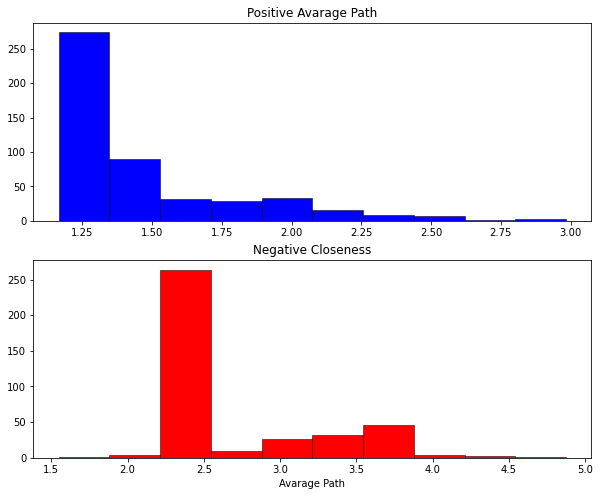

In [17]:
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 8))
ax1.hist(length_positive_mean.values(),facecolor = 'blue', edgecolor='black', linewidth=0.5)
ax1.set_title('Positive Avarage Path')
ax2.hist(length_negative_mean.values(),facecolor = 'red', edgecolor='black', linewidth=0.5)
ax2.set_title('Negative Closeness')
ax2.set_xlabel('Avarage Path')
plt.savefig("plots\\avarage_shortest_path_distribution.pdf", format="pdf", bbox_inches="tight")
plt.show()

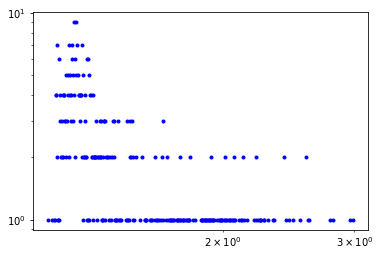

In [18]:
degree_hist=collections.Counter(length_positive_mean.values())
ydata = ydata[ydata >0]
xdata = np.array(range(0, len(ydata)+1))
xdata = xdata[xdata >0]
xdata = np.array(list(degree_hist.keys()))
xdata = xdata[xdata > 0]
ydata = np.array(list(degree_hist.values()))
ydata = ydata[ydata >0]
plt.plot(xdata,ydata,'b.')
plt.loglog()
plt.show()

In [81]:
print(f"Average shortest path positive : {np.mean(np.fromiter(length_positive_mean.values(),dtype = float)):.2f}")
print(f"Average shortest path negative : {np.mean(np.fromiter(length_negative_mean.values(),dtype = float)):.2f}")

Average shortest path positive : 1.47
Average shortest path negative : 2.74


### Fit positive  avarage shortest path

In [19]:
def fit_power_law(x, y, init):
    opt_parms, parm_cov =curve_fit(powerlaw_fun, x, y, init,maxfev=1000)
    A, B  = opt_parms
    return A, B, parm_cov
def powerlaw_fun(x, A, B):
    return A*x**(-B)

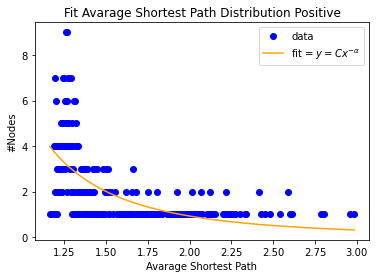

A: 6.01+- 0.55, 	 B: 2.71+- 0.29 	 R2: 0.36, 	 chi: 172.81


In [20]:
init = (3,2)
A,B,parm_cov = fit_power_law(xdata, ydata, init)
SE = np.sqrt(np.diag(parm_cov))
x_fit = np.linspace(min(xdata),max(xdata),100000)
fit_y = powerlaw_fun(xdata, A, B)
y_fit = powerlaw_fun(x_fit, A, B)
plt.plot(figsize=(20, 8))
plt.plot(xdata, ydata, marker = 'o', color = 'blue', label='data', linestyle=" ")
plt.plot(x_fit, y_fit, '-', label=r'fit = $y = Cx^{-\alpha}$', color ='orange')
plt.legend()
plt.title('Fit Avarage Shortest Path Distribution Positive')
plt.ylabel('#Nodes')
plt.xlabel('Avarage Shortest Path')
plt.savefig("plots\\avarage_shortest_path_distribution_positive_fit.pdf", format="pdf", bbox_inches="tight")

plt.show()
R2 = r2_score(ydata,fit_y)
chi_sq = np.sum(np.divide(np.square(fit_y - ydata), ydata)) 
print(f'A: {A:.2f}+- {SE[0]:.2f}, \t B: {B:.2f}+- {SE[1]:.2f} \t R2: {R2:.2f}, \t chi: {chi_sq:.2f}')

## Clustering Coefficient and Density

In [21]:
density_positive = nx.density(tot_pos)
density_negative = nx.density(tot_neg)
print(f'Positive density: {density_positive:.2f} \t Negative density: {density_negative:.2f}')

Positive density: 0.58 	 Negative density: 0.01


In [22]:
CC_positive = nx.average_clustering(tot_pos)
CC_negative = nx.average_clustering(tot_neg)
print(f'Global Clustering Coefficient Positive: {CC_positive:.3f} \t Global Clustering Coefficient Negative: {CC_negative:.3f}')

Global Clustering Coefficient Positive: 0.834 	 Global Clustering Coefficient Negative: 0.001


In [ ]:
list_clustering_positive = collections.defaultdict(list)
list_clustering_negative = collections.defaultdict(list)
for node in tot_pos.nodes():
    a = nx.clustering(tot_pos)[node]
    list_clustering_positive[node] = a
    print(f'Done positive {node}')
for node in tot_neg.nodes():
    a = nx.clustering(tot_neg)[node]
    list_clustering_negative[node] = a
    print(f'Done negative {node}')
np.save('p_clustering.npy', list_clustering_positive) 
np.save('n_clustering.npy', list_clustering_negative) 

In [23]:
p_clustering = np.load('p_clustering.npy',allow_pickle='TRUE').item()
n_clustering = np.load('n_clustering.npy',allow_pickle='TRUE').item()

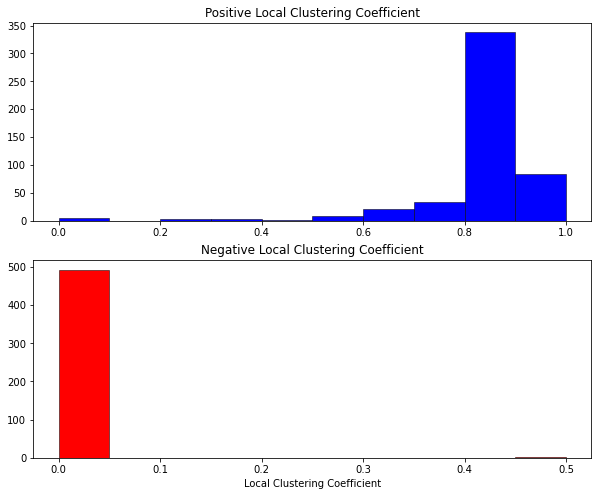

In [24]:
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 8))
ax1.hist(p_clustering.values(),facecolor = 'blue', edgecolor='black', linewidth=0.5)
ax1.set_title('Positive Local Clustering Coefficient')
ax2.hist(n_clustering.values(),facecolor = 'red', edgecolor='black', linewidth=0.5)
ax2.set_title('Negative Local Clustering Coefficient')
ax2.set_xlabel('Local Clustering Coefficient')
plt.savefig("plots\\local_clustering_coefficient.pdf", format="pdf", bbox_inches="tight")
plt.show()

## Compare with known graph

### ER

In [25]:
node_pos = len(tot_pos.nodes())
node_neg = len(tot_neg.nodes())
prob_pos = 2*len(tot_pos.edges())/(node_pos * (node_pos-1))
prob_neg = 2*len(tot_neg.edges())/(node_neg * (node_neg-1))
er_pos = nx.erdos_renyi_graph(len(tot_pos.nodes()), prob_pos, seed = 42)
er_neg = nx.erdos_renyi_graph(len(tot_neg.nodes()), prob_neg, seed = 42)
print(f'Probability positive: {prob_pos:.2f} \t Probability negative: {prob_neg:.2f} ')

Probability positive: 0.58 	 Probability negative: 0.01 


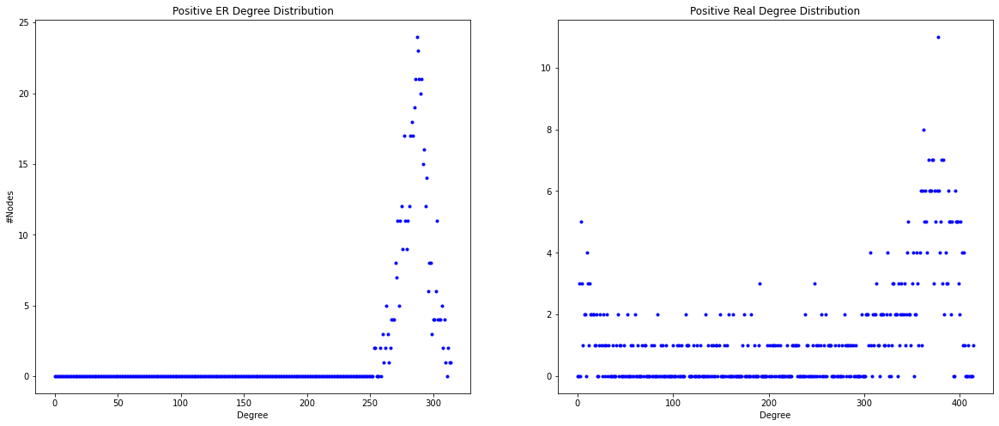

In [26]:
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20, 8))
hist_pos_er = nx.degree_histogram(er_pos)
hist_pos = nx.degree_histogram(tot_pos)
ax1.plot(range(0, len(hist_pos_er)),hist_pos_er,'b.')
ax1.set_title('Positive ER Degree Distribution')
ax2.plot(range(0, len(hist_pos)),hist_pos,'b.')
ax2.set_title('Negative Closeness')
ax2.set_title('Positive Real Degree Distribution')
ax2.set_xlabel('Degree')
ax1.set_xlabel('Degree')
ax1.set_ylabel('#Nodes')
plt.savefig("plots\\er_comparison_positive.pdf", format="pdf", bbox_inches="tight")
plt.show()

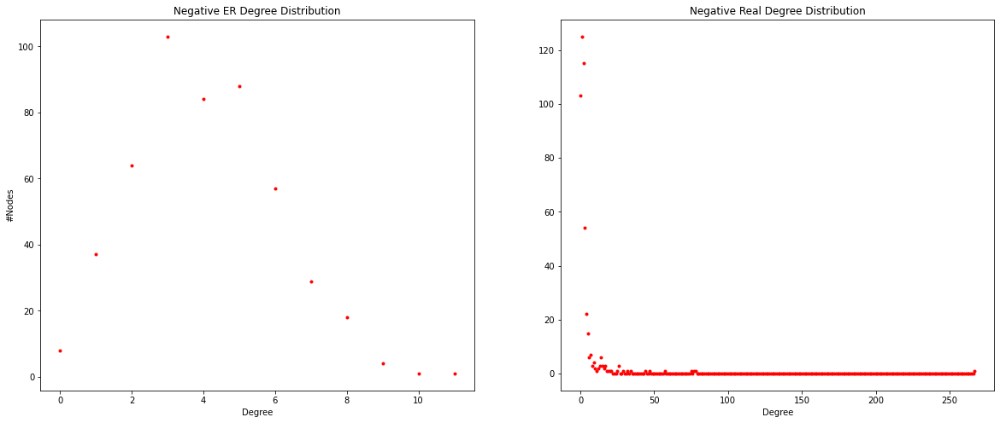

In [27]:
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20, 8))
hist_neg_er = nx.degree_histogram(er_neg)
hist_neg = nx.degree_histogram(tot_neg)
ax1.plot(range(0, len(hist_neg_er)),hist_neg_er,'r.')
ax1.set_title('Negative ER Degree Distribution')
ax2.plot(range(0, len(hist_neg)),hist_neg,'r.')
ax2.set_title('Negative Closeness')
ax2.set_title('Negative Real Degree Distribution')
ax2.set_xlabel('Degree')
ax1.set_xlabel('Degree')
ax1.set_ylabel('#Nodes')
plt.savefig("plots\\er_comparison_negative.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [28]:
prob_pos < 1/node_pos, prob_pos == 1/node_pos, prob_pos > 1/node_pos, prob_pos > np.log(node_pos)/node_pos

(False, False, True, True)

In [29]:
prob_neg < 1/node_neg, prob_neg == 1/node_neg, prob_neg > 1/node_neg, prob_neg > np.log(node_neg)/node_neg

(False, False, True, False)

### BA

In [30]:
E_pos = len(tot_pos.edges())
E_neg = len(tot_neg.edges())
m_pos = round(E_pos/node_pos)
m_neg = round(E_neg/node_neg)
ba_pos = nx.barabasi_albert_graph(node_pos, m_pos, seed = 42)
ba_neg = nx.barabasi_albert_graph(node_neg, m_neg, seed = 42)
print(f'Number of edges to attach (positive): {m_pos:.0f} \t Number of edges to attach (negative): {m_neg:.0f} ')

Number of edges to attach (positive): 143 	 Number of edges to attach (negative): 2 


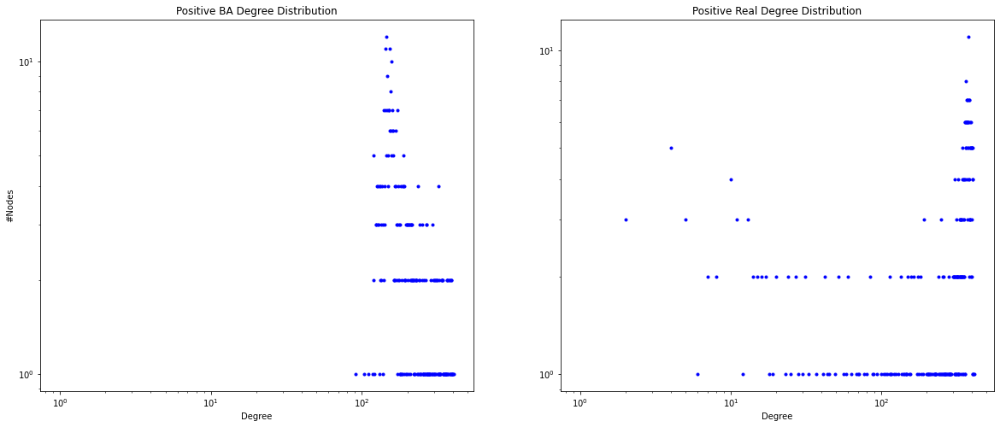

In [31]:
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20, 8))
hist_pos_ba = nx.degree_histogram(ba_pos)
hist_pos = nx.degree_histogram(tot_pos)
ax1.plot(range(0, len(hist_pos_ba)),hist_pos_ba,'b.')
ax1.set_title('Positive BA Degree Distribution')
ax2.plot(range(0, len(hist_pos)),hist_pos,'b.')
ax2.set_title('Negative Closeness')
ax2.set_title('Positive Real Degree Distribution')
ax2.set_xlabel('Degree')
ax1.set_xlabel('Degree')
ax1.set_ylabel('#Nodes')
ax1.loglog()
ax2.loglog()
plt.savefig("plots\\ba_comparison_positive.pdf", format="pdf", bbox_inches="tight")
plt.show()

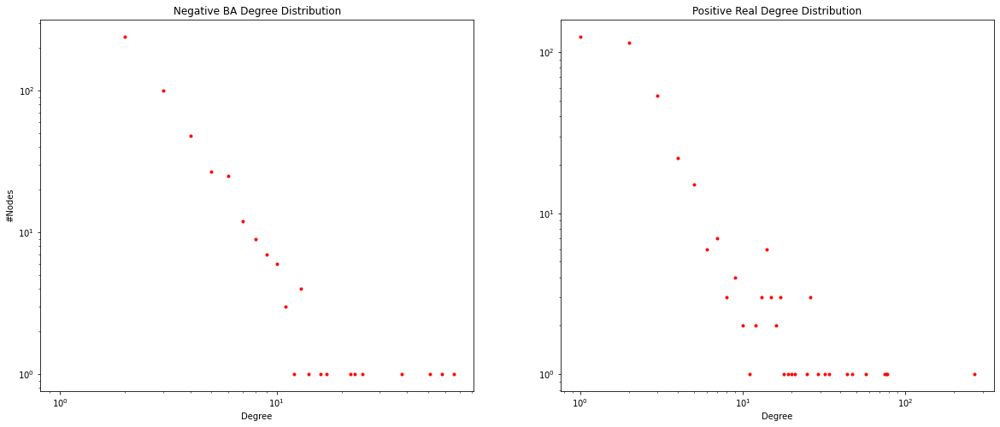

In [32]:
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20, 8))
hist_neg_ba = nx.degree_histogram(ba_neg)
hist_neg = nx.degree_histogram(tot_neg)
ax1.plot(range(0, len(hist_neg_ba)),hist_neg_ba,'r.')
ax1.set_title('Negative BA Degree Distribution')
ax2.plot(range(0, len(hist_neg)),hist_neg,'r.')
ax2.set_title('Negative Closeness')
ax2.set_title('Positive Real Degree Distribution')
ax2.set_xlabel('Degree')
ax1.set_xlabel('Degree')
ax1.set_ylabel('#Nodes')
ax1.loglog()
ax2.loglog()
plt.savefig("plots\\ba_comparison_negative.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [33]:
fit_pos = powerlaw.Fit(np.array(hist_pos_ba)+1, fit_method='KS')
alpha_pos = fit_pos.power_law.alpha+1
sigma_pos = fit_pos.power_law.sigma
print(f'Positive BA alpha={alpha_pos:.2f} sigma={sigma_pos:.2f}')
fit_pos = powerlaw.Fit(np.array(hist_pos)+1, fit_method='KS')
alpha_pos = fit_pos.power_law.alpha+1
sigma_pos = fit_pos.power_law.sigma
print(f'Positive alpha={alpha_pos:.2f} sigma={sigma_pos:.2f}')

Calculating best minimal value for power law fit
xmin progress: 00%
xmin progress: 08%
xmin progress: 16%
xmin progress: 25%
xmin progress: 33%
xmin progress: 41%
xmin progress: 50%
xmin progress: 58%
xmin progress: 66%
xmin progress: 75%
xmin progress: 83%
xmin progress: 91%
Positive BA alpha=5.29 sigma=0.41
Calculating best minimal value for power law fit
xmin progress: 00%
xmin progress: 11%
xmin progress: 22%
xmin progress: 33%
xmin progress: 44%
xmin progress: 55%
xmin progress: 66%
xmin progress: 77%
xmin progress: 88%
Positive alpha=15.38 sigma=5.06


In [34]:
fit_neg = powerlaw.Fit(np.array(hist_neg_ba)+1, fit_method='KS')
alpha_neg = fit_neg.power_law.alpha+1
sigma_neg = fit_neg.power_law.sigma
print(f'Negative BA alpha={alpha_neg:.2f} sigma={sigma_neg:.2f}')
fit_neg = powerlaw.Fit(np.array(hist_neg)+1, fit_method='KS')
alpha_neg = fit_neg.power_law.alpha+1
sigma_neg = fit_neg.power_law.sigma
print(f'Negative alpha={alpha_neg:.2f} sigma={sigma_neg:.2f}')

Calculating best minimal value for power law fit
xmin progress: 00%
xmin progress: 08%
xmin progress: 16%
xmin progress: 25%
xmin progress: 33%
xmin progress: 41%
xmin progress: 50%
xmin progress: 58%
xmin progress: 66%
xmin progress: 75%
xmin progress: 83%
xmin progress: 91%
Negative BA alpha=3.67 sigma=0.20
Calculating best minimal value for power law fit
xmin progress: 00%
xmin progress: 08%
xmin progress: 16%
xmin progress: 25%
xmin progress: 33%
xmin progress: 41%
xmin progress: 50%
xmin progress: 58%
xmin progress: 66%
xmin progress: 75%
xmin progress: 83%
xmin progress: 91%
Negative alpha=7.05 sigma=0.31


### WS

In [86]:
K_pos = round(E_pos/ (2* node_pos))
K_neg = round(E_neg/ (2* node_neg))+1
p = 0.1
ws_pos = nx.watts_strogatz_graph(node_pos, k=K_pos, p=p, seed= 42)
ws_neg = nx.watts_strogatz_graph(node_neg, k=K_neg, p=p, seed = 42)
print(f'k-nearest neighbors positive: {K_pos} \t k-nearest neighbors negative: {K_neg}')

k-nearest neighbors positive: 71 	 k-nearest neighbors negative: 2


In [87]:
print(f"Global clustering positive: {nx.average_clustering(ws_pos)}")
print(f"Global clustering negative: {nx.average_clustering(ws_neg)}")

Global clustering positive: 0.555686554812222
Global clustering negative: 0.004385964912280702


In [101]:
print(f"Average shortest path positive : {nx.average_shortest_path_length(ws_pos):.2f}")
comps_ws_neg = list(nx.connected_components(ws_neg))
comp_big_ws_neg = nx.subgraph(ws_neg, comps_ws_neg[2])
print(f"Average shortest path negative : {nx.average_shortest_path_length(comp_big_ws_neg):.2f}")

Average shortest path positive : 1.94
Average shortest path negative : 11.10
